<a href="https://colab.research.google.com/github/aneel10/dl-semi-project/blob/master/yaml70/DraftGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Inpainting Image
**Name Student 1:** Yam Libman

**ID Student 1:** 205935463

**Name Student 2:** Anil Azam

**ID Student 2:** 318932357



<a align="bottom left"  target="_blank">
<img width="500", src="https://i.ytimg.com/vi/dx-K_fAp2ow/maxresdefault.jpg"></a>

In this notebook we're going to conduct 4 experiments of Inpaiting cats' images.


the notebook and the experience is based on the article:

'Context Encoders: Feature Learning by Inpainting'

challenge accepted!

## **Data Preprocessing**





In [1]:
#import related libraries
import os
import glob
import imageio
import numpy as np
from tqdm import tqdm
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
from tensorflow.keras import layers

# Defining the global variables.
IMAGE_SIZE = (128, 128)
BATCH_SIZE = 64
EPOCHS = 40
AUTOTUNE = tf.data.AUTOTUNE

In [2]:
pip install --upgrade tensorflow

In [3]:
#mount my colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [68]:
len(os.listdir('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set/cats'))

5652

In [71]:
len(os.listdir('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set/cat_missing'))

5652

**creating new folders for both cats and missing cats with same photos converted to jpeg due to some limitations in Keras API**

In [72]:
from PIL import Image
from pathlib import Path

def create_jpeg_folder(path, new_path):
  
  imagelist = os.listdir(path)

  for image in imagelist:
    img = Image.open(f'{path}/{image}')
    new_img = img.convert('RGB')
    image = Path(image)
    image = image.with_suffix('.jpeg')
    new_img.save(f'{new_path}/{image}')

create_jpeg_folder('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set/cats','/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/cats')
create_jpeg_folder('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set/cat_missing','/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/cat_missing')

In [73]:
len(os.listdir('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/cats'))

5652

In [74]:
len(os.listdir('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/cat_missing'))

5652

In [75]:
from google.colab.patches import cv2_imshow

In [76]:
from skimage.metrics import structural_similarity as ssim
import cv2

def create_mask_and_save_it(missing_path,real_path,mask_path):

  imagelist = os.listdir(missing_path)

  for image in imagelist:

    missing_image = cv2.imread(f'{missing_path}/{image}')
    real_image = cv2.imread(f'{real_path}/{image}')
  
    missing_image_gray = cv2.cvtColor(missing_image, cv2.COLOR_BGR2GRAY)
    real_image_gray = cv2.cvtColor(real_image, cv2.COLOR_BGR2GRAY)

    # Compute SSIM between two images
    (score, diff) = ssim(missing_image_gray, real_image_gray, full=True)
    print("Image similarity:", score)

    # The diff image contains the actual image differences between the two images
    # and is represented as a floating point data type in the range [0,1] 
    # so we must convert the array to 8-bit unsigned integers in the range
    # [0,255] image1 we can use it with OpenCV
    diff = (diff * 255).astype("uint8")
    thresh = cv2.threshold(diff, 0, 255,cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    thresh[thresh>0] = 255
    thresh[thresh<=0] = 0

    filename = f'{mask_path}/{image}'
    cv2.imwrite(filename, thresh)

    cv2_imshow(thresh)

    print(thresh.max())

    

Image similarity: 0.9930914232618205


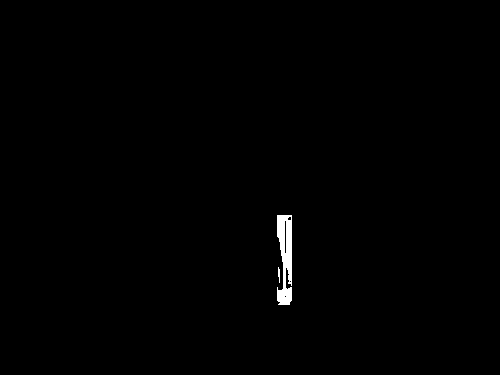

255
Image similarity: 0.993313370869747


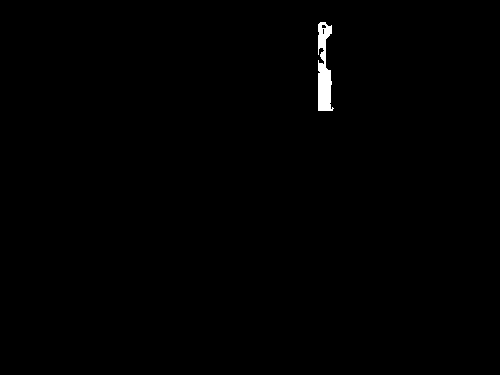

255
Image similarity: 0.9886753785620882


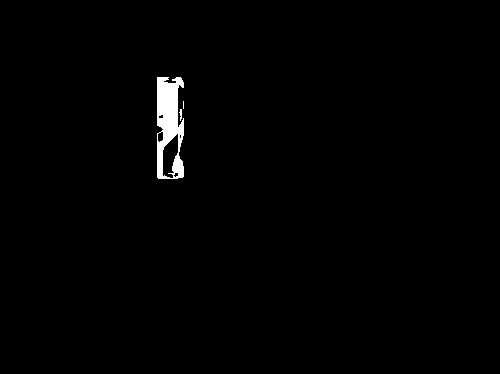

255
Image similarity: 0.9607803804464145


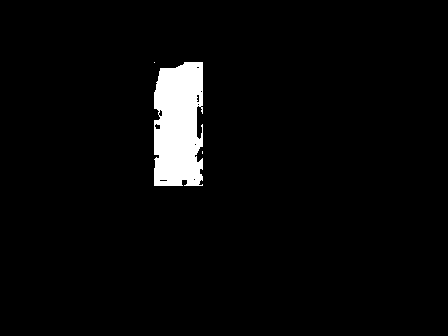

255
Image similarity: 0.9823603907641999


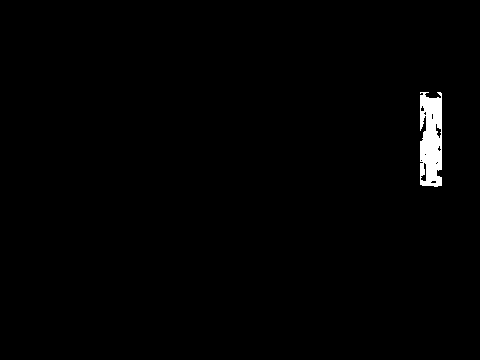

255
Image similarity: 0.7937871477607248


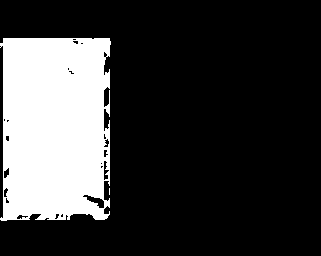

255
Image similarity: 0.9861075034268253


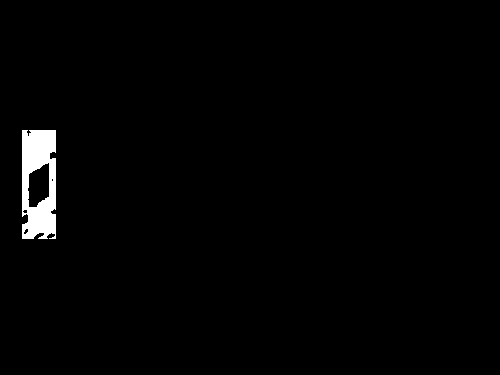

255
Image similarity: 0.9788165030644439


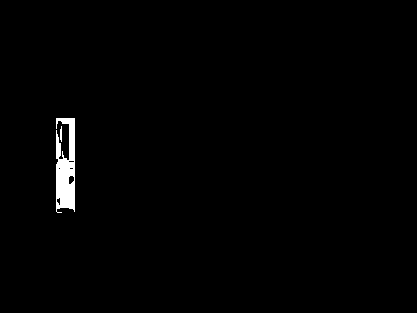

255
Image similarity: 0.9847457811600195


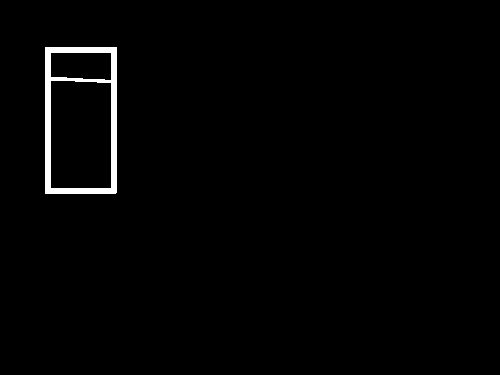

255
Image similarity: 0.9772602756639298


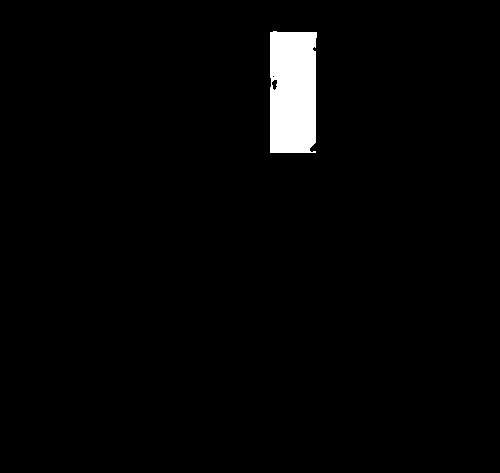

255
Image similarity: 0.8931002604416038


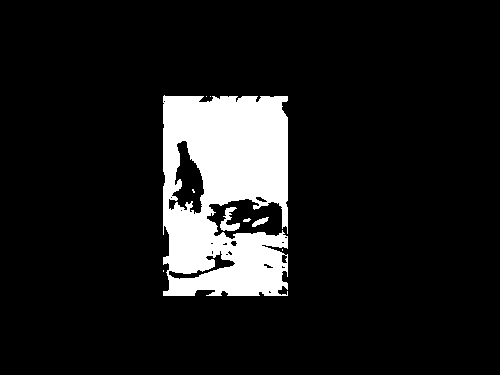

255
Image similarity: 0.8648305606010038


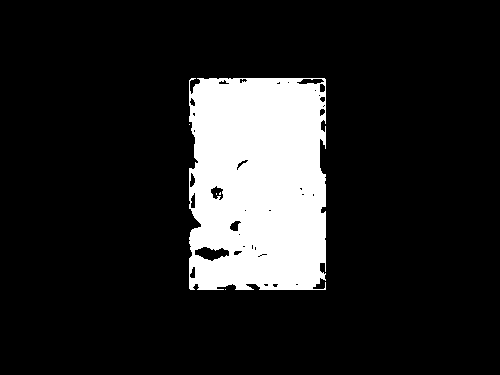

255
Image similarity: 0.9717468959309589


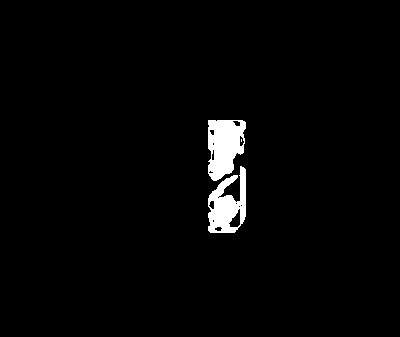

255
Image similarity: 0.9747582154559075


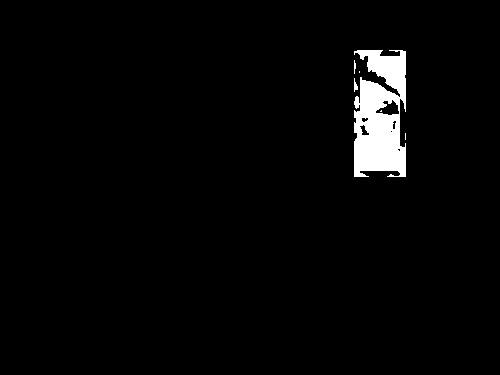

255
Image similarity: 0.9809820844729614


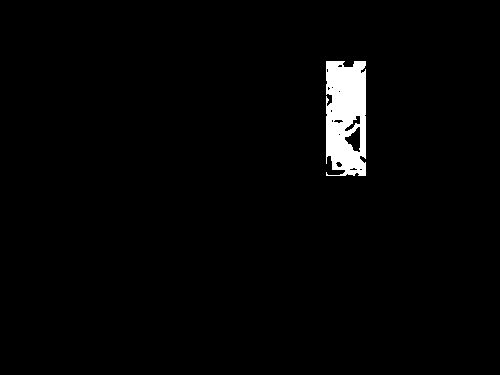

255
Image similarity: 0.934763492081776


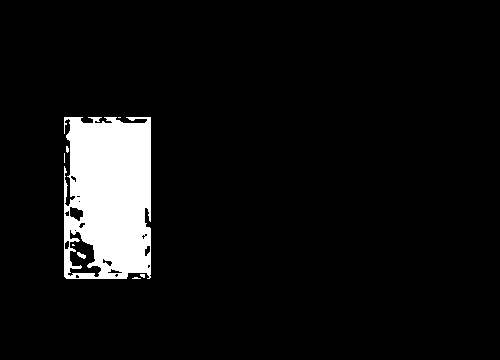

255
Image similarity: 0.9627219696910003


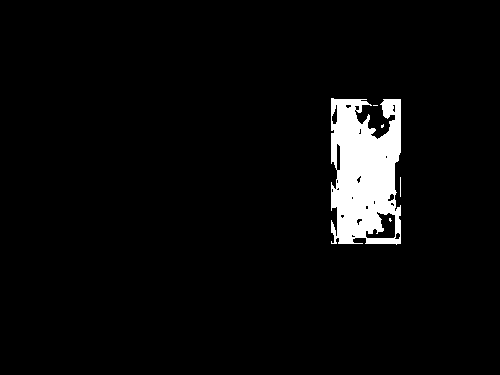

255
Image similarity: 0.9474245568136578


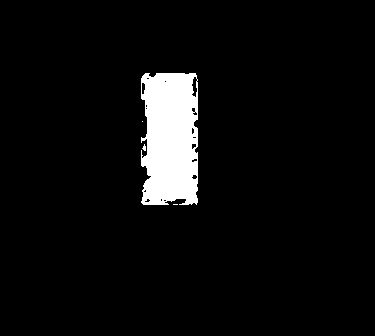

255
Image similarity: 0.9472322071868977


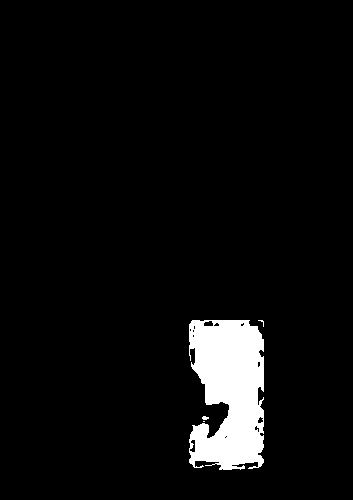

255
Image similarity: 0.9528193830483483


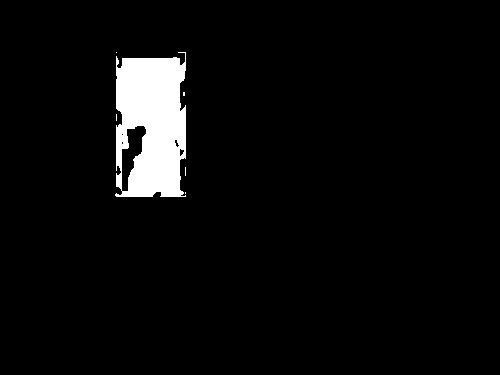

255
Image similarity: 0.9437696520011266


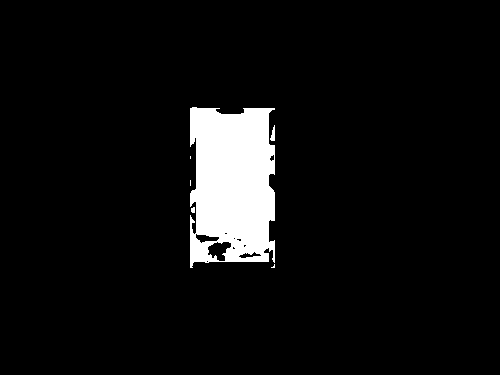

255
Image similarity: 0.9900625586608056


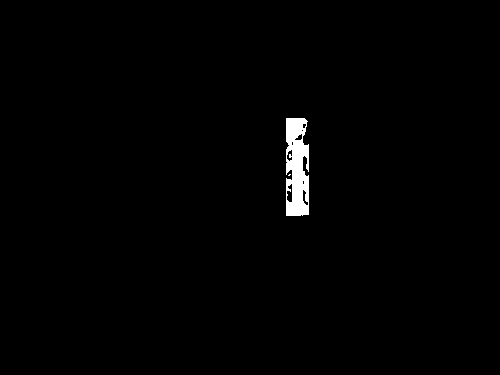

255
Image similarity: 0.9523305642304981


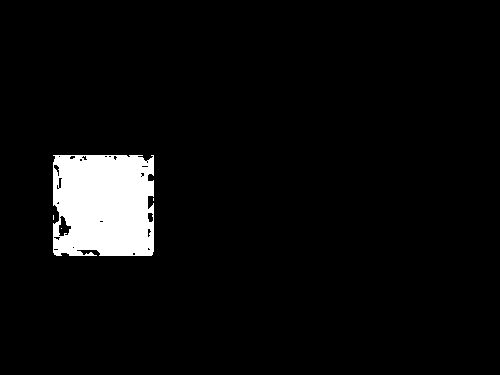

255
Image similarity: 0.9870654859502233


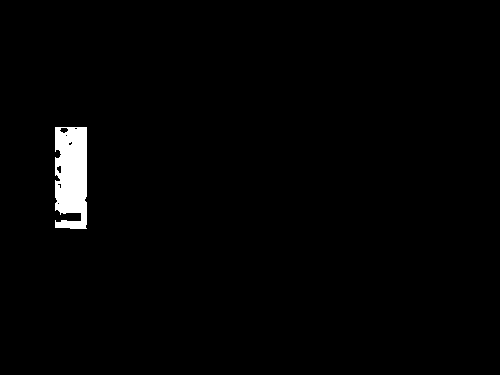

255
Image similarity: 0.9897821117656587


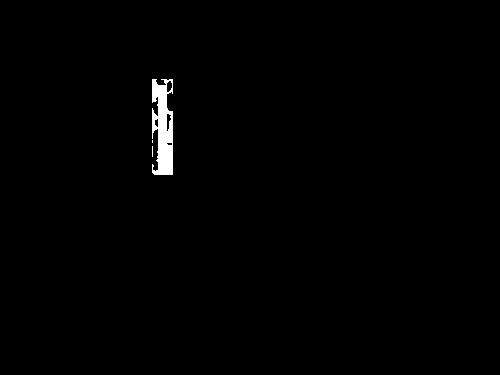

255
Image similarity: 0.9860426424343716


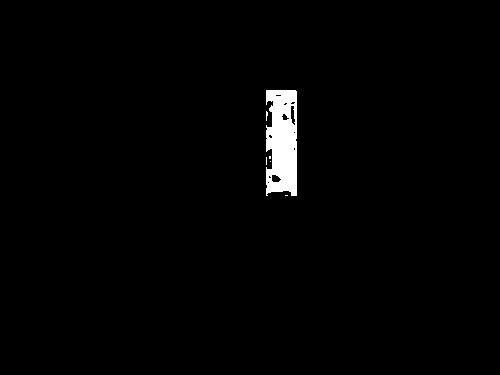

255
Image similarity: 0.9021154757902643


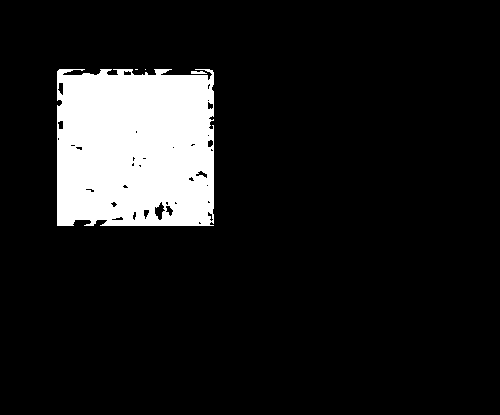

255
Image similarity: 0.9682881924445818


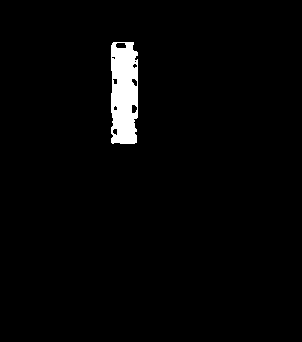

255
Image similarity: 0.9837670981870797


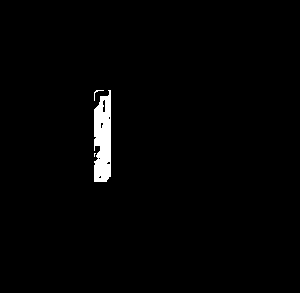

255
Image similarity: 0.9838997744849423


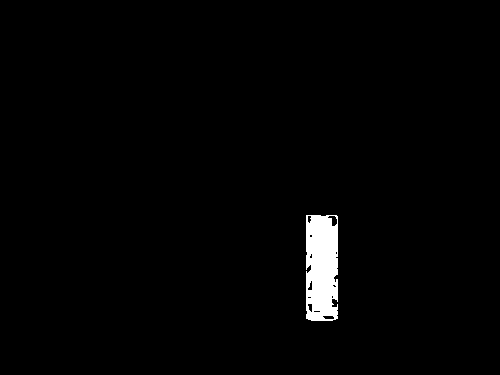

255
Image similarity: 0.8522210681388163


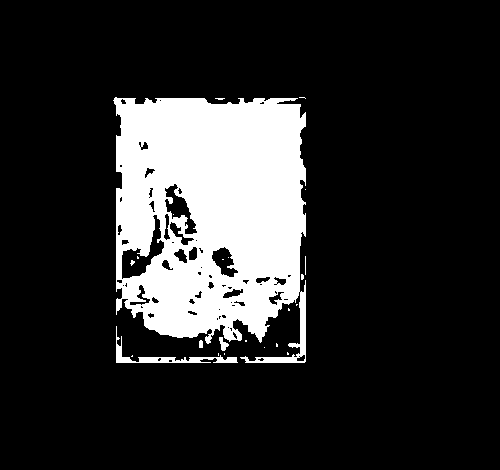

255
Image similarity: 0.9259815807341222


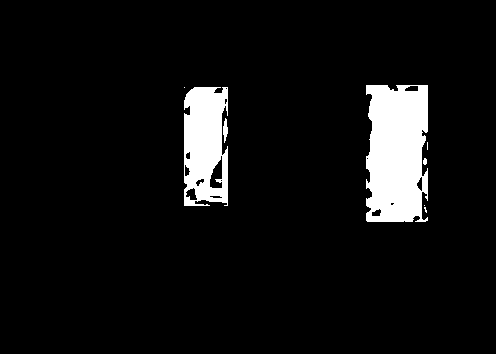

255
Image similarity: 0.9251751645892452


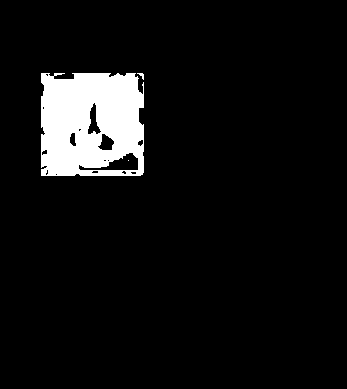

255
Image similarity: 0.9324787491217108


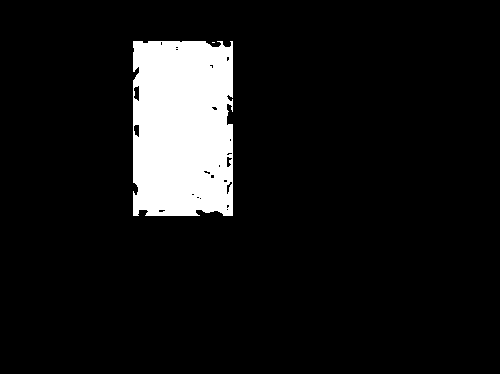

255
Image similarity: 0.9915818524622823


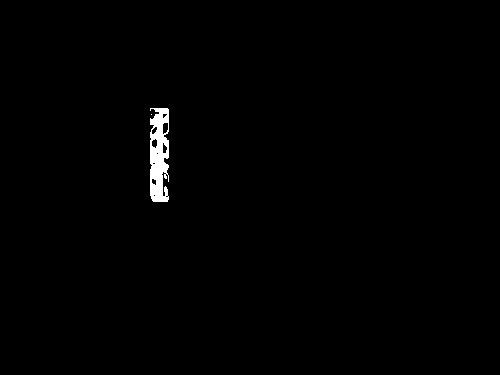

255
Image similarity: 0.8346173405428174


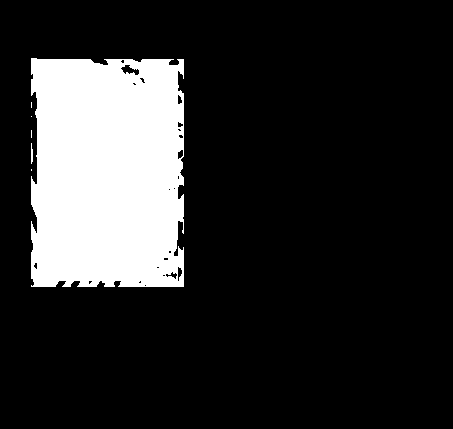

255
Image similarity: 0.9953128184341515


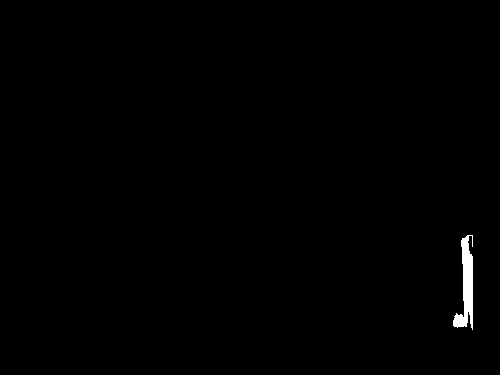

255
Image similarity: 0.978053600172697


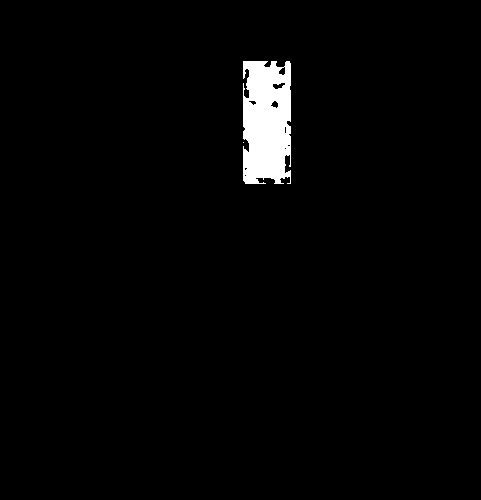

255
Image similarity: 0.7024195609753044


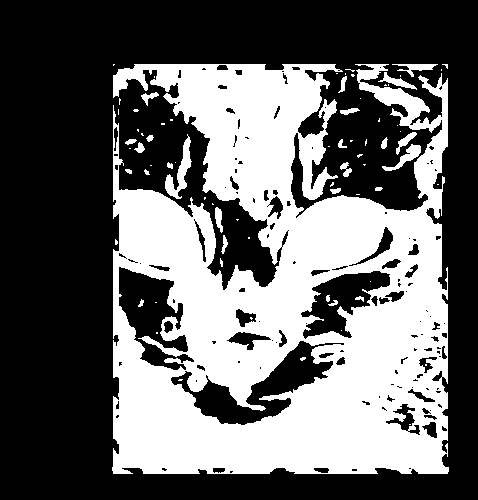

255
Image similarity: 0.8194461550813006


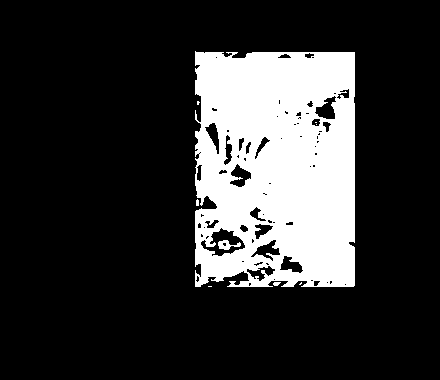

255
Image similarity: 0.5586138583856235


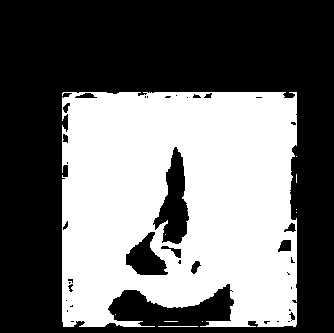

255
Image similarity: 0.9581612005506496


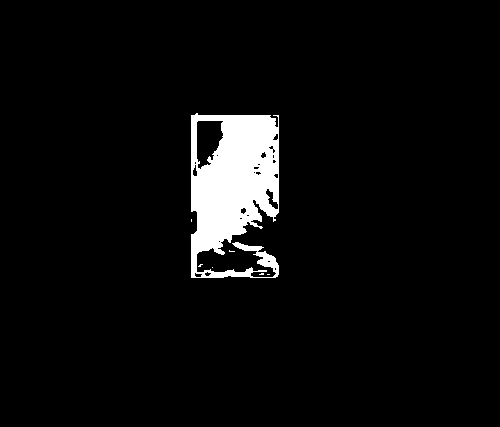

255
Image similarity: 0.9828023778350448


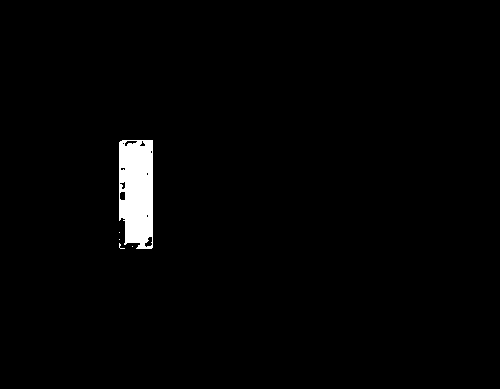

255
Image similarity: 0.7846466051820707


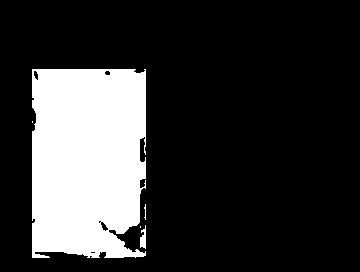

255
Image similarity: 0.8767051122290134


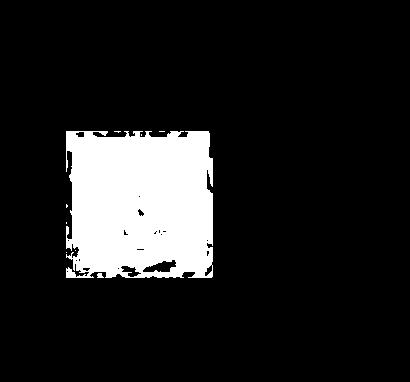

255
Image similarity: 0.9554214566775608


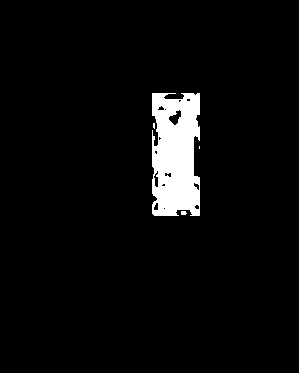

255
Image similarity: 0.9864998295112005


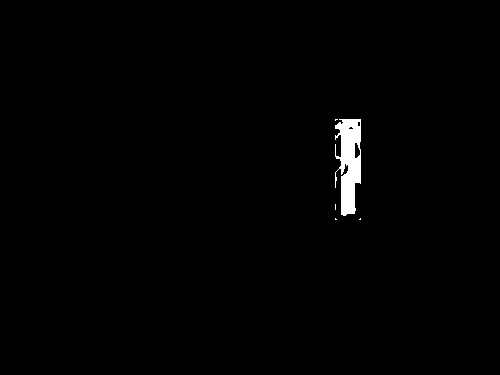

255
Image similarity: 0.9904947769230463


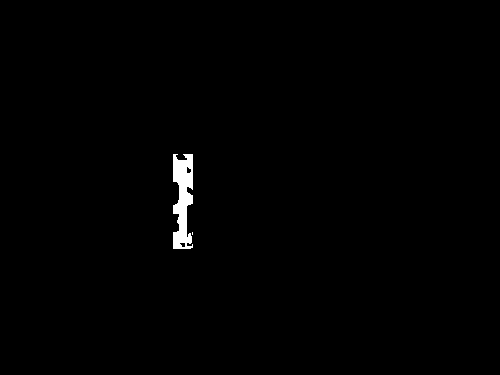

255
Image similarity: 0.8976710546715088


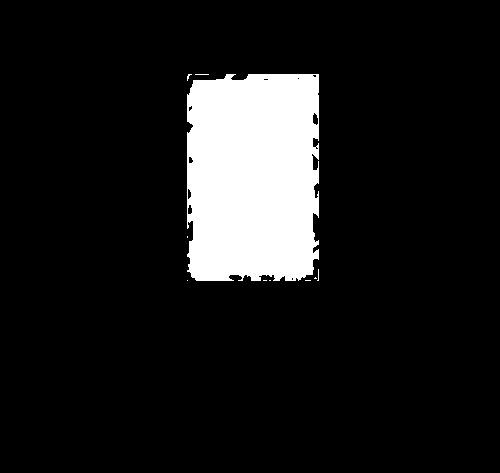

255
Image similarity: 0.9779551157256251


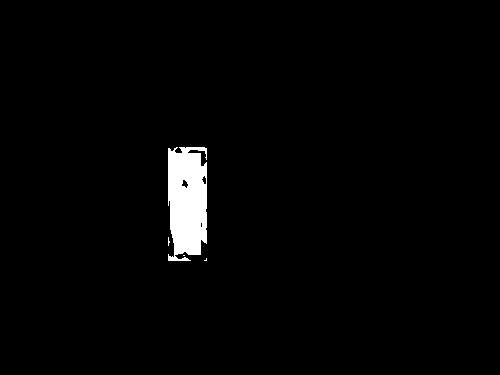

255
Image similarity: 0.9927779537410951


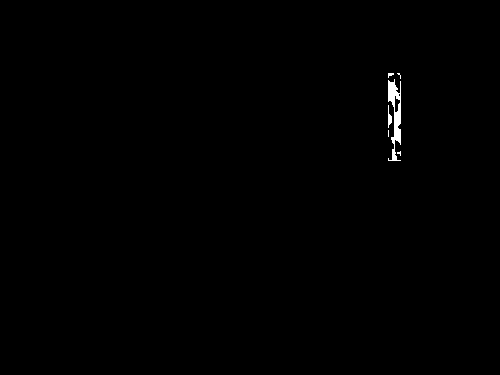

255
Image similarity: 0.9909171881989316


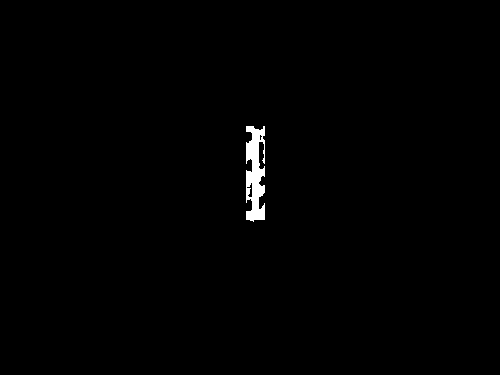

255
Image similarity: 0.7751486991689933


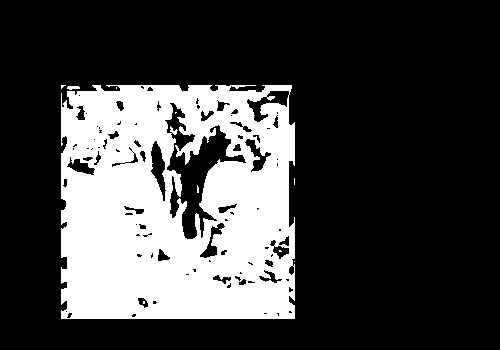

255
Image similarity: 0.9378178756821371


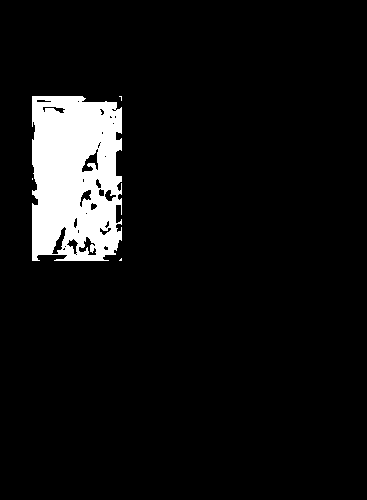

255
Image similarity: 0.9603722081394404


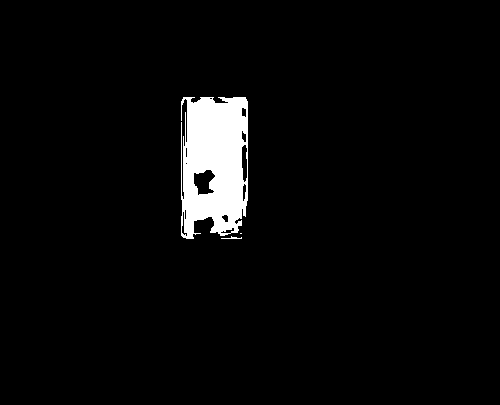

255
Image similarity: 0.8690025815232043


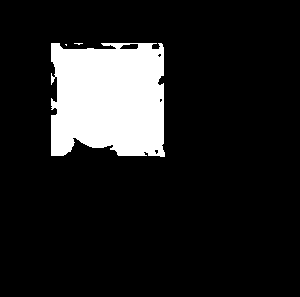

255
Image similarity: 0.9296565507071829


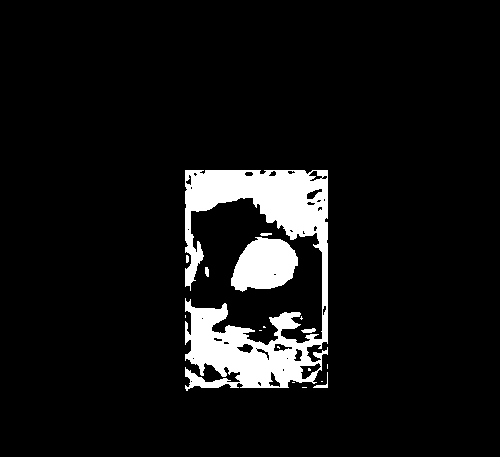

255
Image similarity: 0.8992996302296132


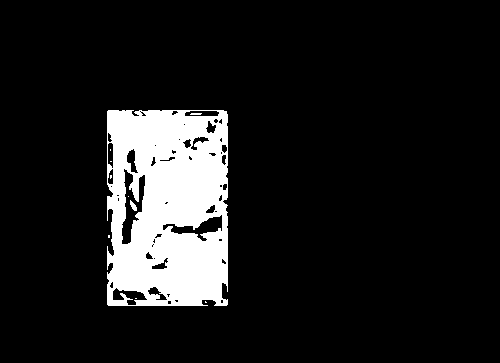

255
Image similarity: 0.9495490576254482


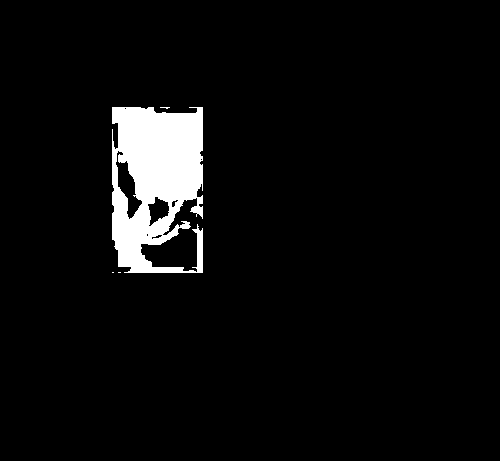

255
Image similarity: 0.9863894981551259


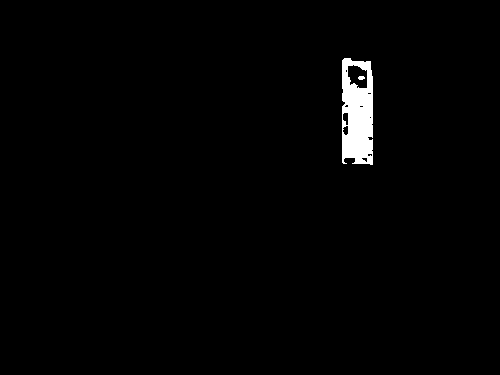

255
Image similarity: 0.9925488039232766


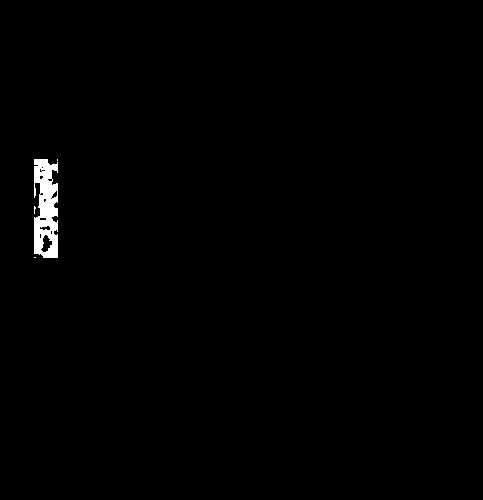

255
Image similarity: 0.9780581472188778


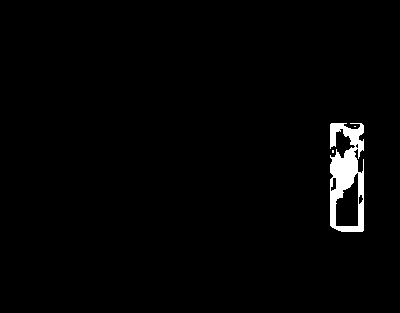

255
Image similarity: 0.9882132406794254


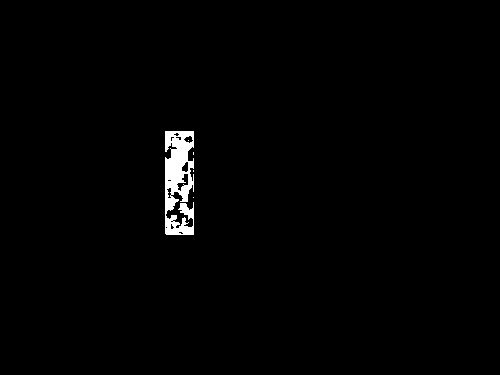

255
Image similarity: 0.9064640002081908


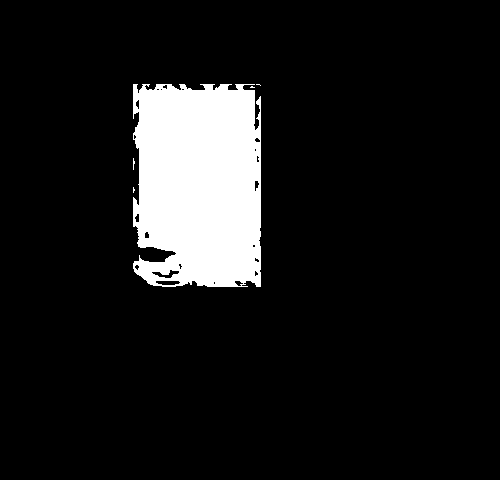

255
Image similarity: 0.9879291046116331


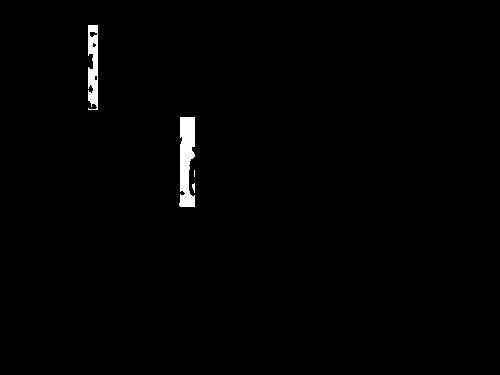

255
Image similarity: 0.9864728174799191


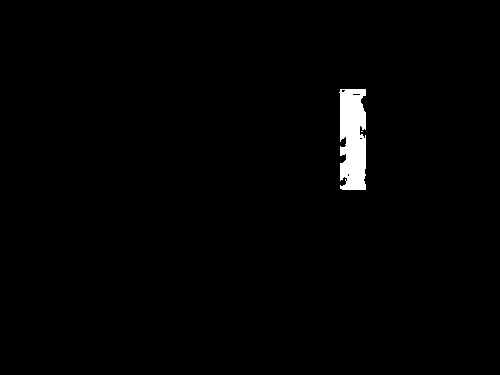

255
Image similarity: 0.963815209998566


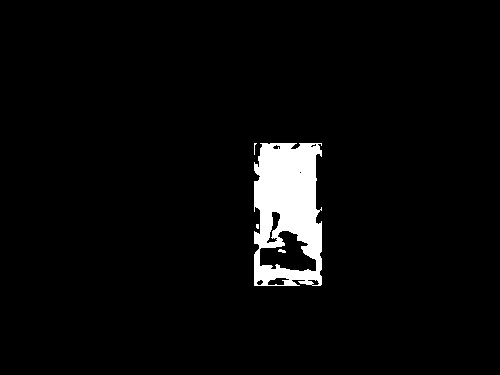

255
Image similarity: 0.9112783092224904


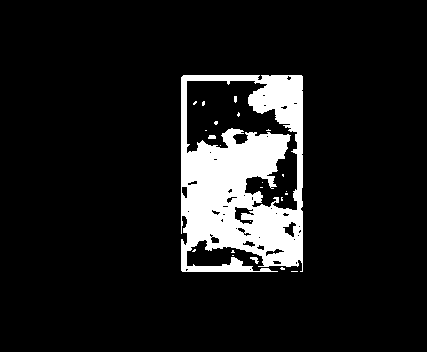

255
Image similarity: 0.955291222329662


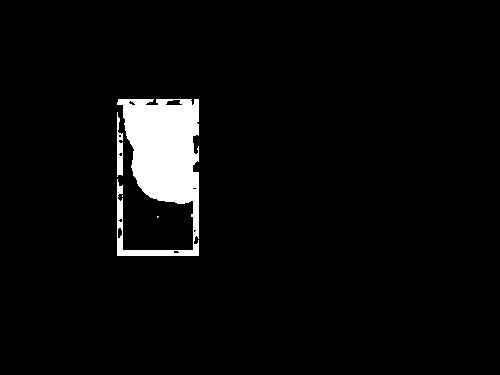

255
Image similarity: 0.972078388268542


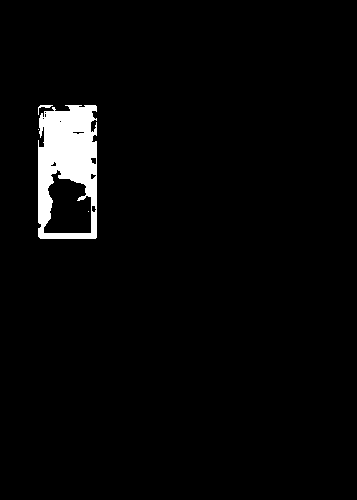

255
Image similarity: 0.7002212174699951


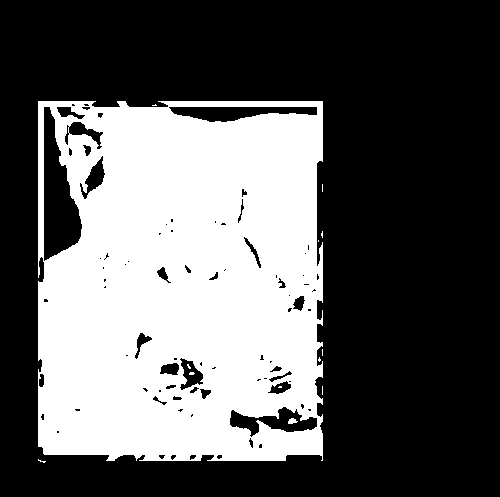

255
Image similarity: 0.9912270505733352


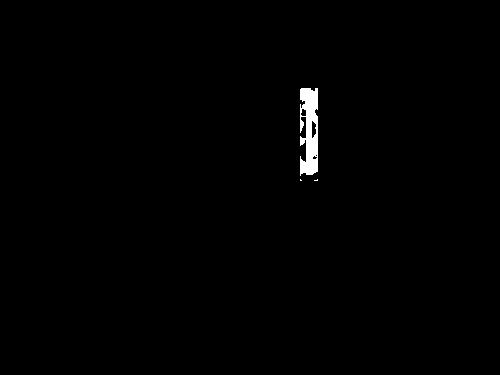

255
Image similarity: 0.7942396560023688


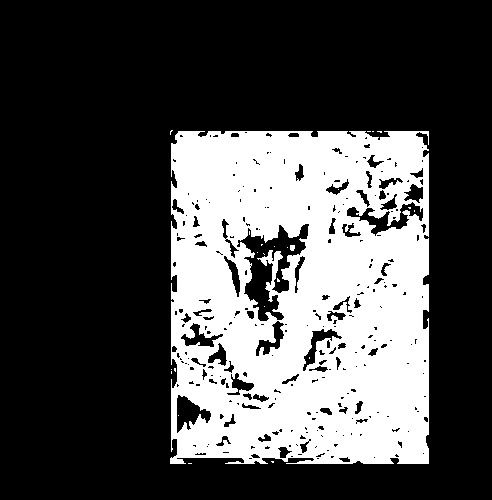

255
Image similarity: 0.941540101654074


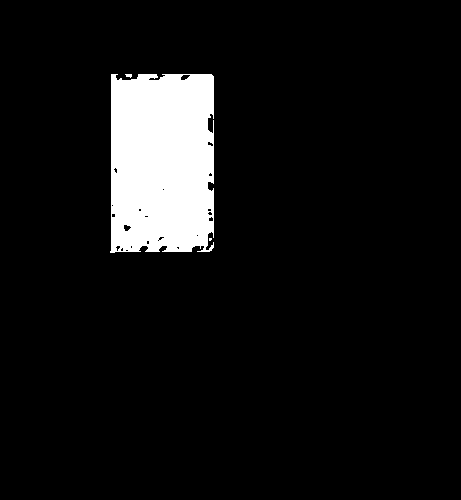

255
Image similarity: 0.8955966589021624


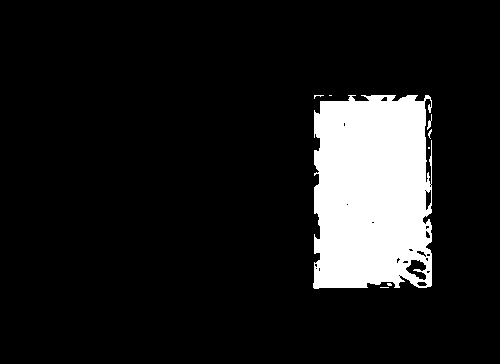

255
Image similarity: 0.9695901659441877


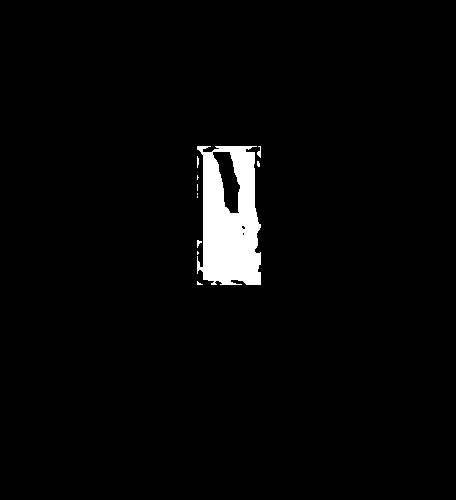

255
Image similarity: 0.9678521625493774


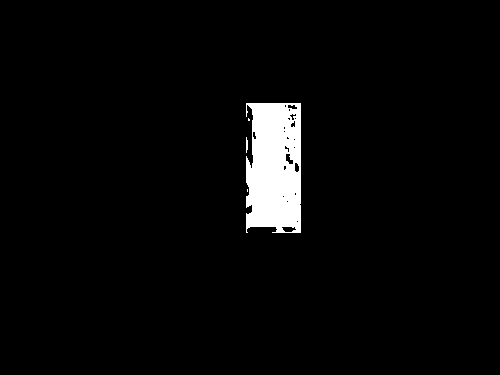

255
Image similarity: 0.9680037638858395


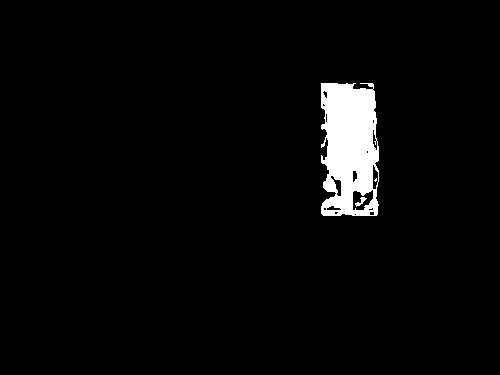

255
Image similarity: 0.854010648225238


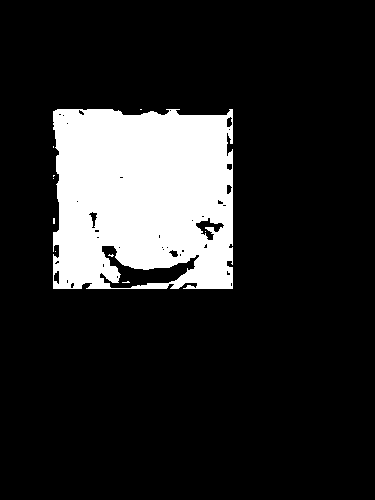

255
Image similarity: 0.9705987444357155


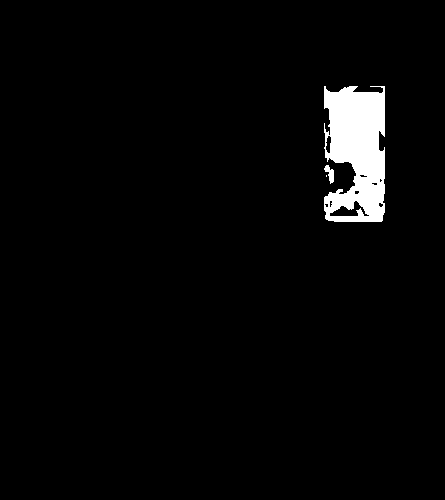

255
Image similarity: 0.8362021088634224


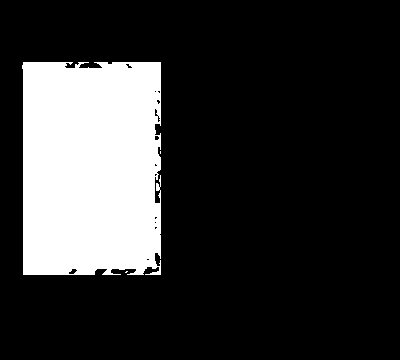

255
Image similarity: 0.8871720353955873


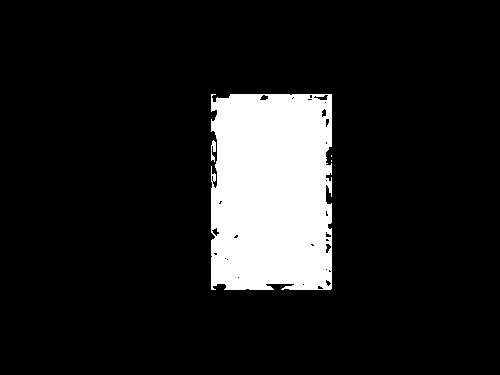

255
Image similarity: 0.9574115022066741


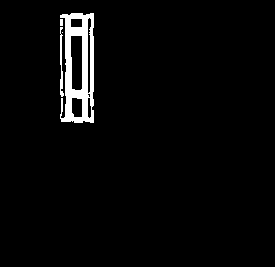

255
Image similarity: 0.9925282361617818


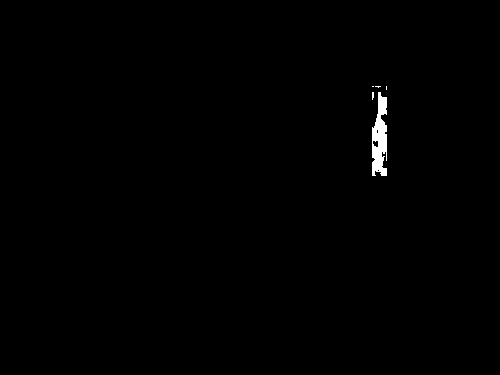

255
Image similarity: 0.8768476983356744


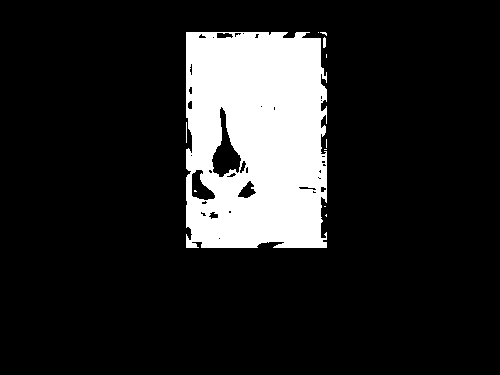

255
Image similarity: 0.9584137206443473


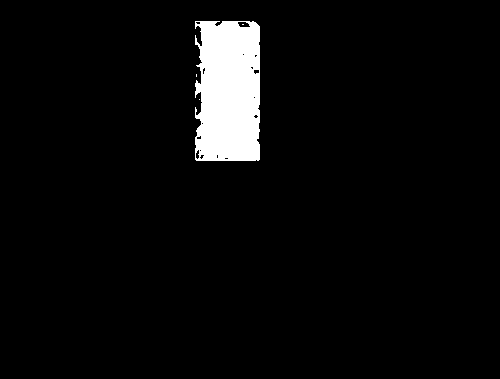

255
Image similarity: 0.9875085801455187


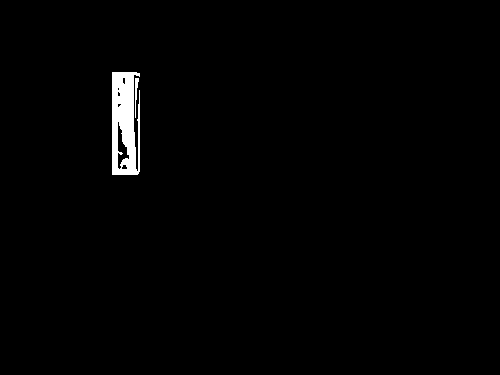

255
Image similarity: 0.8655389727263958


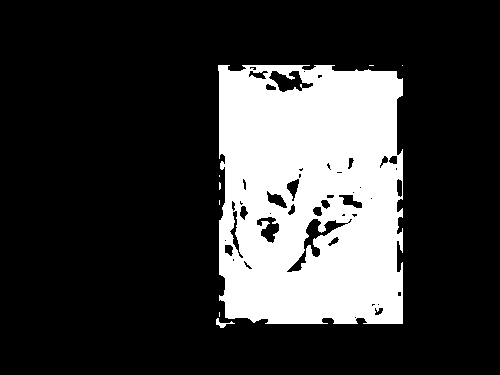

255
Image similarity: 0.9679912788658748


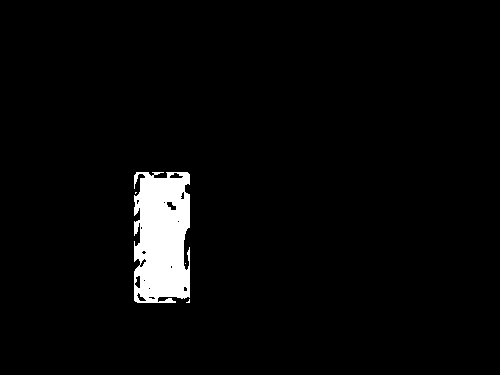

255
Image similarity: 0.9813145392654435


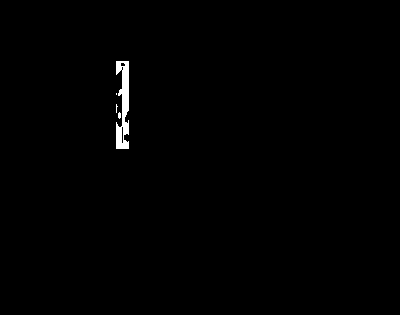

255
Image similarity: 0.9837784964470048


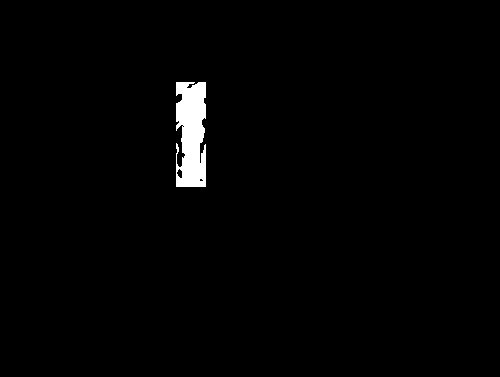

255
Image similarity: 0.904324950848057


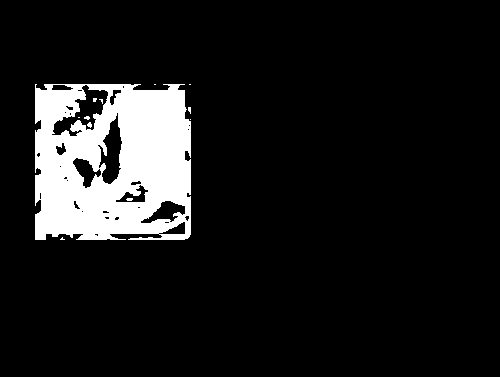

255
Image similarity: 0.9420487287807814


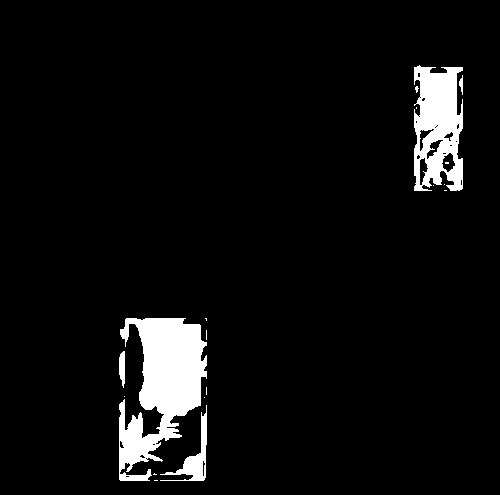

255
Image similarity: 0.9790689546770255


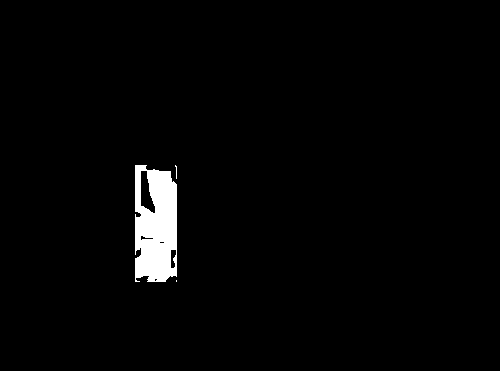

255
Image similarity: 0.9835852660747627


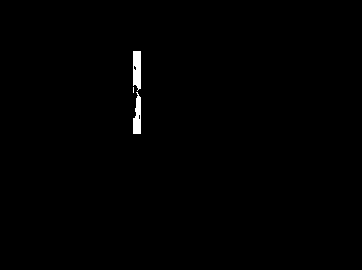

255
Image similarity: 0.9517026836631913


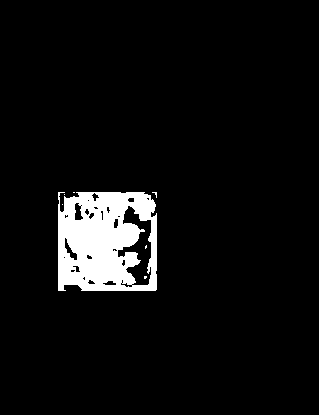

255
Image similarity: 0.9359023959935935


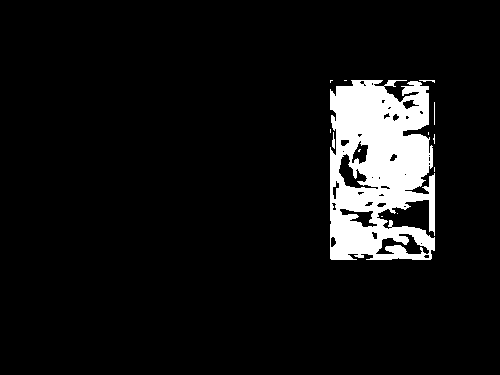

255
Image similarity: 0.9413100445459622


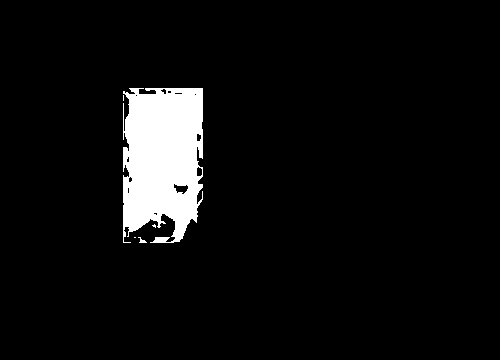

255
Image similarity: 0.9729259384295145


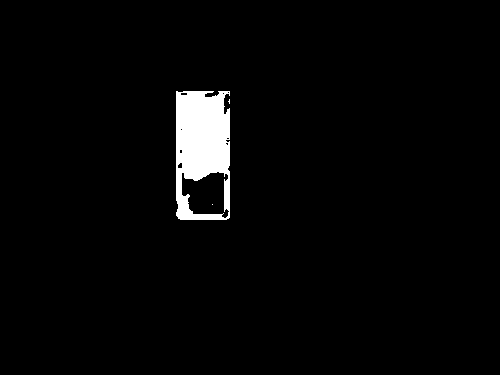

255
Image similarity: 0.9797101391795184


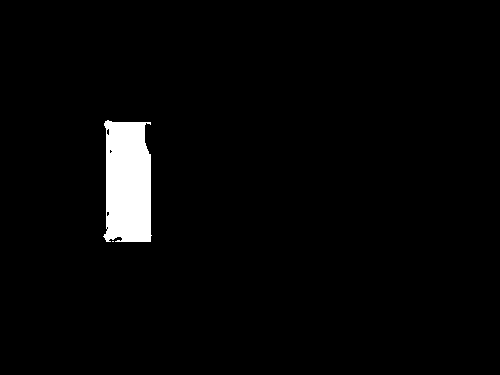

255
Image similarity: 0.9493030102130141


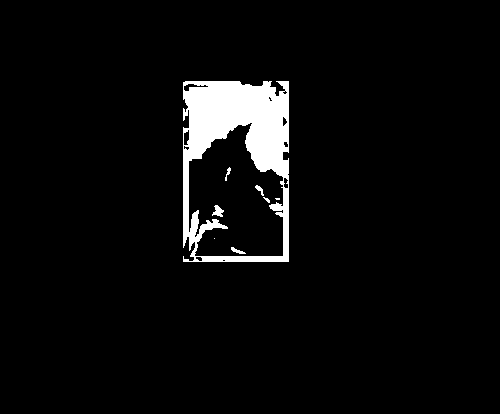

255
Image similarity: 0.967229845641354


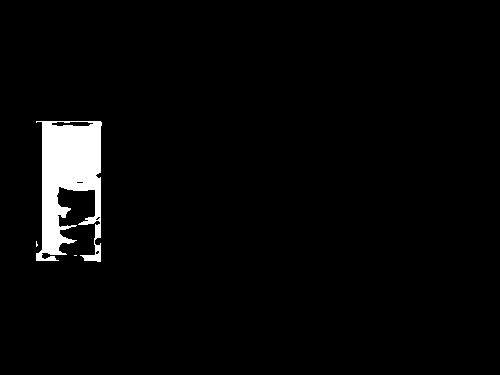

255
Image similarity: 0.9811719578085146


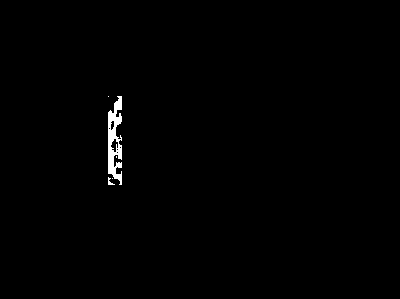

255
Image similarity: 0.9934305012281697


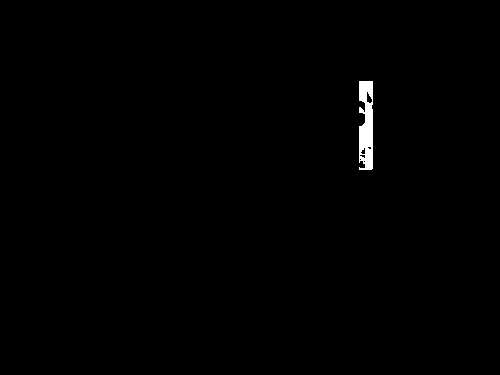

255
Image similarity: 0.9941231339659886


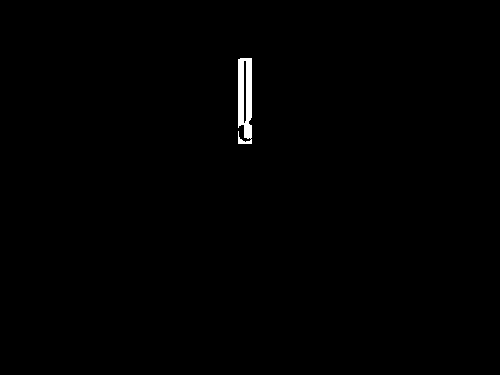

255
Image similarity: 0.9934352288748464


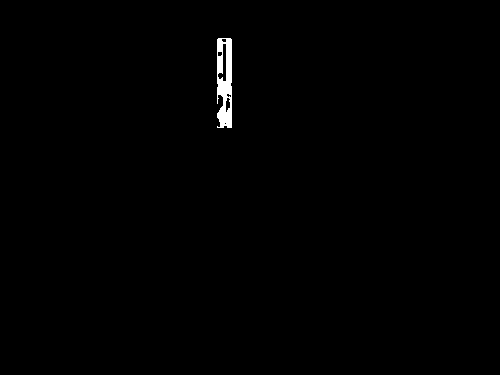

255
Image similarity: 0.9623331916500941


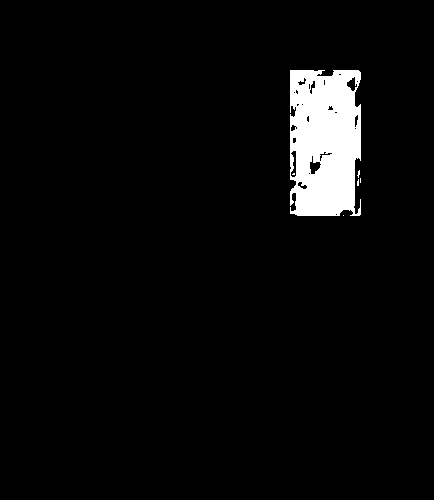

255
Image similarity: 0.764710665956061


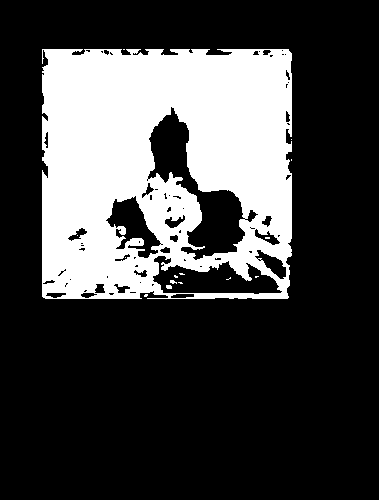

255
Image similarity: 0.9922035678057122


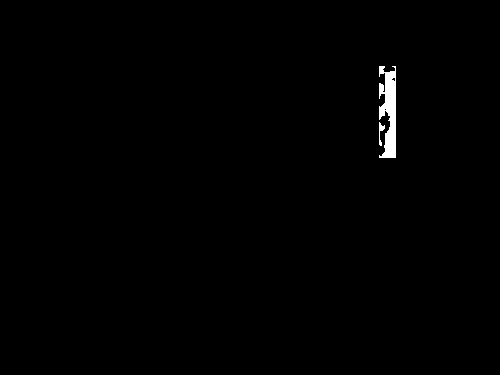

255
Image similarity: 0.8810223758863047


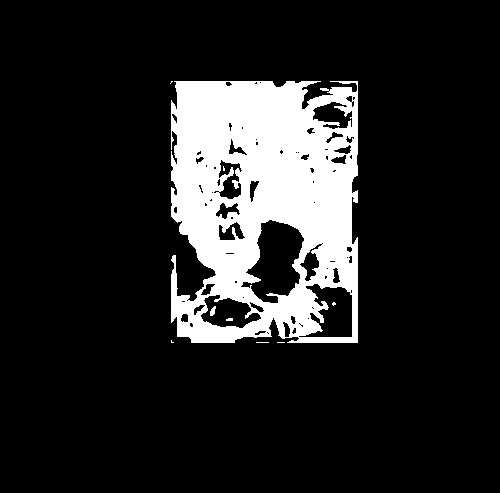

255
Image similarity: 0.9490118399383763


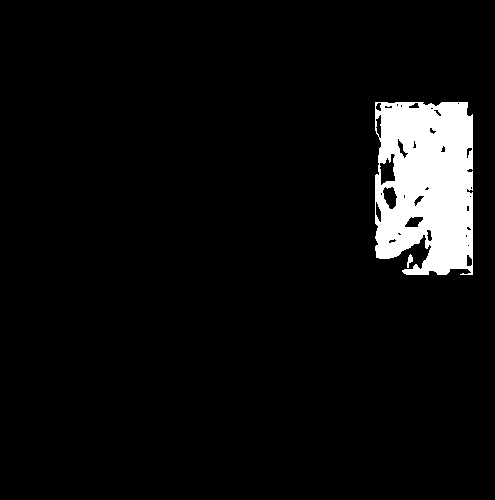

255
Image similarity: 0.8405480406676986


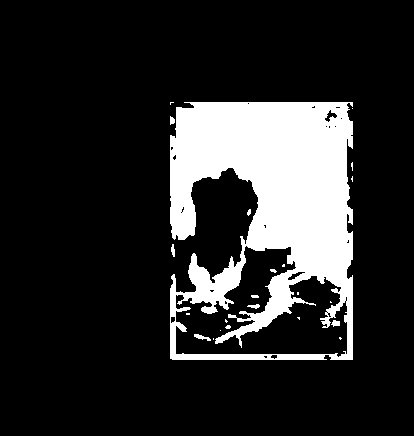

255
Image similarity: 0.8474306978369422


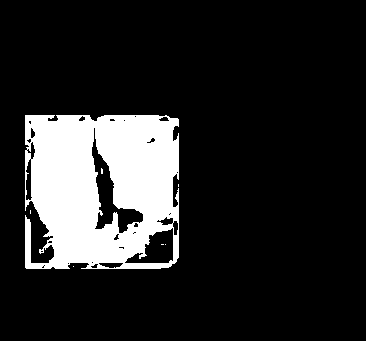

255
Image similarity: 0.8205055155891472


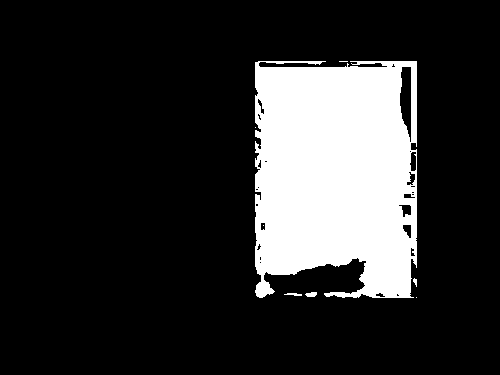

255
Image similarity: 0.9851603914559458


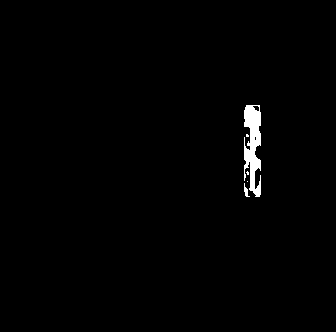

255
Image similarity: 0.9940602510494181


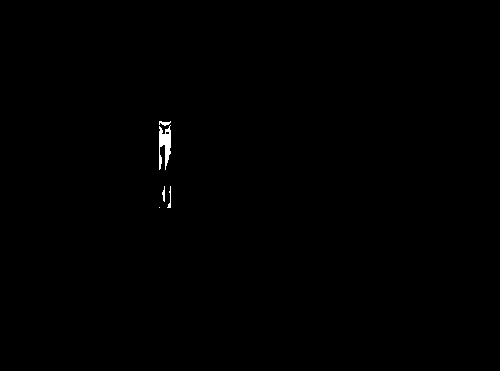

255
Image similarity: 0.9239649292249207


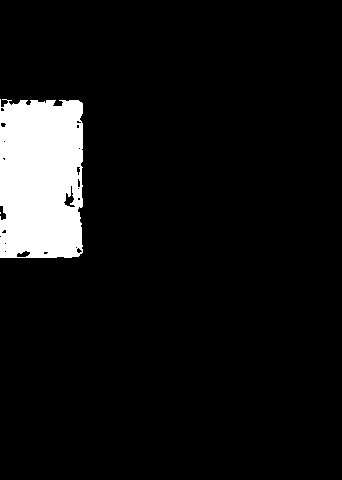

255
Image similarity: 0.983090930429688


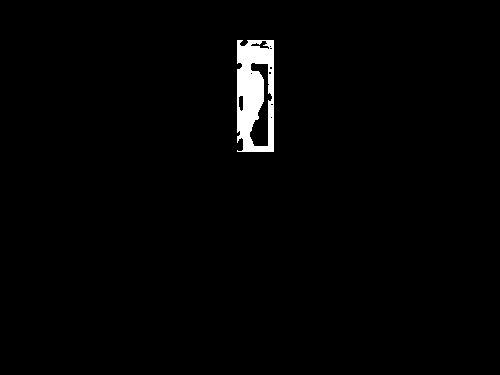

255
Image similarity: 0.904879336633179


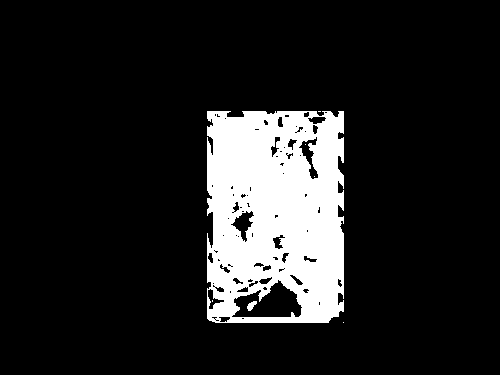

255
Image similarity: 0.9484889975455141


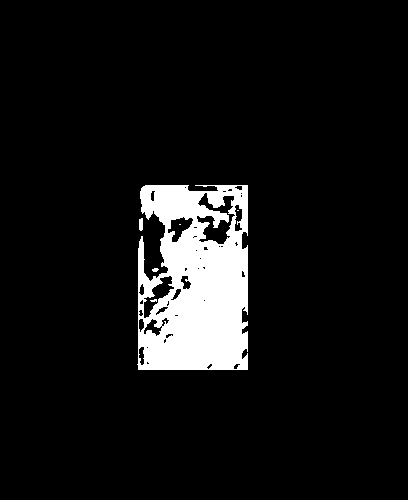

255
Image similarity: 0.9137624463001452


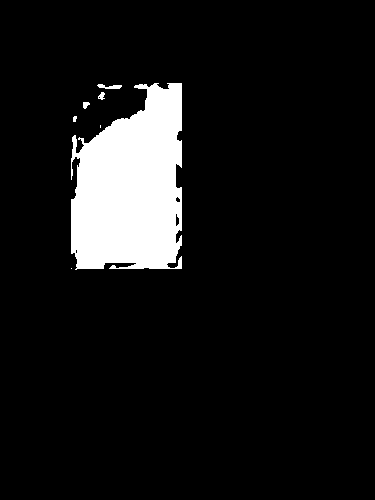

255
Image similarity: 0.9296392230033323


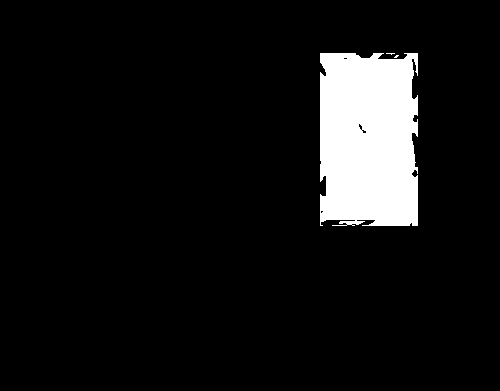

255
Image similarity: 0.9812311529691686


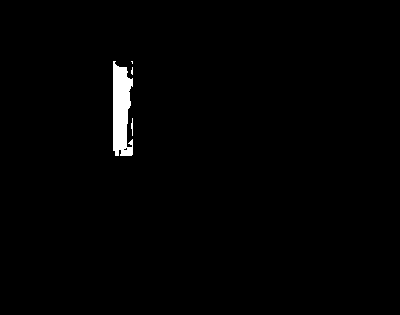

255
Image similarity: 0.884106820299686


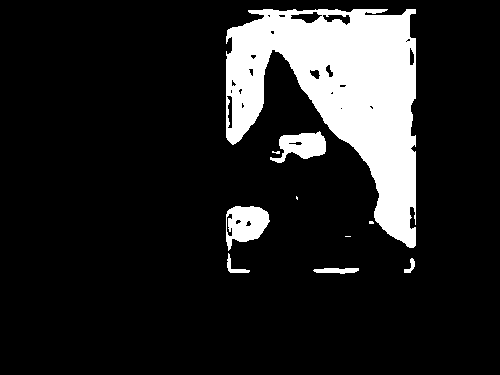

255
Image similarity: 0.8188351748274749


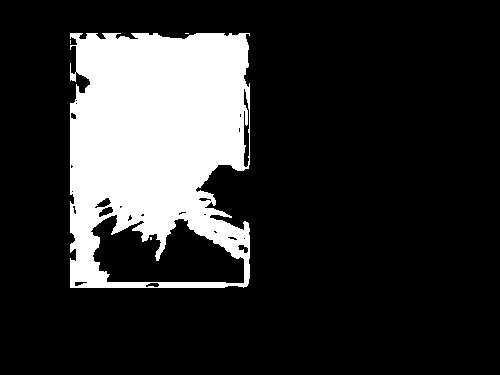

255
Image similarity: 0.9847084716533104


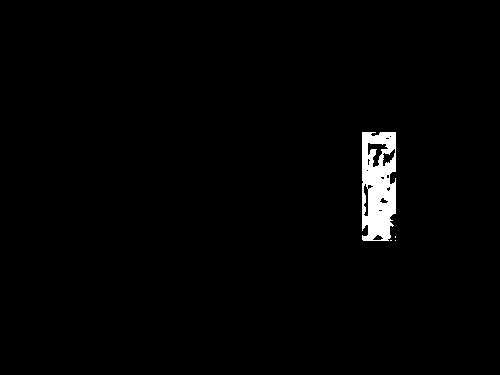

255
Image similarity: 0.8166764161803763


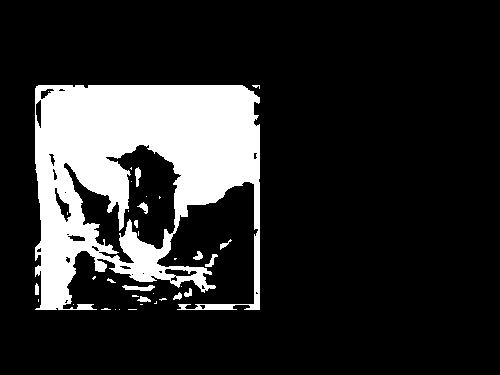

255
Image similarity: 0.8742353829634862


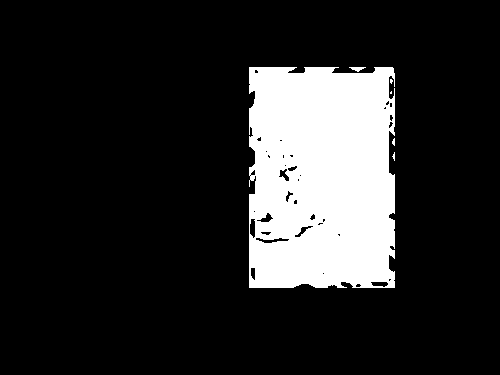

255
Image similarity: 0.9787520078904318


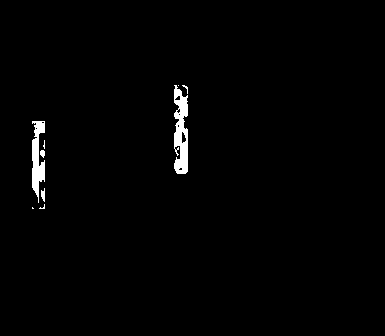

255
Image similarity: 0.9282182802880459


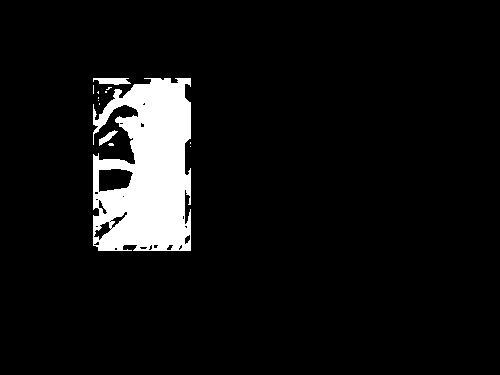

255
Image similarity: 0.9469679693655542


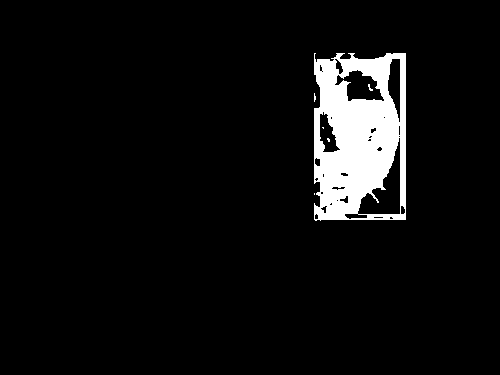

255
Image similarity: 0.9717151215778622


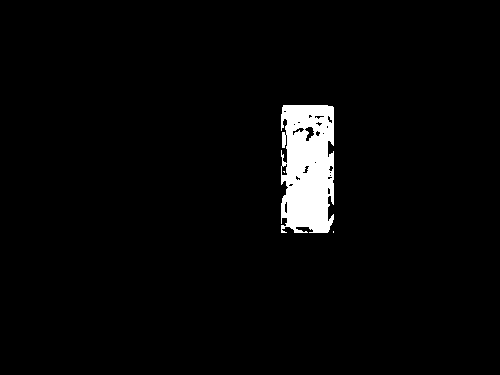

255
Image similarity: 0.9654982794670772


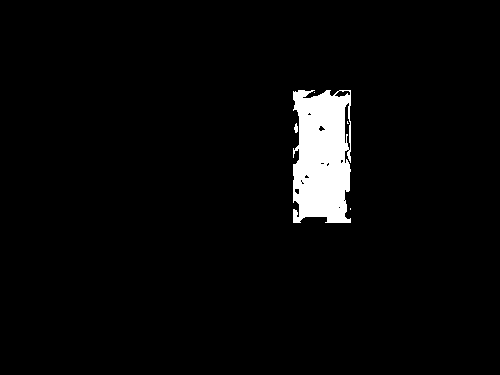

255
Image similarity: 0.9732756038953725


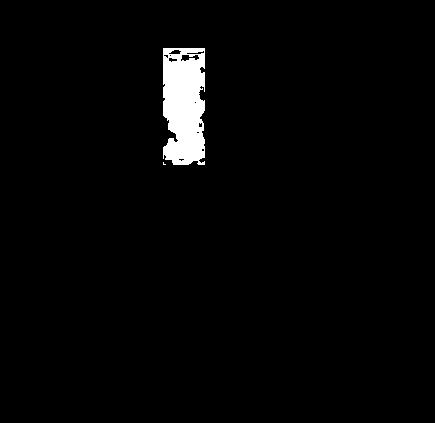

255
Image similarity: 0.8561165354201954


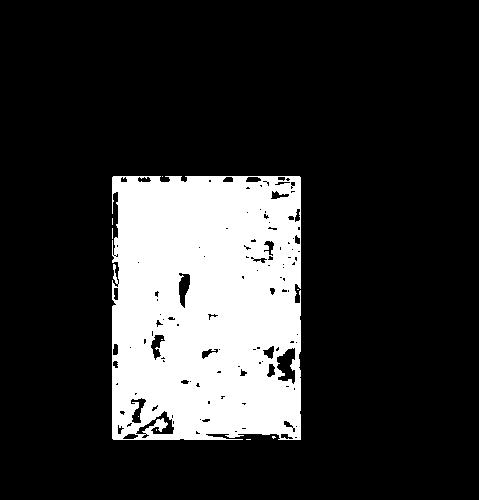

255
Image similarity: 0.7841043127747226


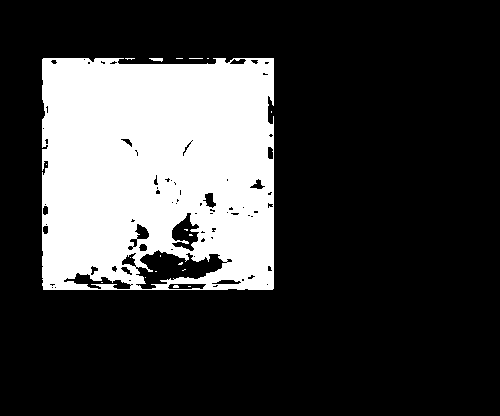

255
Image similarity: 0.97284975970291


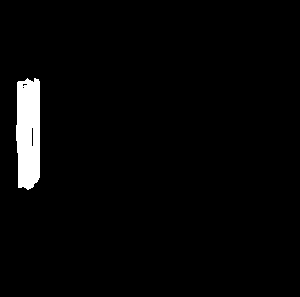

255
Image similarity: 0.6429780330981016


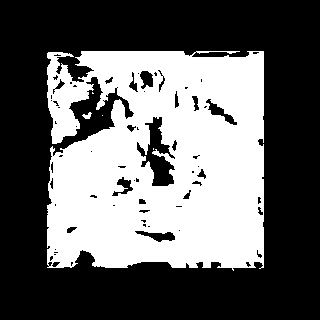

255
Image similarity: 0.9614044315311079


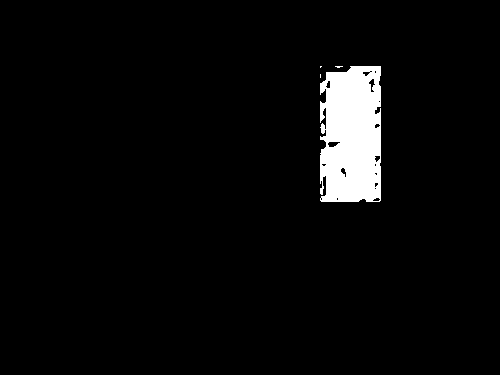

255
Image similarity: 0.9897083250348757


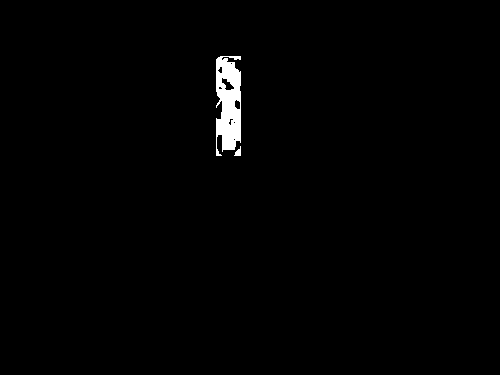

255
Image similarity: 0.9792204173455086


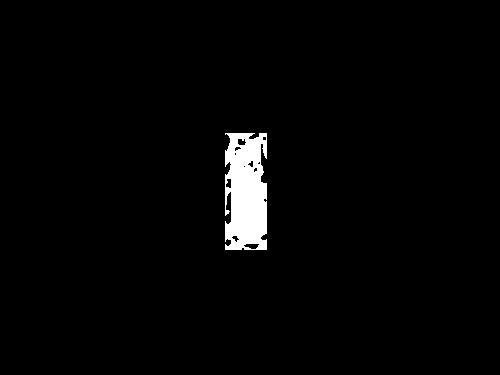

255
Image similarity: 0.9701345554386681


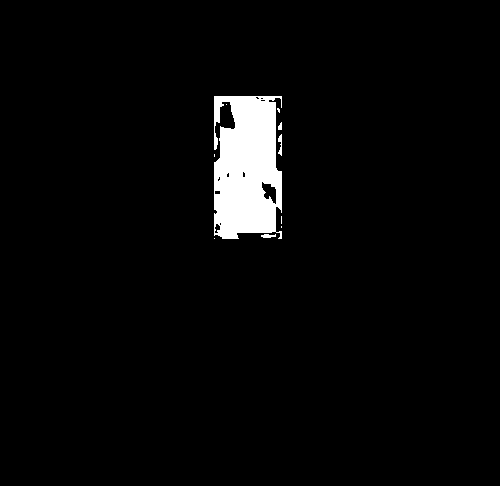

255
Image similarity: 0.9162634219634423


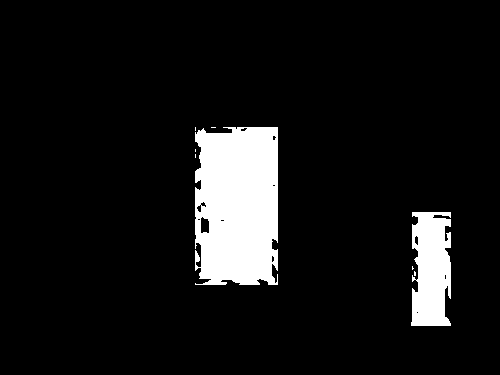

255
Image similarity: 0.9933485231111764


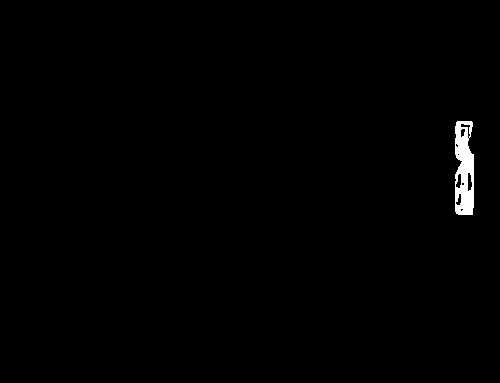

255
Image similarity: 0.9404879603487277


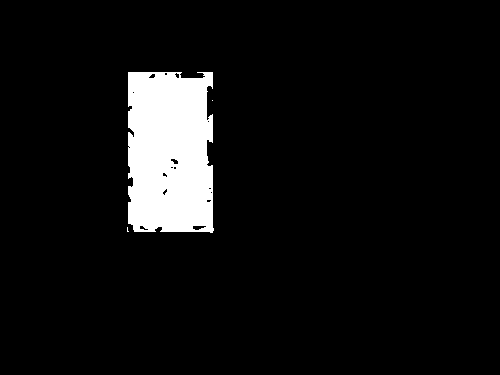

255
Image similarity: 0.9777353095415395


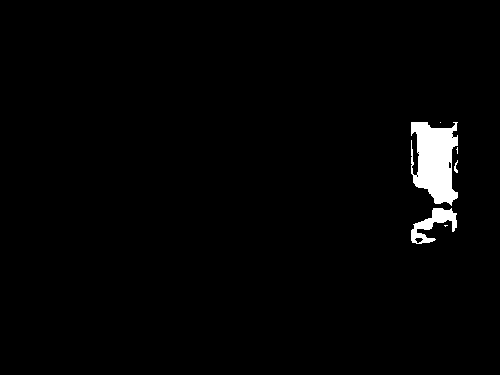

255
Image similarity: 0.9784641707524236


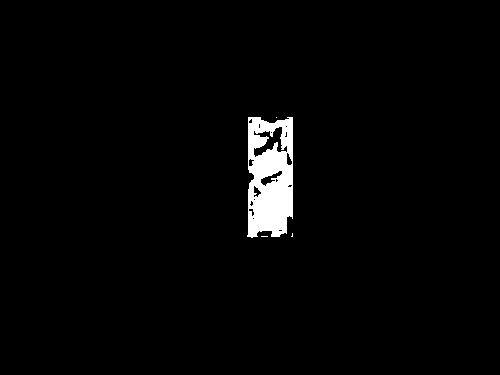

255
Image similarity: 0.9667271401729925


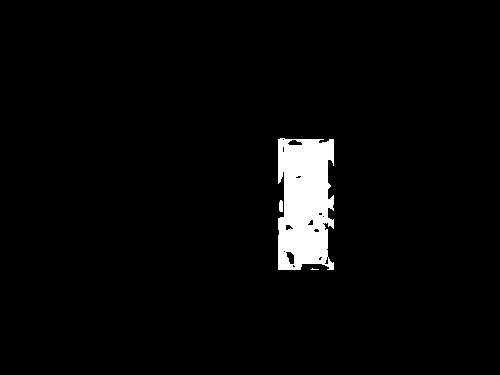

255
Image similarity: 0.9322081174683006


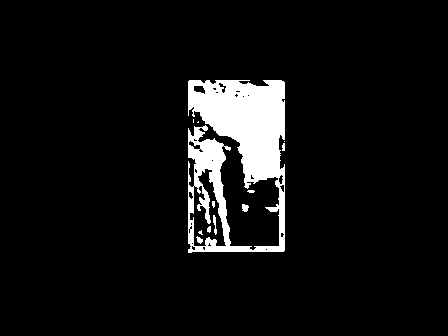

255
Image similarity: 0.9942820907258261


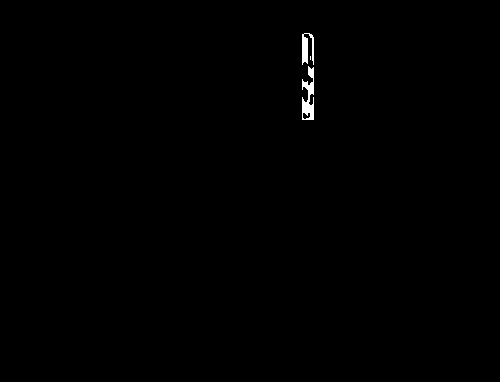

255
Image similarity: 0.9270787448199455


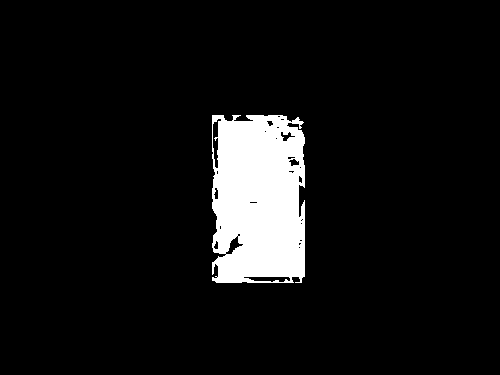

255
Image similarity: 0.9376816239425553


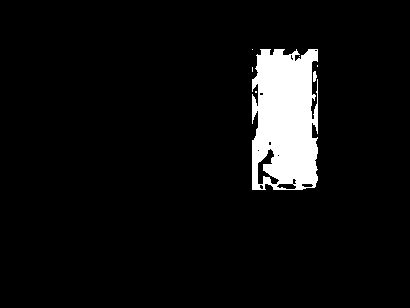

255
Image similarity: 0.8658574329532301


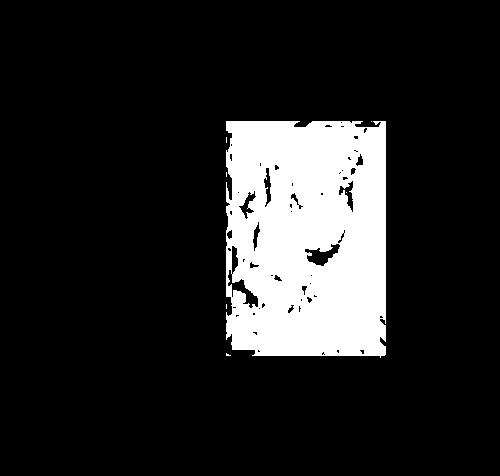

255
Image similarity: 0.9239969606685839


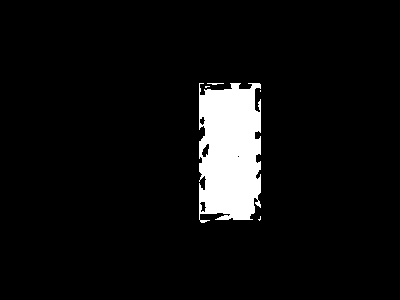

255
Image similarity: 0.8640991350496848


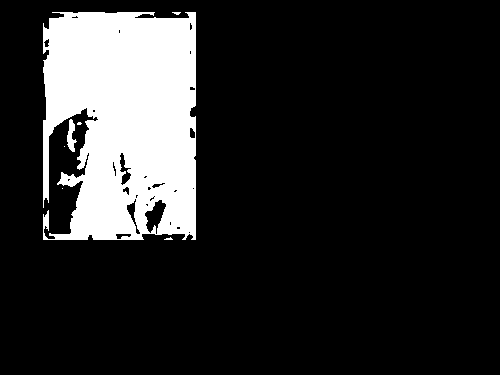

255
Image similarity: 0.9841944113785446


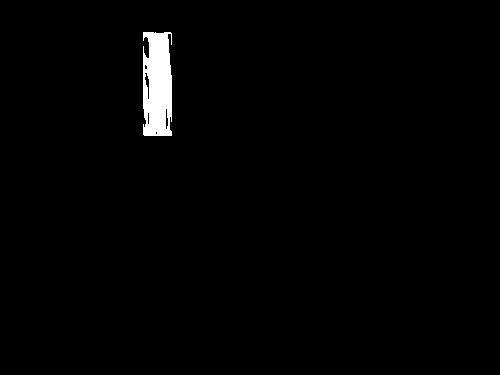

255
Image similarity: 0.9498297696930584


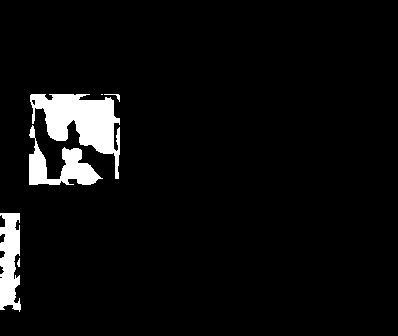

255
Image similarity: 0.9866484203963853


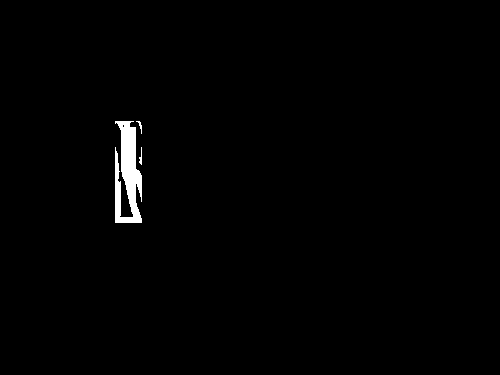

255
Image similarity: 0.870673101758802


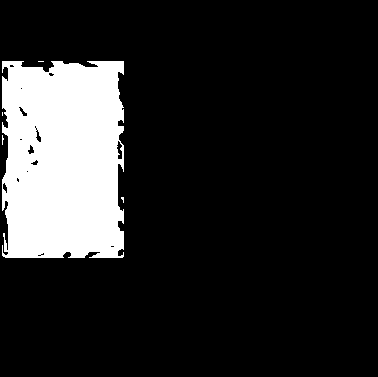

255
Image similarity: 0.9903024231679939


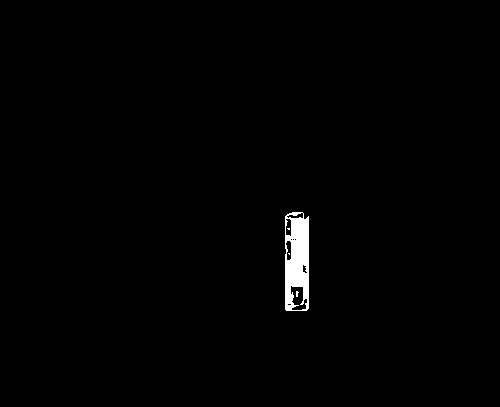

255
Image similarity: 0.9810885033184065


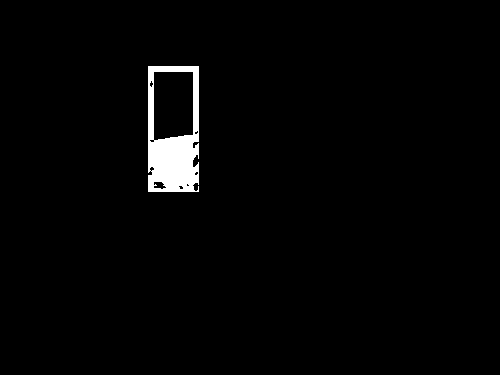

255
Image similarity: 0.8443840615101674


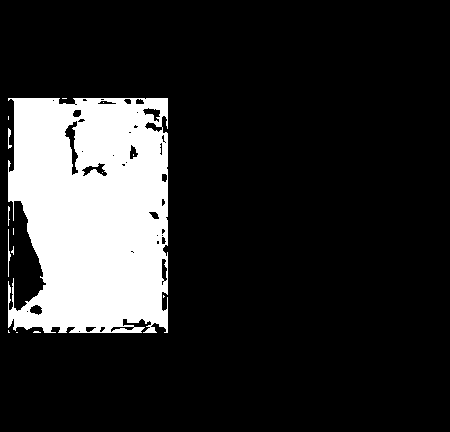

255
Image similarity: 0.9557504950421947


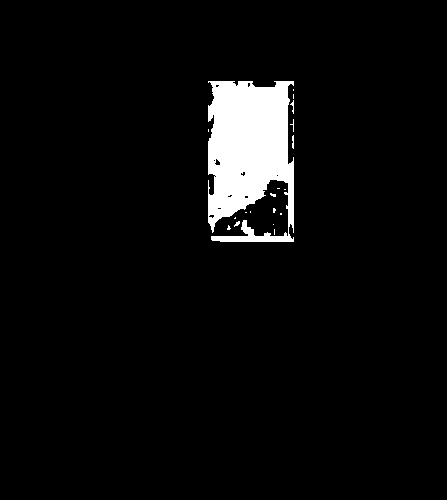

255
Image similarity: 0.6933206435558293


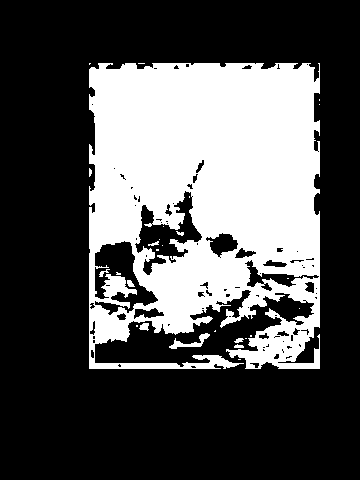

255
Image similarity: 0.8085503666753762


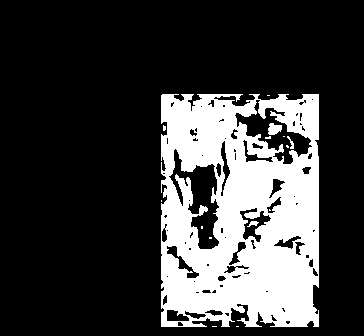

255
Image similarity: 0.994556050410769


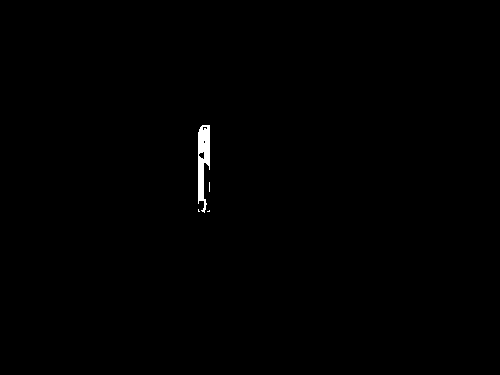

255
Image similarity: 0.99572541082221


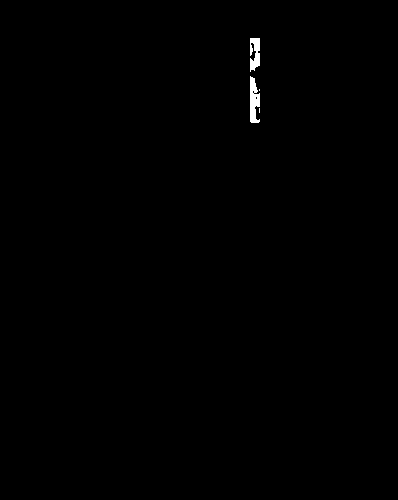

255
Image similarity: 0.9215192294458523


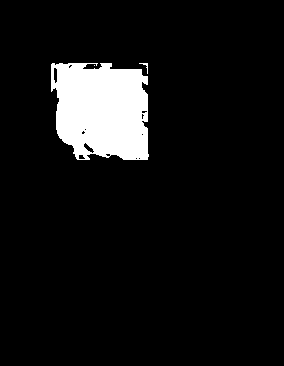

255
Image similarity: 0.8824094490155112


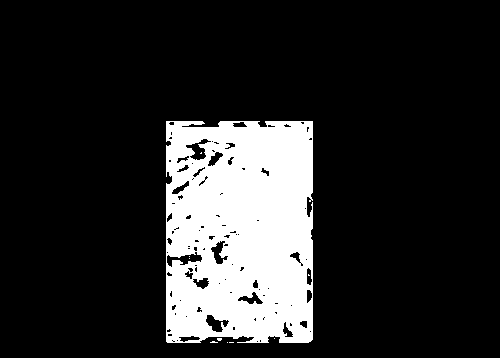

255
Image similarity: 0.9234209869048833


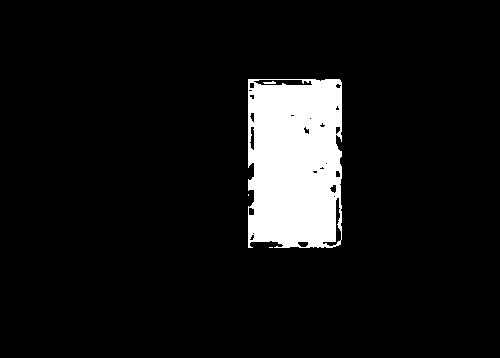

255
Image similarity: 0.9817048882103456


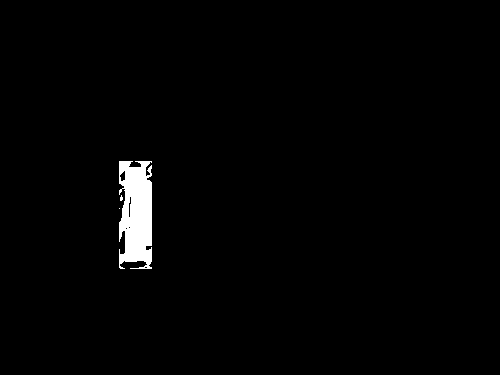

255
Image similarity: 0.7994668207058991


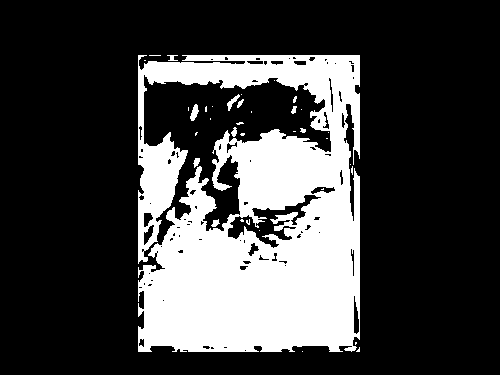

255
Image similarity: 0.8781918643314357


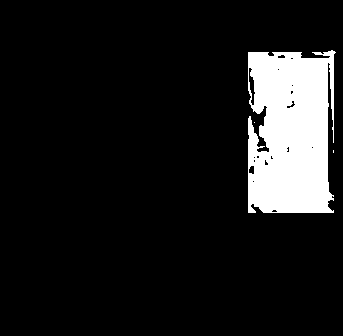

255
Image similarity: 0.9519456970533703


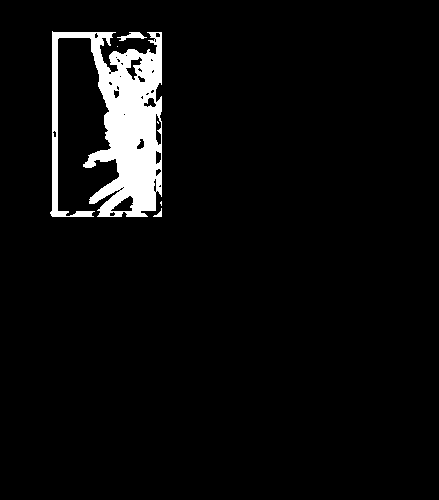

255
Image similarity: 0.9936106100442234


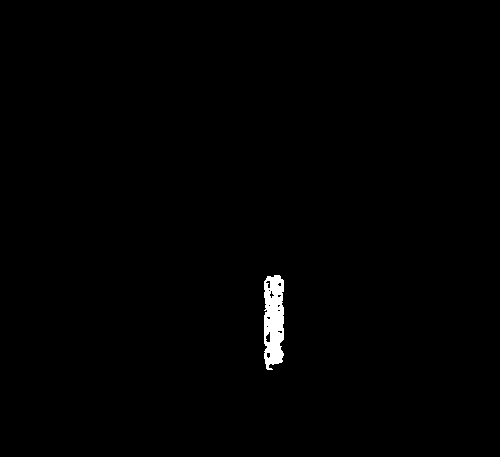

255
Image similarity: 0.9359775611497599


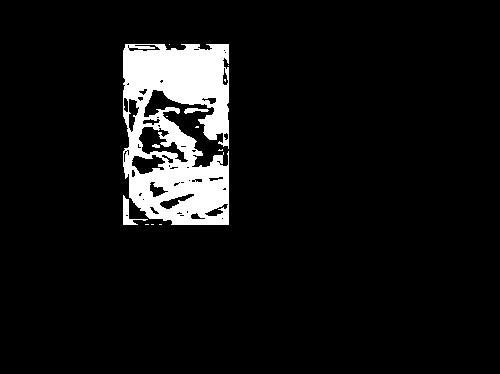

255
Image similarity: 0.9569462909027202


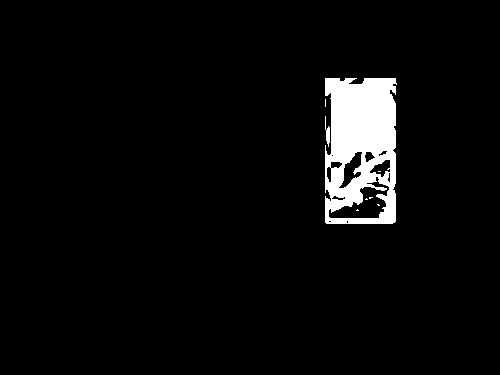

255
Image similarity: 0.9818800213070206


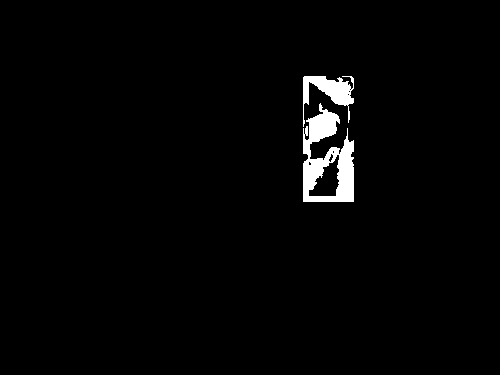

255
Image similarity: 0.9000660010001517


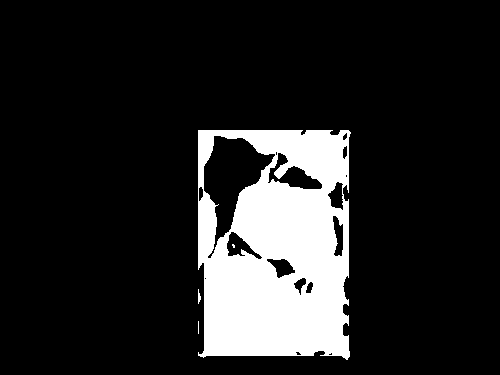

255
Image similarity: 0.9283316615386898


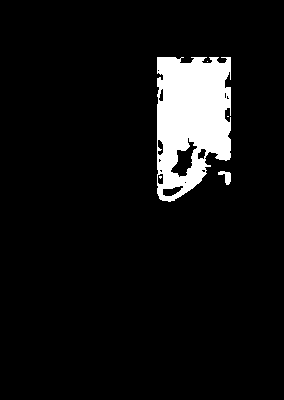

255
Image similarity: 0.9068193221554791


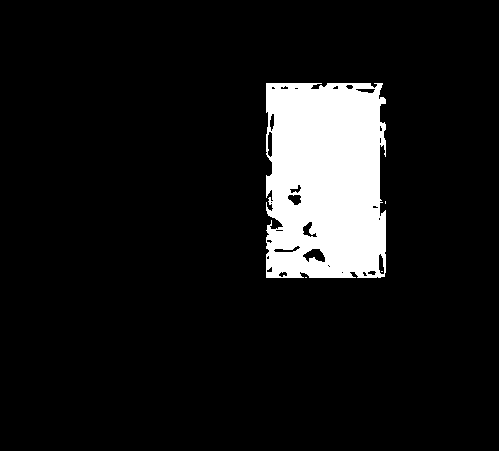

255
Image similarity: 0.9449237579267851


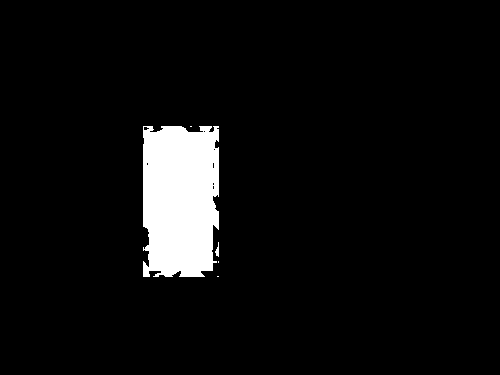

255
Image similarity: 0.9665845198625016


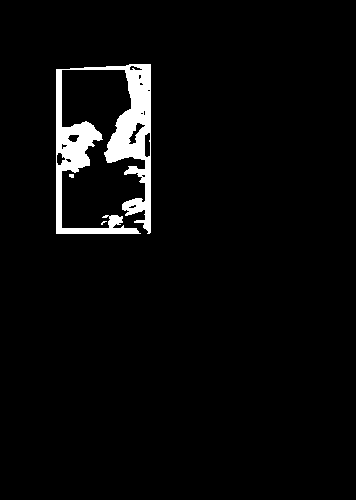

255
Image similarity: 0.9390259990621742


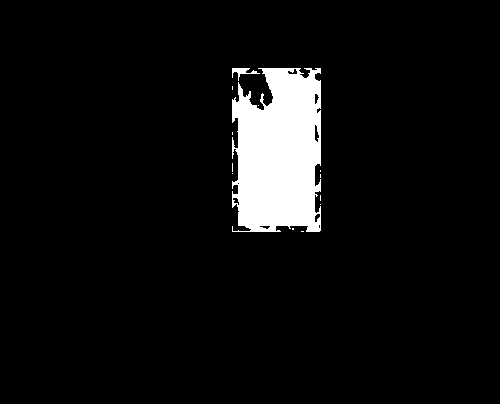

255
Image similarity: 0.985673089120453


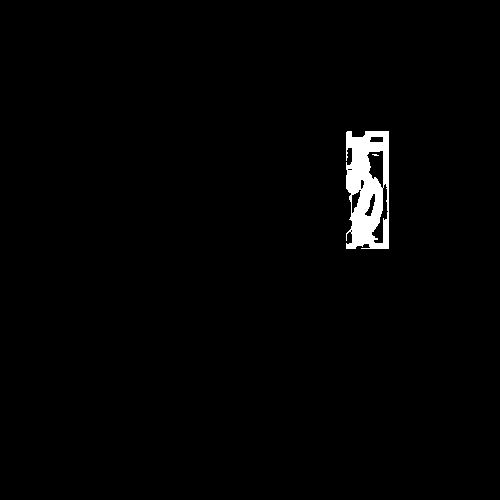

255
Image similarity: 0.7206831873289361


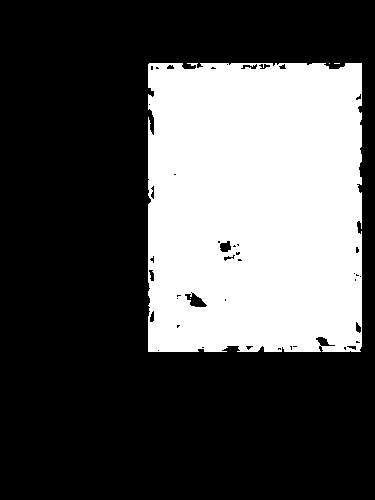

255
Image similarity: 0.8321152578322886


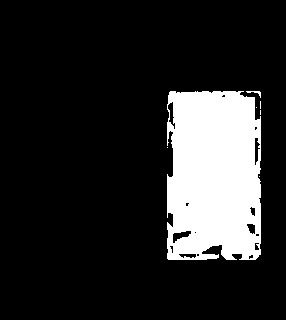

255
Image similarity: 0.9866386514399762


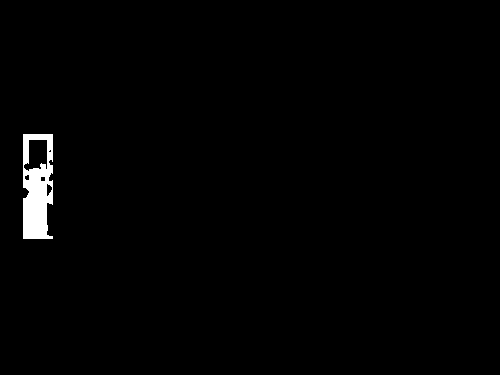

255
Image similarity: 0.9727502198780208


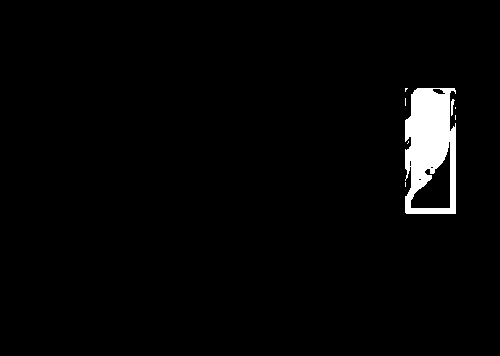

255
Image similarity: 0.9974955339712356


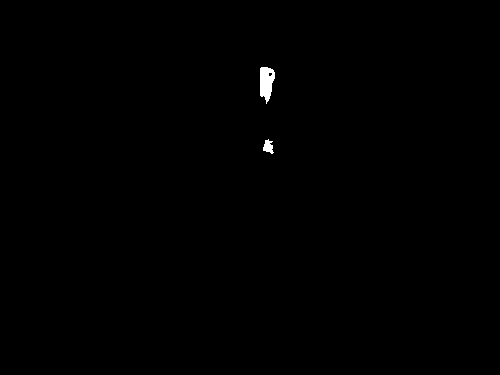

255
Image similarity: 0.8640470105665995


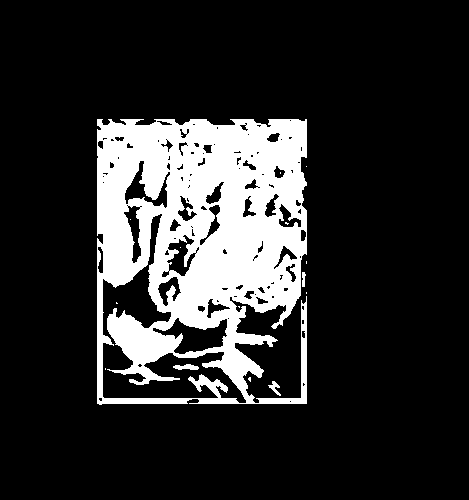

255
Image similarity: 0.9387241786140972


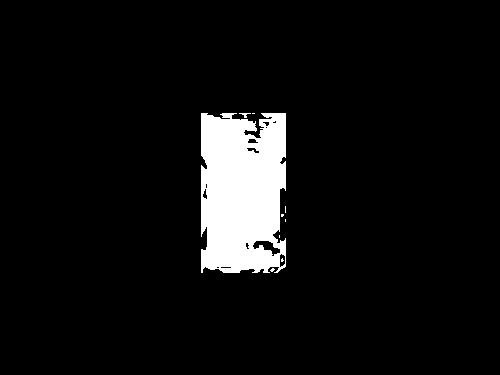

255
Image similarity: 0.8731853074461394


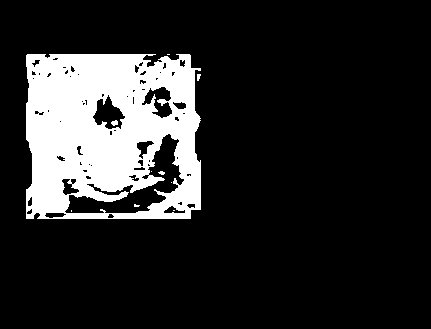

255
Image similarity: 0.9627498865720057


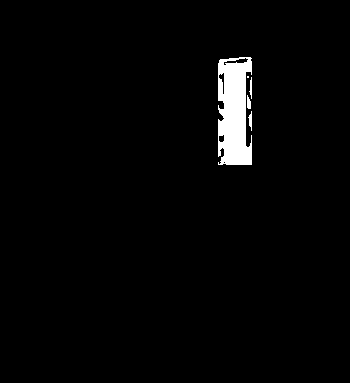

255
Image similarity: 0.908923518872175


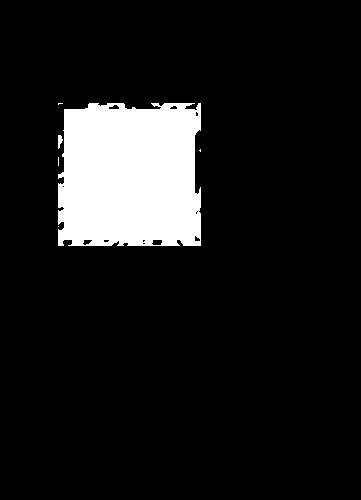

255
Image similarity: 0.9775142864568248


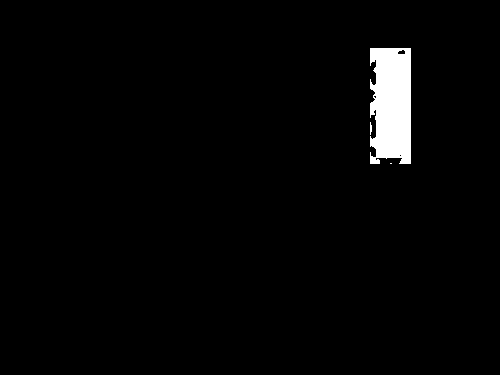

255
Image similarity: 0.9676930596022283


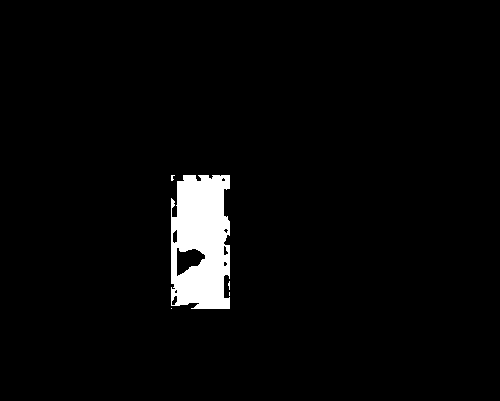

255
Image similarity: 0.8414560502852965


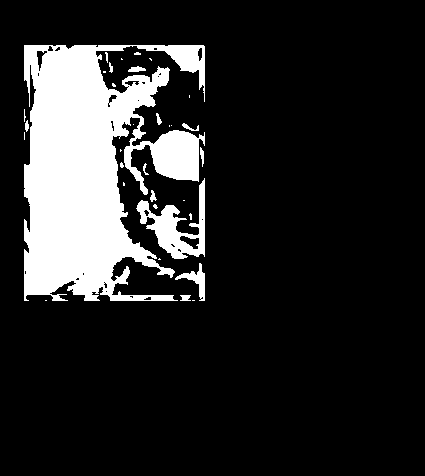

255
Image similarity: 0.9899399939629916


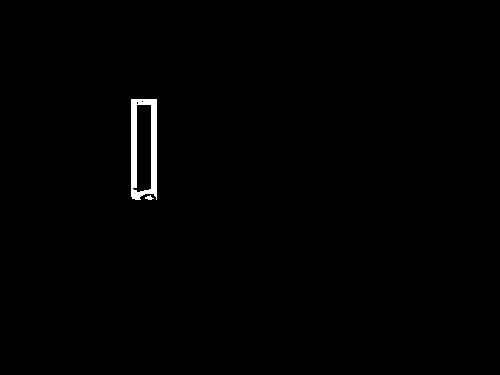

255
Image similarity: 0.9897308717154517


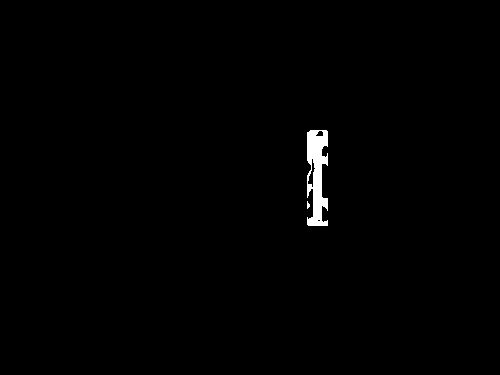

255
Image similarity: 0.9327267626405347


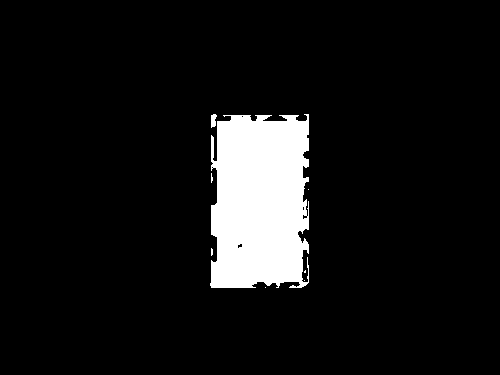

255
Image similarity: 0.9390127632376598


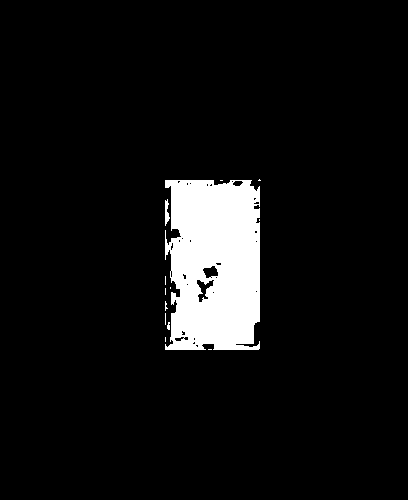

255
Image similarity: 0.9366699570218174


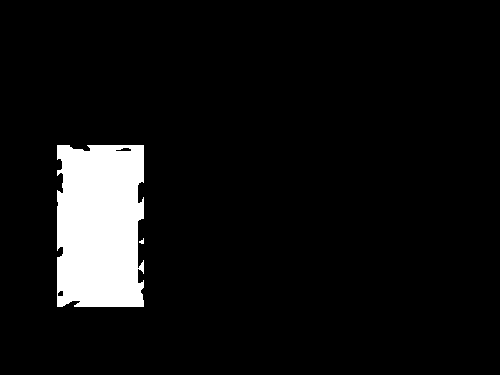

255
Image similarity: 0.9890962858725115


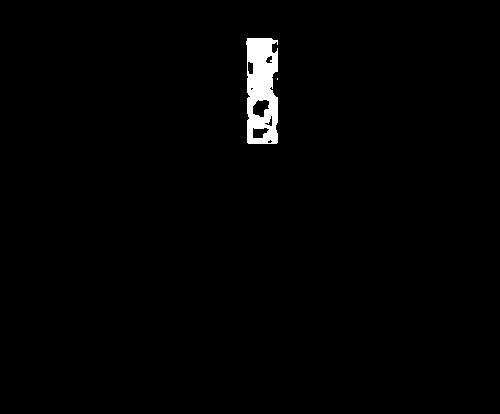

255
Image similarity: 0.951994495892447


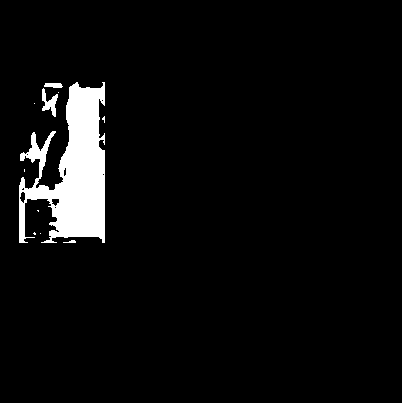

255
Image similarity: 0.9856647713813694


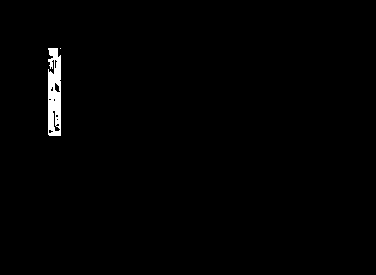

255
Image similarity: 0.9666030564765141


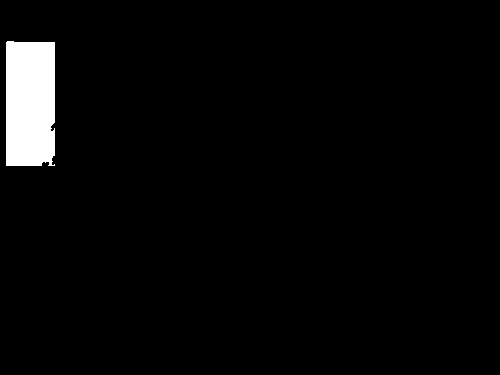

255
Image similarity: 0.9743237538872629


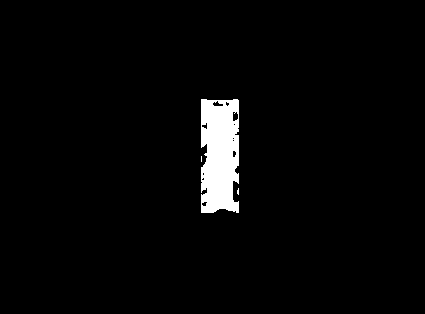

255
Image similarity: 0.9902167974211231


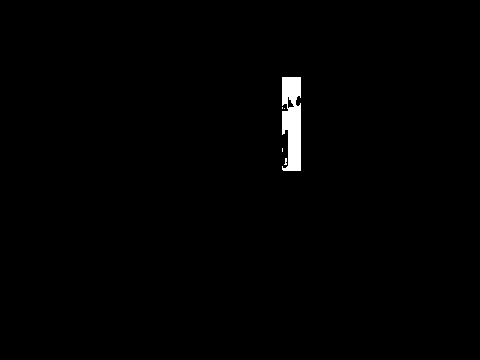

255
Image similarity: 0.9715154003916757


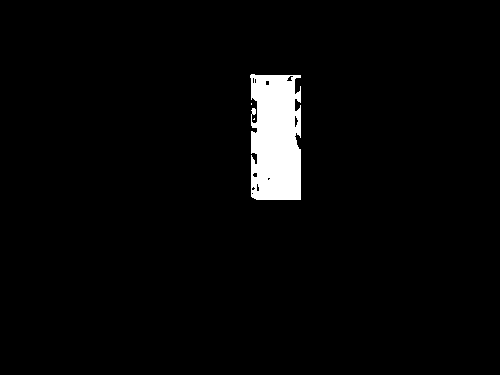

255
Image similarity: 0.9211651730035294


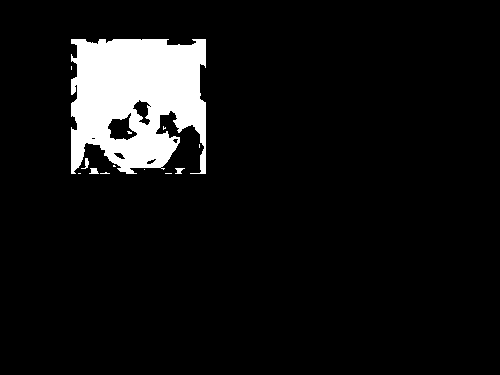

255
Image similarity: 0.951947740189751


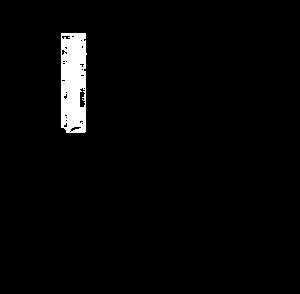

255
Image similarity: 0.9441940474201924


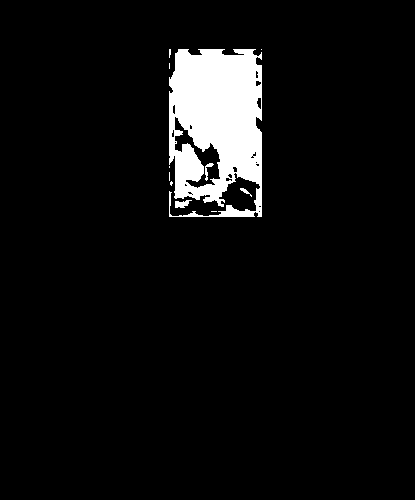

255
Image similarity: 0.817287580377239


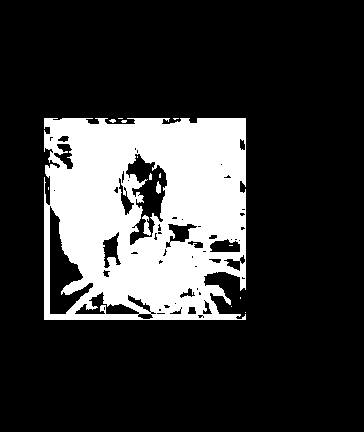

255
Image similarity: 0.895091349066635


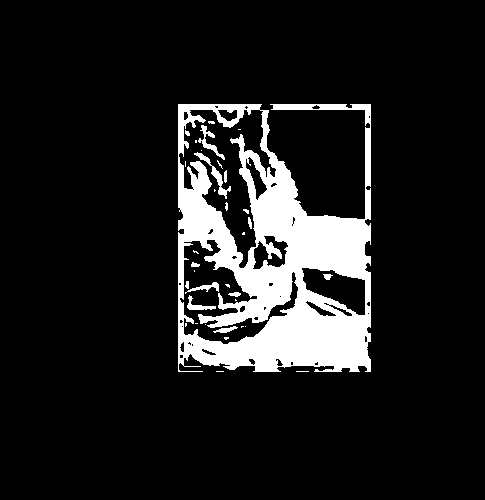

255
Image similarity: 0.9250409351982084


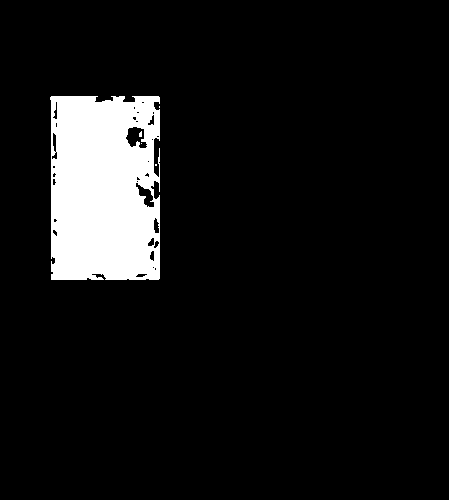

255
Image similarity: 0.9891158015410896


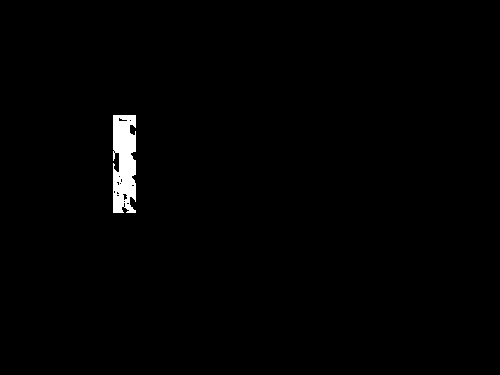

255
Image similarity: 0.9854293008498203


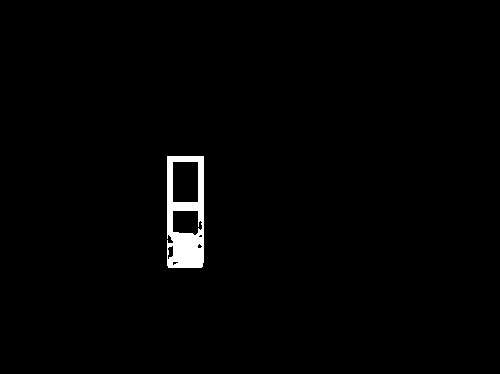

255
Image similarity: 0.9414766561273599


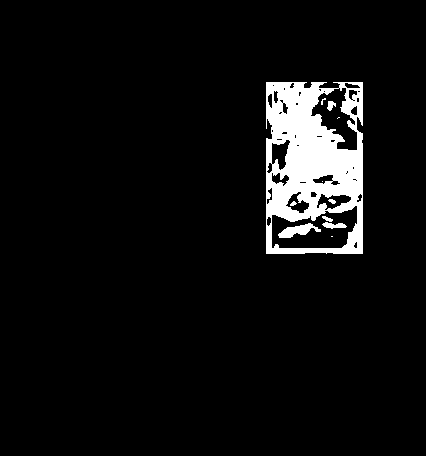

255
Image similarity: 0.9325669884545399


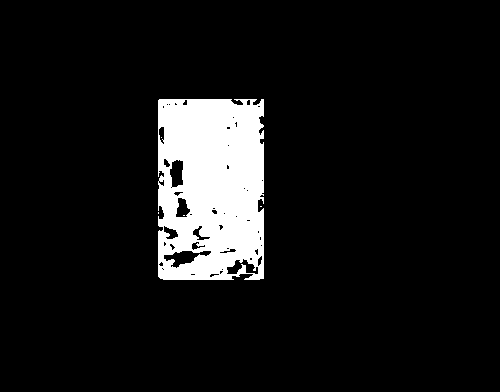

255
Image similarity: 0.8989364477898779


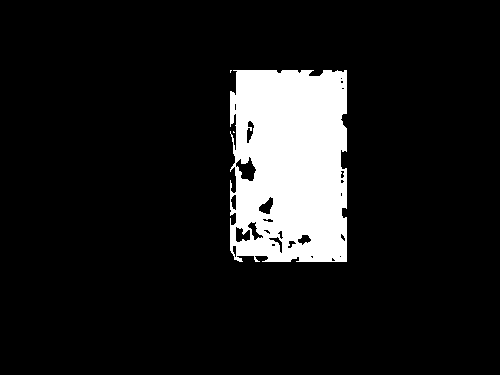

255
Image similarity: 0.9687815964307889


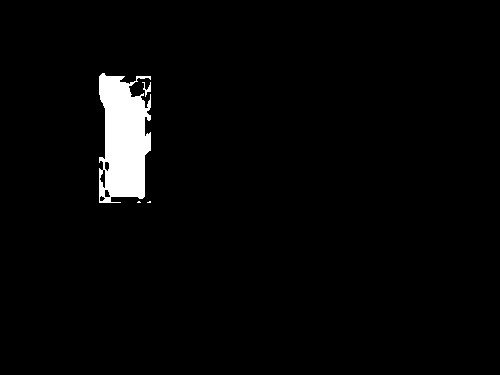

255
Image similarity: 0.8659817967314158


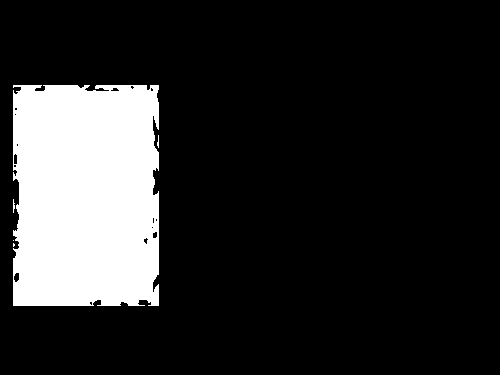

255
Image similarity: 0.8116950976172486


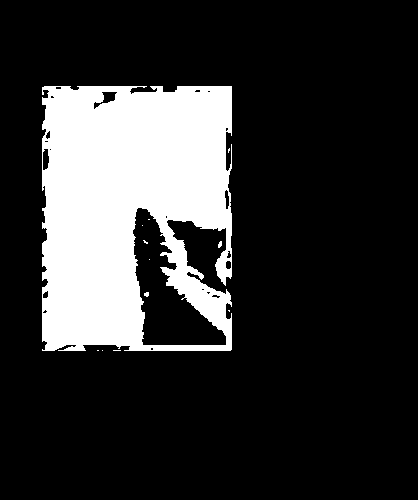

255
Image similarity: 0.7987217646270731


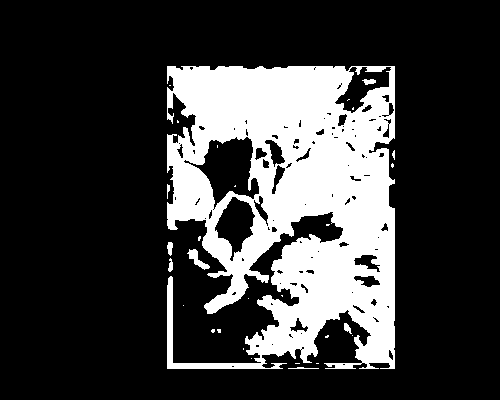

255
Image similarity: 0.984266395059486


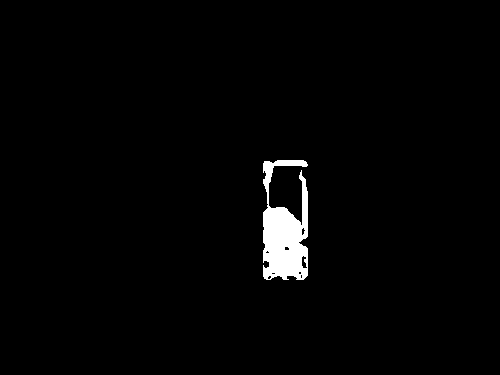

255
Image similarity: 0.8911972524829358


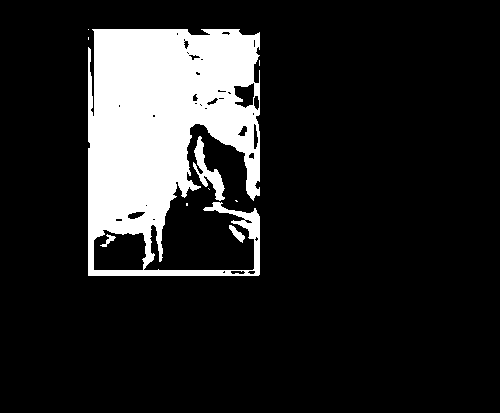

255
Image similarity: 0.8644333585226995


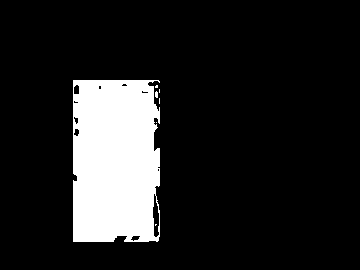

255
Image similarity: 0.9618224805705381


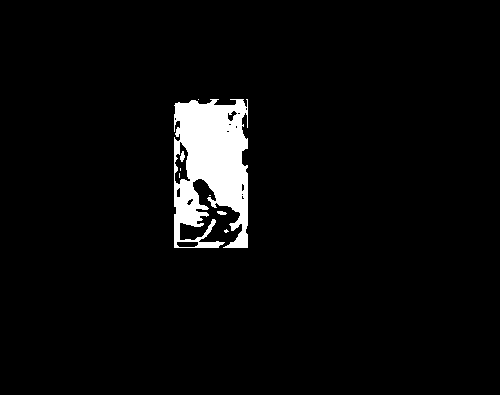

255
Image similarity: 0.9387985170804553


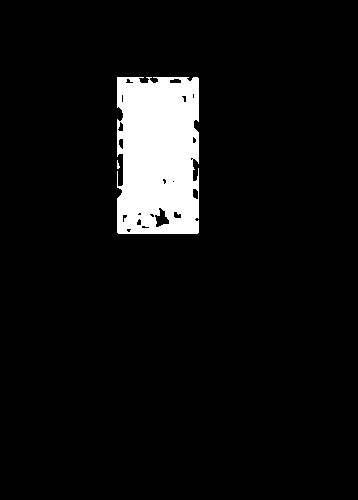

255
Image similarity: 0.9088475384694936


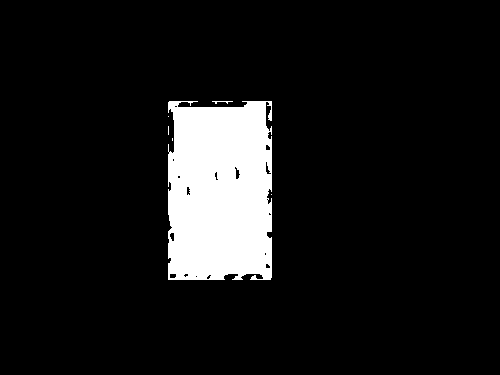

255
Image similarity: 0.6589948857431114


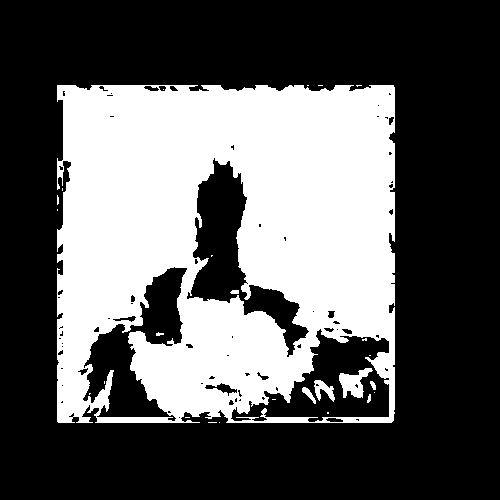

255
Image similarity: 0.9769333964711989


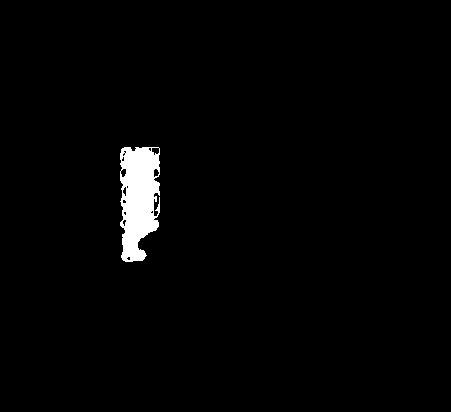

255
Image similarity: 0.8423583087985158


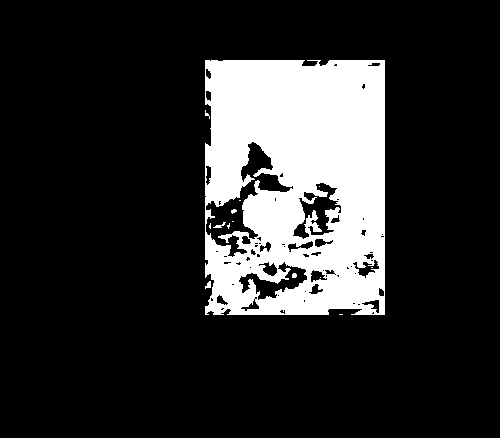

255
Image similarity: 0.9825718107775916


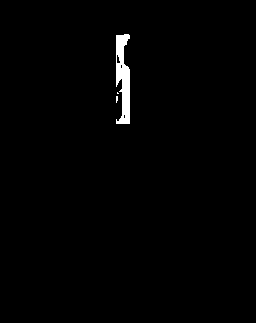

255
Image similarity: 0.9817907560499208


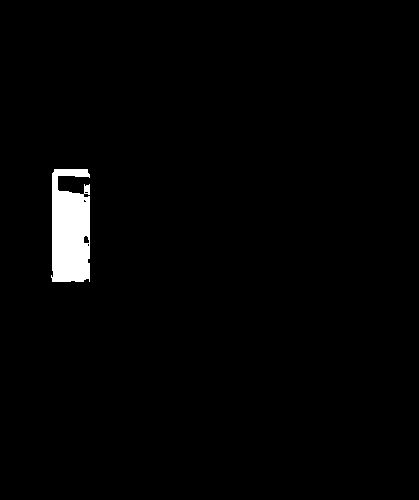

255
Image similarity: 0.9455553035887659


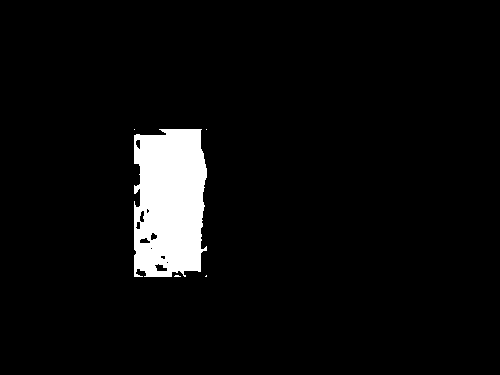

255
Image similarity: 0.9982882163437461


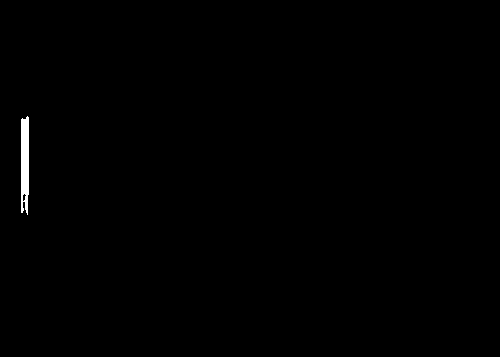

255
Image similarity: 0.9635205860577856


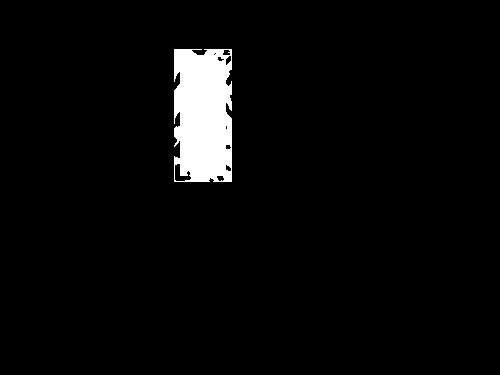

255
Image similarity: 0.9796586890592619


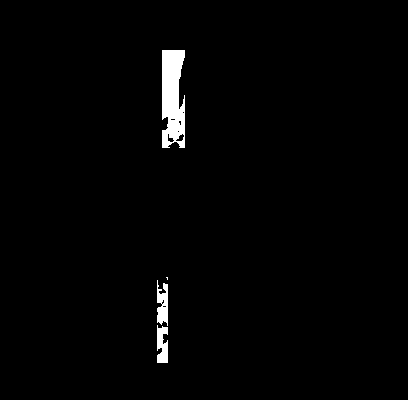

255
Image similarity: 0.9754191209683988


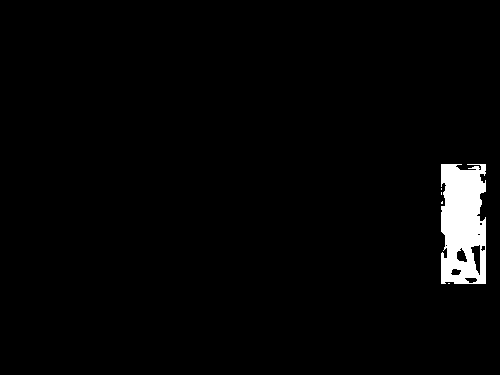

255
Image similarity: 0.9827446527766701


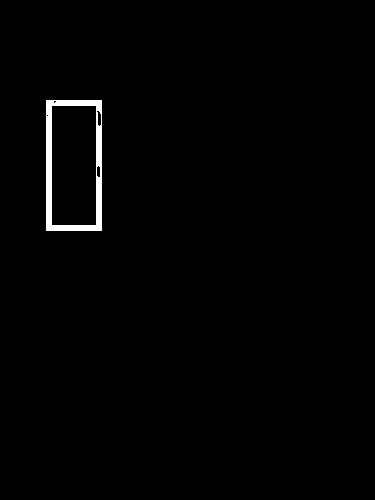

255
Image similarity: 0.9889886829735742


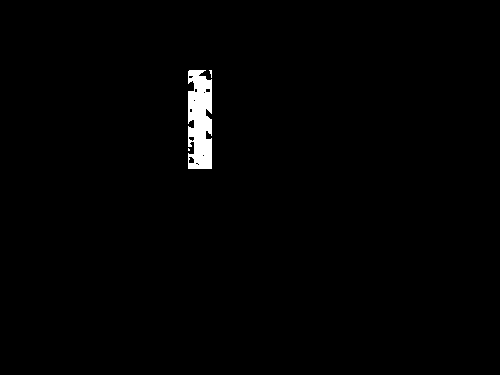

255
Image similarity: 0.9346991790460044


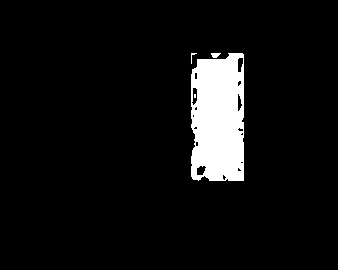

255
Image similarity: 0.9737943247298239


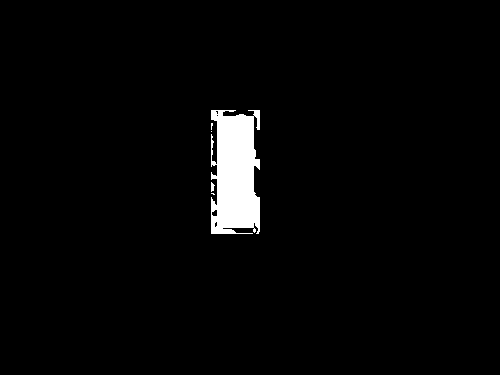

255
Image similarity: 0.9764275278148247


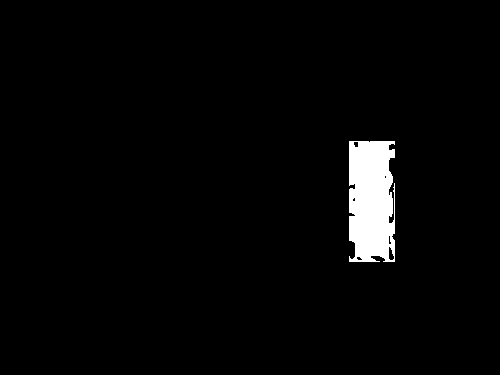

255
Image similarity: 0.9947636739003951


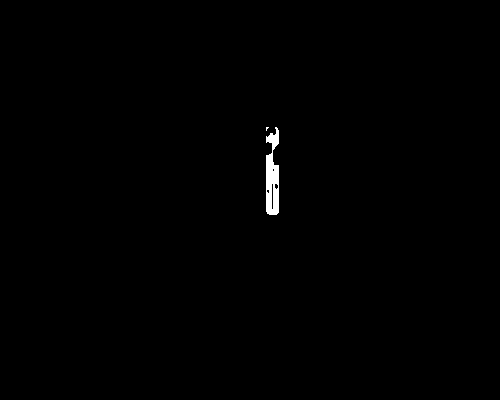

255
Image similarity: 0.9121236882148643


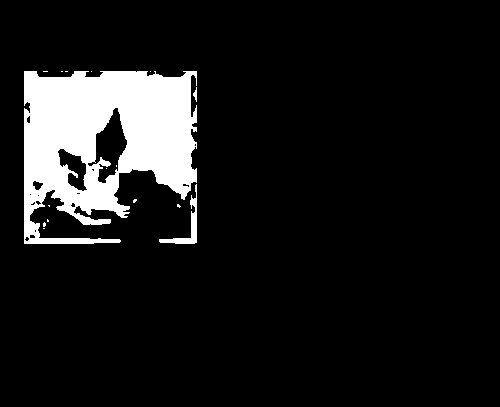

255
Image similarity: 0.9924174455374689


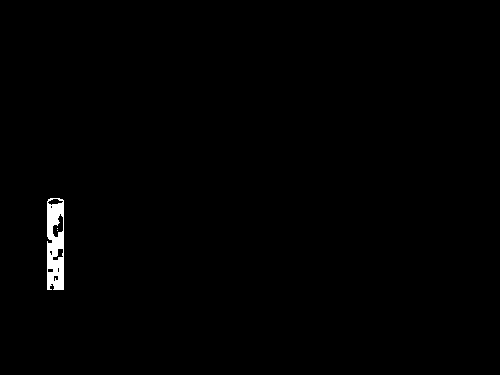

255
Image similarity: 0.9687187880389273


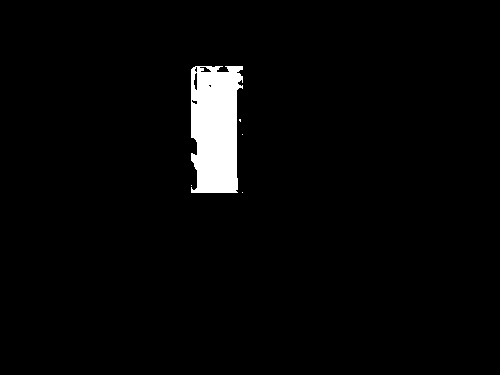

255
Image similarity: 0.9923277834835074


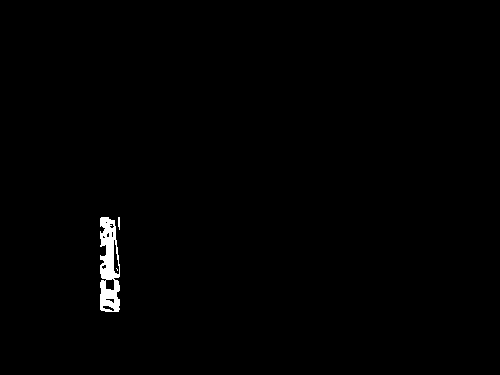

255
Image similarity: 0.9897820273307707


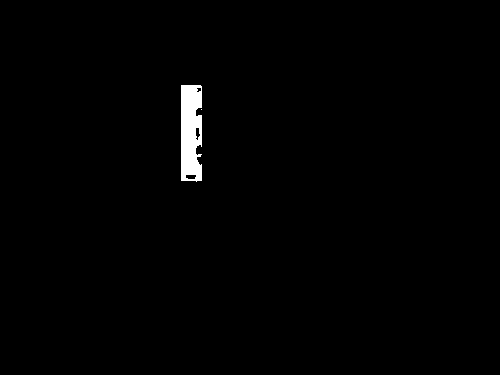

255
Image similarity: 0.9514408051396072


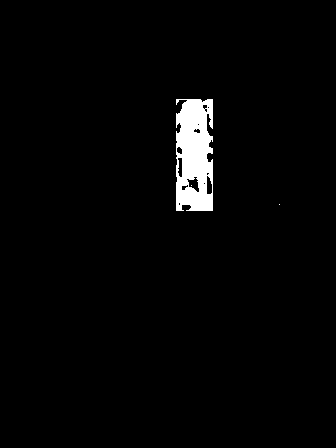

255
Image similarity: 0.9813185597219347


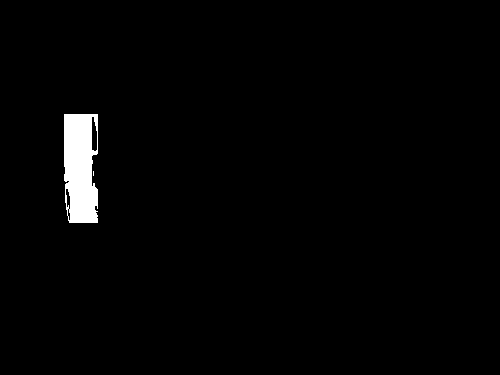

255
Image similarity: 0.9569458750915338


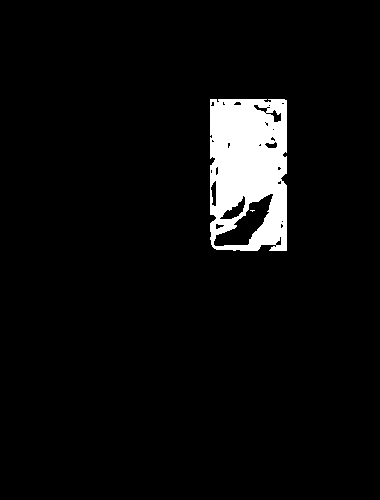

255
Image similarity: 0.9386140074817817


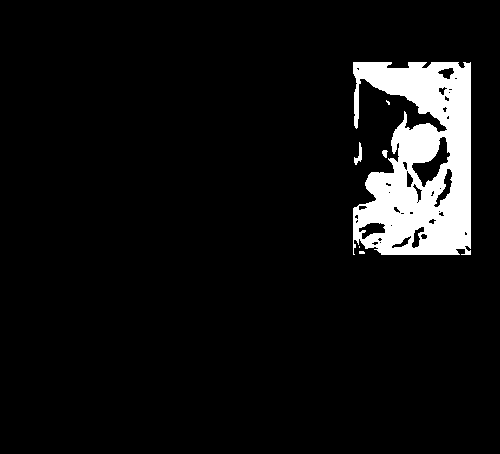

255
Image similarity: 0.8279276547534663


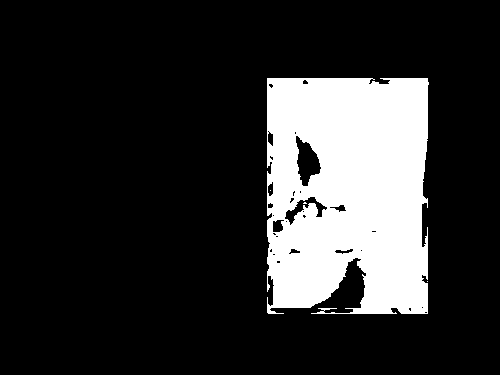

255
Image similarity: 0.9555767261791431


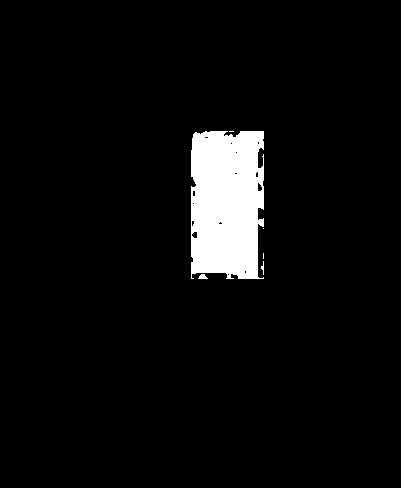

255
Image similarity: 0.9263557908142804


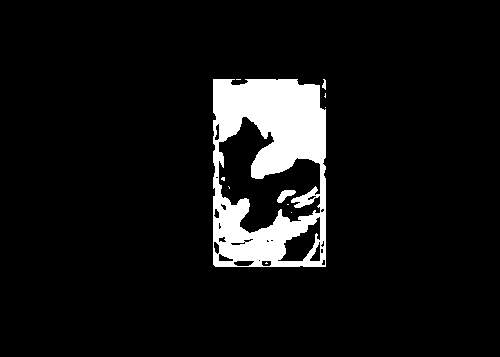

255
Image similarity: 0.9837578985109519


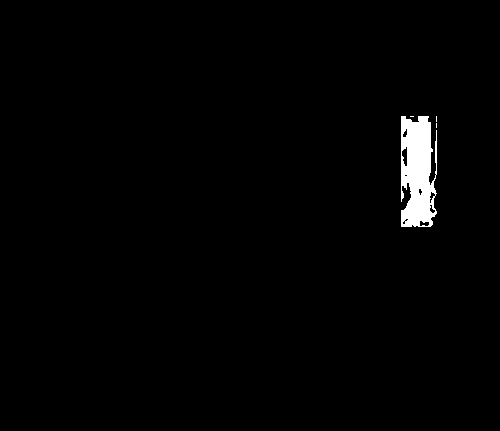

255
Image similarity: 0.925350198137829


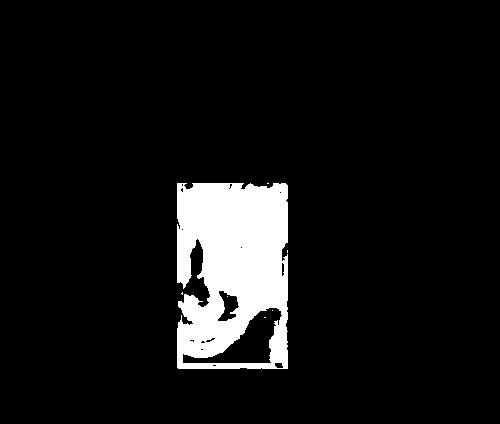

255
Image similarity: 0.8887559567444248


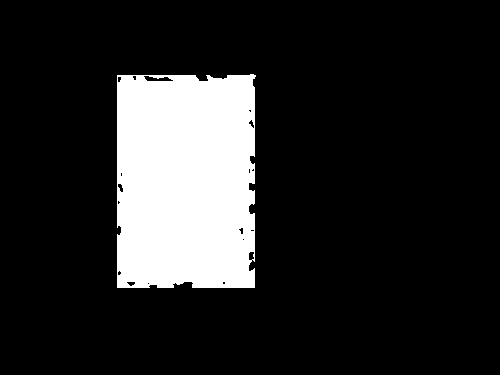

255
Image similarity: 0.9472543182267545


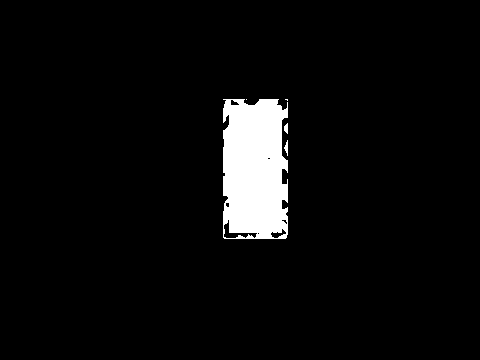

255
Image similarity: 0.9855165074766211


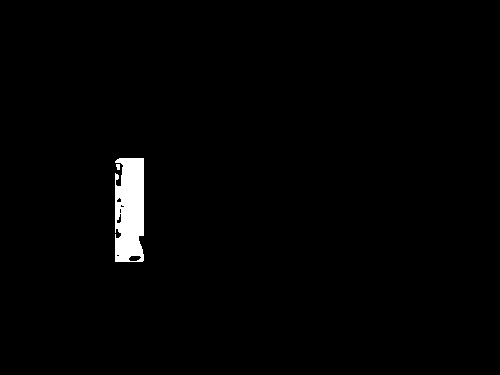

255
Image similarity: 0.9827792175848126


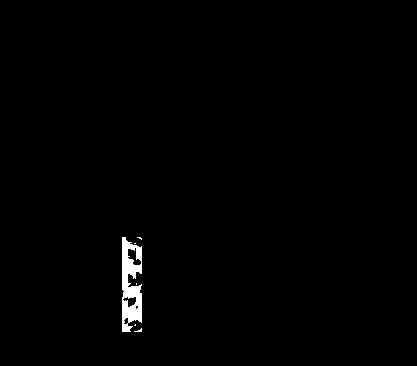

255
Image similarity: 0.9238233192970206


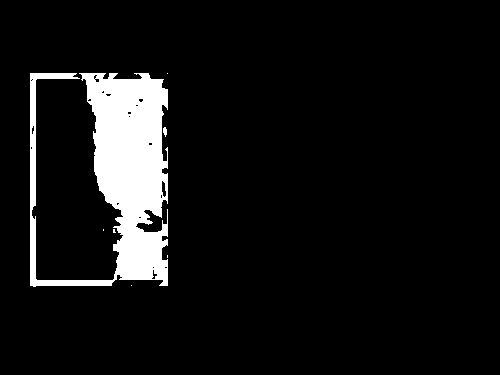

255
Image similarity: 0.953417367132013


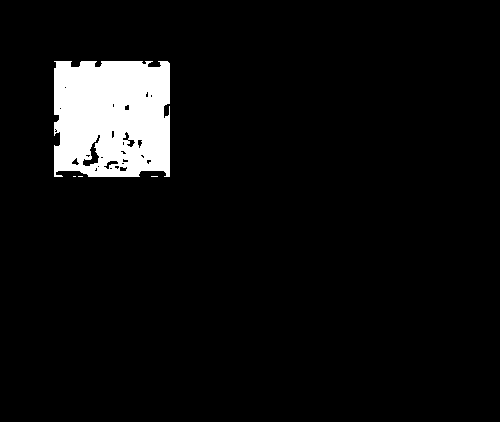

255
Image similarity: 0.9349672882331089


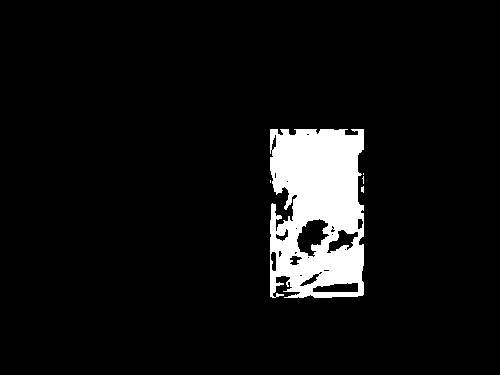

255
Image similarity: 0.8208506723654909


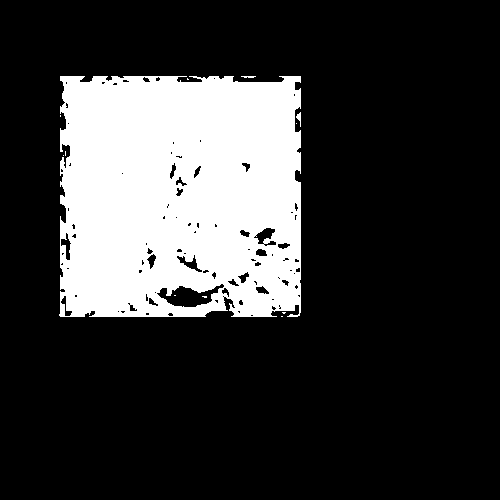

255
Image similarity: 0.9917816663578053


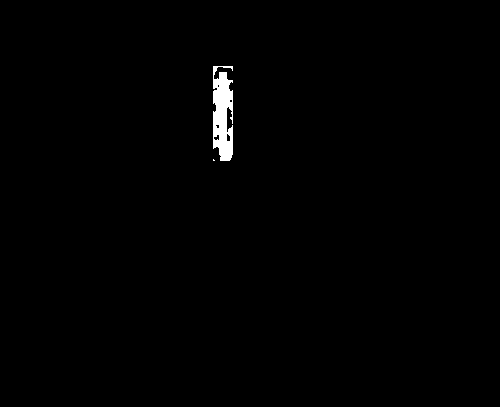

255
Image similarity: 0.8886889276301333


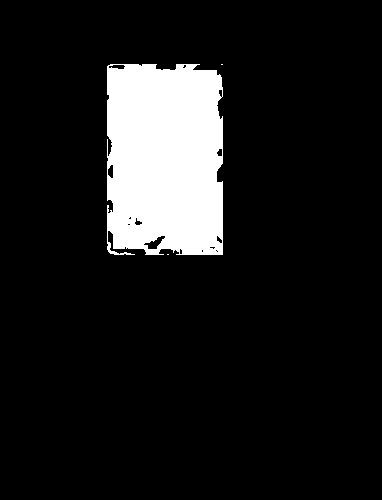

255
Image similarity: 0.9132174347568924


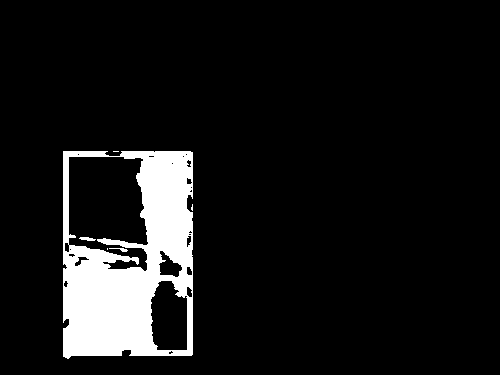

255
Image similarity: 0.9178500100049211


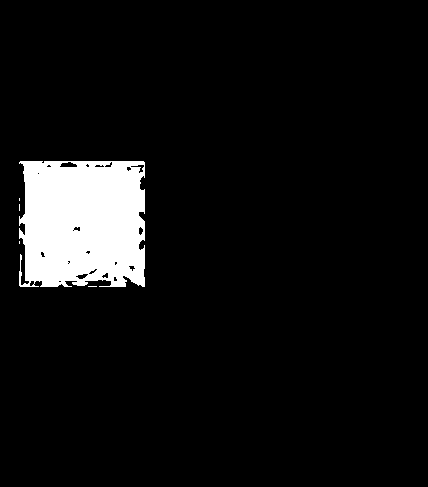

255
Image similarity: 0.9662827208205255


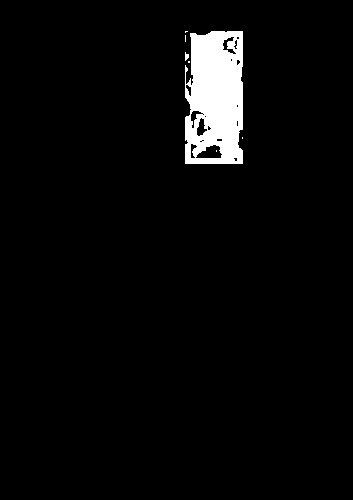

255
Image similarity: 0.9635560341683411


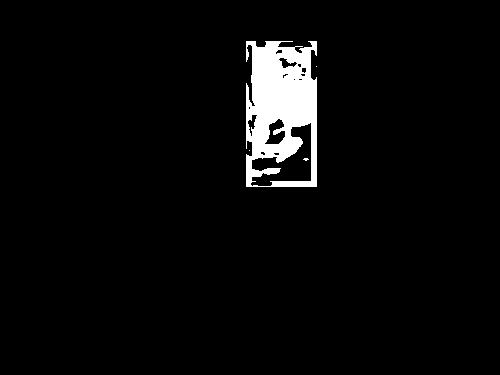

255
Image similarity: 0.9047596460008084


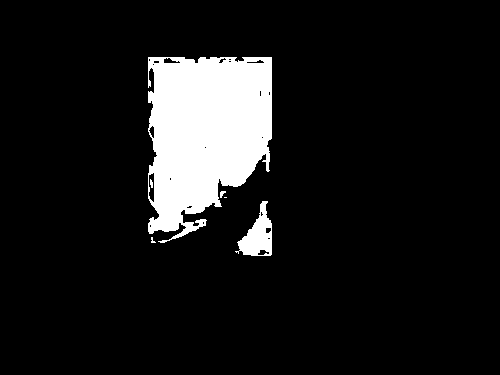

255
Image similarity: 0.9603126561693289


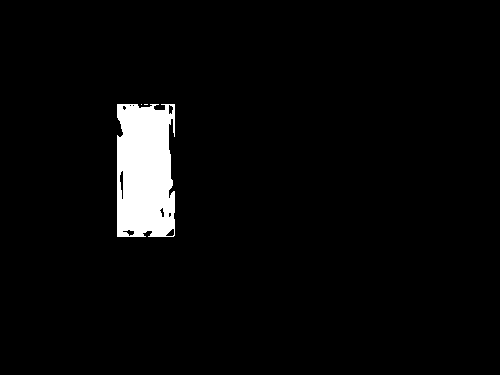

255
Image similarity: 0.9669038465395471


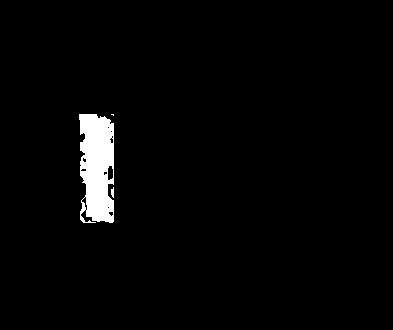

255
Image similarity: 0.9337579789892686


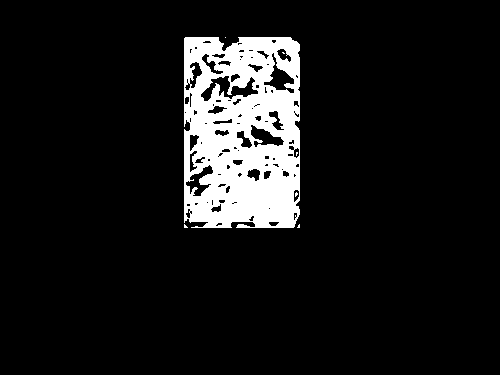

255
Image similarity: 0.9675465769448501


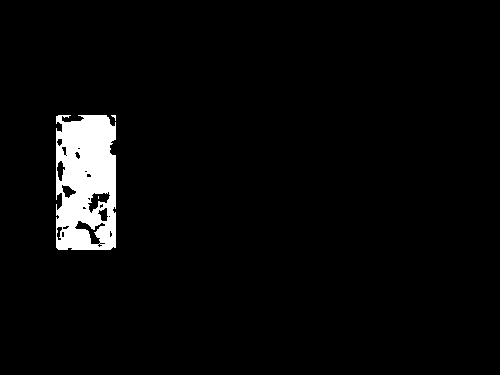

255
Image similarity: 0.9844985399018825


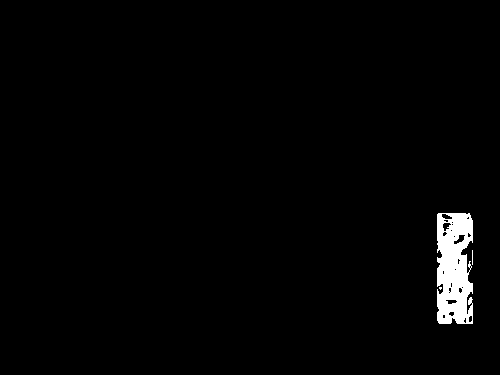

255
Image similarity: 0.9794306791566727


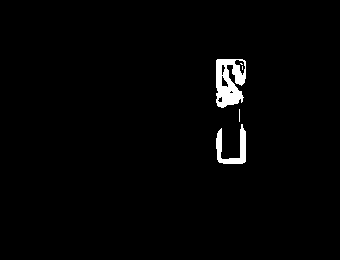

255
Image similarity: 0.9762912996681725


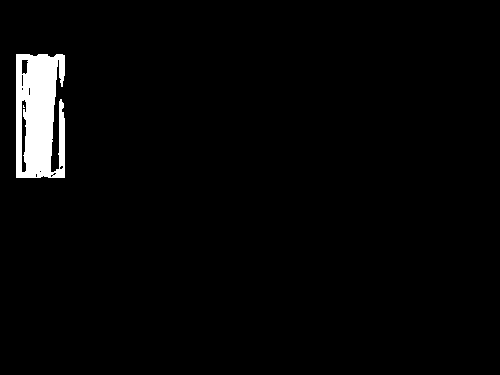

255
Image similarity: 0.9716363251150814


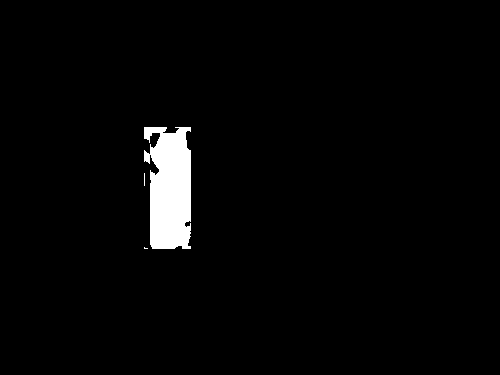

255
Image similarity: 0.9937836918053019


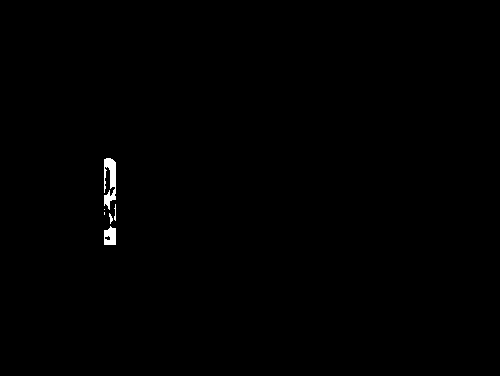

255
Image similarity: 0.9690025158143163


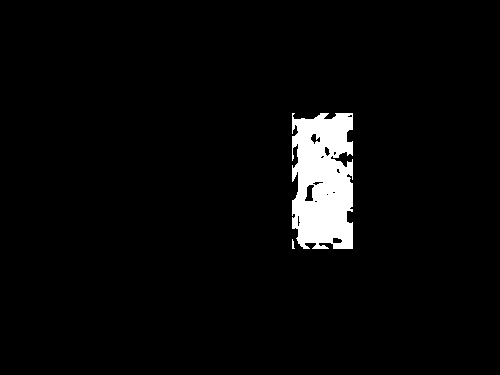

255
Image similarity: 0.9594330329789765


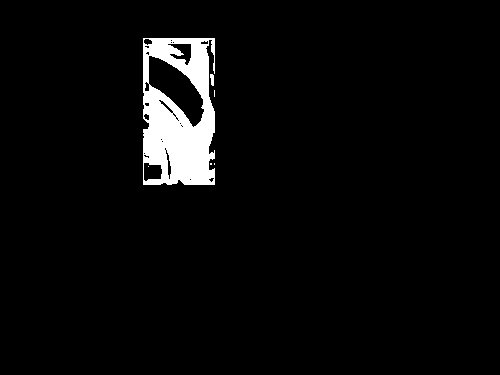

255
Image similarity: 0.8818493732747502


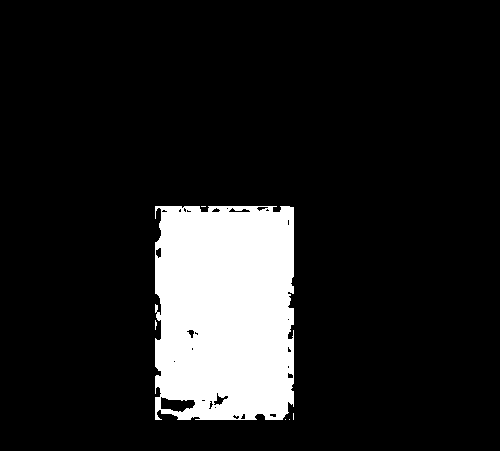

255
Image similarity: 0.8699254989505221


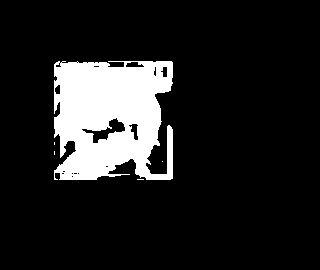

255
Image similarity: 0.9927288478689109


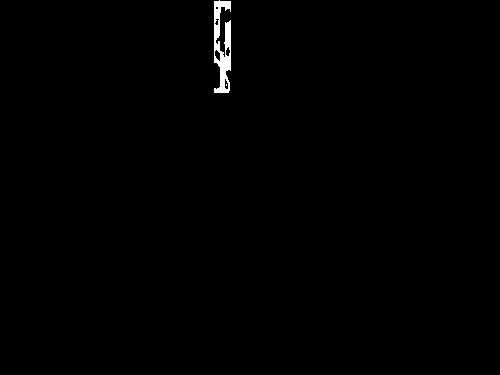

255
Image similarity: 0.9028544468674392


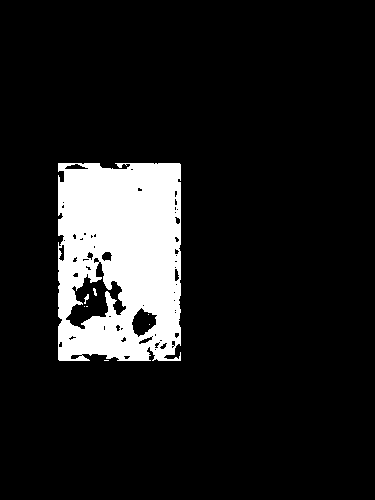

255
Image similarity: 0.9796352192053983


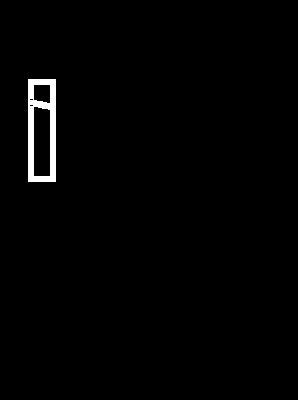

255
Image similarity: 0.9129122321964735


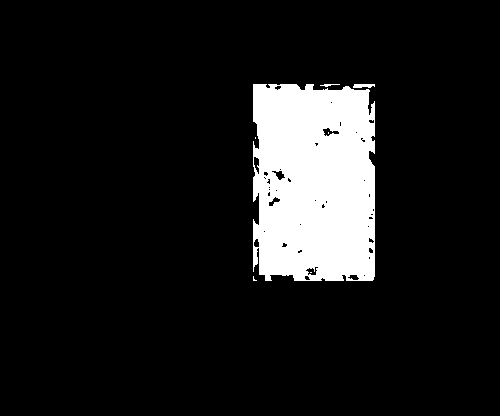

255
Image similarity: 0.8256707741712245


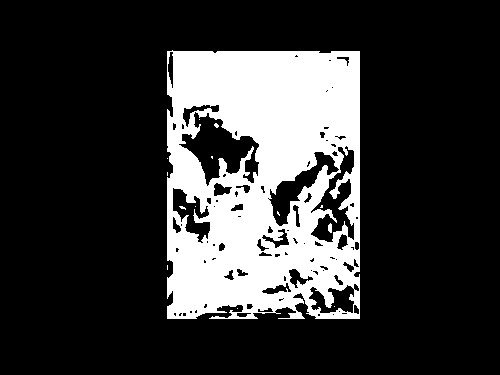

255
Image similarity: 0.9452275133080078


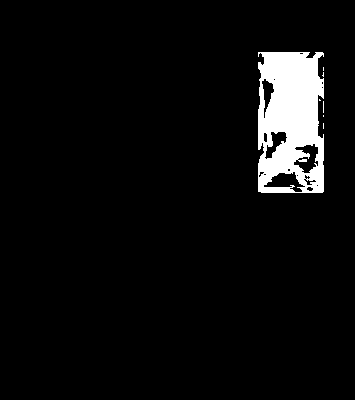

255
Image similarity: 0.9209301345795466


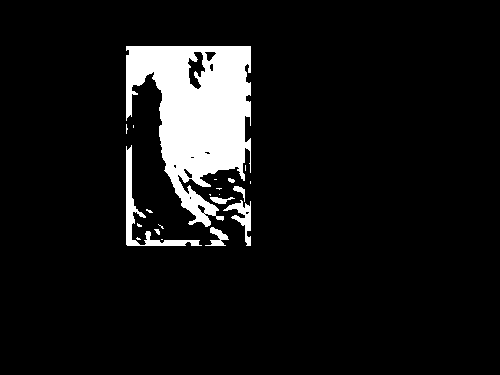

255
Image similarity: 0.9824057511728365


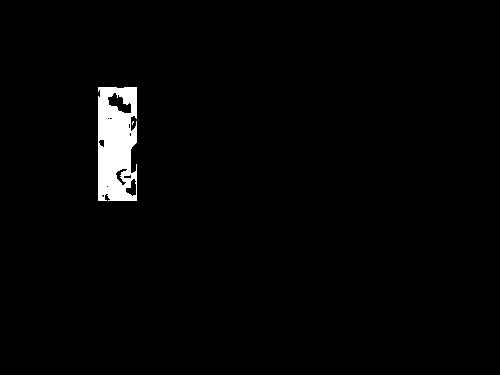

255
Image similarity: 0.93778270216494


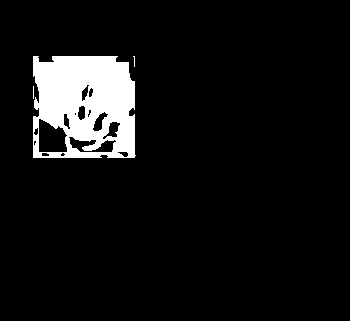

255
Image similarity: 0.7873425311334836


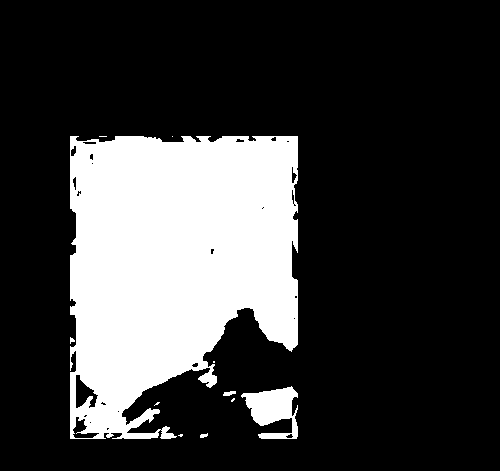

255
Image similarity: 0.8487615387132597


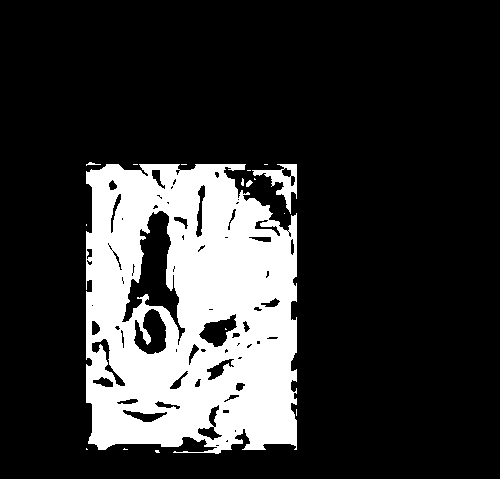

255
Image similarity: 0.9211686105542068


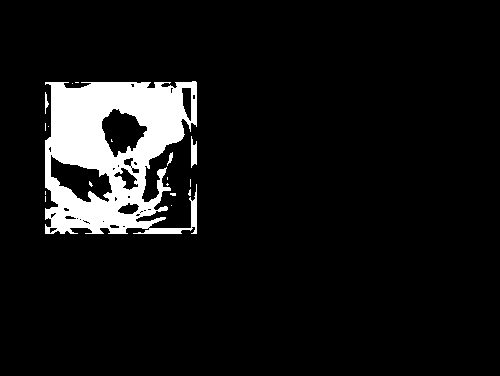

255
Image similarity: 0.9338091671316125


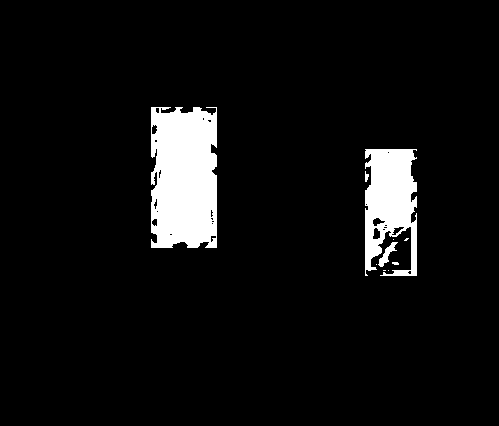

255
Image similarity: 0.9715510375578323


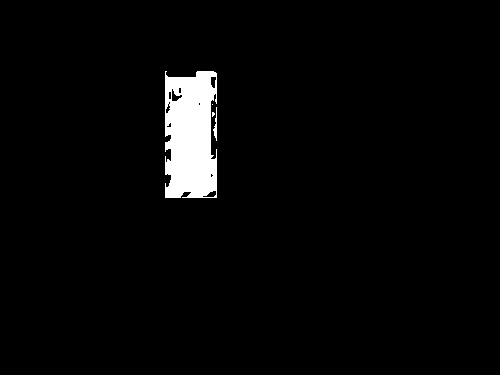

255
Image similarity: 0.7142494279196462


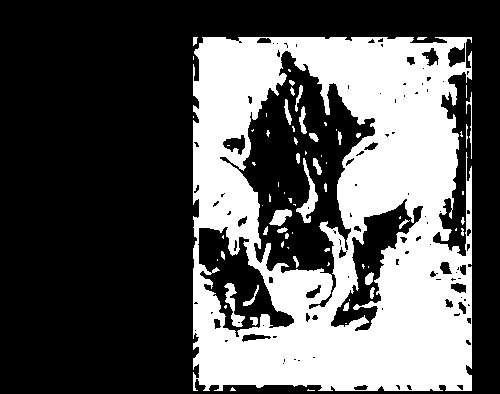

255
Image similarity: 0.9617370139400816


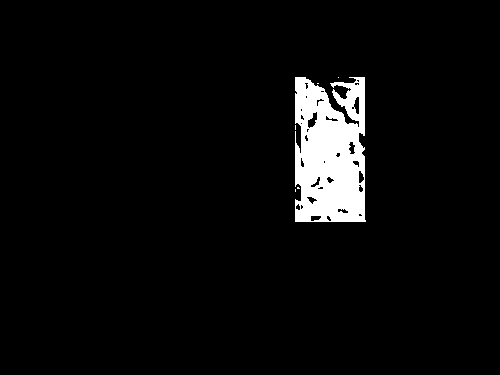

255
Image similarity: 0.9821954850113778


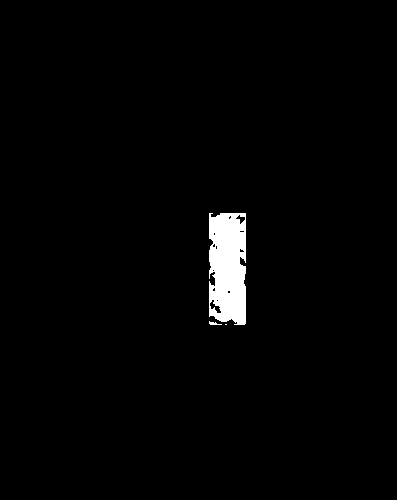

255
Image similarity: 0.9864098558597161


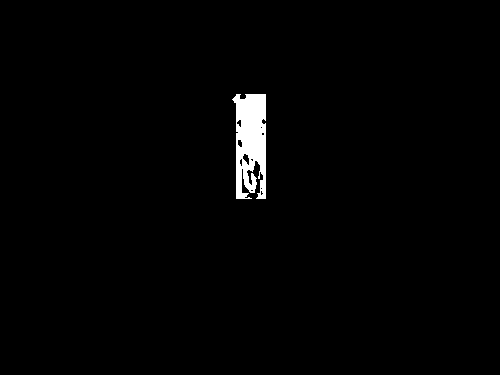

255
Image similarity: 0.9927250374728344


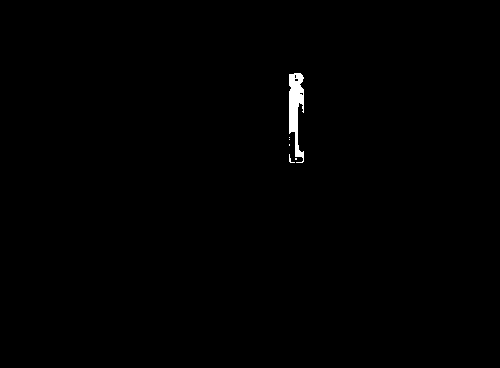

255
Image similarity: 0.9888845202102524


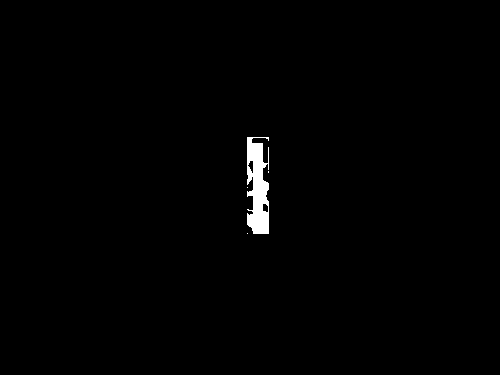

255
Image similarity: 0.9121409899331375


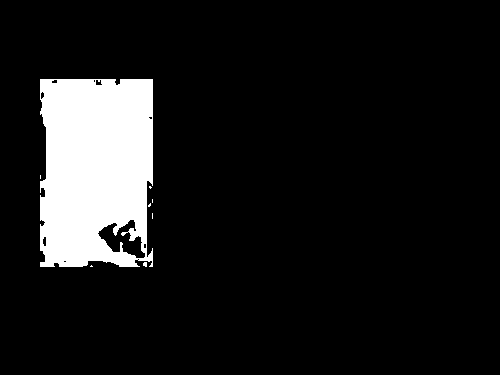

255
Image similarity: 0.979346444901504


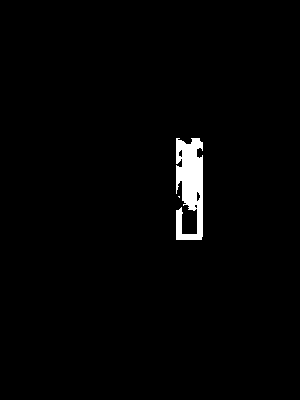

255
Image similarity: 0.9859417189508407


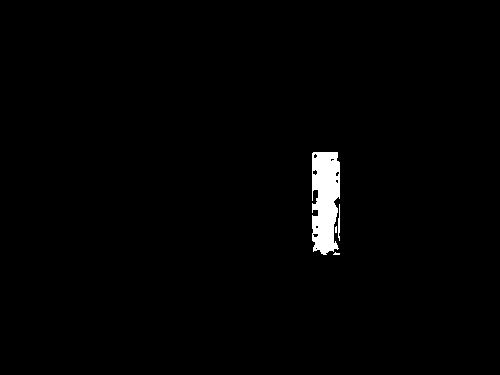

255
Image similarity: 0.9683083984022025


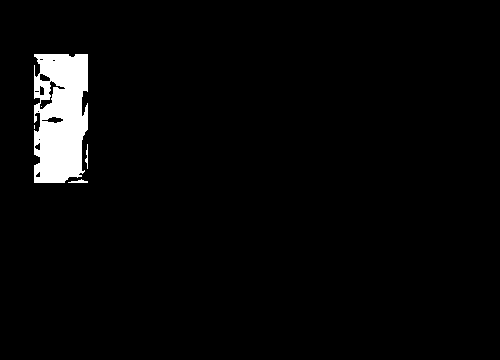

255
Image similarity: 0.824058466538916


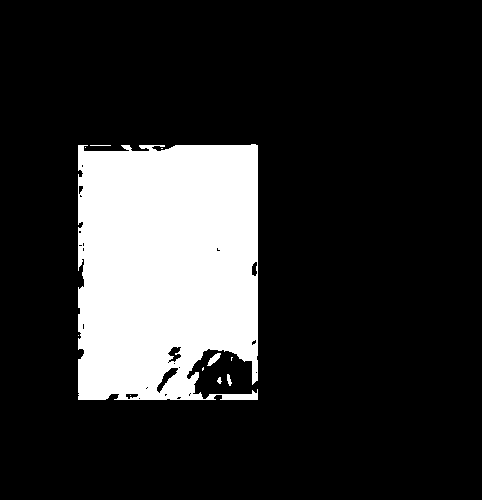

255
Image similarity: 0.9897138390064578


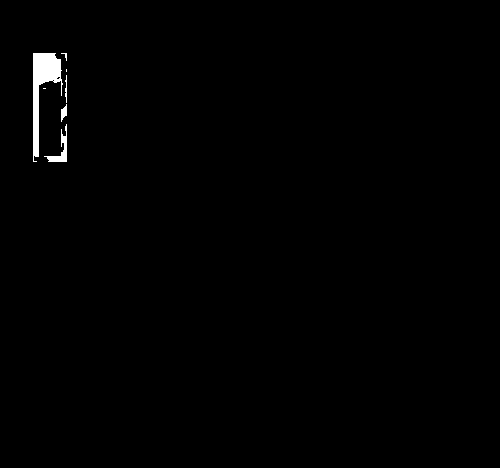

255
Image similarity: 0.9889209379725493


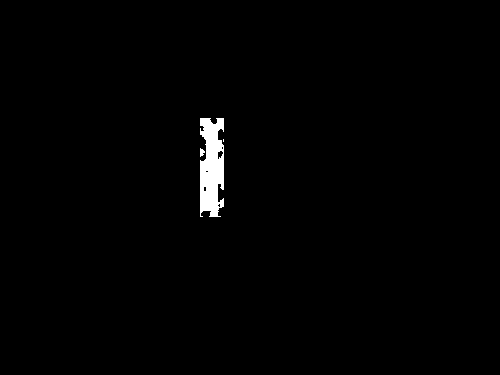

255
Image similarity: 0.96876225940062


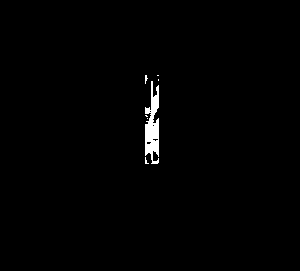

255
Image similarity: 0.8840037169257455


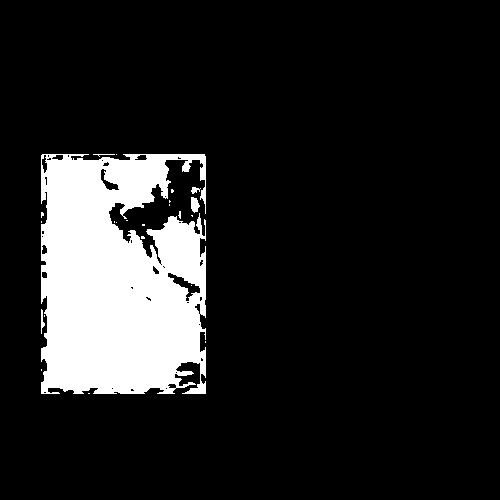

255
Image similarity: 0.8742188010804616


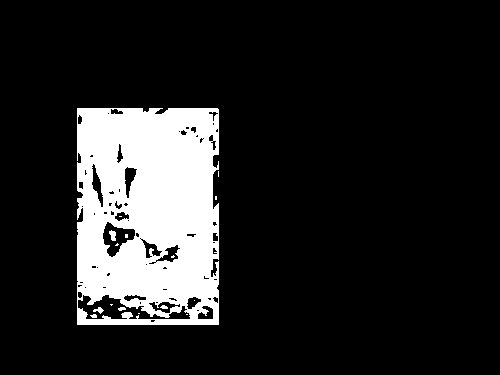

255
Image similarity: 0.9651887414176753


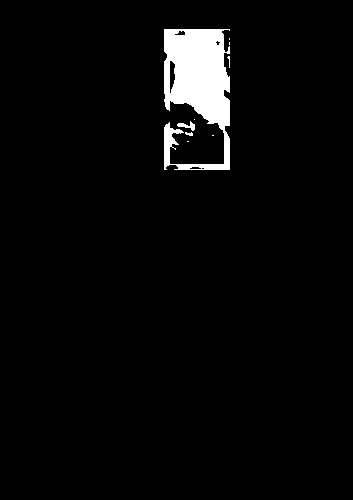

255
Image similarity: 0.9017171682518578


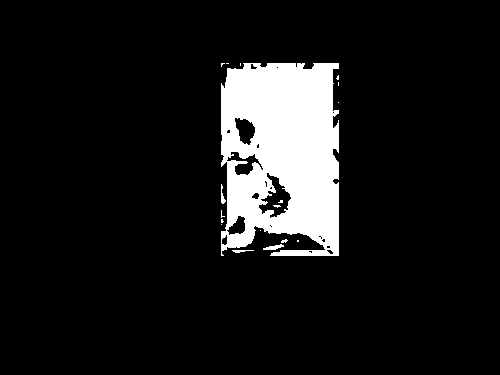

255
Image similarity: 0.8264173062121726


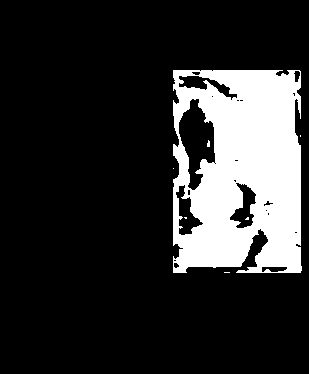

255
Image similarity: 0.9920454208979226


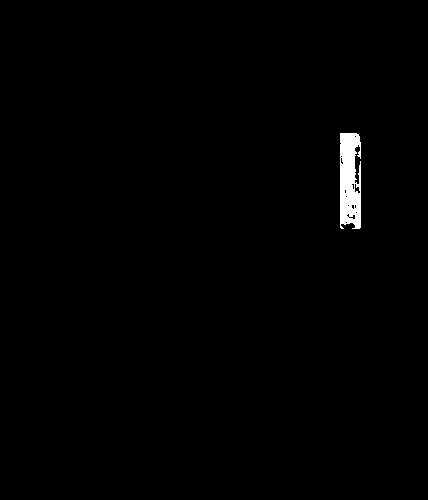

255
Image similarity: 0.9856070636111225


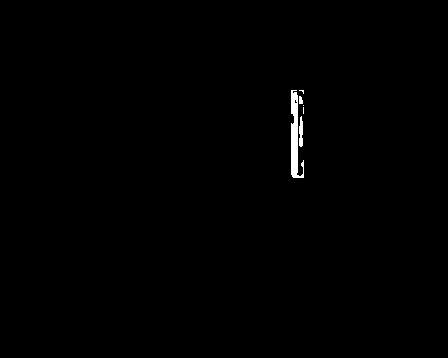

255
Image similarity: 0.8858980654147749


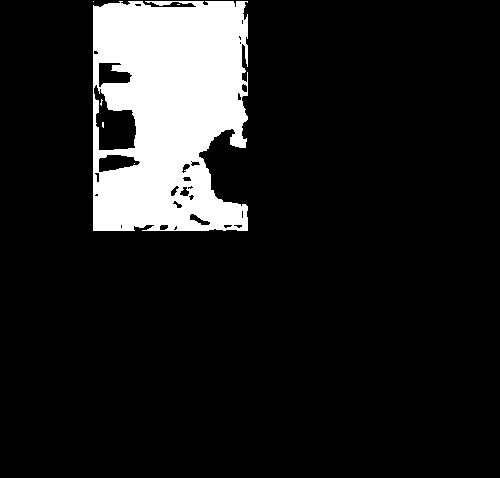

255
Image similarity: 0.9604842093871683


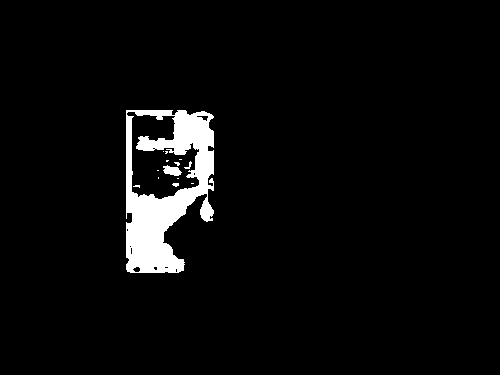

255
Image similarity: 0.9330378014623094


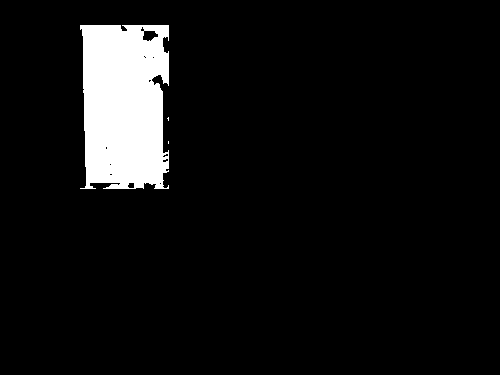

255
Image similarity: 0.9232816471778502


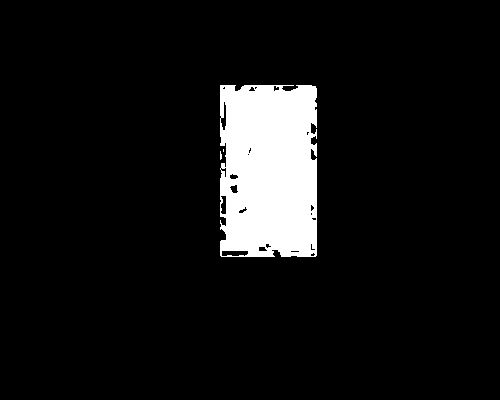

255
Image similarity: 0.959554038254438


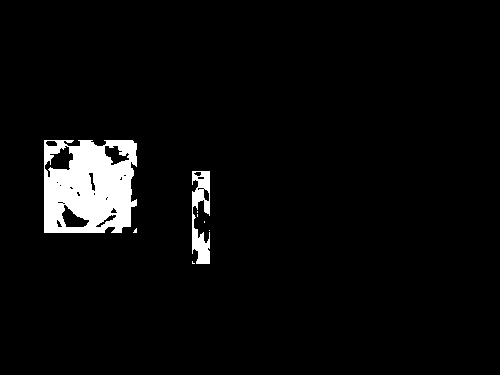

255
Image similarity: 0.9622121424656318


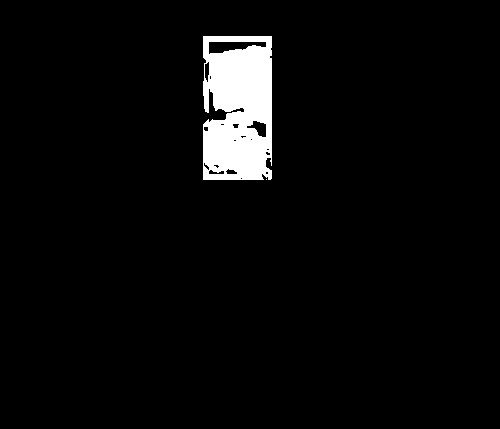

255
Image similarity: 0.989439658581364


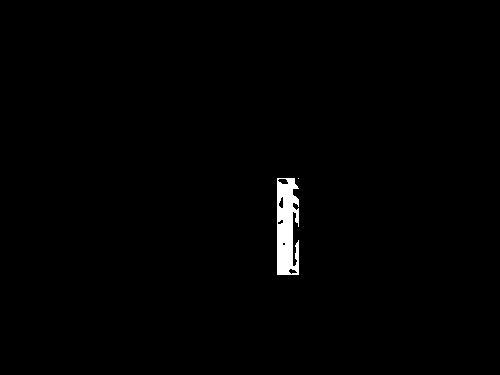

255
Image similarity: 0.9290747032789828


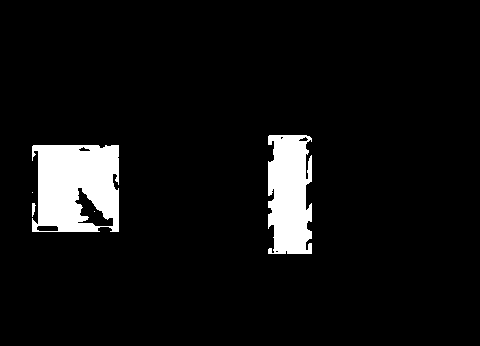

255
Image similarity: 0.9423291346625345


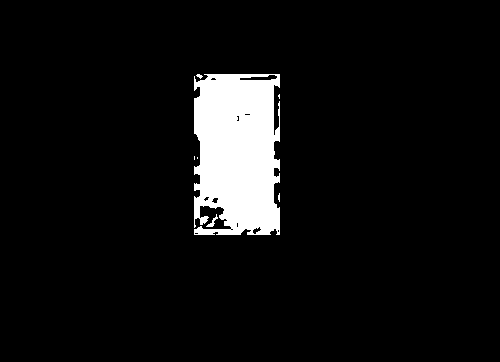

255
Image similarity: 0.9605022166760228


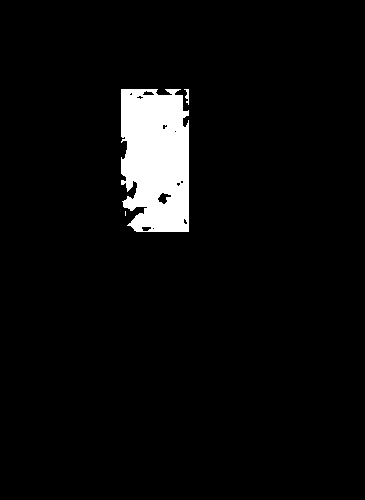

255
Image similarity: 0.939924570416362


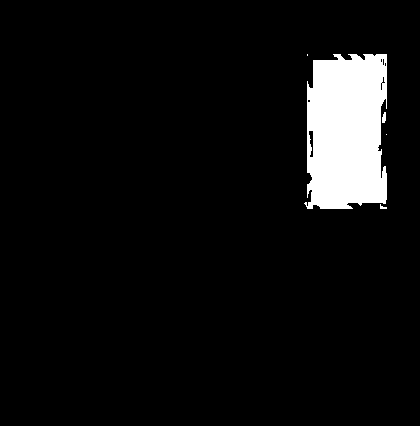

255
Image similarity: 0.977842439628533


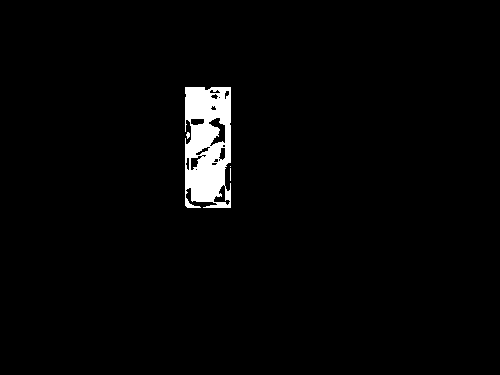

255
Image similarity: 0.9742859039183326


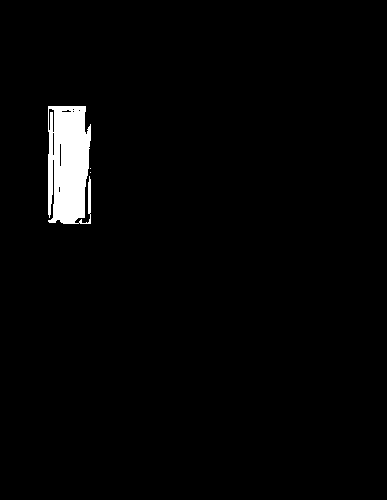

255
Image similarity: 0.960142644479925


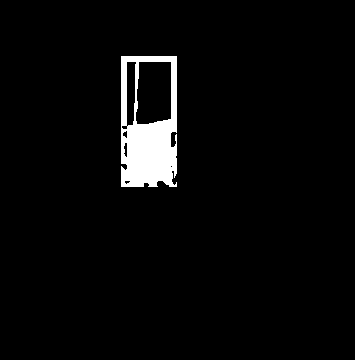

255
Image similarity: 0.9531943592199589


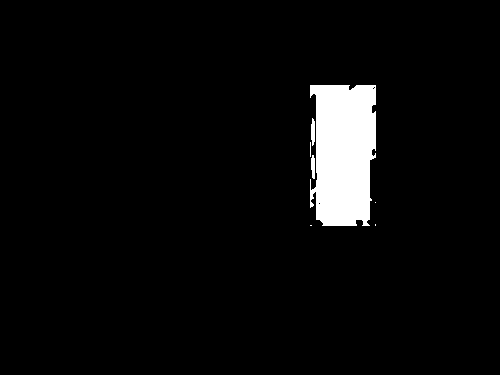

255
Image similarity: 0.9284844252054488


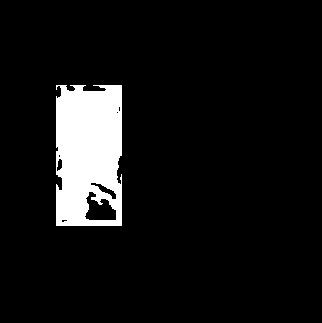

255
Image similarity: 0.9188929683012438


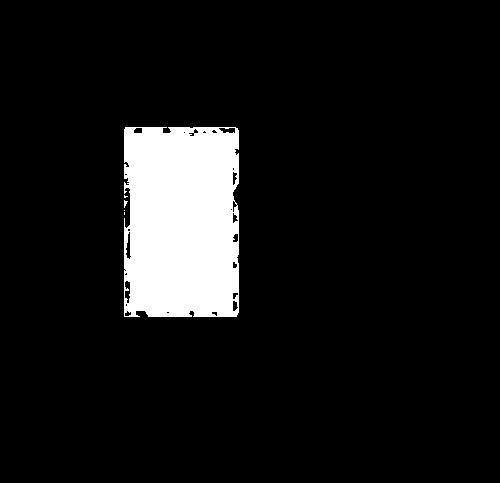

255
Image similarity: 0.978003503623838


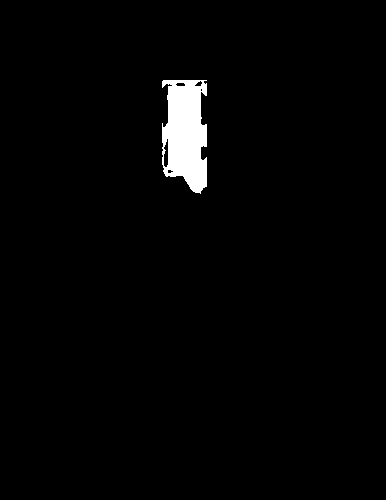

255
Image similarity: 0.9702512622798442


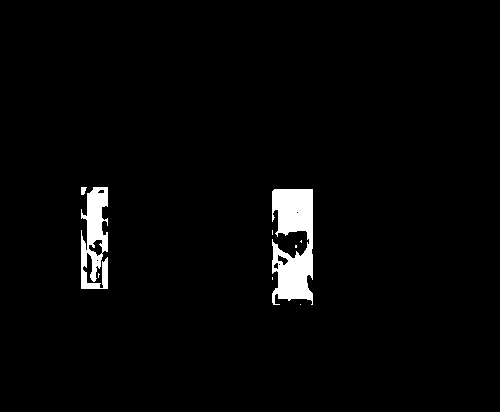

255
Image similarity: 0.9065371534487121


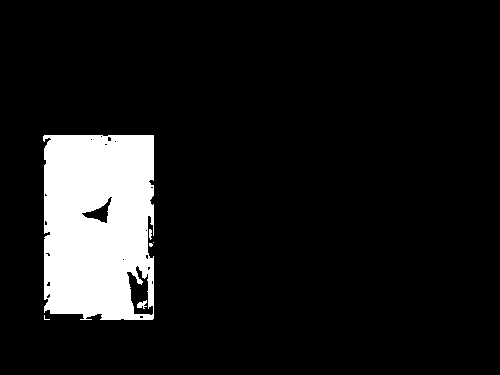

255
Image similarity: 0.8662212365573181


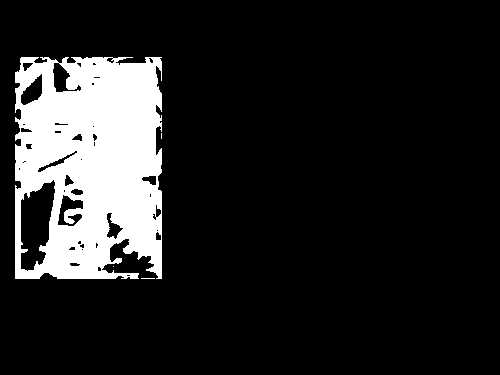

255
Image similarity: 0.9696971683405852


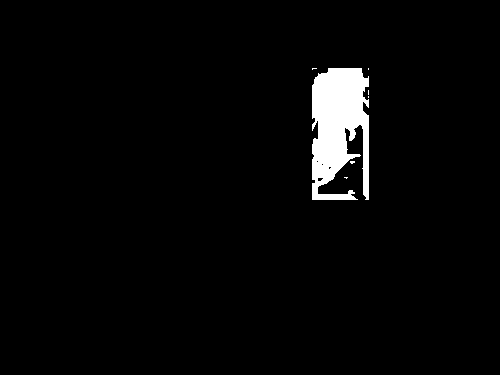

255
Image similarity: 0.8686198856530231


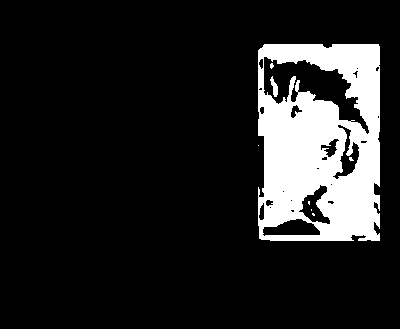

255
Image similarity: 0.7822463427916049


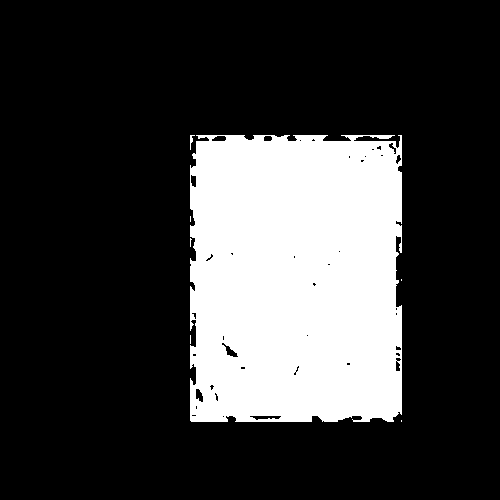

255
Image similarity: 0.9730996569591513


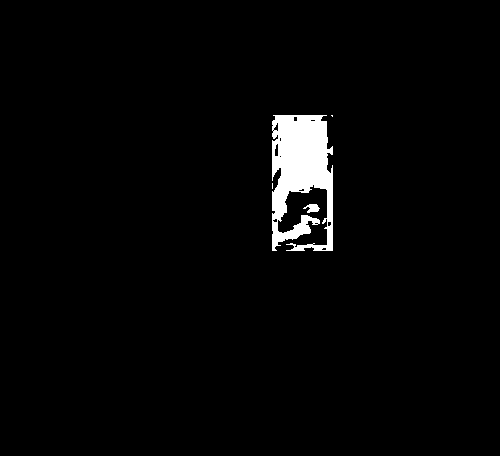

255
Image similarity: 0.9355086174271913


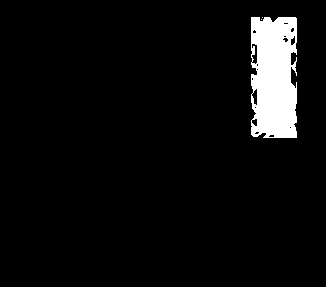

255
Image similarity: 0.9307300226112845


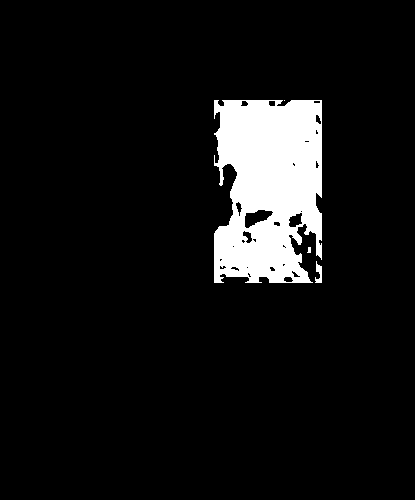

255
Image similarity: 0.9839583924264806


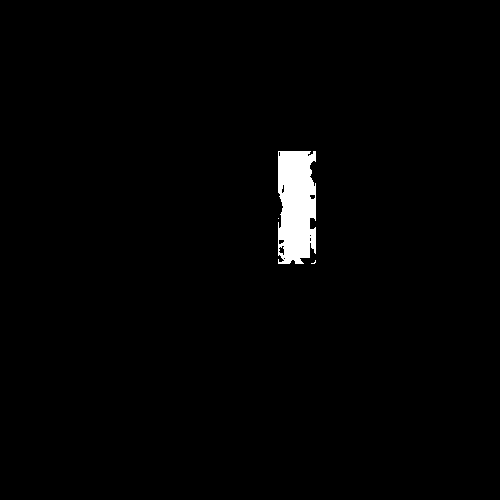

255
Image similarity: 0.993572838099379


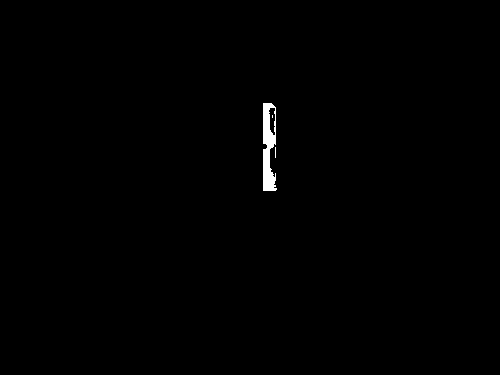

255
Image similarity: 0.9723508657642915


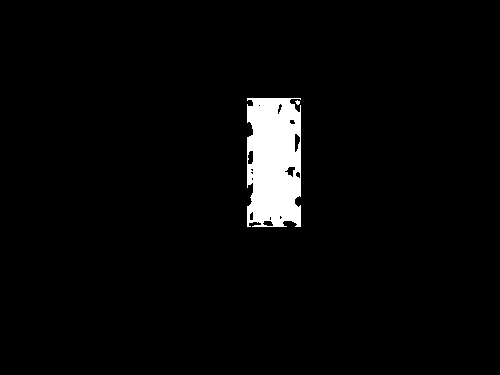

255
Image similarity: 0.9274801087366067


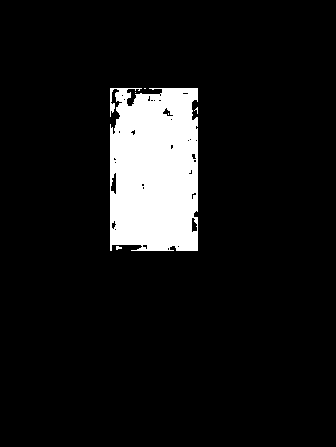

255
Image similarity: 0.9102490441474915


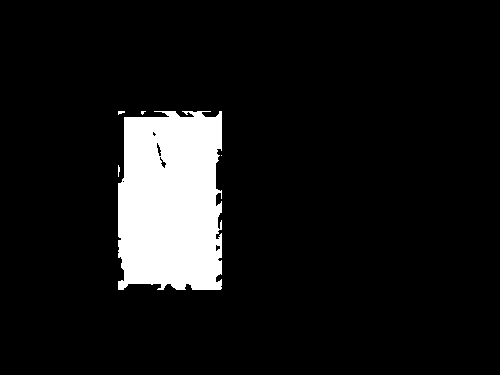

255
Image similarity: 0.8957261664931662


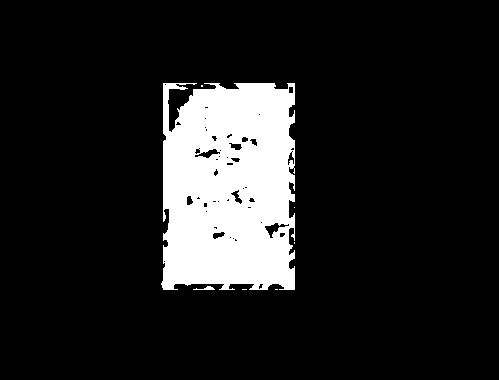

255
Image similarity: 0.9515870718839268


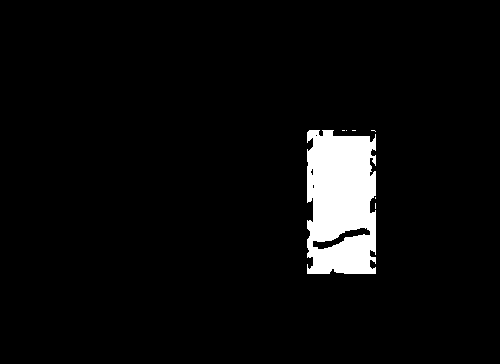

255
Image similarity: 0.9913315681281019


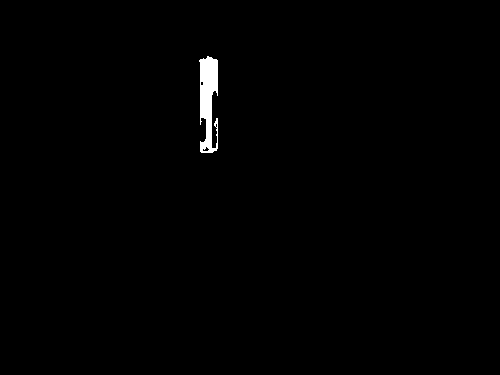

255
Image similarity: 0.9698168577452944


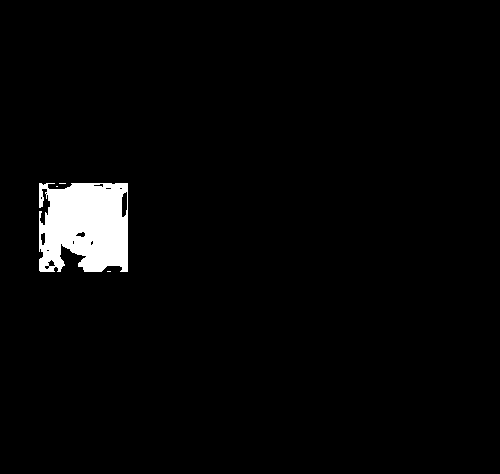

255
Image similarity: 0.942156507672773


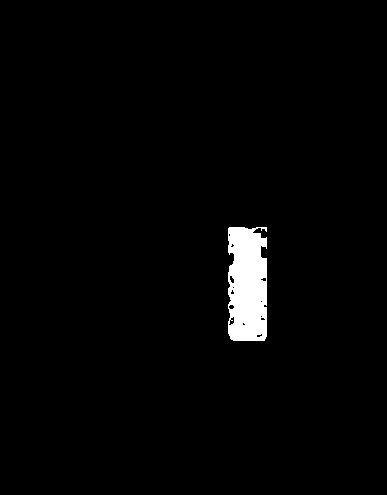

255
Image similarity: 0.9879702357523087


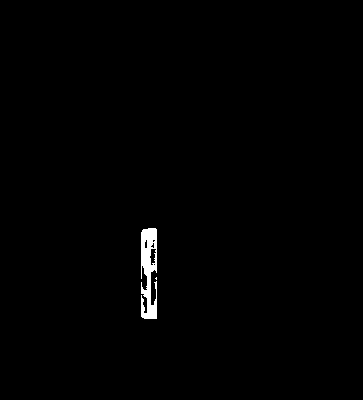

255
Image similarity: 0.920981519091949


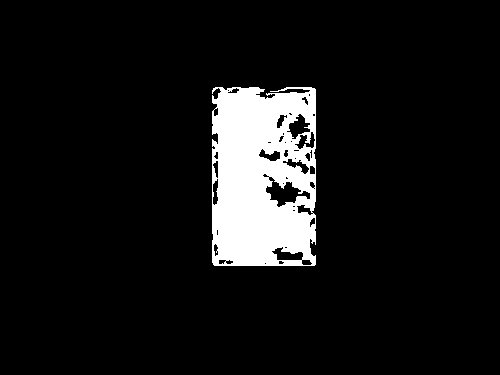

255
Image similarity: 0.8954080721521643


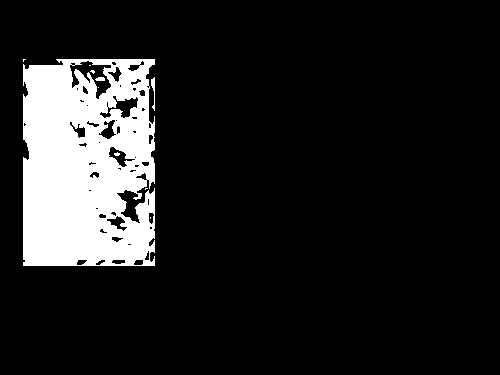

255
Image similarity: 0.919590629546546


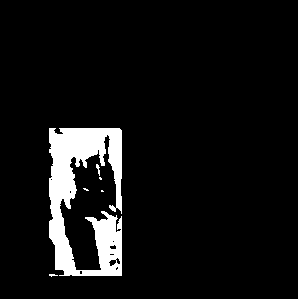

255
Image similarity: 0.6895779634811621


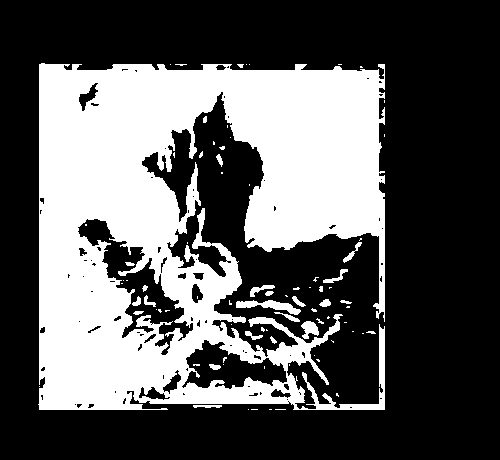

255
Image similarity: 0.9905320723134384


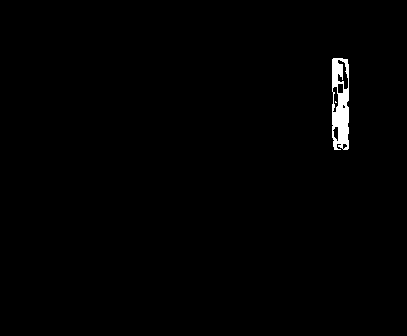

255
Image similarity: 0.9537391348618992


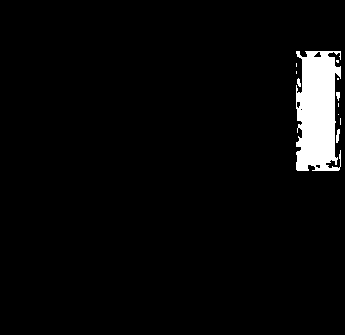

255
Image similarity: 0.9607061716085994


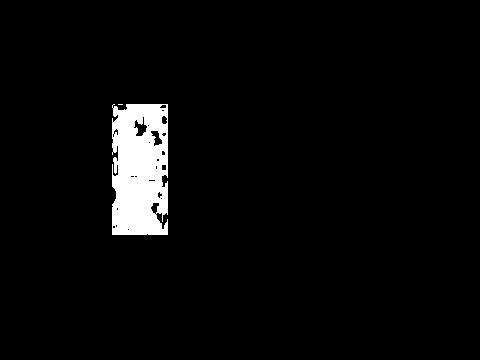

255
Image similarity: 0.8846651455564388


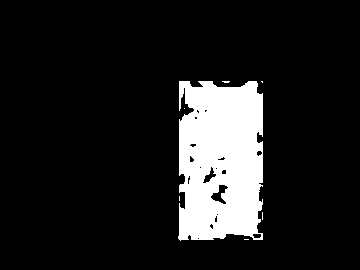

255
Image similarity: 0.9755118587597926


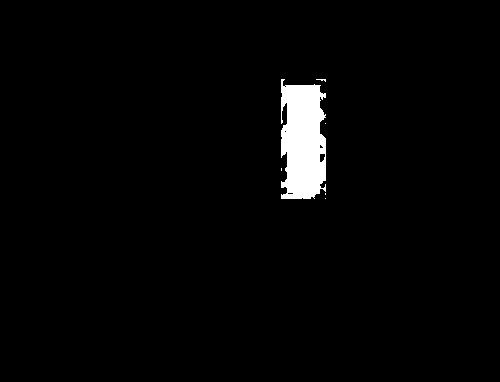

255
Image similarity: 0.9870155581892409


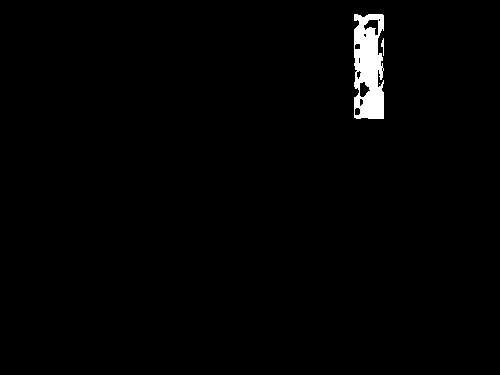

255
Image similarity: 0.9682925583219442


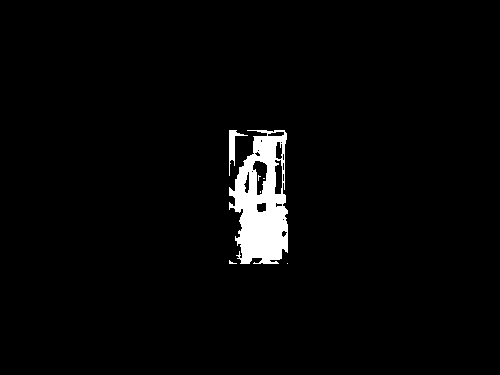

255
Image similarity: 0.9764086894313867


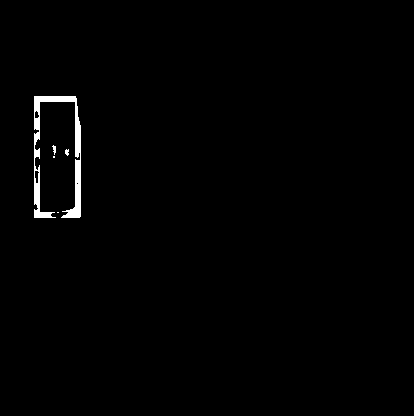

255
Image similarity: 0.9802527209193059


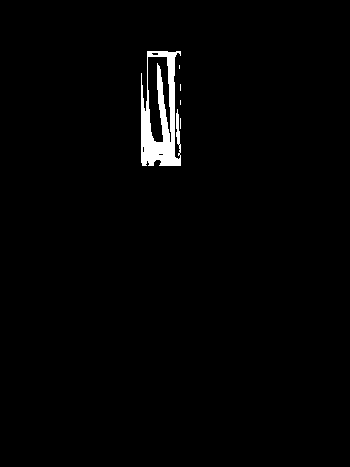

255
Image similarity: 0.9909276136691301


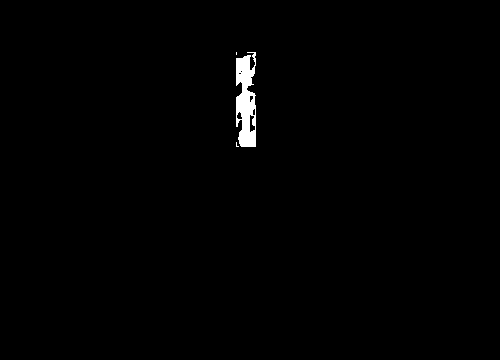

255
Image similarity: 0.9866084782960005


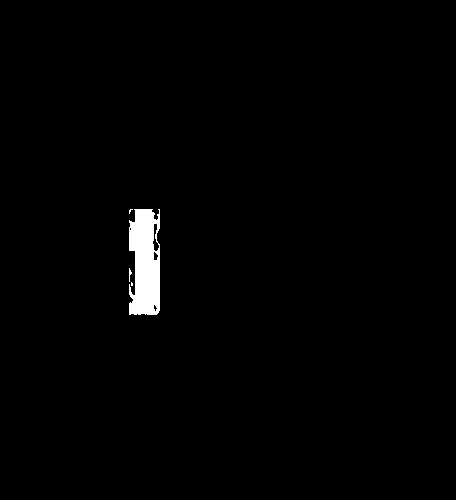

255
Image similarity: 0.9060044956996259


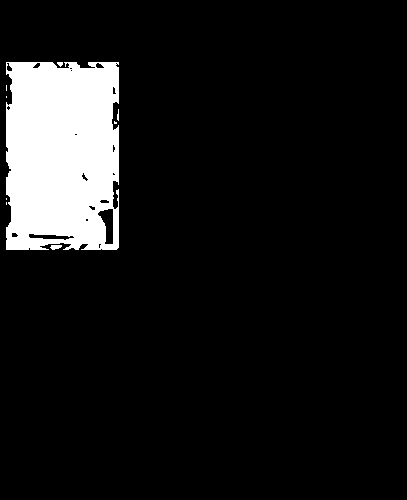

255
Image similarity: 0.9633442519402574


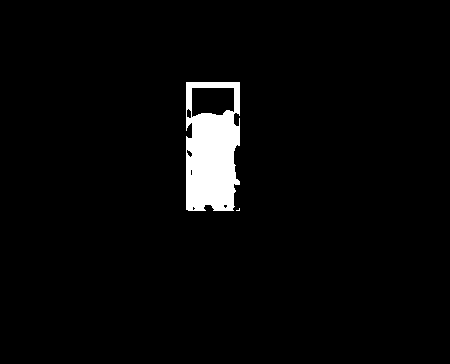

255
Image similarity: 0.9653897700340736


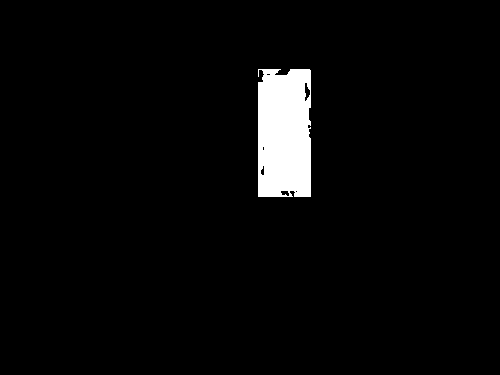

255
Image similarity: 0.9853776534136126


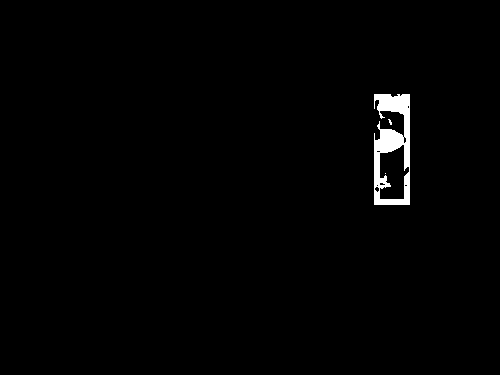

255
Image similarity: 0.978581132596945


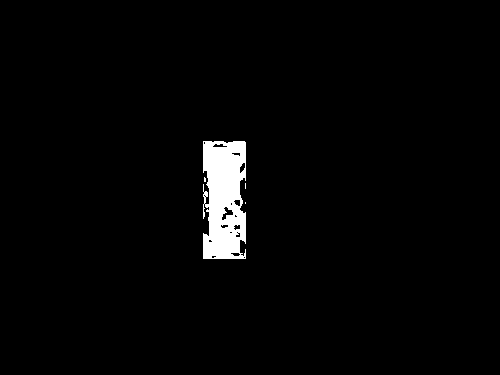

255
Image similarity: 0.9930960486204946


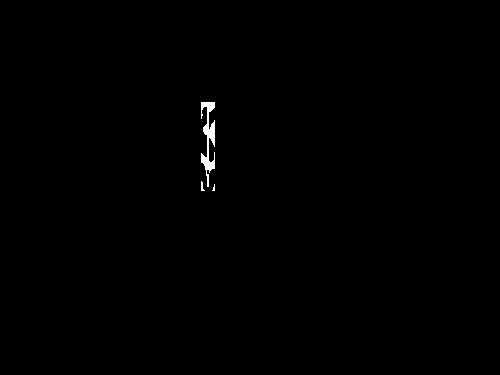

255
Image similarity: 0.9868125855208247


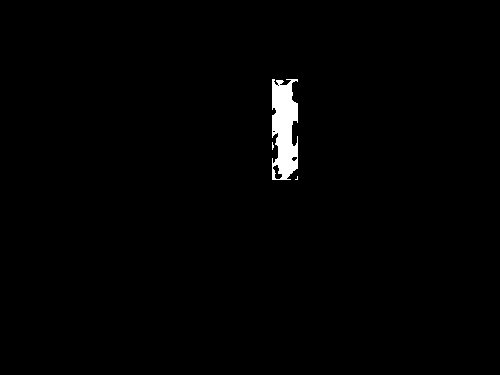

255
Image similarity: 0.9532543720687852


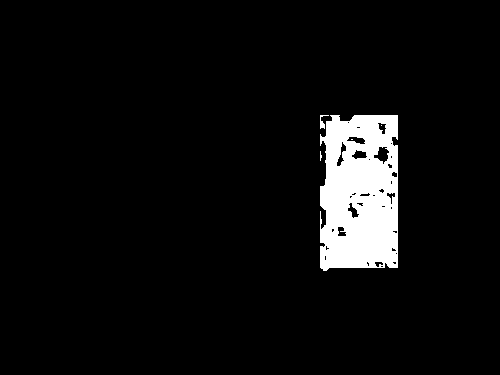

255
Image similarity: 0.9901482472726945


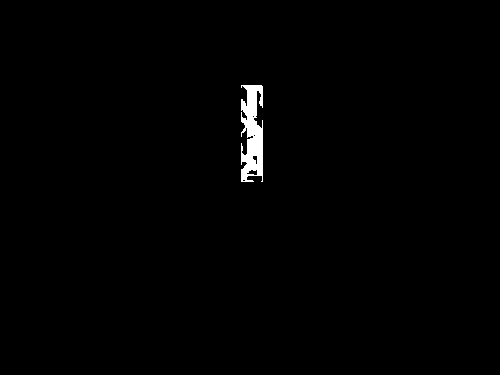

255
Image similarity: 0.910840904504722


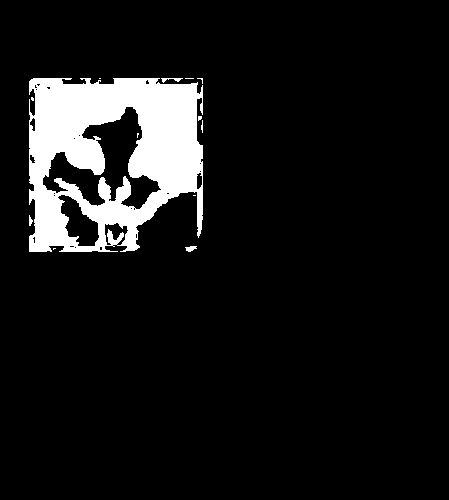

255
Image similarity: 0.9610687649279595


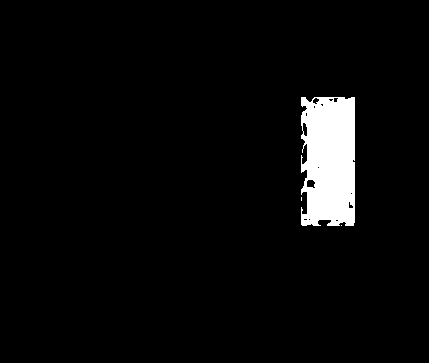

255
Image similarity: 0.9293275900815846


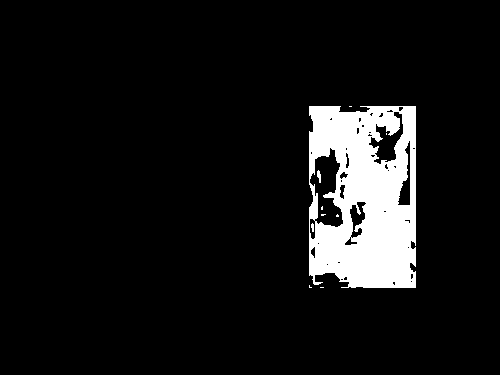

255
Image similarity: 0.9308936210182616


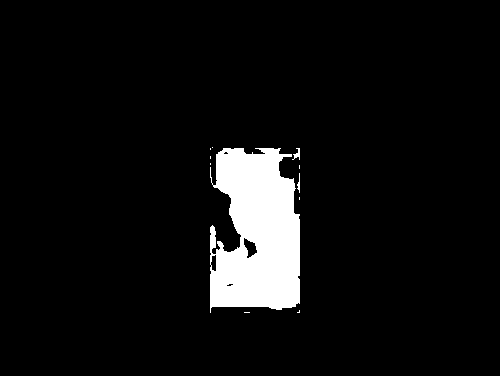

255
Image similarity: 0.94432594100799


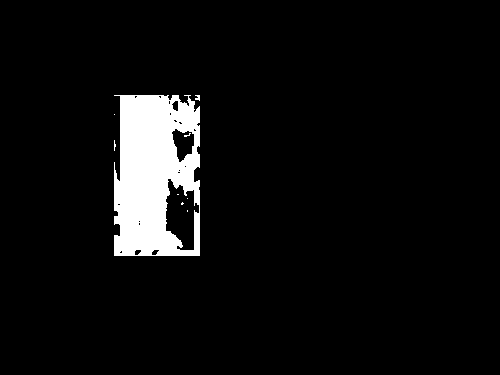

255
Image similarity: 0.8040905415037919


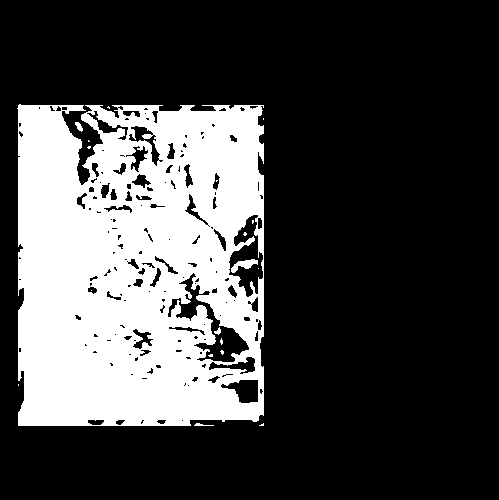

255
Image similarity: 0.9153853660673287


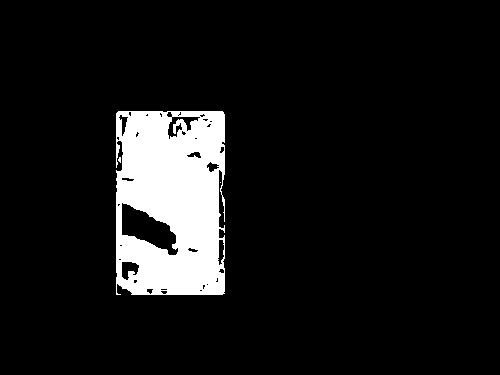

255
Image similarity: 0.9584372531962703


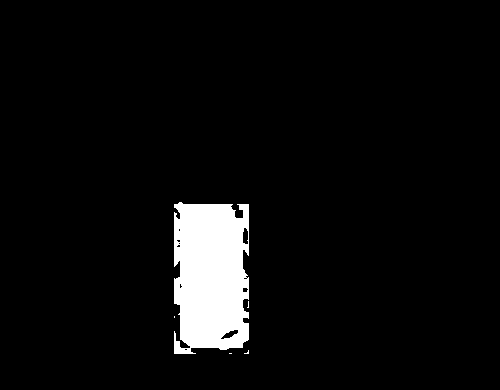

255
Image similarity: 0.9069726799934928


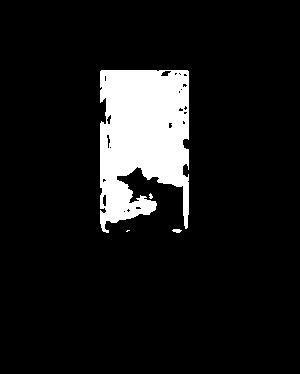

255
Image similarity: 0.9822024313811468


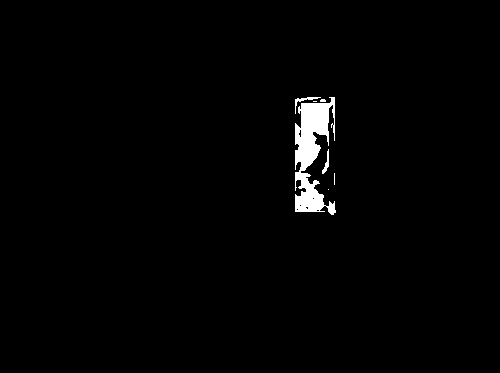

255
Image similarity: 0.9833538042376867


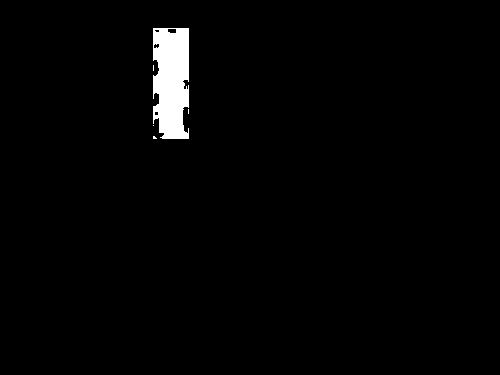

255
Image similarity: 0.9392333458852629


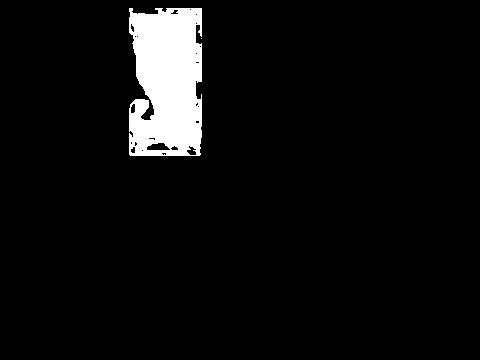

255
Image similarity: 0.628001057673572


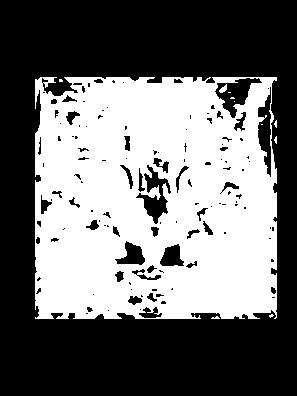

255
Image similarity: 0.9685983325381359


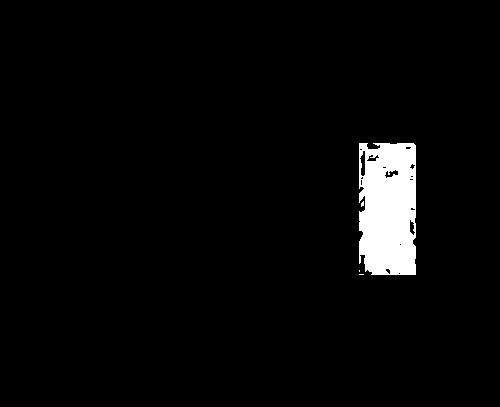

255
Image similarity: 0.962212924191374


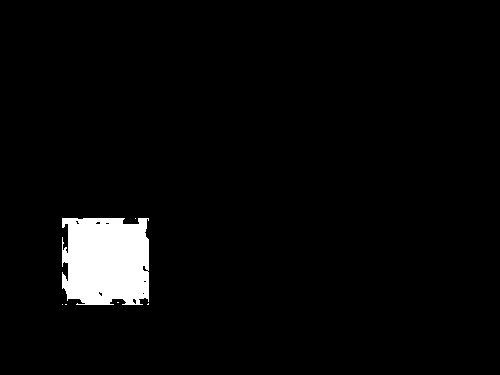

255
Image similarity: 0.9313188130231004


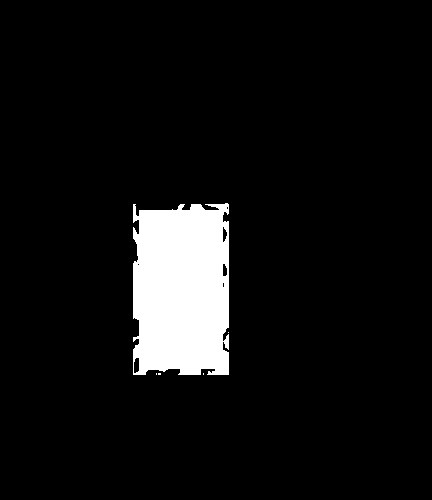

255
Image similarity: 0.9364493726851156


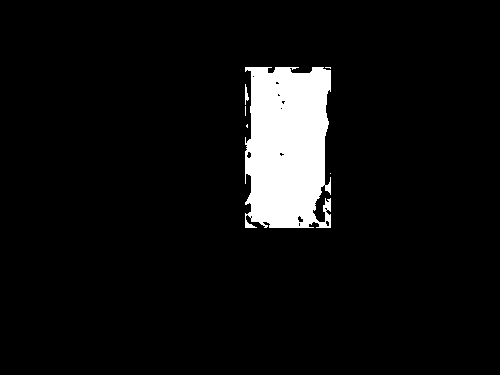

255
Image similarity: 0.8878536031456181


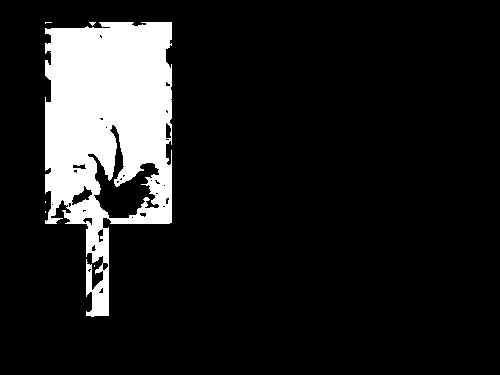

255
Image similarity: 0.9809634240859155


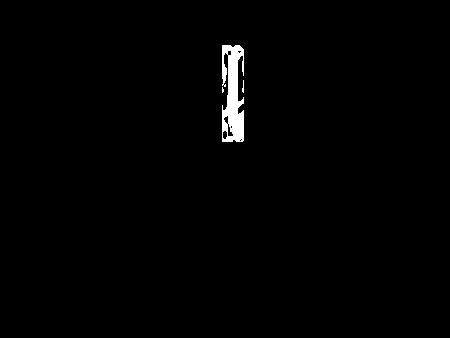

255
Image similarity: 0.9440330355090795


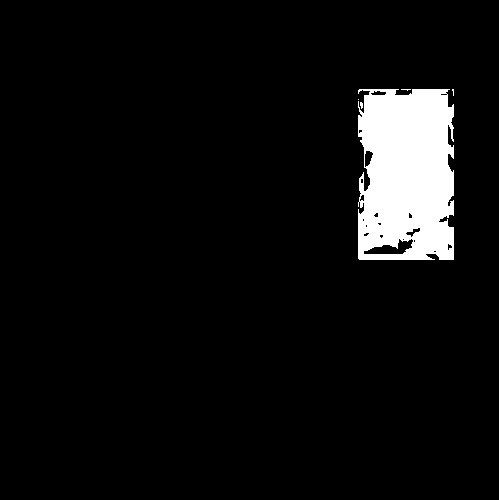

255
Image similarity: 0.9922357582204148


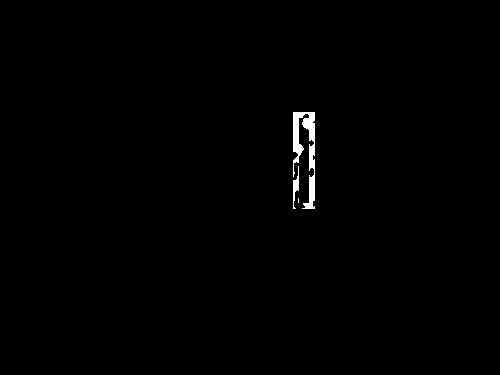

255
Image similarity: 0.9410174043529649


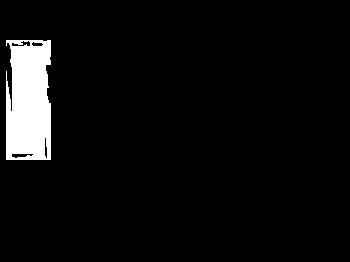

255
Image similarity: 0.9743052485594681


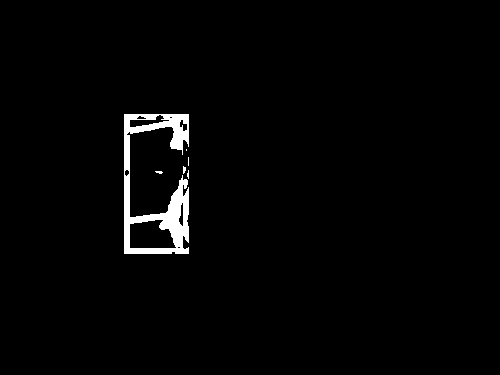

255
Image similarity: 0.9725067069568489


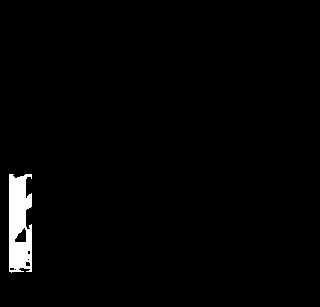

255
Image similarity: 0.8937032405259565


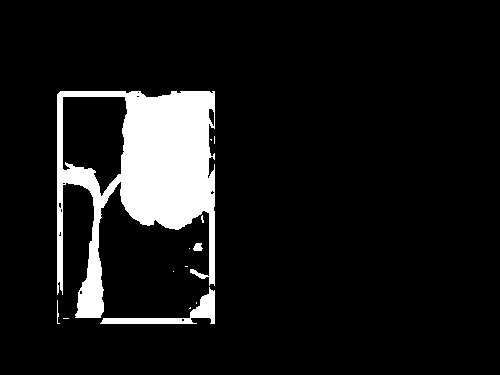

255
Image similarity: 0.9152024985793638


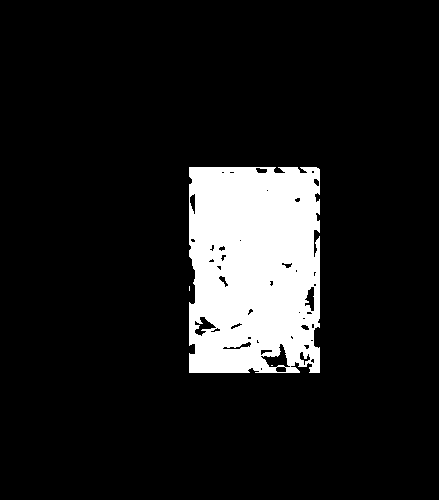

255
Image similarity: 0.9589616350756055


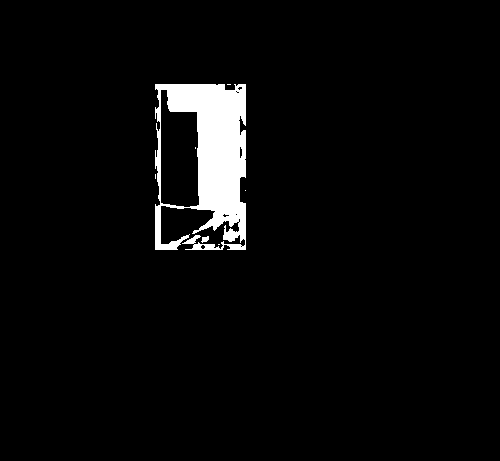

255
Image similarity: 0.9268147087139351


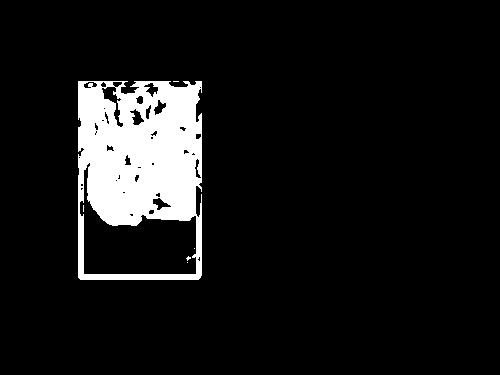

255
Image similarity: 0.9533758838914417


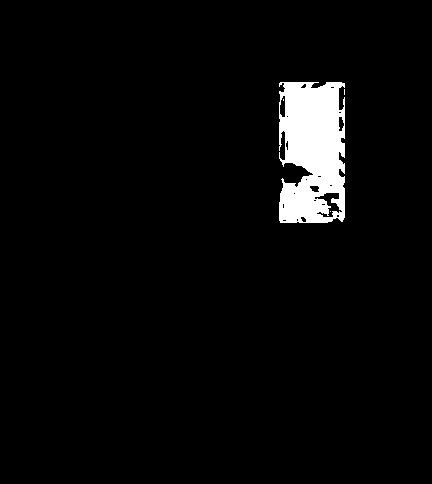

255
Image similarity: 0.9265887485346705


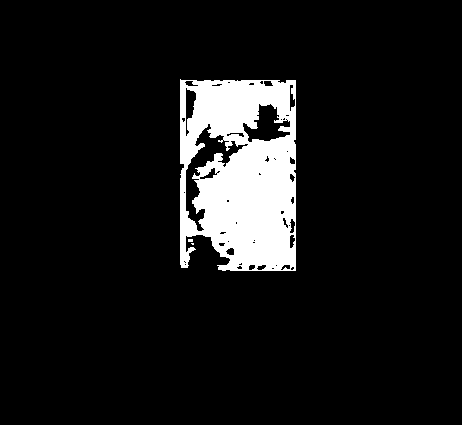

255
Image similarity: 0.9753435197695148


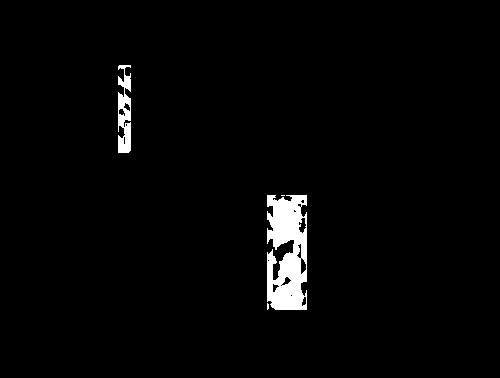

255
Image similarity: 0.9929645577825785


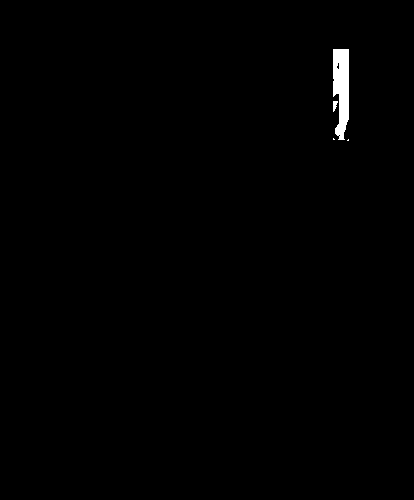

255
Image similarity: 0.9841019618956461


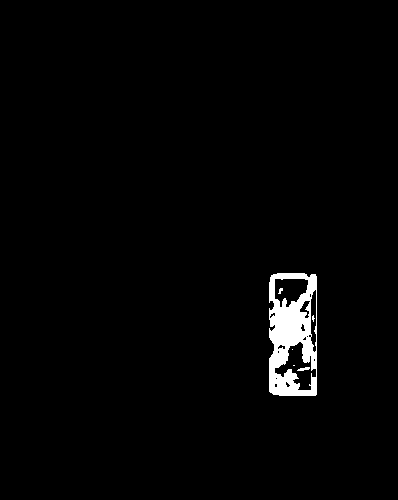

255
Image similarity: 0.9133818357855837


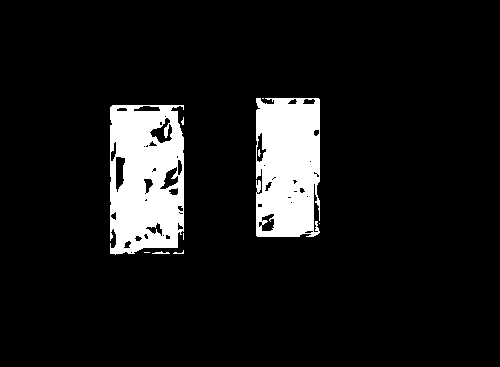

255
Image similarity: 0.9834601899099726


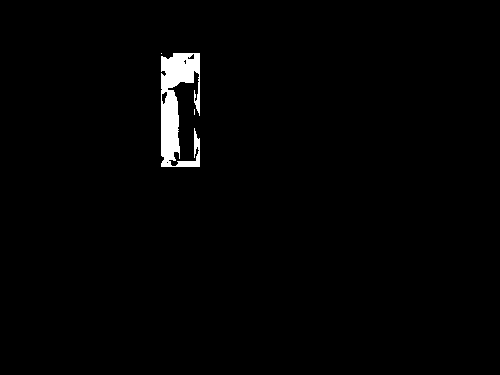

255
Image similarity: 0.9188073186941652


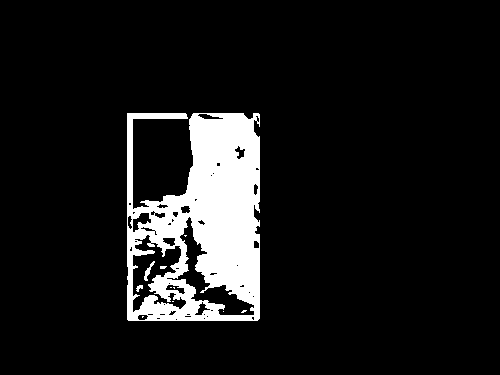

255
Image similarity: 0.9114724776232306


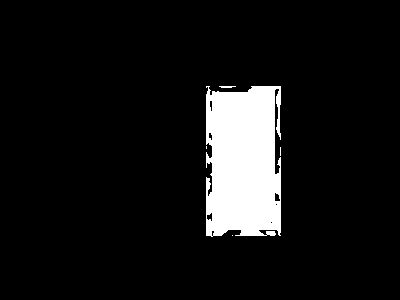

255
Image similarity: 0.9688313397905076


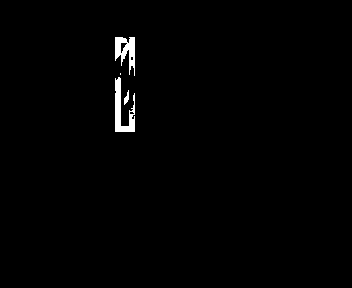

255
Image similarity: 0.9740315501177075


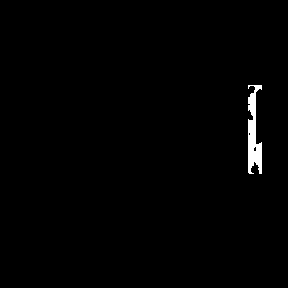

255
Image similarity: 0.9697181560561706


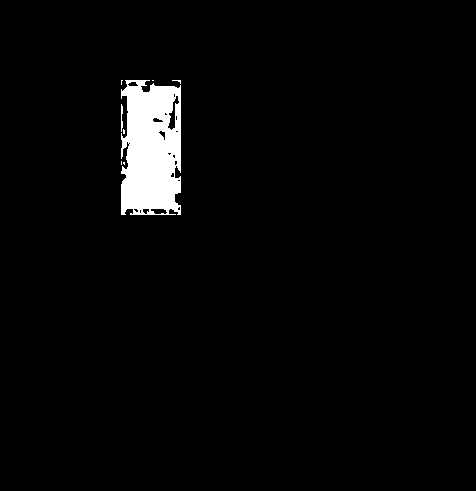

255
Image similarity: 0.9058514205719731


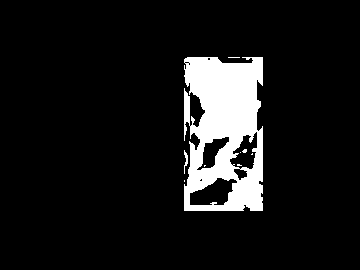

255
Image similarity: 0.9704188845436623


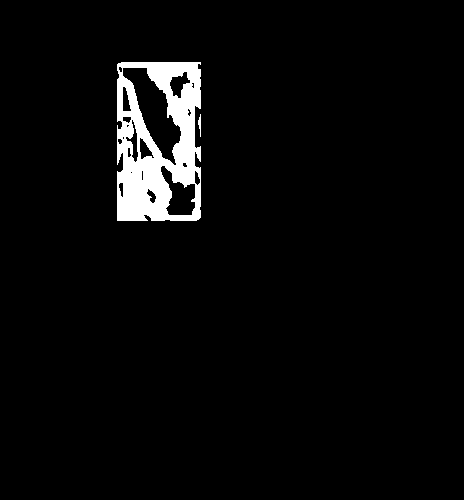

255
Image similarity: 0.9751006779989251


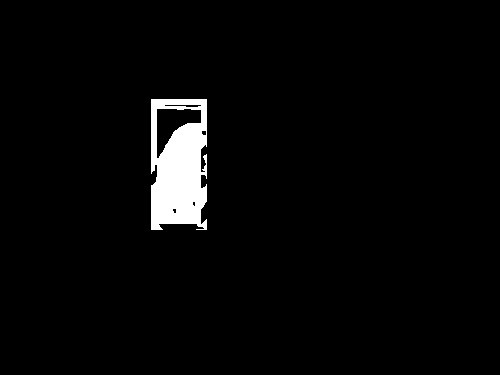

255
Image similarity: 0.9951516891035567


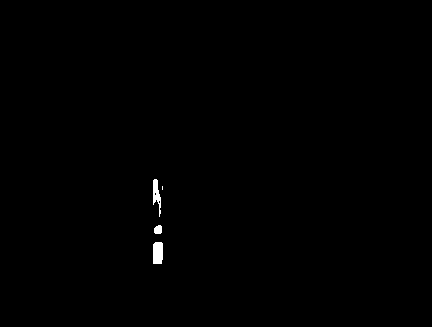

255
Image similarity: 0.940121890783229


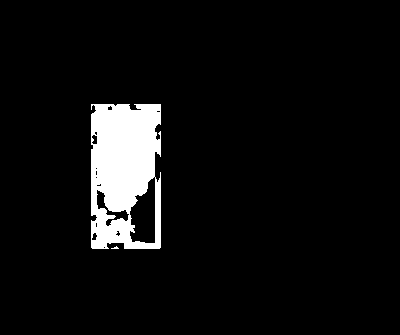

255
Image similarity: 0.8711436272664745


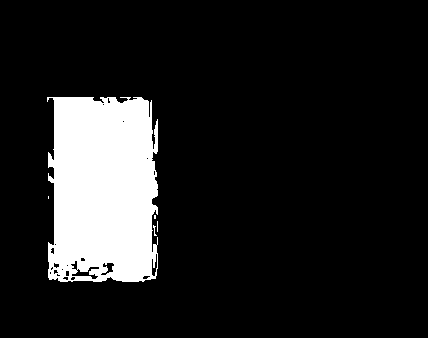

255
Image similarity: 0.6953915326129333


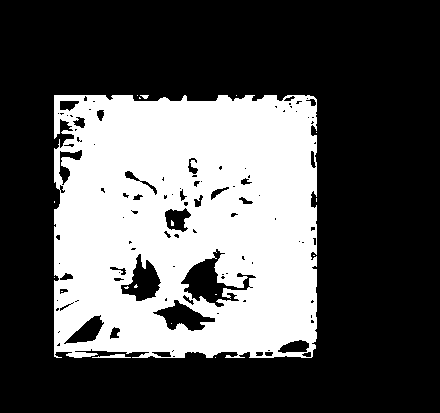

255
Image similarity: 0.9647263582295621


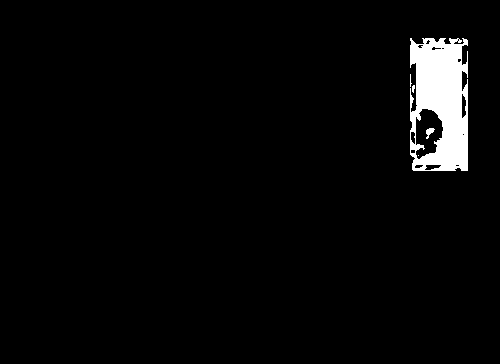

255
Image similarity: 0.9501077088737123


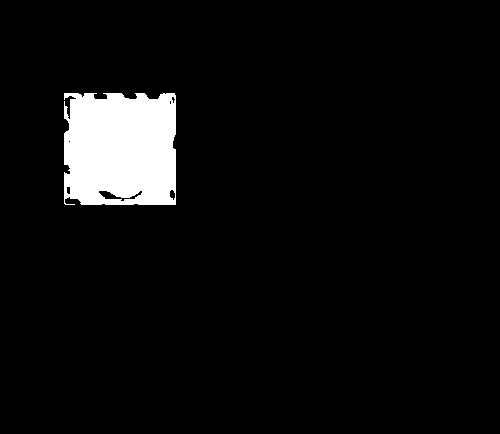

255
Image similarity: 0.9358888078567289


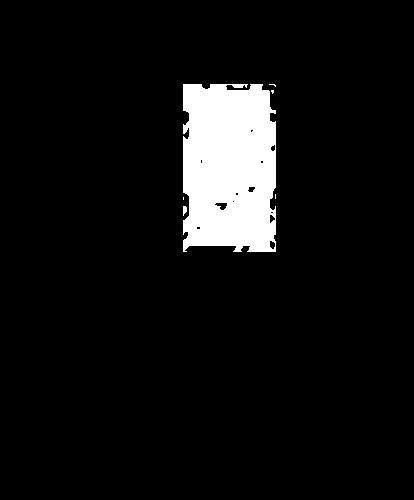

255
Image similarity: 0.9112272887527296


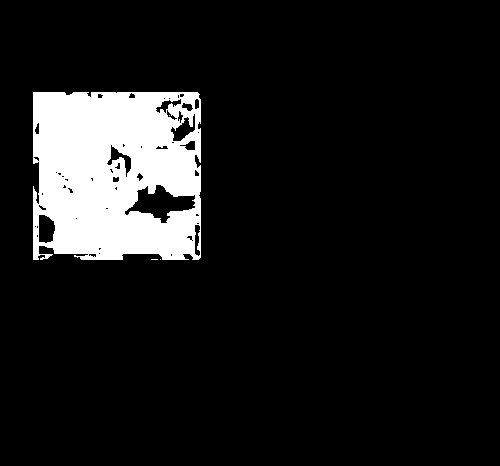

255
Image similarity: 0.9234458014655872


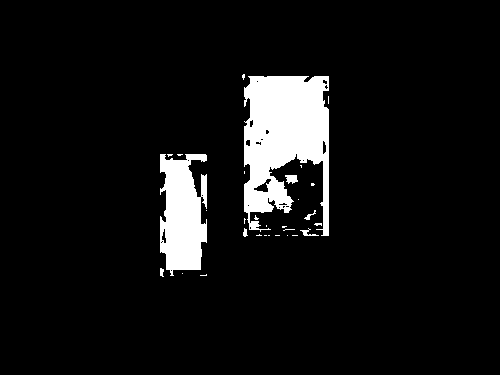

255
Image similarity: 0.9504716505834163


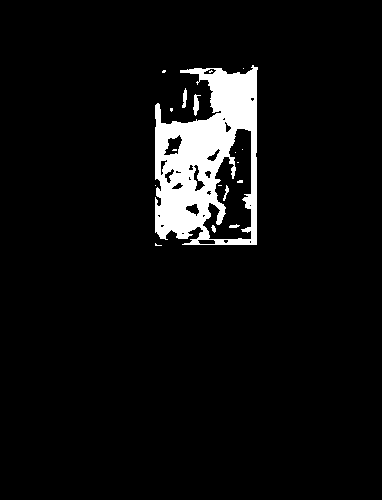

255
Image similarity: 0.9847090223326035


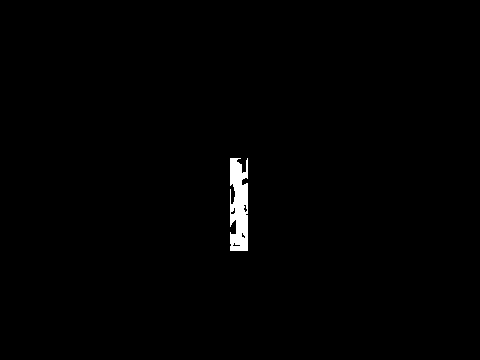

255
Image similarity: 0.9875876525876944


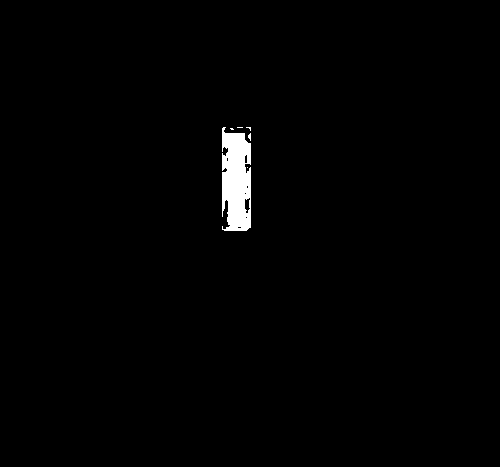

255
Image similarity: 0.9579366857212402


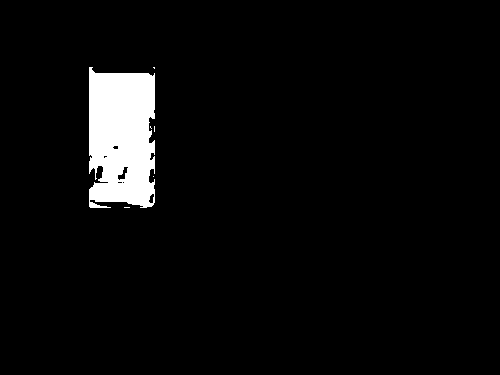

255
Image similarity: 0.9735413201138756


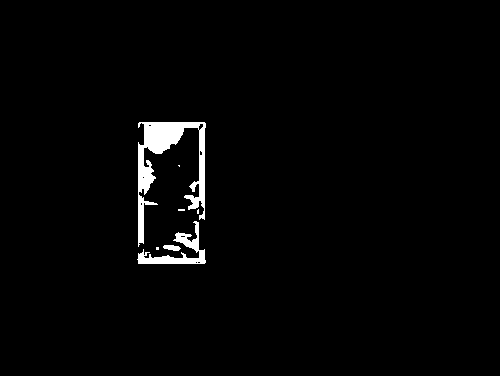

255
Image similarity: 0.9940974689747814


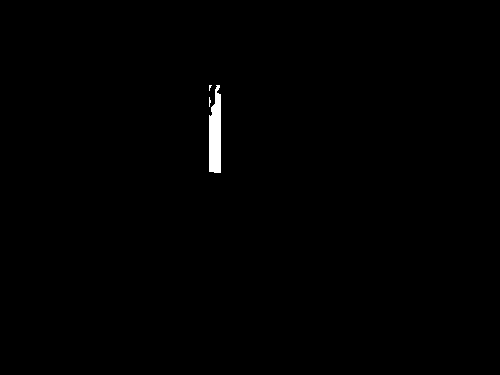

255
Image similarity: 0.6293674183469139


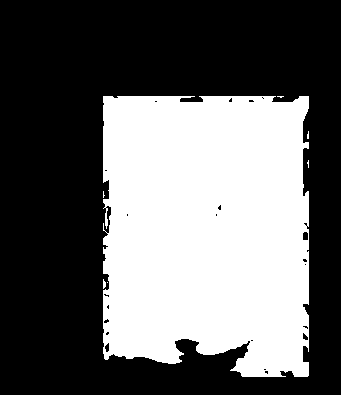

255
Image similarity: 0.9770264637072119


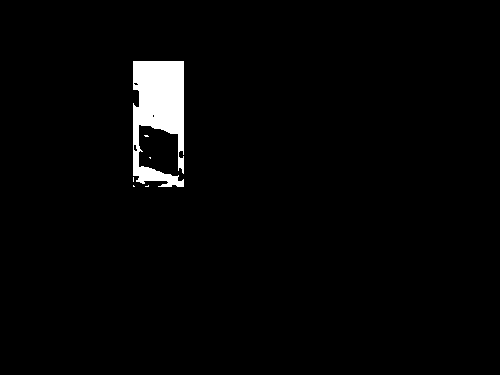

255
Image similarity: 0.9555308601442944


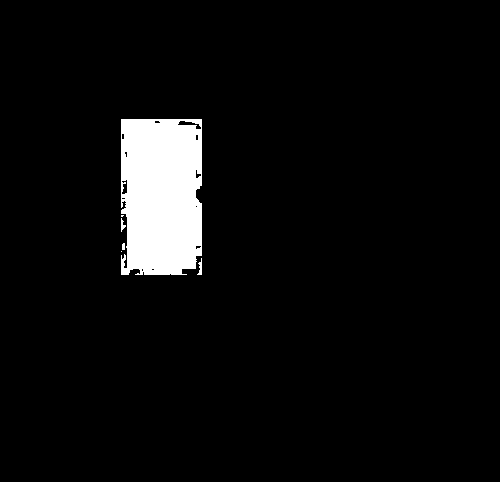

255
Image similarity: 0.9424153157015385


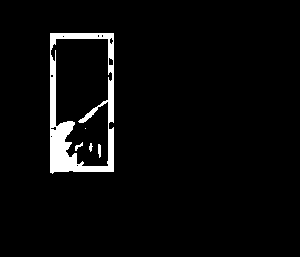

255
Image similarity: 0.9451216157886598


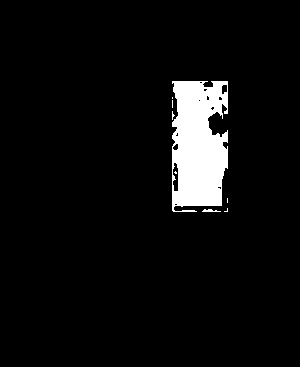

255
Image similarity: 0.8701047989496168


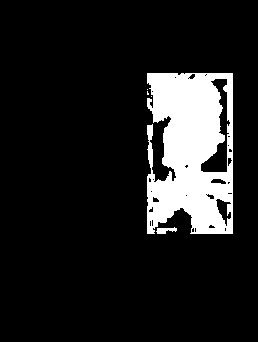

255
Image similarity: 0.9901011769689507


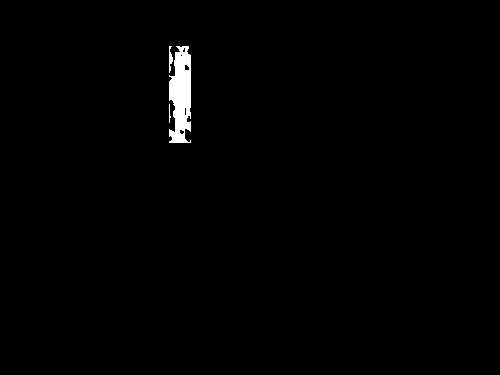

255
Image similarity: 0.9348134242089581


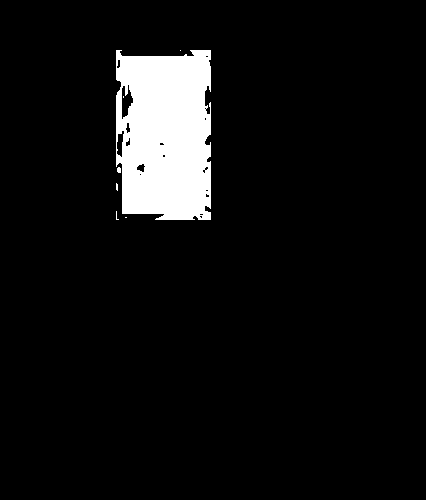

255
Image similarity: 0.9944471514904456


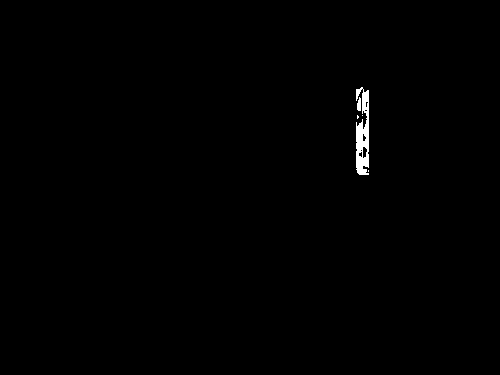

255
Image similarity: 0.928734513885905


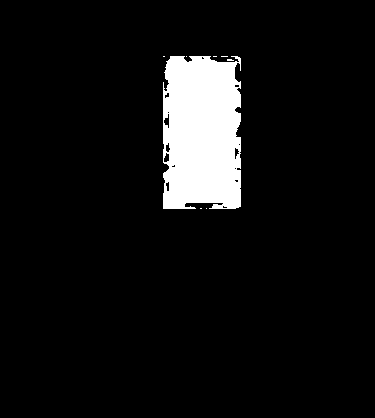

255
Image similarity: 0.9463772629519586


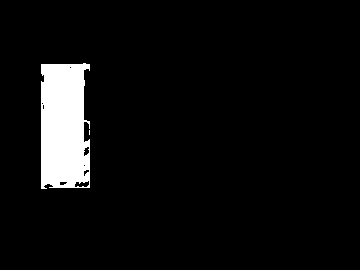

255
Image similarity: 0.8704469896792492


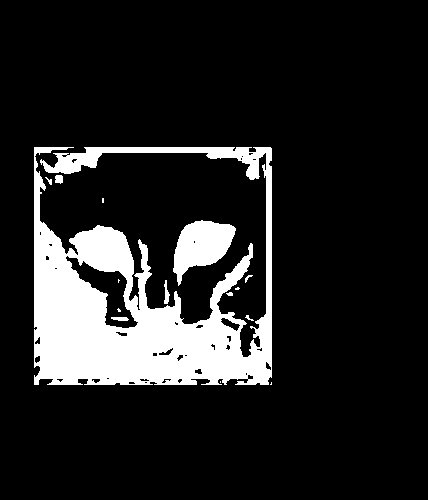

255
Image similarity: 0.9925845995743419


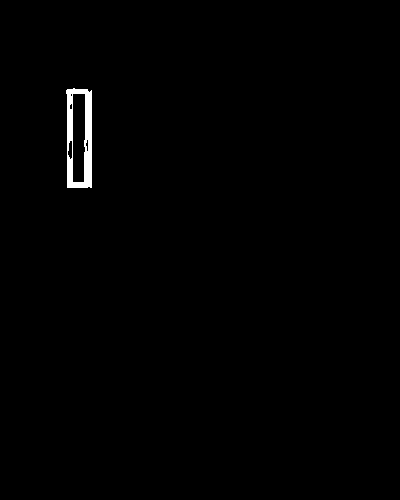

255
Image similarity: 0.9936360379797651


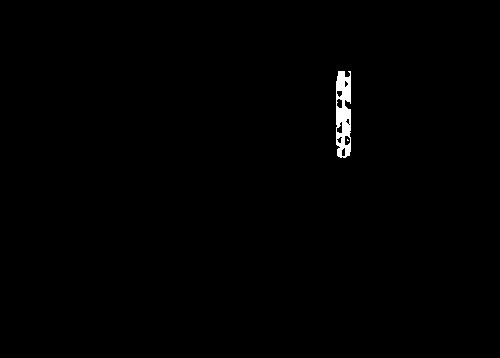

255
Image similarity: 0.9600002294244694


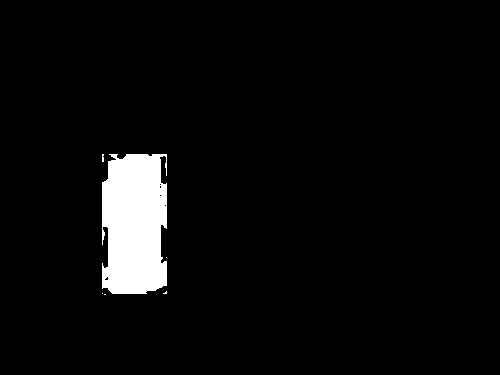

255
Image similarity: 0.9554809721818494


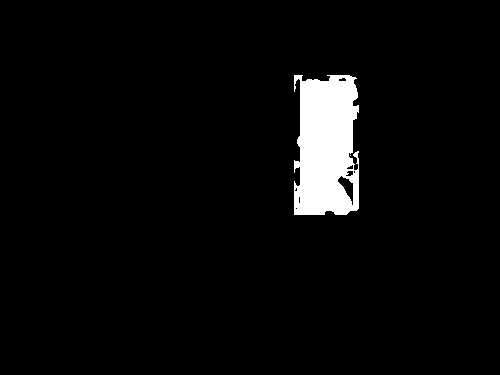

255
Image similarity: 0.9317335097093685


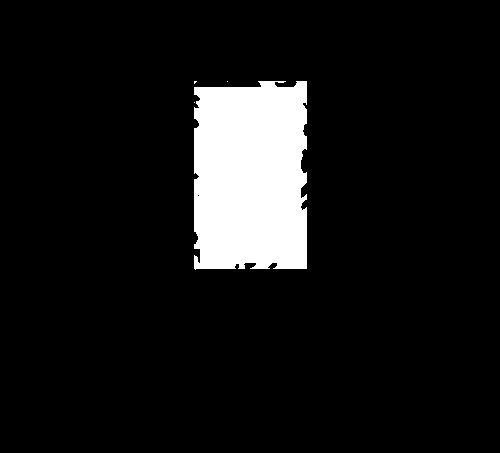

255
Image similarity: 0.9812236479010362


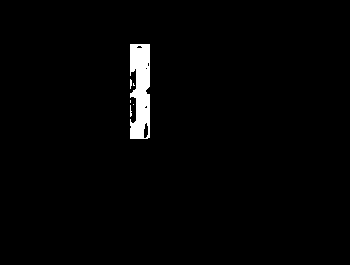

255
Image similarity: 0.9144278237440826


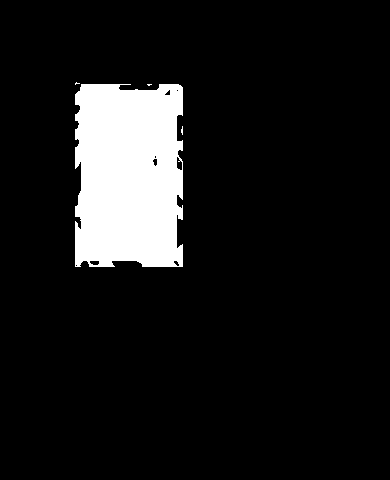

255
Image similarity: 0.8714449689099356


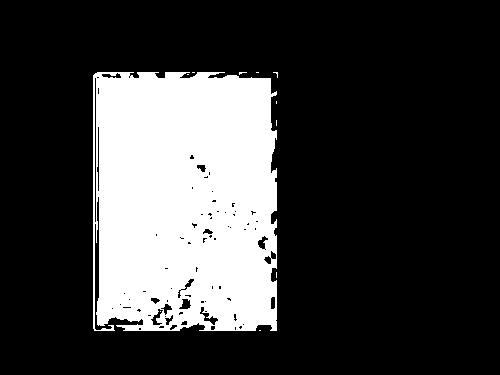

255
Image similarity: 0.9877144653468776


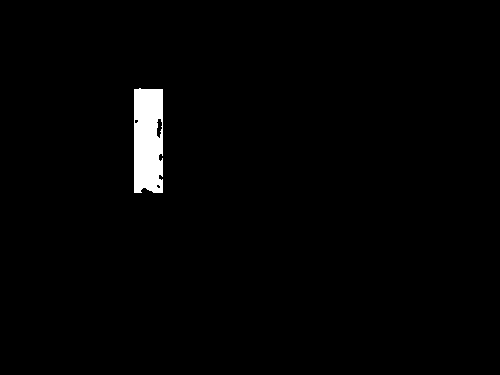

255
Image similarity: 0.9864455413179052


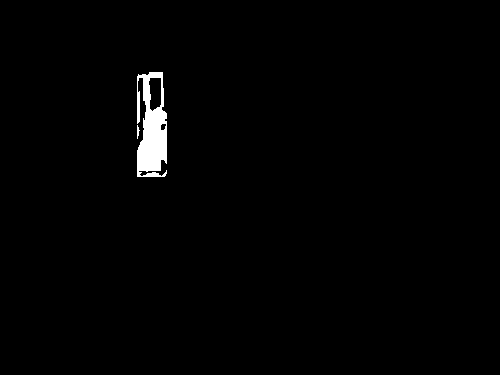

255
Image similarity: 0.9419510723162584


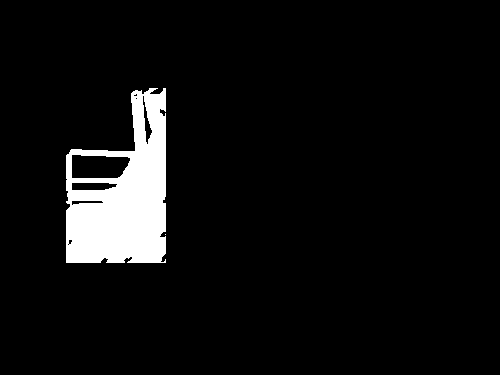

255
Image similarity: 0.9792818366150425


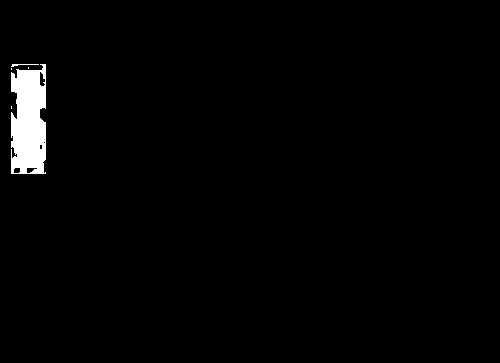

255
Image similarity: 0.9144666719136322


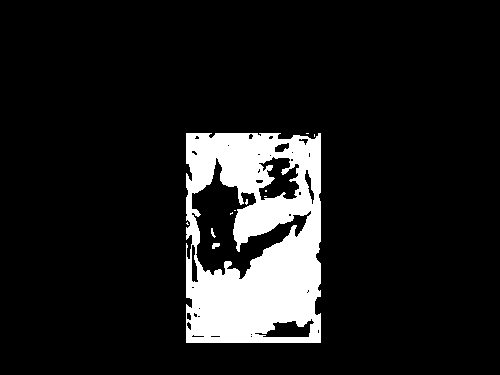

255
Image similarity: 0.9704513829018827


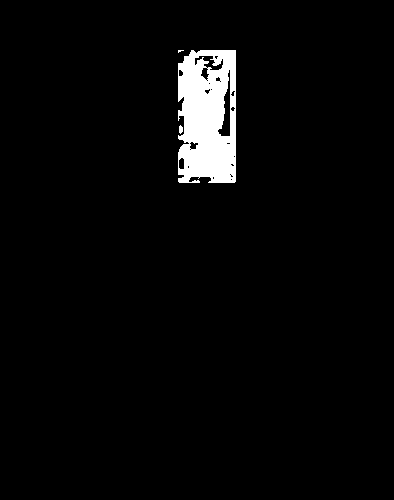

255
Image similarity: 0.9837109404087273


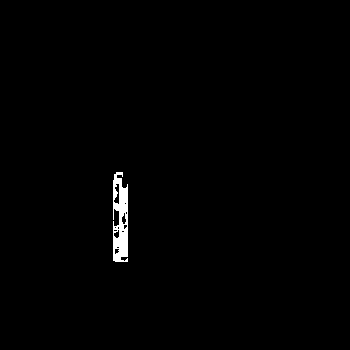

255
Image similarity: 0.9832914210099


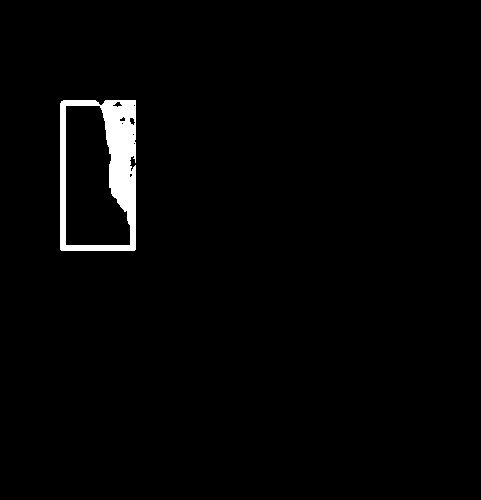

255
Image similarity: 0.8009241042971108


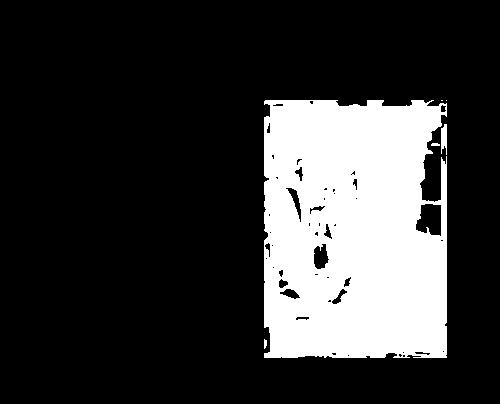

255
Image similarity: 0.8724514816916371


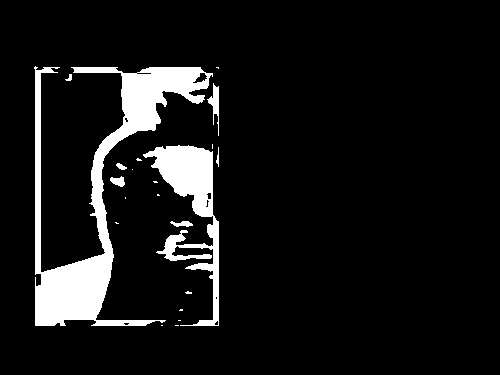

255
Image similarity: 0.9409690248857532


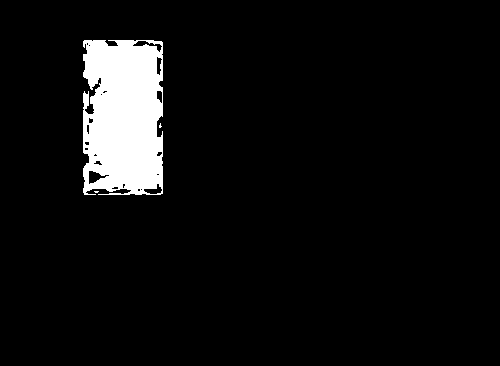

255
Image similarity: 0.8542509919842012


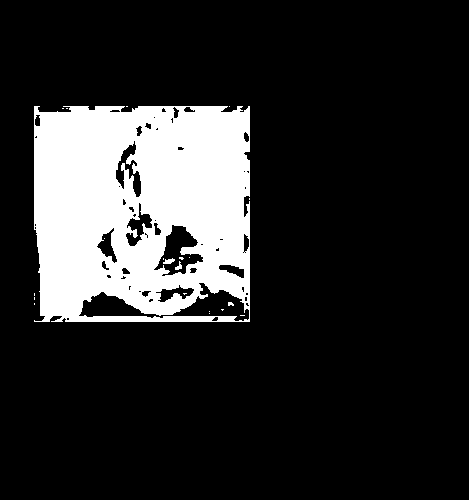

255
Image similarity: 0.9652548807985211


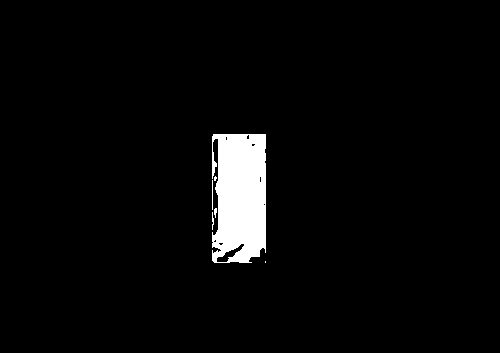

255
Image similarity: 0.98712191182702


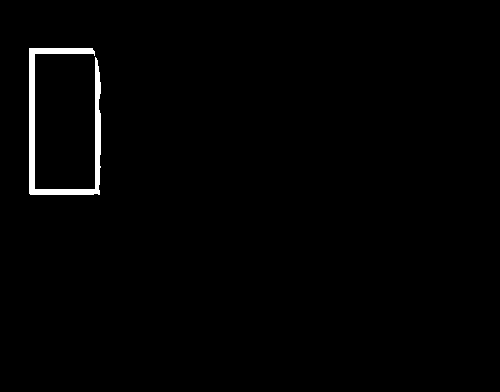

255
Image similarity: 0.9923775728614045


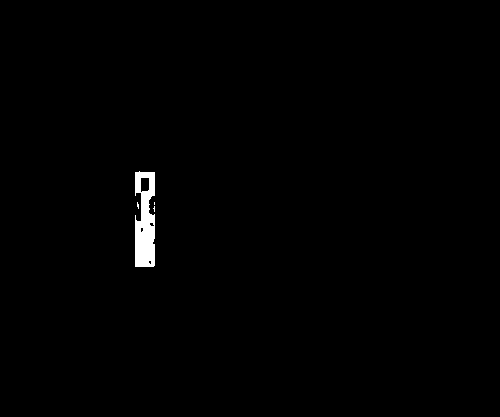

255
Image similarity: 0.9891948377698567


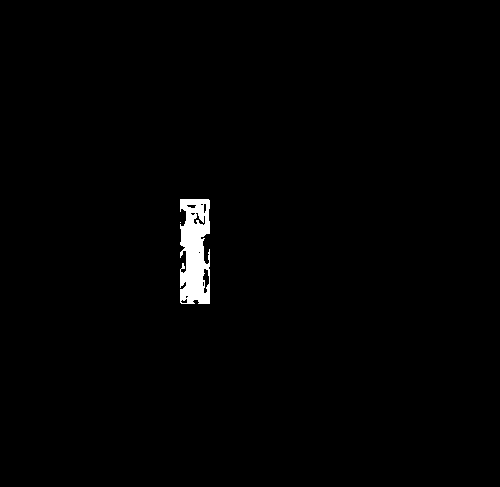

255
Image similarity: 0.7482891973614166


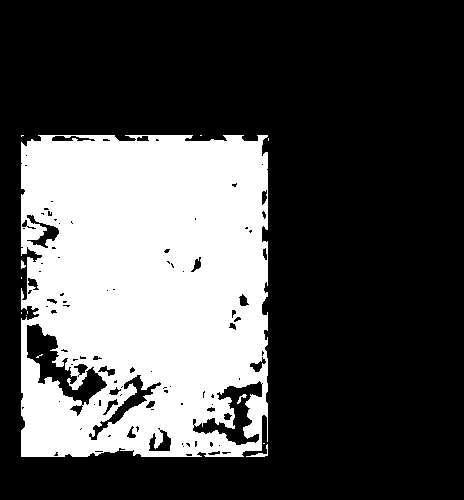

255
Image similarity: 0.8605804264655486


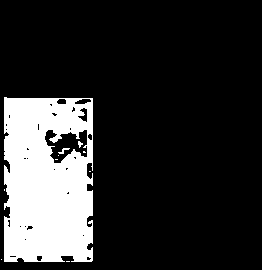

255
Image similarity: 0.9638412039834603


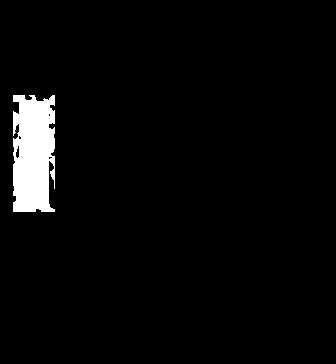

255
Image similarity: 0.8274568692321352


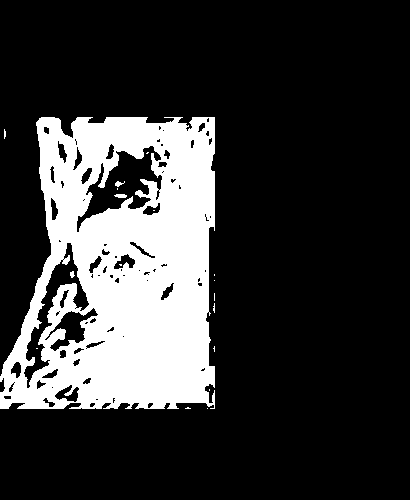

255
Image similarity: 0.8816519326494134


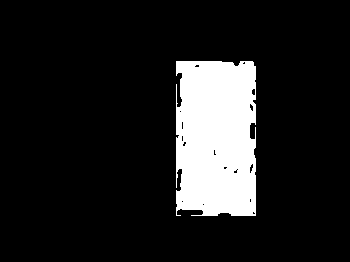

255
Image similarity: 0.9064079309428961


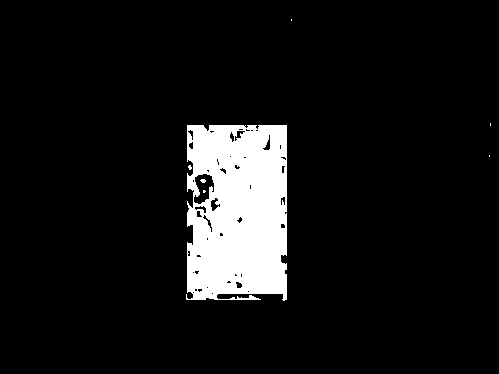

255
Image similarity: 0.9706000187026143


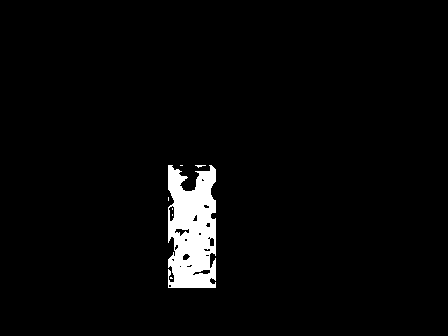

255
Image similarity: 0.9554654683635345


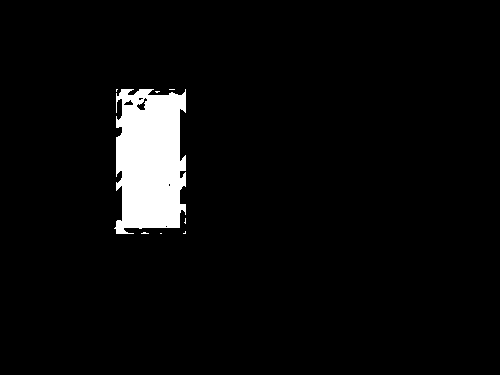

255
Image similarity: 0.9886036217023371


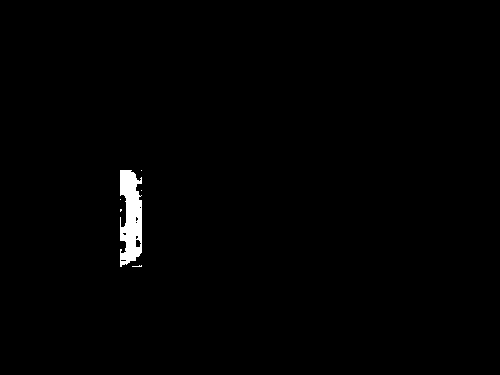

255
Image similarity: 0.9390358798816518


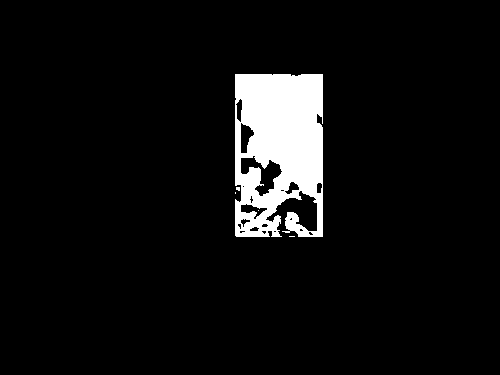

255
Image similarity: 0.9418500777114012


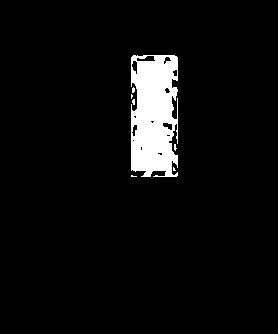

255
Image similarity: 0.9214234210840159


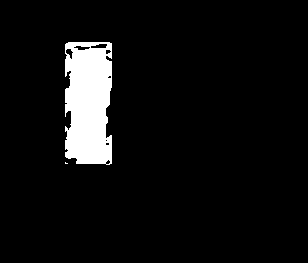

255
Image similarity: 0.994240639117613


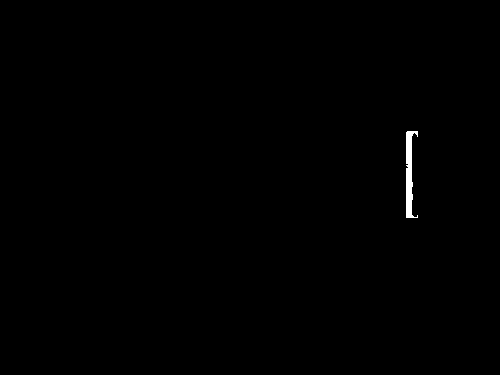

255
Image similarity: 0.9312436106200928


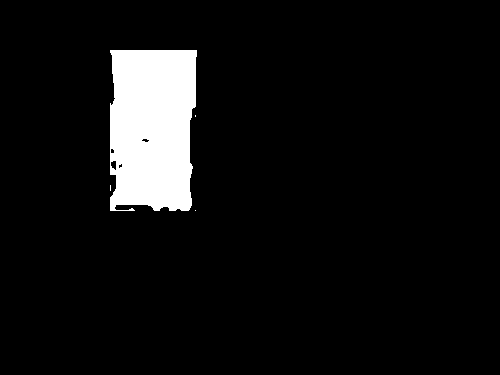

255
Image similarity: 0.981565097871408


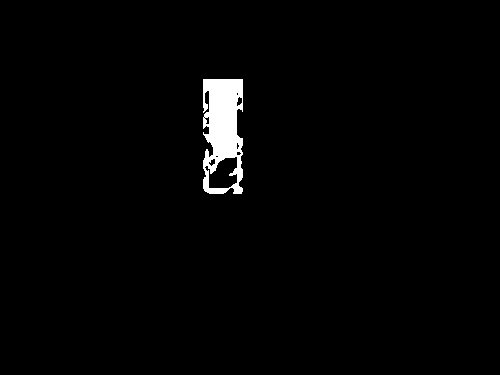

255
Image similarity: 0.9663638773192046


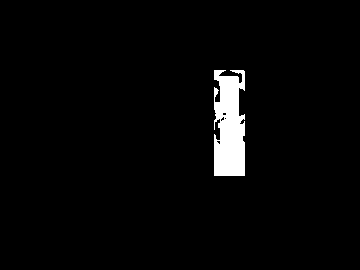

255
Image similarity: 0.9720634828401982


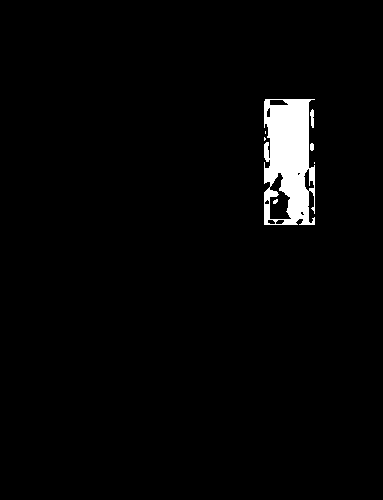

255
Image similarity: 0.9252466423973109


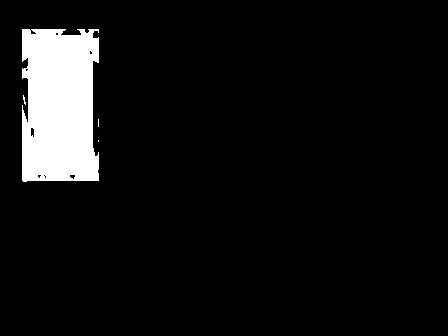

255
Image similarity: 0.7813544101316989


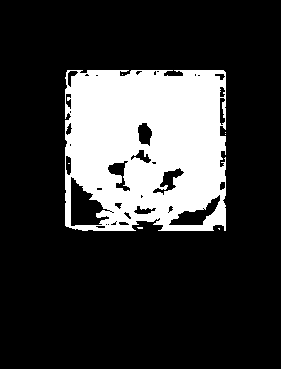

255
Image similarity: 0.9885290577766218


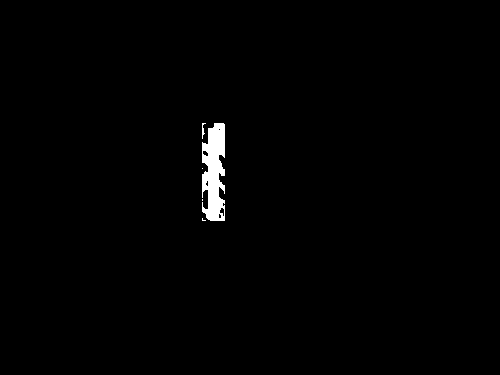

255
Image similarity: 0.9791719613129535


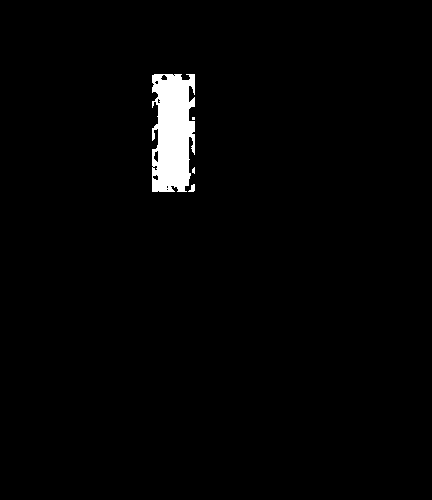

255
Image similarity: 0.9601446312081688


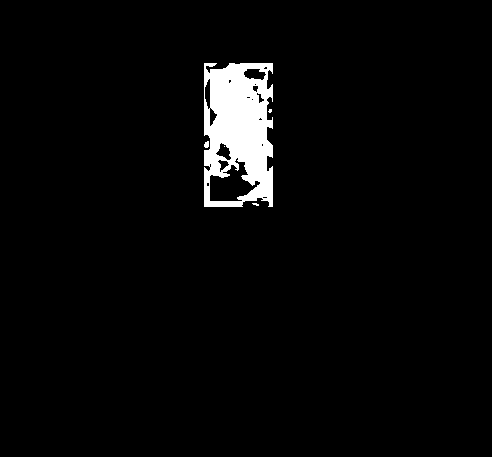

255
Image similarity: 0.973808860072512


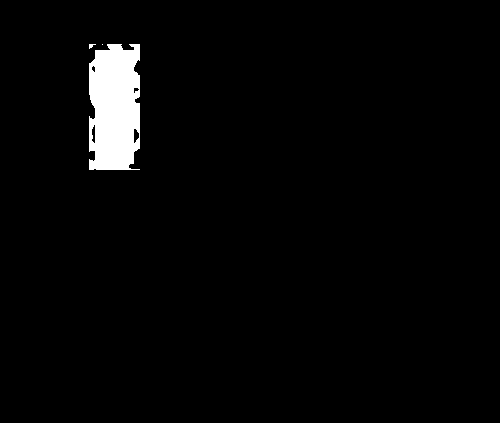

255
Image similarity: 0.9904717508592747


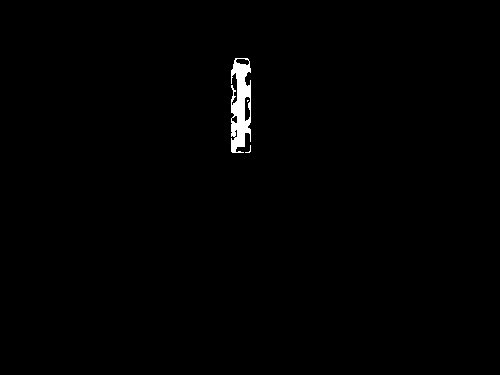

255
Image similarity: 0.7462600738216982


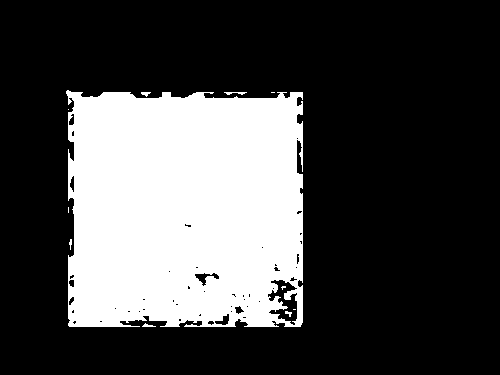

255
Image similarity: 0.9864292325534344


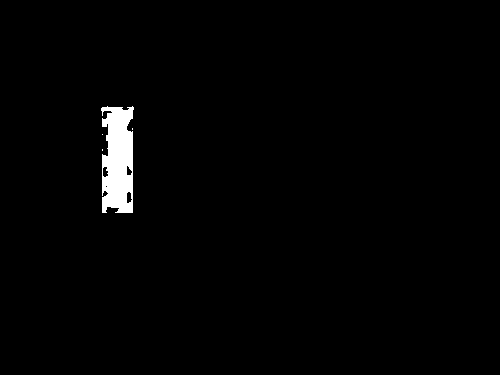

255
Image similarity: 0.9698448198527051


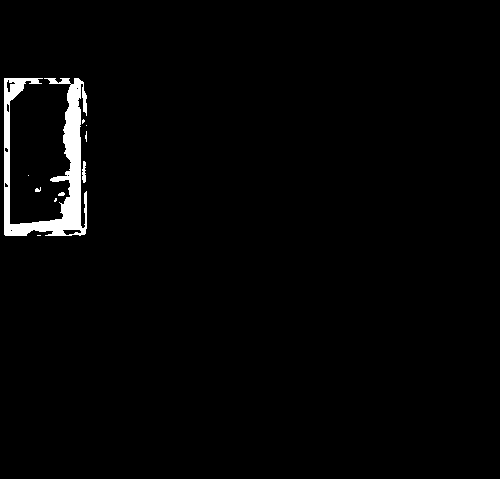

255
Image similarity: 0.8936798582556067


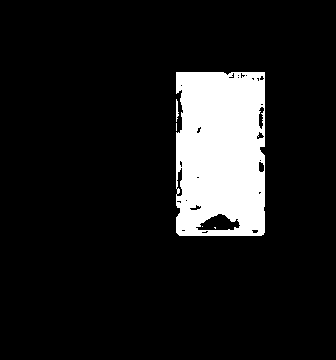

255
Image similarity: 0.9793840455051531


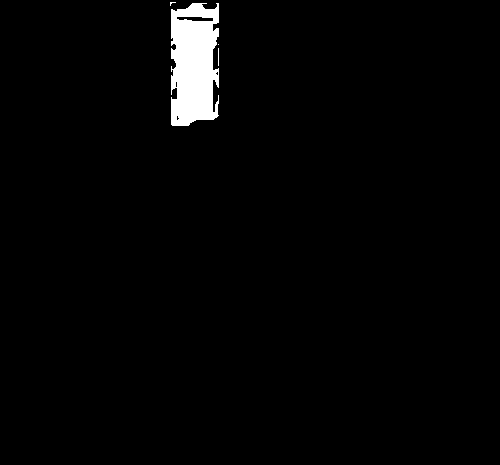

255
Image similarity: 0.9857636049730734


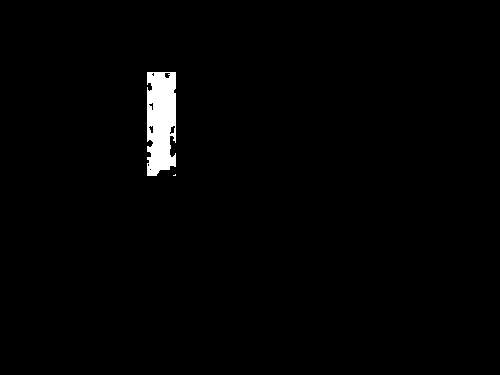

255
Image similarity: 0.946389365858694


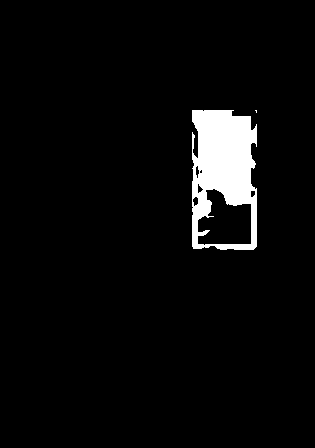

255
Image similarity: 0.8848615314716259


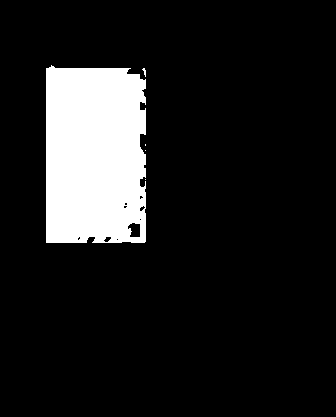

255
Image similarity: 0.9301484728202543


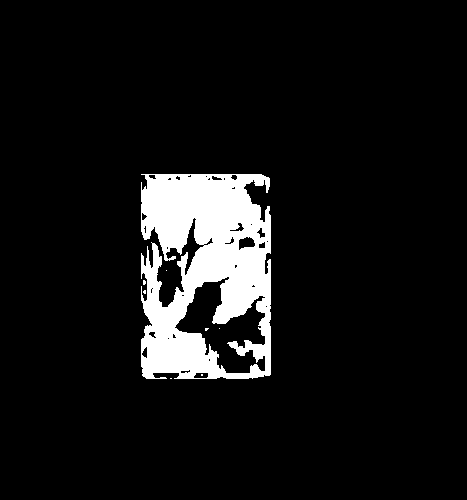

255
Image similarity: 0.8978748908681188


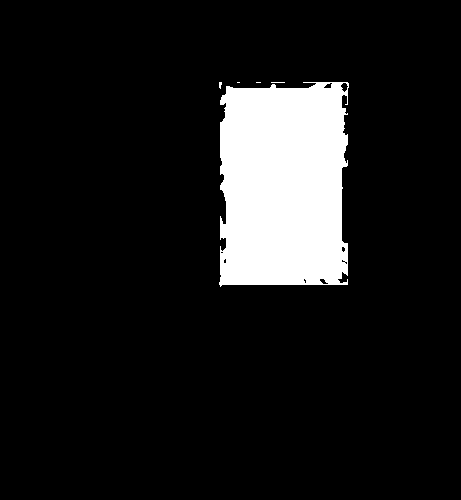

255
Image similarity: 0.9374969054676546


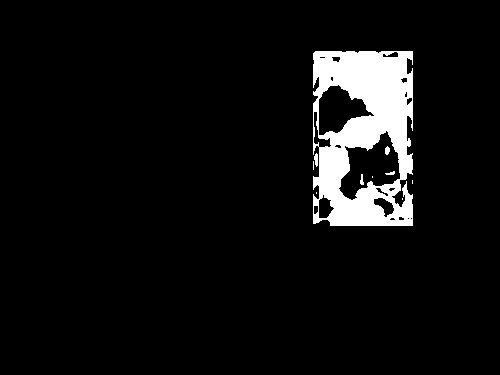

255
Image similarity: 0.9144693353930835


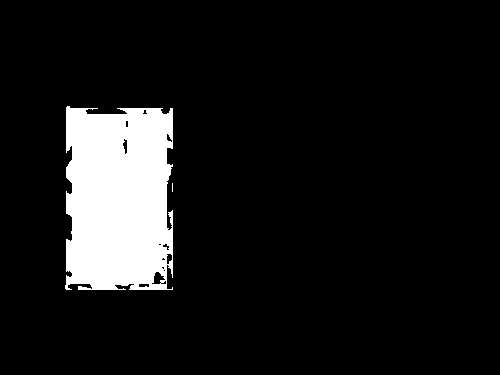

255
Image similarity: 0.9754994655341691


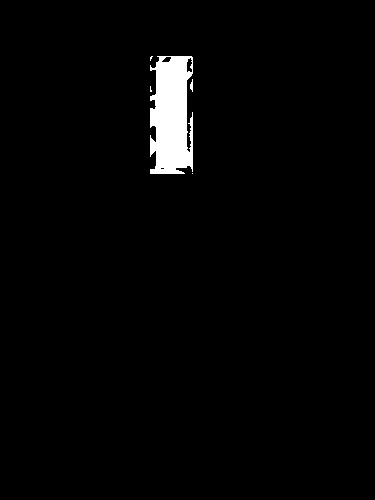

255
Image similarity: 0.9363372285143895


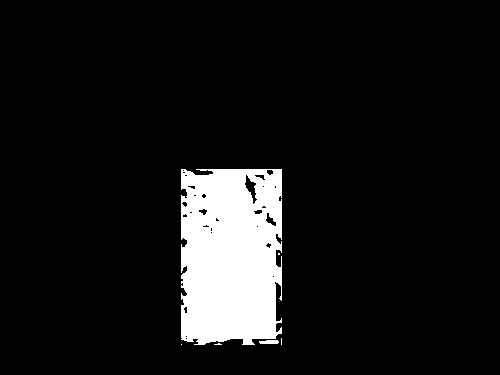

255
Image similarity: 0.9708394741772033


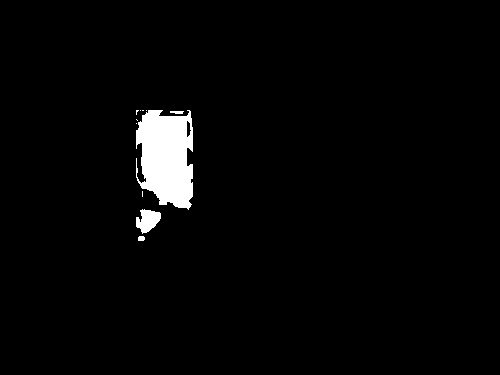

255
Image similarity: 0.947429413289059


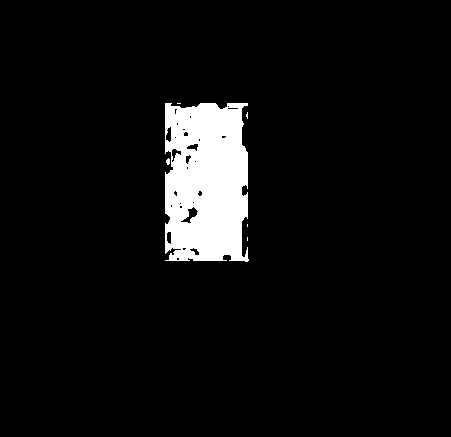

255
Image similarity: 0.9417512592024381


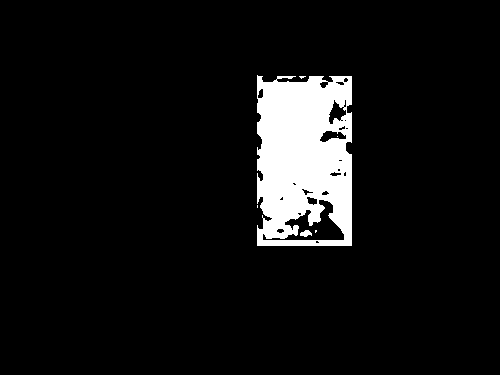

255
Image similarity: 0.9788527284859099


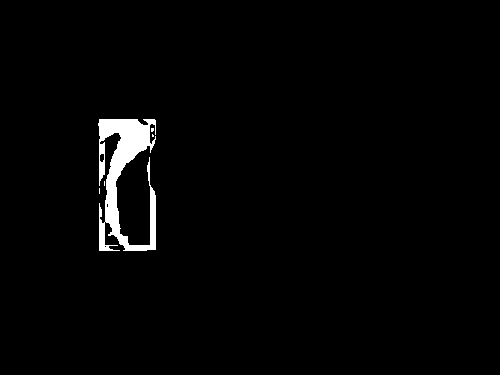

255
Image similarity: 0.9436925978031747


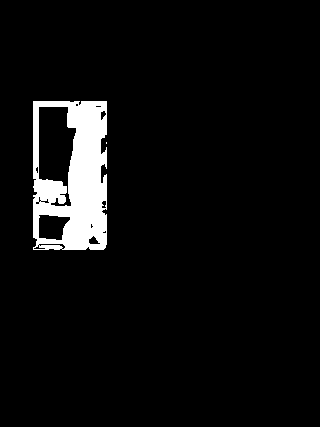

255
Image similarity: 0.8852873069068824


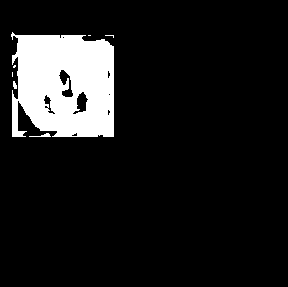

255
Image similarity: 0.9922358632490784


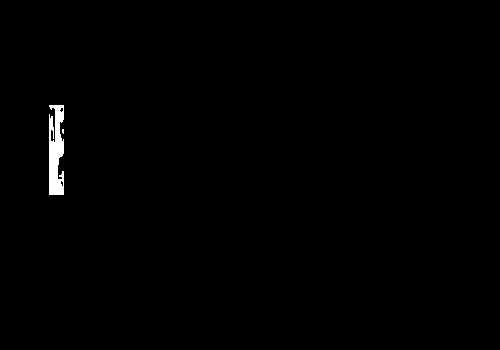

255
Image similarity: 0.9861203243292082


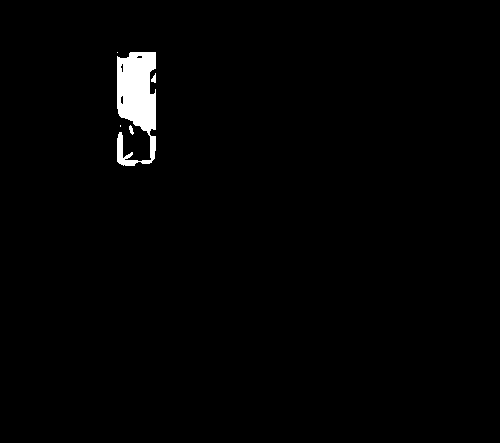

255
Image similarity: 0.9840433596052526


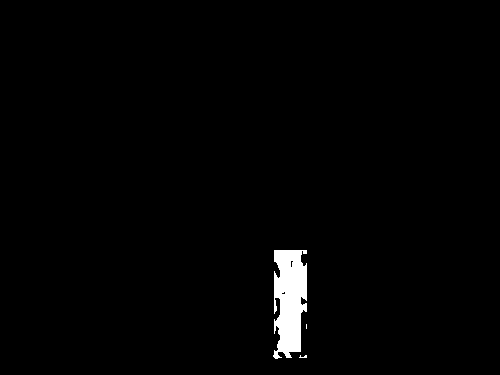

255
Image similarity: 0.9179060509424198


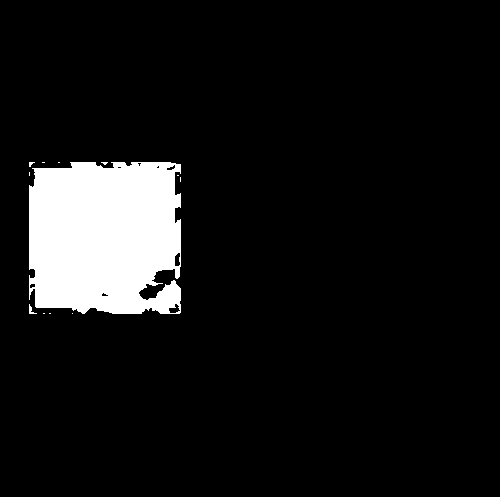

255
Image similarity: 0.9717369342676418


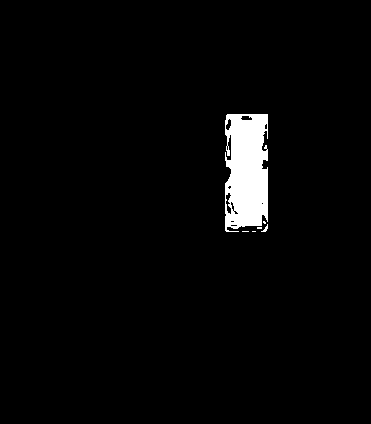

255
Image similarity: 0.990773294414975


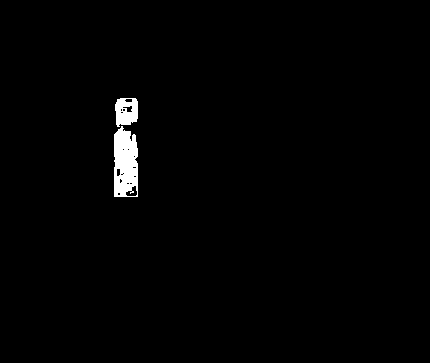

255
Image similarity: 0.9895730323978775


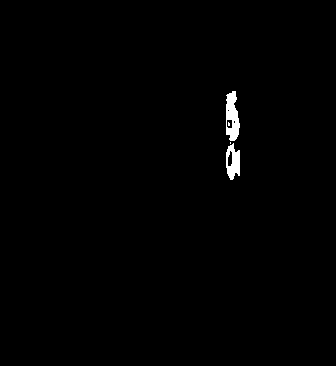

255
Image similarity: 0.9707176694090812


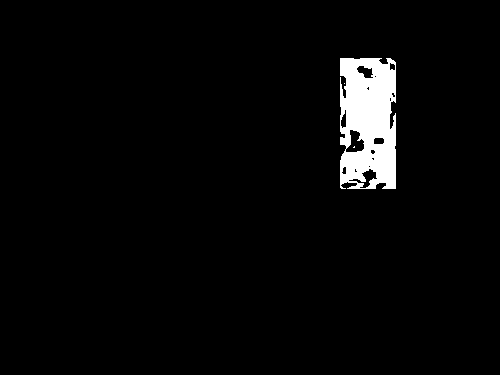

255
Image similarity: 0.9895764742597531


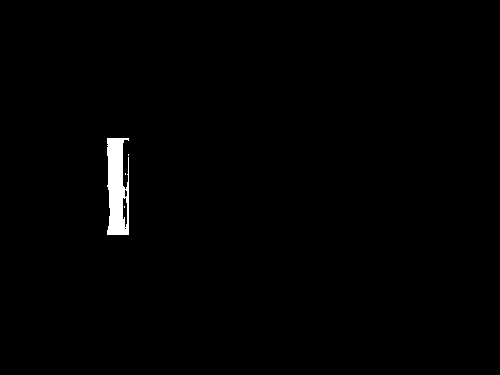

255
Image similarity: 0.9343545197631985


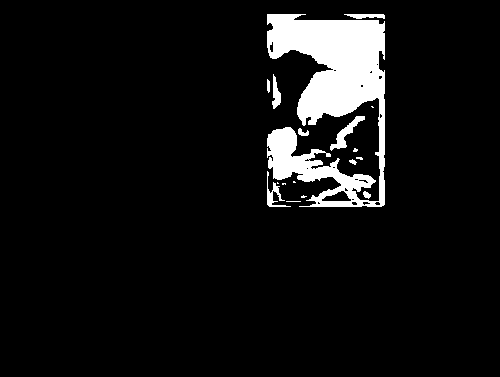

255
Image similarity: 0.8733120464445169


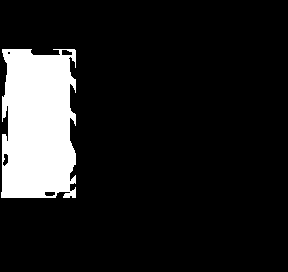

255
Image similarity: 0.8963612290546613


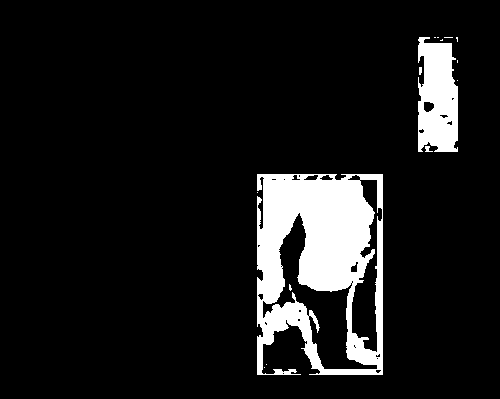

255
Image similarity: 0.7989361166081991


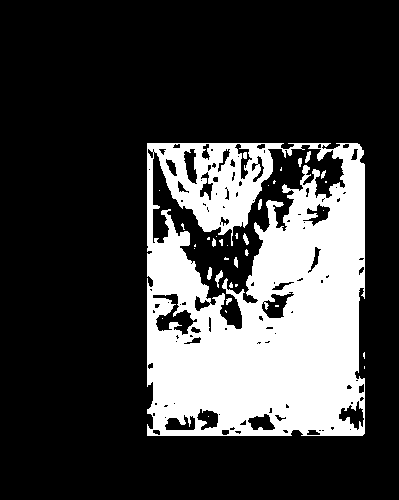

255
Image similarity: 0.9797084425556257


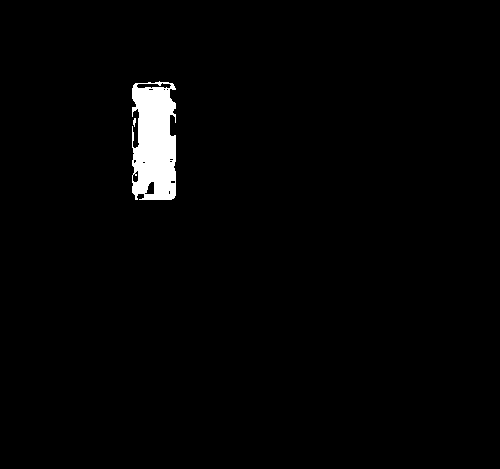

255
Image similarity: 0.9616567984268124


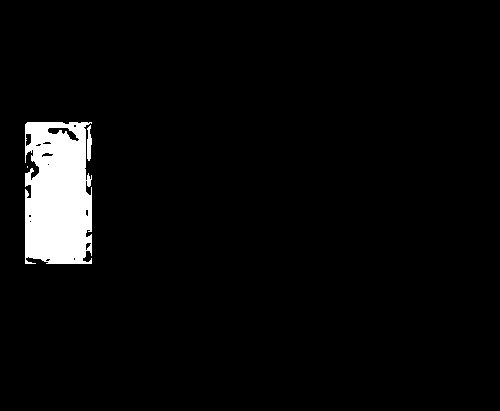

255
Image similarity: 0.9180949397466253


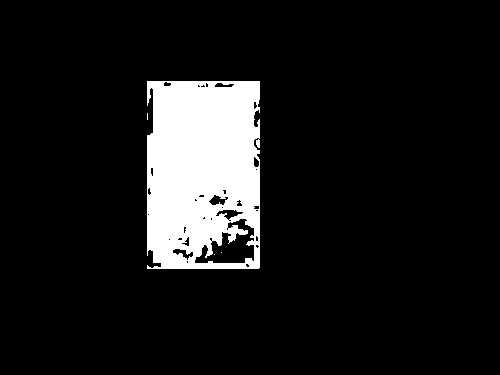

255
Image similarity: 0.9792562788154371


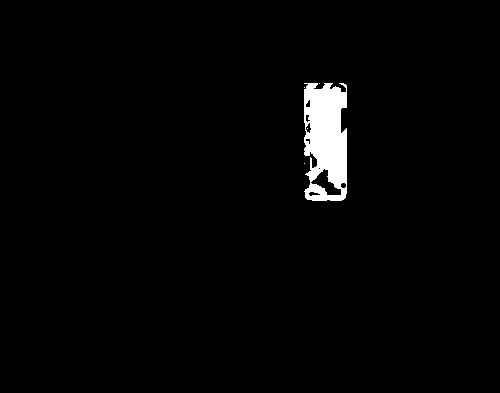

255
Image similarity: 0.953988224290123


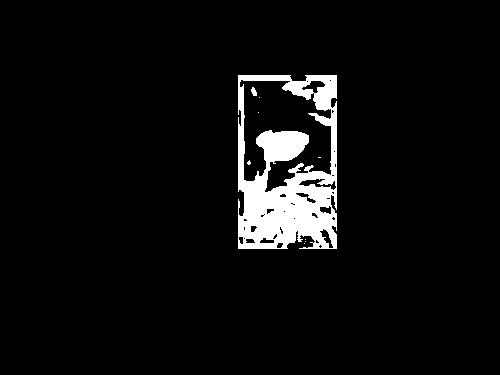

255
Image similarity: 0.9918858911310576


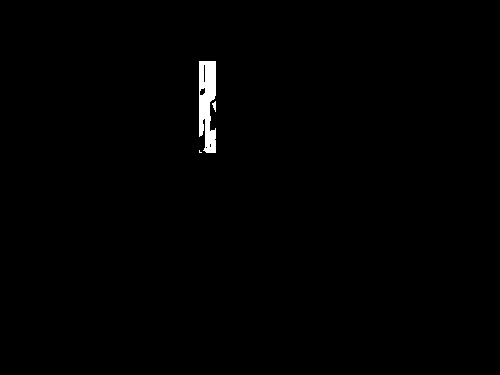

255
Image similarity: 0.8912790610969806


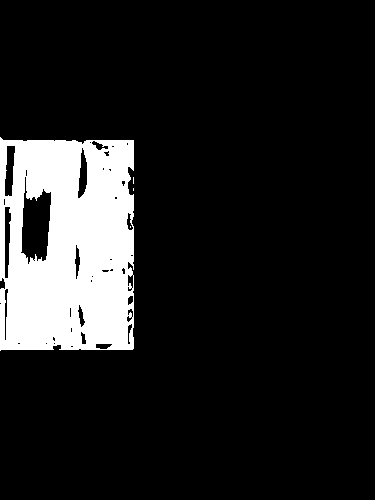

255
Image similarity: 0.9914122312146699


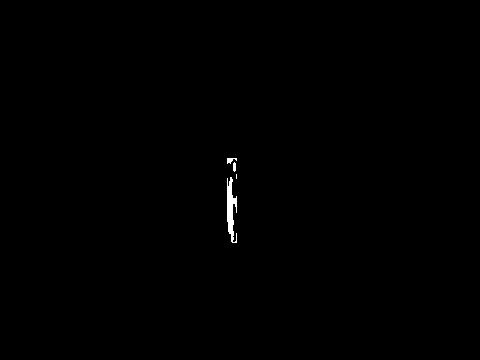

255
Image similarity: 0.9645392151636184


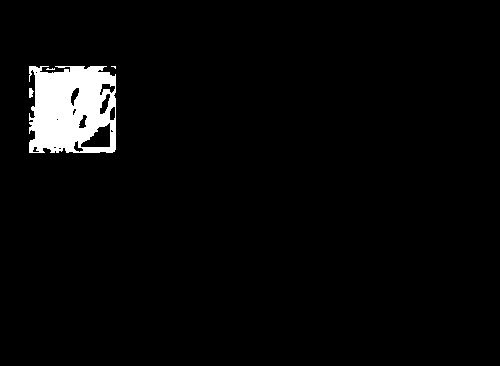

255
Image similarity: 0.9056509785455008


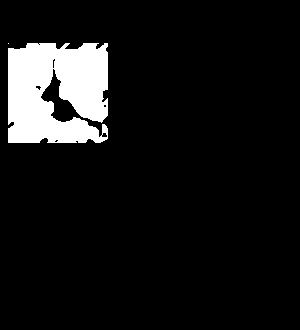

255
Image similarity: 0.9411371974695332


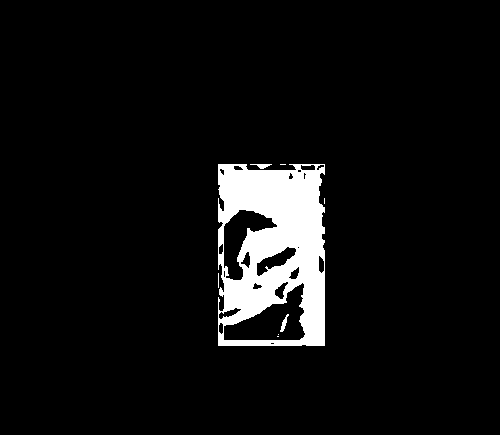

255
Image similarity: 0.8959705116718806


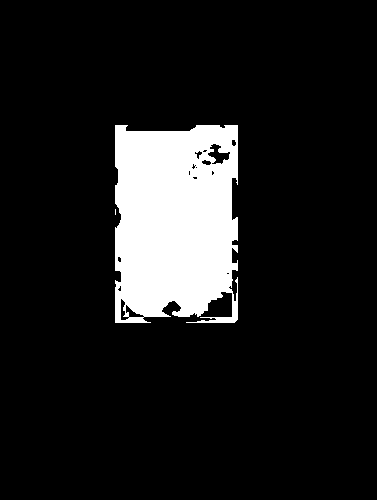

255
Image similarity: 0.9038185301134538


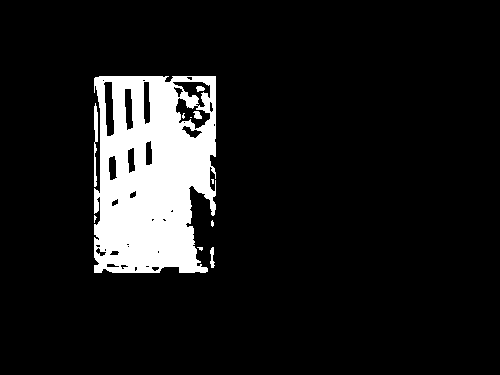

255
Image similarity: 0.9847529766660604


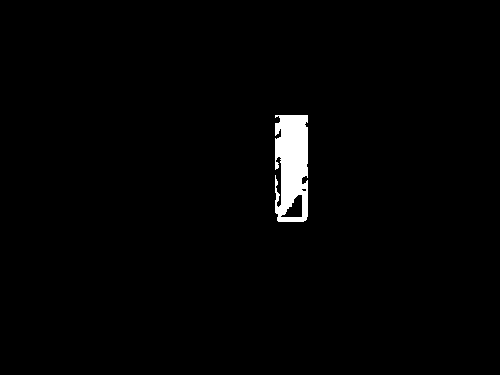

255
Image similarity: 0.9804129910551812


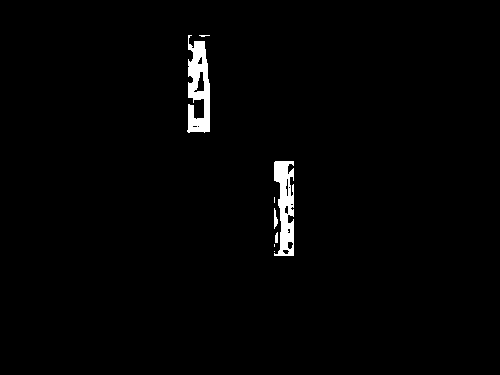

255
Image similarity: 0.9185777098375424


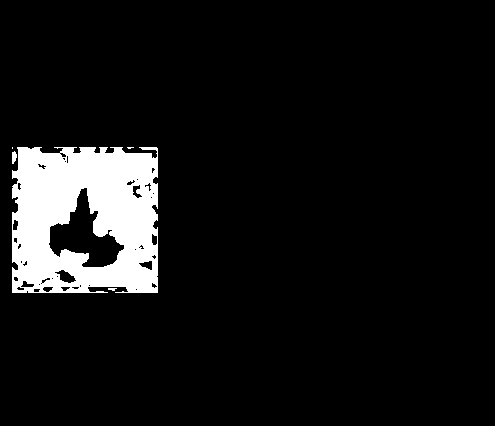

255
Image similarity: 0.9293702495096475


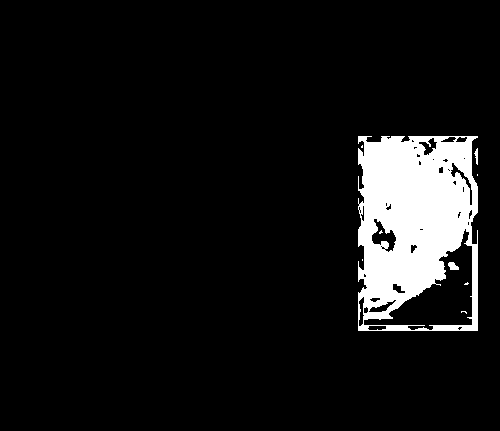

255
Image similarity: 0.9009975459387938


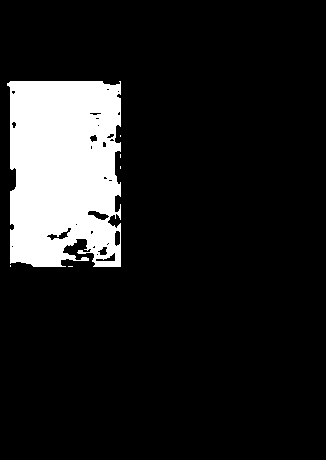

255
Image similarity: 0.9623468029118357


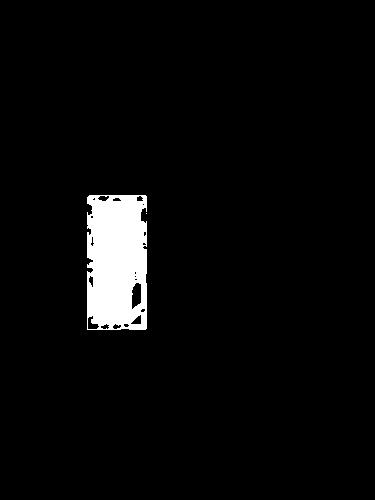

255
Image similarity: 0.9913467835797481


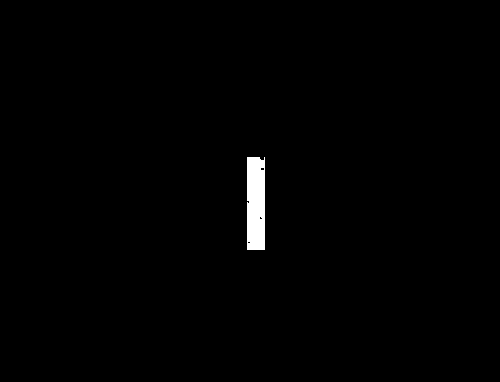

255
Image similarity: 0.95833545103073


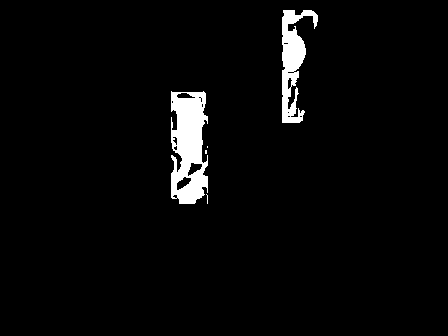

255
Image similarity: 0.9669391140916284


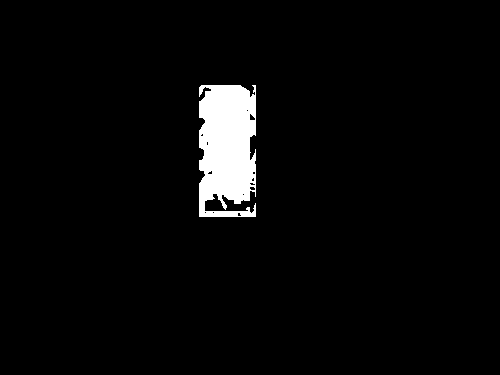

255
Image similarity: 0.9526151850899855


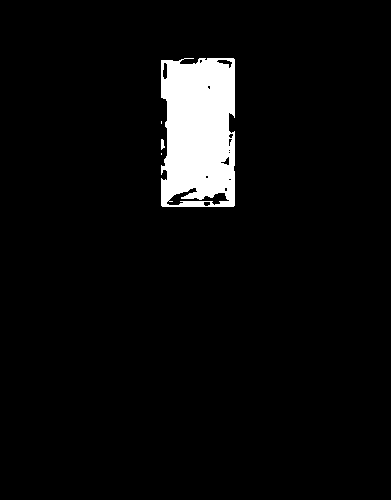

255
Image similarity: 0.9403545347564523


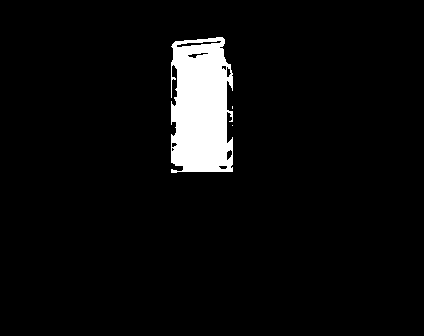

255
Image similarity: 0.9635079704673154


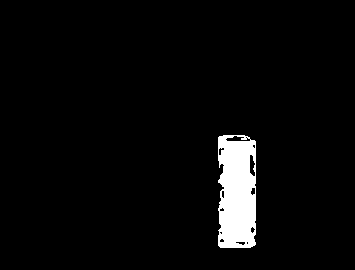

255
Image similarity: 0.9082310557893095


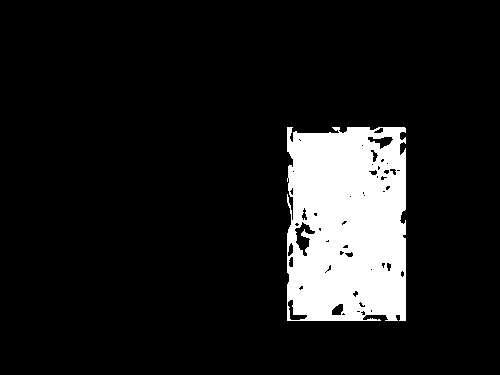

255
Image similarity: 0.9372371753776965


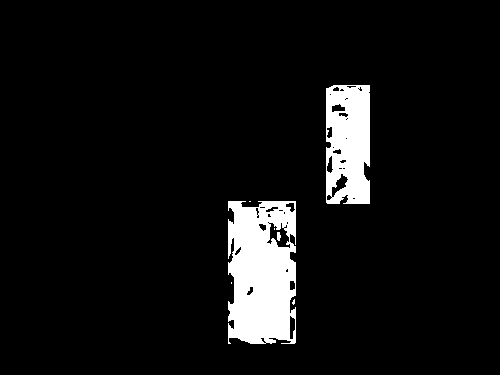

255
Image similarity: 0.7927906088689247


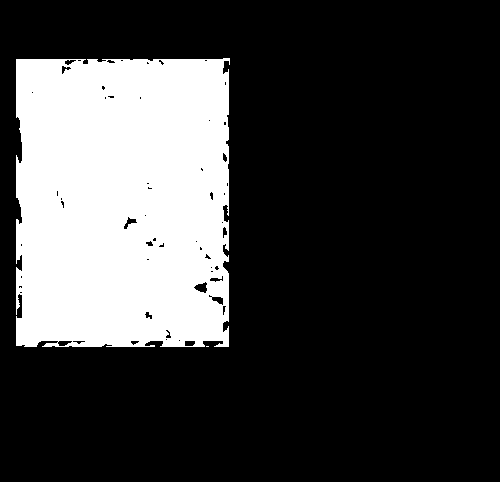

255
Image similarity: 0.9470639234305083


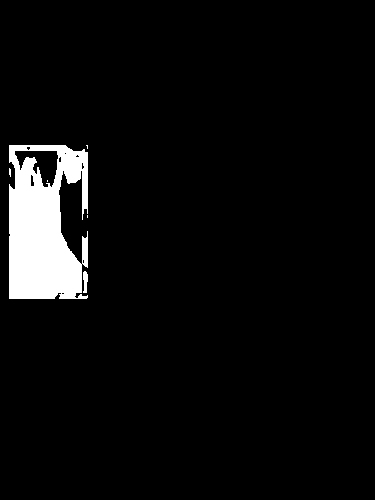

255
Image similarity: 0.9467933944735503


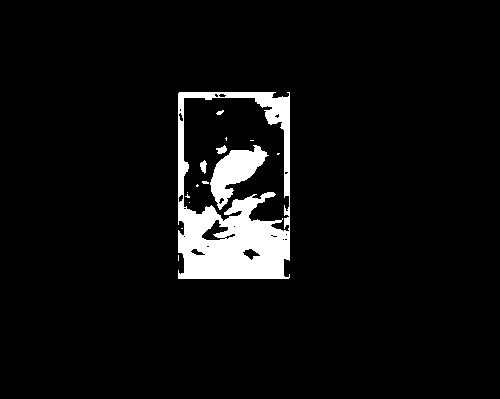

255
Image similarity: 0.8197251435615112


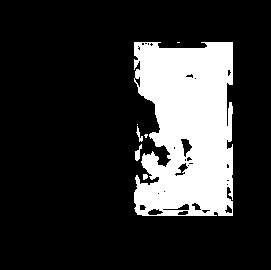

255
Image similarity: 0.9750259657211868


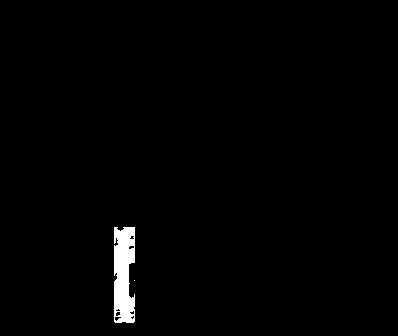

255
Image similarity: 0.7781643771690404


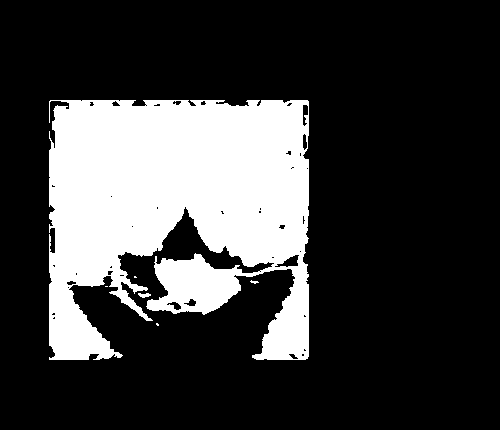

255
Image similarity: 0.8660976856120362


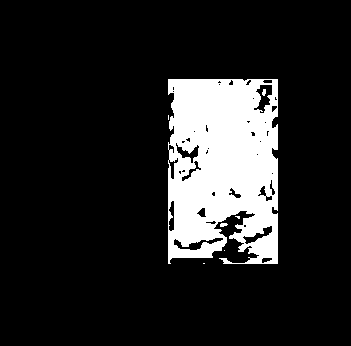

255
Image similarity: 0.9866212818541442


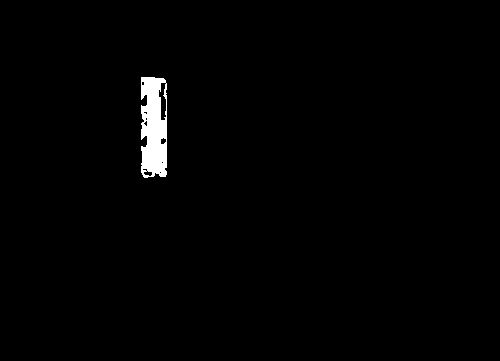

255
Image similarity: 0.9722033854270526


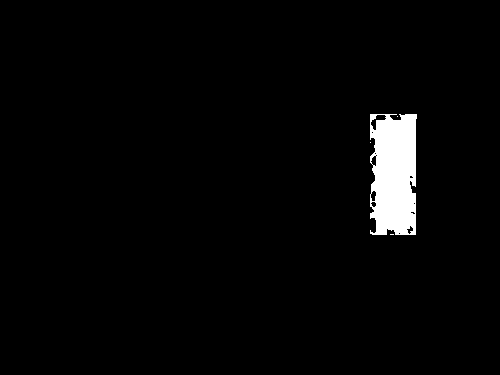

255
Image similarity: 0.9085887345827424


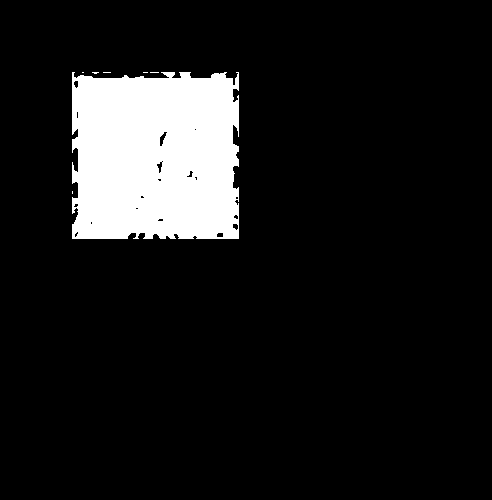

255
Image similarity: 0.9438340671166775


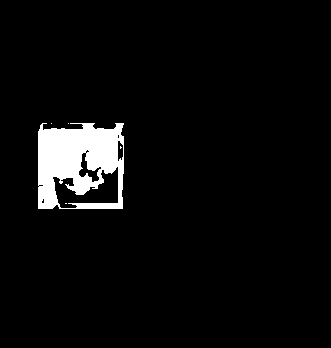

255
Image similarity: 0.9859718668909899


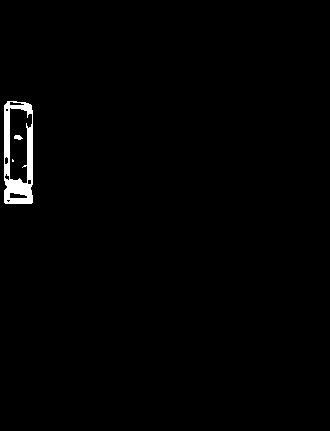

255
Image similarity: 0.8431098331460685


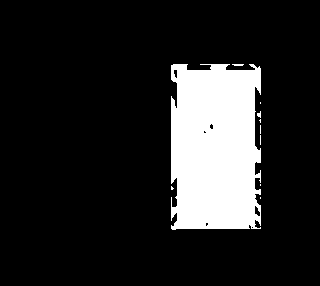

255
Image similarity: 0.9673258106080237


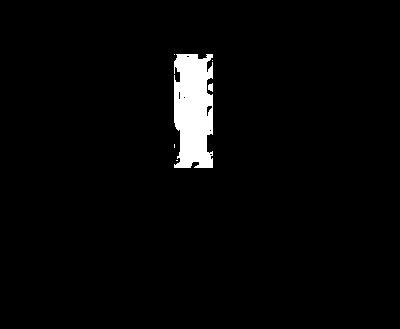

255
Image similarity: 0.9631228080947025


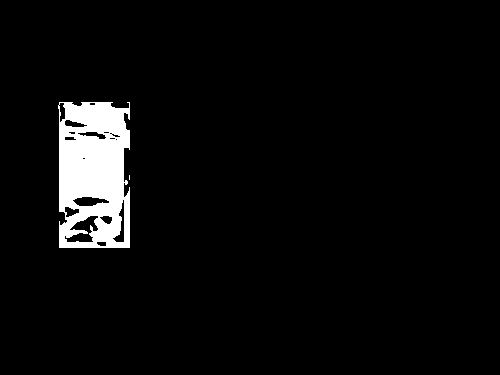

255
Image similarity: 0.9197438146949709


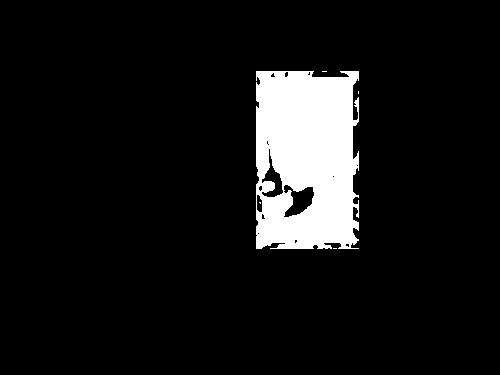

255
Image similarity: 0.9834408513939303


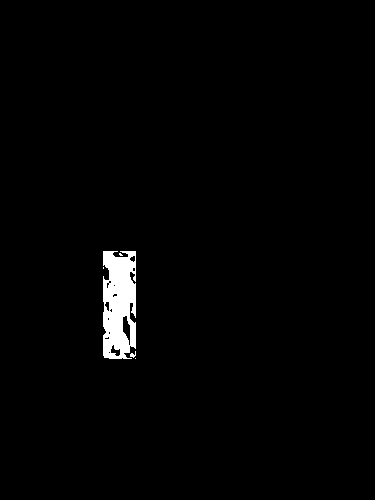

255
Image similarity: 0.9826901807078324


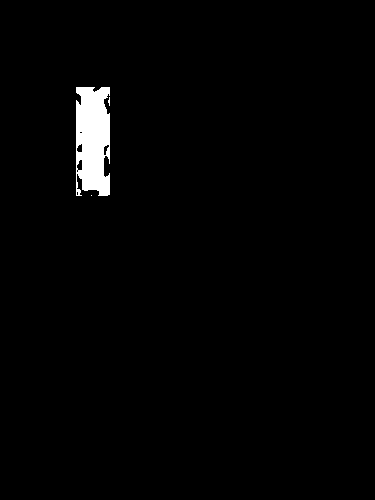

255
Image similarity: 0.9834792058801031


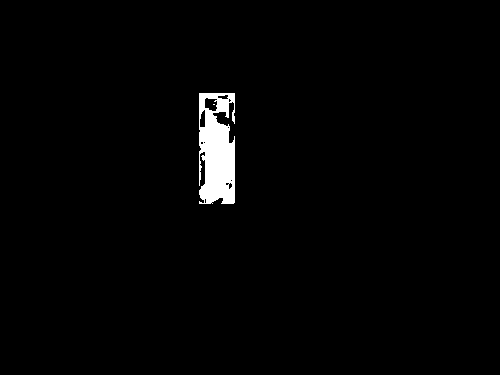

255
Image similarity: 0.799821117910561


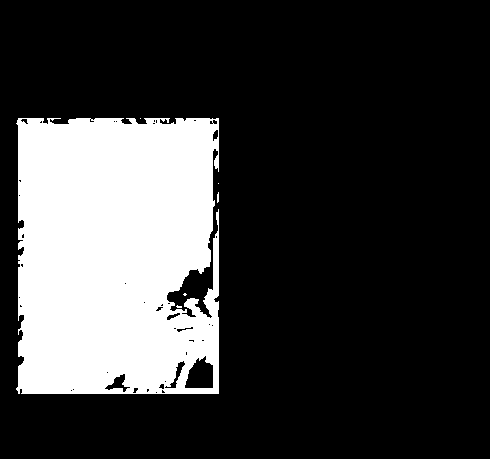

255
Image similarity: 0.9514350805177796


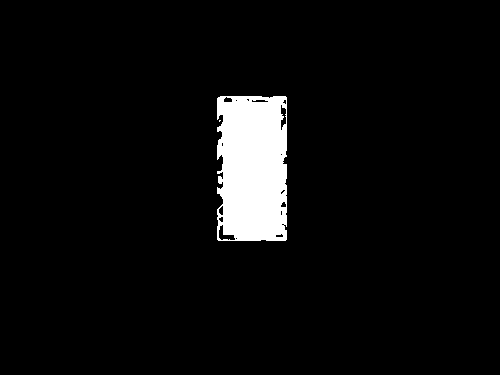

255
Image similarity: 0.760107201866378


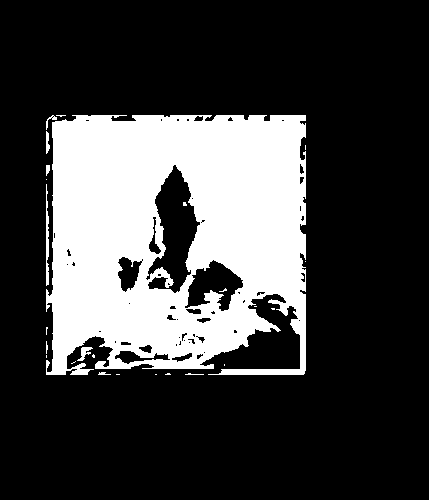

255
Image similarity: 0.8904393275005738


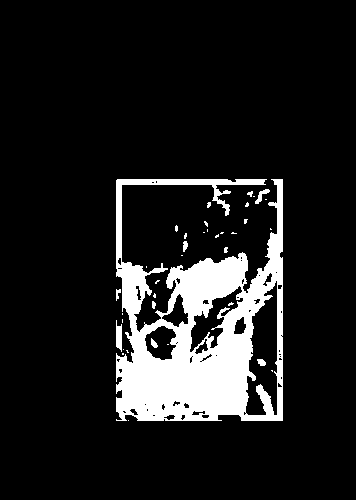

255
Image similarity: 0.8968967458161917


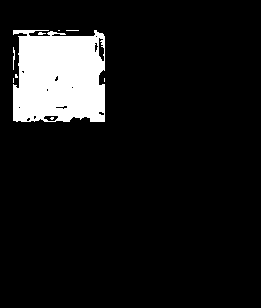

255
Image similarity: 0.7780001888731536


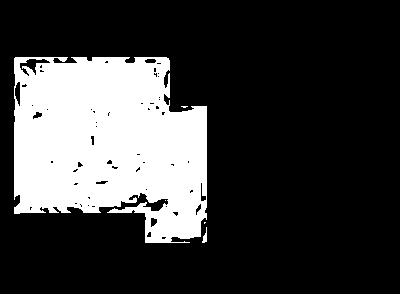

255
Image similarity: 0.8862109489476824


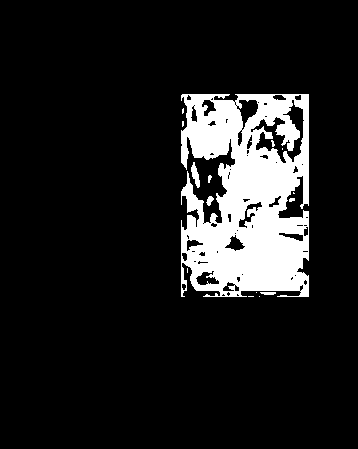

255
Image similarity: 0.9918312105428804


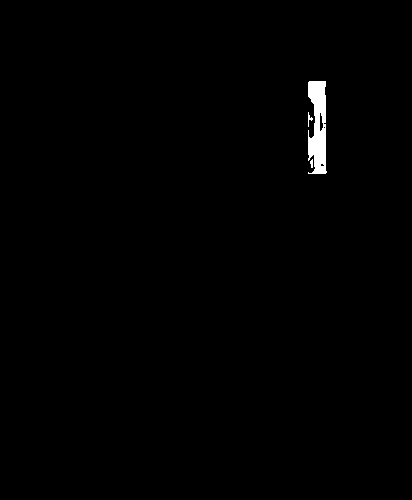

255
Image similarity: 0.8742022934884126


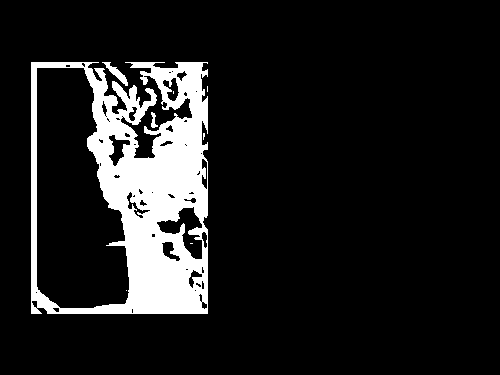

255
Image similarity: 0.9393921414878251


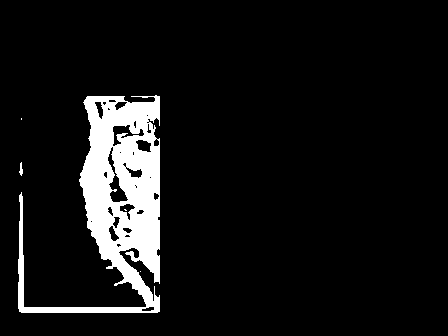

255
Image similarity: 0.988198141573826


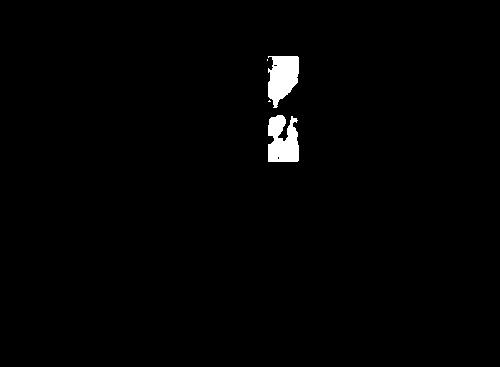

255
Image similarity: 0.9531387402267938


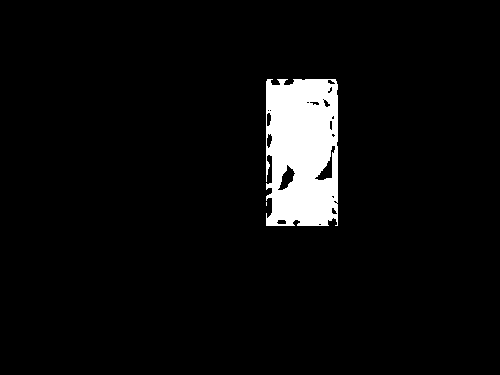

255
Image similarity: 0.9716189725126704


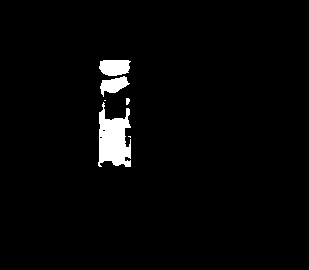

255
Image similarity: 0.7837173286931531


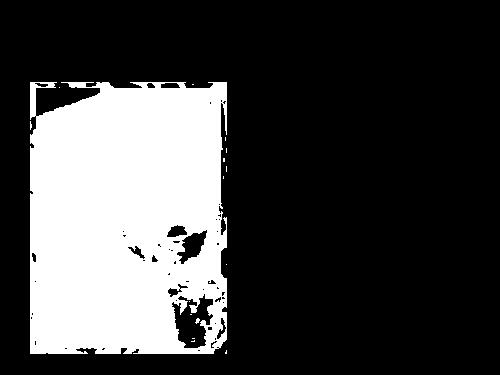

255
Image similarity: 0.9800289243167247


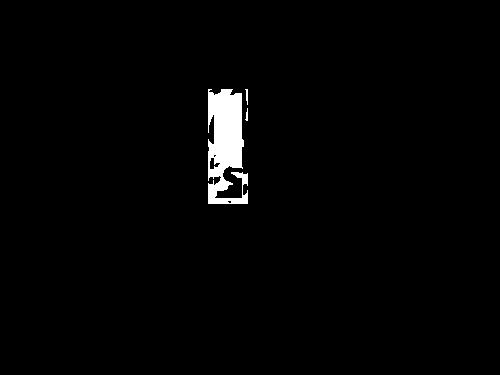

255
Image similarity: 0.9614580525765809


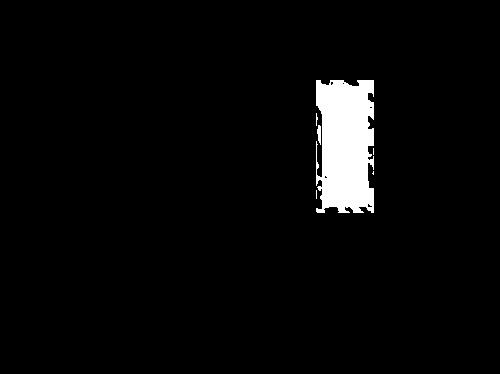

255
Image similarity: 0.8866815495851753


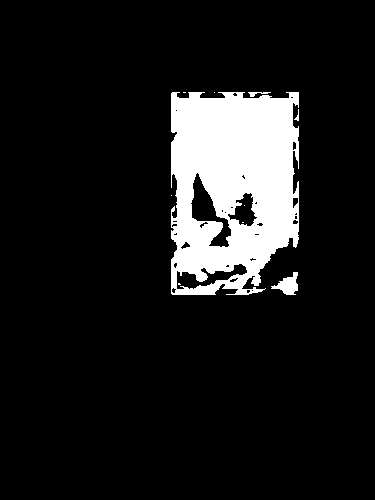

255
Image similarity: 0.9141015701958022


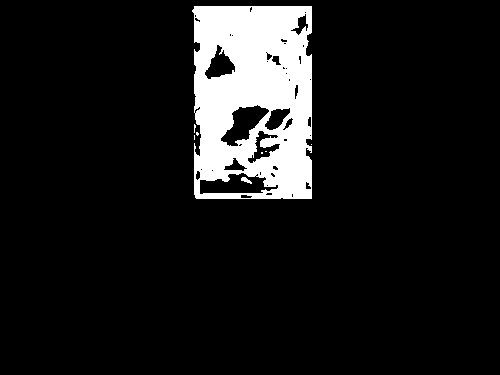

255
Image similarity: 0.9667014328013108


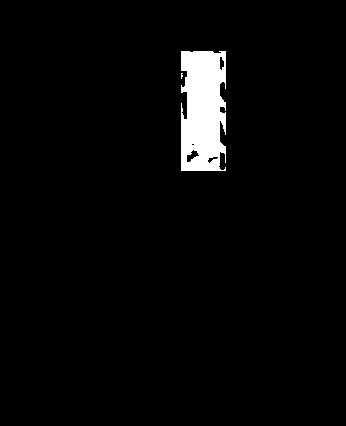

255
Image similarity: 0.9951739346082078


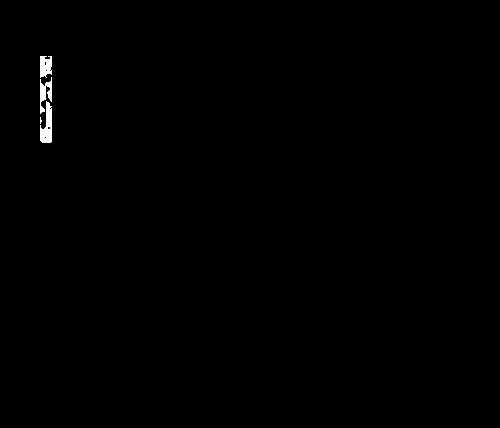

255
Image similarity: 0.8917504159356193


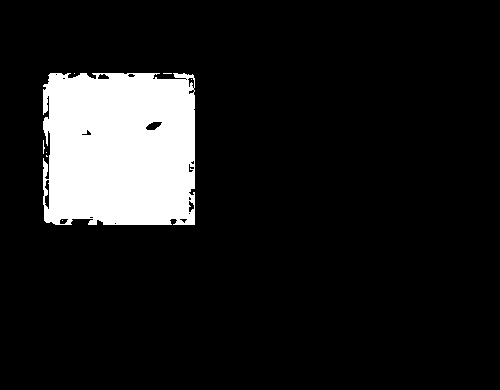

255
Image similarity: 0.9676352133202729


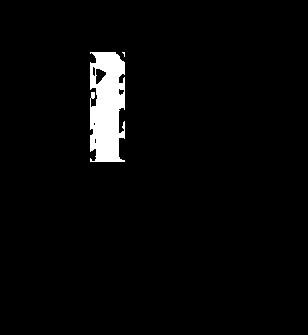

255
Image similarity: 0.8777043221801043


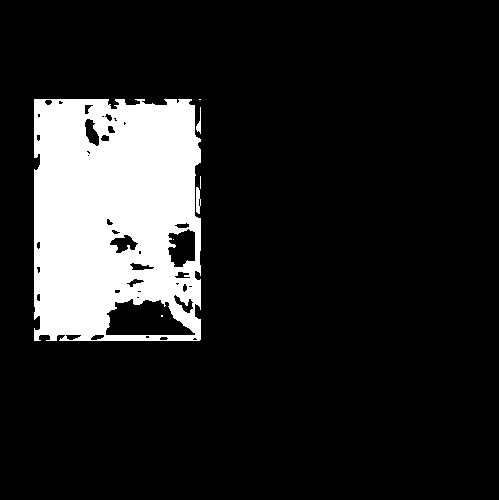

255
Image similarity: 0.9850191675159176


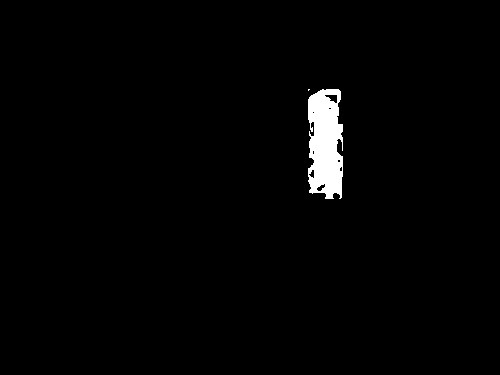

255
Image similarity: 0.9822103685456981


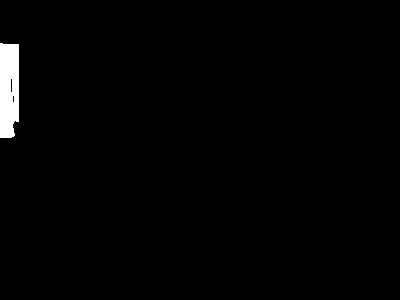

255
Image similarity: 0.9317283434670461


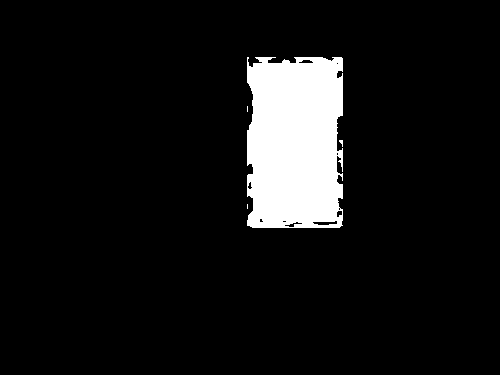

255
Image similarity: 0.943286625777127


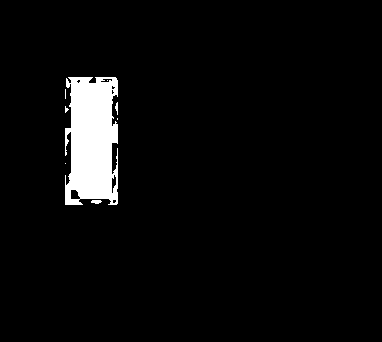

255
Image similarity: 0.9831635900265002


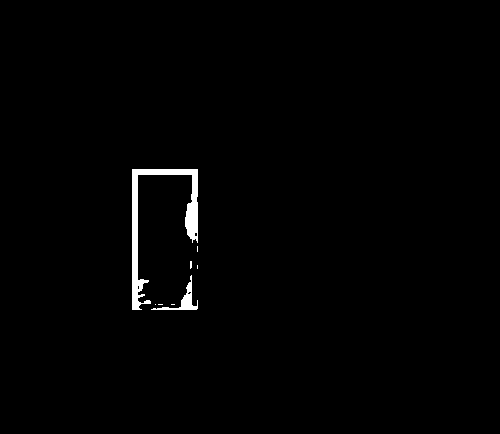

255
Image similarity: 0.9235188224231111


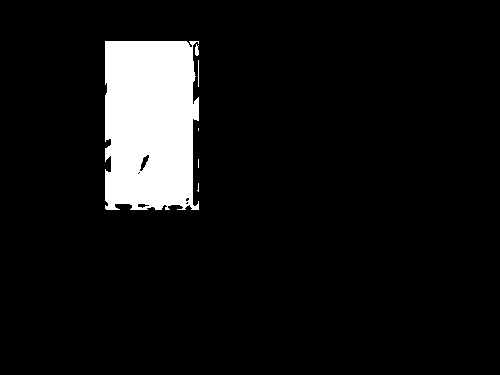

255
Image similarity: 0.9136573803772857


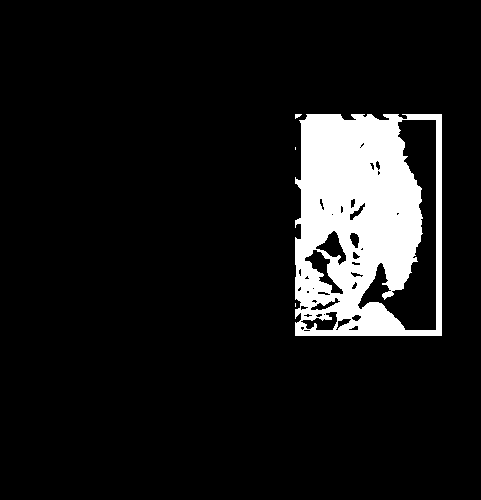

255
Image similarity: 0.8751994502967289


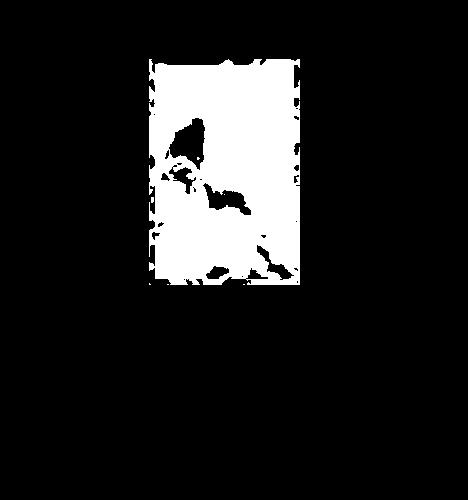

255
Image similarity: 0.9168911132224439


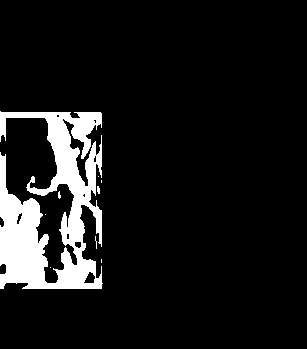

255
Image similarity: 0.8910118960856189


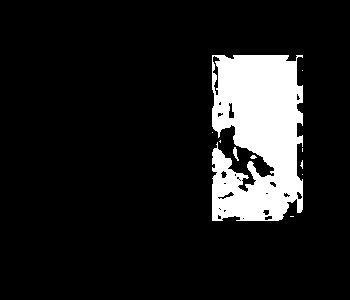

255
Image similarity: 0.9782806160843921


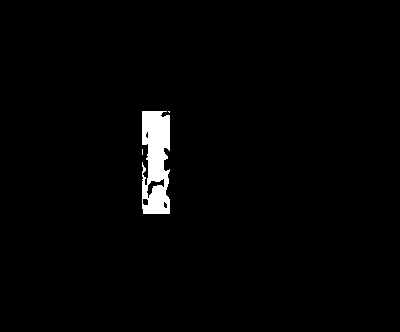

255
Image similarity: 0.8454559858073399


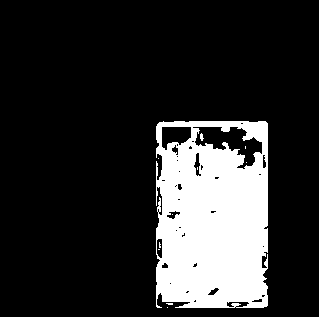

255
Image similarity: 0.9818782136609827


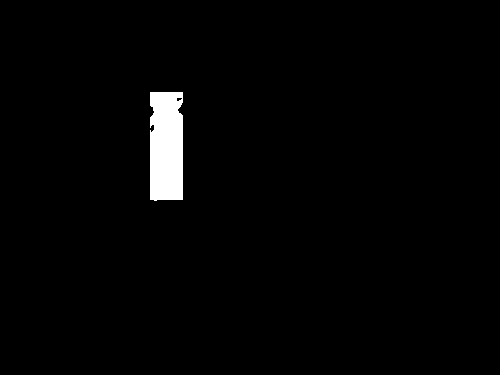

255
Image similarity: 0.9368937703543275


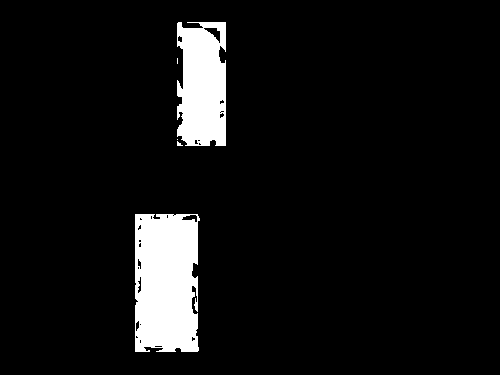

255
Image similarity: 0.7800416519663862


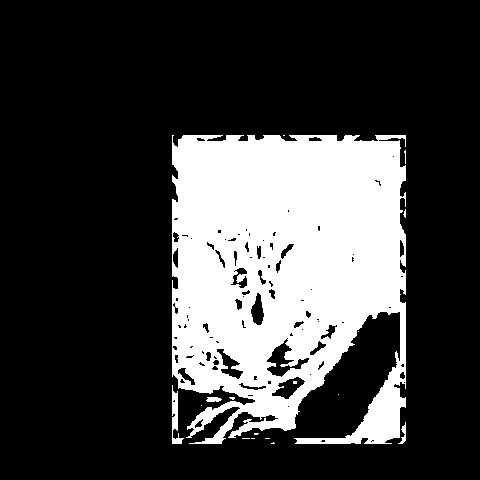

255
Image similarity: 0.9727666121946066


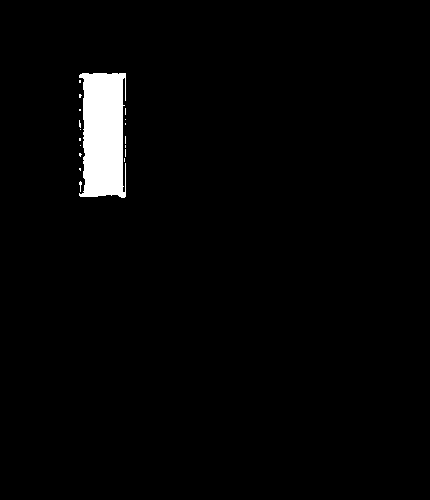

255
Image similarity: 0.8671826926945646


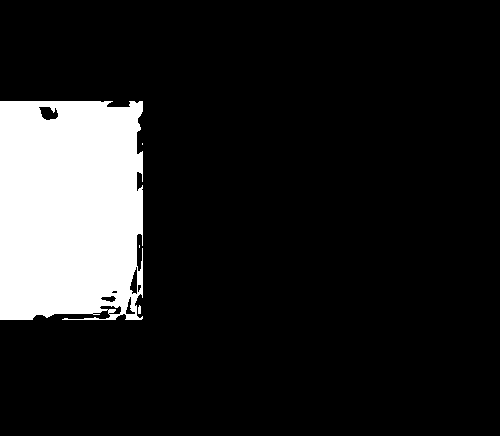

255
Image similarity: 0.9649644738108133


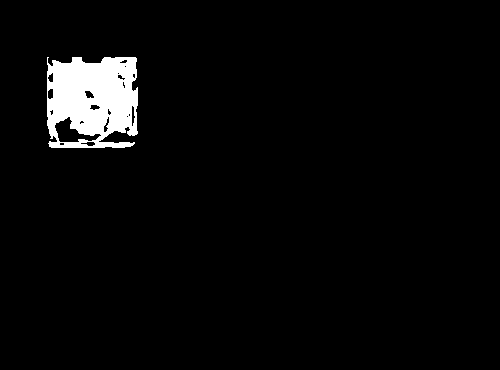

255
Image similarity: 0.9285979049576395


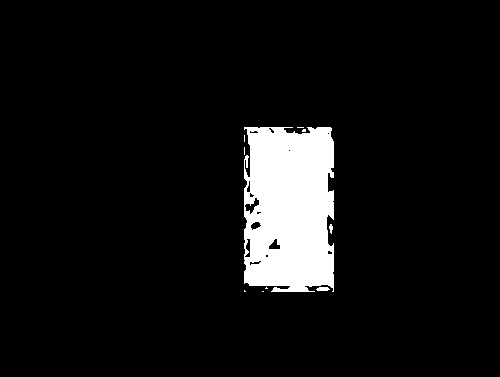

255
Image similarity: 0.8927339313025133


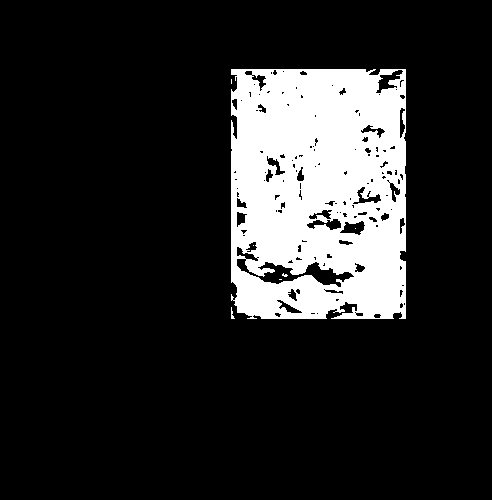

255
Image similarity: 0.9740419283754566


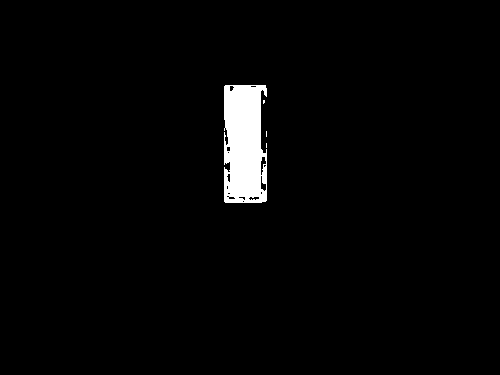

255
Image similarity: 0.9744866289282315


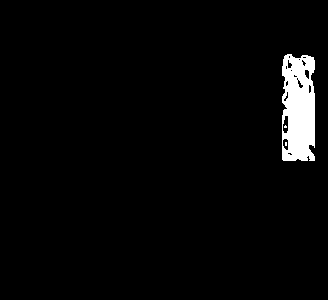

255
Image similarity: 0.9799180288352883


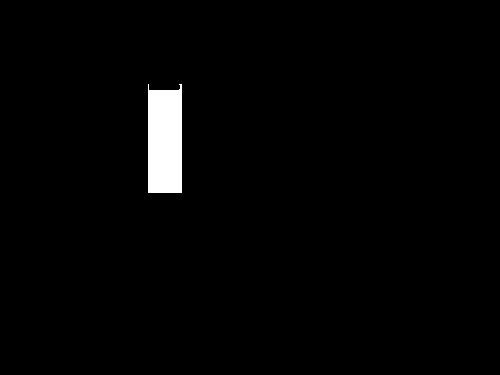

255
Image similarity: 0.9299093861104725


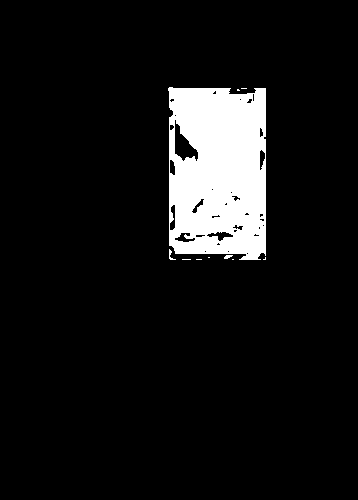

255
Image similarity: 0.9785197215771976


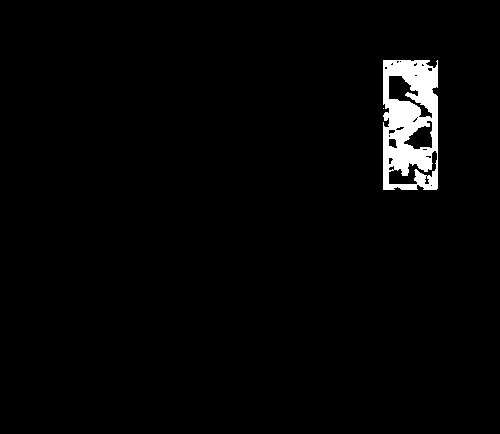

255
Image similarity: 0.8771442273163721


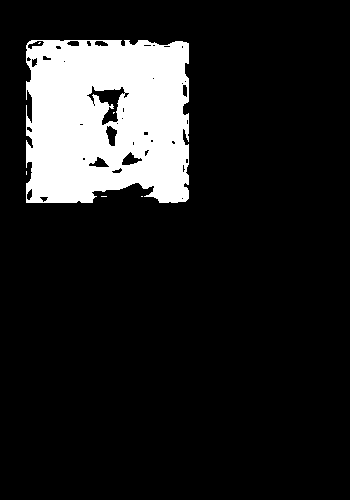

255
Image similarity: 0.9854082303991297


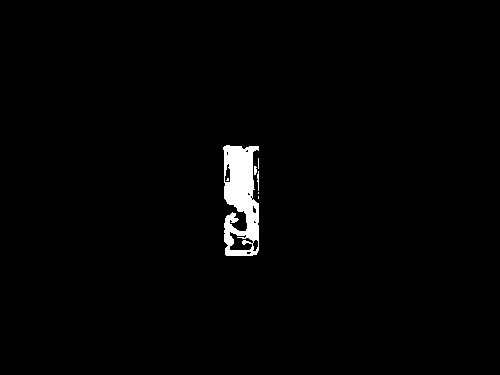

255
Image similarity: 0.8692369017685525


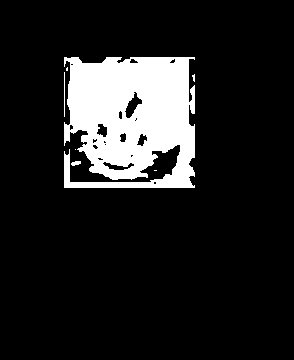

255
Image similarity: 0.9920299418908992


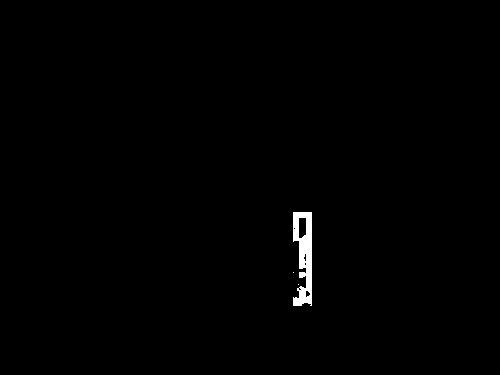

255
Image similarity: 0.9947942721185518


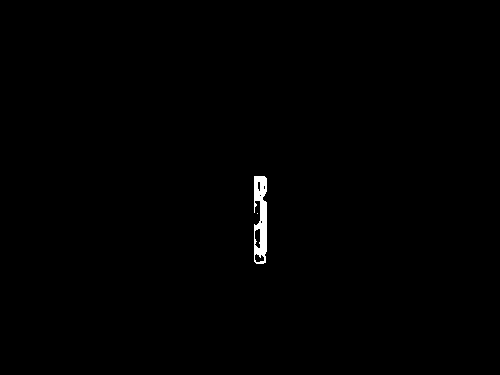

255
Image similarity: 0.8971732980070276


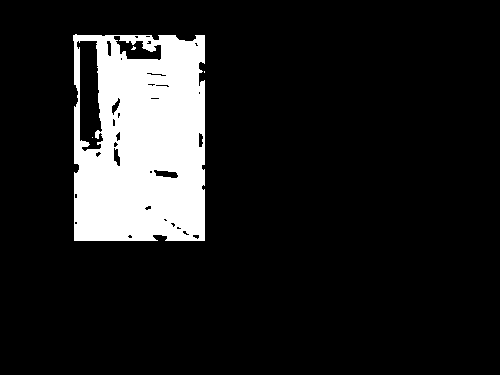

255
Image similarity: 0.9777295118869476


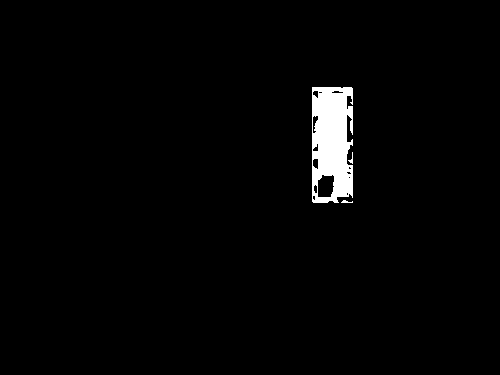

255
Image similarity: 0.9378773882882894


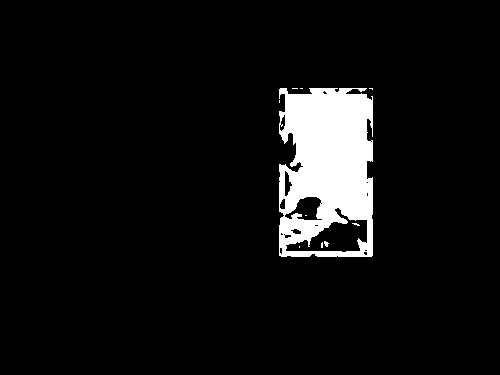

255
Image similarity: 0.7755498214964832


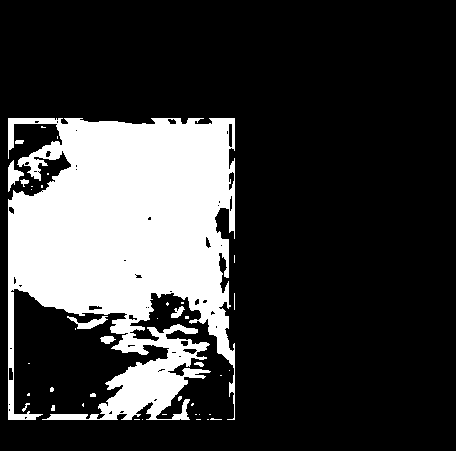

255
Image similarity: 0.9220908829810365


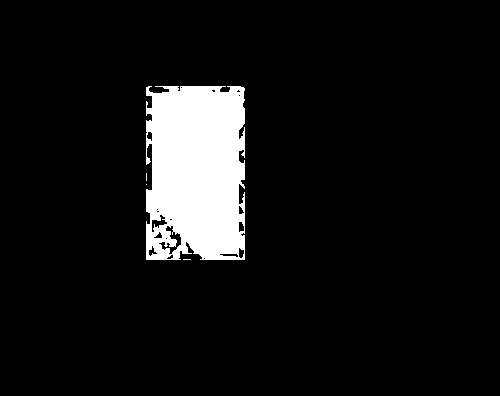

255
Image similarity: 0.9759597542006507


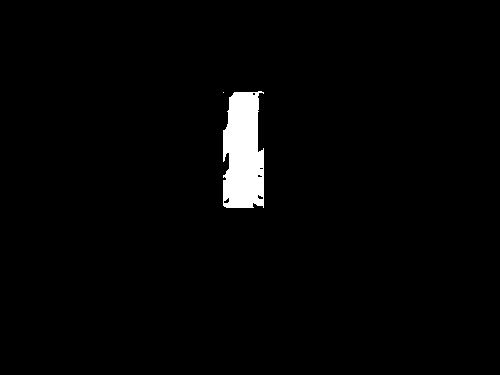

255
Image similarity: 0.7616265074215975


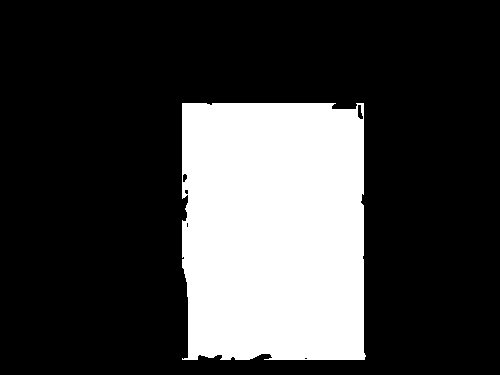

255
Image similarity: 0.9948060534468363


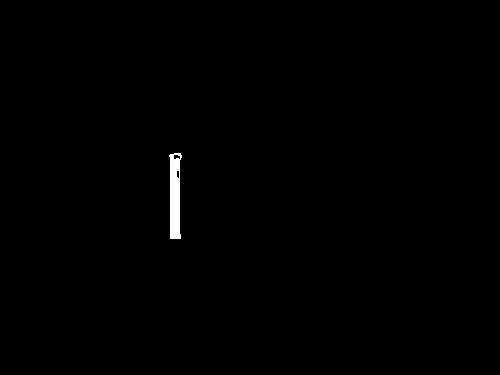

255
Image similarity: 0.9818359400984634


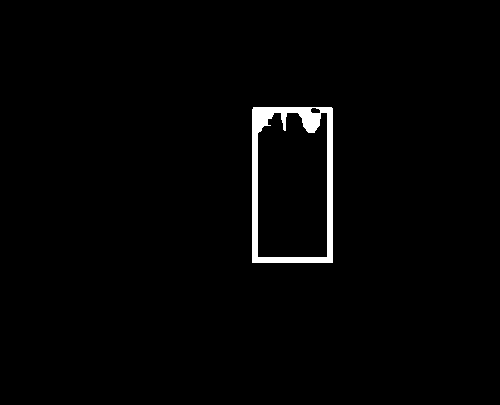

255
Image similarity: 0.9304031331730894


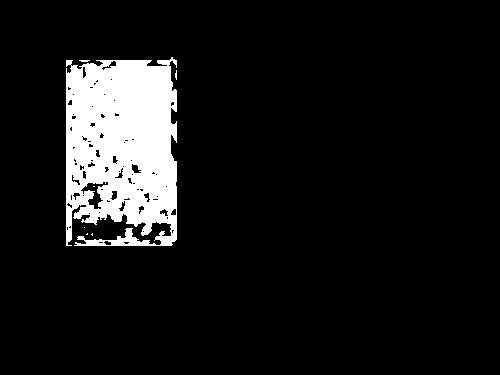

255
Image similarity: 0.9722501891967262


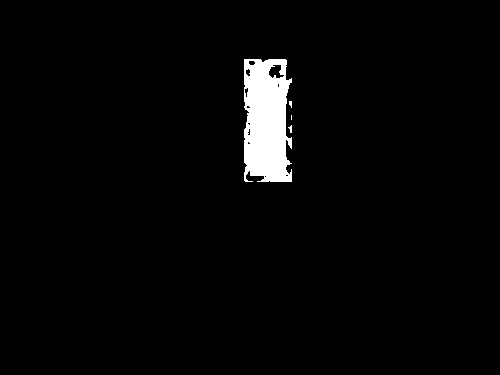

255
Image similarity: 0.5819708642438607


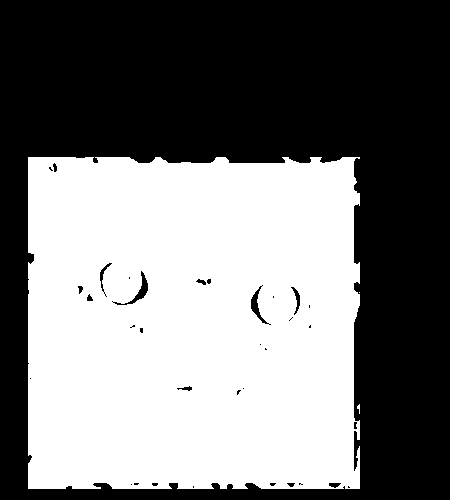

255
Image similarity: 0.9224220387506628


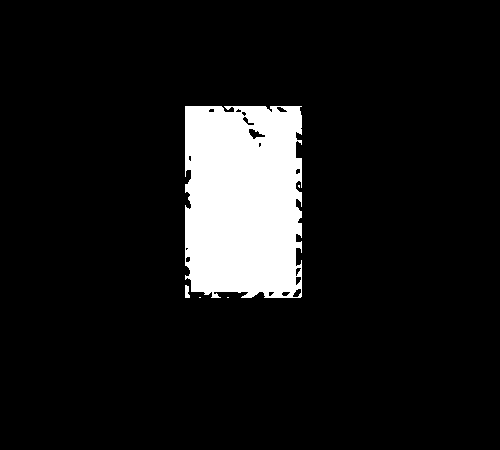

255
Image similarity: 0.9928154130446512


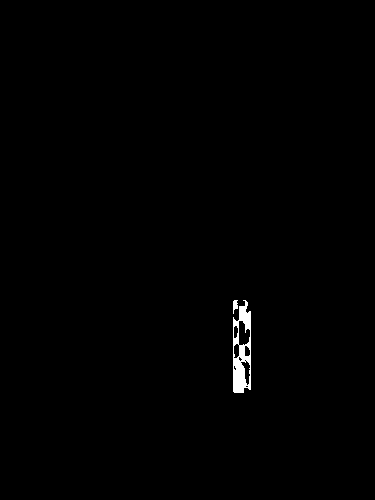

255
Image similarity: 0.9841112277208836


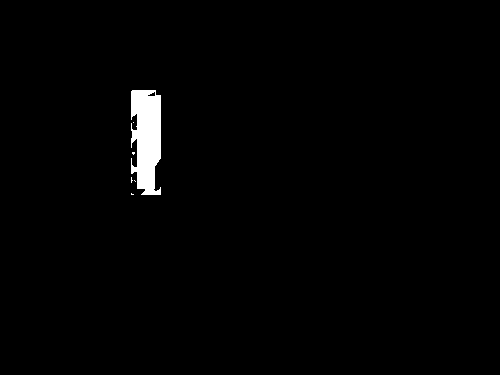

255
Image similarity: 0.9347002823926056


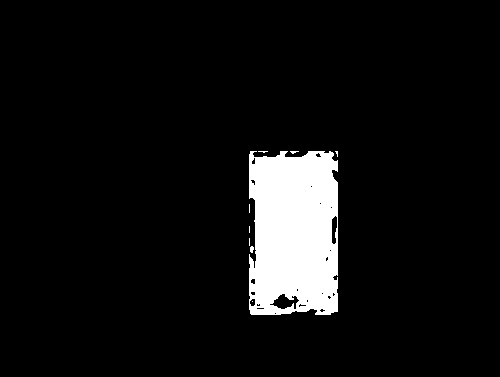

255
Image similarity: 0.9822039750049335


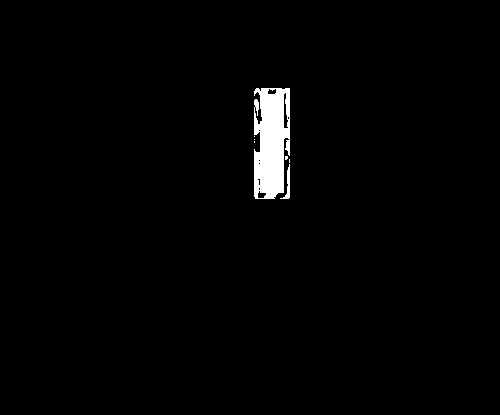

255
Image similarity: 0.9322928932456909


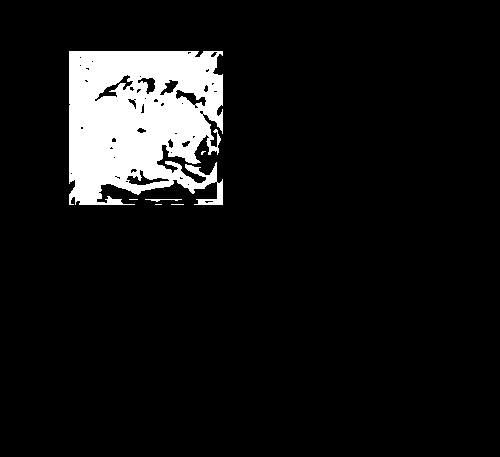

255
Image similarity: 0.976397119601321


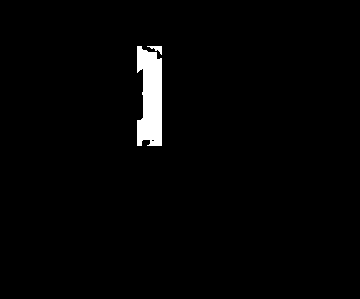

255
Image similarity: 0.9535155276253923


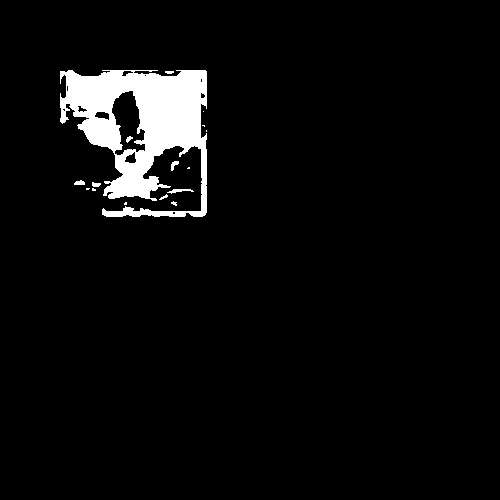

255
Image similarity: 0.9554254788737024


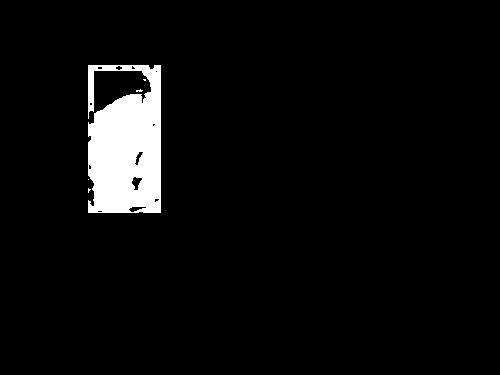

255
Image similarity: 0.9491652100598754


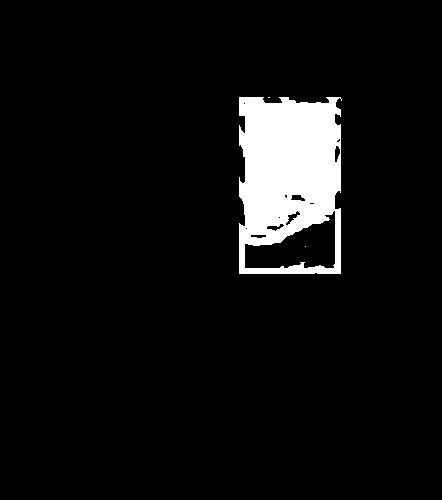

255
Image similarity: 0.6899530524201049


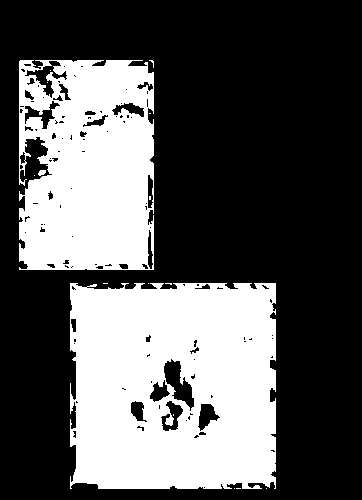

255
Image similarity: 0.9371590839298762


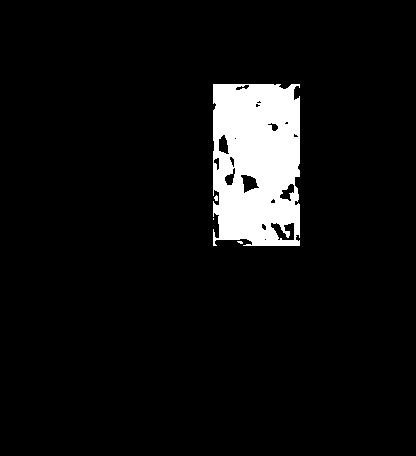

255
Image similarity: 0.9874306492463246


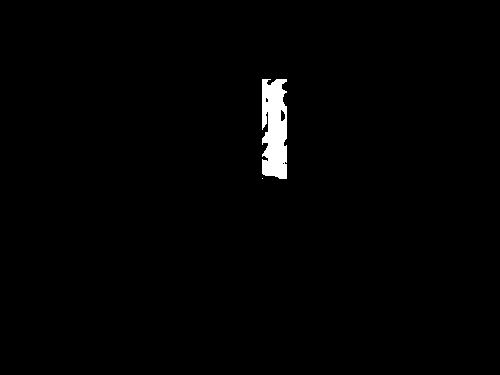

255
Image similarity: 0.8506720319961396


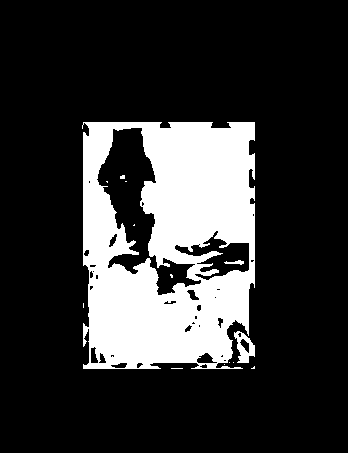

255
Image similarity: 0.9895004421022392


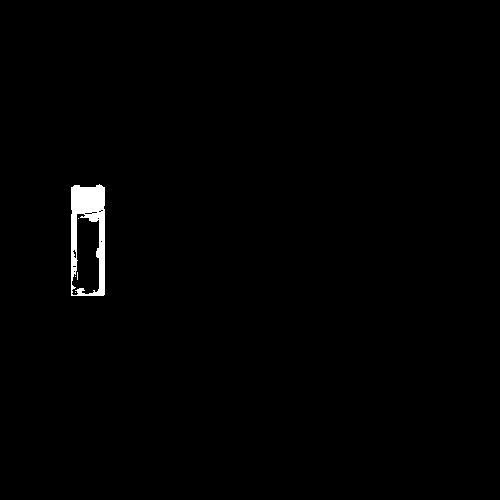

255
Image similarity: 0.9679606044178434


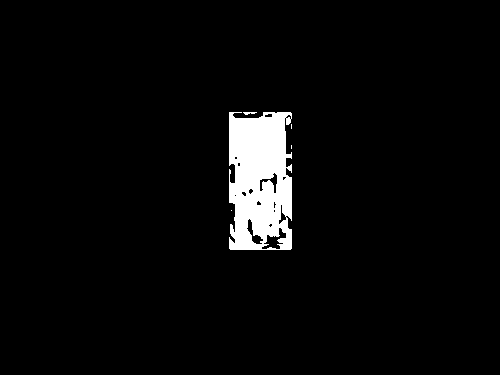

255
Image similarity: 0.917682449386436


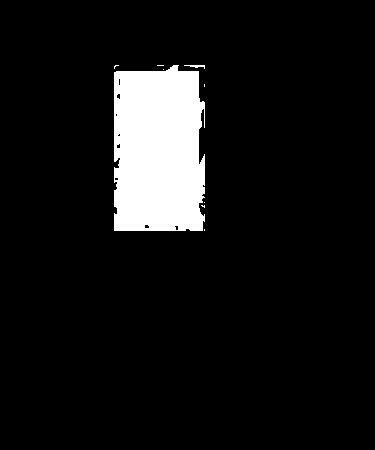

255
Image similarity: 0.8288676655681441


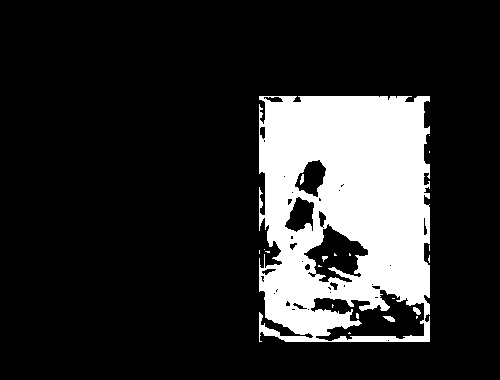

255
Image similarity: 0.9554589583346436


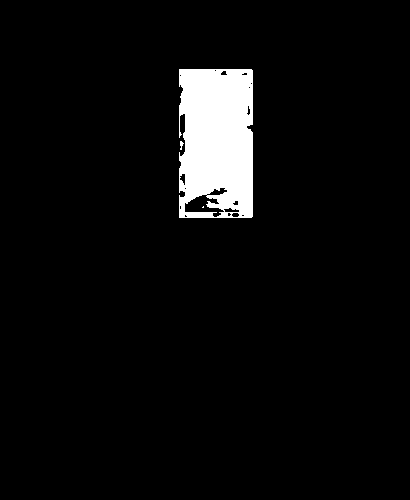

255
Image similarity: 0.9769364127945428


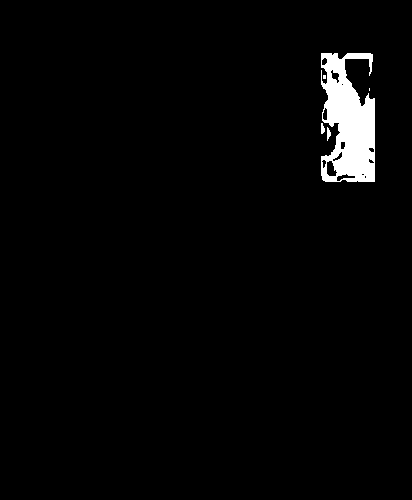

255
Image similarity: 0.9867631783812935


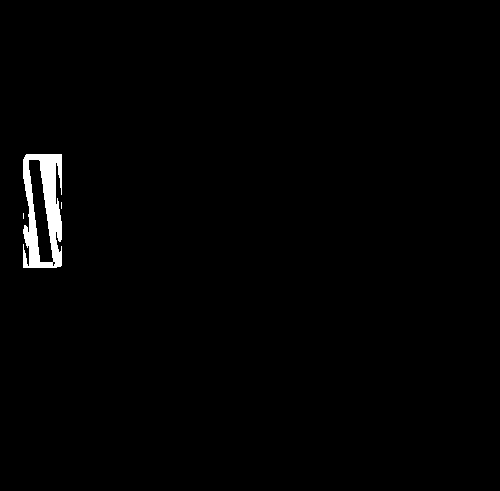

255
Image similarity: 0.9866415196098343


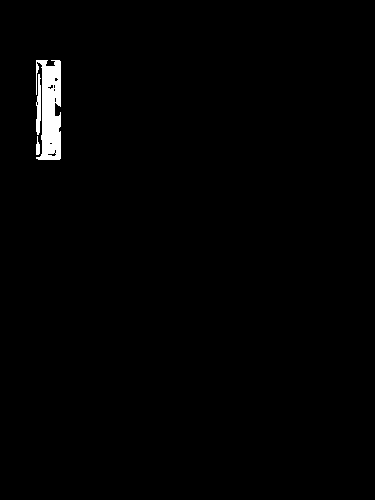

255
Image similarity: 0.9770102318168968


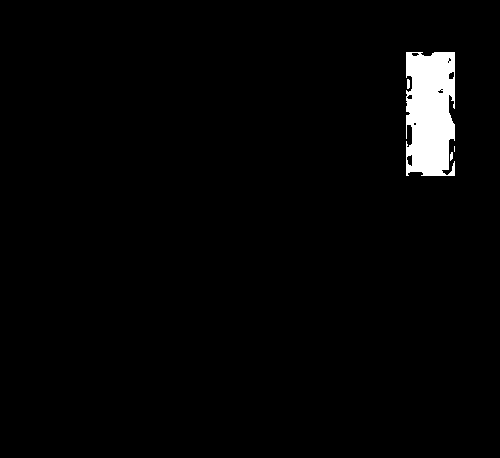

255
Image similarity: 0.9155596190685429


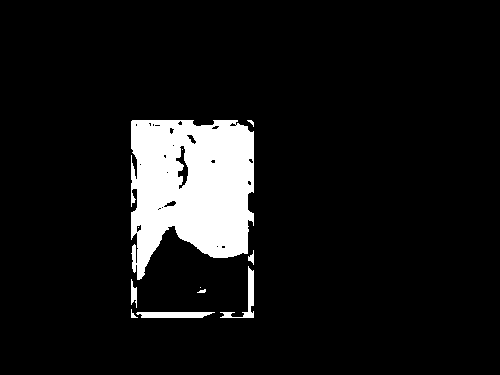

255
Image similarity: 0.9456650277184278


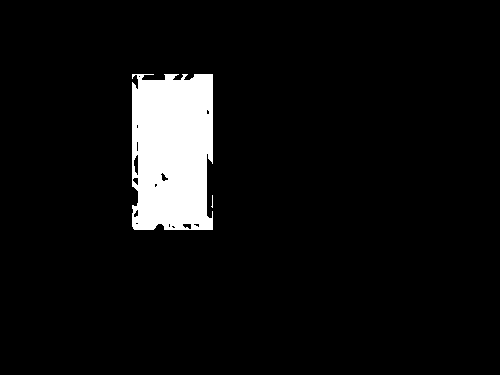

255
Image similarity: 0.9678650003883887


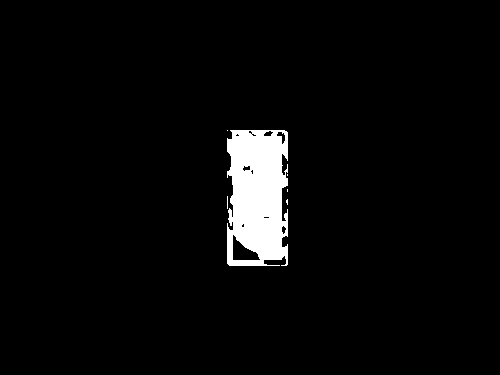

255
Image similarity: 0.8954565585771989


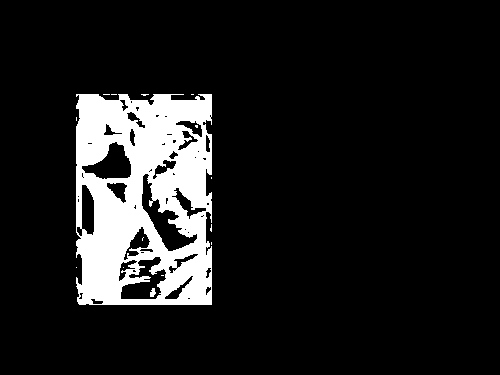

255
Image similarity: 0.8679278699606673


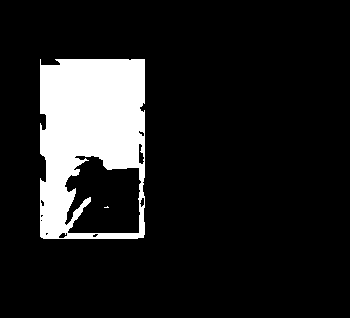

255
Image similarity: 0.9645830032918099


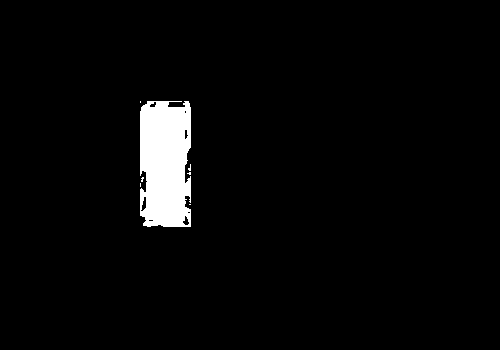

255
Image similarity: 0.8959746210509553


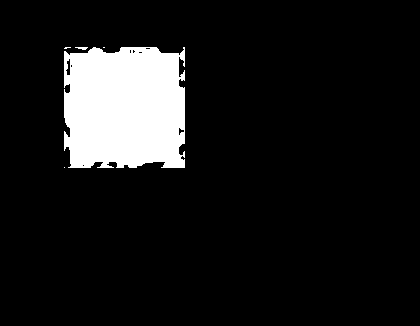

255
Image similarity: 0.9355969834486713


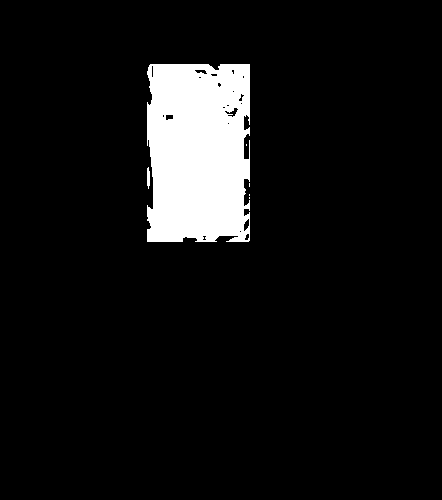

255
Image similarity: 0.9491617796478264


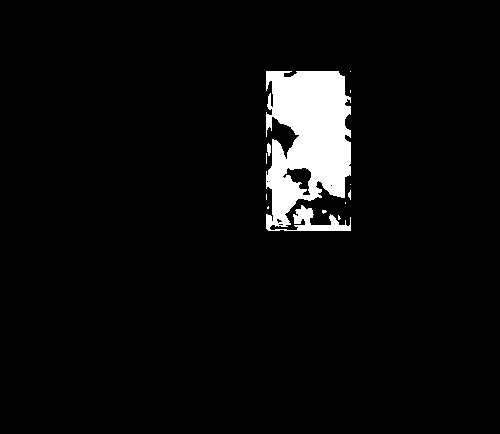

255
Image similarity: 0.9916839443996134


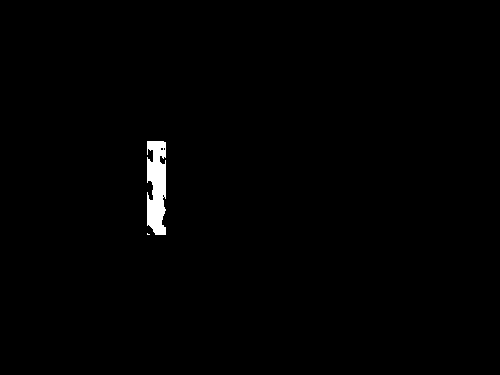

255
Image similarity: 0.9857236998745971


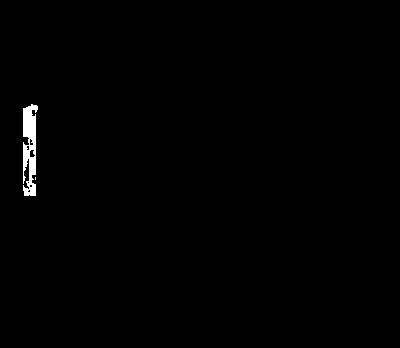

255
Image similarity: 0.9328651036772506


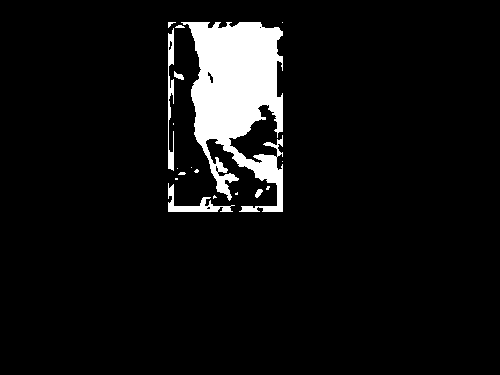

255
Image similarity: 0.688906417148535


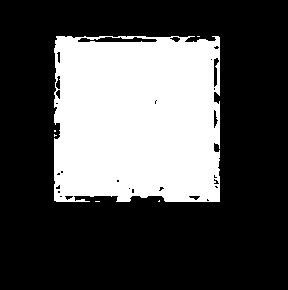

255
Image similarity: 0.978324290985519


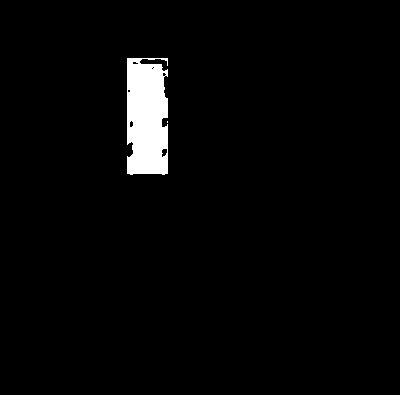

255
Image similarity: 0.9743274085102362


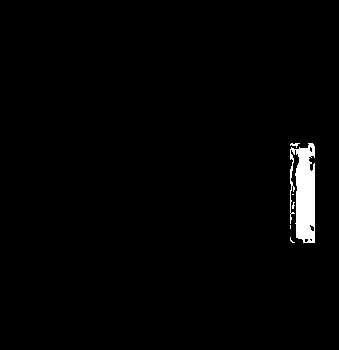

255
Image similarity: 0.9719752767842549


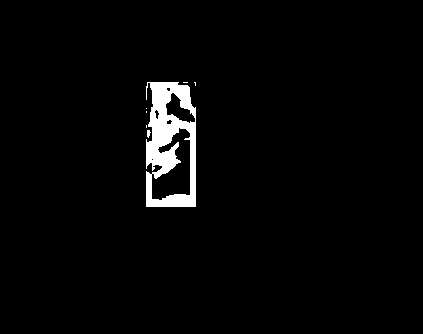

255
Image similarity: 0.9506432037335034


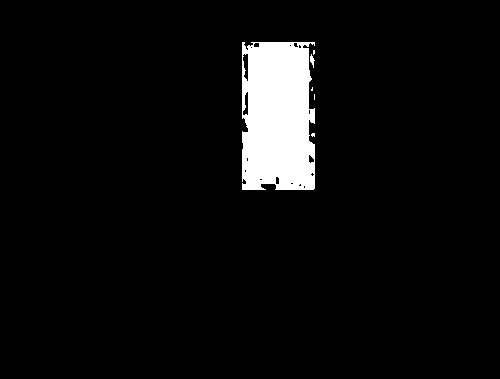

255
Image similarity: 0.8051557241941335


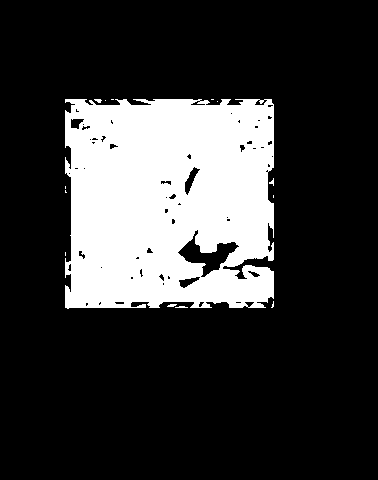

255
Image similarity: 0.8850952472387217


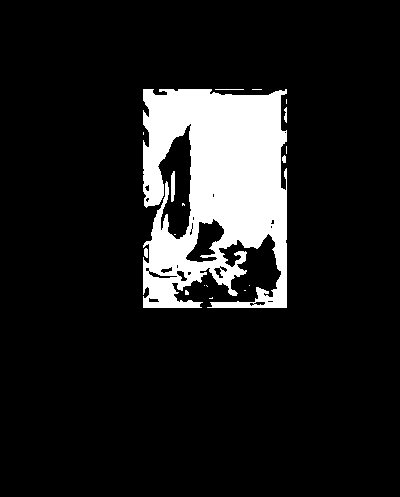

255
Image similarity: 0.9909432473997619


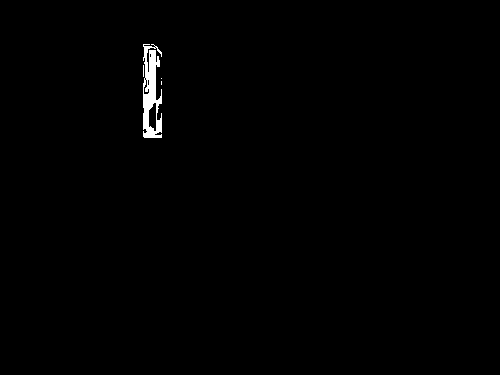

255
Image similarity: 0.9898459324381819


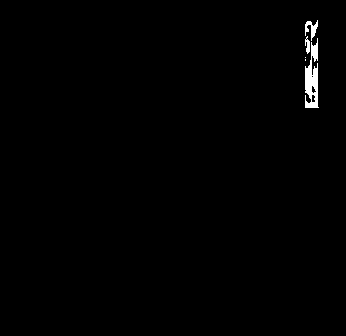

255
Image similarity: 0.9495912234686686


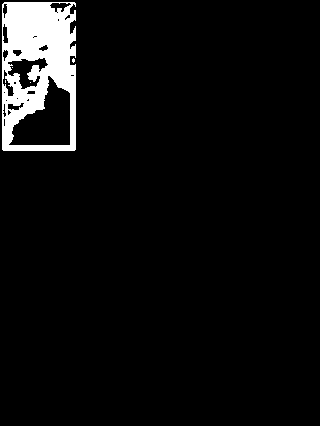

255
Image similarity: 0.986150908106077


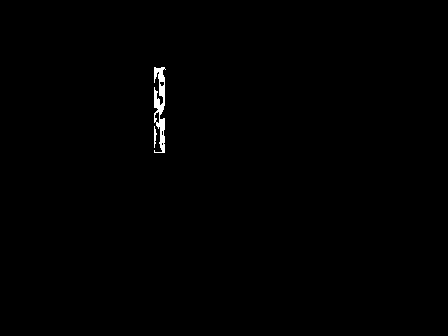

255
Image similarity: 0.862233274214134


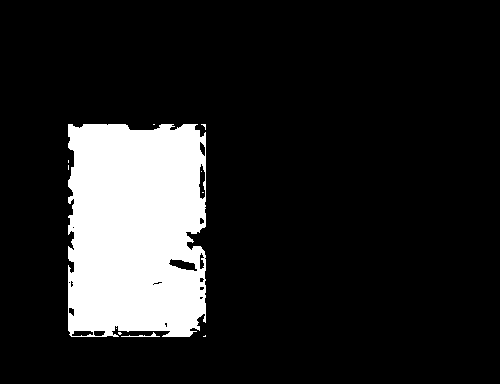

255
Image similarity: 0.8911216295185869


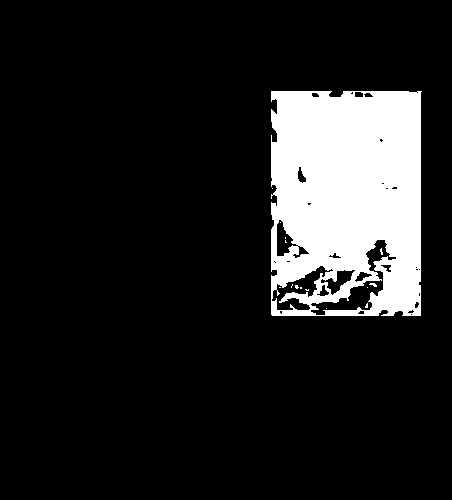

255
Image similarity: 0.9158813833840697


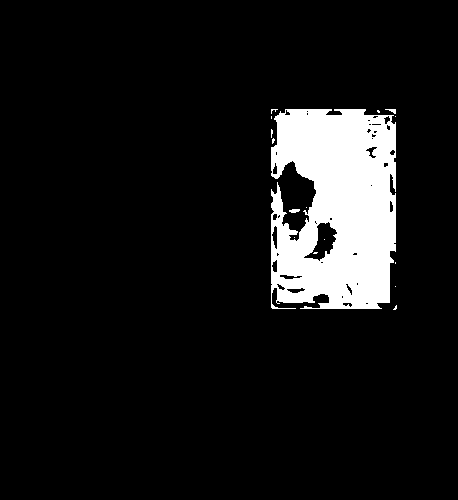

255
Image similarity: 0.9881506438322106


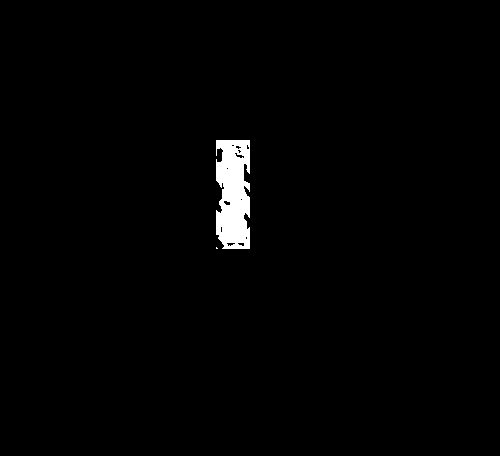

255
Image similarity: 0.9031511637680022


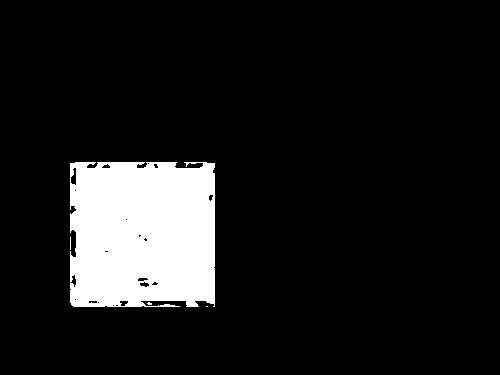

255
Image similarity: 0.9709929756305884


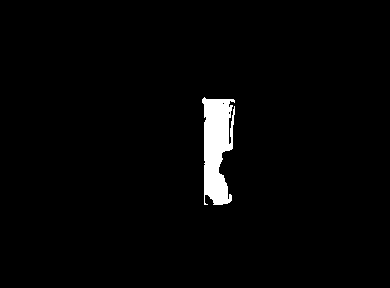

255
Image similarity: 0.9842494749449259


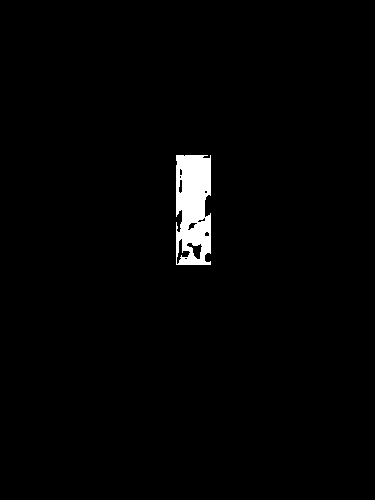

255
Image similarity: 0.8283140732059485


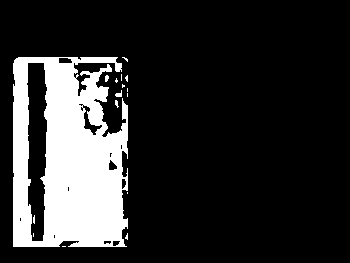

255
Image similarity: 0.896962722290722


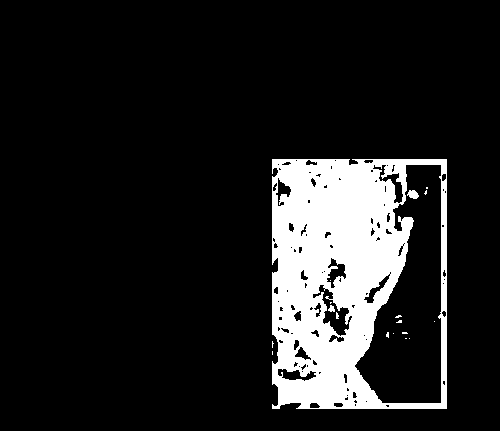

255
Image similarity: 0.9523519542763685


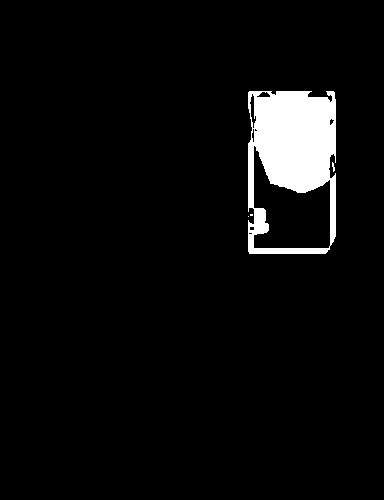

255
Image similarity: 0.9543592699981794


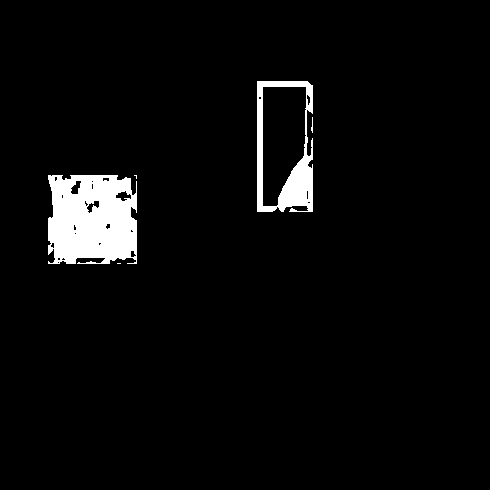

255
Image similarity: 0.9336109713136116


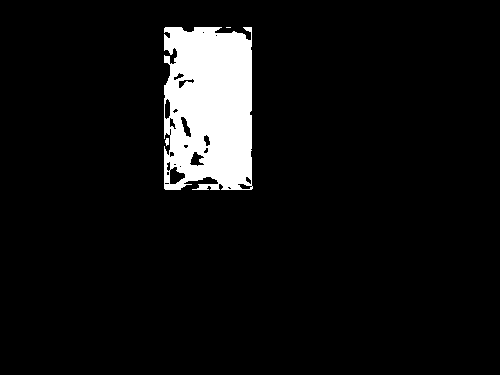

255
Image similarity: 0.9047781284377235


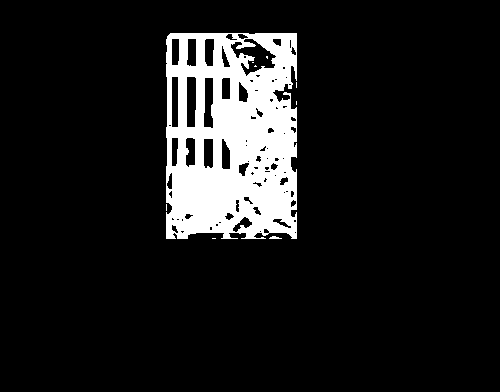

255
Image similarity: 0.9877813989475067


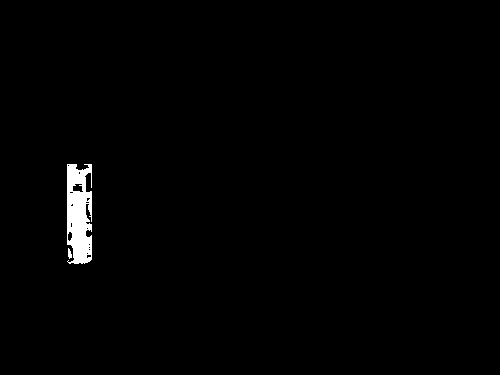

255
Image similarity: 0.991716877722756


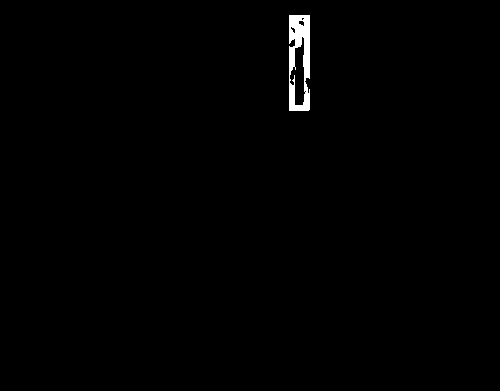

255
Image similarity: 0.9740543103008634


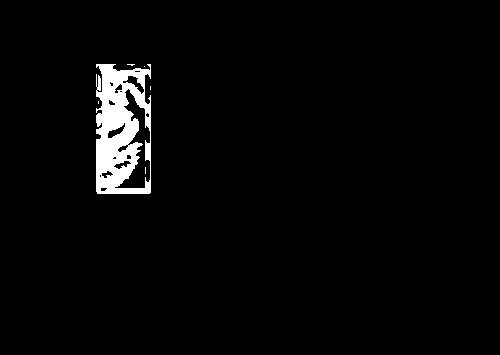

255
Image similarity: 0.8951412402834691


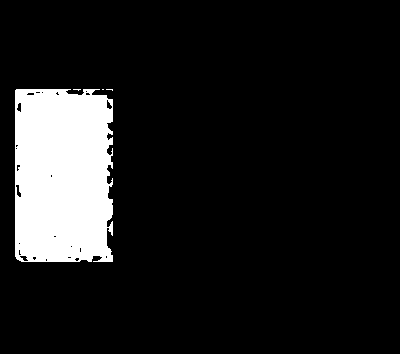

255
Image similarity: 0.9466253644512198


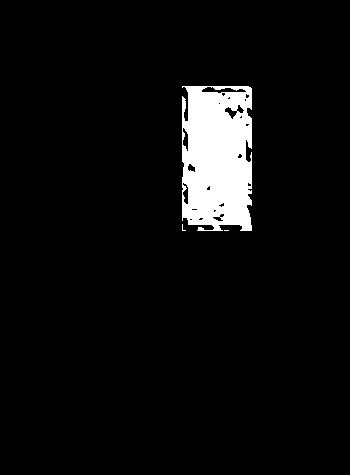

255
Image similarity: 0.9855681439759445


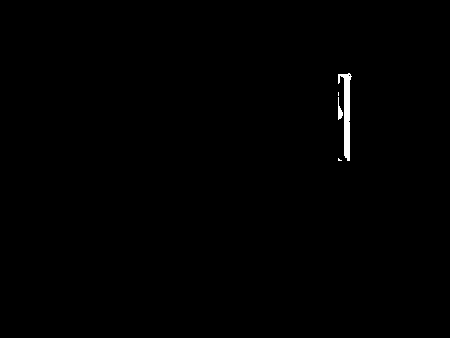

255
Image similarity: 0.9801481135568907


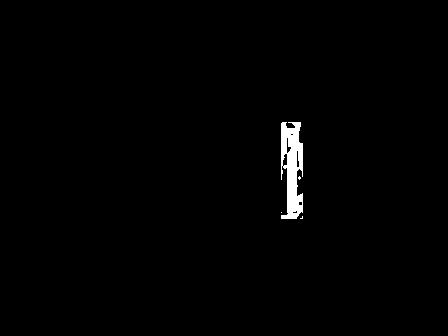

255
Image similarity: 0.9788863502756779


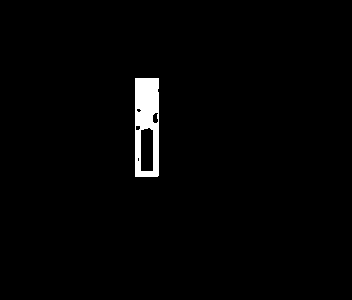

255
Image similarity: 0.9913716895792717


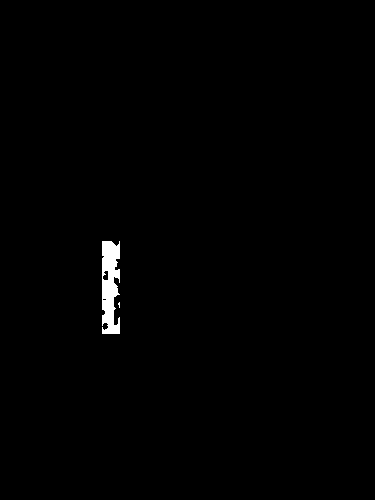

255
Image similarity: 0.9568625668707561


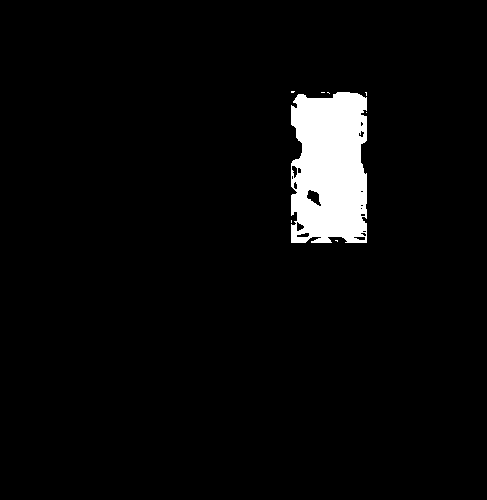

255
Image similarity: 0.9787527526242754


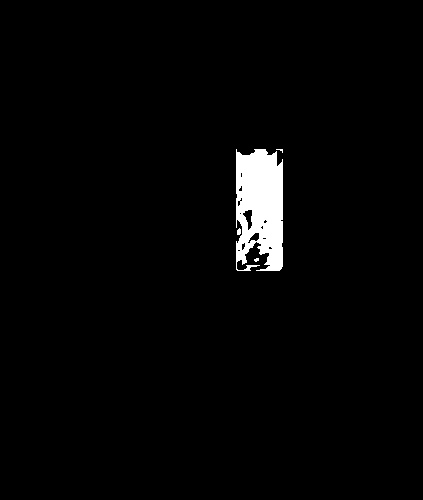

255
Image similarity: 0.9821386100180953


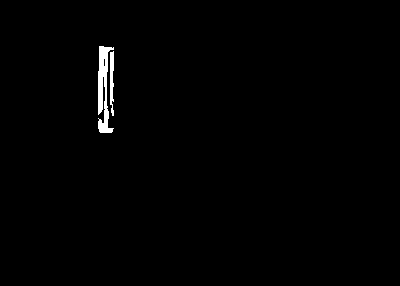

255
Image similarity: 0.9788616679677171


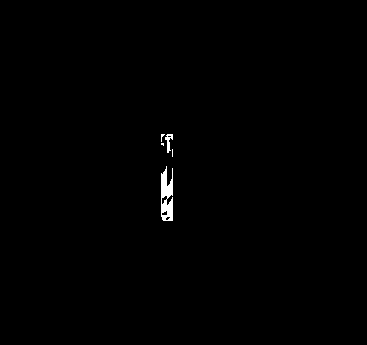

255
Image similarity: 0.9680610096211618


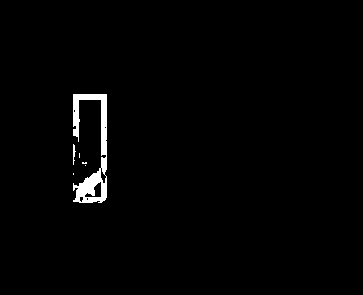

255
Image similarity: 0.9979762330246952


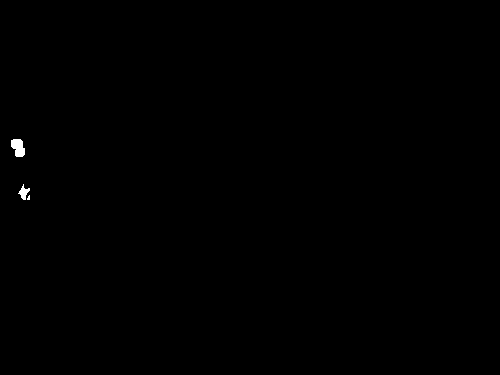

255
Image similarity: 0.8203811949887104


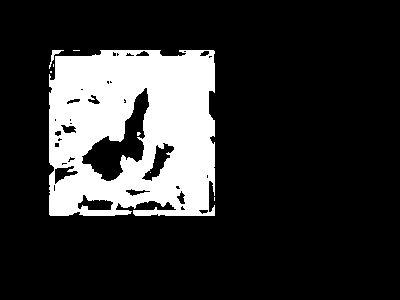

255
Image similarity: 0.9349291357249926


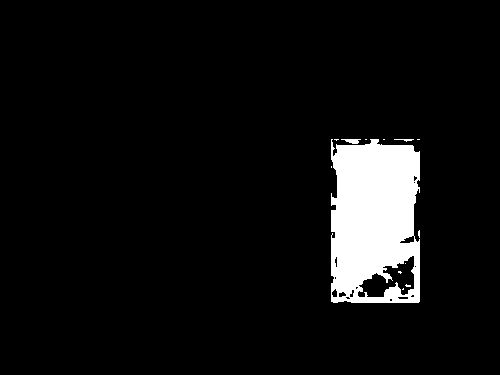

255
Image similarity: 0.9750295060729643


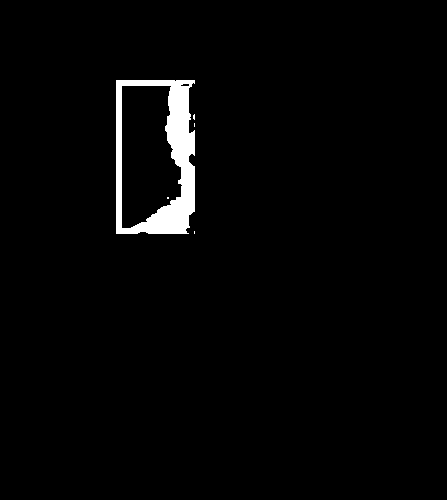

255
Image similarity: 0.9701018101564325


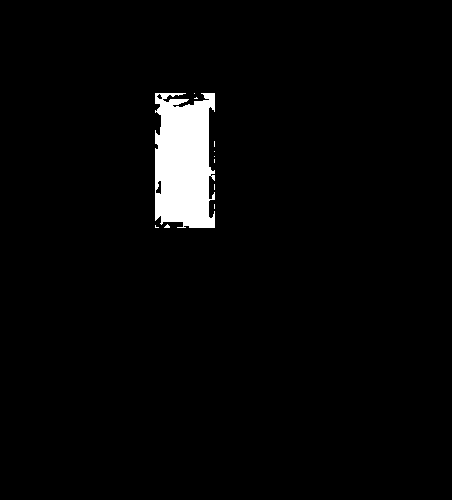

255
Image similarity: 0.7270490117769923


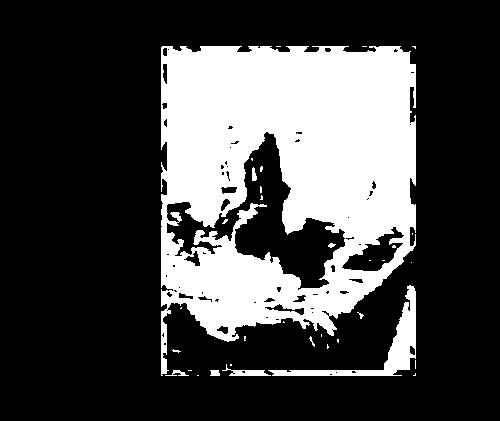

255
Image similarity: 0.9788870289271253


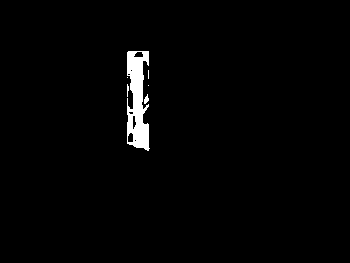

255
Image similarity: 0.8548525418201045


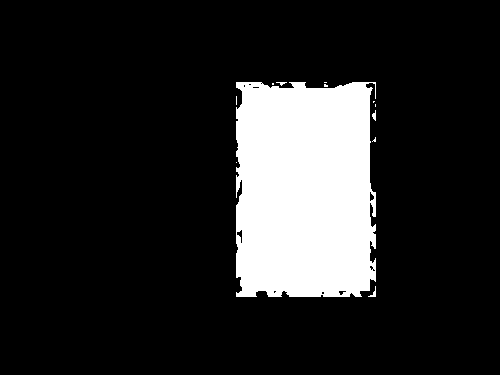

255
Image similarity: 0.9884441860298213


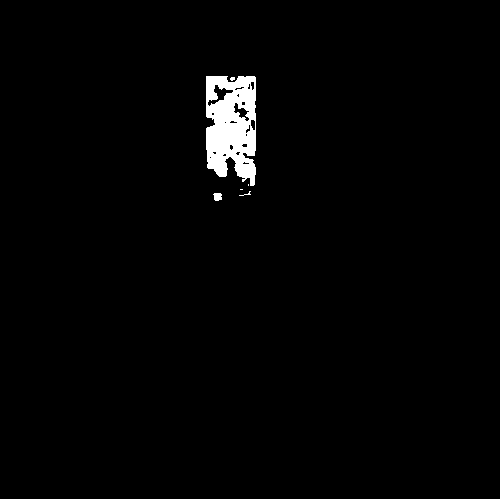

255
Image similarity: 0.9553415356358137


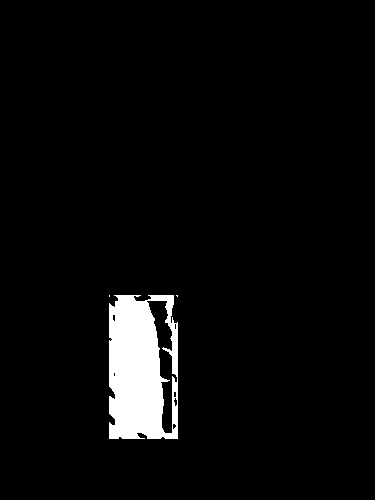

255
Image similarity: 0.9648884140713752


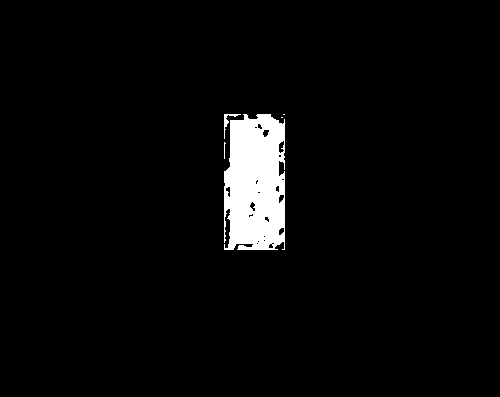

255
Image similarity: 0.9816402192208584


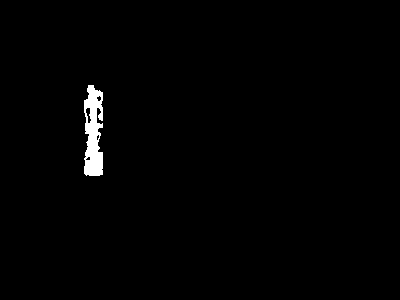

255
Image similarity: 0.9447911058892827


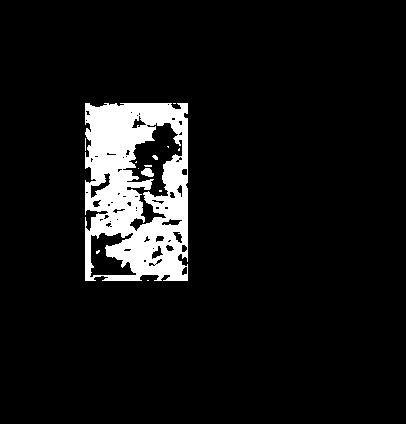

255
Image similarity: 0.9405755754414341


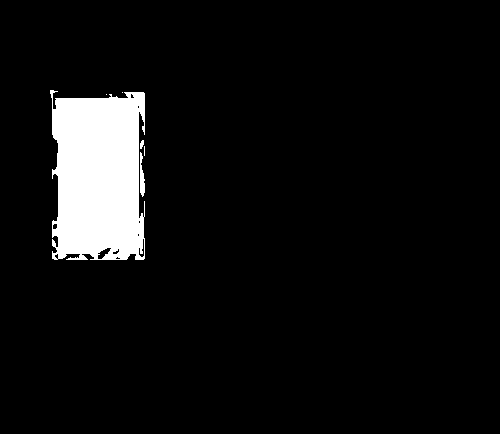

255
Image similarity: 0.9119448418119687


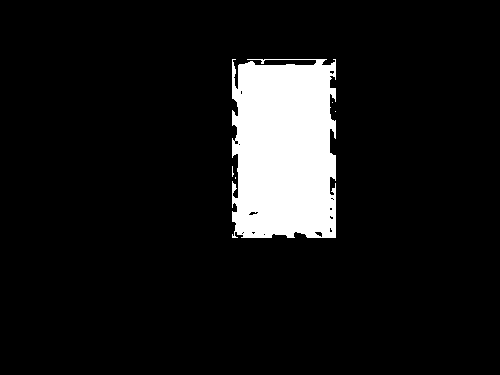

255
Image similarity: 0.9580965666490684


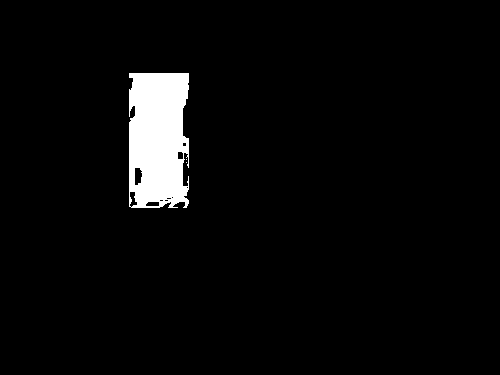

255
Image similarity: 0.8830462983118087


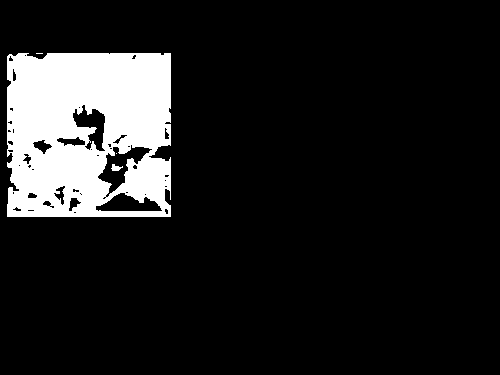

255
Image similarity: 0.8943409339983135


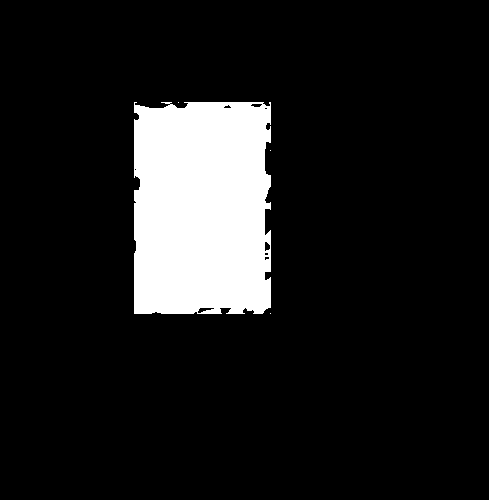

255
Image similarity: 0.8588295981680015


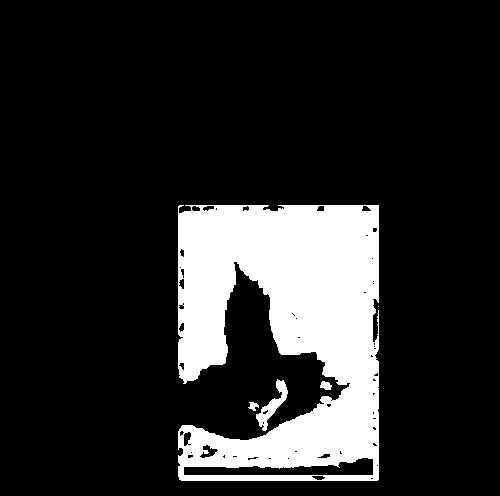

255
Image similarity: 0.9345653493474851


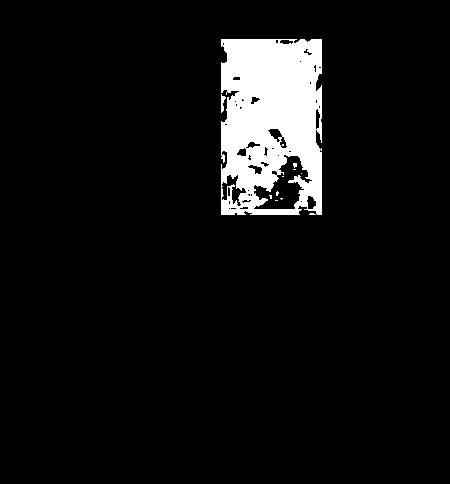

255
Image similarity: 0.9768509448285781


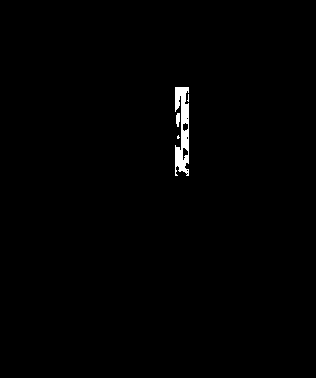

255
Image similarity: 0.9535591031828398


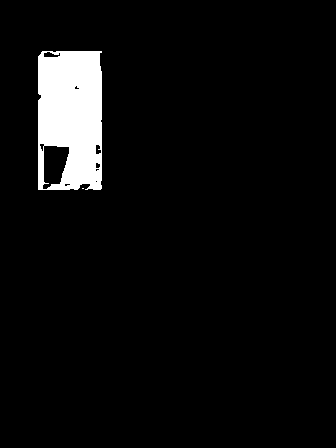

255
Image similarity: 0.8119974302143861


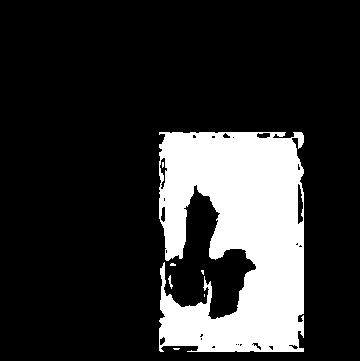

255
Image similarity: 0.9230964306536199


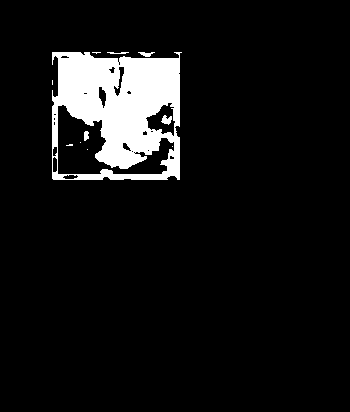

255
Image similarity: 0.9320498854862577


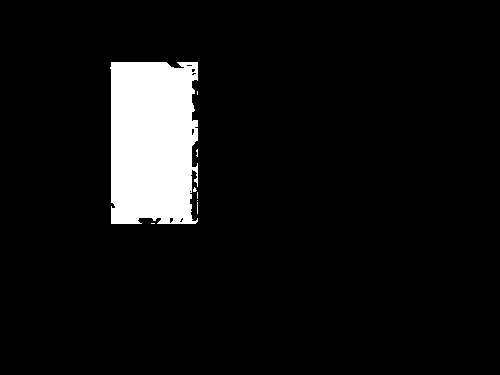

255
Image similarity: 0.8485542069587013


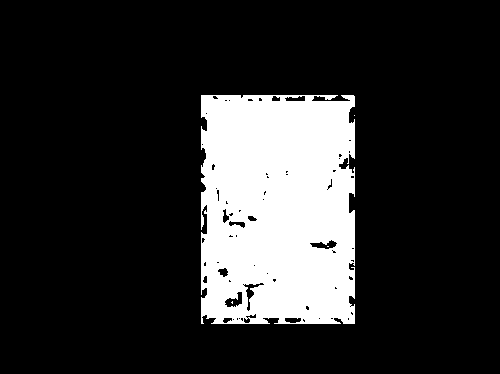

255
Image similarity: 0.9036996575968856


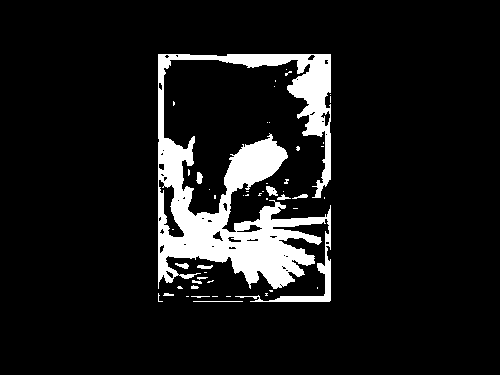

255
Image similarity: 0.9900256414195387


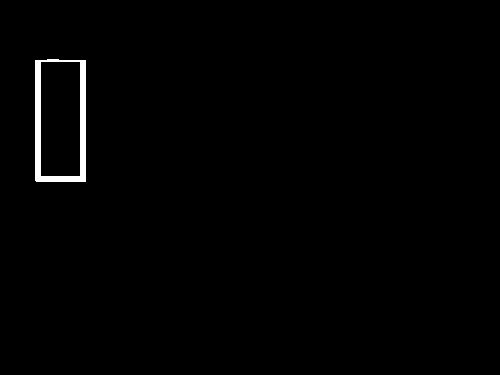

255
Image similarity: 0.9773551860157961


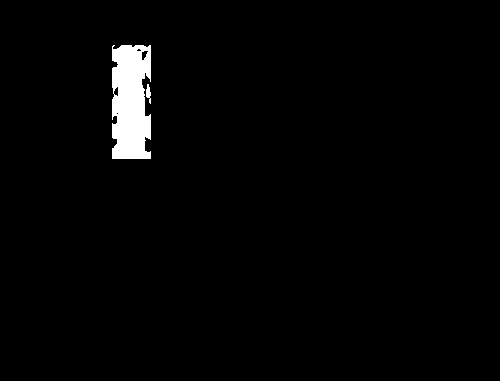

255
Image similarity: 0.8180584382312193


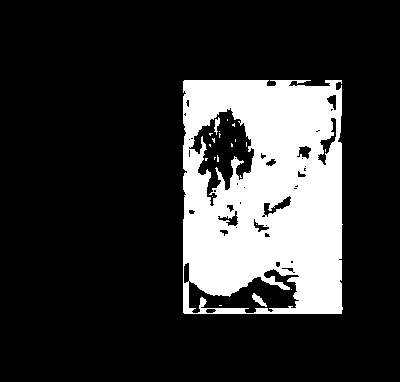

255
Image similarity: 0.8152706006881313


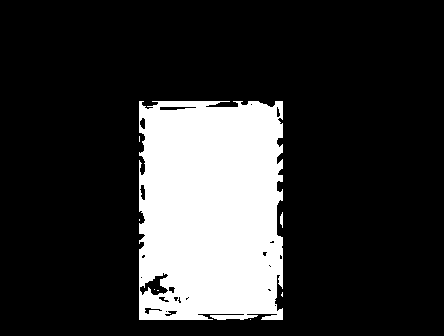

255
Image similarity: 0.9936104219567516


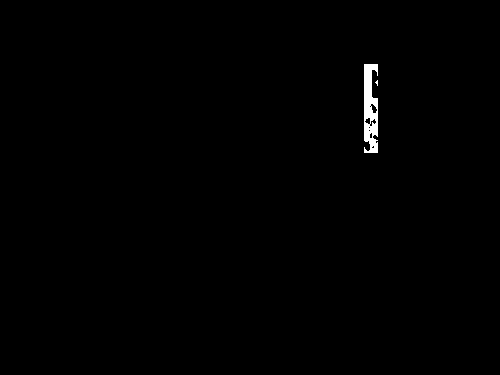

255
Image similarity: 0.9881435892422001


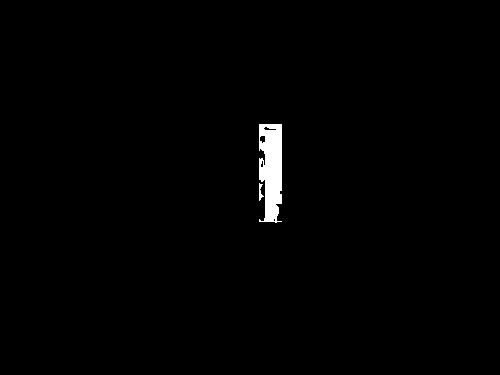

255
Image similarity: 0.9019490698999373


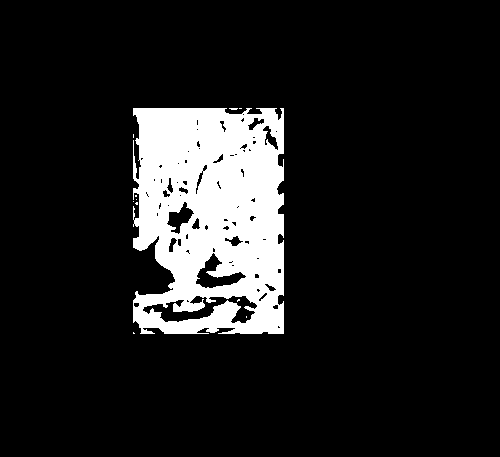

255
Image similarity: 0.9797368081806883


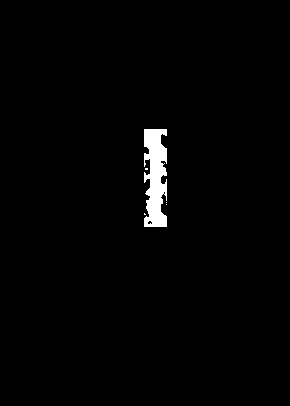

255
Image similarity: 0.9509471280816899


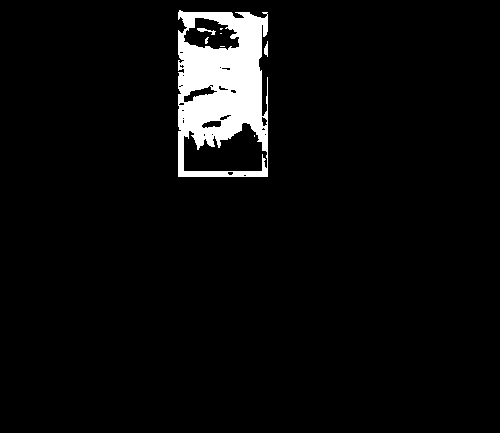

255
Image similarity: 0.9582108934035578


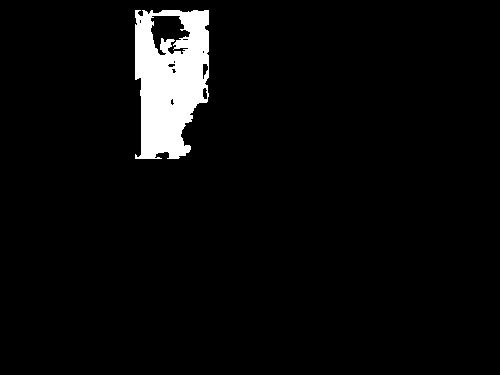

255
Image similarity: 0.9050997740580037


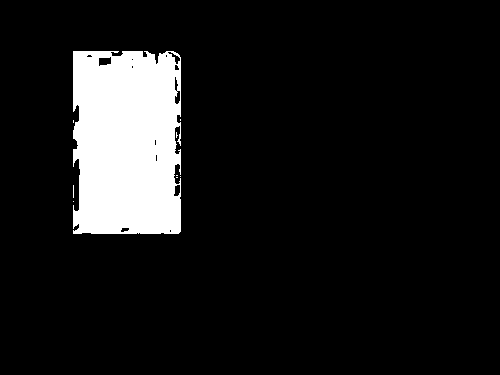

255
Image similarity: 0.9842008722339463


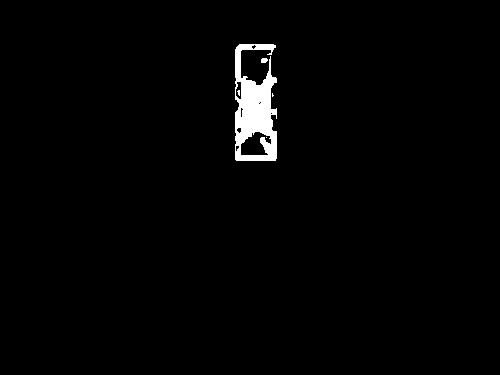

255
Image similarity: 0.9951807300941342


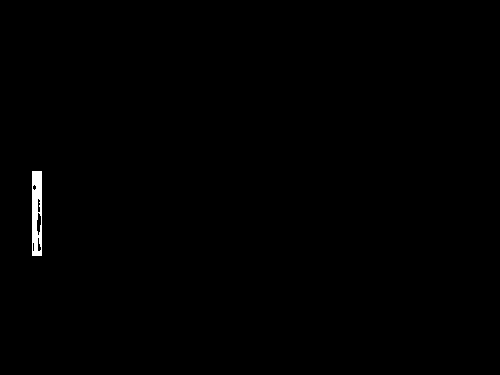

255
Image similarity: 0.8258110892259874


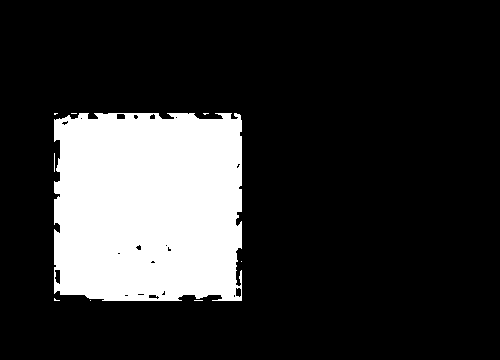

255
Image similarity: 0.8944294352458981


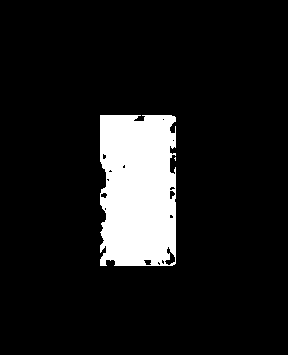

255
Image similarity: 0.9483268417379205


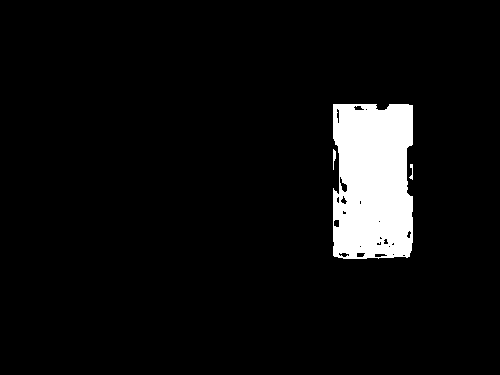

255
Image similarity: 0.9959742931273197


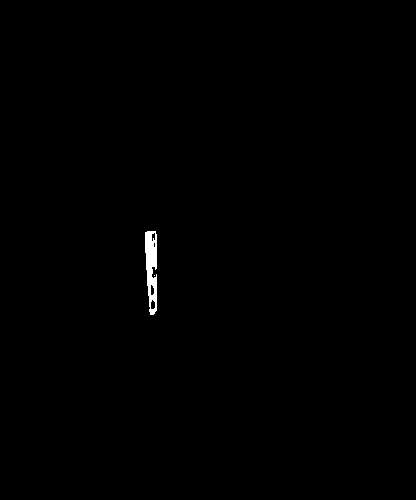

255
Image similarity: 0.9897037413417035


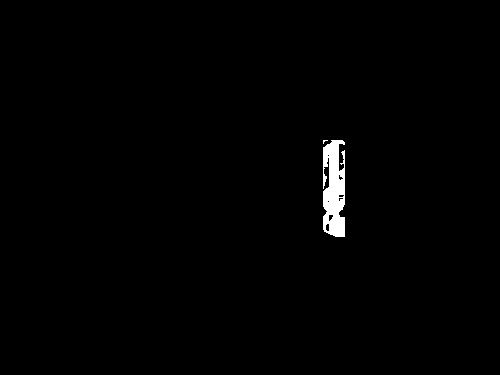

255
Image similarity: 0.8252785349723162


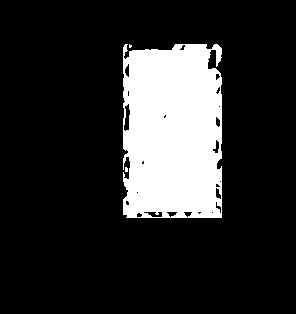

255
Image similarity: 0.97834322884386


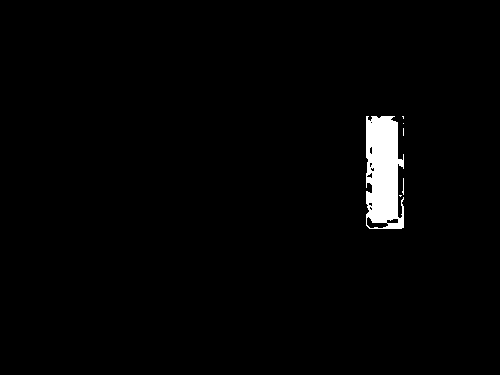

255
Image similarity: 0.984896184175645


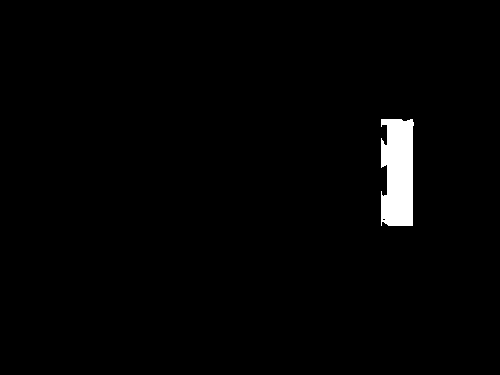

255
Image similarity: 0.9957396431916312


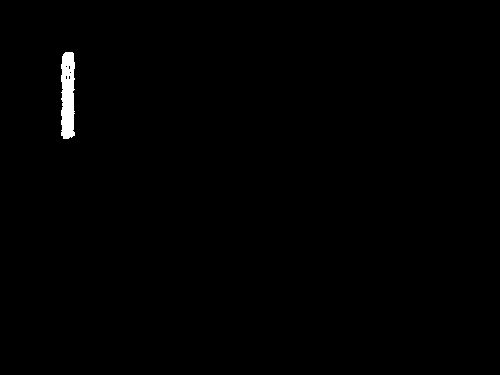

255
Image similarity: 0.9507932857472896


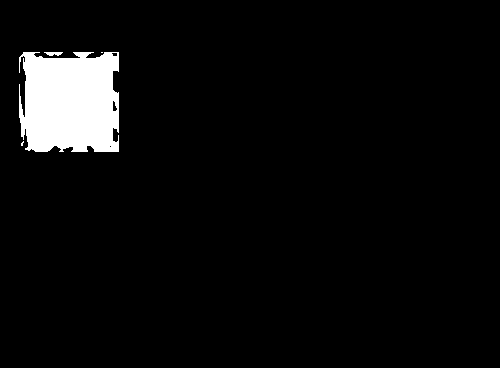

255
Image similarity: 0.8922706967065399


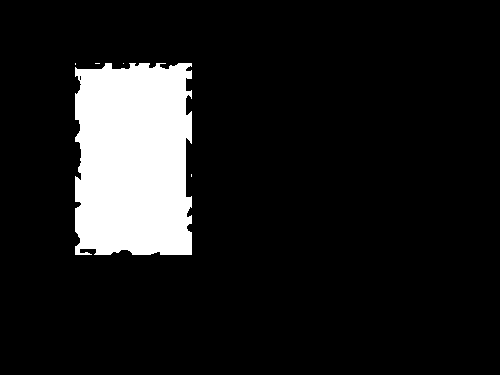

255
Image similarity: 0.9410360416308109


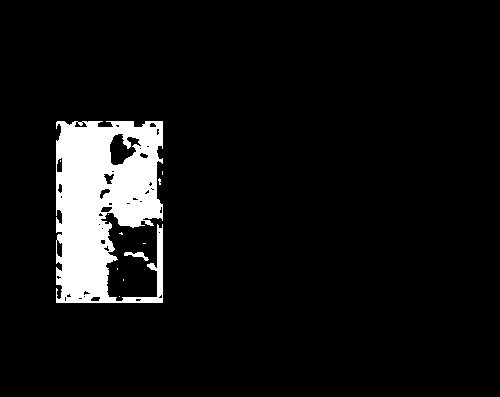

255
Image similarity: 0.9756584690102532


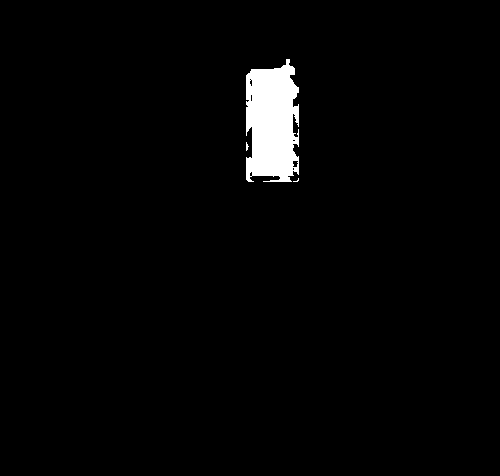

255
Image similarity: 0.9480998020224304


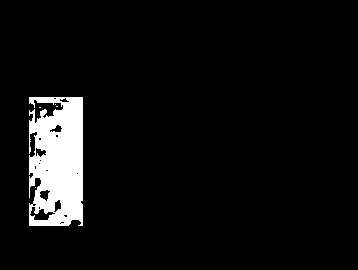

255
Image similarity: 0.9431458690590612


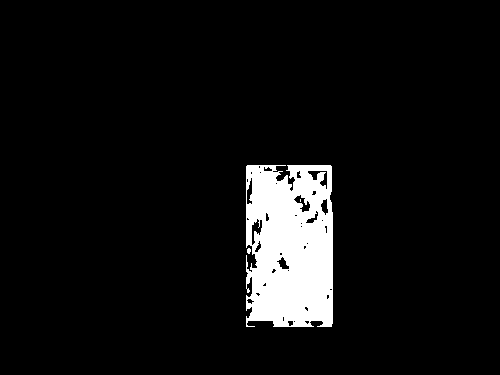

255
Image similarity: 0.9468413566965072


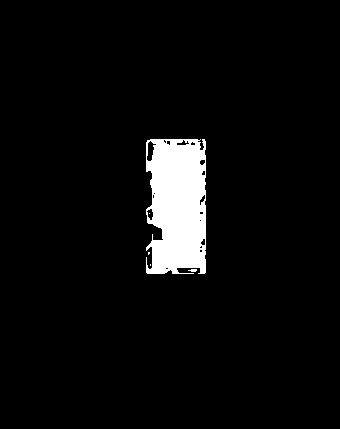

255
Image similarity: 0.9831767025698456


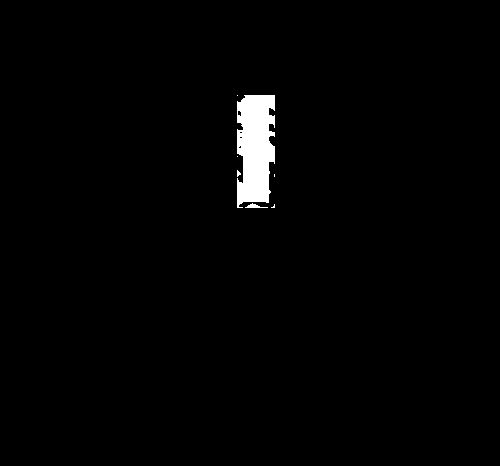

255
Image similarity: 0.9697522764818036


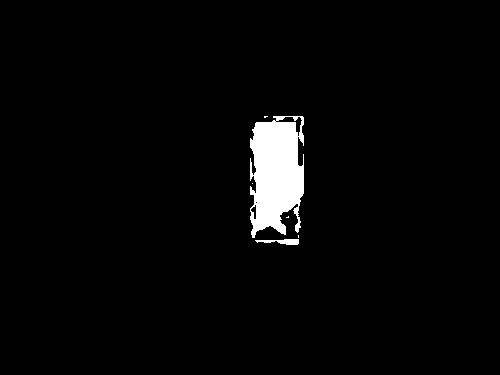

255
Image similarity: 0.9763558181409011


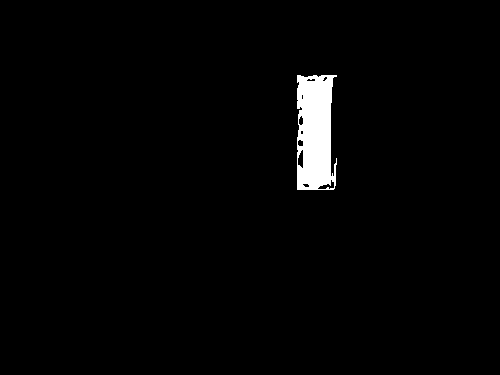

255
Image similarity: 0.9916736994826021


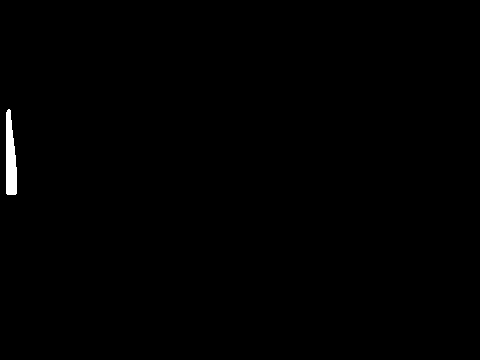

255
Image similarity: 0.7245134765218175


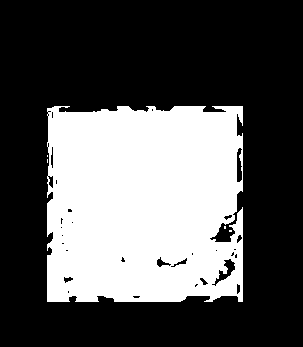

255
Image similarity: 0.934242199036414


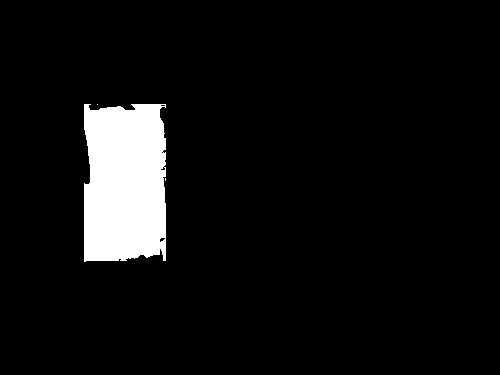

255
Image similarity: 0.9236686853822067


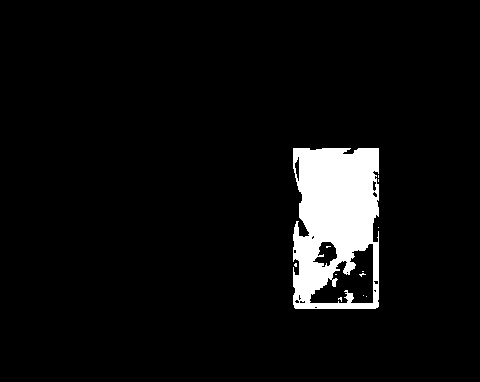

255
Image similarity: 0.9910273016263257


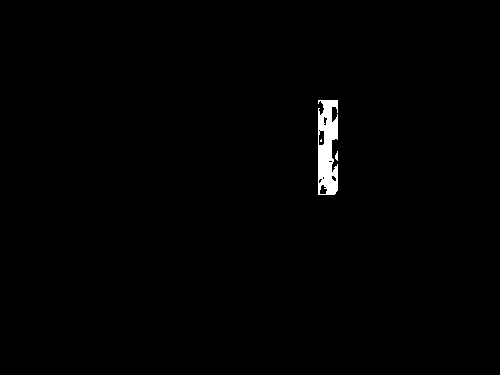

255
Image similarity: 0.8998419743389823


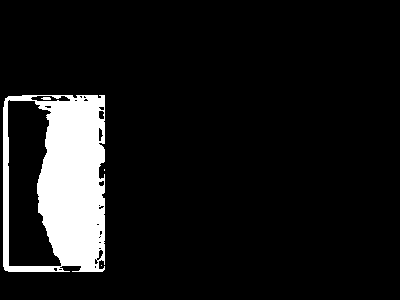

255
Image similarity: 0.9681134412020557


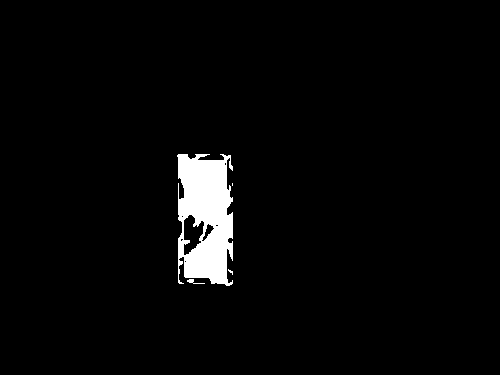

255
Image similarity: 0.954983816334422


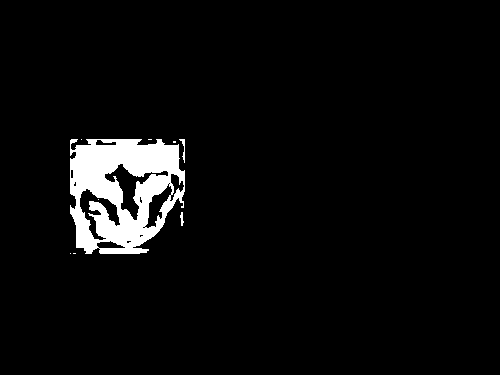

255
Image similarity: 0.9849476127795209


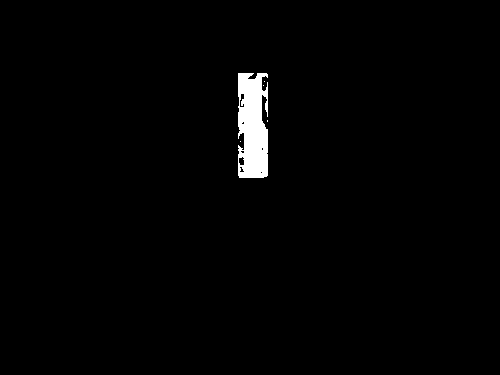

255
Image similarity: 0.9904636651042039


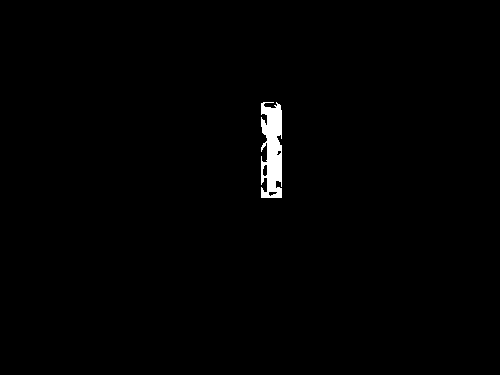

255
Image similarity: 0.8551024891482104


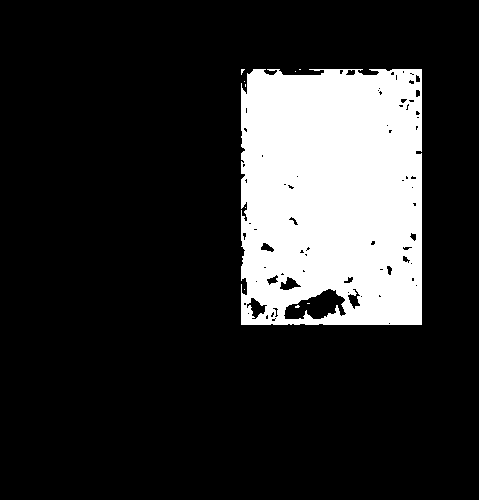

255
Image similarity: 0.8006503537605844


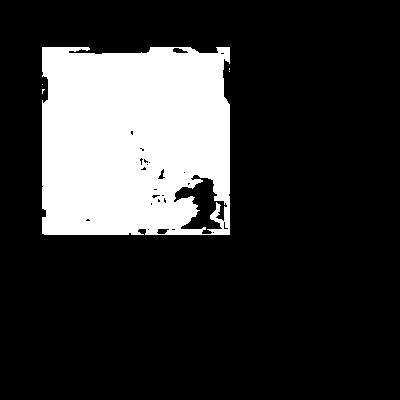

255
Image similarity: 0.9879512786579818


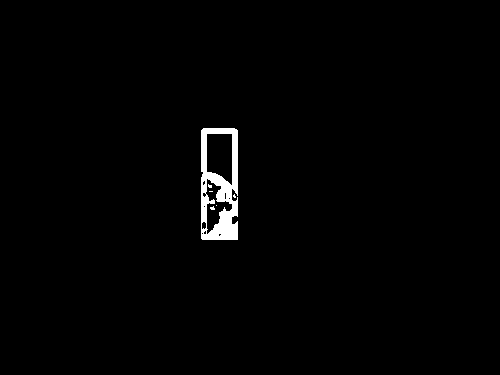

255
Image similarity: 0.9201143946413817


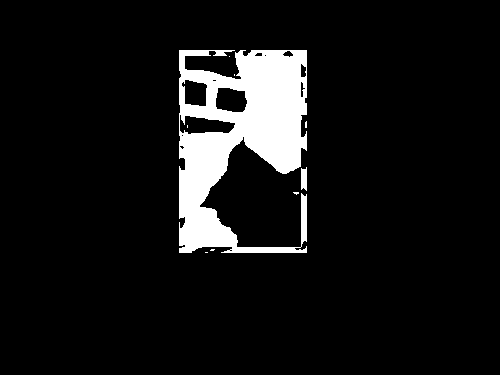

255
Image similarity: 0.7492252008515973


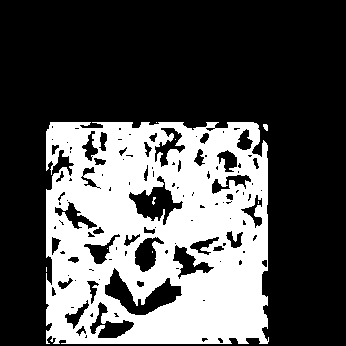

255
Image similarity: 0.9124885346018716


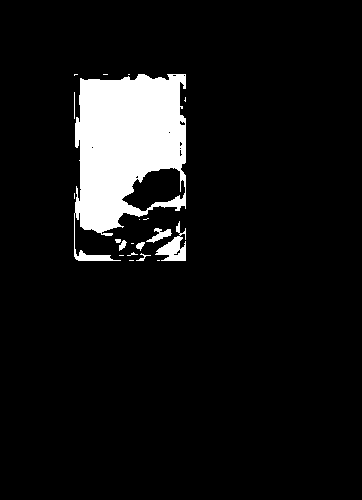

255
Image similarity: 0.8148455720131779


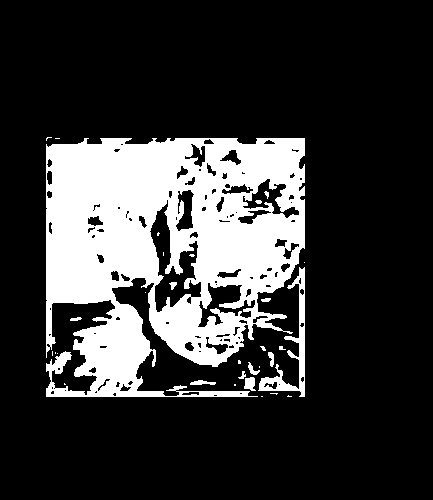

255
Image similarity: 0.810023680547022


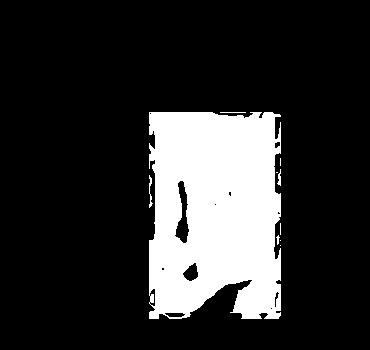

255
Image similarity: 0.9753177871619131


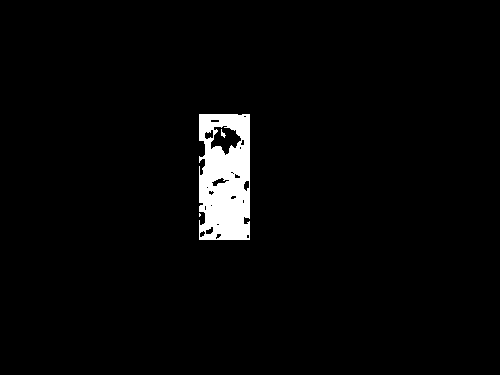

255
Image similarity: 0.9656730730436407


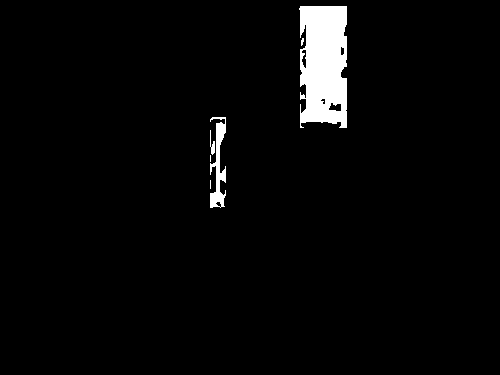

255
Image similarity: 0.9541309587428621


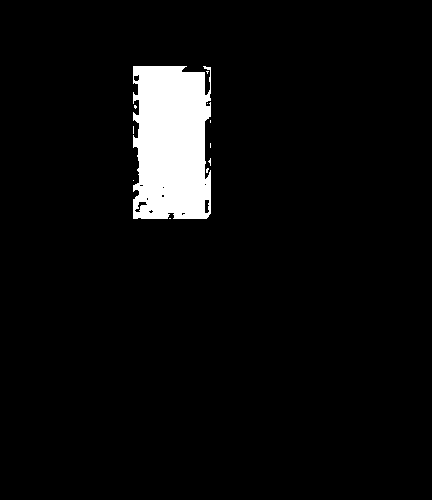

255
Image similarity: 0.9924812317782886


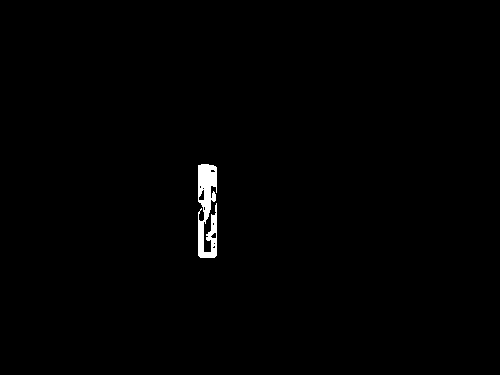

255
Image similarity: 0.9732374875570259


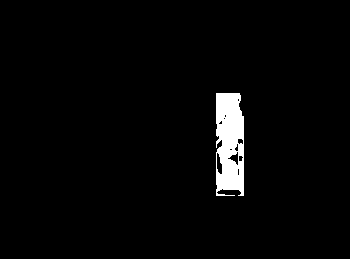

255
Image similarity: 0.9616225309191863


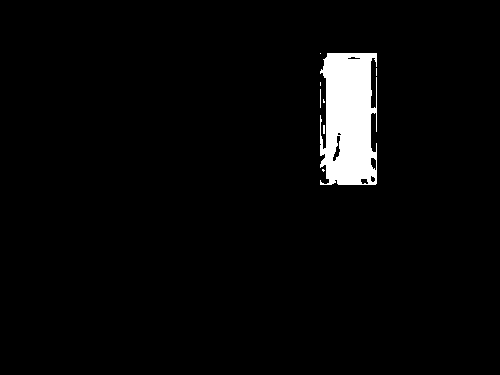

255
Image similarity: 0.839720188502768


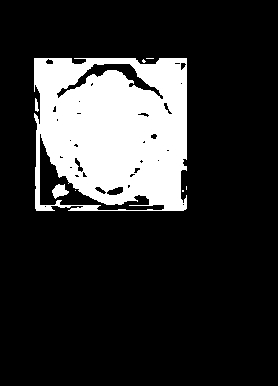

255
Image similarity: 0.9673781908340306


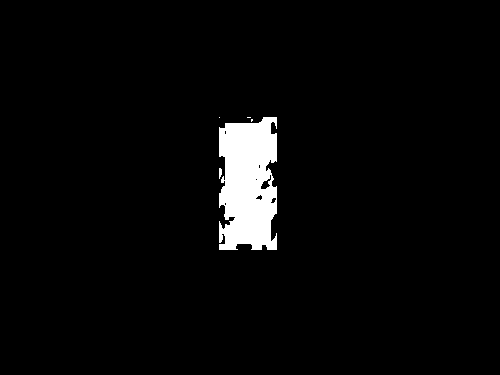

255
Image similarity: 0.9782735739104427


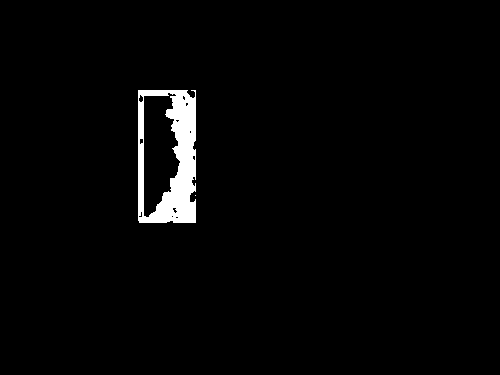

255
Image similarity: 0.9455050335817619


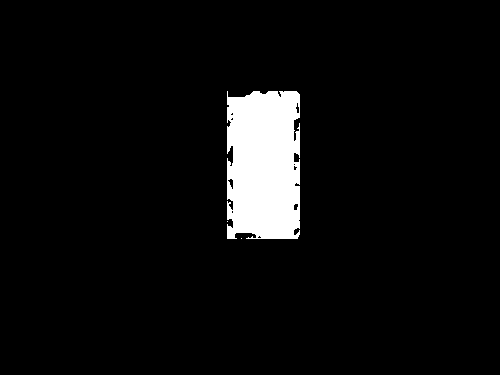

255
Image similarity: 0.9541984021942459


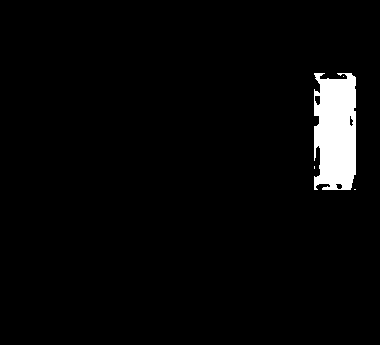

255
Image similarity: 0.8048565134387654


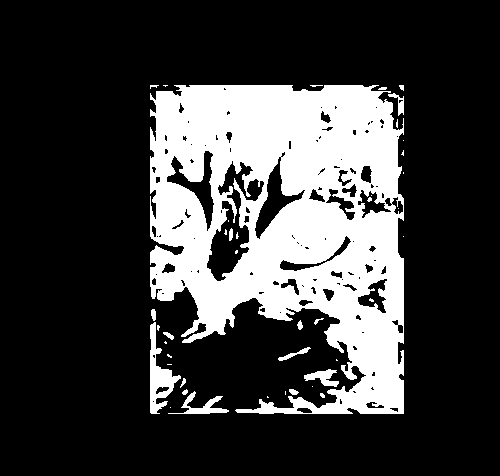

255
Image similarity: 0.9895308442629701


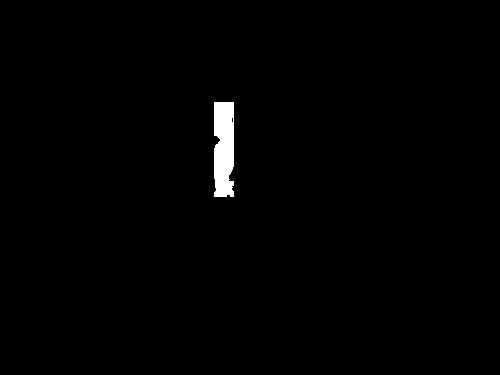

255
Image similarity: 0.9881735739453997


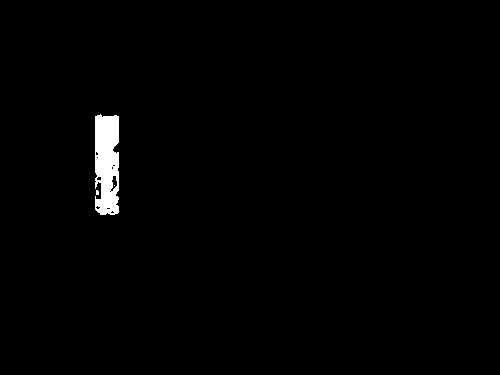

255
Image similarity: 0.922657108901593


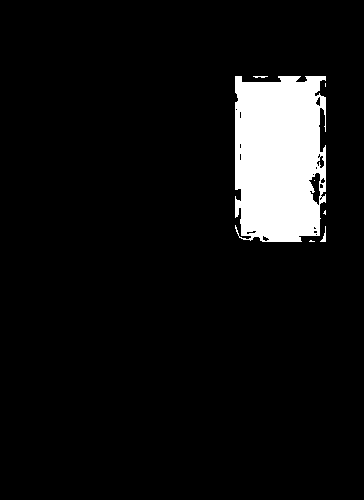

255
Image similarity: 0.8706682125350367


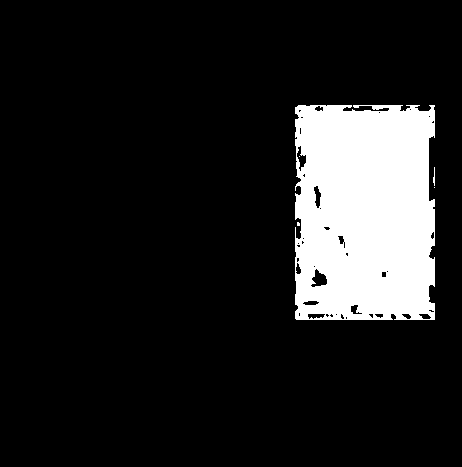

255
Image similarity: 0.9680004023393991


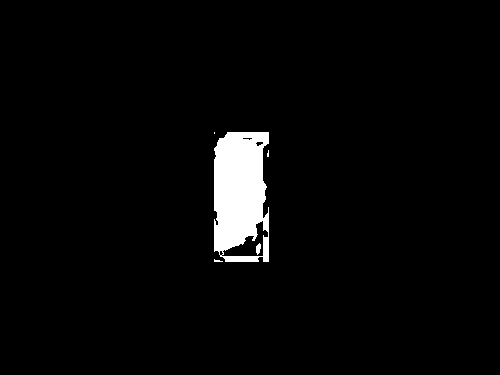

255
Image similarity: 0.789610619808125


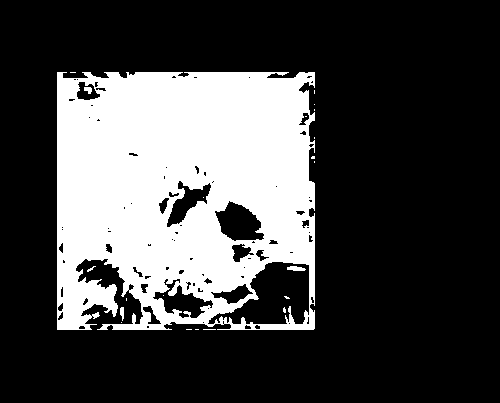

255
Image similarity: 0.8918000301663322


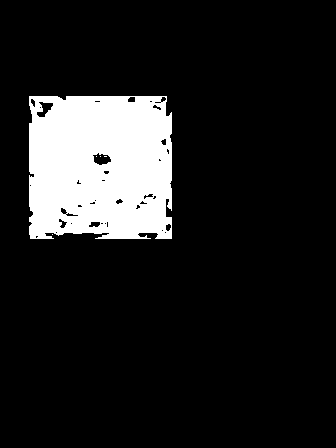

255
Image similarity: 0.985218728238777


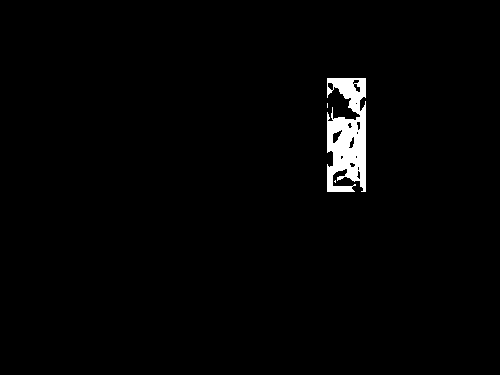

255
Image similarity: 0.8093573150982855


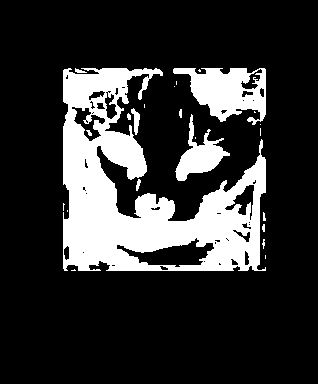

255
Image similarity: 0.9994005429954658


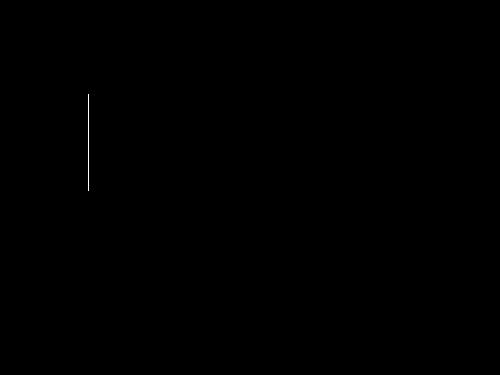

255
Image similarity: 0.9299218722177788


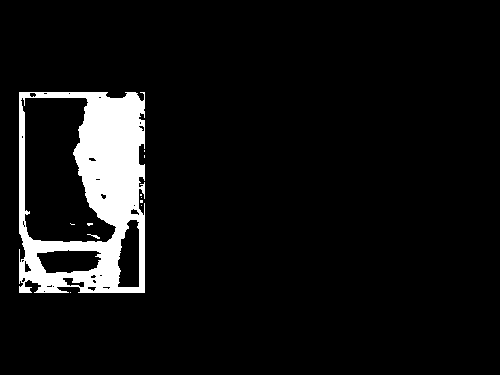

255
Image similarity: 0.9596406200312926


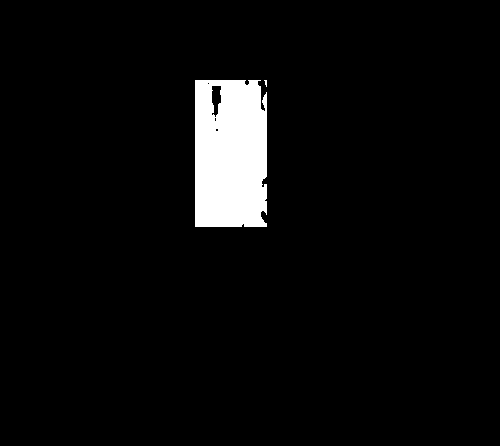

255
Image similarity: 0.9462083365303042


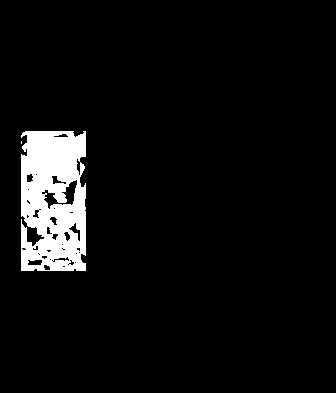

255
Image similarity: 0.9923477982976339


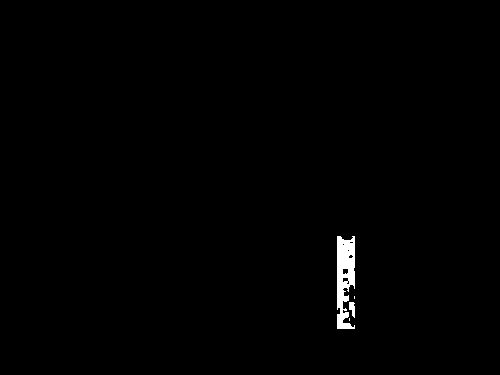

255
Image similarity: 0.9715864830106258


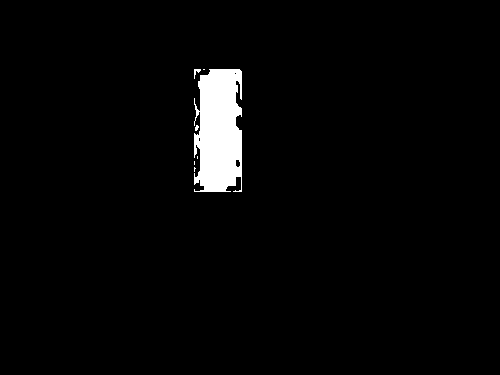

255
Image similarity: 0.980364607189181


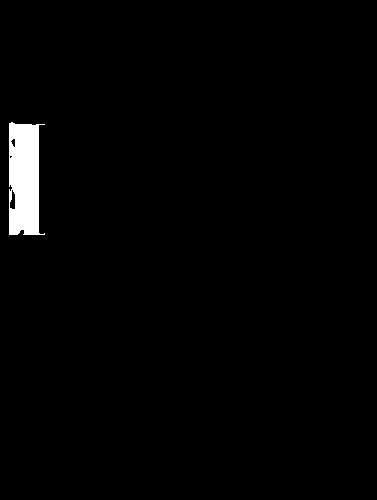

255
Image similarity: 0.8337452193122975


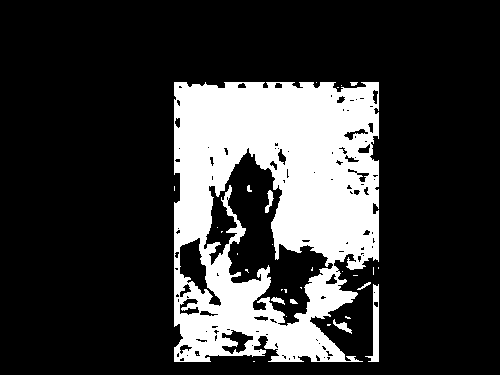

255
Image similarity: 0.9468973101332373


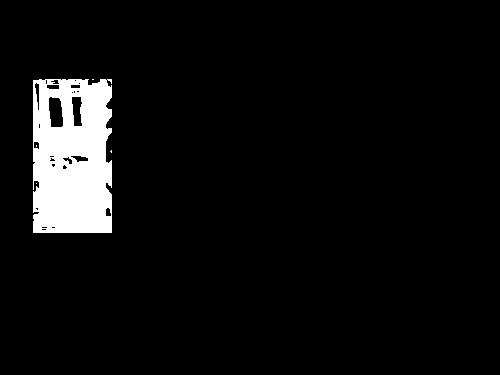

255
Image similarity: 0.9341675090532201


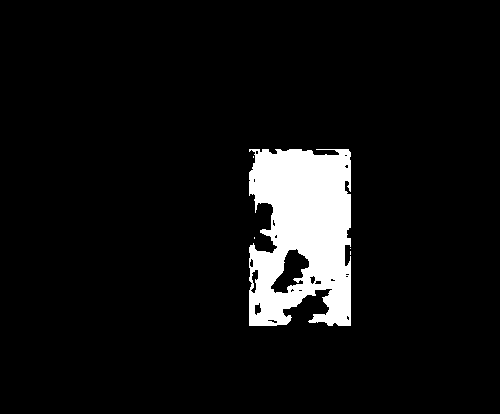

255
Image similarity: 0.9925357459725429


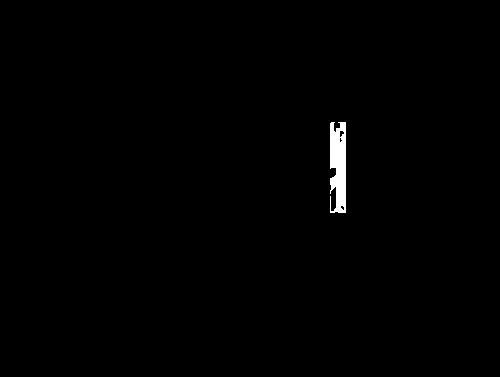

255
Image similarity: 0.9212644244229539


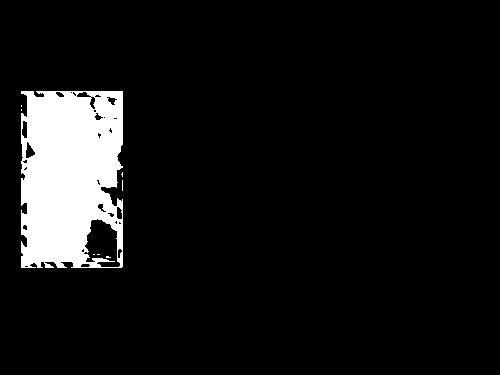

255
Image similarity: 0.7829739885380604


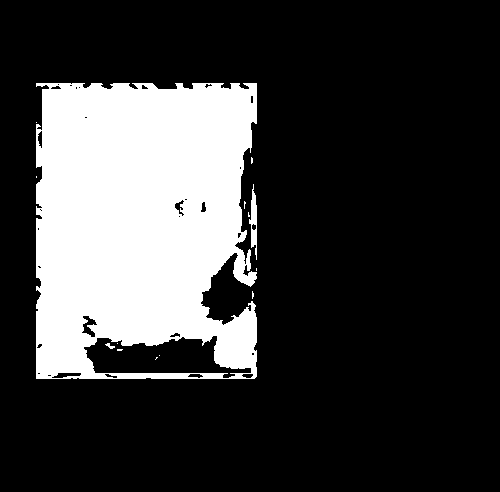

255
Image similarity: 0.9835067201309148


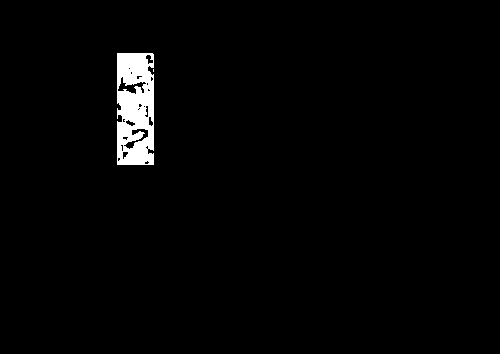

255
Image similarity: 0.9846652370465597


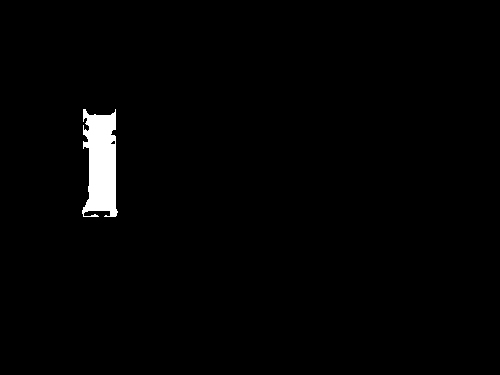

255
Image similarity: 0.9790380377826681


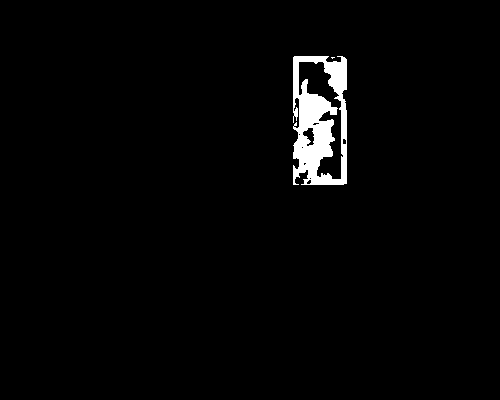

255
Image similarity: 0.9931769952169746


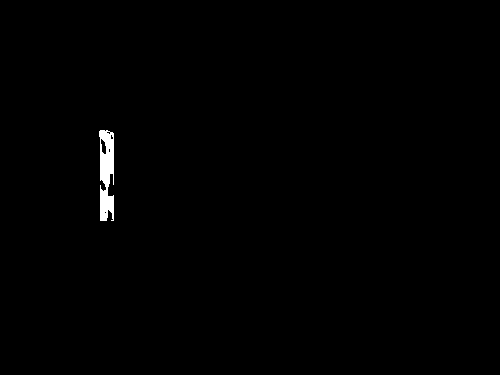

255
Image similarity: 0.9779996347311665


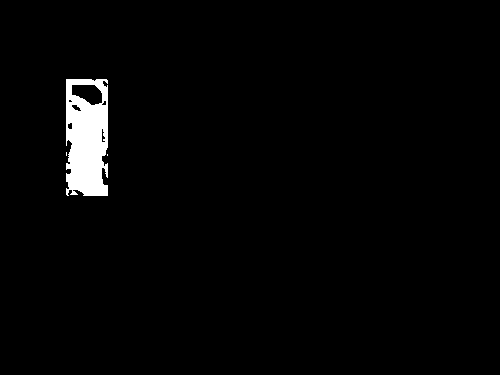

255
Image similarity: 0.8317105126928096


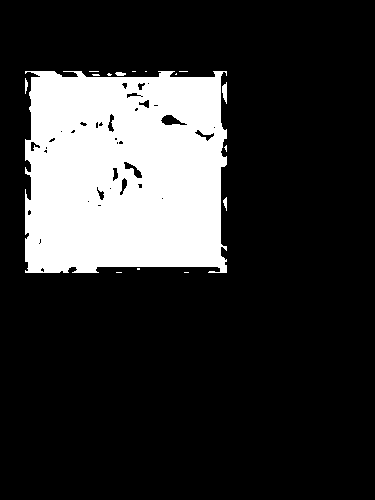

255
Image similarity: 0.9905049513730988


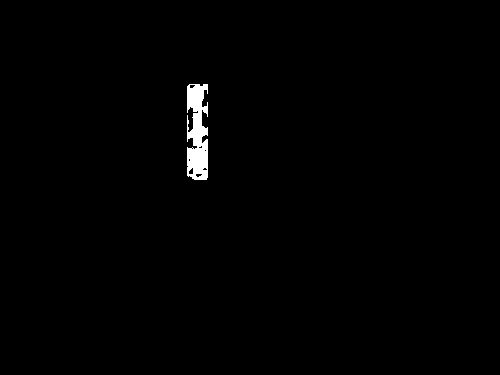

255
Image similarity: 0.9713131640249385


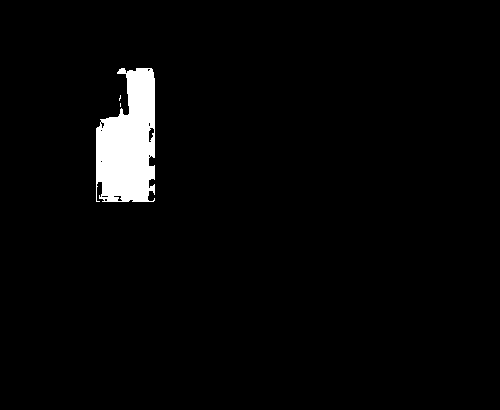

255
Image similarity: 0.9649425595107918


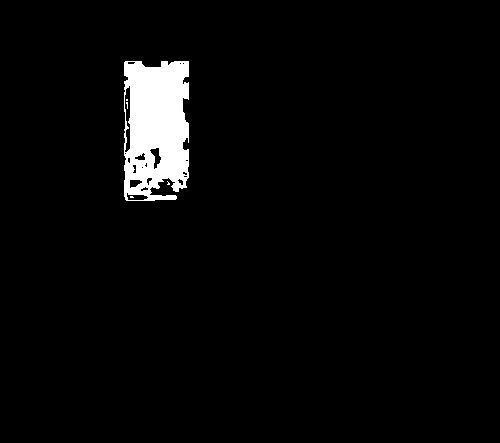

255
Image similarity: 0.9660487497164827


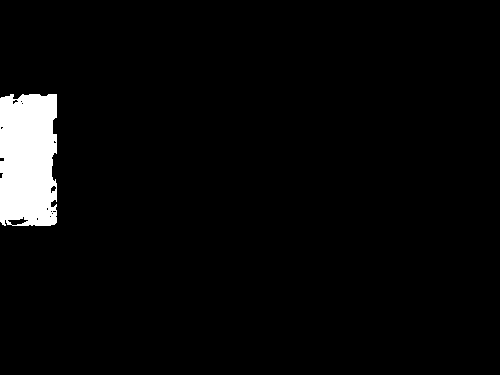

255
Image similarity: 0.7727776314694506


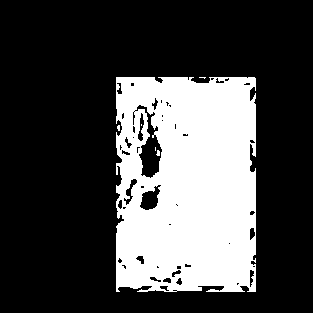

255
Image similarity: 0.9582593325535058


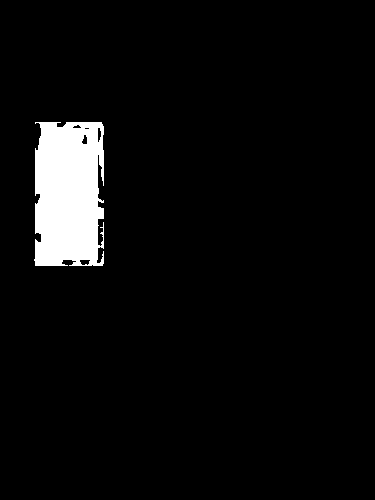

255
Image similarity: 0.9334619618994946


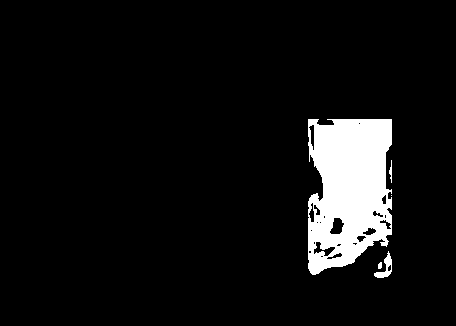

255
Image similarity: 0.9825552274894723


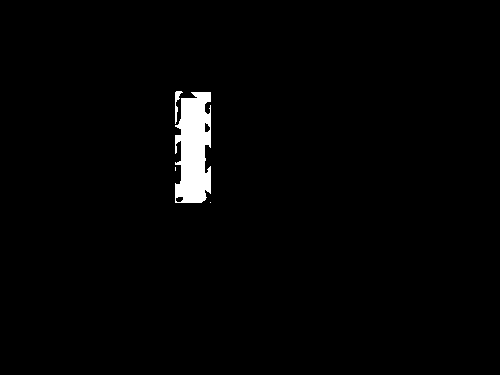

255
Image similarity: 0.9434186025602447


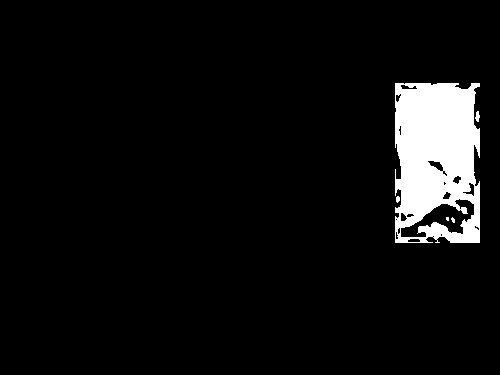

255
Image similarity: 0.7749032060841863


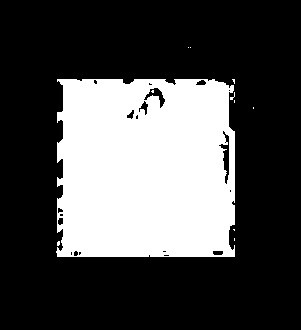

255
Image similarity: 0.9843744609426142


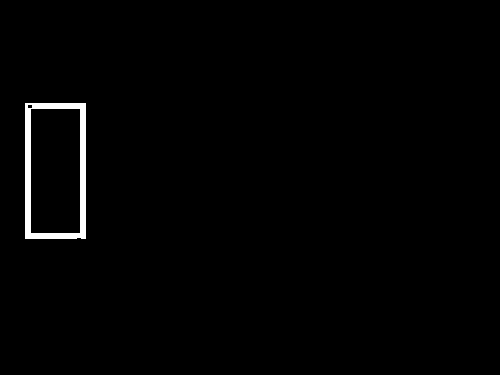

255
Image similarity: 0.9924255074530759


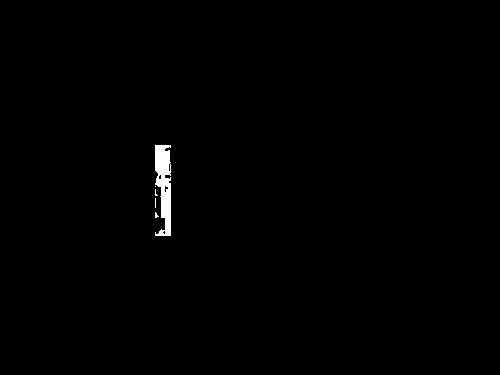

255
Image similarity: 0.9905897053508749


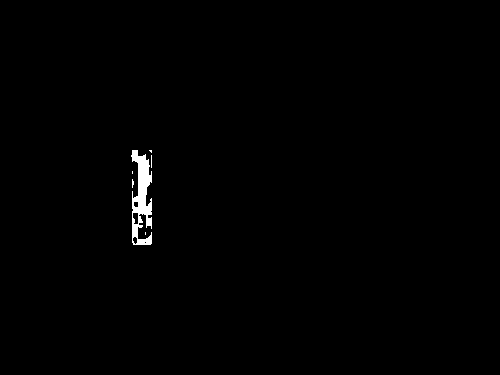

255
Image similarity: 0.9756224301862755


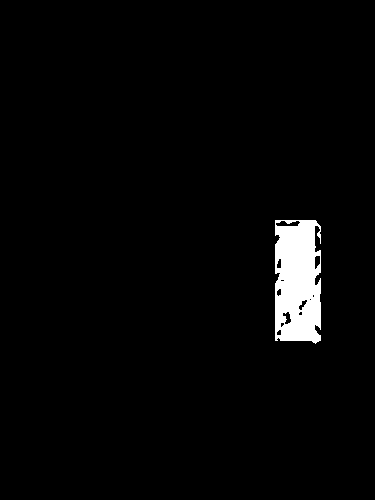

255
Image similarity: 0.9597953170250008


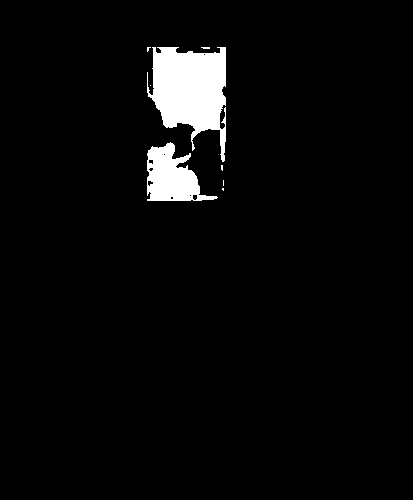

255
Image similarity: 0.9462262167018861


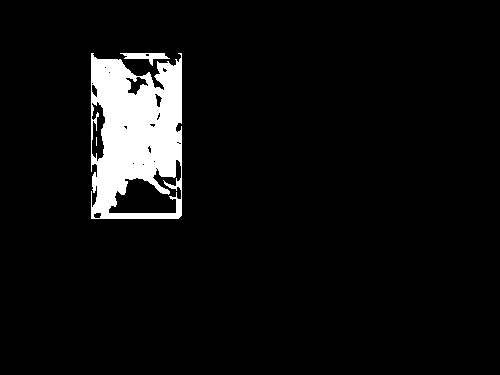

255
Image similarity: 0.9926994510254555


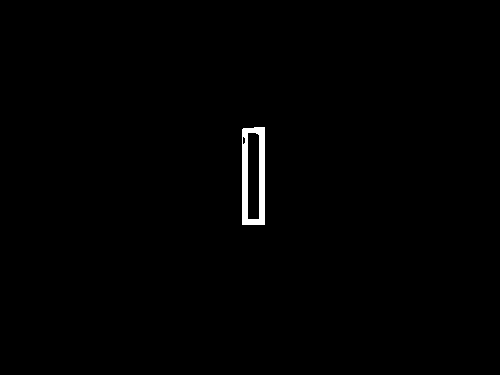

255
Image similarity: 0.9660336961168505


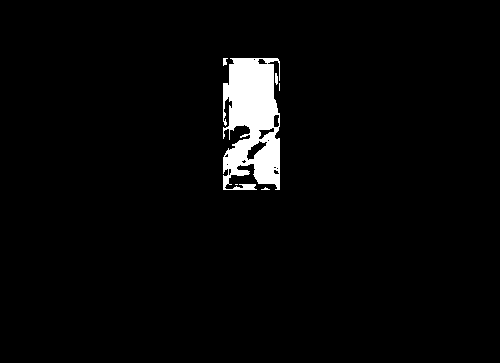

255
Image similarity: 0.9918191211743542


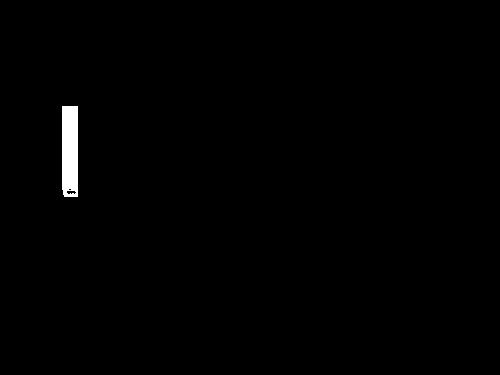

255
Image similarity: 0.9811301280518557


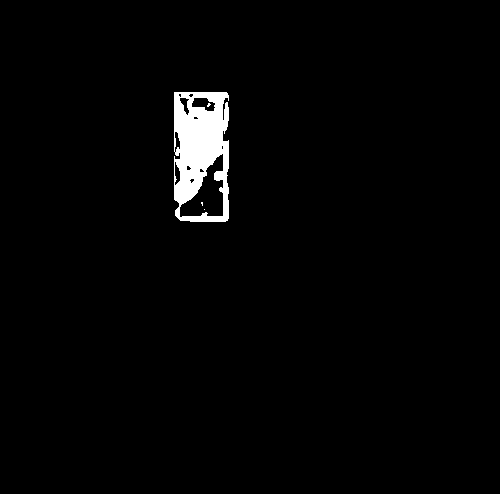

255
Image similarity: 0.9822462585631443


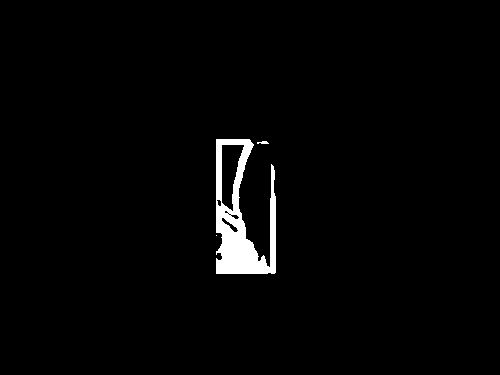

255
Image similarity: 0.9206474937707896


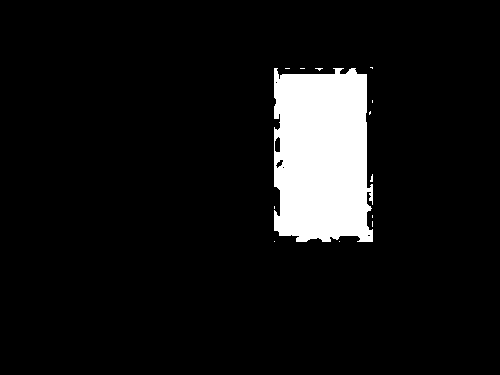

255
Image similarity: 0.8593766817050374


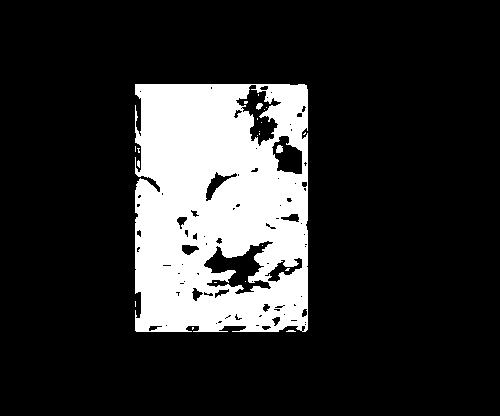

255
Image similarity: 0.9758888485533189


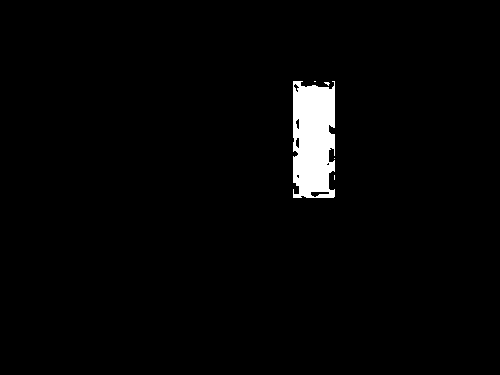

255
Image similarity: 0.9710640082546244


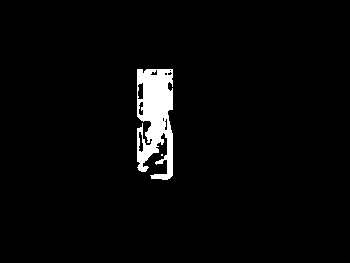

255
Image similarity: 0.9835183634874011


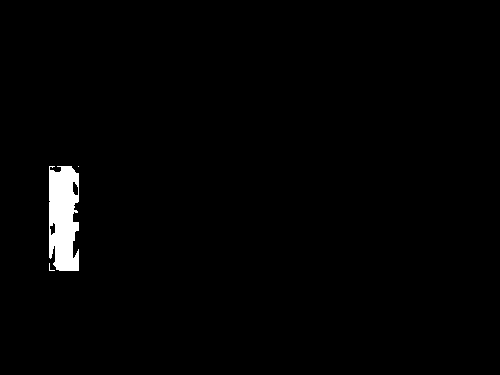

255
Image similarity: 0.9056238820872679


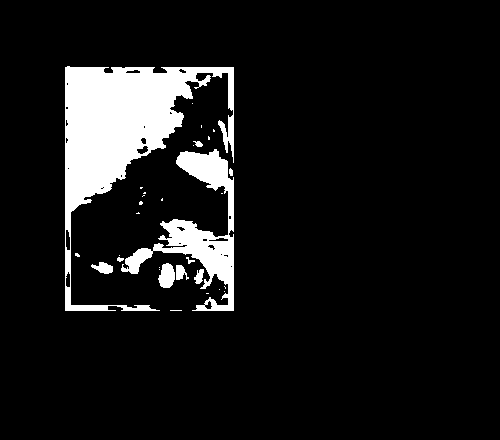

255
Image similarity: 0.9939393519589108


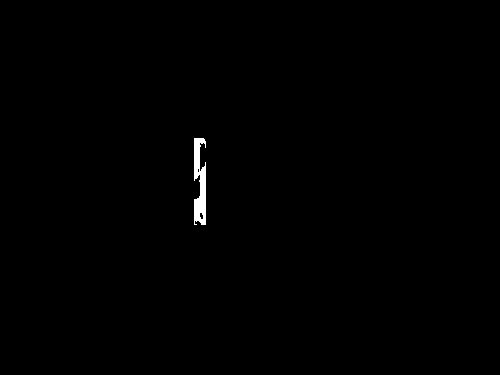

255
Image similarity: 0.8662363558375157


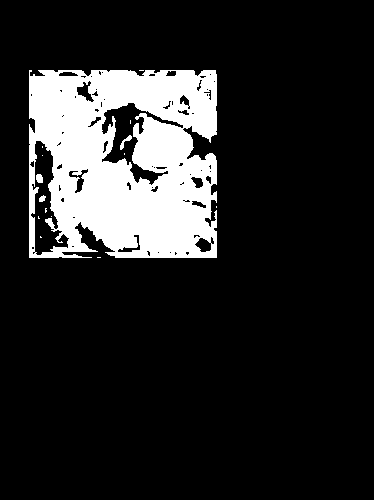

255
Image similarity: 0.93045952261526


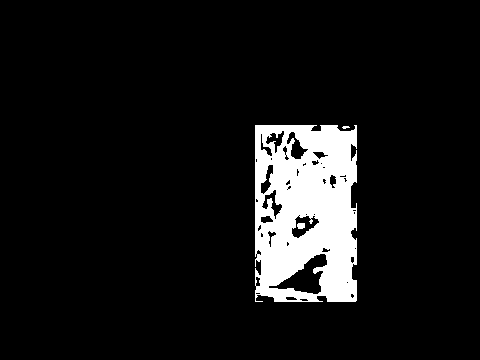

255
Image similarity: 0.8579531266505966


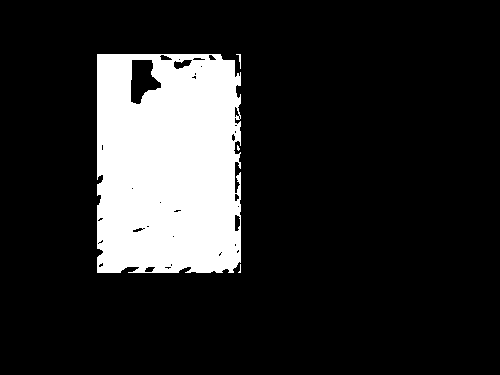

255
Image similarity: 0.9451632554667702


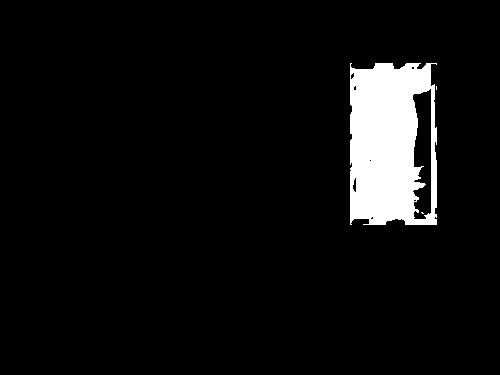

255
Image similarity: 0.9722465272041444


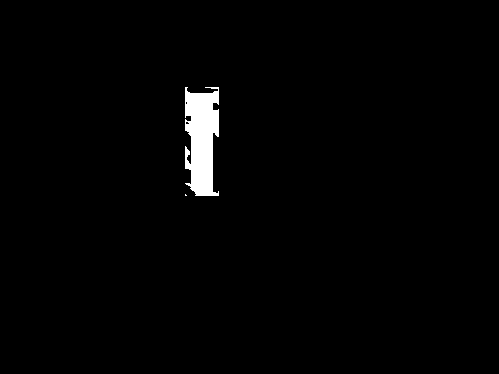

255
Image similarity: 0.9576672622795932


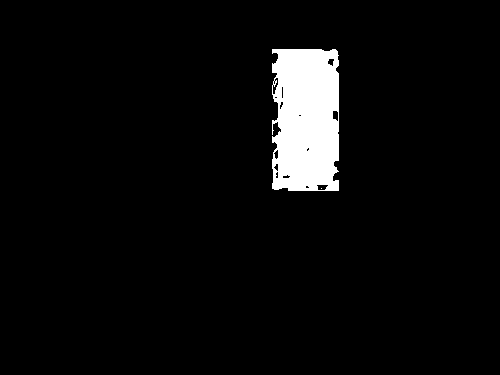

255
Image similarity: 0.8534593554252679


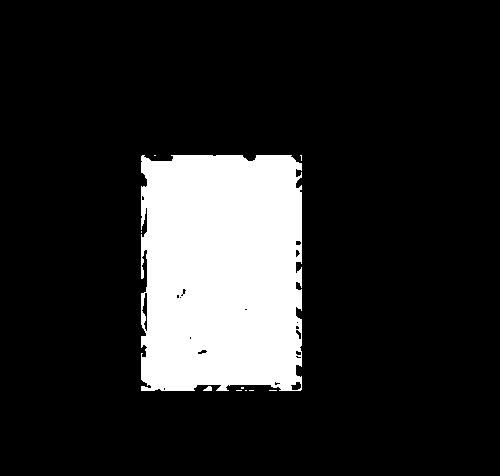

255
Image similarity: 0.9805226487014035


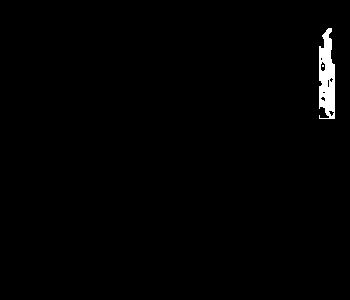

255
Image similarity: 0.97157205260373


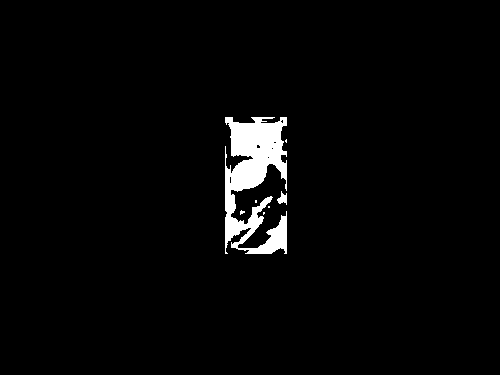

255
Image similarity: 0.9574427726685598


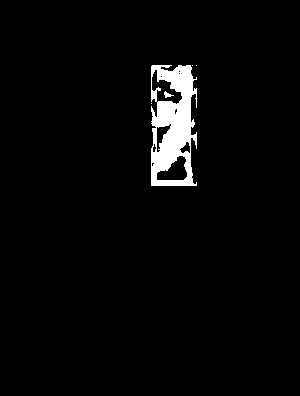

255
Image similarity: 0.9347356937998124


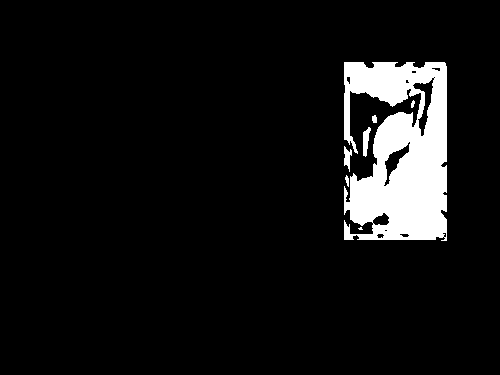

255
Image similarity: 0.9946634554747299


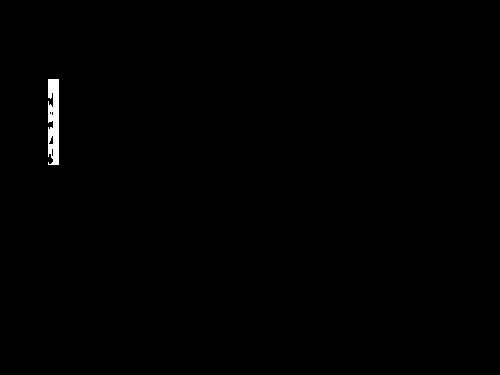

255
Image similarity: 0.8923172392221439


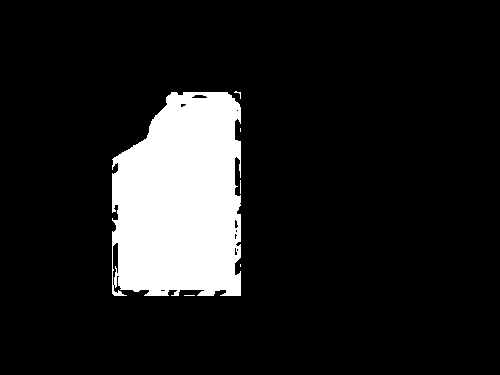

255
Image similarity: 0.8209319623375789


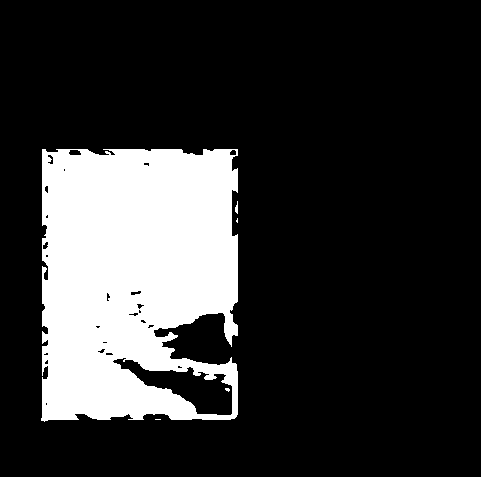

255
Image similarity: 0.9357677153065883


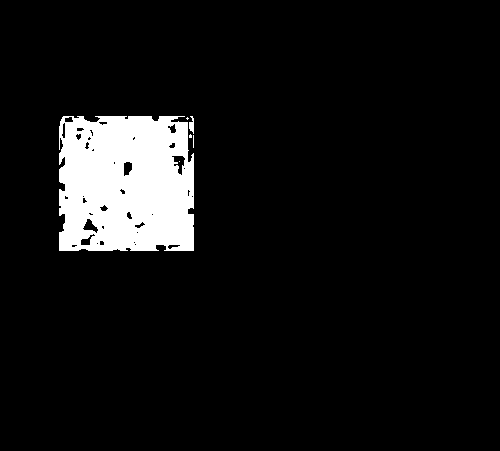

255
Image similarity: 0.9509579805937931


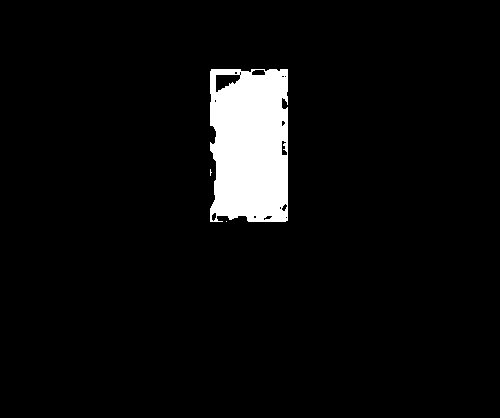

255
Image similarity: 0.9517101318324294


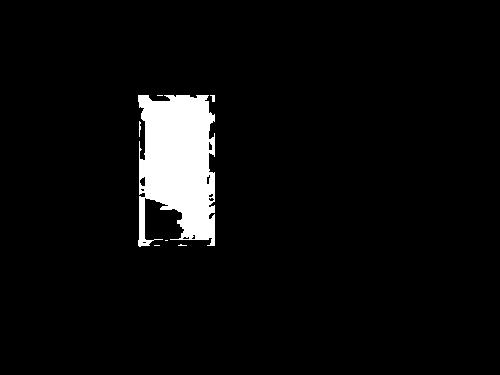

255
Image similarity: 0.9351852951781289


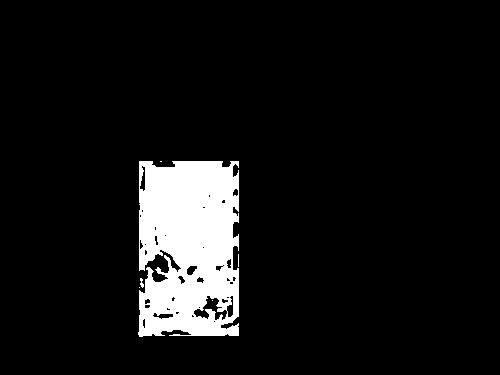

255
Image similarity: 0.9436368349016547


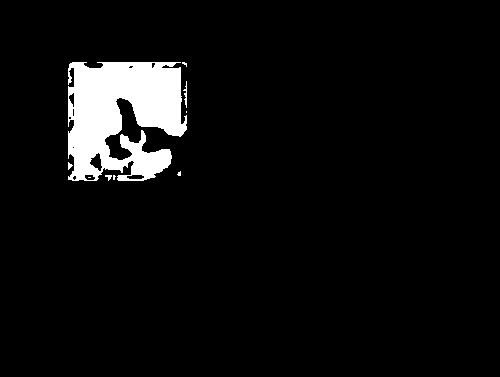

255
Image similarity: 0.951120508556318


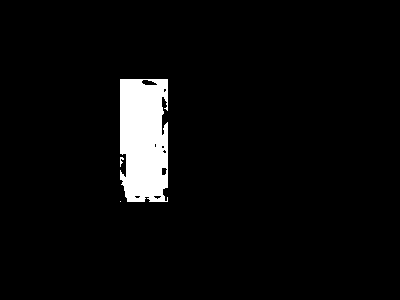

255
Image similarity: 0.9814661547762166


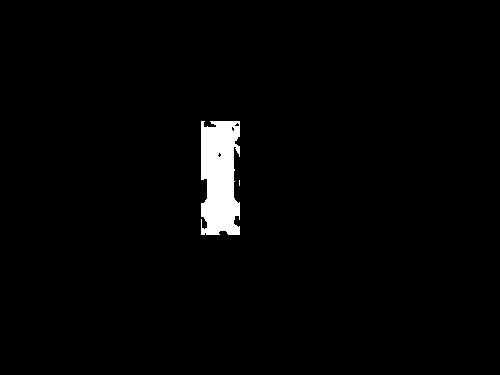

255
Image similarity: 0.7917553005720784


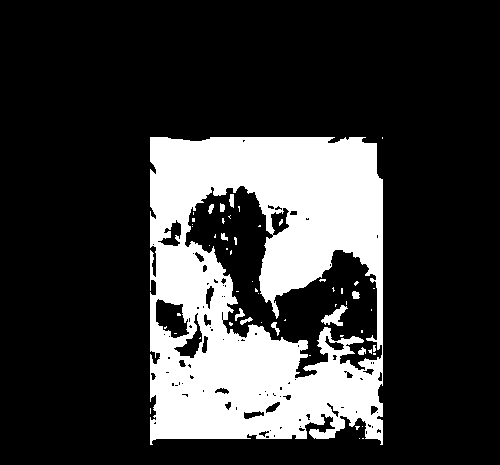

255
Image similarity: 0.9444477780056332


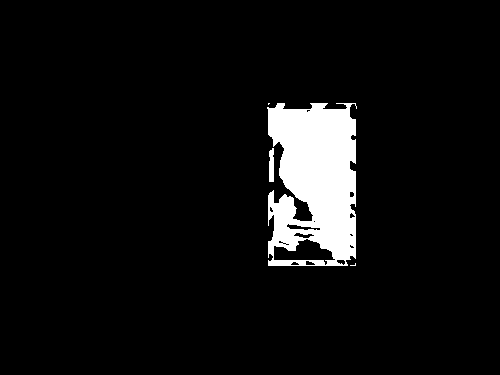

255
Image similarity: 0.8016188833636361


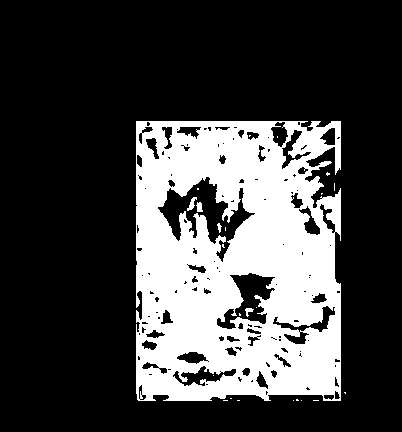

255
Image similarity: 0.8655698518610394


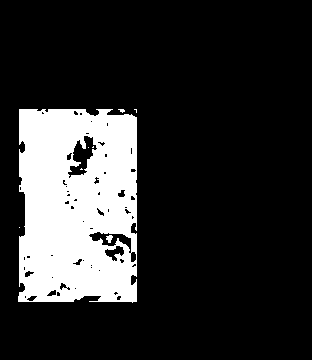

255
Image similarity: 0.9932038672449774


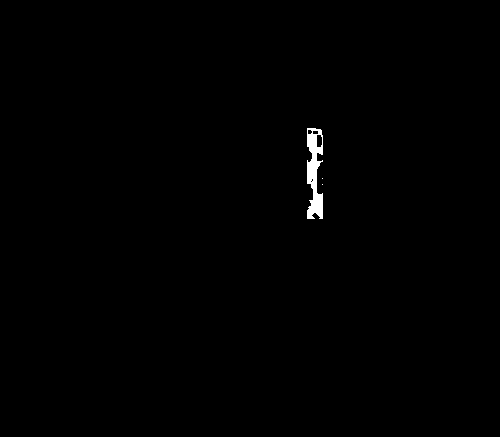

255
Image similarity: 0.9888751275353634


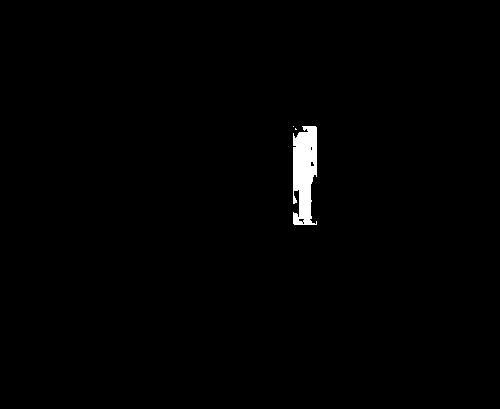

255
Image similarity: 0.9760505779177073


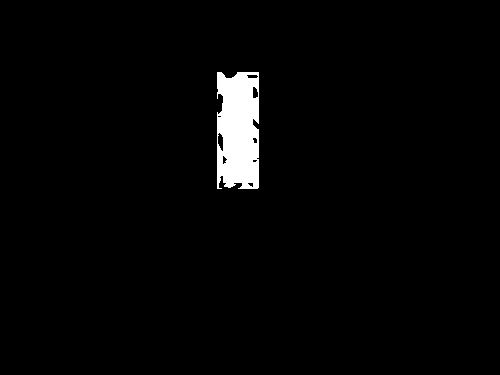

255
Image similarity: 0.972660899353176


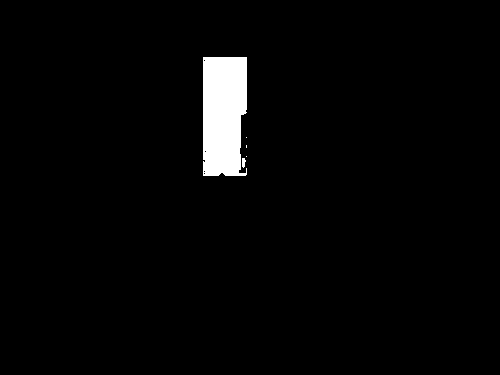

255
Image similarity: 0.9776524281519402


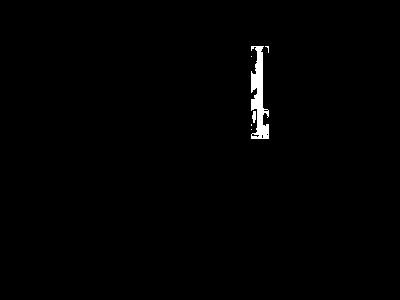

255
Image similarity: 0.9941098410078071


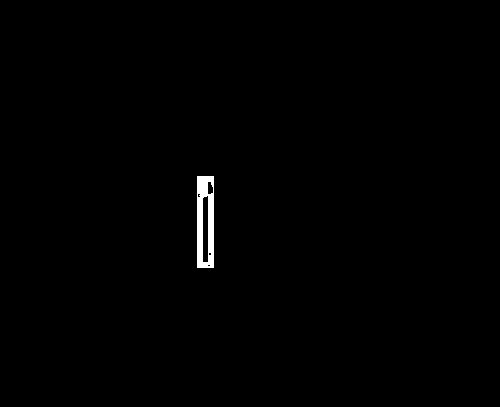

255
Image similarity: 0.9530052987427312


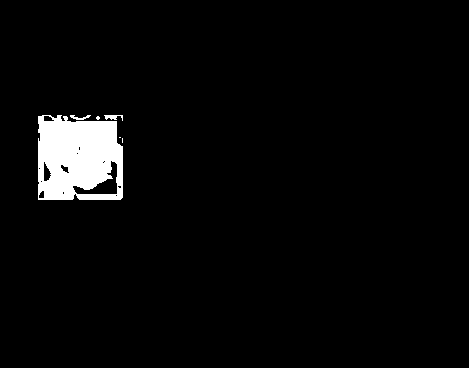

255
Image similarity: 0.9193246573140427


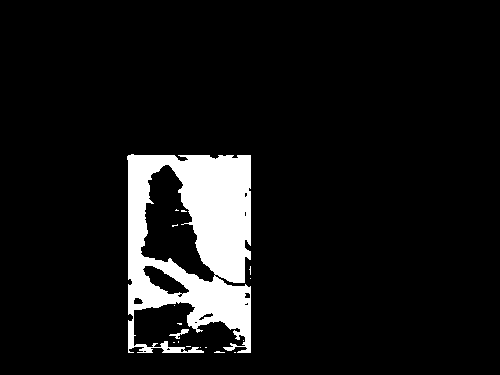

255
Image similarity: 0.9787043015979443


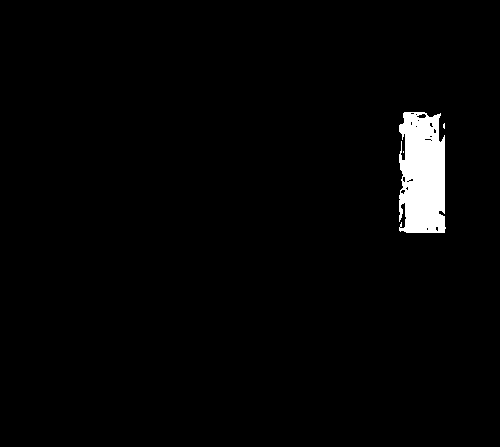

255
Image similarity: 0.9866639134973542


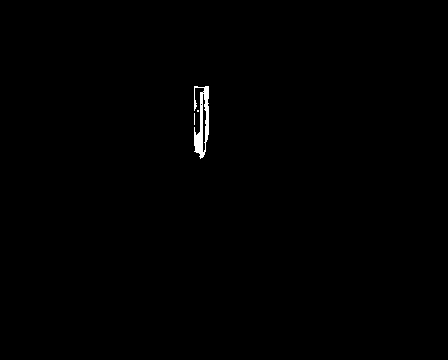

255
Image similarity: 0.8892002168185508


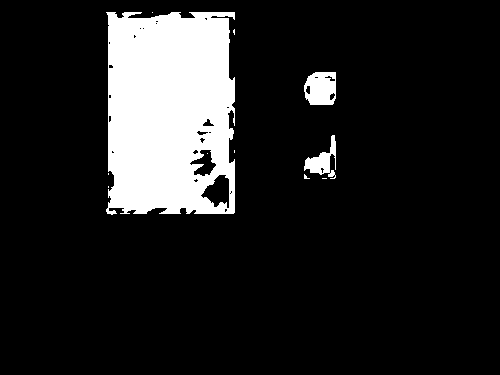

255
Image similarity: 0.9465238455324437


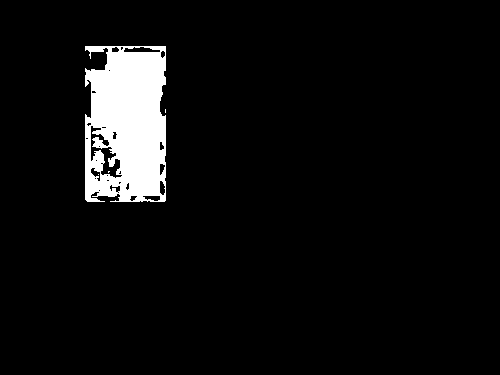

255
Image similarity: 0.8870866042680381


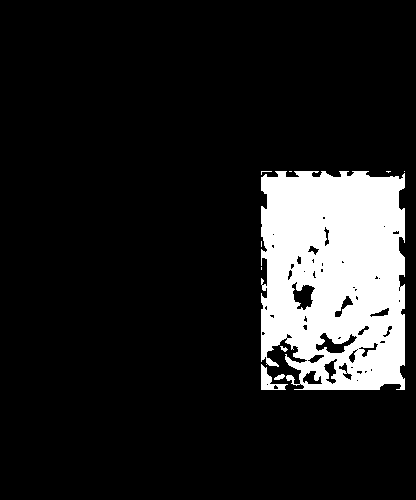

255
Image similarity: 0.9871061222749338


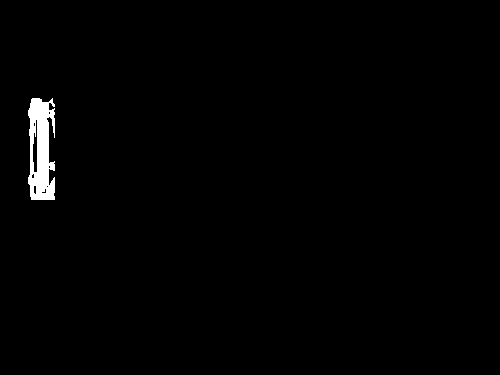

255
Image similarity: 0.9549986541531771


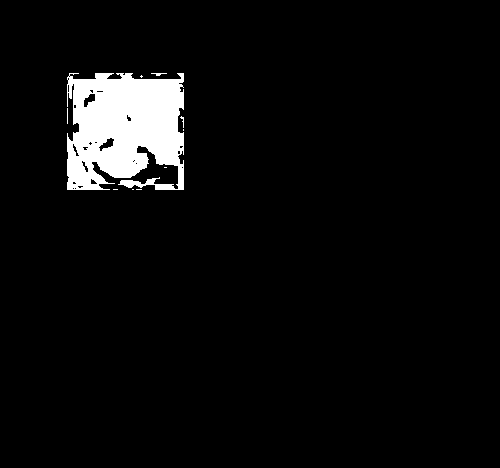

255
Image similarity: 0.9218701760819199


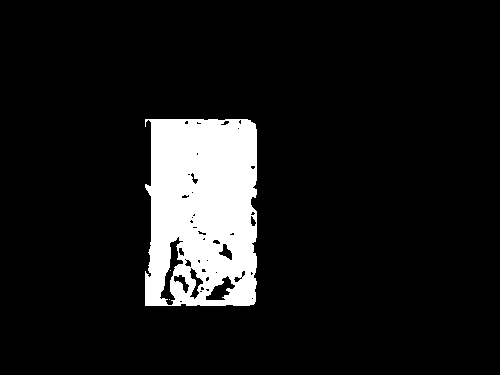

255
Image similarity: 0.9972884095765795


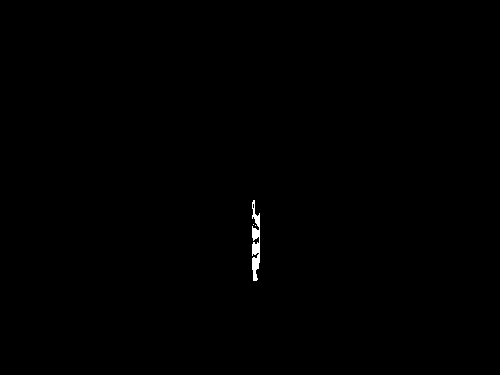

255
Image similarity: 0.9025662760691193


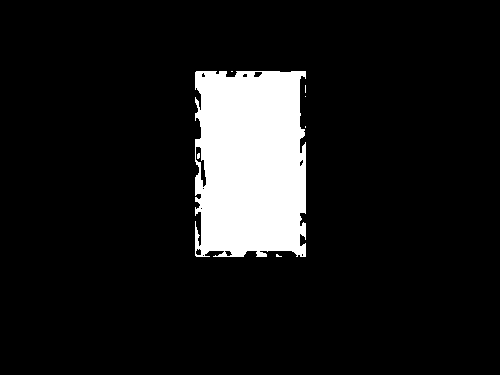

255
Image similarity: 0.6361038458745494


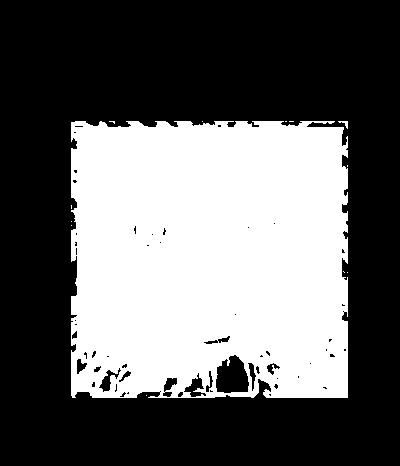

255
Image similarity: 0.9093152492037004


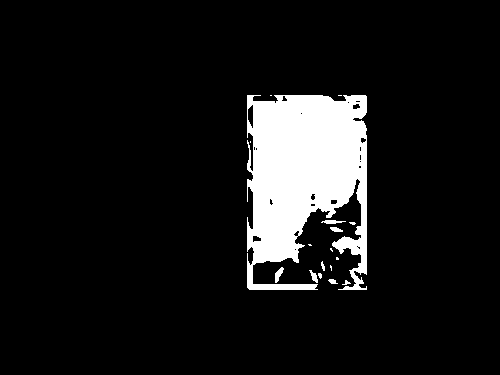

255
Image similarity: 0.9766051831689953


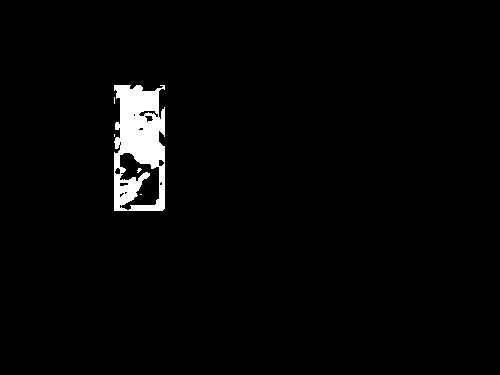

255
Image similarity: 0.9777566240322177


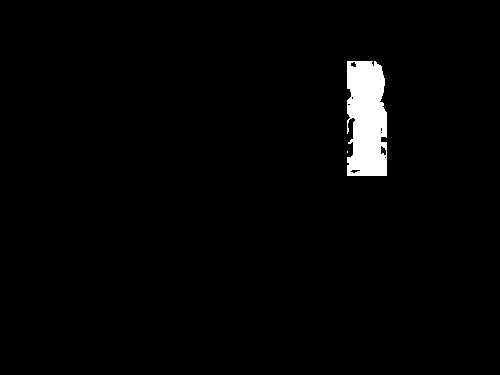

255
Image similarity: 0.9188004877191968


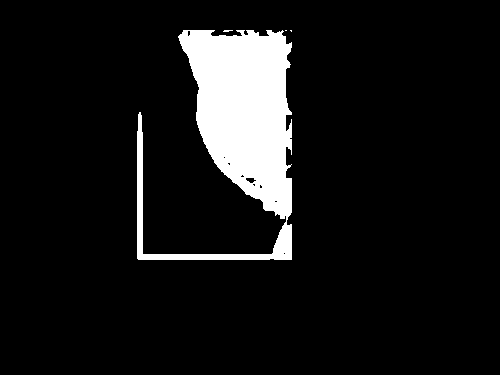

255
Image similarity: 0.7425668770805499


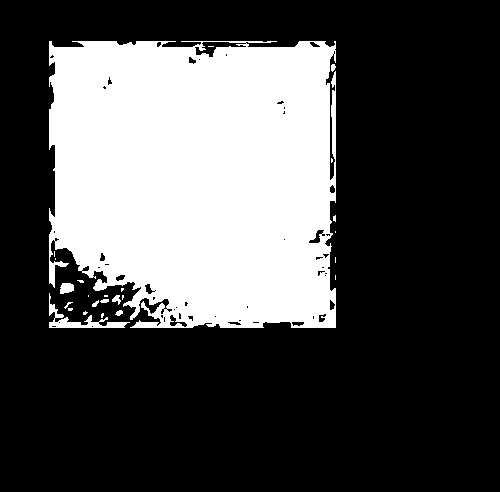

255
Image similarity: 0.8428666868632013


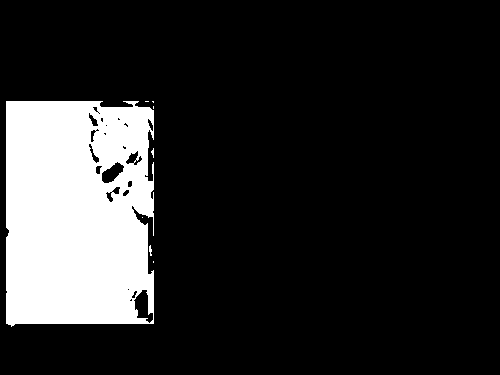

255
Image similarity: 0.9886000174707317


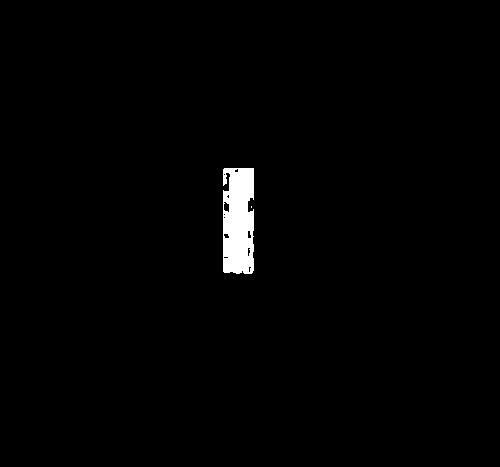

255
Image similarity: 0.9917636489978507


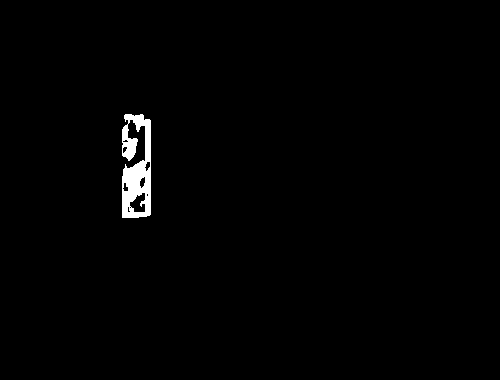

255
Image similarity: 0.9691691479191938


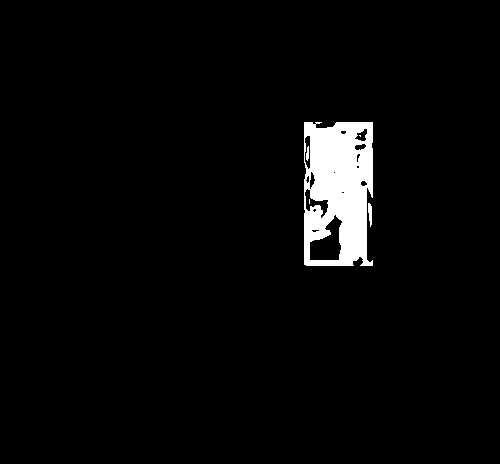

255
Image similarity: 0.9771555186296866


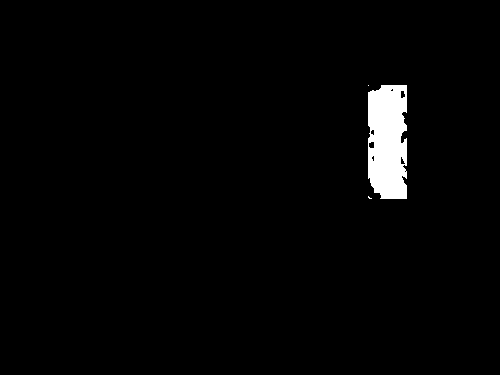

255
Image similarity: 0.9786276038416544


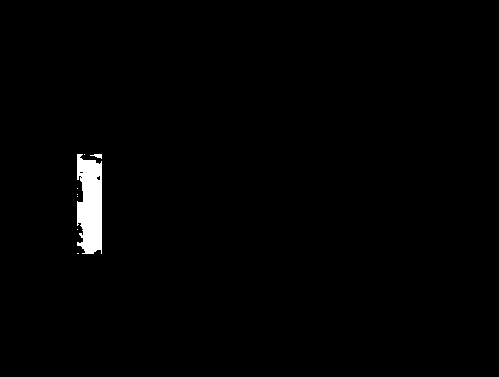

255
Image similarity: 0.993020458665882


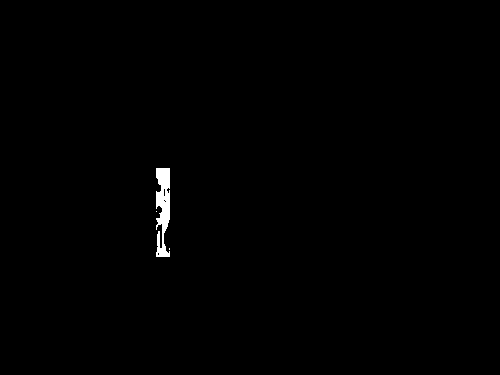

255
Image similarity: 0.951298325563484


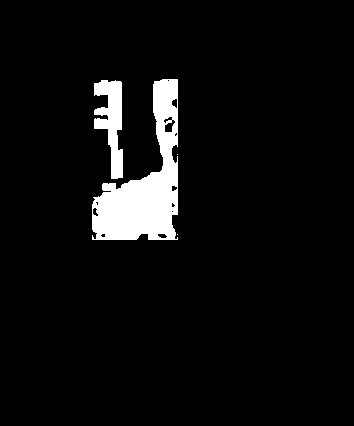

255
Image similarity: 0.9927414819441528


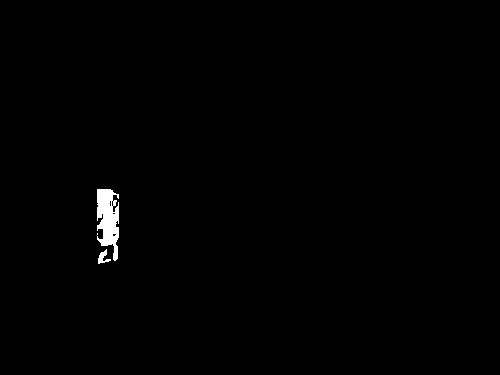

255
Image similarity: 0.9321583418306936


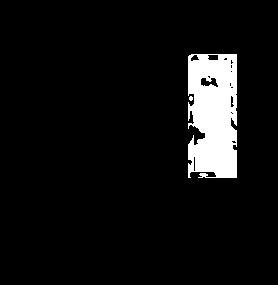

255
Image similarity: 0.9889300731462818


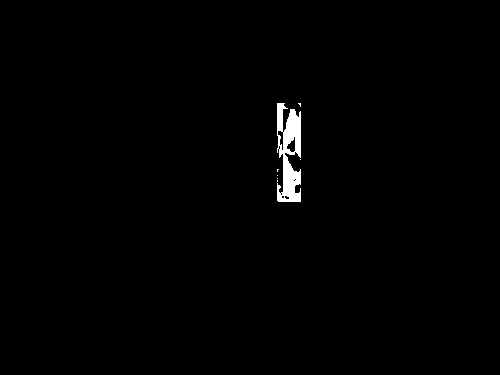

255
Image similarity: 0.9070670027739738


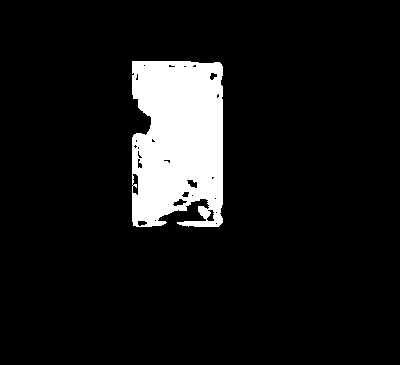

255
Image similarity: 0.9640525329058286


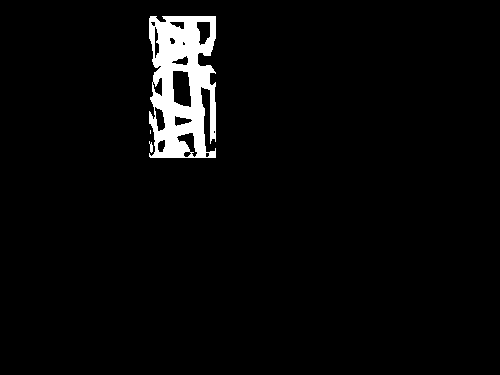

255
Image similarity: 0.8694331428995493


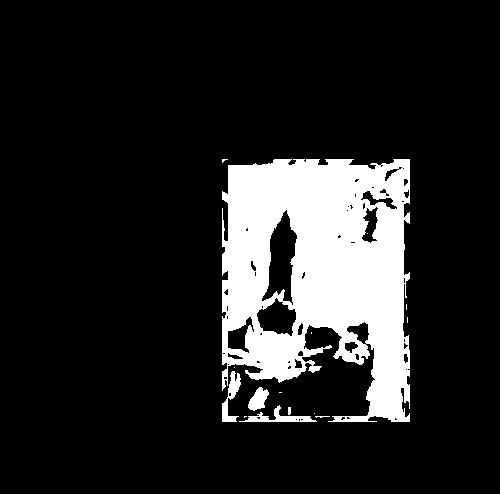

255
Image similarity: 0.8584760374521059


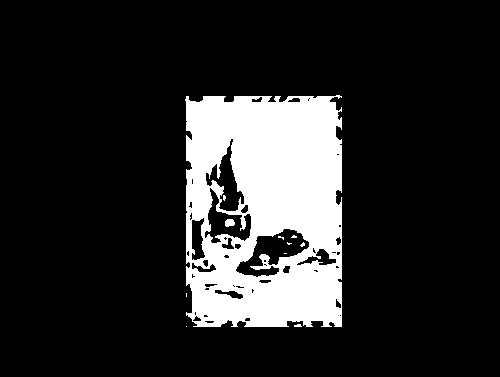

255
Image similarity: 0.9529191628457254


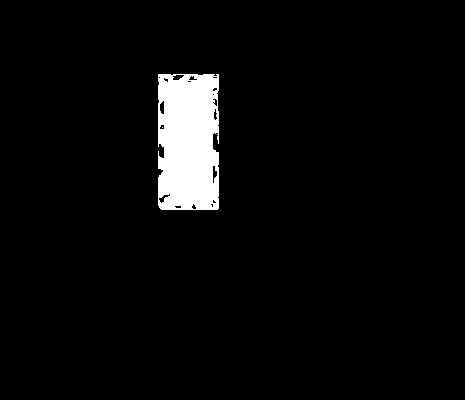

255
Image similarity: 0.9749615915126874


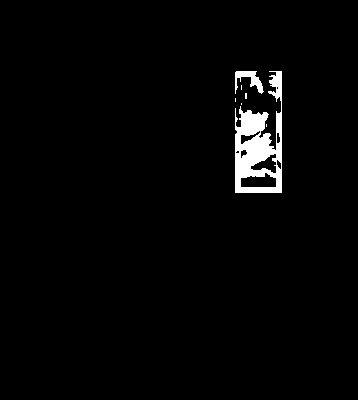

255
Image similarity: 0.9797574528986587


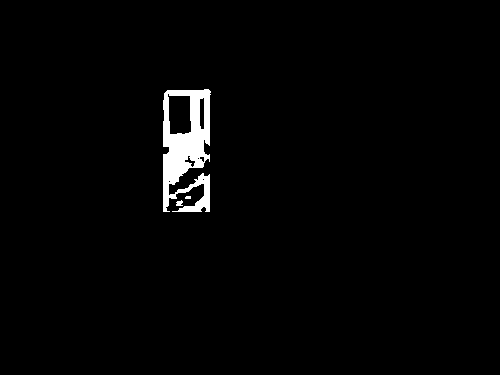

255
Image similarity: 0.9562179545782272


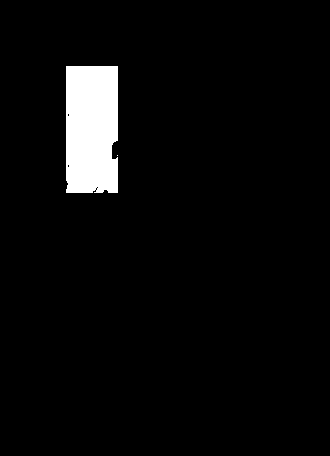

255
Image similarity: 0.9104490294716858


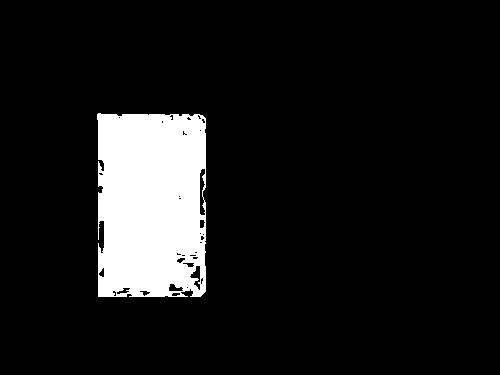

255
Image similarity: 0.9908409230871628


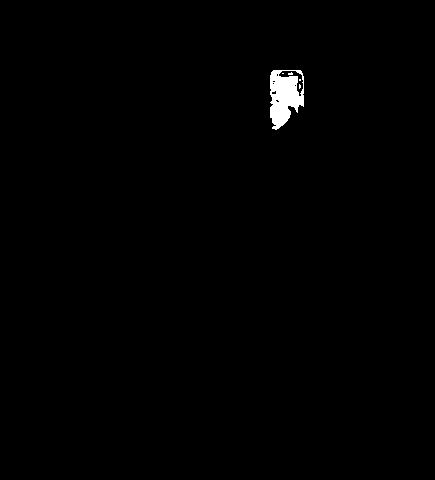

255
Image similarity: 0.9812223295858025


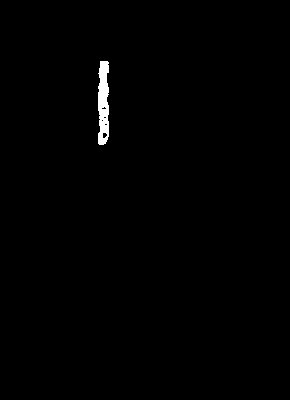

255
Image similarity: 0.9868401724489533


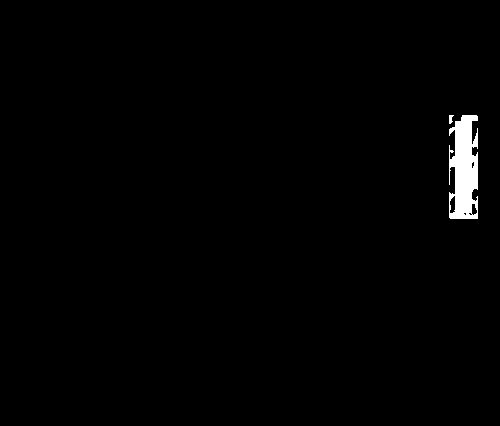

255
Image similarity: 0.9375094727693577


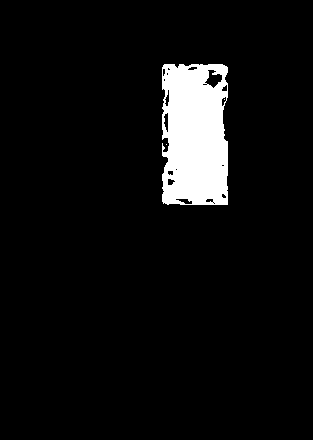

255
Image similarity: 0.9479770719812121


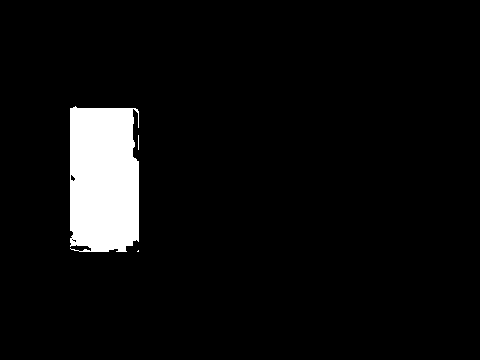

255
Image similarity: 0.9680482543910834


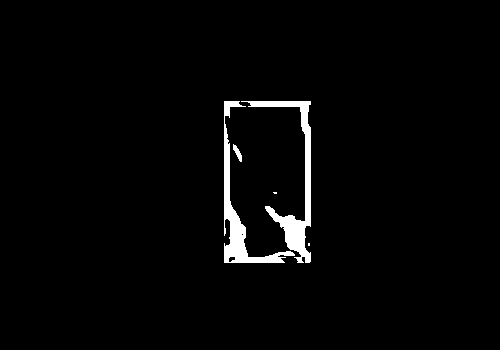

255
Image similarity: 0.9165791432309897


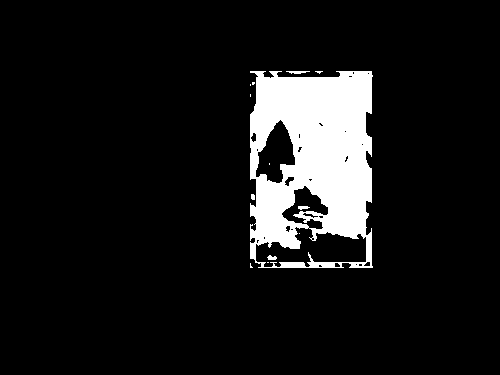

255
Image similarity: 0.9556608580276513


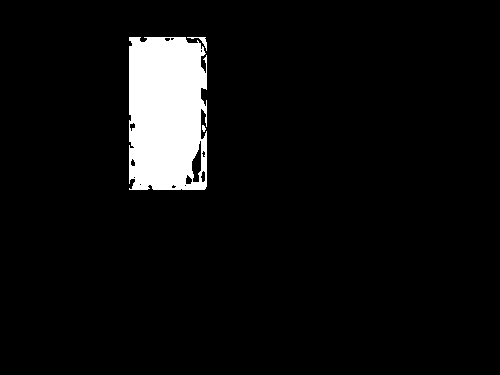

255
Image similarity: 0.9708181752790089


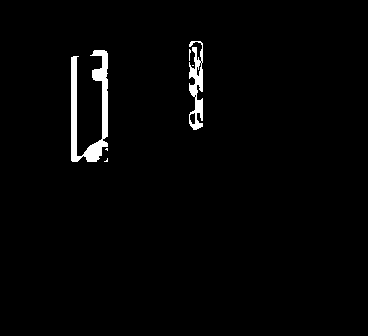

255
Image similarity: 0.9678373250161514


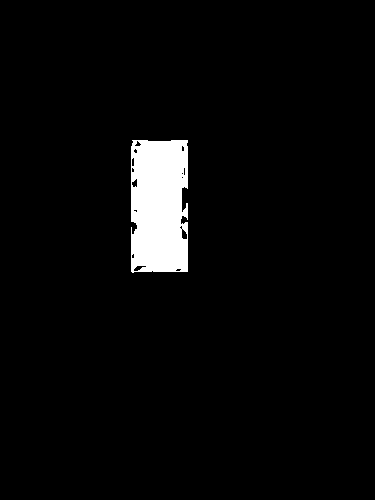

255
Image similarity: 0.9203525713416906


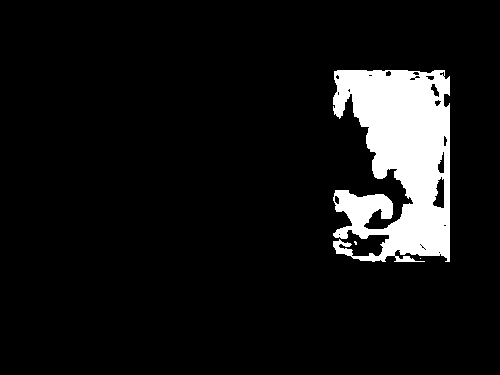

255
Image similarity: 0.9646226601536398


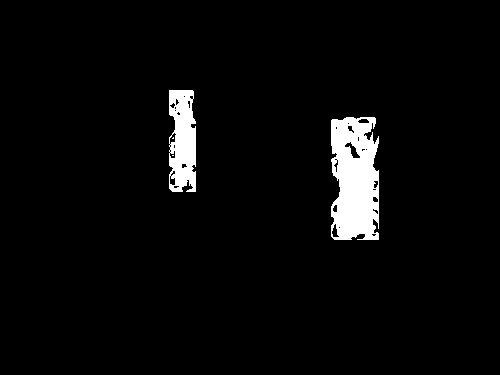

255
Image similarity: 0.982088425873624


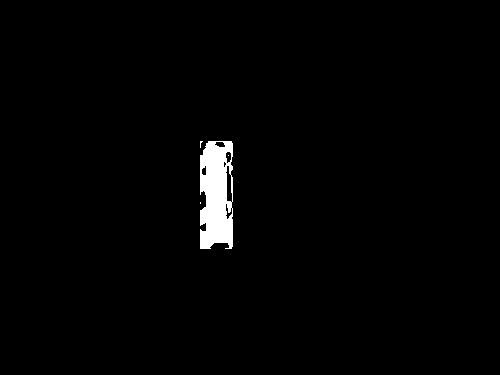

255
Image similarity: 0.9008676311168656


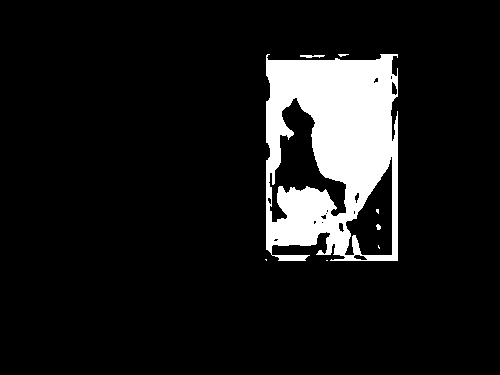

255
Image similarity: 0.8789324447453385


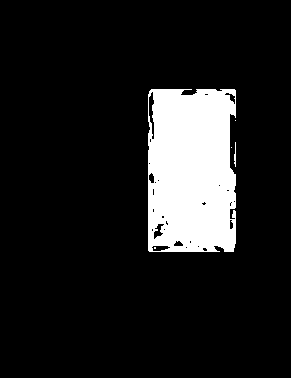

255
Image similarity: 0.9600715312929743


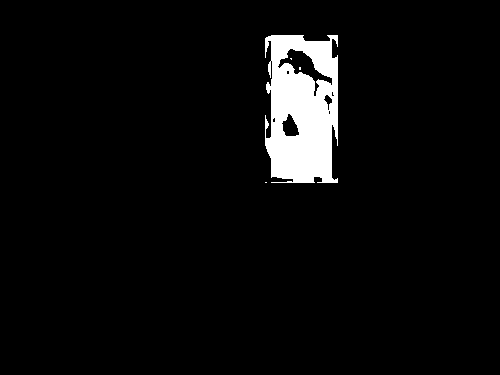

255
Image similarity: 0.9714757324511432


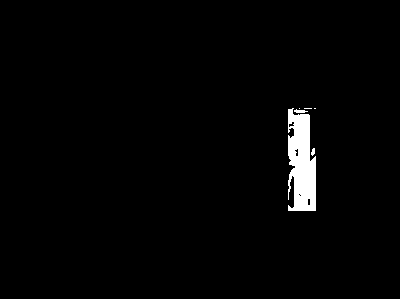

255
Image similarity: 0.9429917541286762


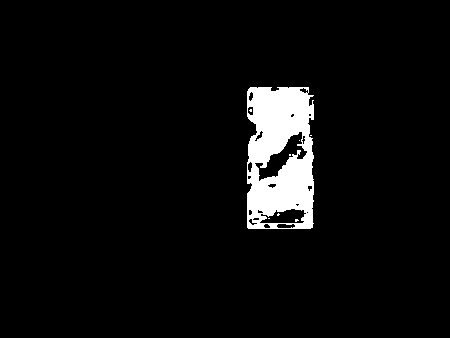

255
Image similarity: 0.9102675442761737


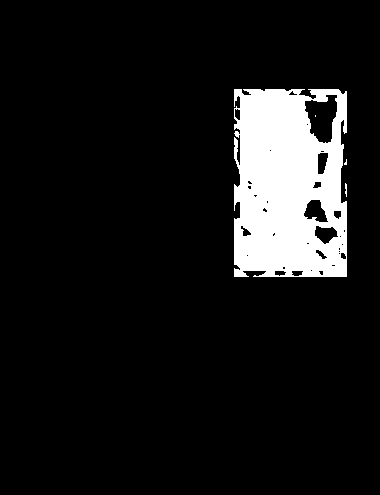

255
Image similarity: 0.9696395288713656


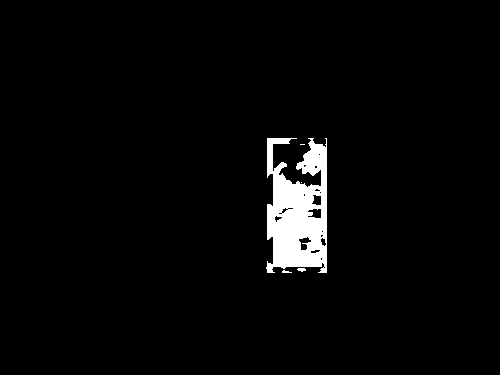

255
Image similarity: 0.9014171710674015


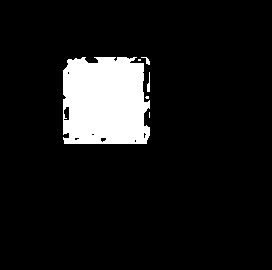

255
Image similarity: 0.9563915116120261


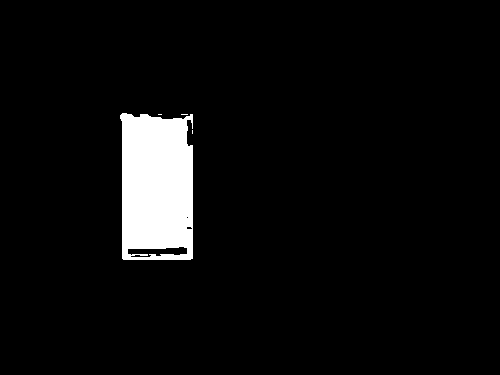

255
Image similarity: 0.9933282539492736


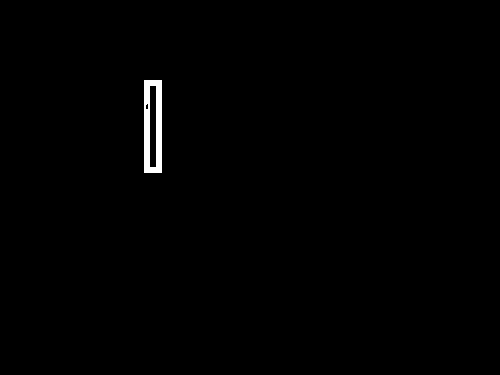

255
Image similarity: 0.7330230373680039


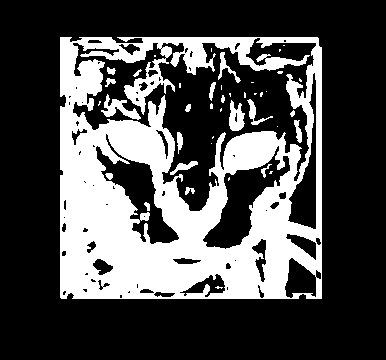

255
Image similarity: 0.9812412283710839


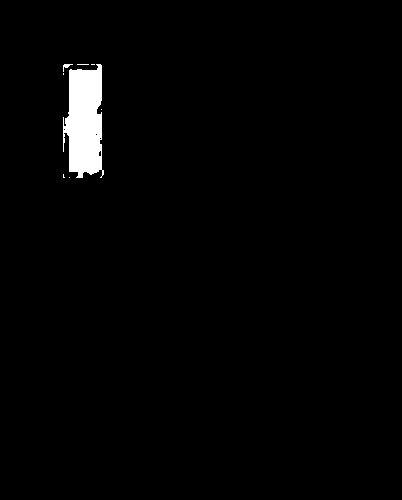

255
Image similarity: 0.9323091370870876


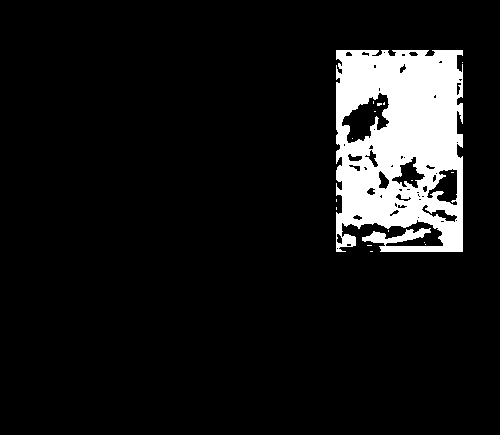

255
Image similarity: 0.9635412740844426


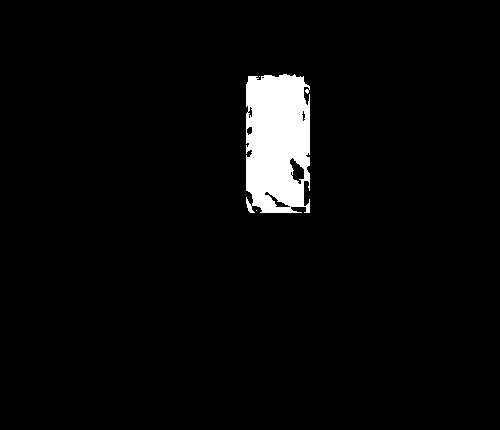

255
Image similarity: 0.9830203567449622


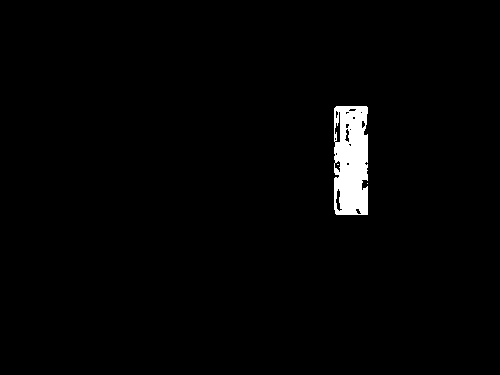

255
Image similarity: 0.9233182579235546


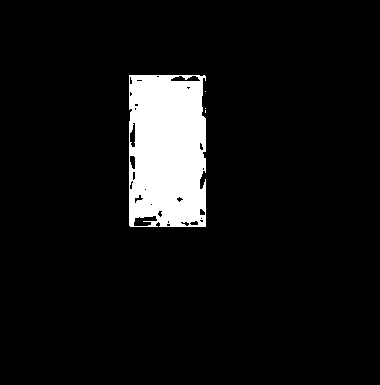

255
Image similarity: 0.9123144226041779


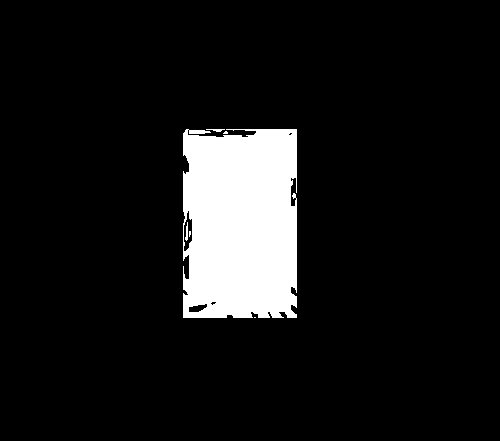

255
Image similarity: 0.9761877649168101


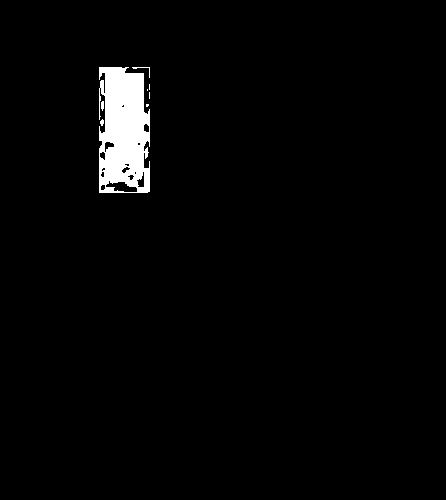

255
Image similarity: 0.944147854486175


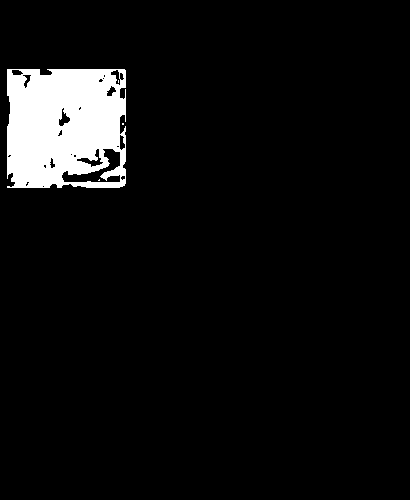

255
Image similarity: 0.9488685317466287


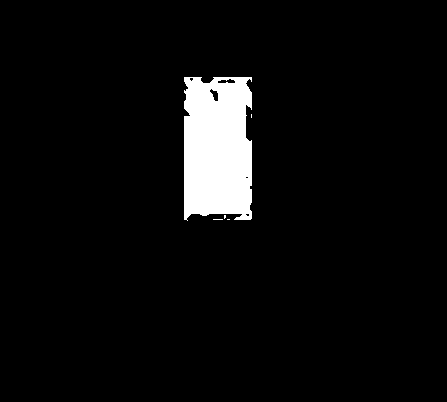

255
Image similarity: 0.7723714332405427


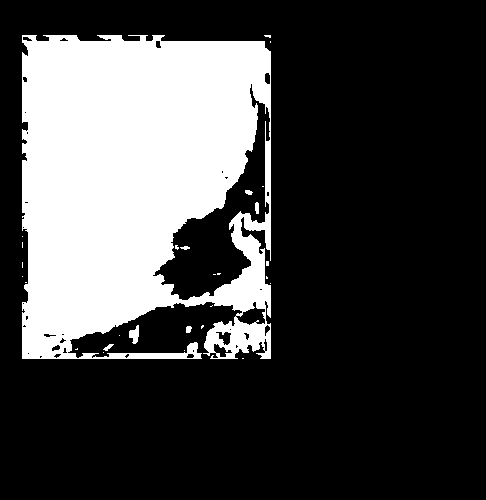

255
Image similarity: 0.8129180162526229


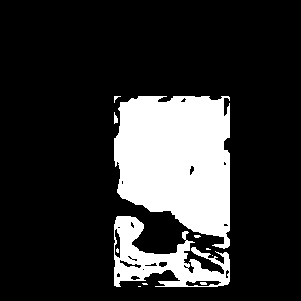

255
Image similarity: 0.8209718061753519


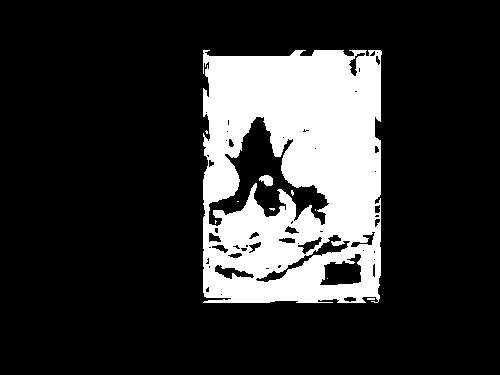

255
Image similarity: 0.9907091271951667


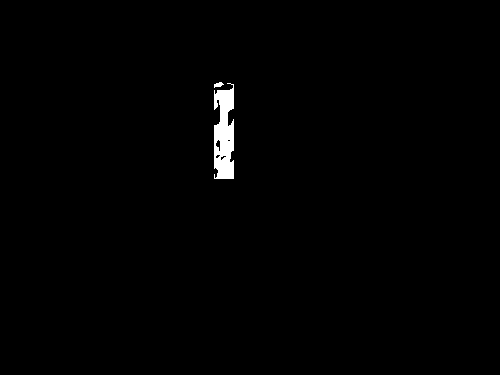

255
Image similarity: 0.8747991424656415


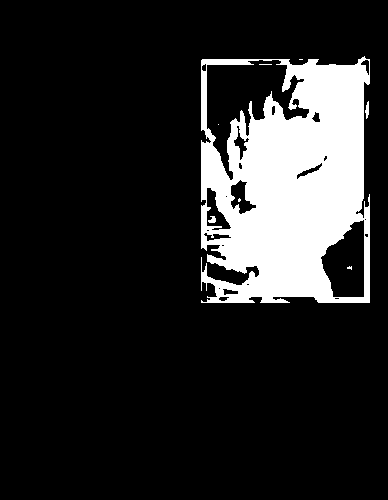

255
Image similarity: 0.9836487206472686


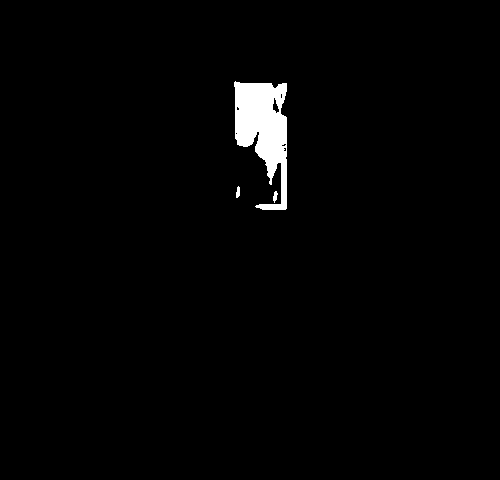

255
Image similarity: 0.7250884201422827


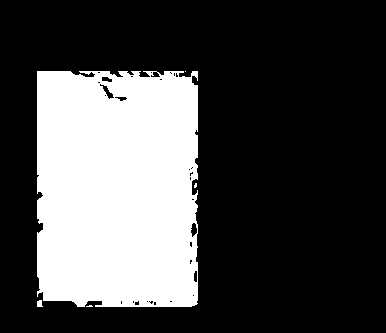

255
Image similarity: 0.9610330496034787


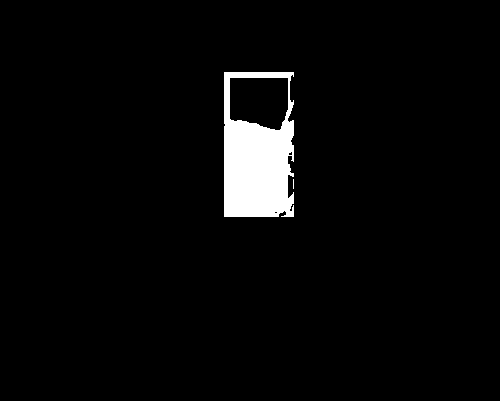

255
Image similarity: 0.984074817784353


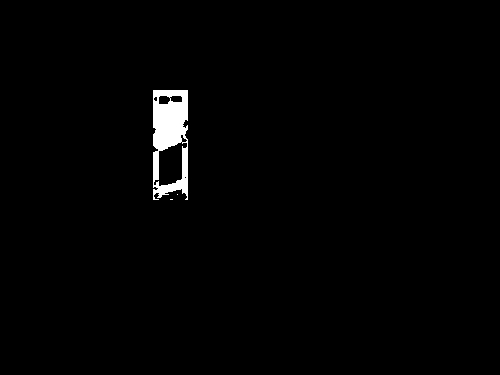

255
Image similarity: 0.9387406016846316


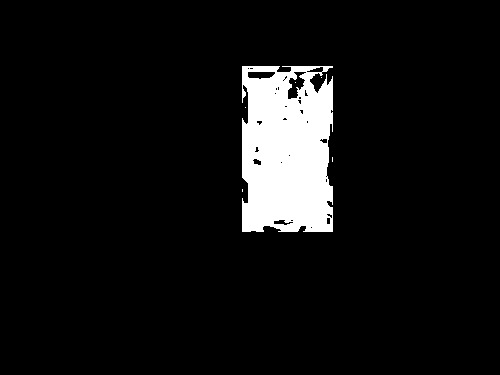

255
Image similarity: 0.9948656824659743


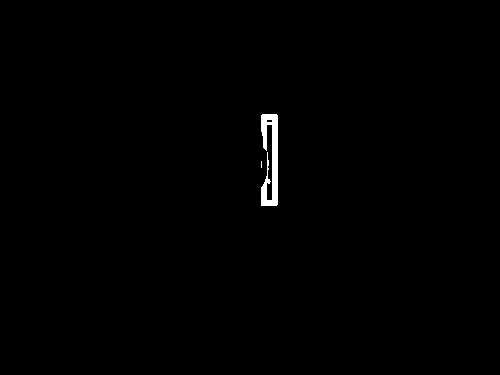

255
Image similarity: 0.8648036424412507


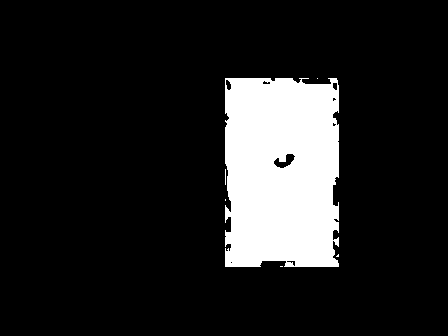

255
Image similarity: 0.982781549569448


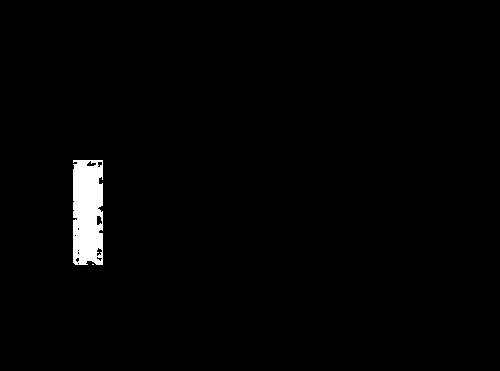

255
Image similarity: 0.9400417282623938


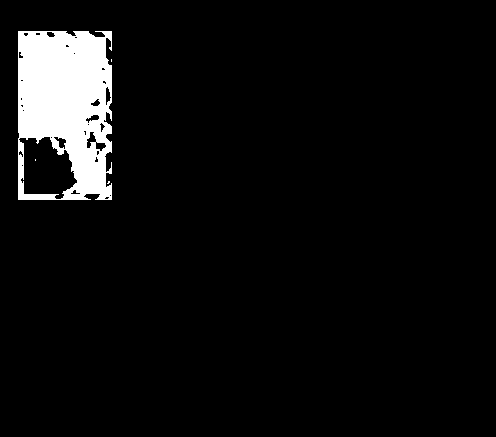

255
Image similarity: 0.8452771829797963


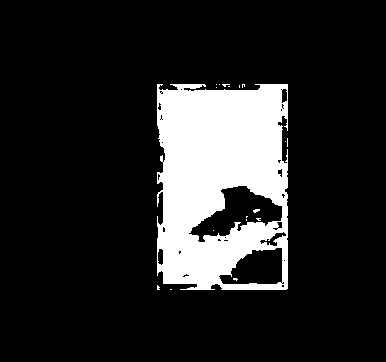

255
Image similarity: 0.9605313296550135


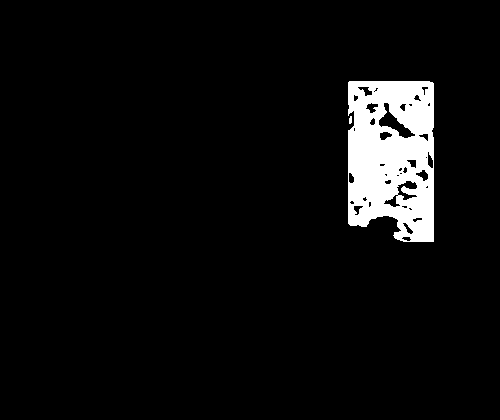

255
Image similarity: 0.9911390460345512


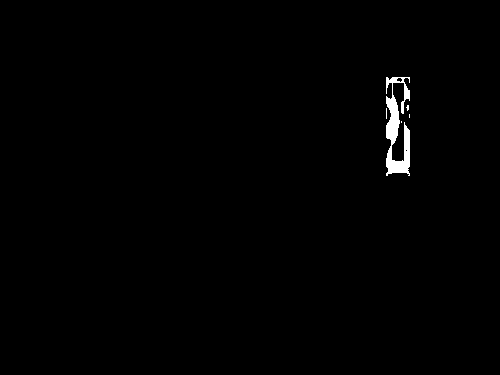

255
Image similarity: 0.6447283308721989


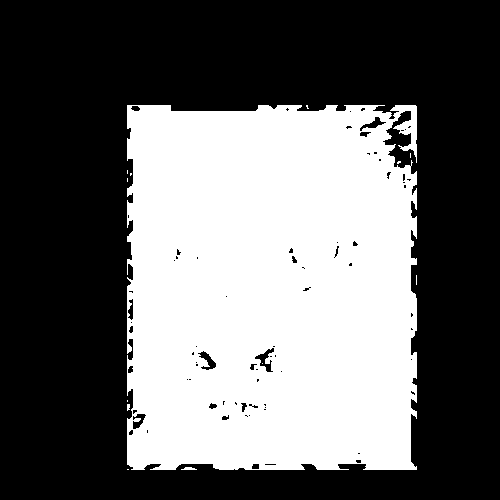

255
Image similarity: 0.9474000616089093


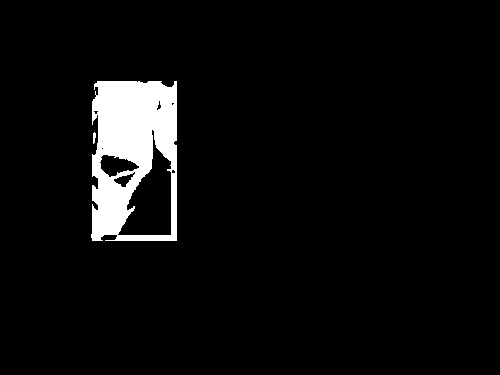

255
Image similarity: 0.9419967322560502


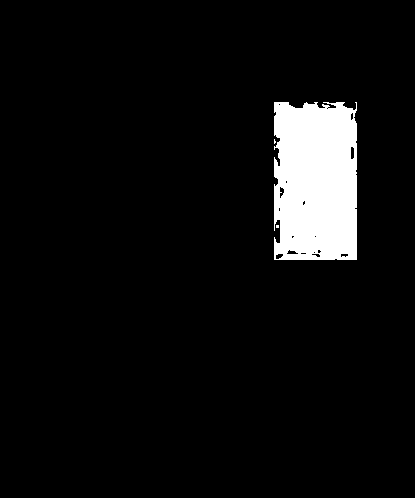

255
Image similarity: 0.9885818778890019


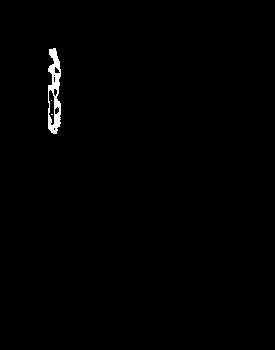

255
Image similarity: 0.9268967783299178


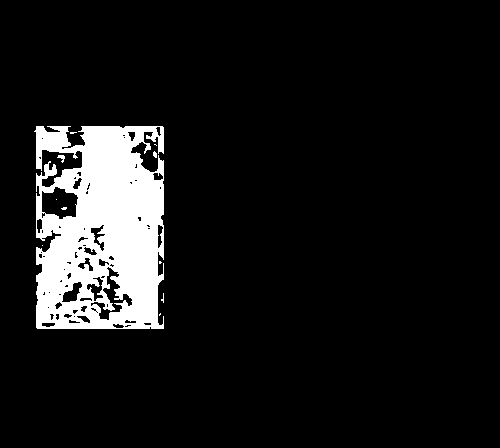

255
Image similarity: 0.9949334702185705


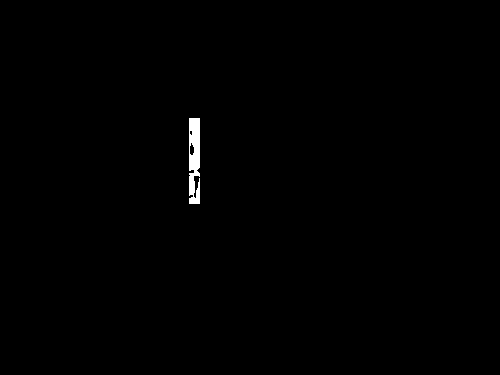

255
Image similarity: 0.9335664087678863


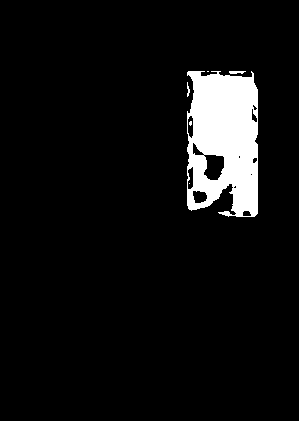

255
Image similarity: 0.9883879086961574


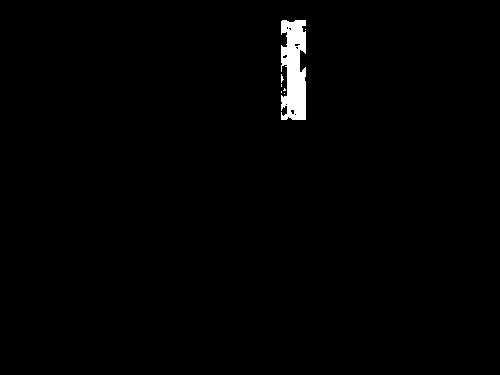

255
Image similarity: 0.9170065359046269


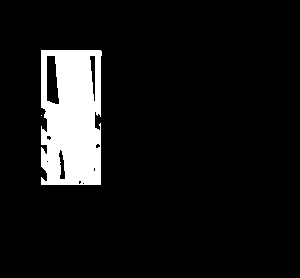

255
Image similarity: 0.9858642979742267


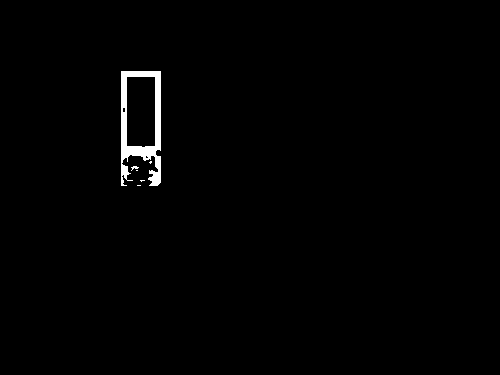

255
Image similarity: 0.9647733080276018


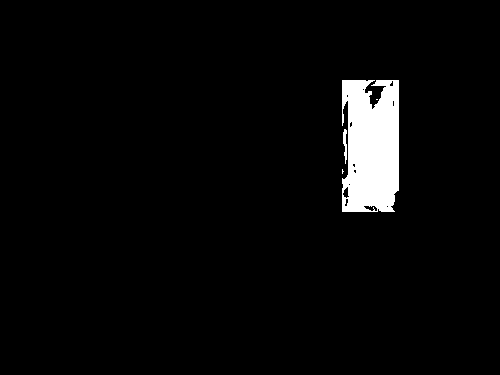

255
Image similarity: 0.9908288070006285


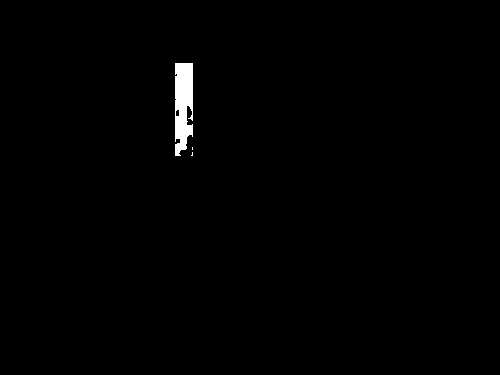

255
Image similarity: 0.9688806939551865


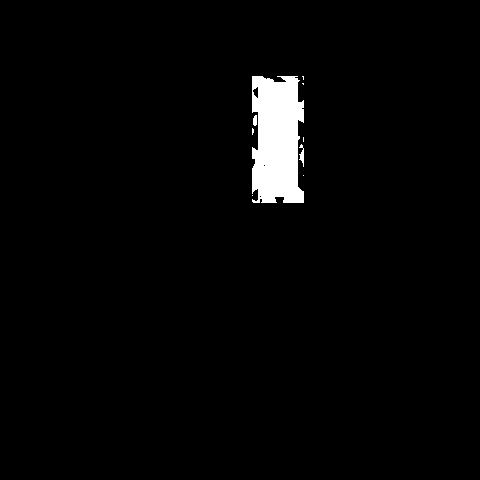

255
Image similarity: 0.990020367211818


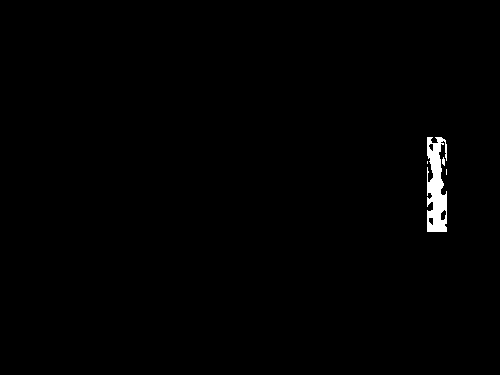

255
Image similarity: 0.9883053782547314


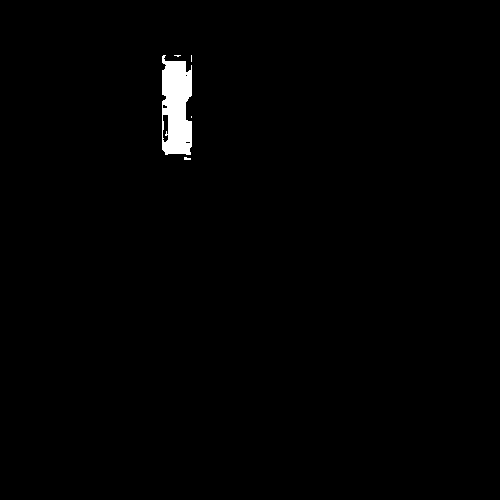

255
Image similarity: 0.9164872324304674


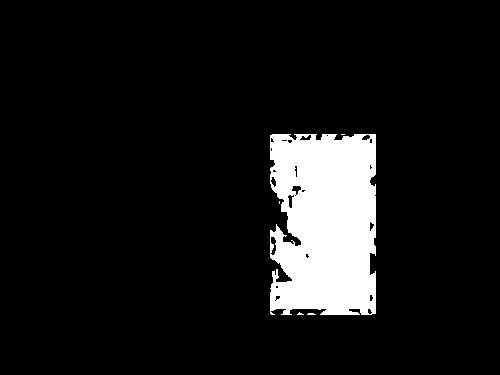

255
Image similarity: 0.9298753137132364


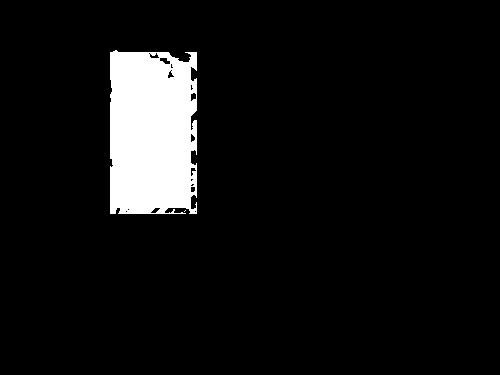

255
Image similarity: 0.9642152581899202


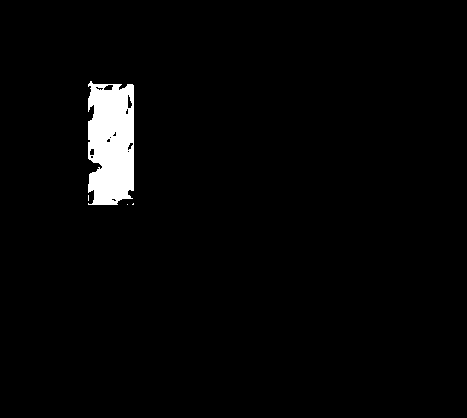

255
Image similarity: 0.8940457743458553


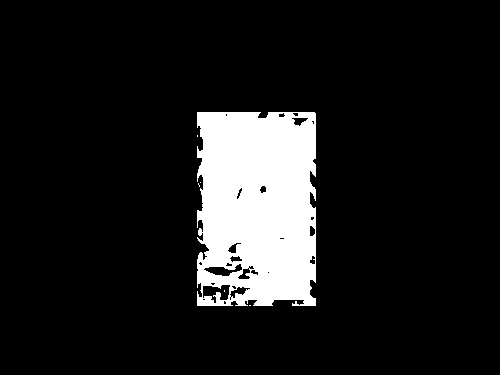

255
Image similarity: 0.9761470981093466


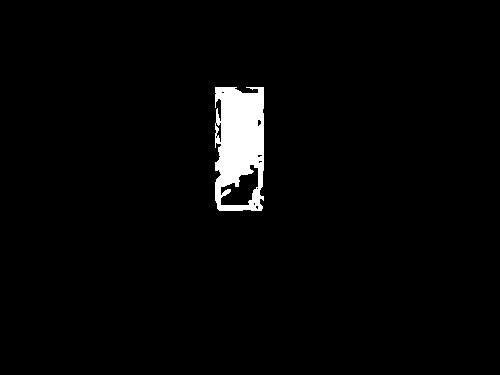

255
Image similarity: 0.9271991794443495


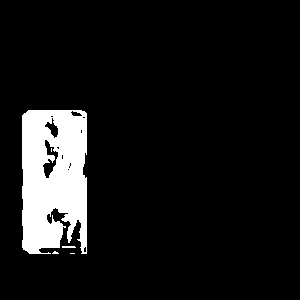

255
Image similarity: 0.9687278345785145


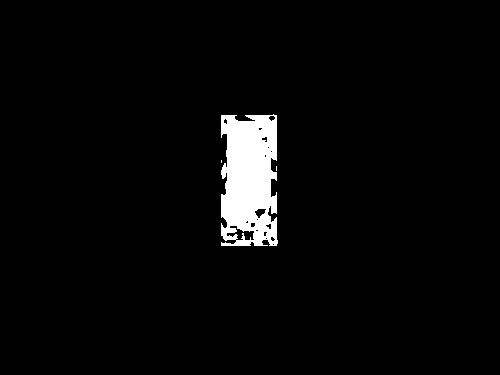

255
Image similarity: 0.8942640329096472


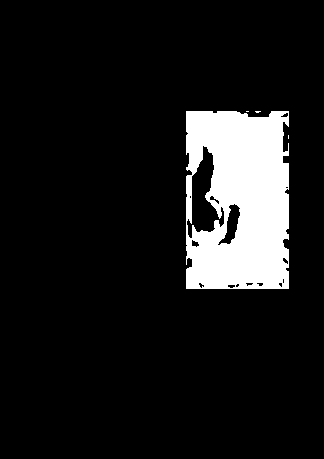

255
Image similarity: 0.8812011214701724


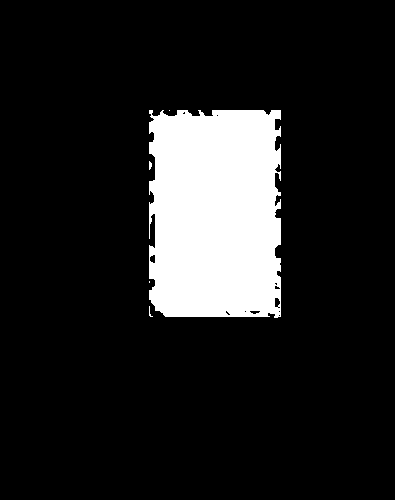

255
Image similarity: 0.816018341435002


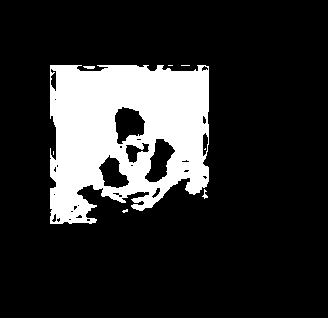

255
Image similarity: 0.933728479290339


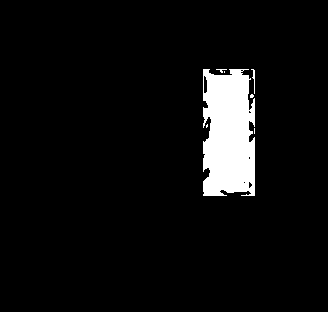

255
Image similarity: 0.9042719912496031


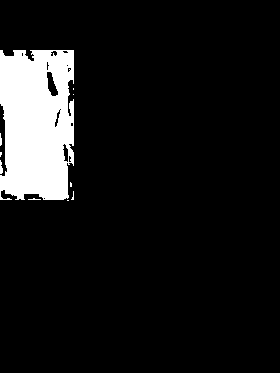

255
Image similarity: 0.9901388136326702


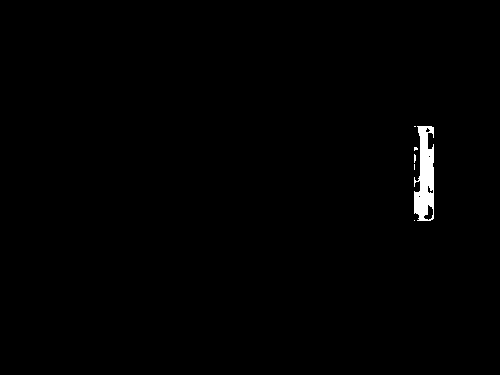

255
Image similarity: 0.9104314714602442


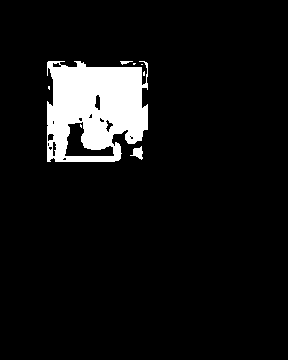

255
Image similarity: 0.8111119871196089


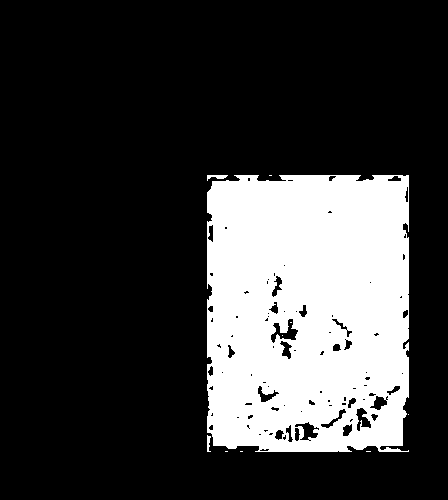

255
Image similarity: 0.9845828720989236


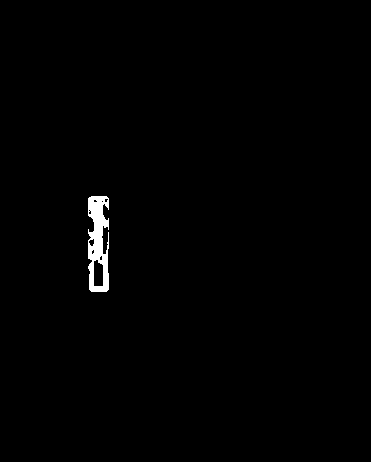

255
Image similarity: 0.9035708104560756


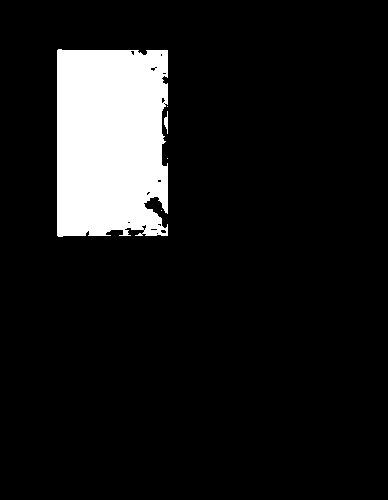

255
Image similarity: 0.9149981550535624


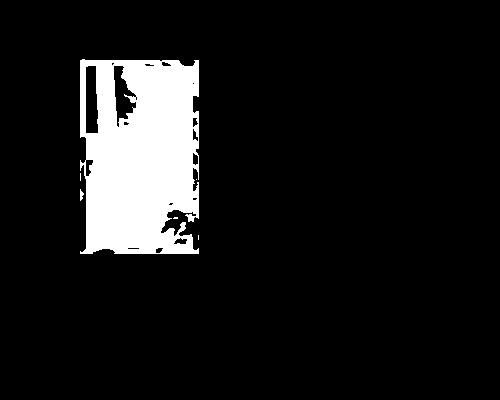

255
Image similarity: 0.9084213225519769


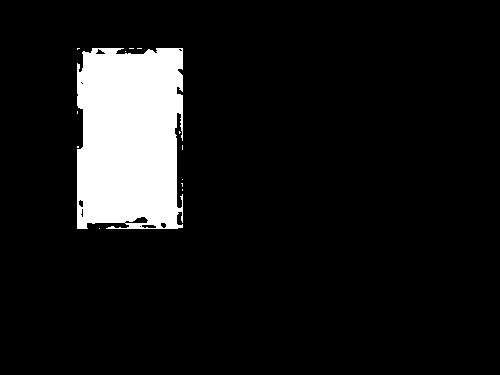

255
Image similarity: 0.977306266388483


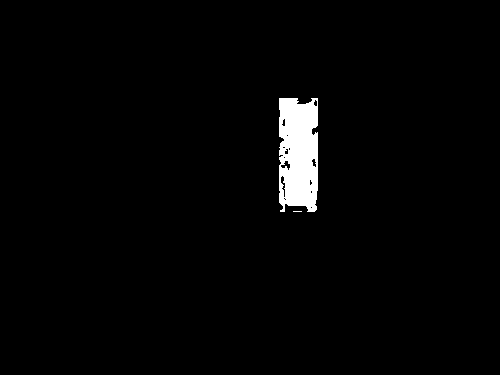

255
Image similarity: 0.8755045280121168


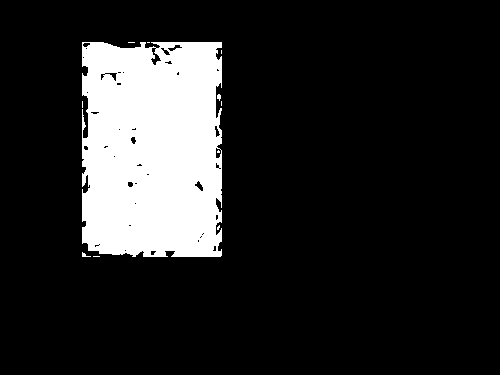

255
Image similarity: 0.9675921997273204


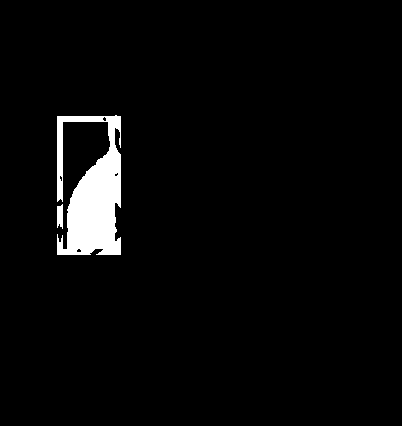

255
Image similarity: 0.9772462628181611


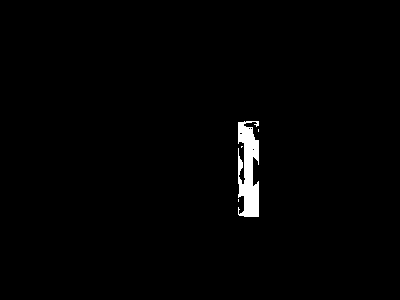

255
Image similarity: 0.9860985637539367


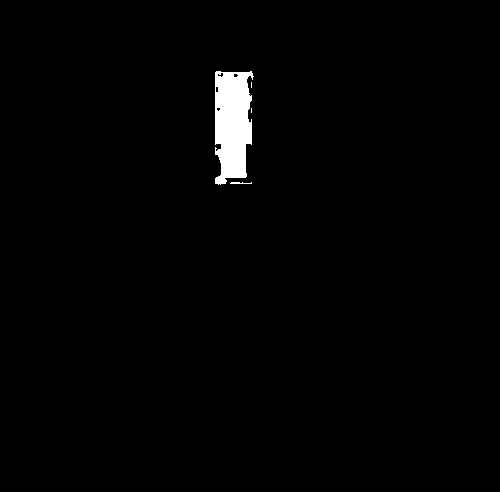

255
Image similarity: 0.9410840699412428


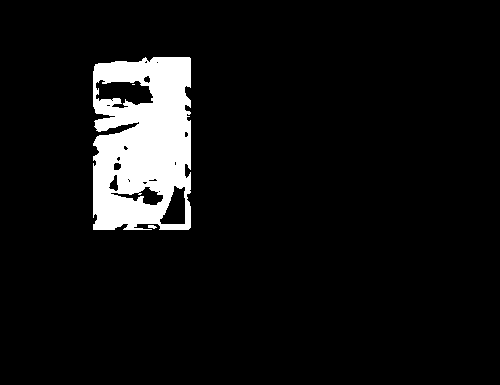

255
Image similarity: 0.9701958105870135


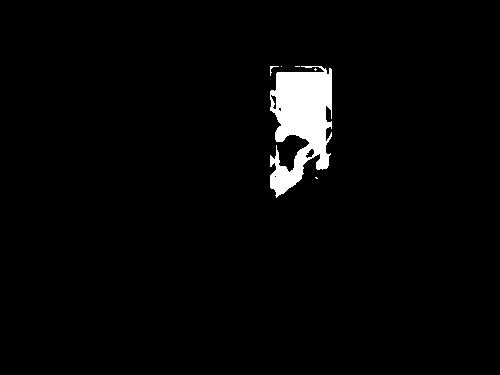

255
Image similarity: 0.8937864106038012


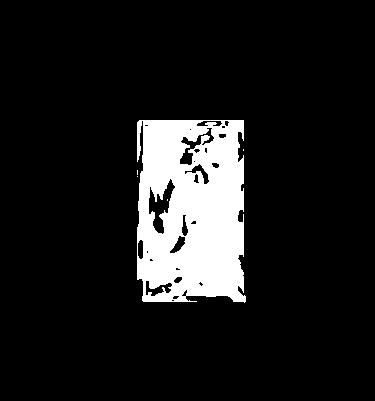

255
Image similarity: 0.925765711855197


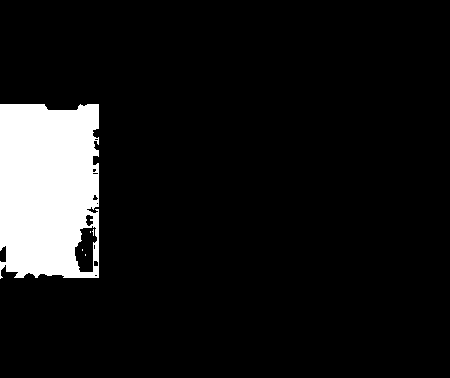

255
Image similarity: 0.9690889936171356


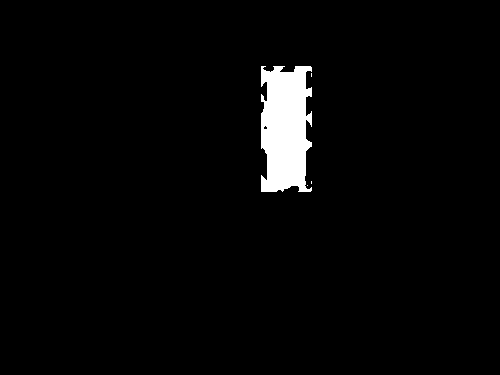

255
Image similarity: 0.9022672309224337


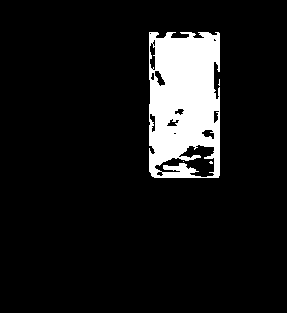

255
Image similarity: 0.9928497108366326


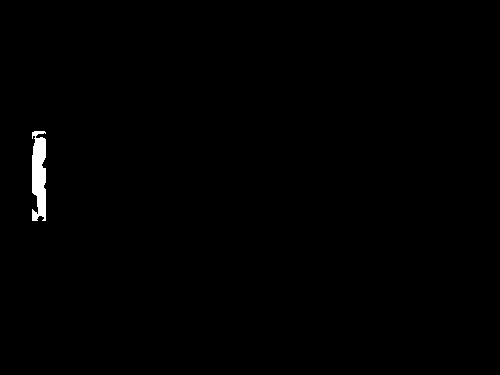

255
Image similarity: 0.9231139087790923


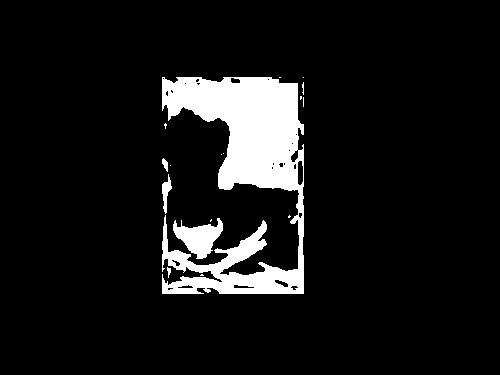

255
Image similarity: 0.994429924714754


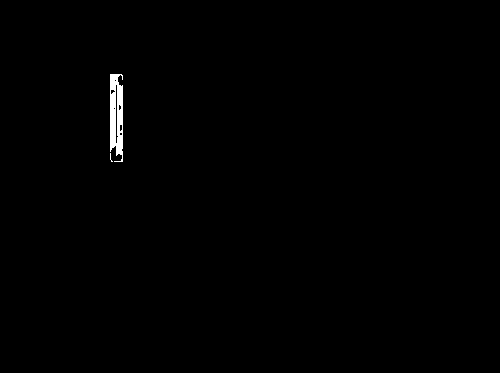

255
Image similarity: 0.9009227016058474


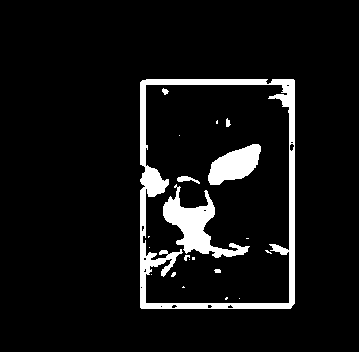

255
Image similarity: 0.9070098000103938


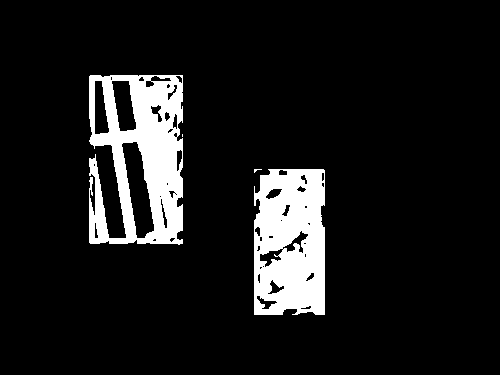

255
Image similarity: 0.9439698800280835


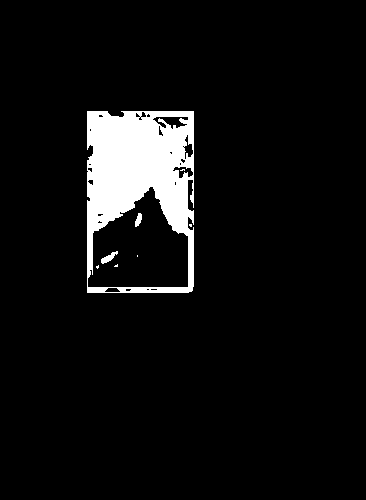

255
Image similarity: 0.9588765625471004


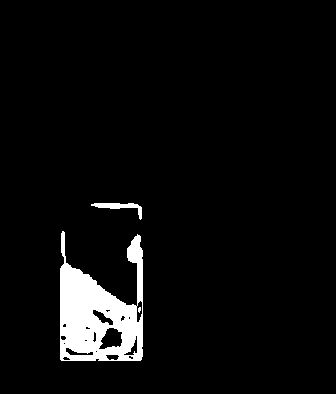

255
Image similarity: 0.9914939807854697


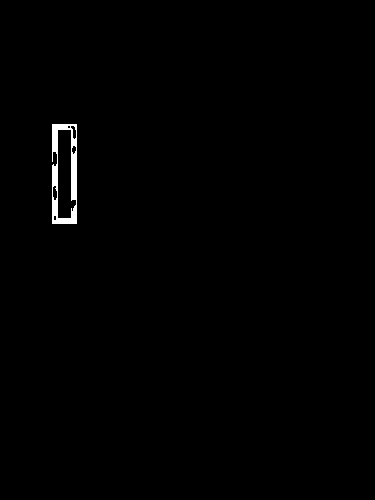

255
Image similarity: 0.9909014925605615


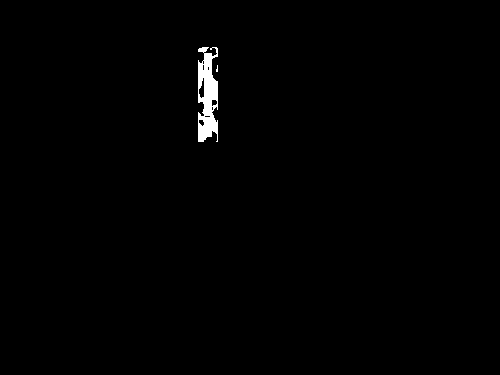

255
Image similarity: 0.9349041172276563


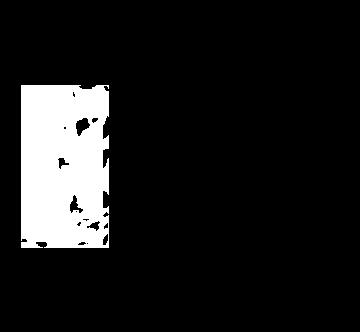

255
Image similarity: 0.9840723525065747


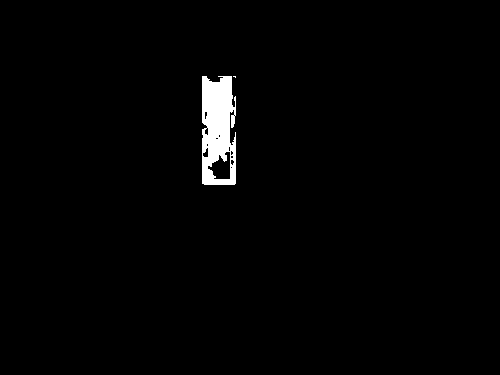

255
Image similarity: 0.7582384922620267


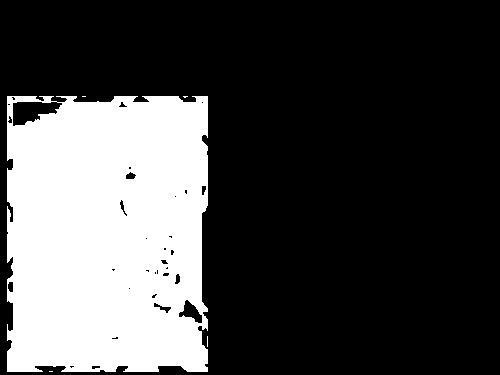

255
Image similarity: 0.9358250393100983


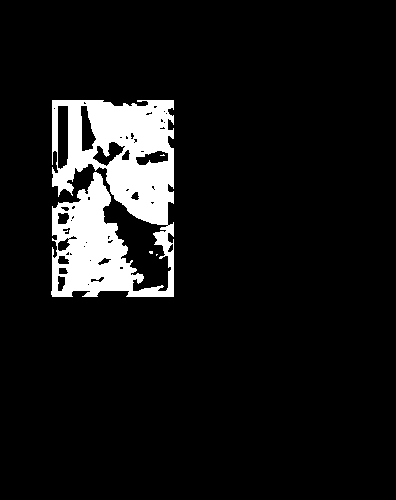

255
Image similarity: 0.9741678980239807


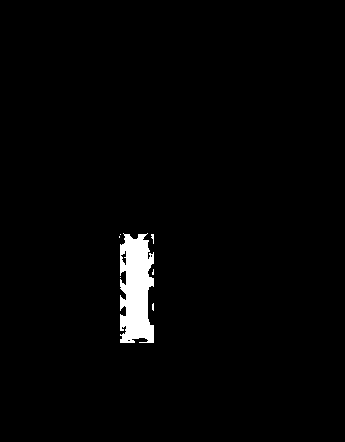

255
Image similarity: 0.9469741870292353


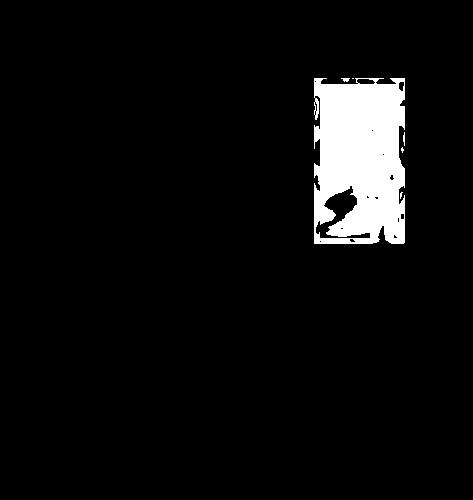

255
Image similarity: 0.962070608584304


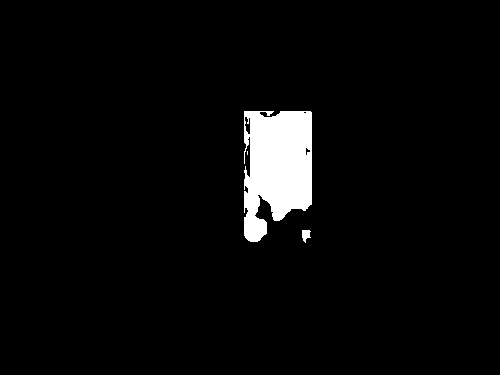

255
Image similarity: 0.9299155091893179


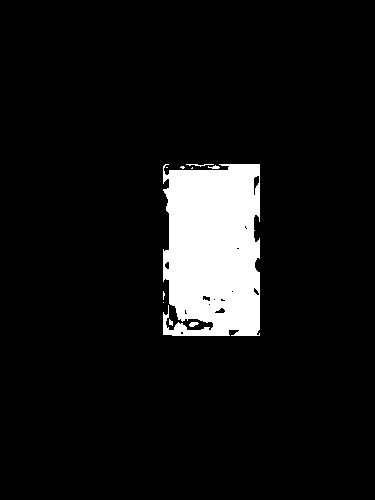

255
Image similarity: 0.9681641446346688


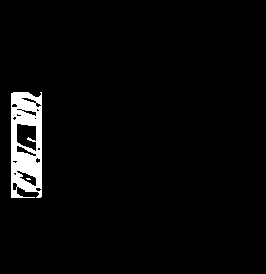

255
Image similarity: 0.9511905293058228


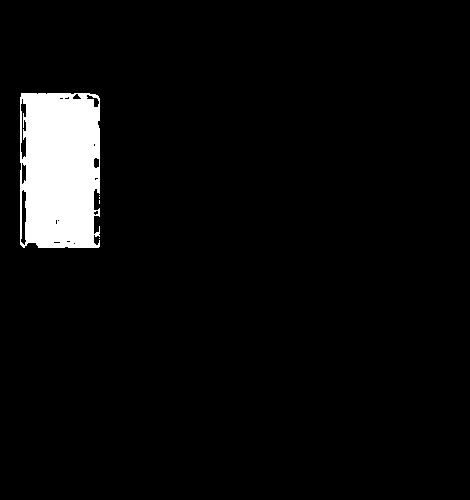

255
Image similarity: 0.957593979128742


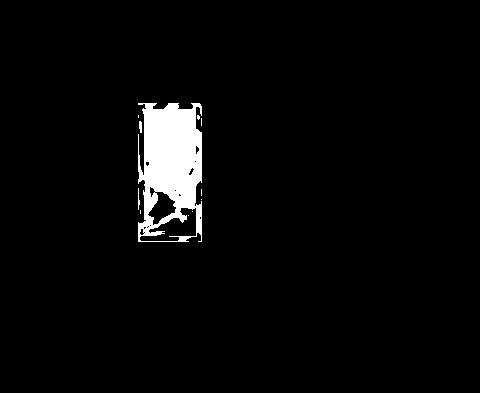

255
Image similarity: 0.9873277309125106


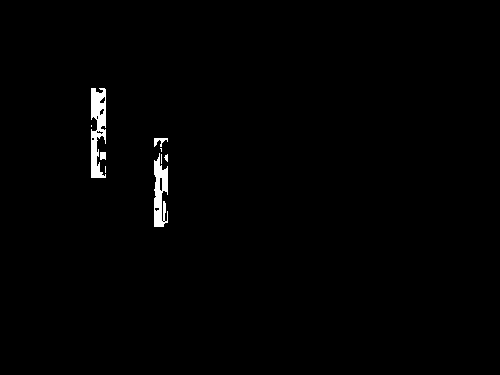

255
Image similarity: 0.7530008412882584


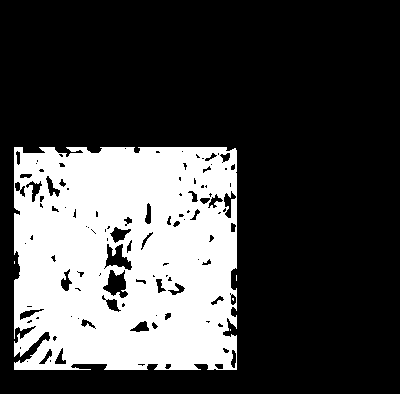

255
Image similarity: 0.9958626683341749


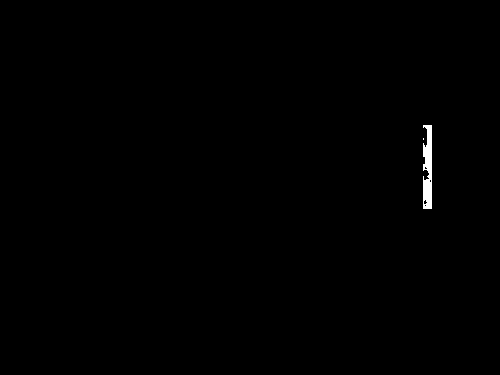

255
Image similarity: 0.9305702723991586


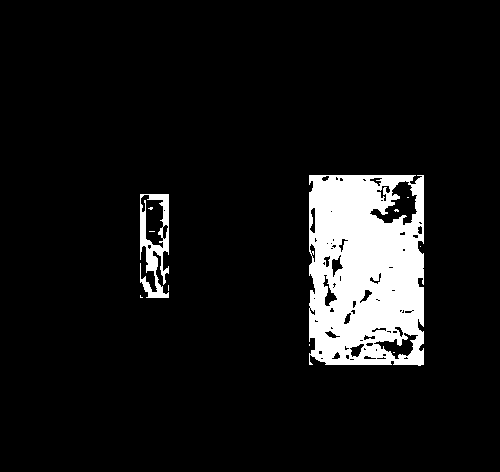

255
Image similarity: 0.9417395683184634


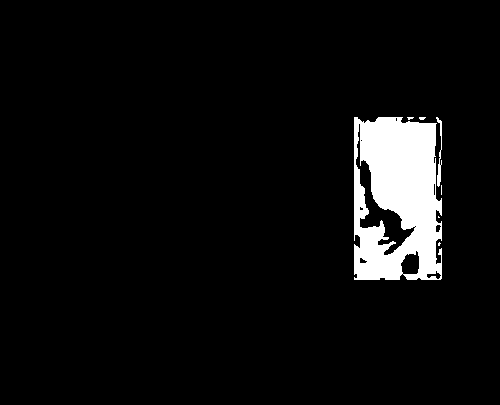

255
Image similarity: 0.9721967085695542


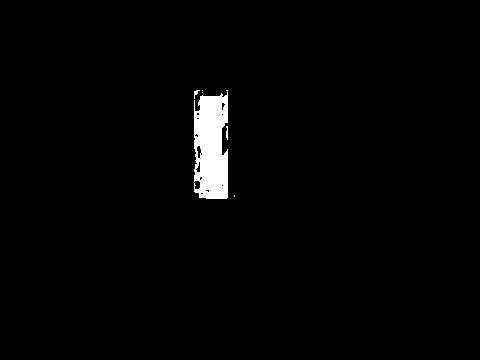

255
Image similarity: 0.9792008788417056


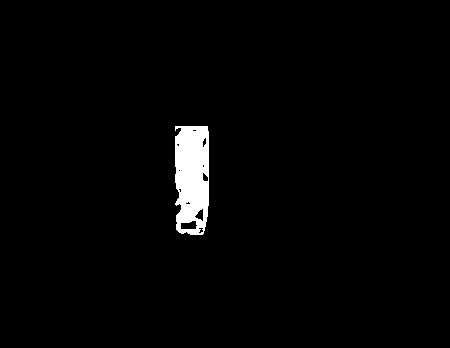

255
Image similarity: 0.7261931642569086


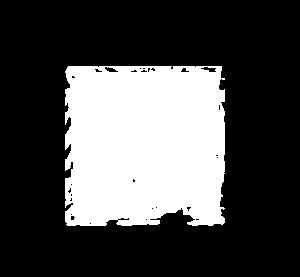

255
Image similarity: 0.997035049298601


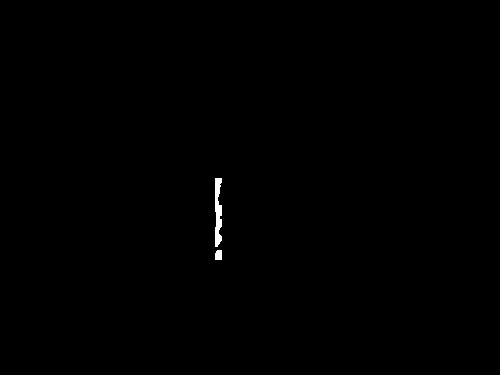

255
Image similarity: 0.8036822131396995


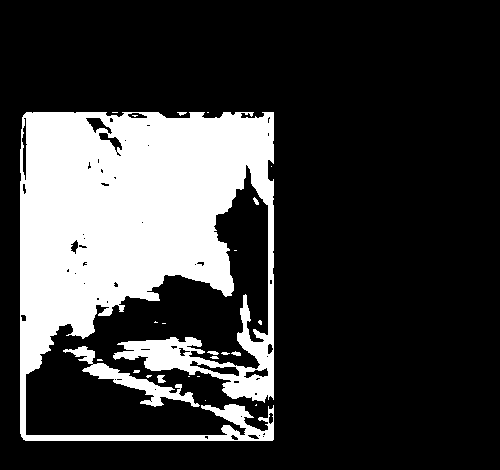

255
Image similarity: 0.8742271197815378


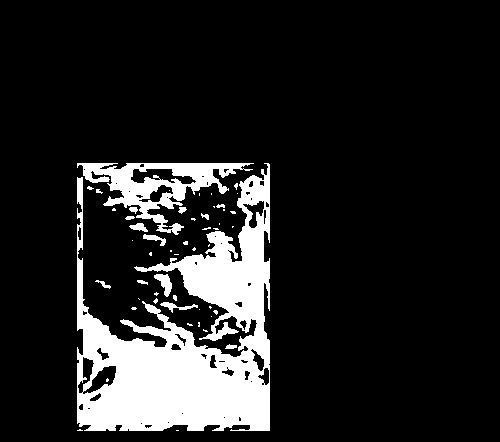

255
Image similarity: 0.8827558594049759


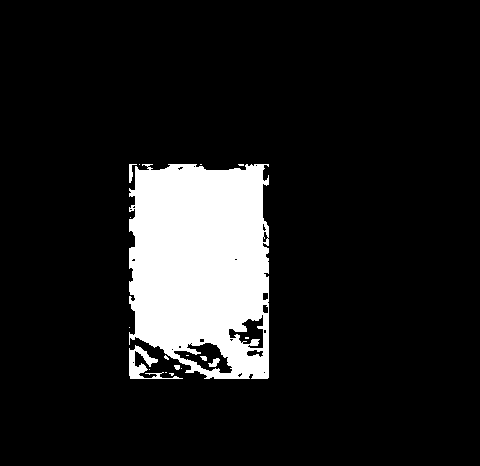

255
Image similarity: 0.9682753608811607


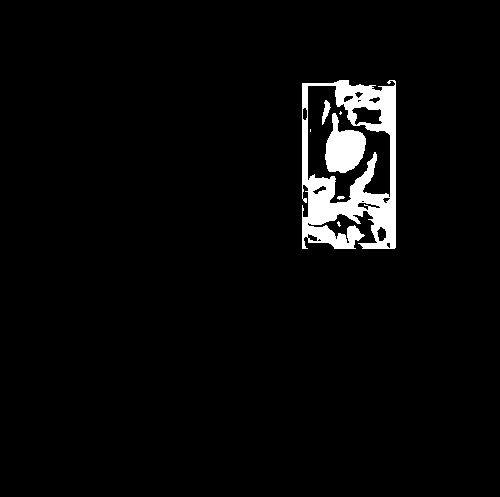

255
Image similarity: 0.9675361136720355


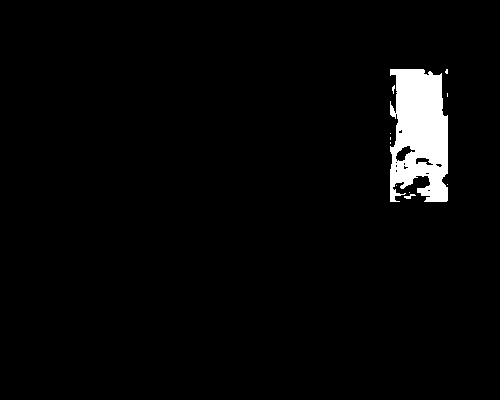

255
Image similarity: 0.8476851410625005


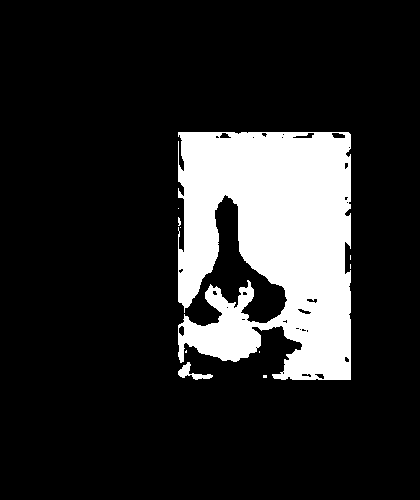

255
Image similarity: 0.8126726315149303


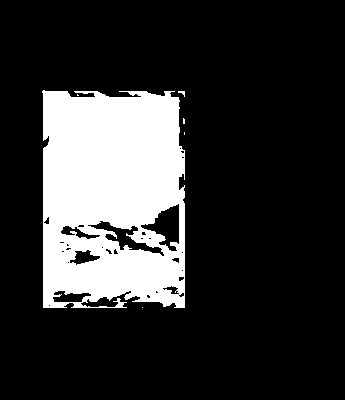

255
Image similarity: 0.9902999672420869


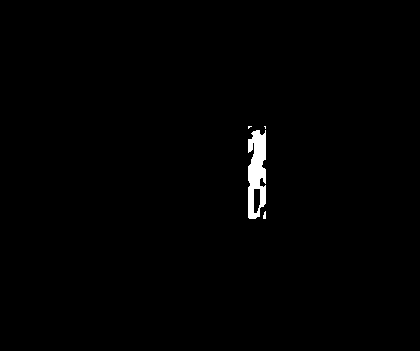

255
Image similarity: 0.8256051518867981


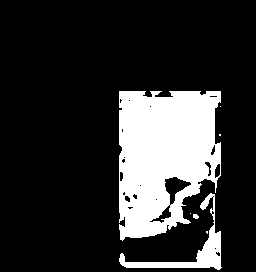

255
Image similarity: 0.9664955885457883


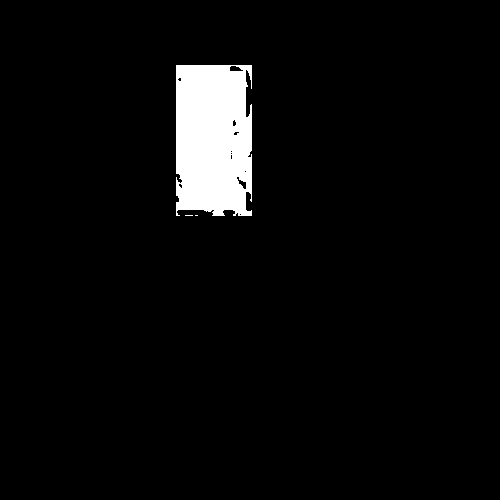

255
Image similarity: 0.9425977074901954


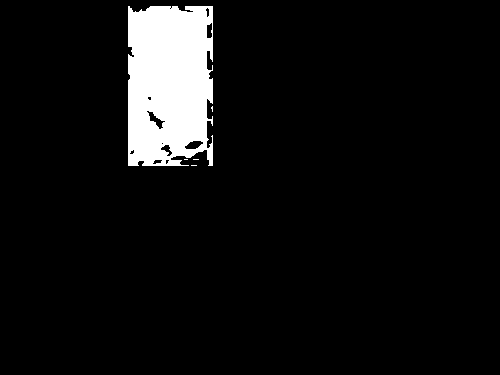

255
Image similarity: 0.9160389159525026


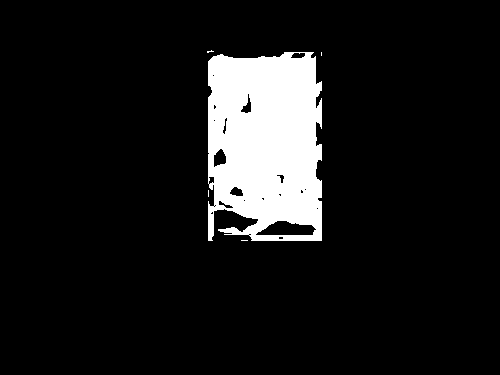

255
Image similarity: 0.8365380534961016


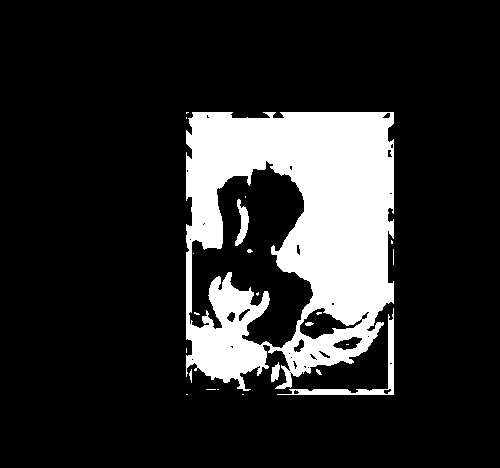

255
Image similarity: 0.8881020356542805


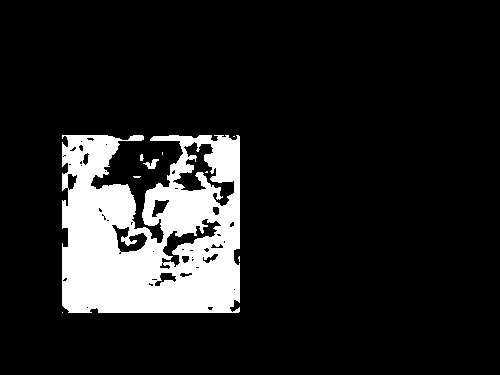

255
Image similarity: 0.8940892522474043


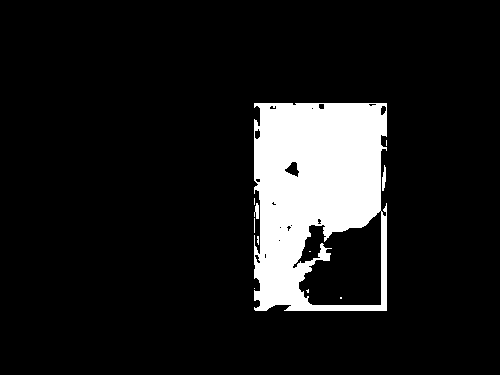

255
Image similarity: 0.978261724569812


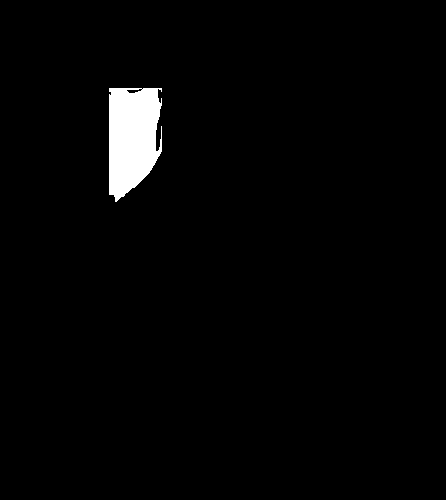

255
Image similarity: 0.9236949118611643


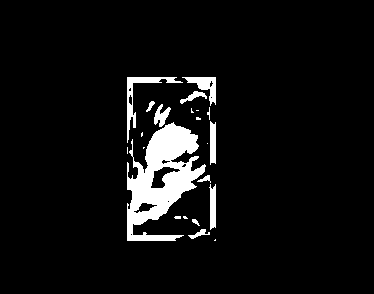

255
Image similarity: 0.8653287742446869


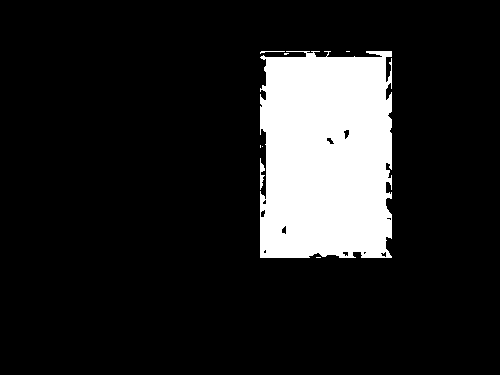

255
Image similarity: 0.9943594968857493


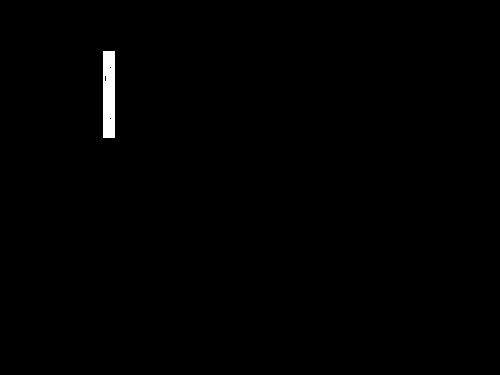

255
Image similarity: 0.9273847906432753


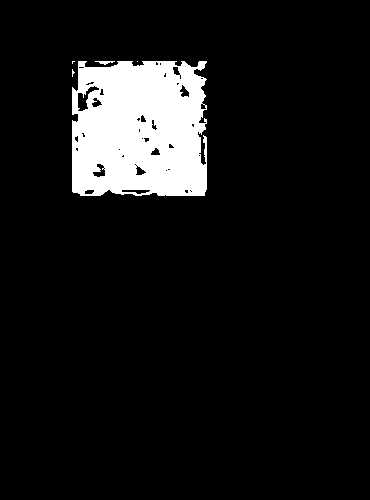

255
Image similarity: 0.9752747184427265


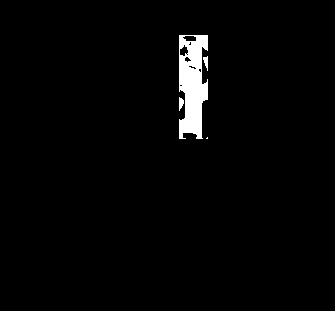

255
Image similarity: 0.98324664843253


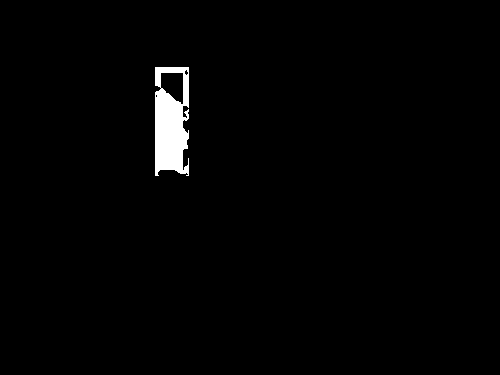

255
Image similarity: 0.894044018369015


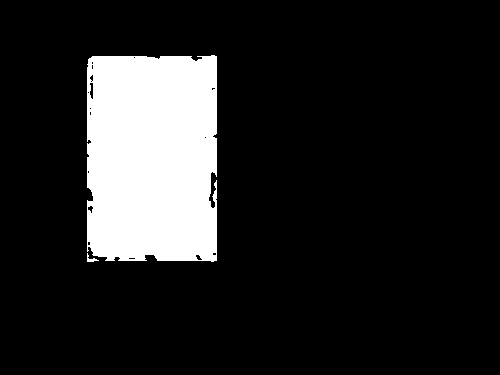

255
Image similarity: 0.9374847840849279


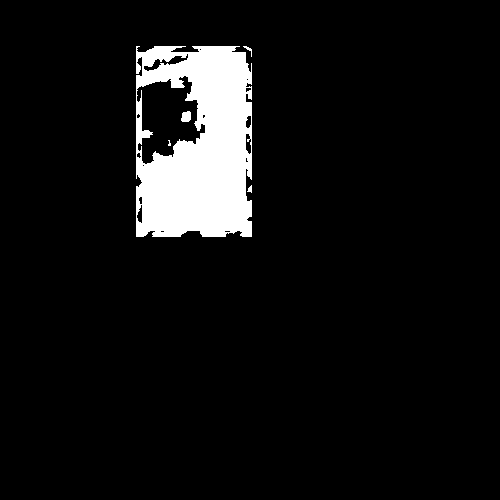

255
Image similarity: 0.9907422220064387


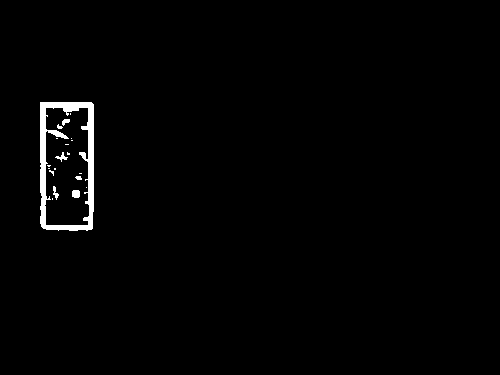

255
Image similarity: 0.8148809427650212


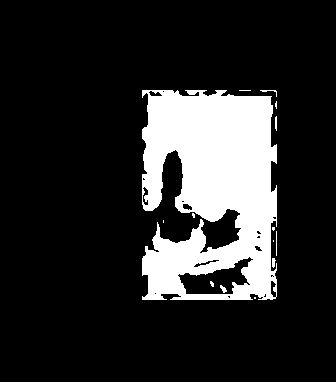

255
Image similarity: 0.9196902983189624


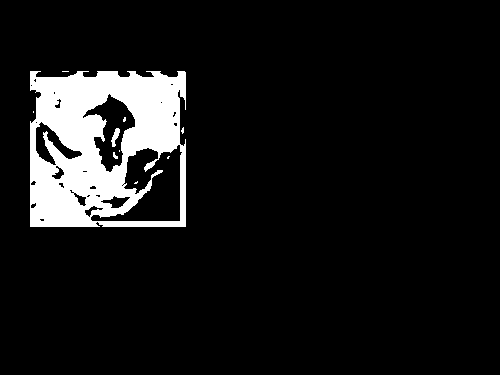

255
Image similarity: 0.9925705999437923


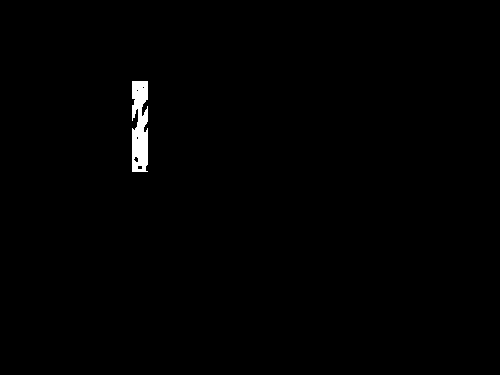

255
Image similarity: 0.9822640637807979


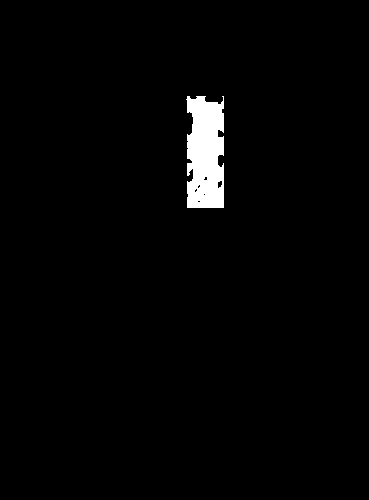

255
Image similarity: 0.9723582377952324


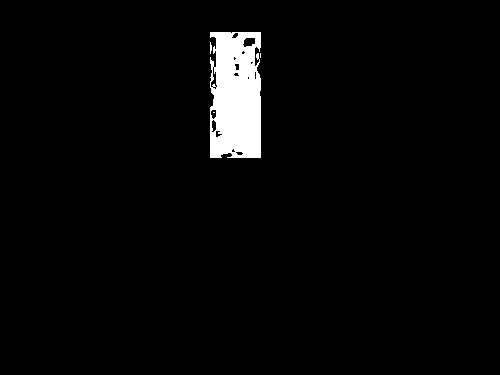

255
Image similarity: 0.9662984062110209


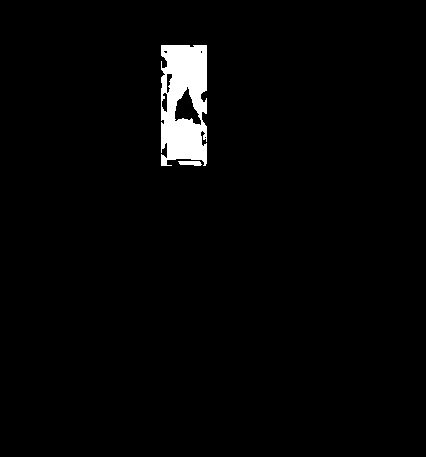

255
Image similarity: 0.969343130282696


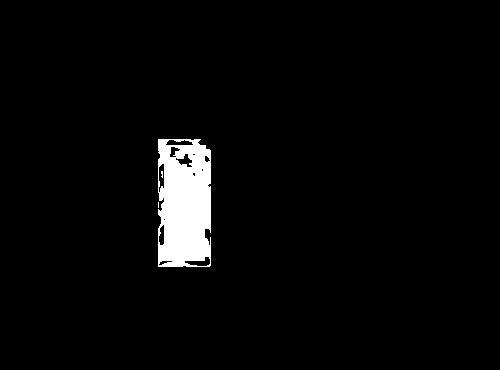

255
Image similarity: 0.9754622225766092


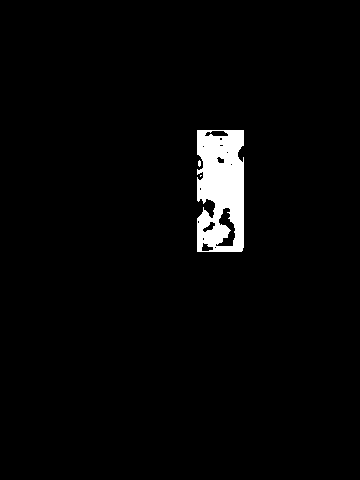

255
Image similarity: 0.8704654574452788


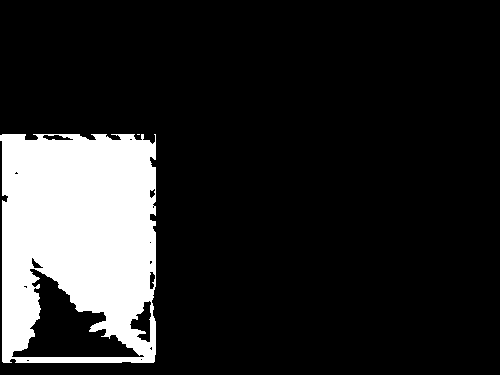

255
Image similarity: 0.9909413015607921


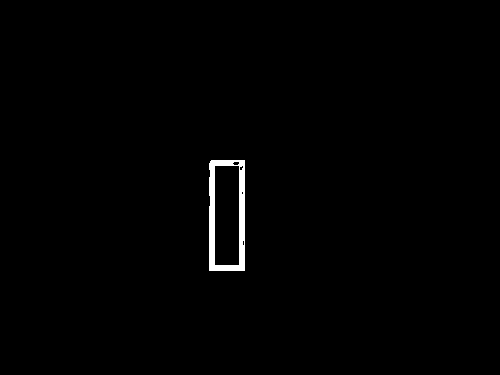

255
Image similarity: 0.9828839822244362


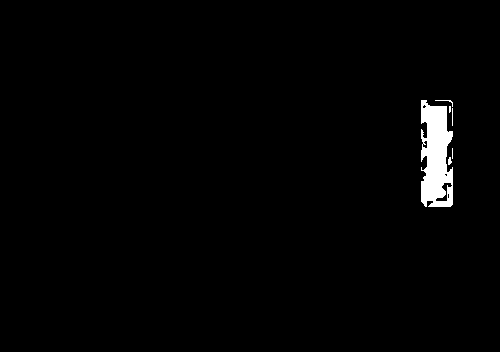

255
Image similarity: 0.9624059148259291


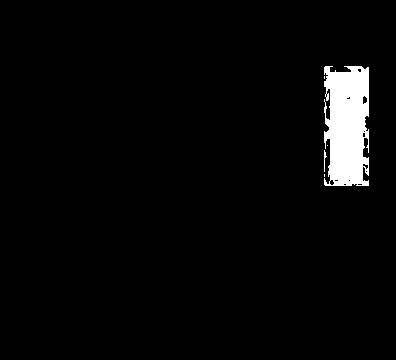

255
Image similarity: 0.9651239116278694


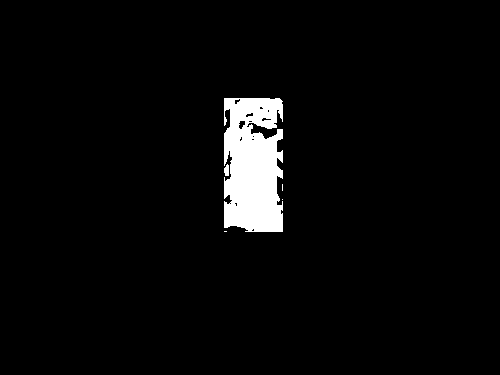

255
Image similarity: 0.9373174190112246


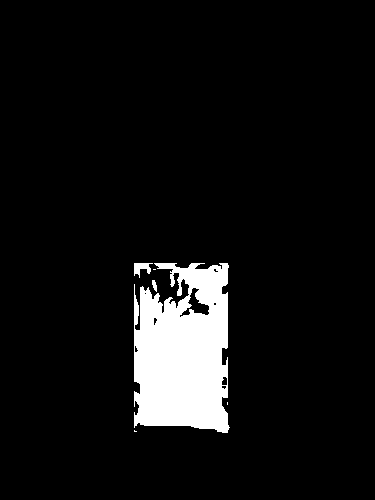

255
Image similarity: 0.9933769673941086


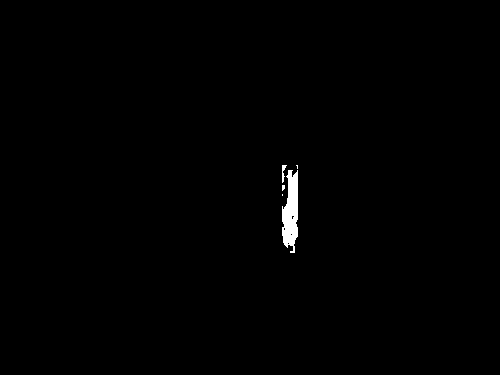

255
Image similarity: 0.9902815598694003


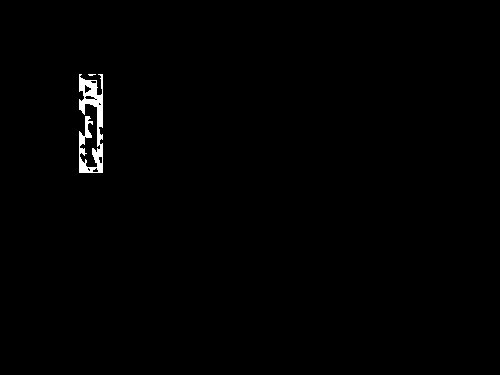

255
Image similarity: 0.9530785439123937


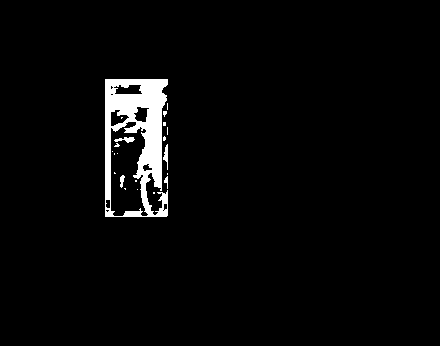

255
Image similarity: 0.9887115324090989


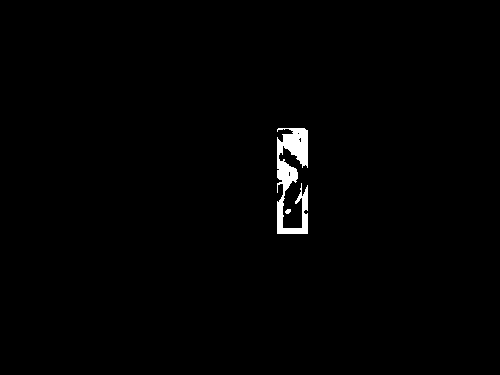

255
Image similarity: 0.9939181858488344


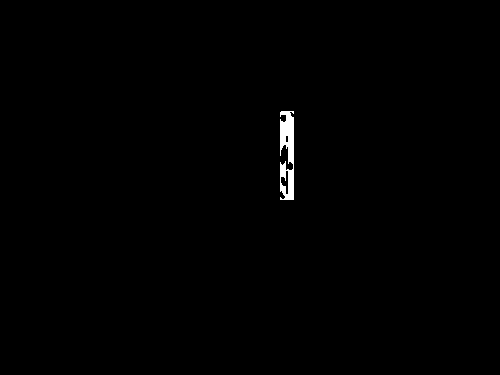

255
Image similarity: 0.9544114131677799


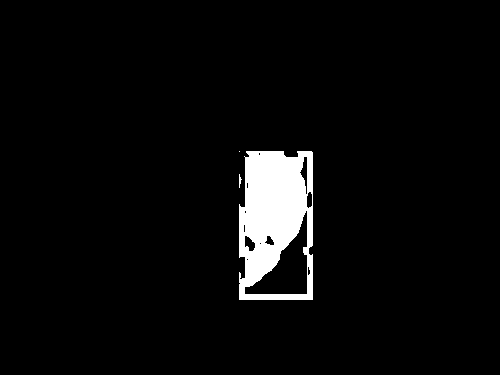

255
Image similarity: 0.9508207808766785


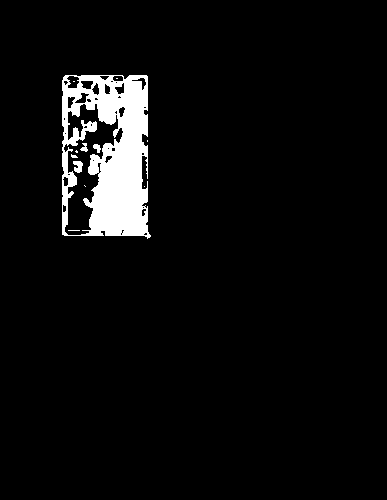

255
Image similarity: 0.9787275896046433


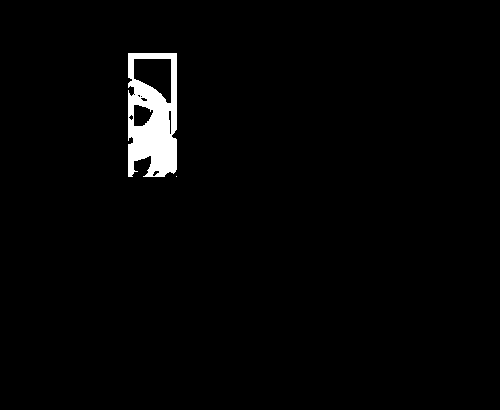

255
Image similarity: 0.8701211623850347


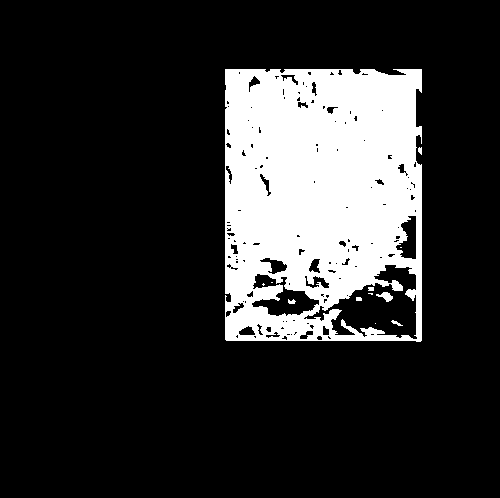

255
Image similarity: 0.9822322382059194


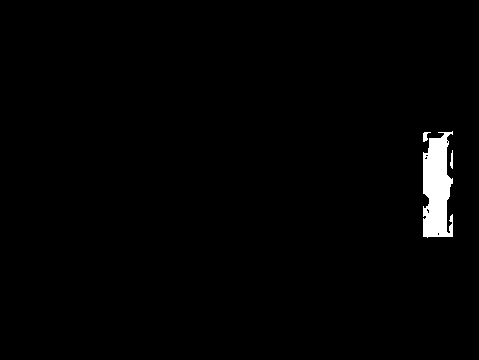

255
Image similarity: 0.9708353530478829


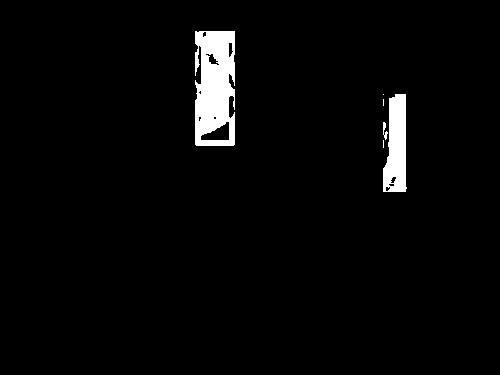

255
Image similarity: 0.8922806765994961


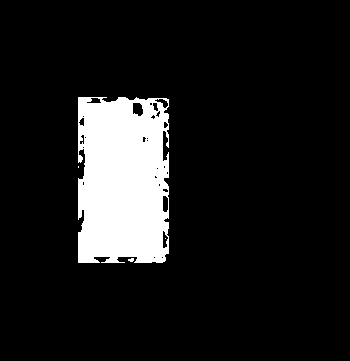

255
Image similarity: 0.9663180808939109


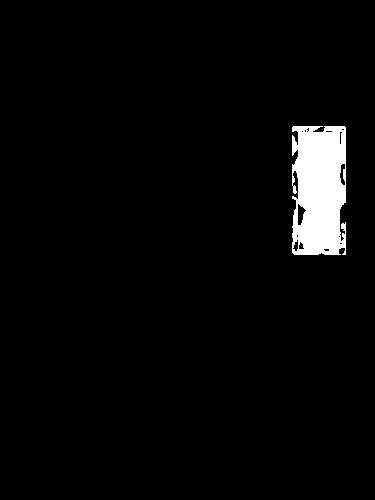

255
Image similarity: 0.9333525891782853


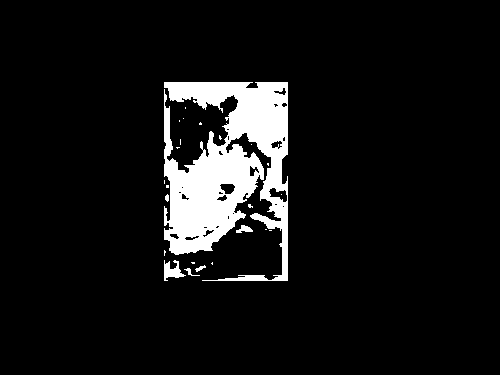

255
Image similarity: 0.9640258664259013


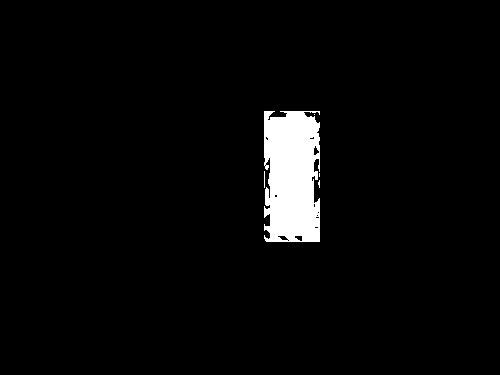

255
Image similarity: 0.9636098320557022


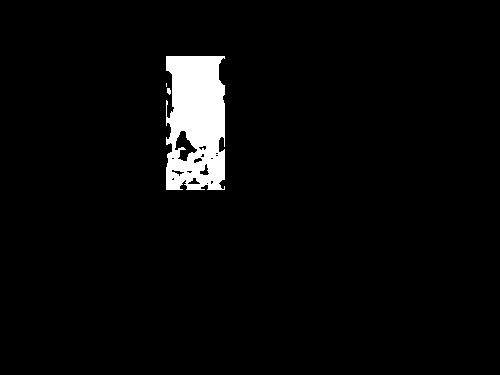

255
Image similarity: 0.9545853188680129


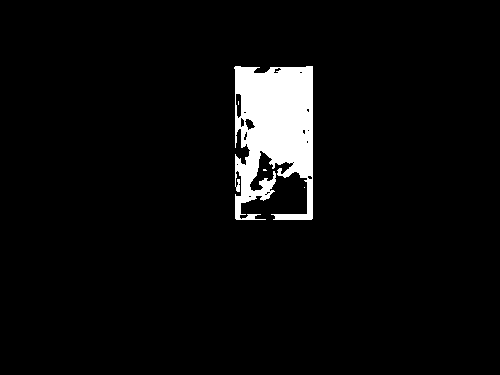

255
Image similarity: 0.9617554370162142


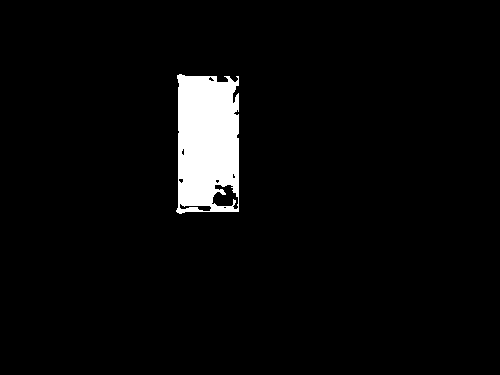

255
Image similarity: 0.7967837447085784


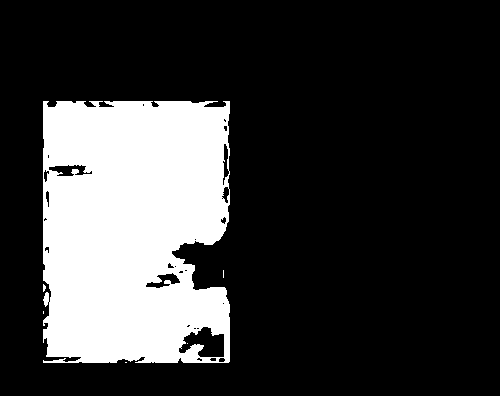

255
Image similarity: 0.9207947993522557


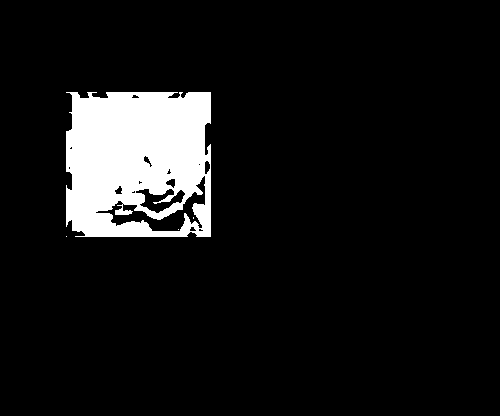

255
Image similarity: 0.942939494985079


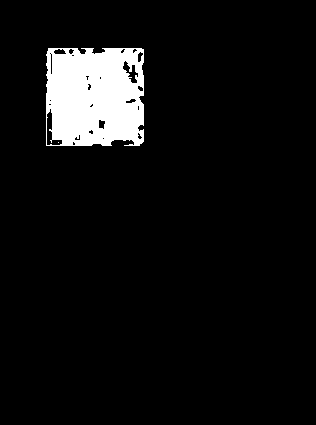

255
Image similarity: 0.9672679344551155


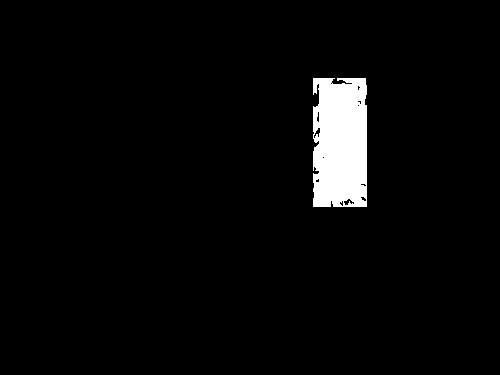

255
Image similarity: 0.9348486914566912


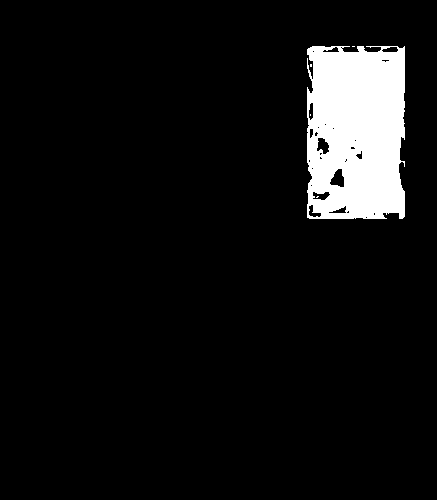

255
Image similarity: 0.985289369934469


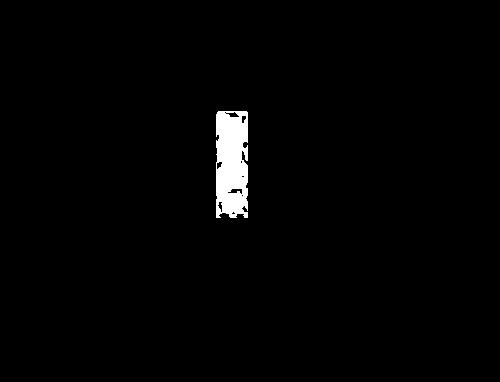

255
Image similarity: 0.9381951825809653


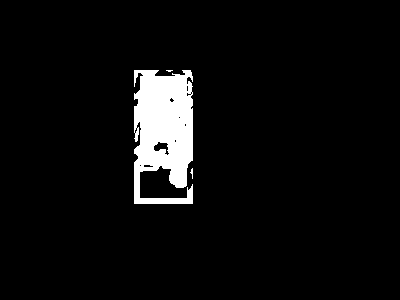

255
Image similarity: 0.9162877919801088


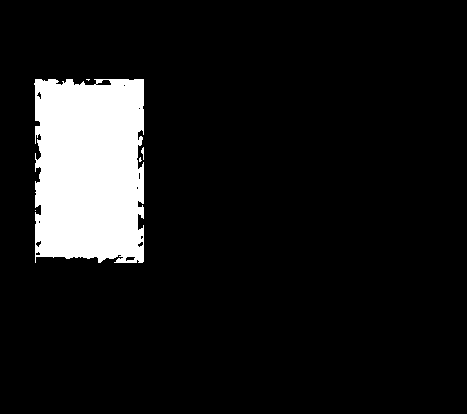

255
Image similarity: 0.8893621655986547


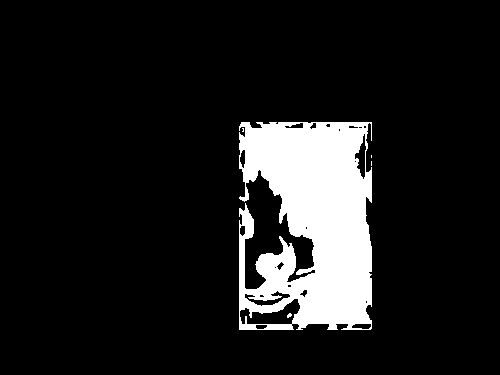

255
Image similarity: 0.9477676216356473


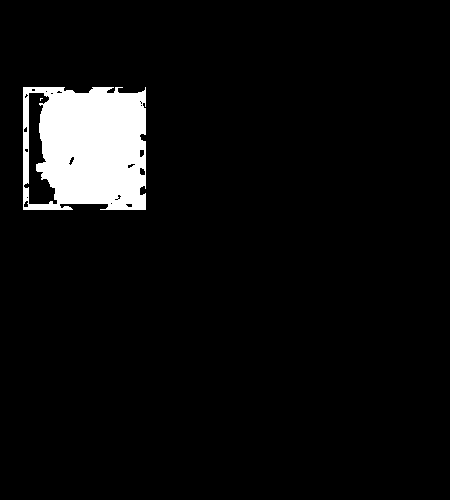

255
Image similarity: 0.9467528002092824


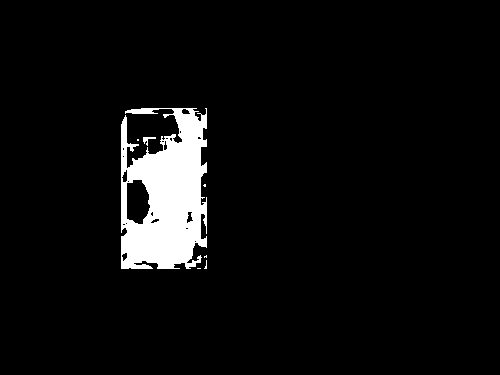

255
Image similarity: 0.9642140955002376


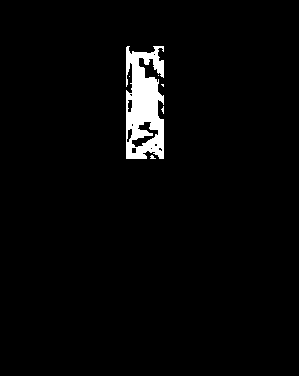

255
Image similarity: 0.9787683513841209


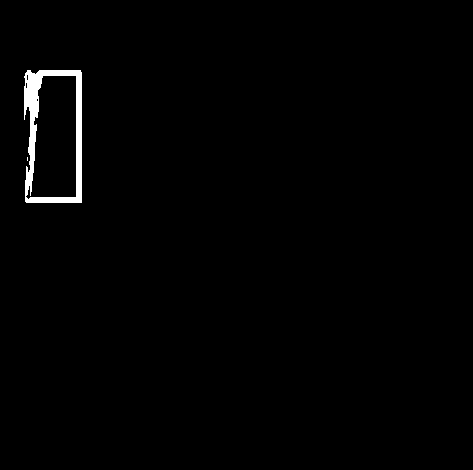

255
Image similarity: 0.953354670135312


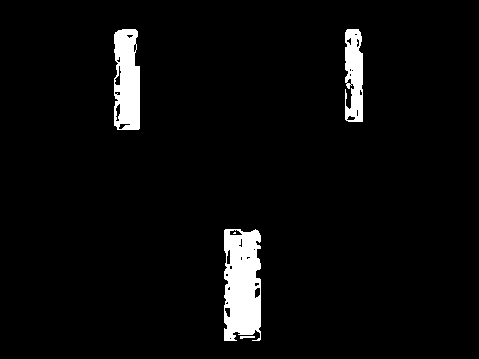

255
Image similarity: 0.8352504109746256


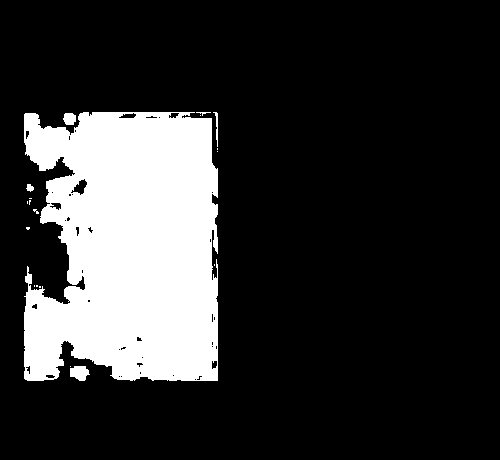

255
Image similarity: 0.9191619915067492


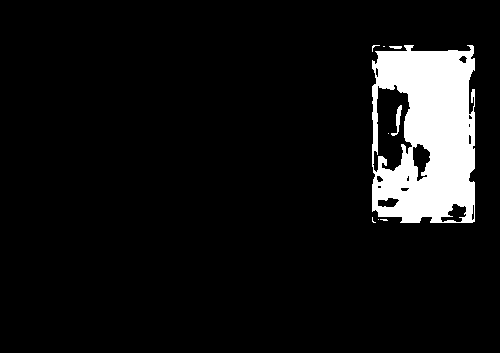

255
Image similarity: 0.9766548896008577


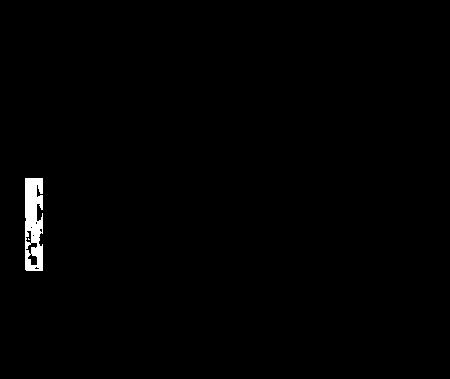

255
Image similarity: 0.990939184232271


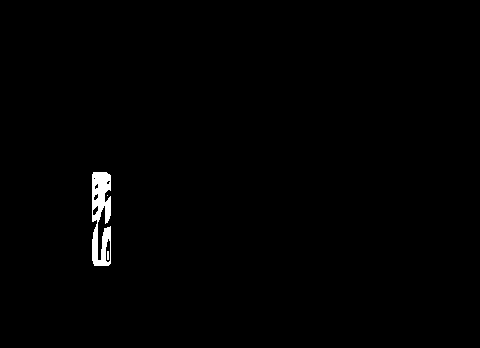

255
Image similarity: 0.9398165459137456


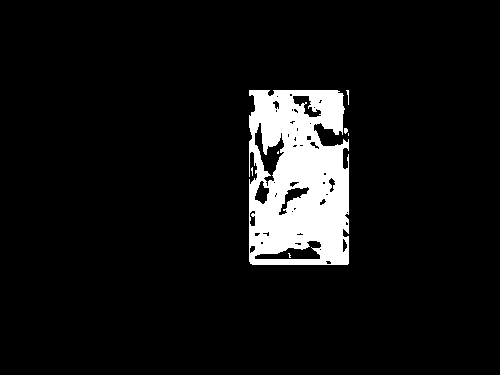

255
Image similarity: 0.9885239586889006


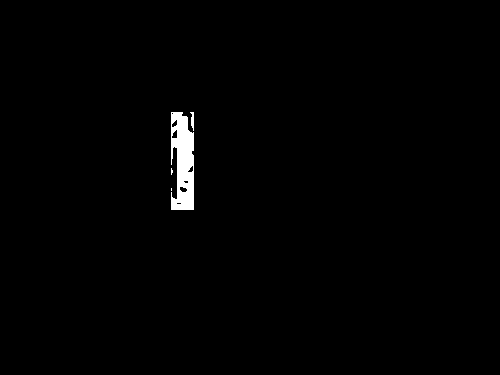

255
Image similarity: 0.9296953055898528


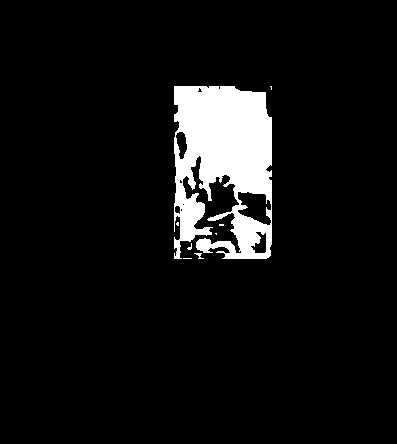

255
Image similarity: 0.9260740389967826


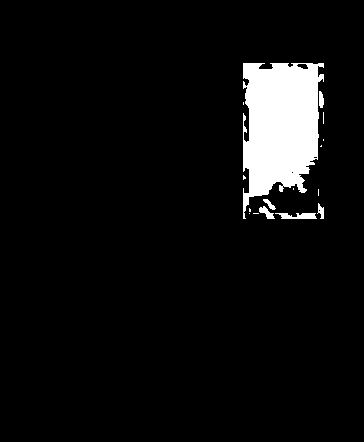

255
Image similarity: 0.9963337614585855


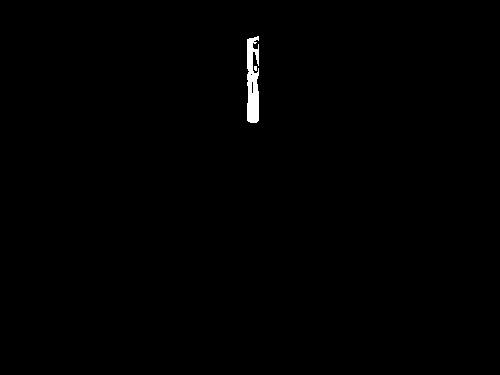

255
Image similarity: 0.9810879713281859


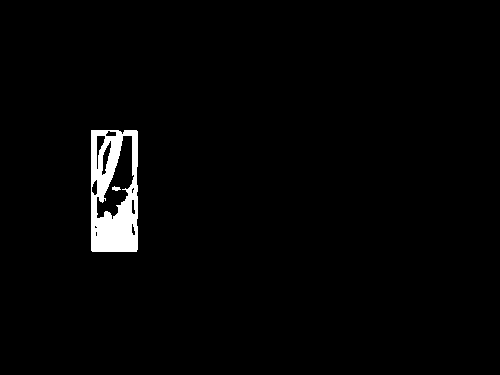

255
Image similarity: 0.9754536295361955


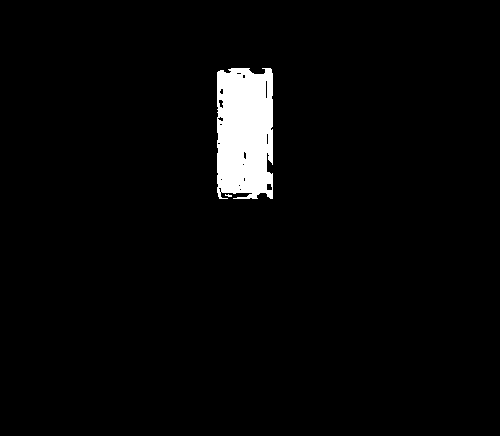

255
Image similarity: 0.9943655383298861


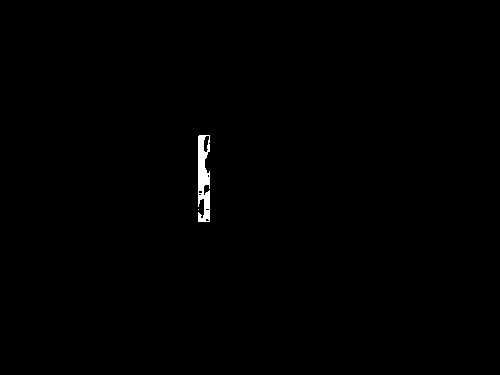

255
Image similarity: 0.8967067311937631


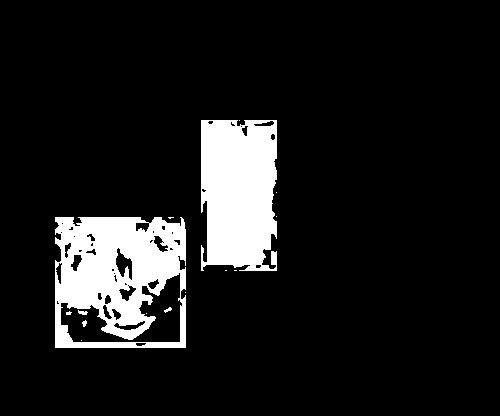

255
Image similarity: 0.9922667210535462


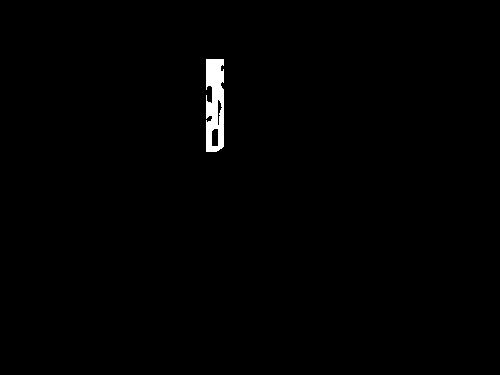

255
Image similarity: 0.9229886159305091


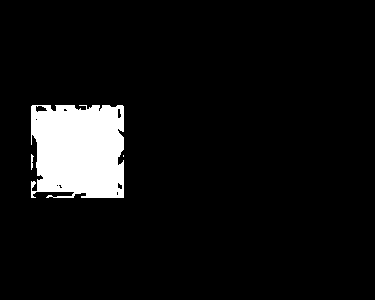

255
Image similarity: 0.9517056136503677


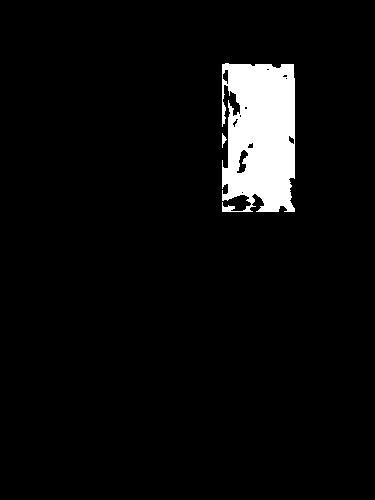

255
Image similarity: 0.914372096928634


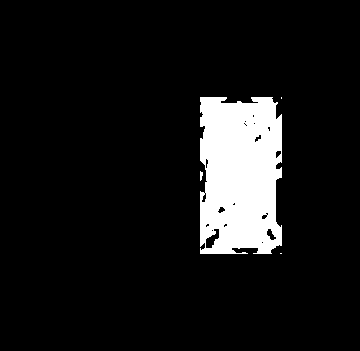

255
Image similarity: 0.9569655752675041


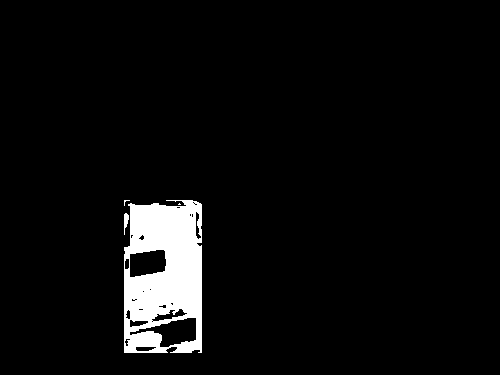

255
Image similarity: 0.9754757999732656


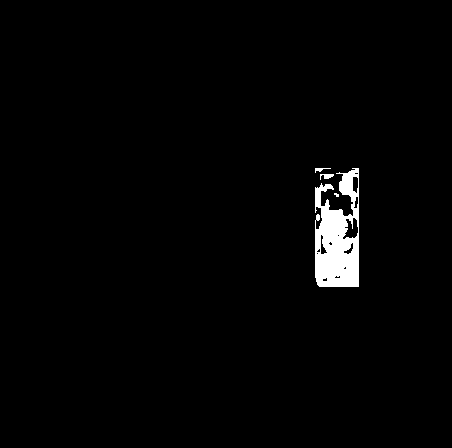

255
Image similarity: 0.9725536964047764


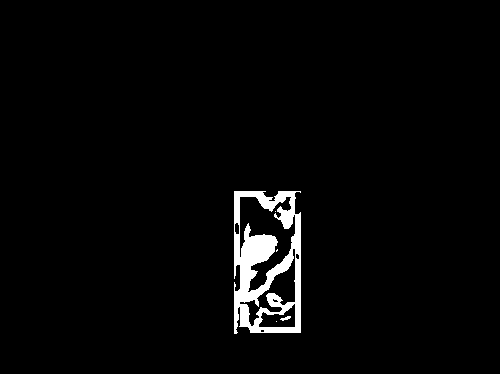

255
Image similarity: 0.9596855617150687


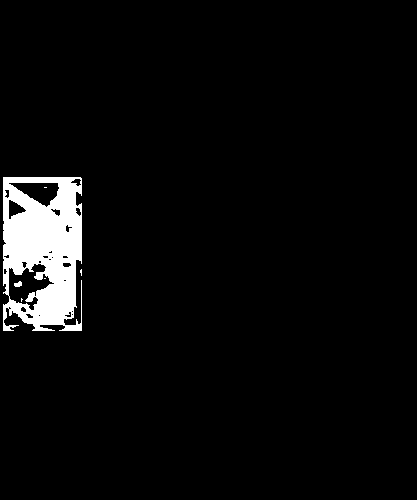

255
Image similarity: 0.9424815779569462


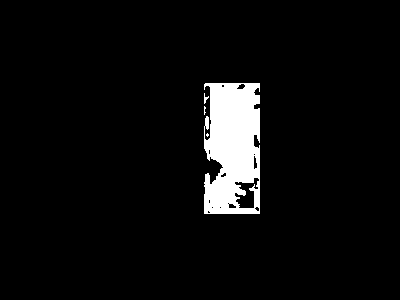

255
Image similarity: 0.8421603930600603


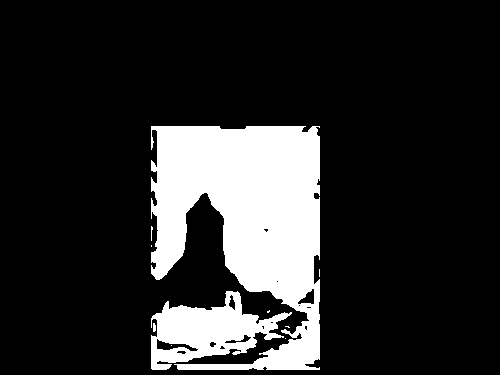

255
Image similarity: 0.9583950883630287


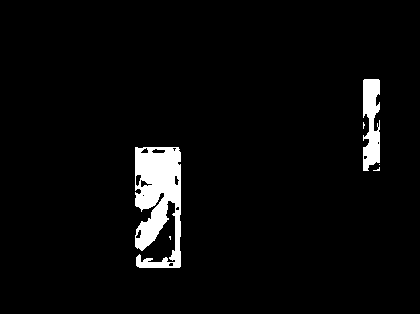

255
Image similarity: 0.7720533078564665


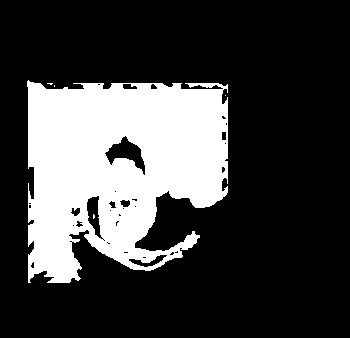

255
Image similarity: 0.9488076245887506


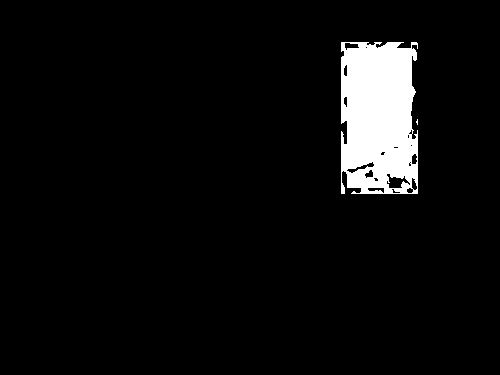

255
Image similarity: 0.8329615091011126


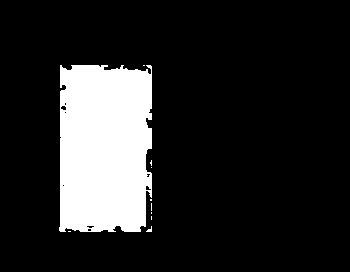

255
Image similarity: 0.9894480876163323


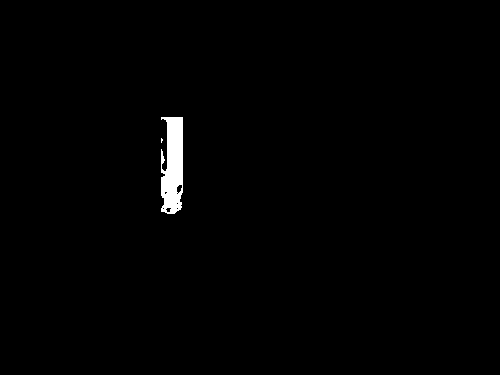

255
Image similarity: 0.9875121897281351


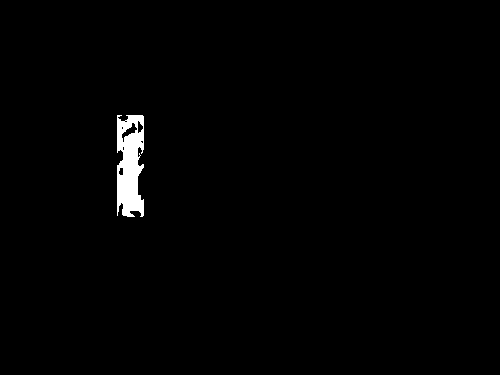

255
Image similarity: 0.7772135365238779


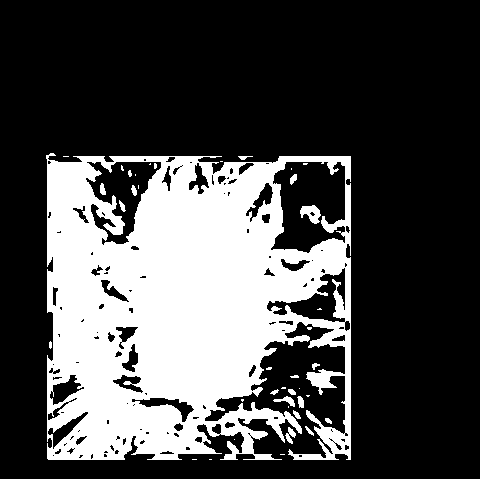

255
Image similarity: 0.8883320752336514


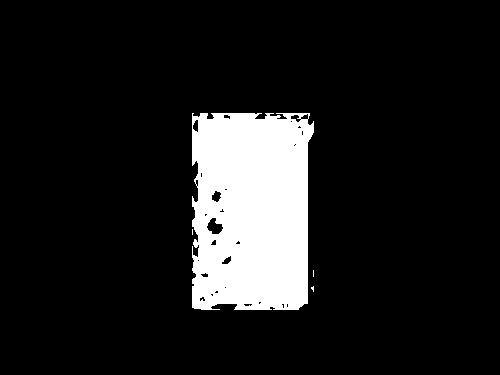

255
Image similarity: 0.8436192629634767


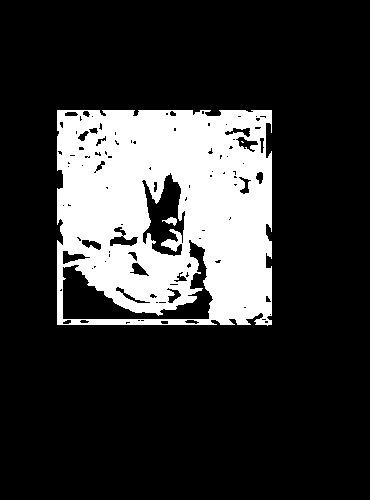

255
Image similarity: 0.9427794397203043


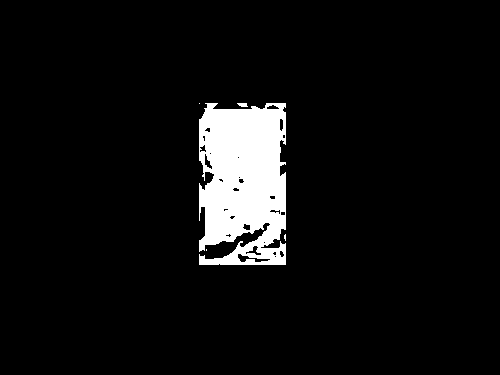

255
Image similarity: 0.9030412761494432


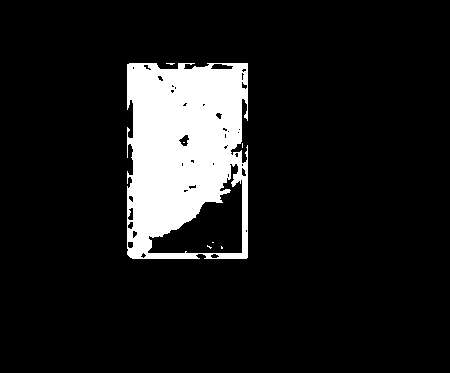

255
Image similarity: 0.8045191139334104


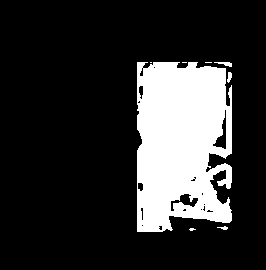

255
Image similarity: 0.9721446951727096


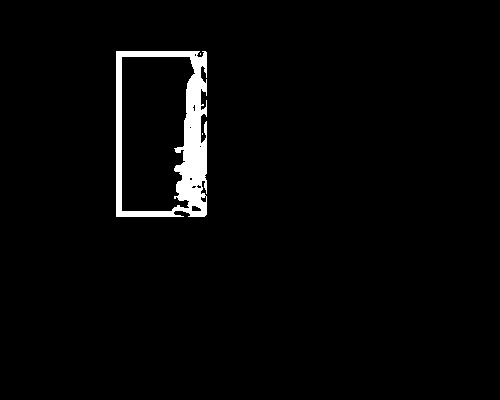

255
Image similarity: 0.9060337345844698


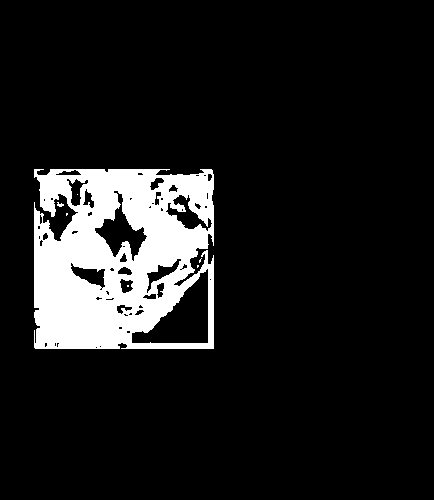

255
Image similarity: 0.958344464209927


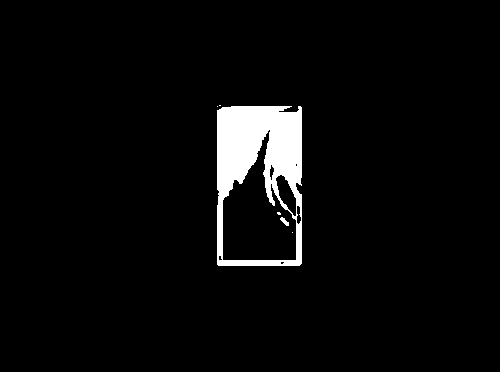

255
Image similarity: 0.9541300465109206


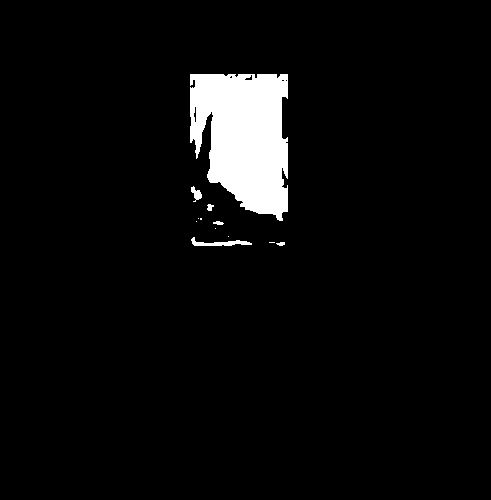

255
Image similarity: 0.9774662465185473


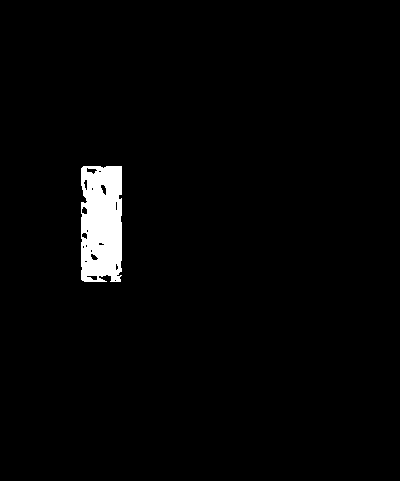

255
Image similarity: 0.9161433963494426


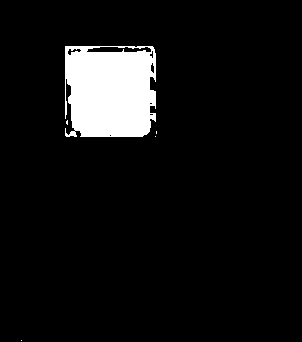

255
Image similarity: 0.947655303885193


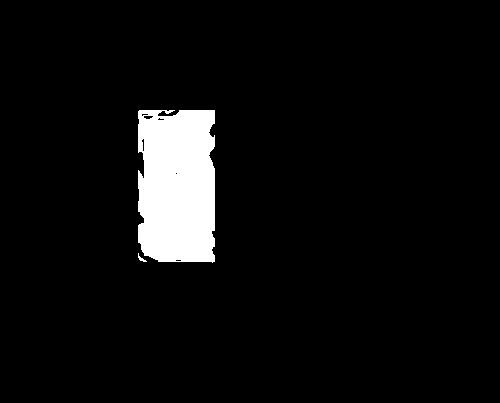

255
Image similarity: 0.9649422068689395


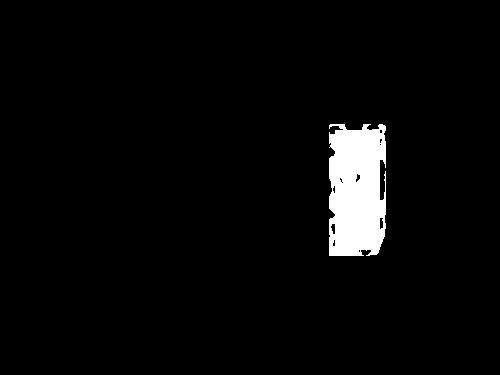

255
Image similarity: 0.958633898142301


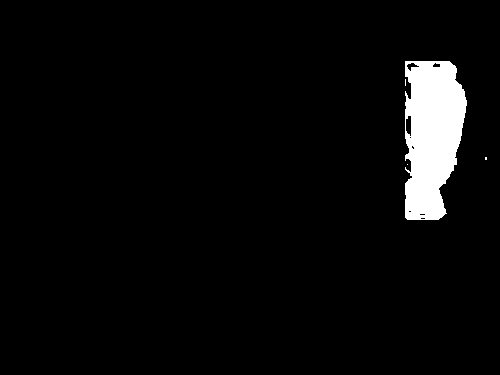

255
Image similarity: 0.9152429131644398


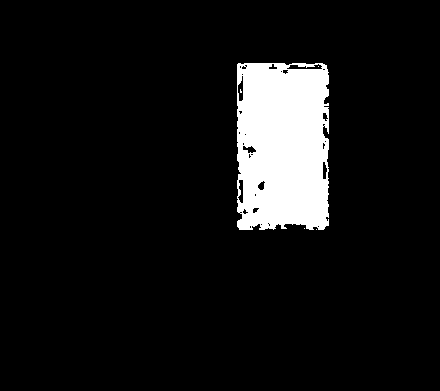

255
Image similarity: 0.9498623198055155


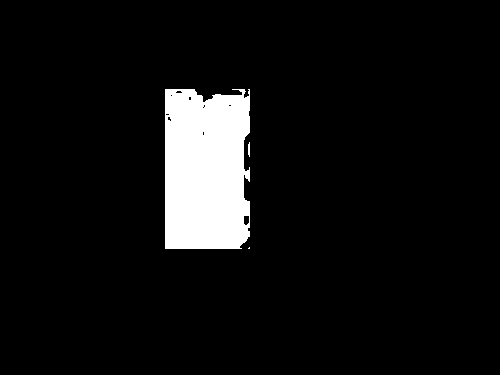

255
Image similarity: 0.978620218491212


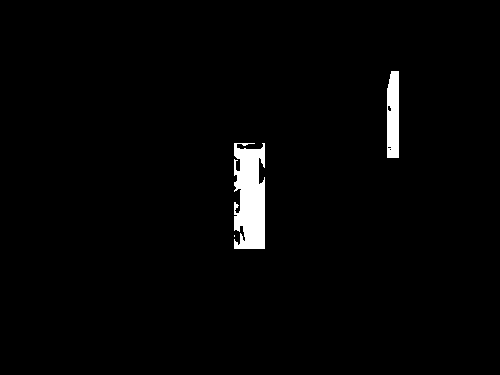

255
Image similarity: 0.9912166535632236


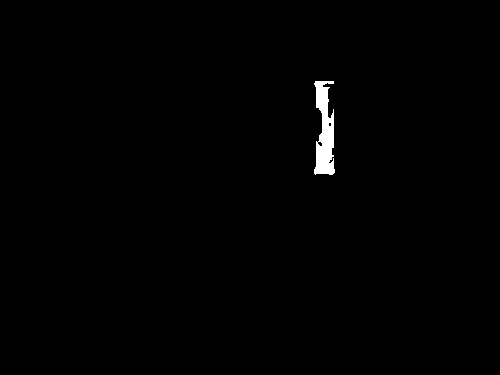

255
Image similarity: 0.9242763112300979


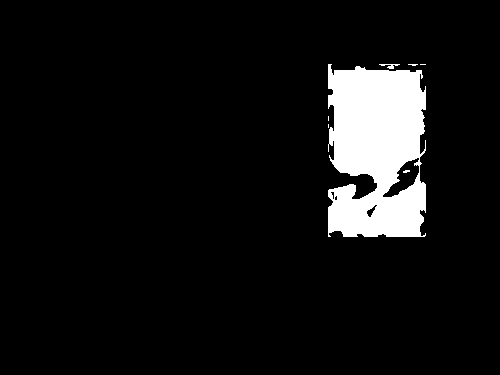

255
Image similarity: 0.9486297865542139


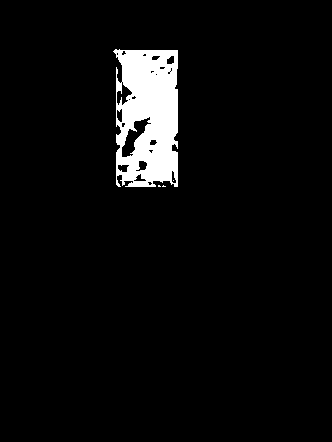

255
Image similarity: 0.9742486180883663


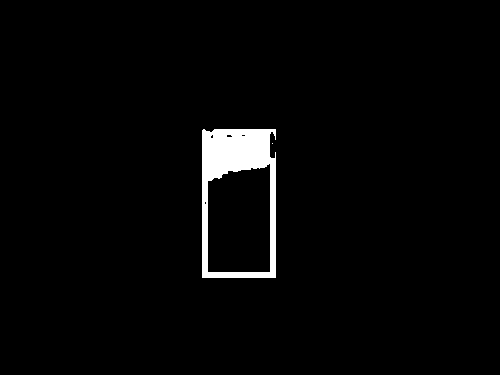

255
Image similarity: 0.9772868221022476


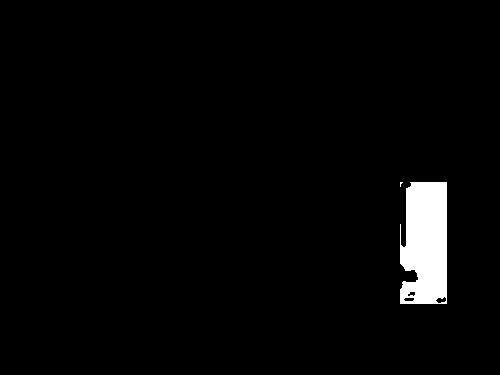

255
Image similarity: 0.8644352346628108


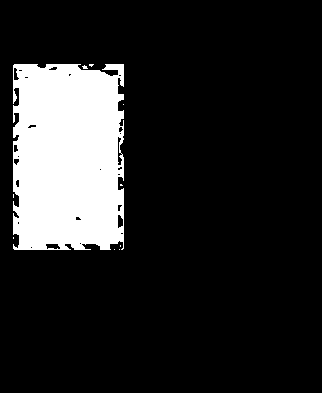

255
Image similarity: 0.9778347748050589


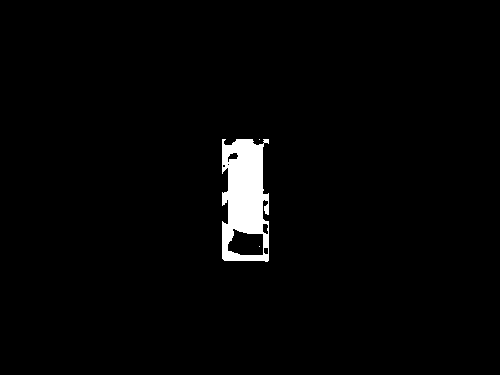

255
Image similarity: 0.9267097967253662


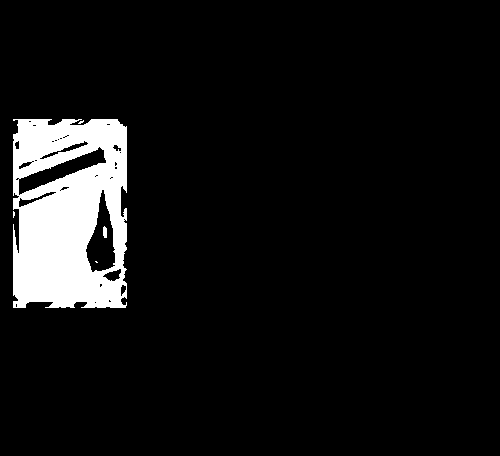

255
Image similarity: 0.8791456205219664


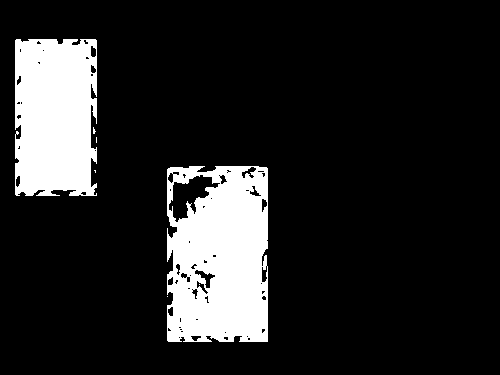

255
Image similarity: 0.9840407551473414


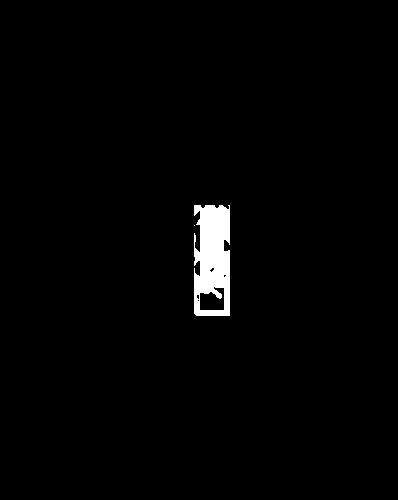

255
Image similarity: 0.9853728877416397


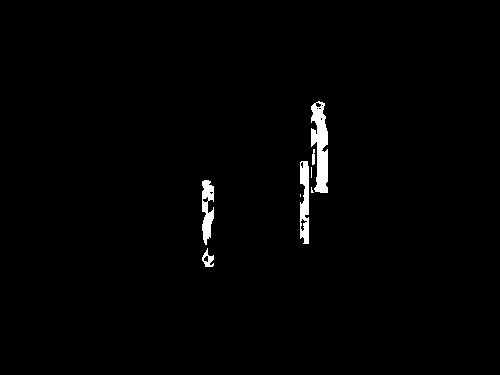

255
Image similarity: 0.9166945761231519


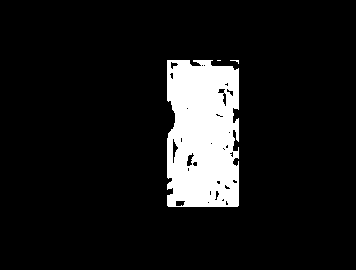

255
Image similarity: 0.9136678044832476


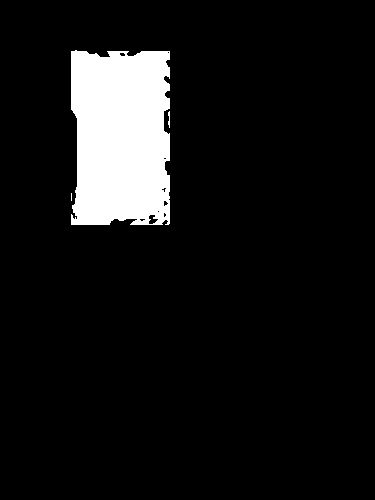

255
Image similarity: 0.9579582796886924


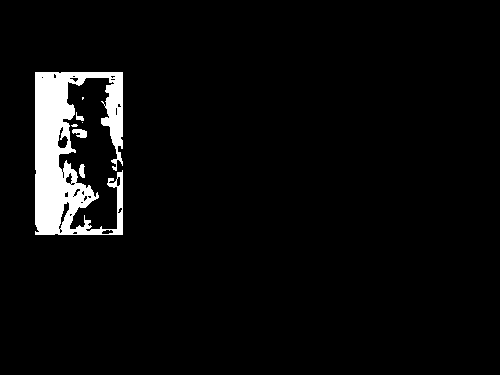

255
Image similarity: 0.9870155581892409


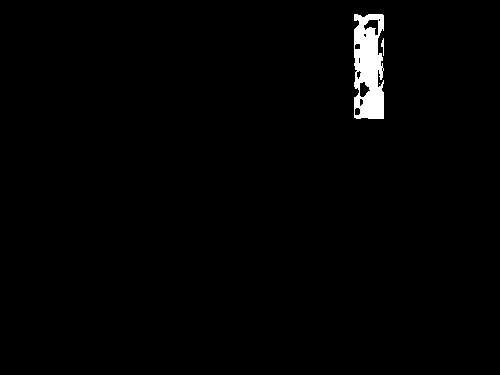

255
Image similarity: 0.9974799350522662


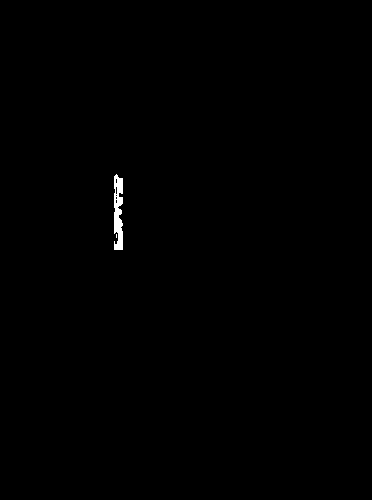

255
Image similarity: 0.9069120345422885


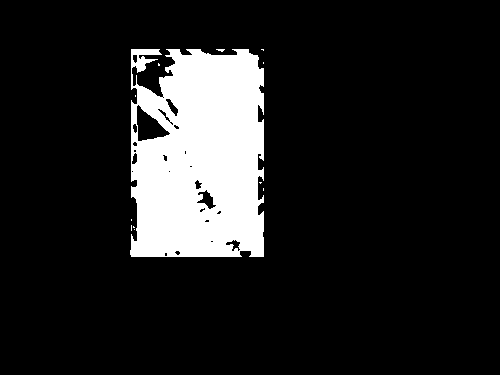

255
Image similarity: 0.9242691775756848


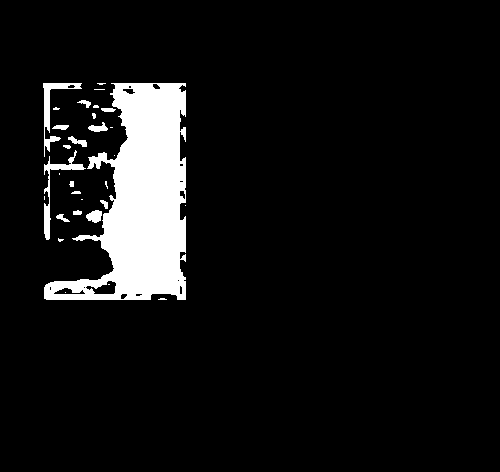

255
Image similarity: 0.9537296607994193


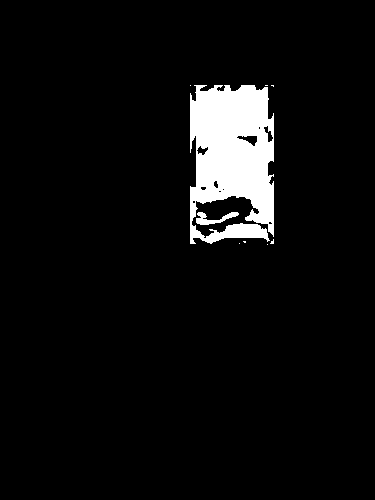

255
Image similarity: 0.9849569005753874


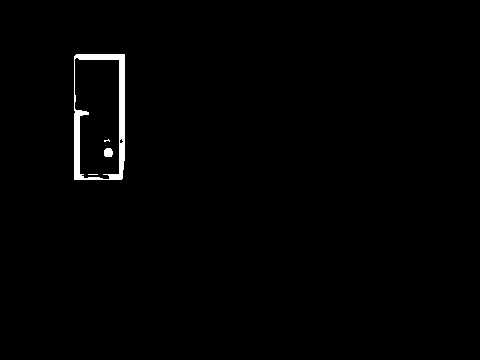

255
Image similarity: 0.9780875834692555


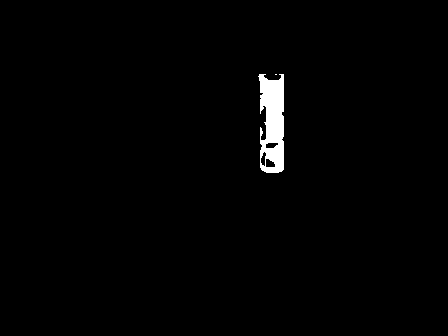

255
Image similarity: 0.967106588503391


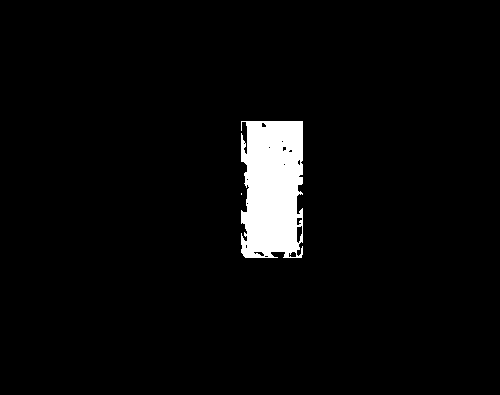

255
Image similarity: 0.9697187473358174


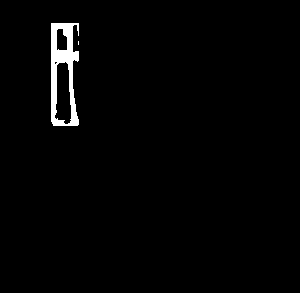

255
Image similarity: 0.9045190938303401


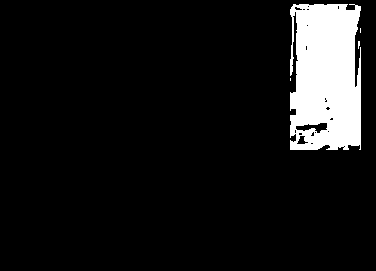

255
Image similarity: 0.9855563379307681


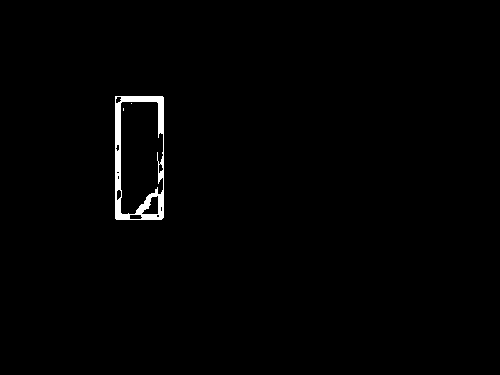

255
Image similarity: 0.9796943938062864


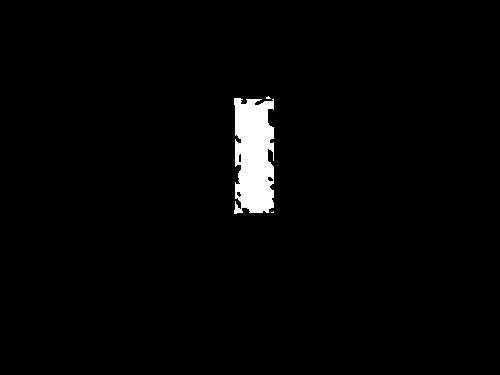

255
Image similarity: 0.8819165772898448


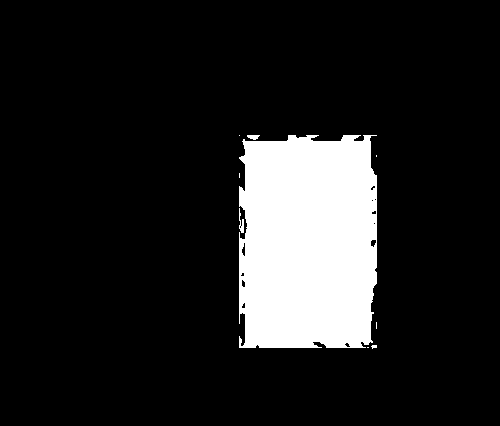

255
Image similarity: 0.9231000862433923


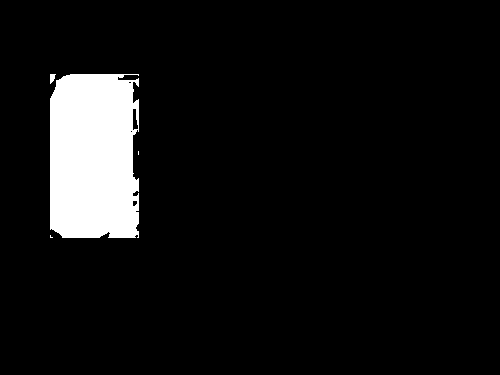

255
Image similarity: 0.9867119709439363


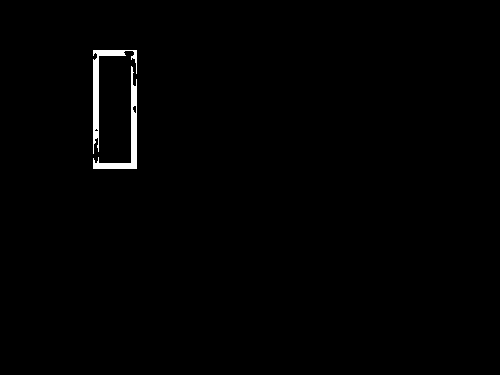

255
Image similarity: 0.9369318185631232


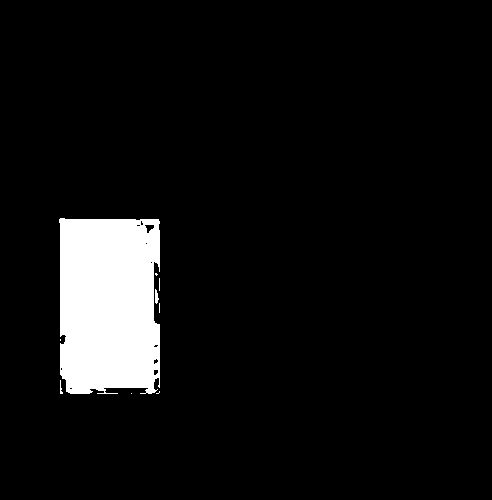

255
Image similarity: 0.9734615131862345


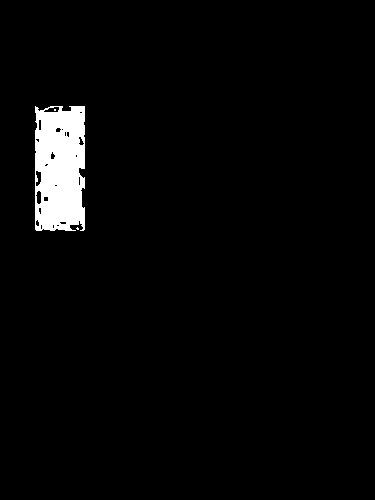

255
Image similarity: 0.9223306508942353


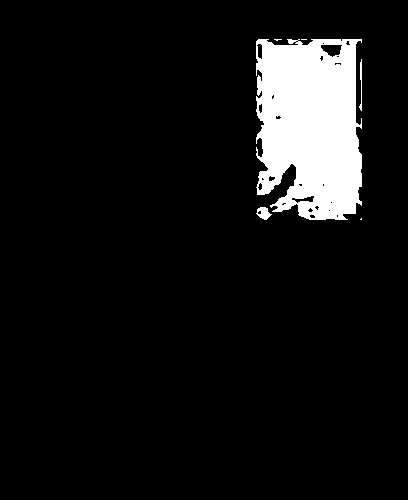

255
Image similarity: 0.9697295204373897


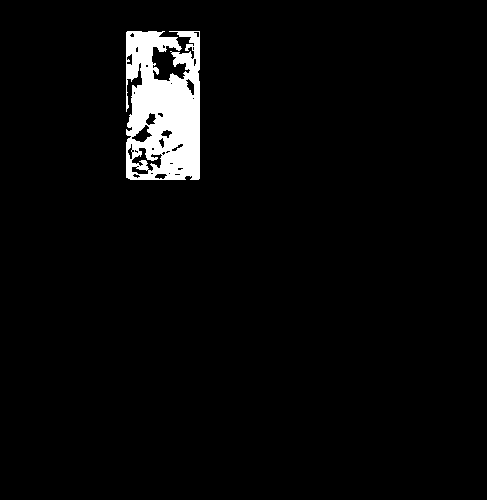

255
Image similarity: 0.9764912217011666


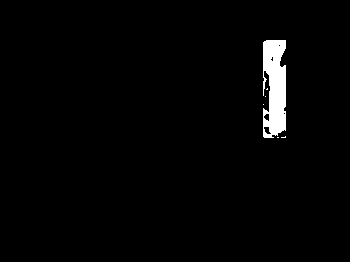

255
Image similarity: 0.8863113145778462


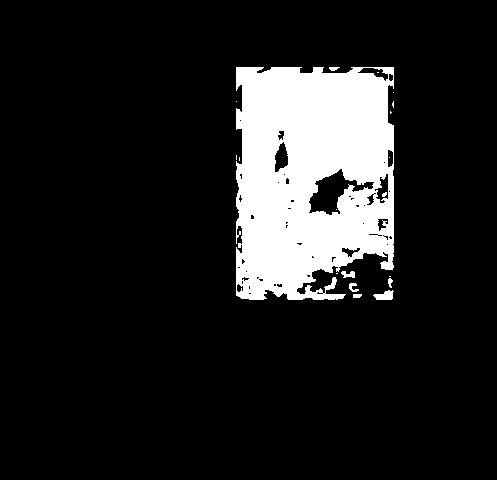

255
Image similarity: 0.9274620577601057


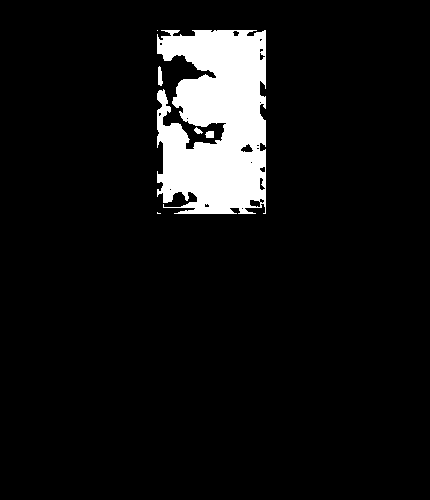

255
Image similarity: 0.9506644025647368


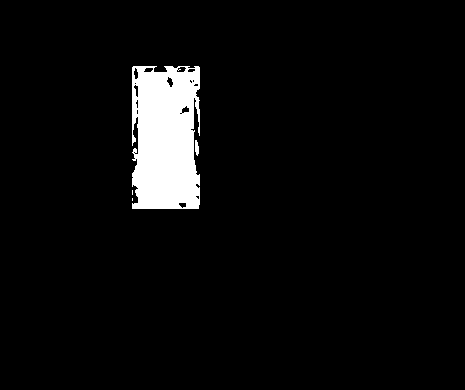

255
Image similarity: 0.9377072285796875


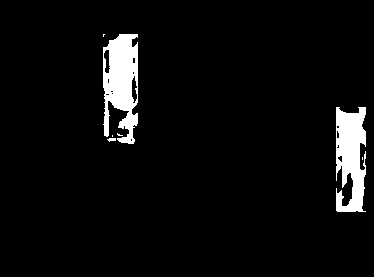

255
Image similarity: 0.982170610172258


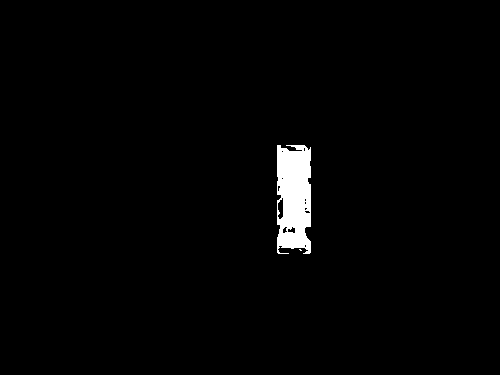

255
Image similarity: 0.7989827475128687


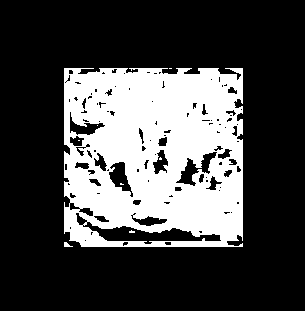

255
Image similarity: 0.9866862747265818


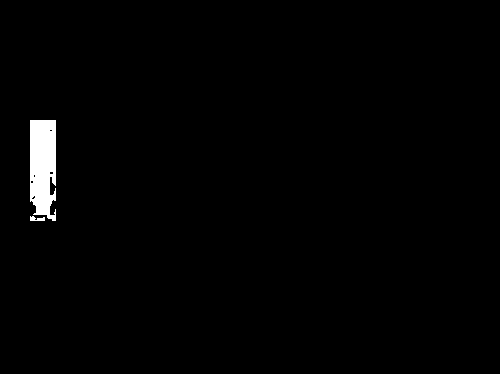

255
Image similarity: 0.9297083041123404


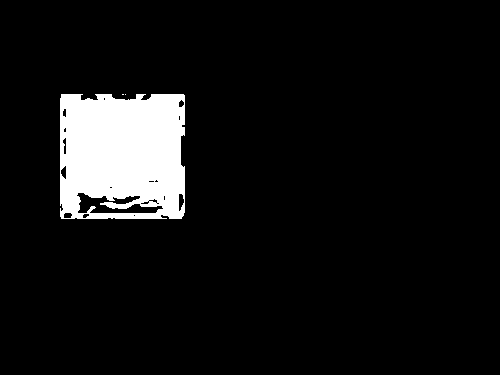

255
Image similarity: 0.92075162106619


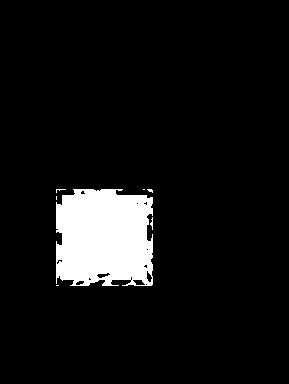

255
Image similarity: 0.9901370404551414


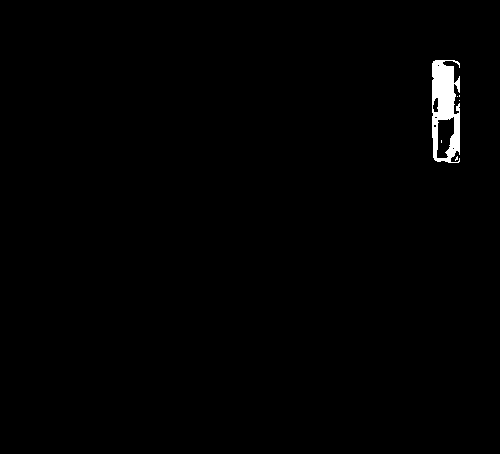

255
Image similarity: 0.9752858706404584


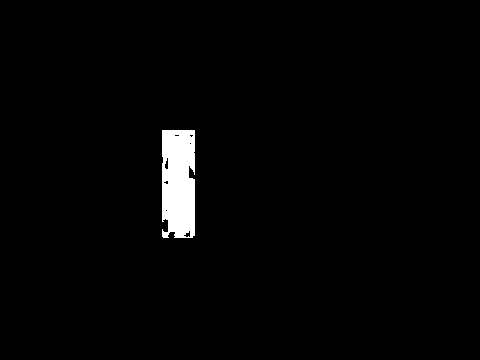

255
Image similarity: 0.9970375864857827


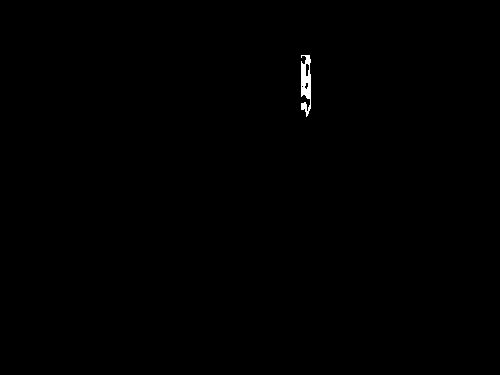

255
Image similarity: 0.9765841086463212


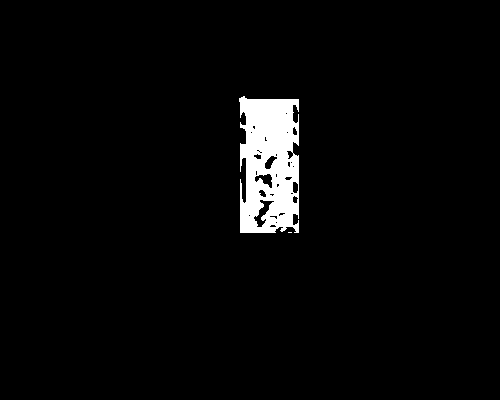

255
Image similarity: 0.9953722665577197


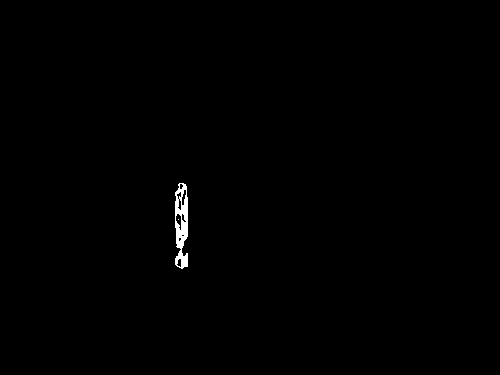

255
Image similarity: 0.9932881614564097


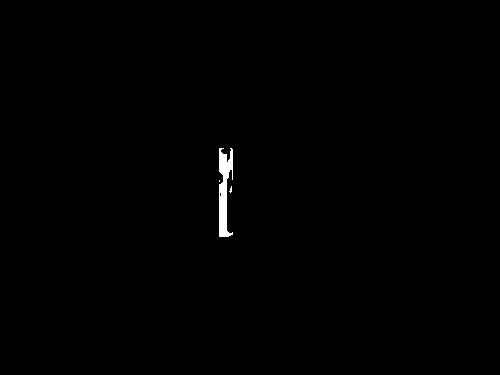

255
Image similarity: 0.9871091724801828


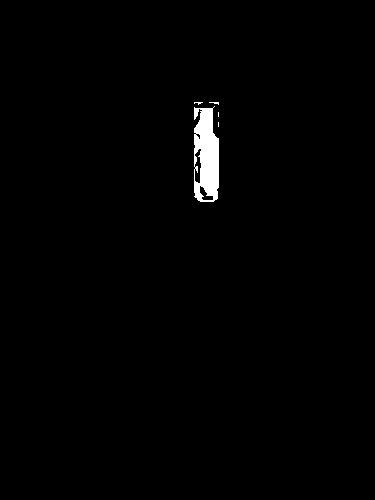

255
Image similarity: 0.9032652652530277


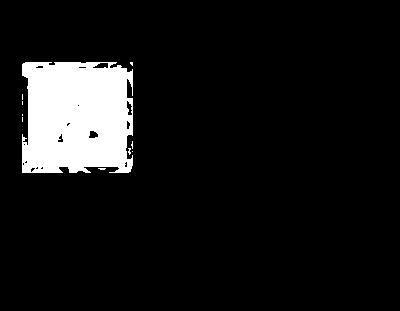

255
Image similarity: 0.9939996187294006


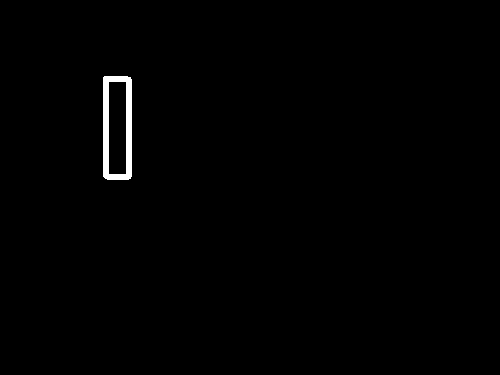

255
Image similarity: 0.9417546293391432


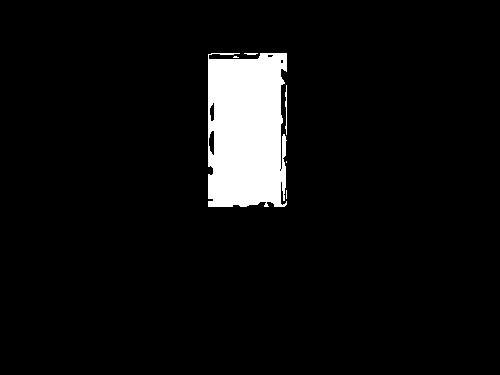

255
Image similarity: 0.8411530239400153


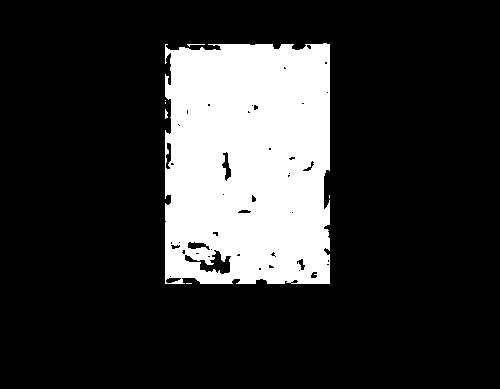

255
Image similarity: 0.9901086692571874


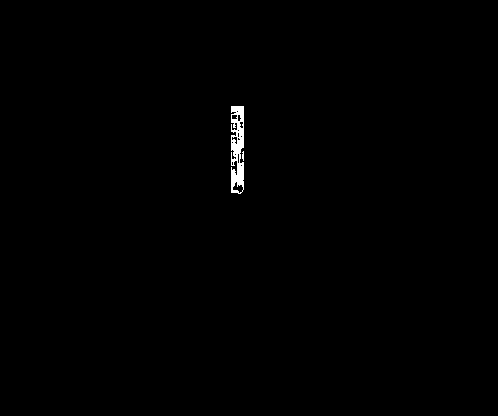

255
Image similarity: 0.7882659983908727


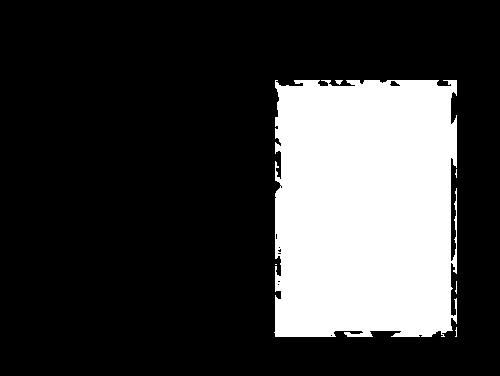

255
Image similarity: 0.8261282449436878


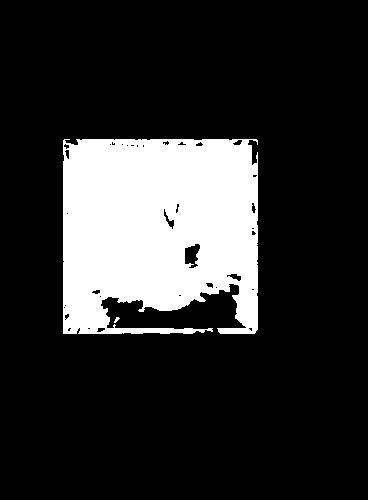

255
Image similarity: 0.9861819929478006


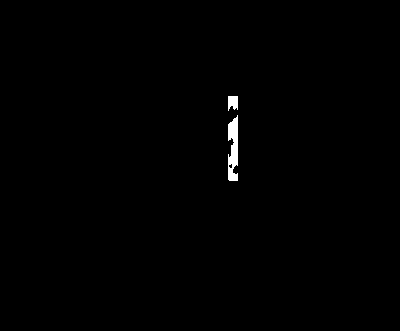

255
Image similarity: 0.9098521527516549


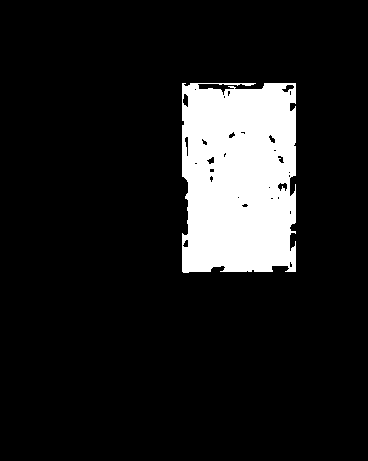

255
Image similarity: 0.9928950177021181


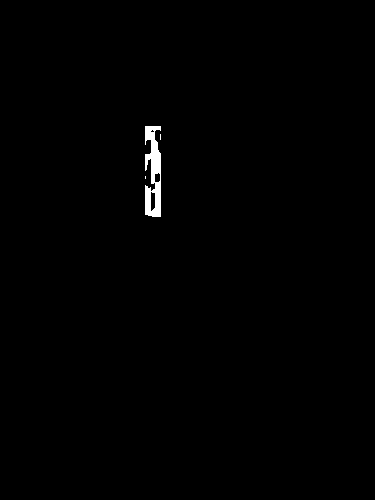

255
Image similarity: 0.9378448292035563


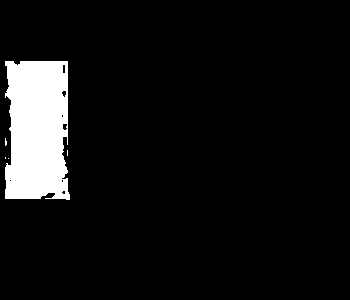

255
Image similarity: 0.9606704876169891


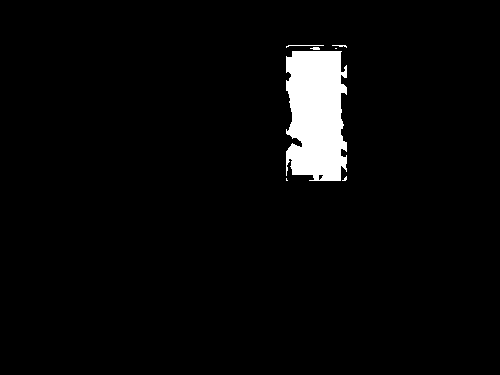

255
Image similarity: 0.9933014317860752


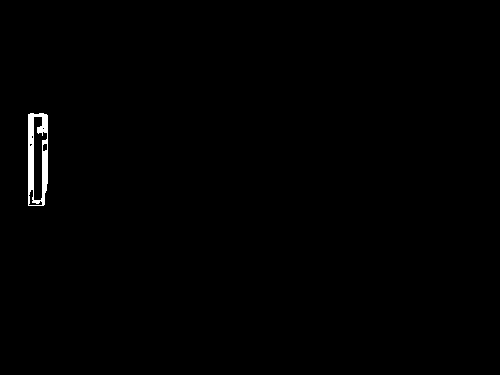

255
Image similarity: 0.9601980347303092


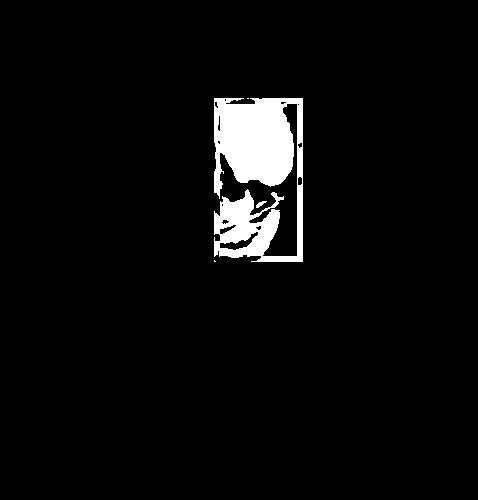

255
Image similarity: 0.9236073400718341


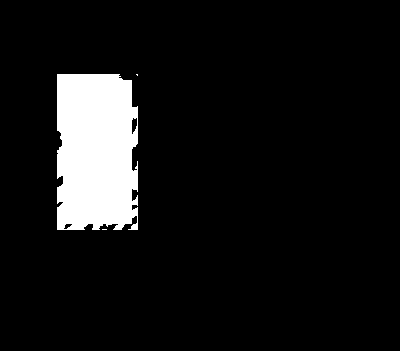

255
Image similarity: 0.9936135734194675


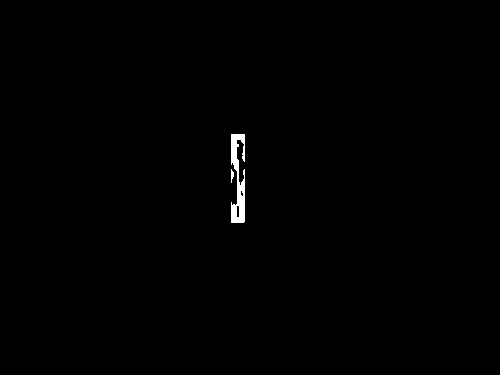

255
Image similarity: 0.8875944599516201


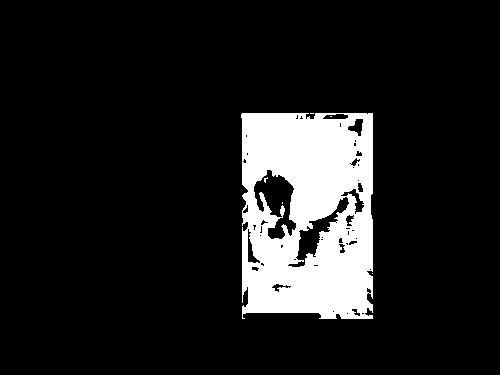

255
Image similarity: 0.9873415656785468


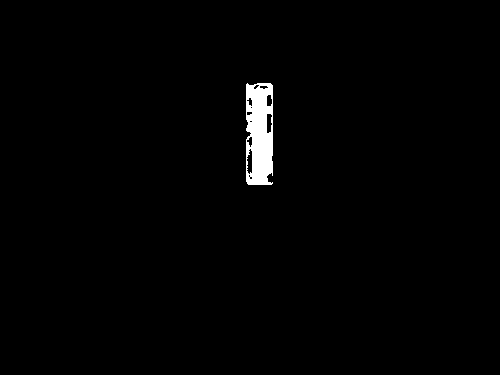

255
Image similarity: 0.9843466844394534


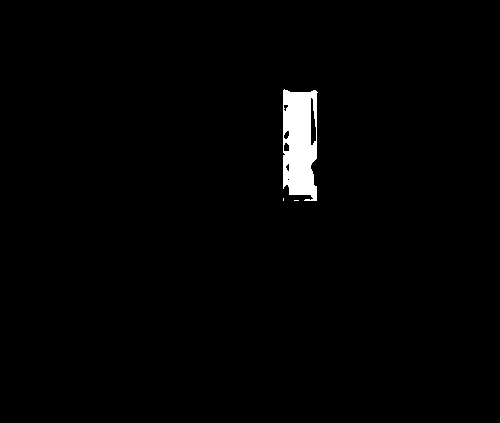

255
Image similarity: 0.9556991842639455


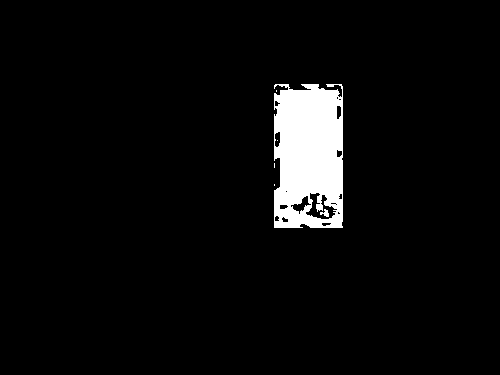

255
Image similarity: 0.8394434802008927


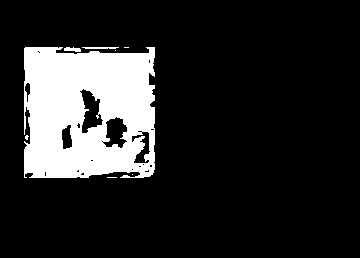

255
Image similarity: 0.9544750967407326


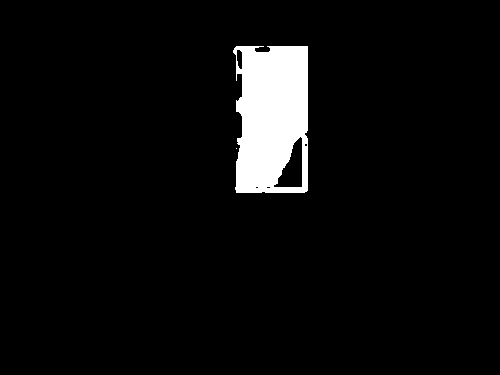

255
Image similarity: 0.9810304665812517


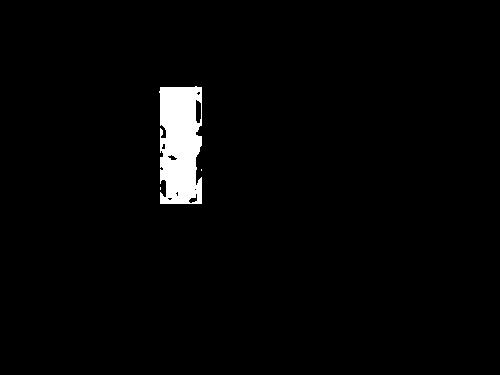

255
Image similarity: 0.9104207566031919


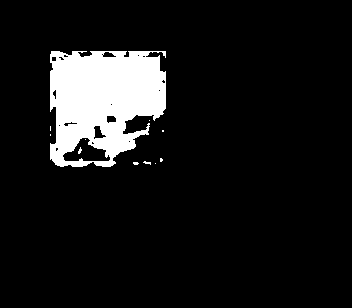

255
Image similarity: 0.8343614876622496


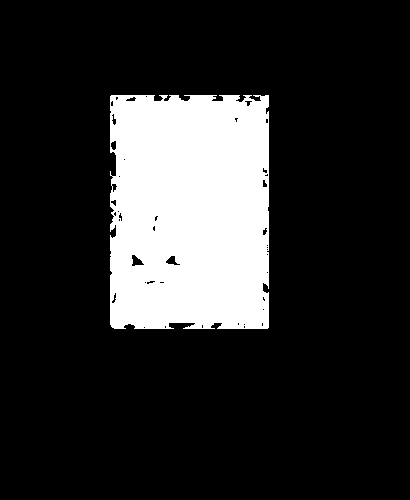

255
Image similarity: 0.9626069562530244


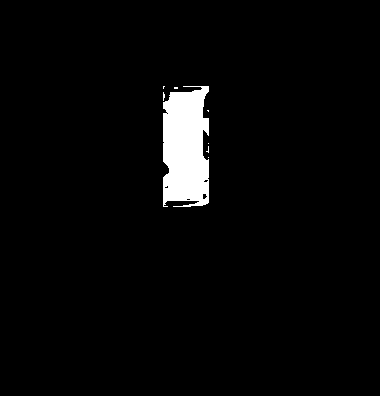

255
Image similarity: 0.9424346776596015


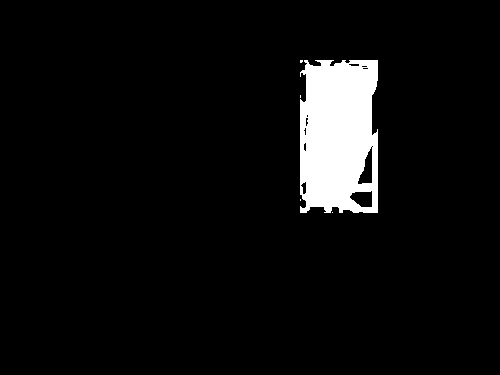

255
Image similarity: 0.9152036379500805


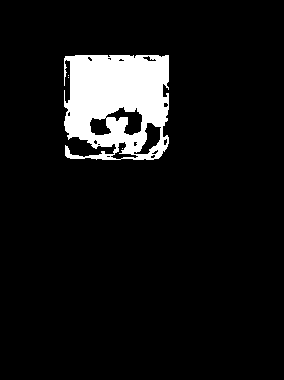

255
Image similarity: 0.9651917853250427


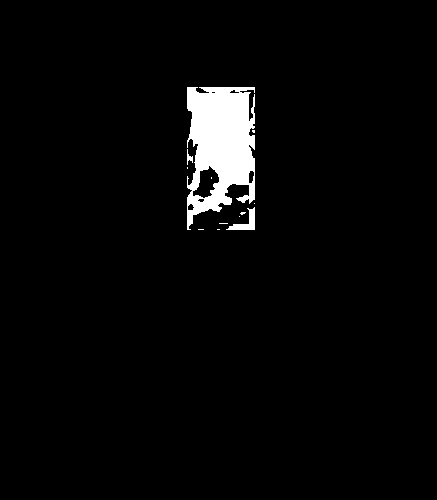

255
Image similarity: 0.9578613528476049


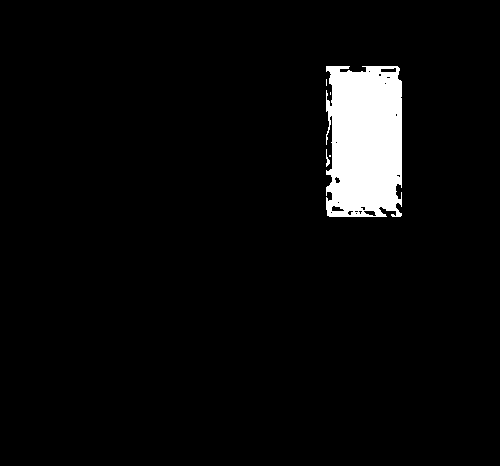

255
Image similarity: 0.7949881289819691


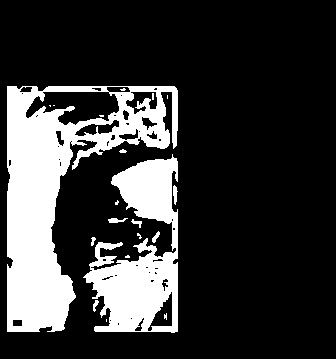

255
Image similarity: 0.9419323058067045


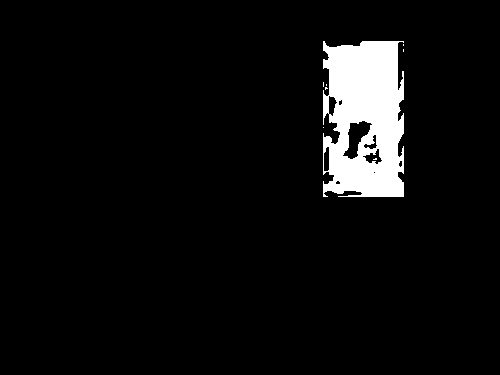

255
Image similarity: 0.9434342135940312


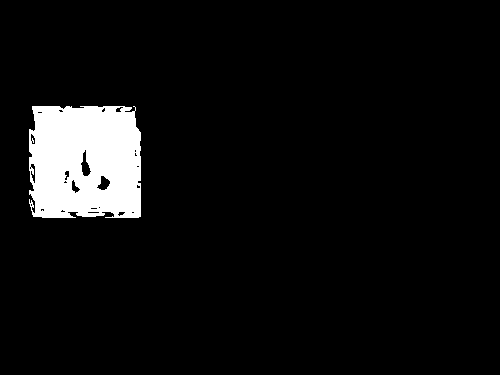

255
Image similarity: 0.9882312157296979


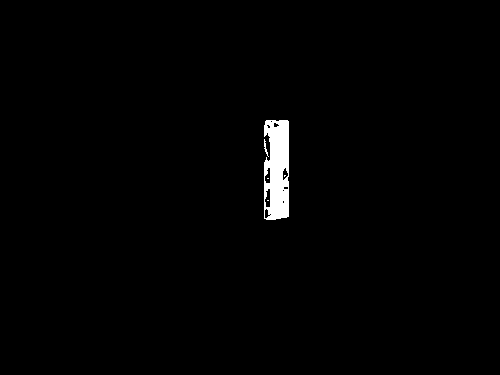

255
Image similarity: 0.9379011800518248


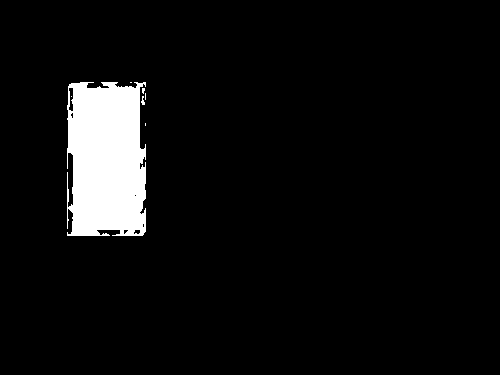

255
Image similarity: 0.9552549618539097


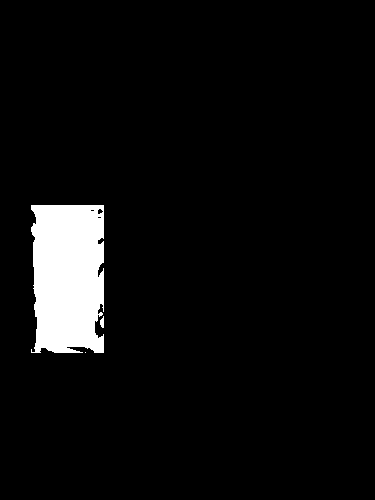

255
Image similarity: 0.927538263930549


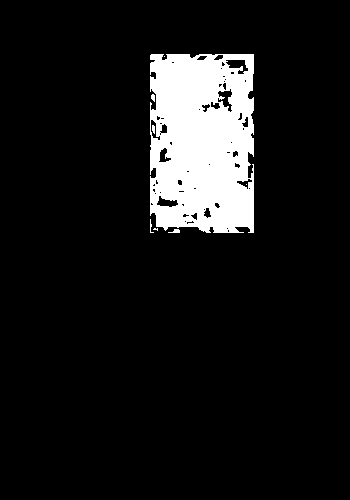

255
Image similarity: 0.9675334850857678


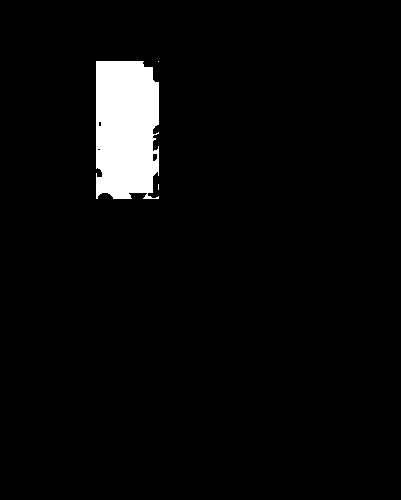

255
Image similarity: 0.8076988843670868


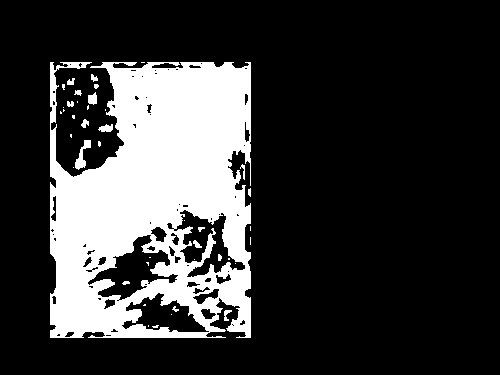

255
Image similarity: 0.9671770201850531


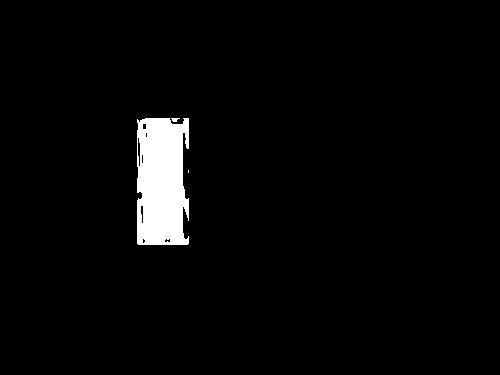

255
Image similarity: 0.8016626699593765


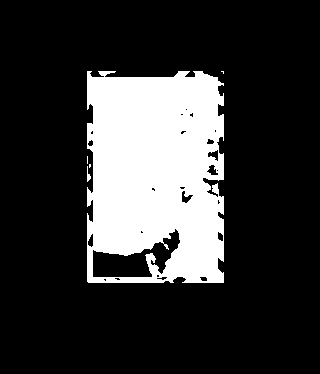

255
Image similarity: 0.926150118389233


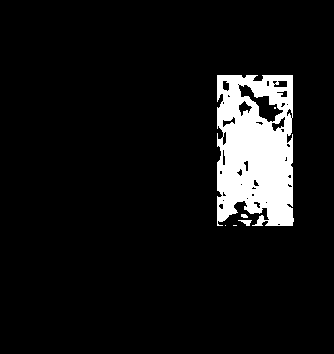

255
Image similarity: 0.9738991818980903


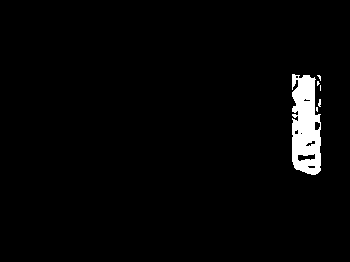

255
Image similarity: 0.9712704394891485


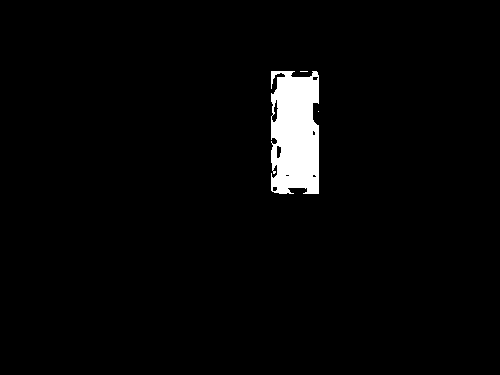

255
Image similarity: 0.9836168940516671


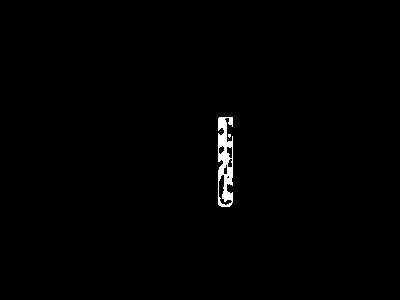

255
Image similarity: 0.9766460556994832


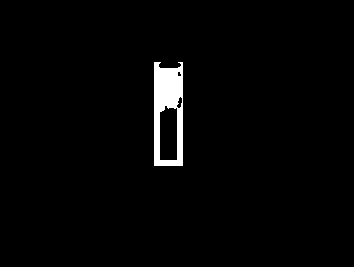

255
Image similarity: 0.9561609661043343


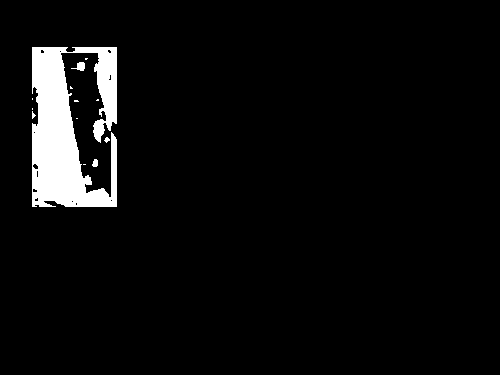

255
Image similarity: 0.9517547179374142


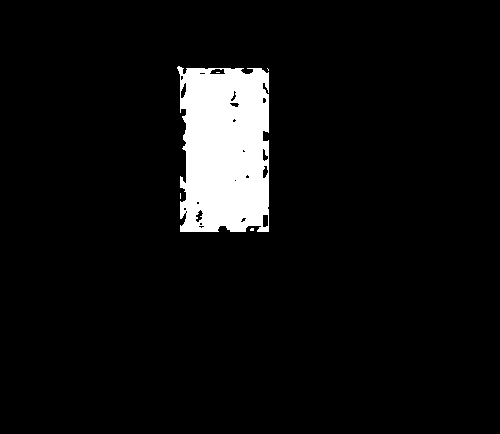

255
Image similarity: 0.9872329613279257


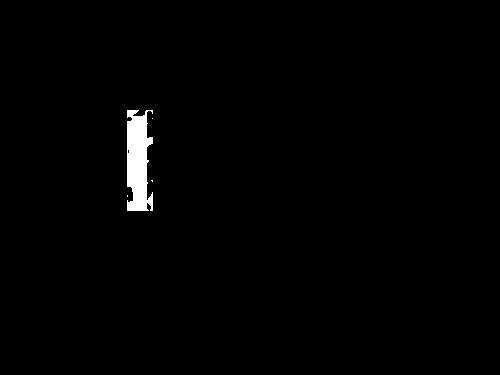

255
Image similarity: 0.8855074799566829


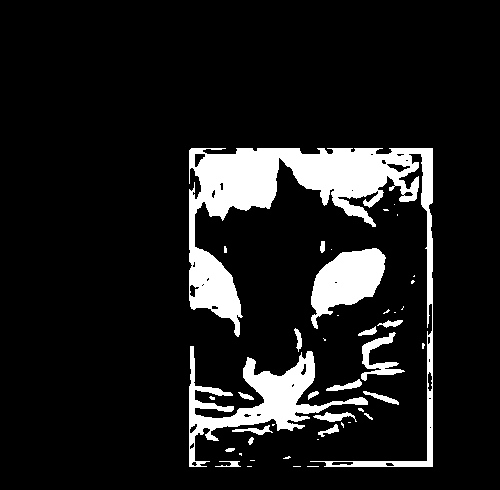

255
Image similarity: 0.971732638112574


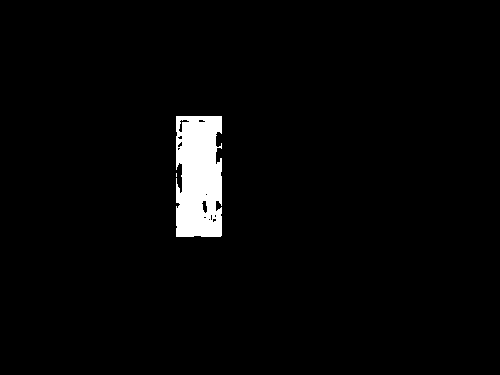

255
Image similarity: 0.9469482666283454


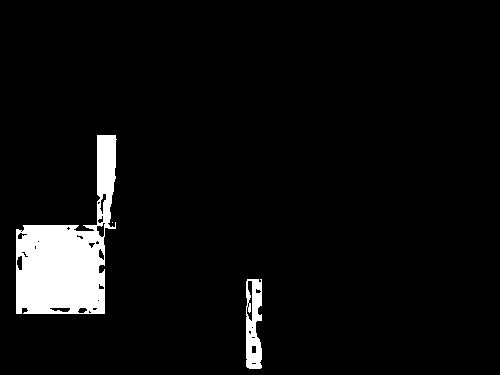

255
Image similarity: 0.9403673313940448


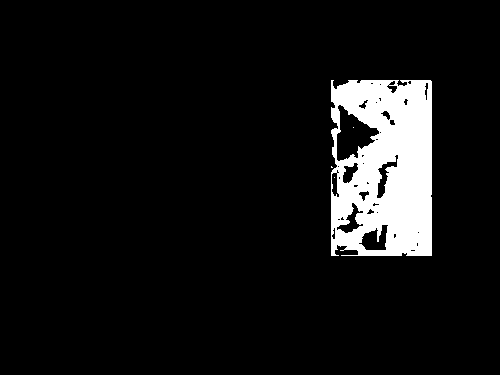

255
Image similarity: 0.9922567799767716


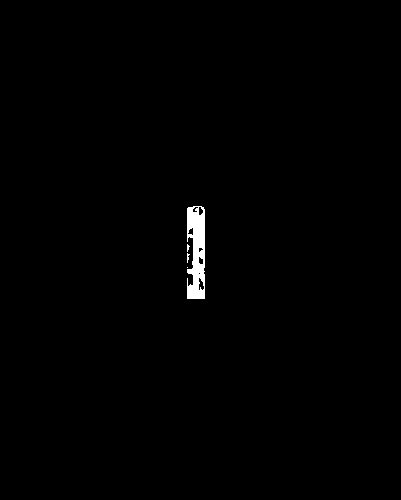

255
Image similarity: 0.9909044155755006


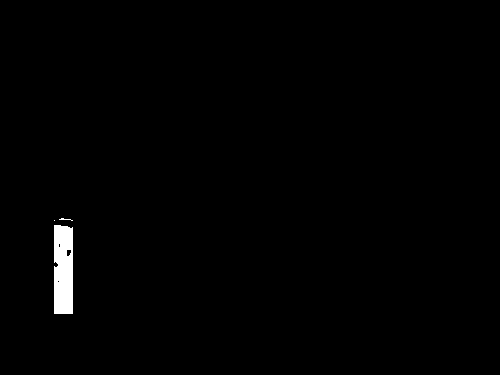

255
Image similarity: 0.9768481157504871


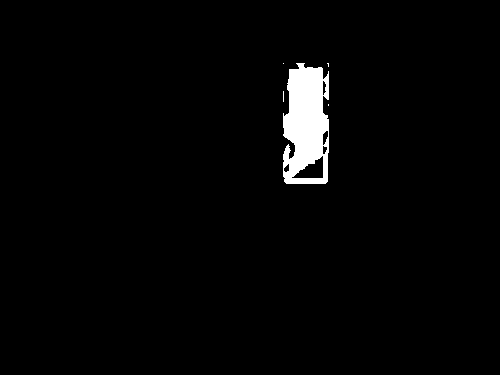

255
Image similarity: 0.8805959914708726


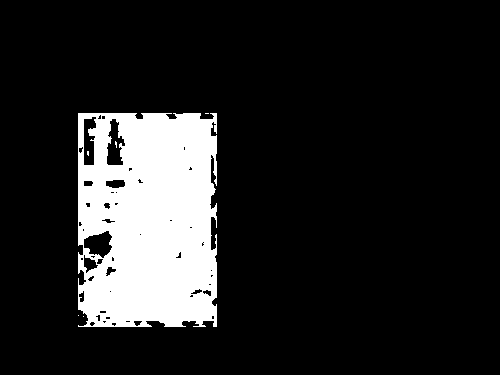

255
Image similarity: 0.8018880008878314


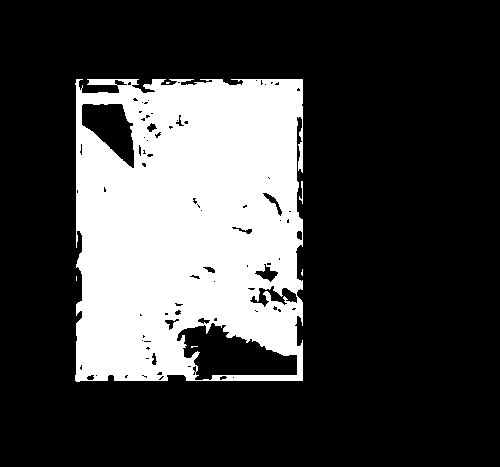

255
Image similarity: 0.9765269486765327


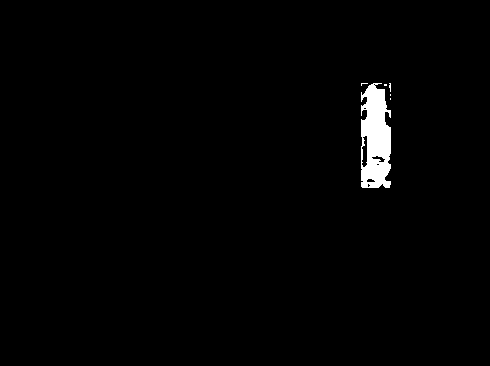

255
Image similarity: 0.943373748170042


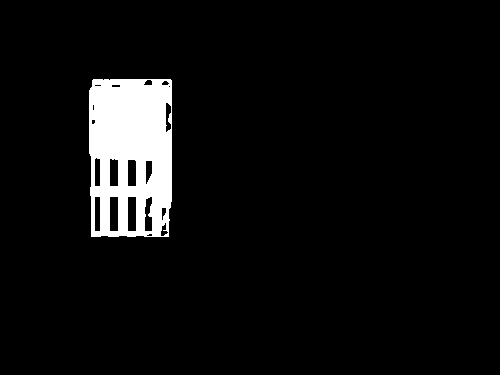

255
Image similarity: 0.9609106891650697


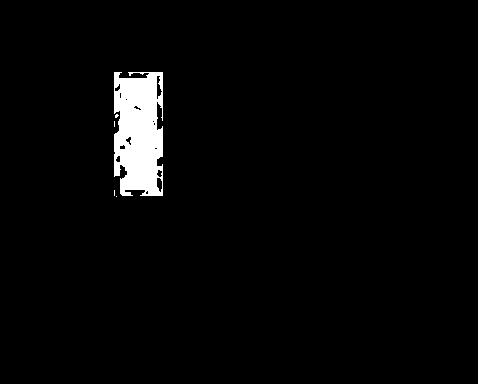

255
Image similarity: 0.9888790610462468


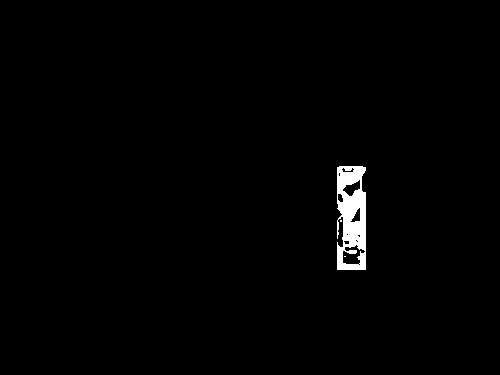

255
Image similarity: 0.9019824564500243


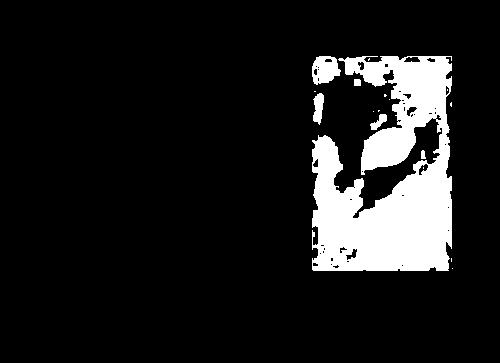

255
Image similarity: 0.8784955371327996


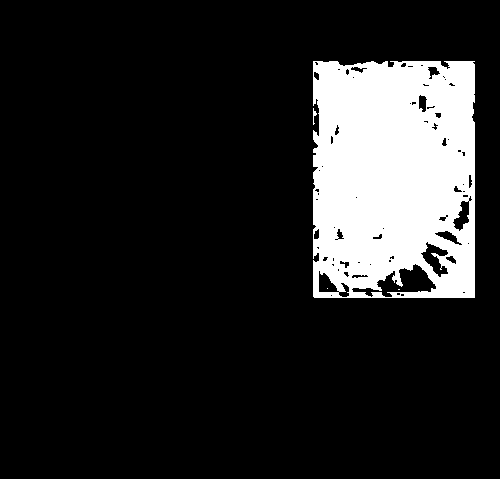

255
Image similarity: 0.9469011393893851


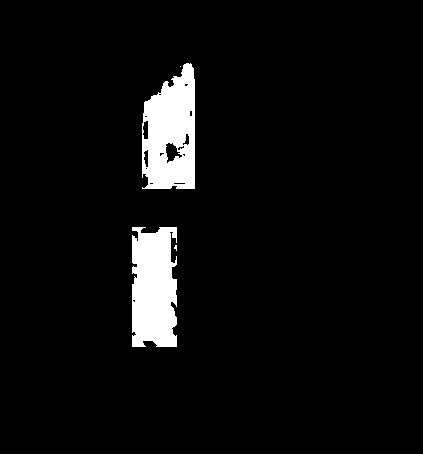

255
Image similarity: 0.9835834199831011


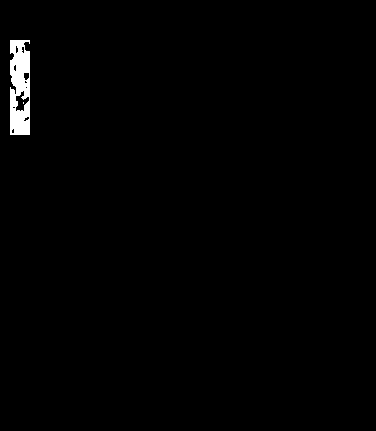

255
Image similarity: 0.971049035403615


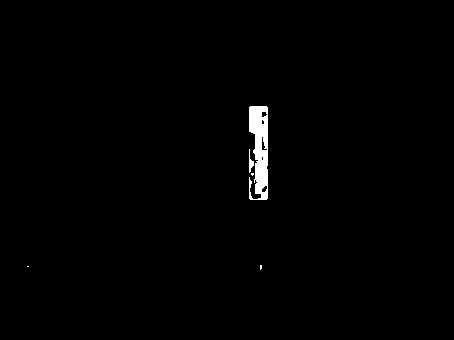

255
Image similarity: 0.9335768947120289


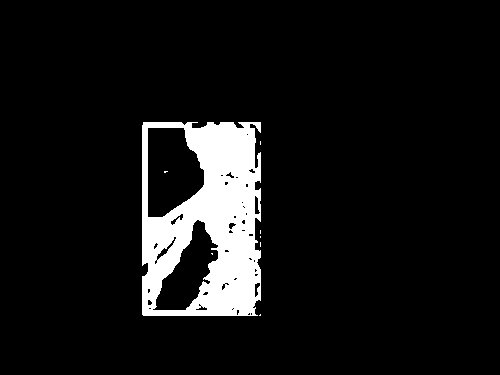

255
Image similarity: 0.9311845108876702


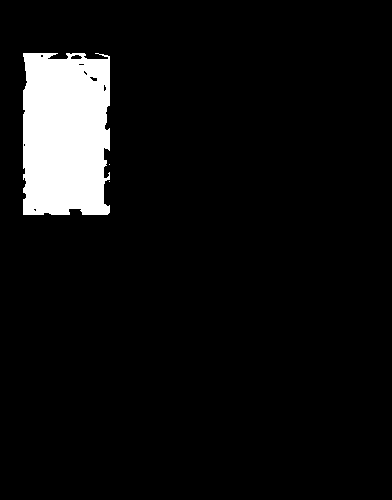

255
Image similarity: 0.9915955899174084


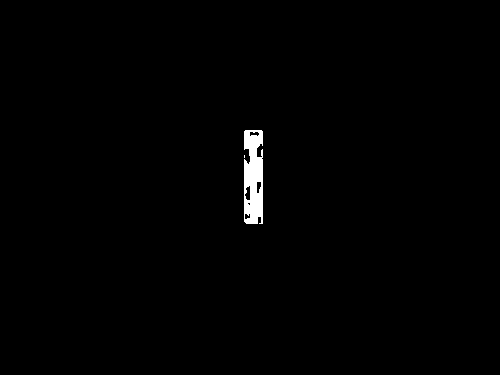

255
Image similarity: 0.9826942136942747


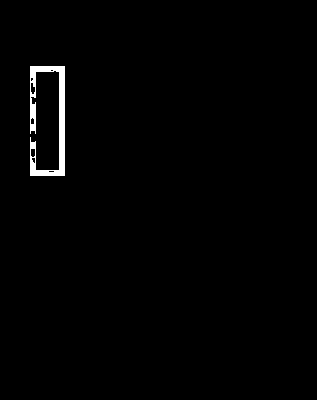

255
Image similarity: 0.7942753640279315


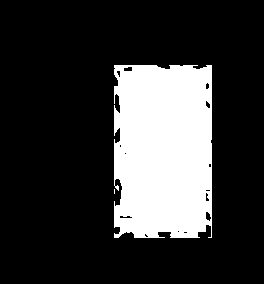

255
Image similarity: 0.9482844063310416


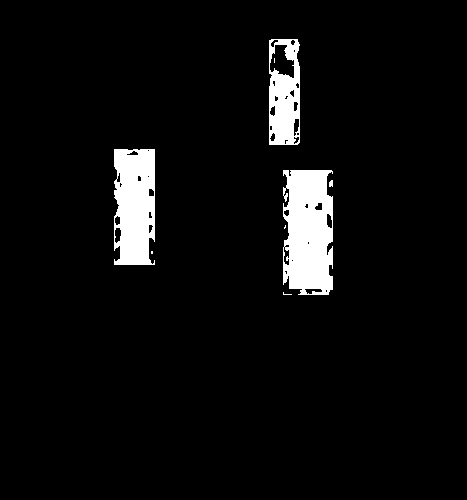

255
Image similarity: 0.9640418484946619


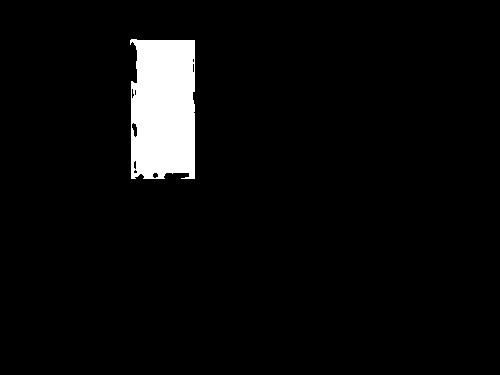

255
Image similarity: 0.9937147353523891


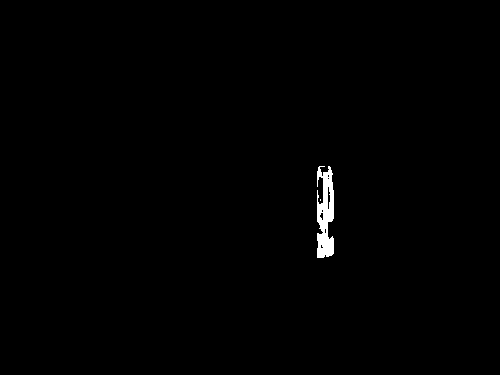

255
Image similarity: 0.9612952530607889


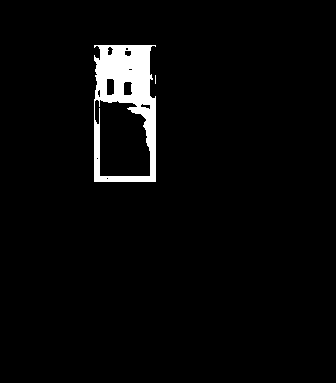

255
Image similarity: 0.9083731753172963


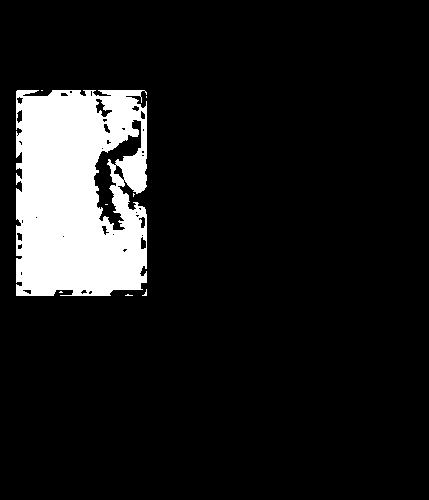

255
Image similarity: 0.755986177112402


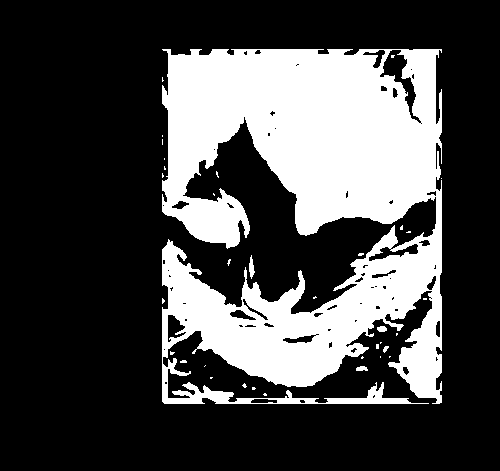

255
Image similarity: 0.8061304636704254


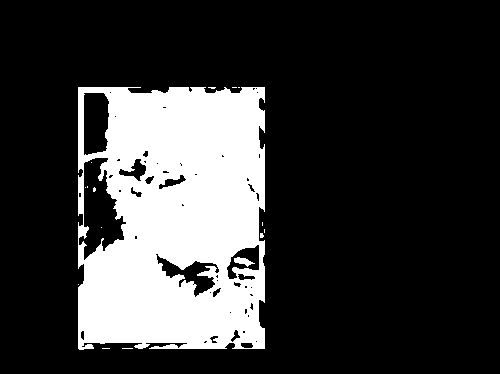

255
Image similarity: 0.8283820715299095


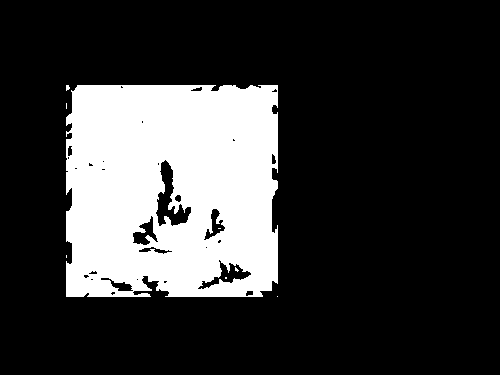

255
Image similarity: 0.9799671018730376


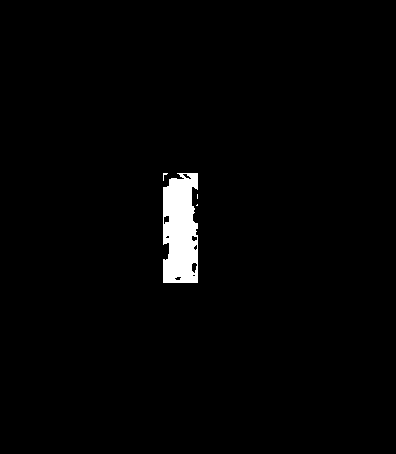

255
Image similarity: 0.9410555066377088


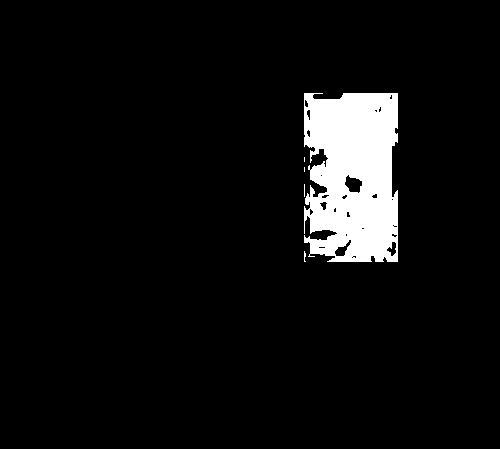

255
Image similarity: 0.9744042833216058


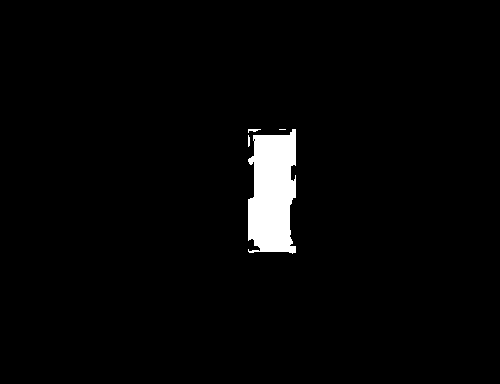

255
Image similarity: 0.8307352636160558


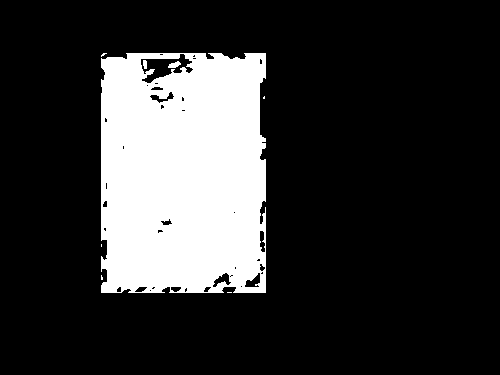

255
Image similarity: 0.9601355868757002


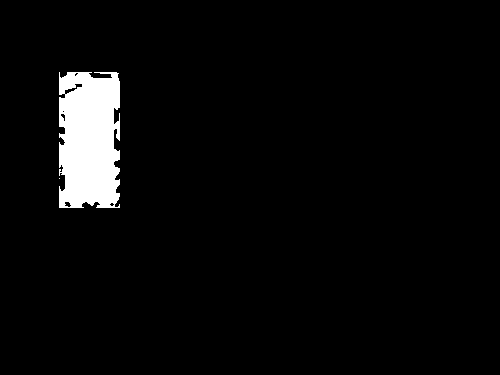

255
Image similarity: 0.9910455918759128


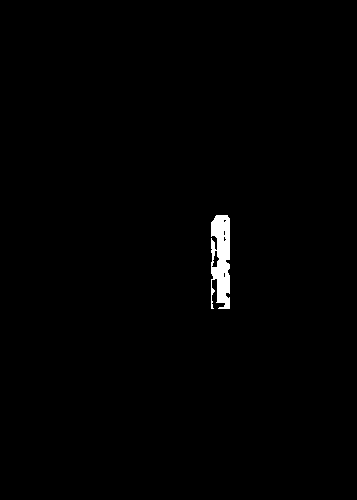

255
Image similarity: 0.9929297481501705


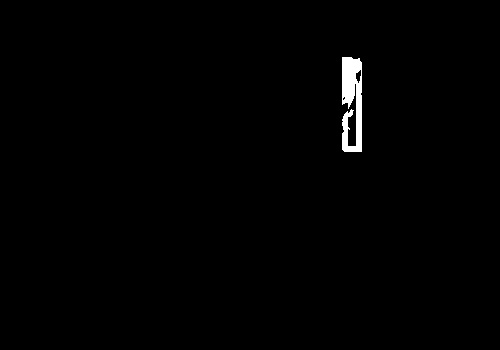

255
Image similarity: 0.9289310725447374


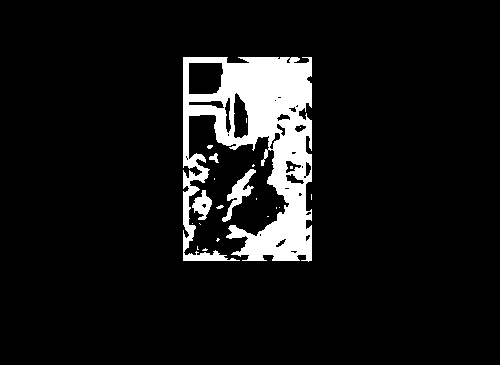

255
Image similarity: 0.8841507665550798


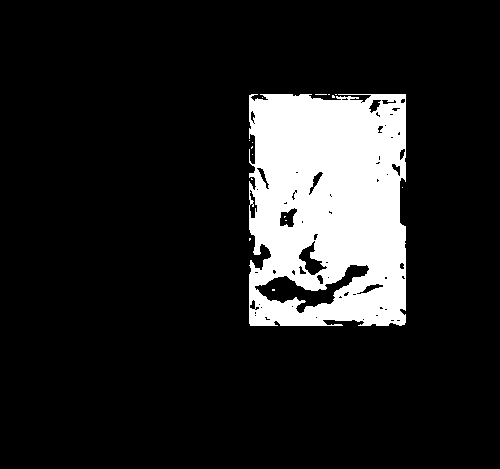

255
Image similarity: 0.9734721973883973


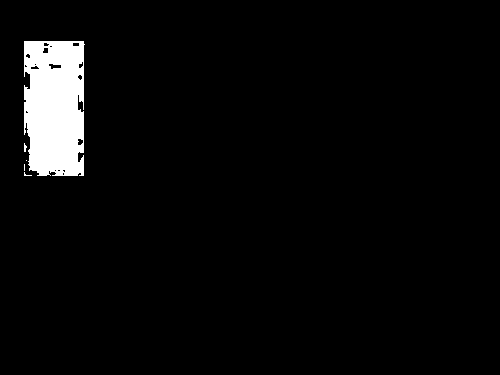

255
Image similarity: 0.8716875732225402


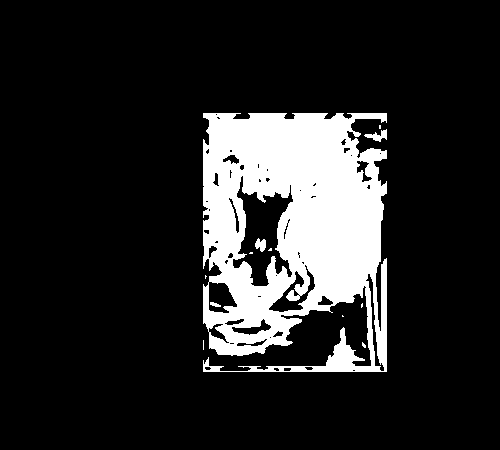

255
Image similarity: 0.9342517380513857


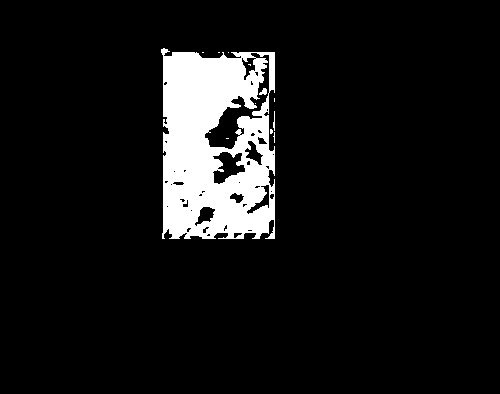

255
Image similarity: 0.9201514437846171


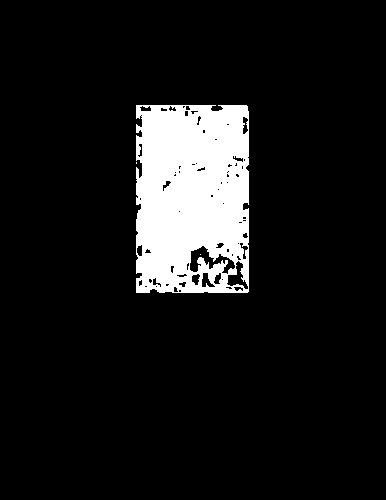

255
Image similarity: 0.9805390250862405


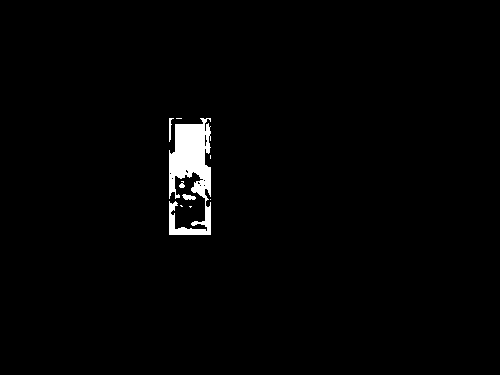

255
Image similarity: 0.993617411051826


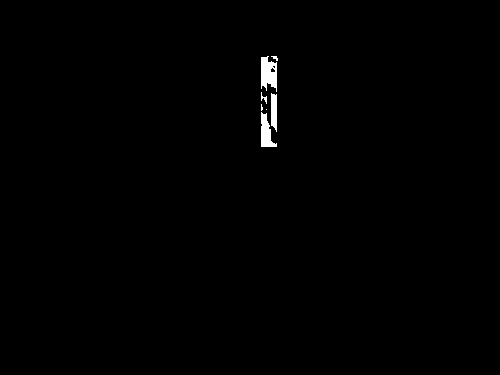

255
Image similarity: 0.9880897953738091


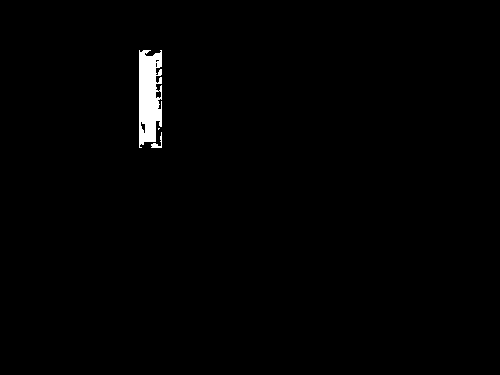

255
Image similarity: 0.9927852458366178


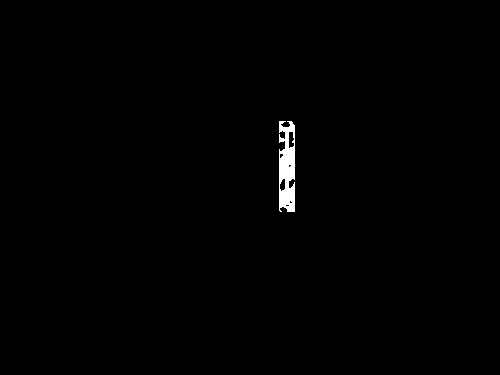

255
Image similarity: 0.9526466351486951


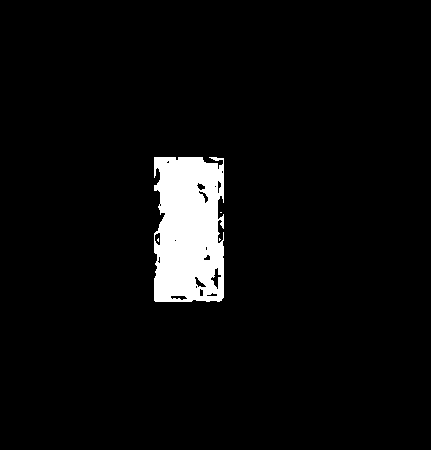

255
Image similarity: 0.9784647331882455


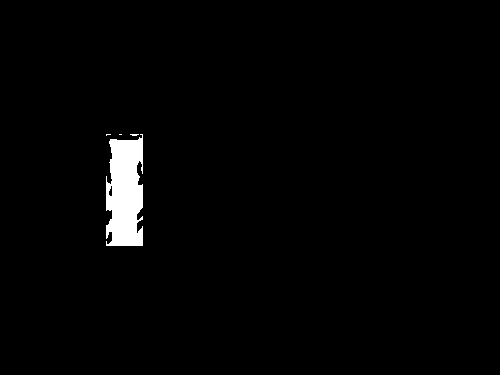

255
Image similarity: 0.9287565024708789


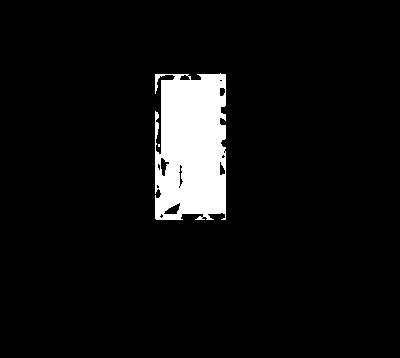

255
Image similarity: 0.8907882467005693


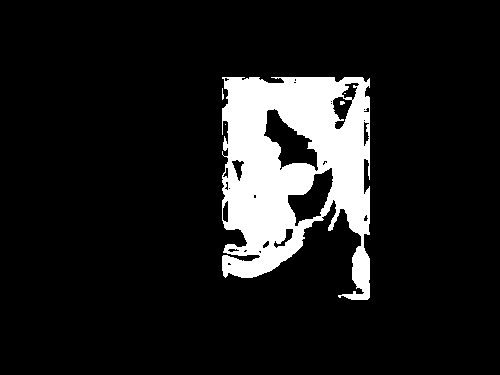

255
Image similarity: 0.9208073607340151


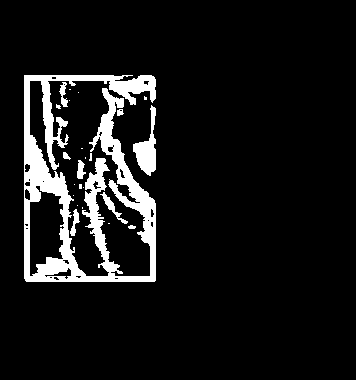

255
Image similarity: 0.995892955659893


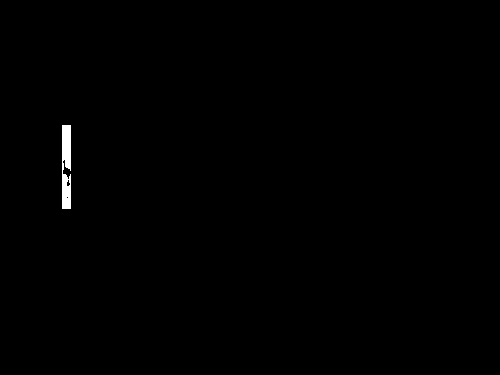

255
Image similarity: 0.9816284506174577


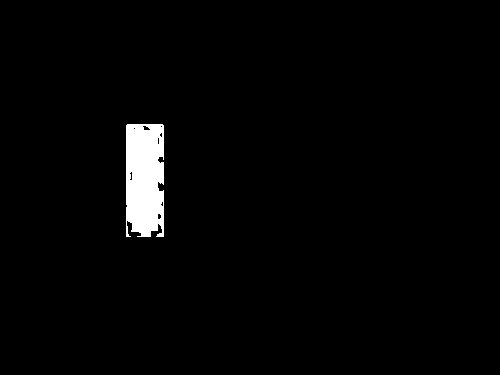

255
Image similarity: 0.9897491946279151


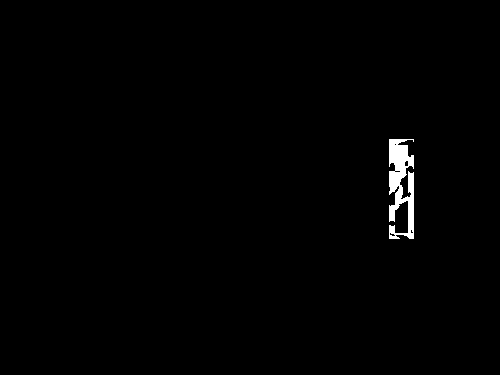

255
Image similarity: 0.980630639727425


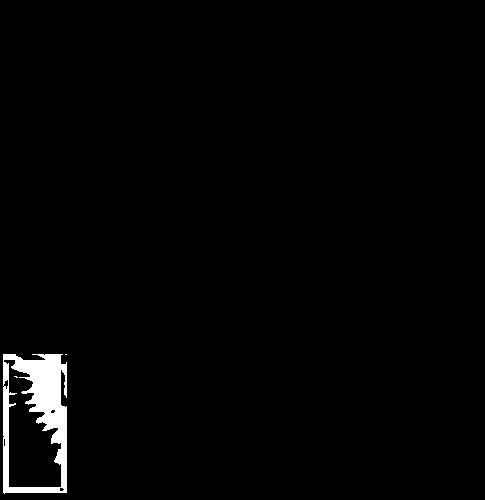

255
Image similarity: 0.9853065273198717


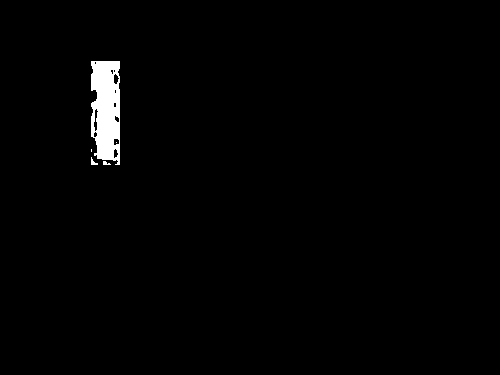

255
Image similarity: 0.7554009977961565


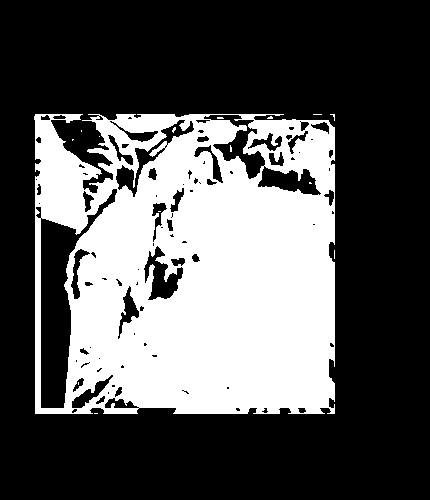

255
Image similarity: 0.8665716481544858


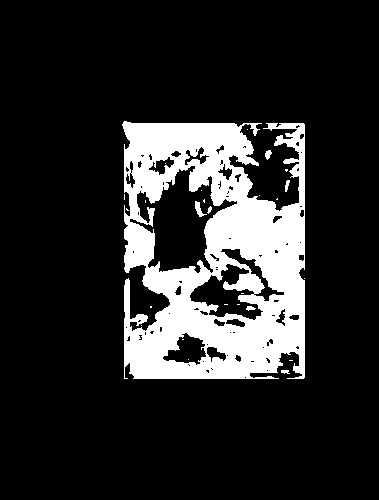

255
Image similarity: 0.9906842707716719


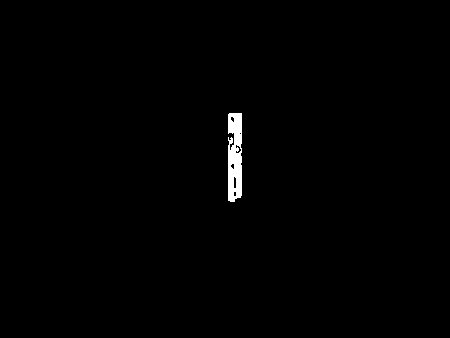

255
Image similarity: 0.9664284950883197


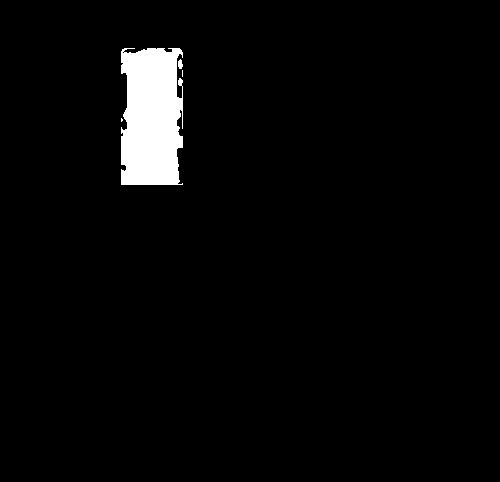

255
Image similarity: 0.8911032623536267


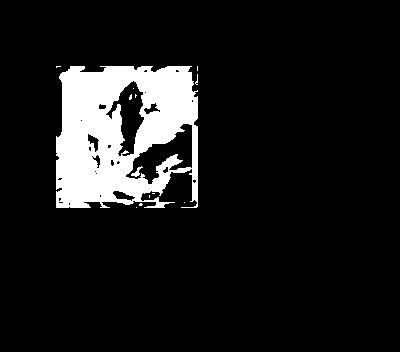

255
Image similarity: 0.9936137587999672


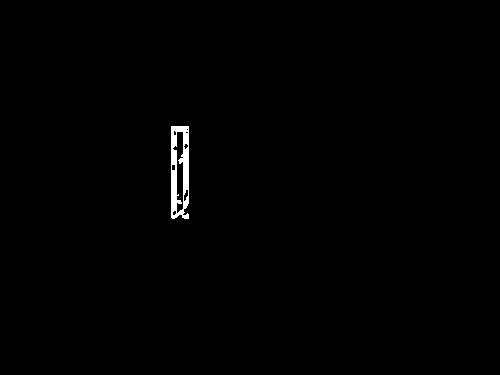

255
Image similarity: 0.9887483630351851


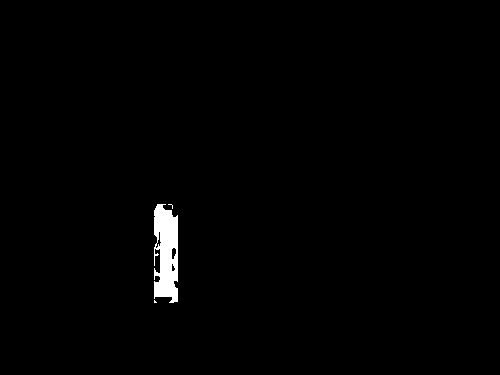

255
Image similarity: 0.9255245881383226


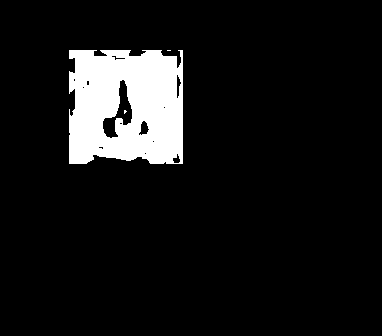

255
Image similarity: 0.8966355568168217


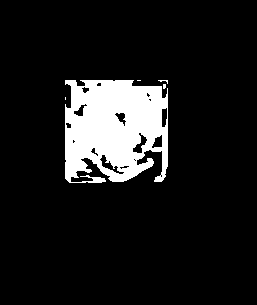

255
Image similarity: 0.9889023694932546


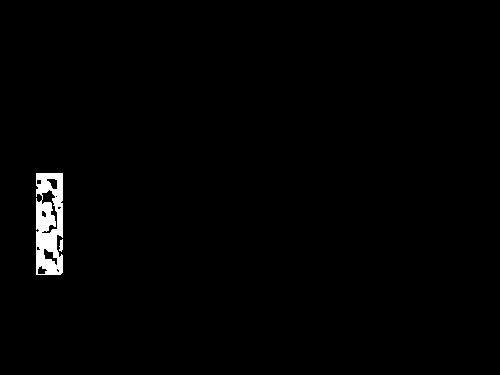

255
Image similarity: 0.9857438531874457


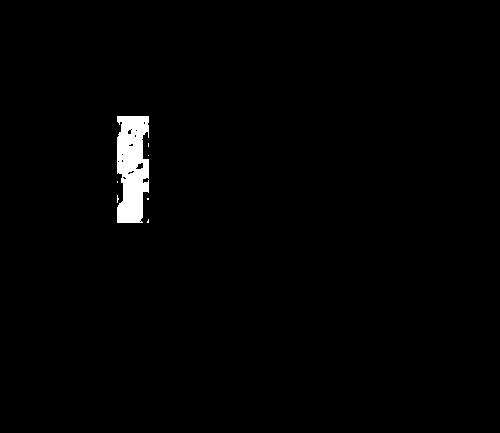

255
Image similarity: 0.9507284242776002


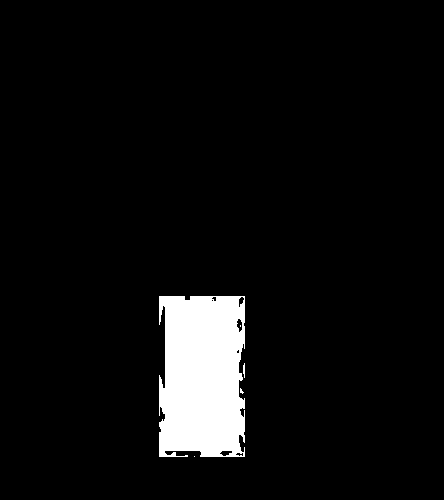

255
Image similarity: 0.8289786056019085


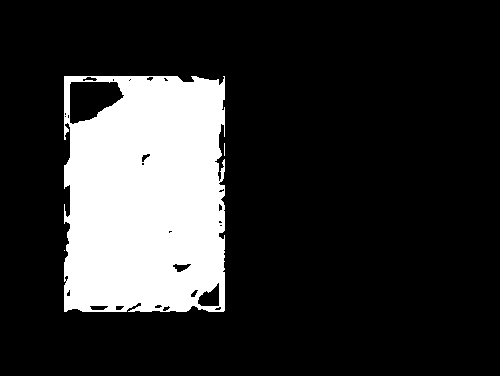

255
Image similarity: 0.8364051473359281


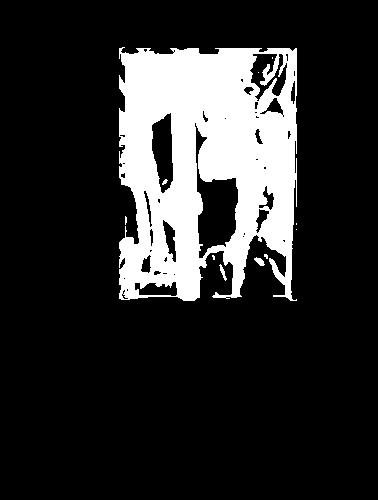

255
Image similarity: 0.9818012055912104


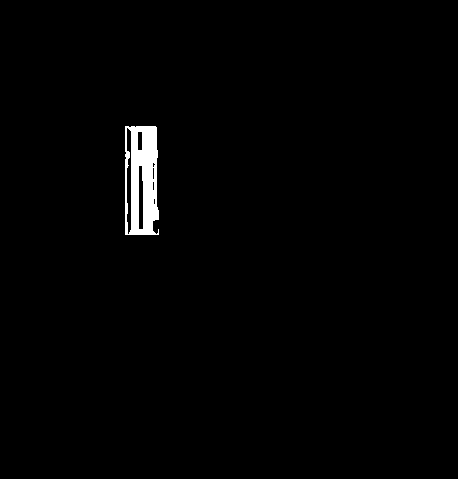

255
Image similarity: 0.9439968044831175


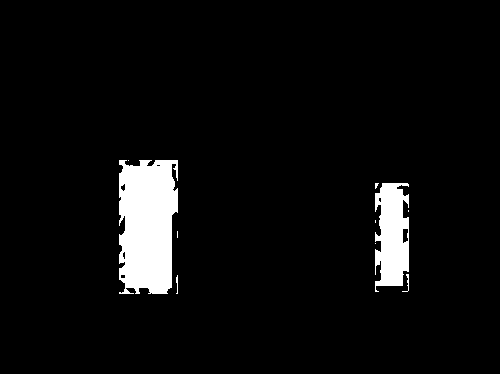

255
Image similarity: 0.9622234242340462


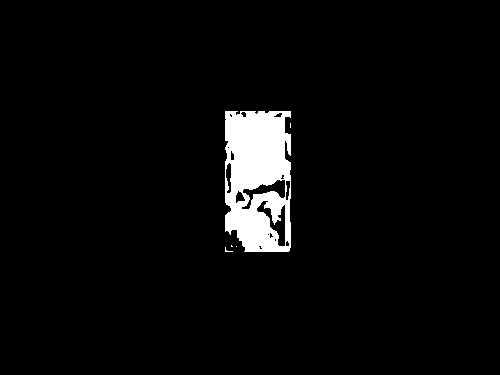

255
Image similarity: 0.9928524701548253


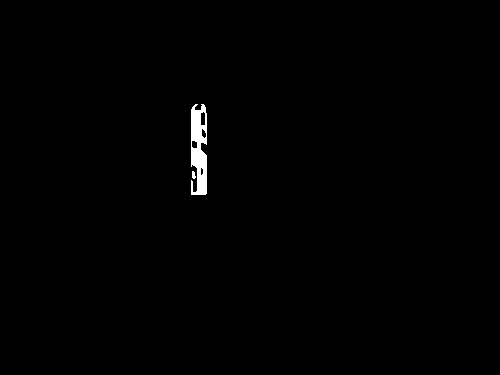

255
Image similarity: 0.9815052446299631


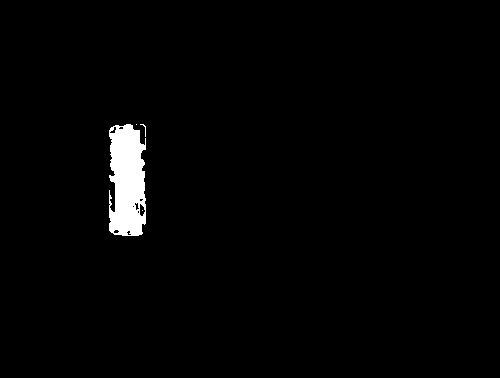

255
Image similarity: 0.8443224196149881


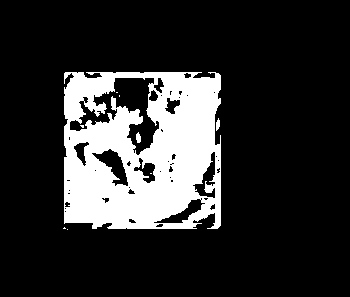

255
Image similarity: 0.8906264975359097


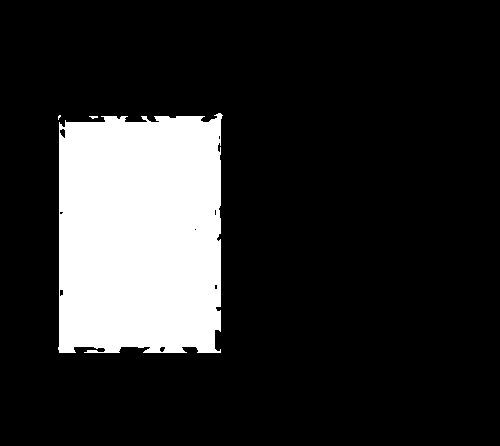

255
Image similarity: 0.9712240276470413


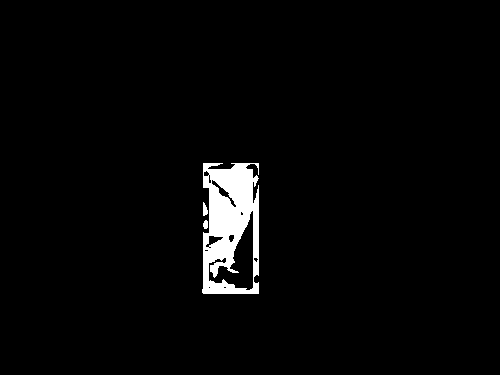

255
Image similarity: 0.9905461575650939


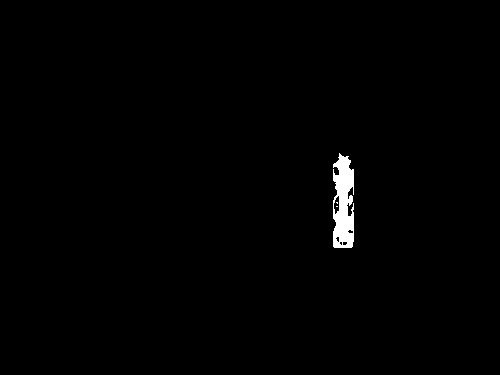

255
Image similarity: 0.8204230484861855


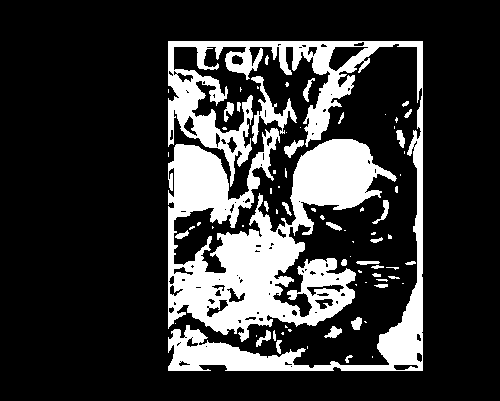

255
Image similarity: 0.9370755824562135


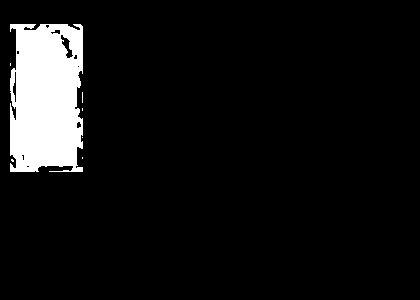

255
Image similarity: 0.9787668749658689


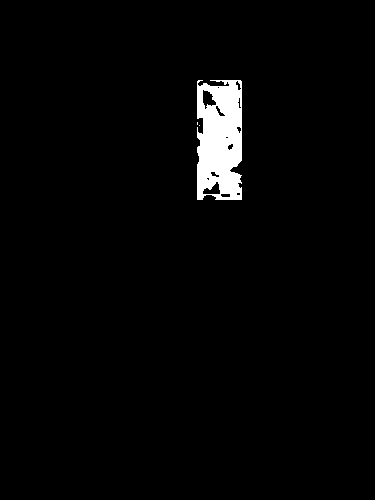

255
Image similarity: 0.9796732788290032


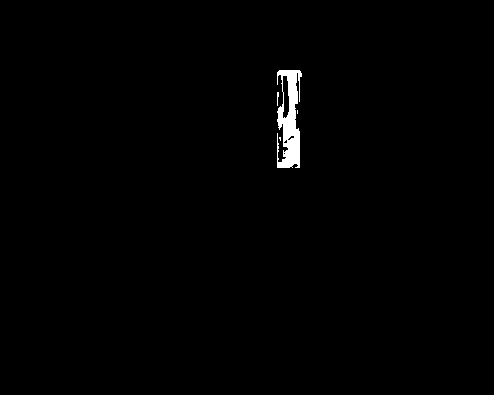

255
Image similarity: 0.9669285830848234


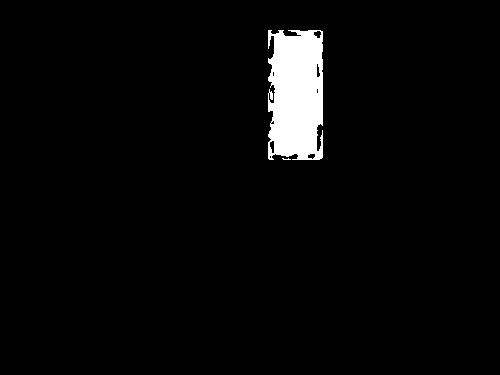

255
Image similarity: 0.933733374956126


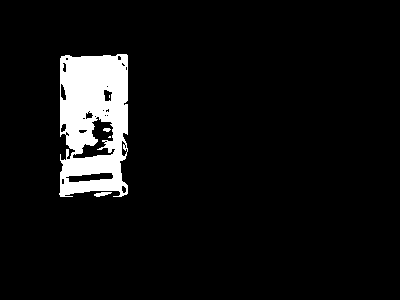

255
Image similarity: 0.92454326719606


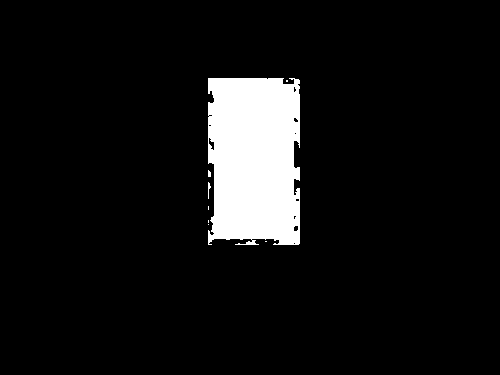

255
Image similarity: 0.9741678980239807


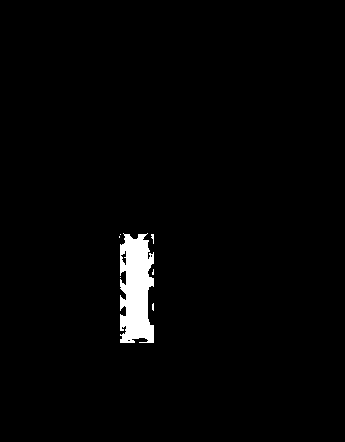

255
Image similarity: 0.9922308068759428


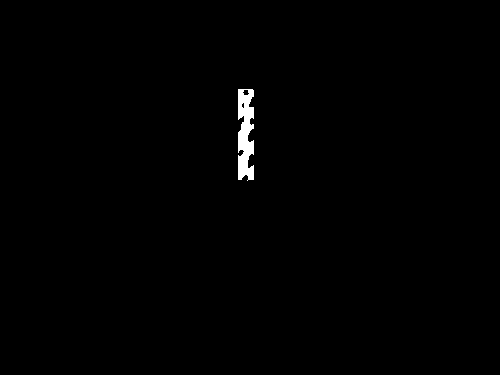

255
Image similarity: 0.9925979214315613


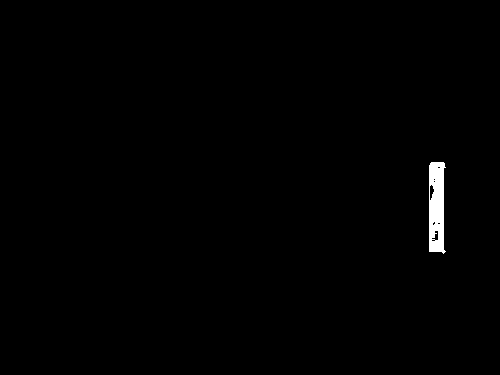

255
Image similarity: 0.9248621334605381


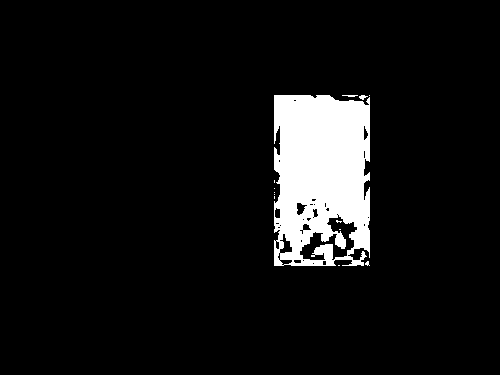

255
Image similarity: 0.9864904647857035


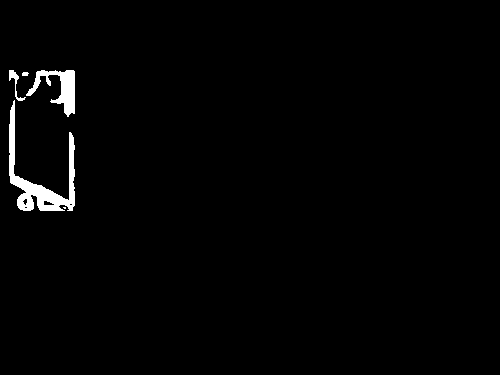

255
Image similarity: 0.9914985516918099


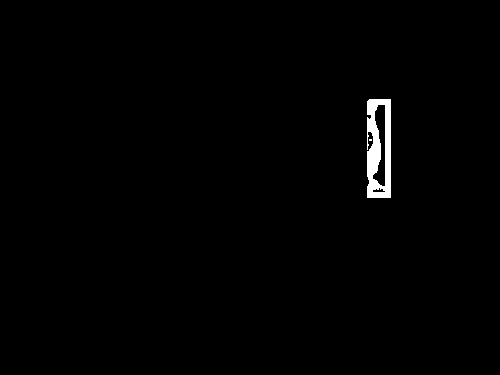

255
Image similarity: 0.9935889545999428


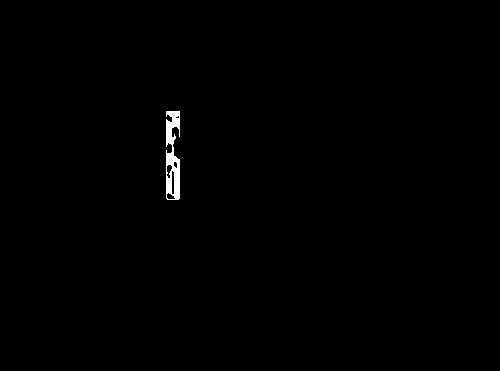

255
Image similarity: 0.862134383070911


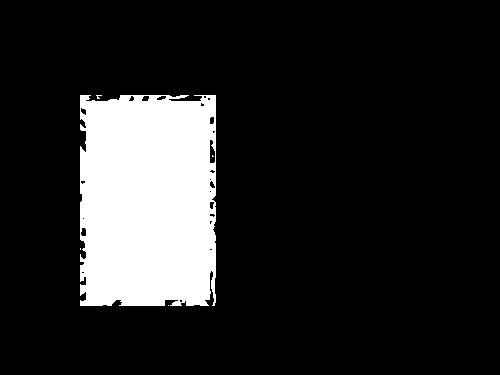

255
Image similarity: 0.8725481395429441


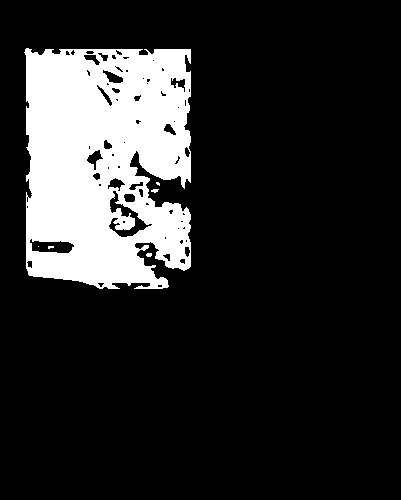

255
Image similarity: 0.8868161628856297


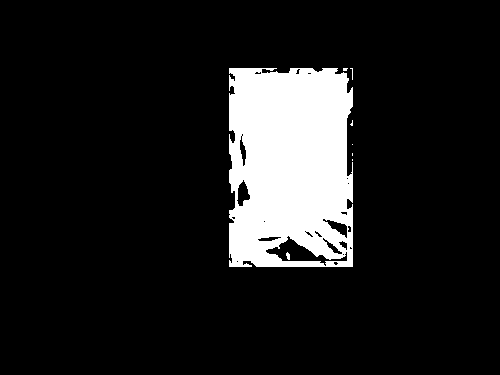

255
Image similarity: 0.929366377003396


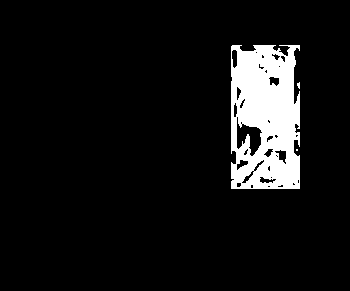

255
Image similarity: 0.872714176733446


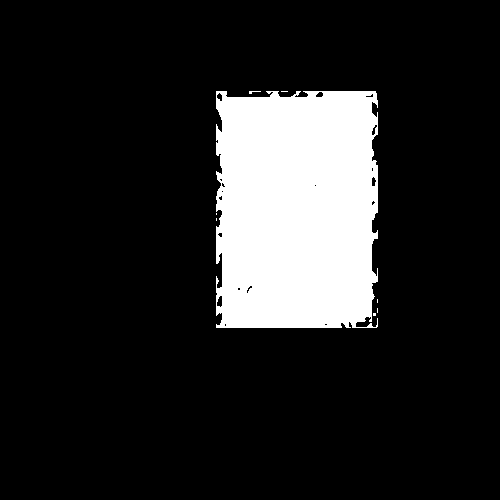

255
Image similarity: 0.9864030373356986


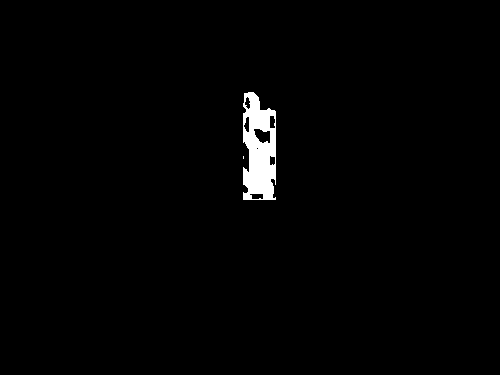

255
Image similarity: 0.9299363092343751


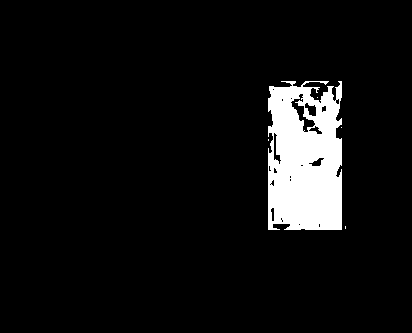

255
Image similarity: 0.9293413063402245


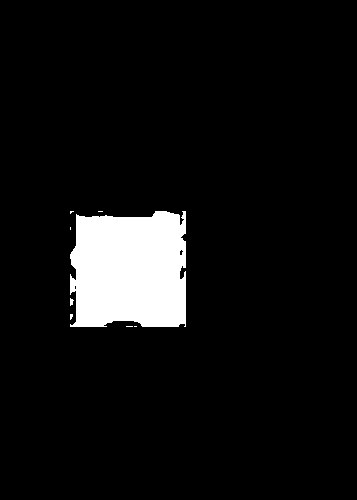

255
Image similarity: 0.9532632724896497


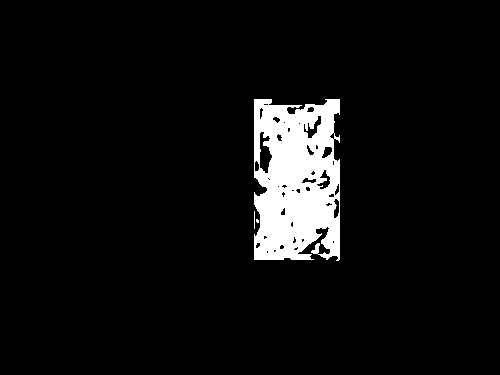

255
Image similarity: 0.9878841609421615


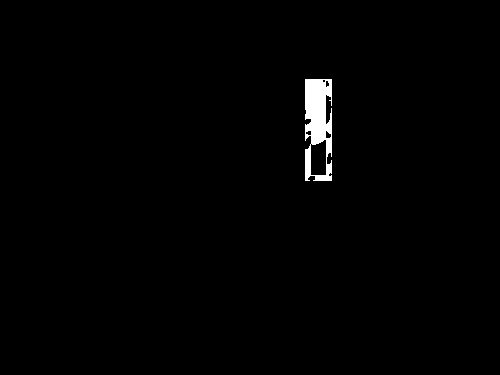

255
Image similarity: 0.9818162230038893


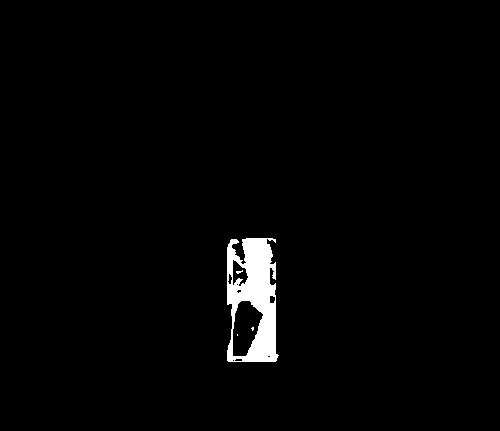

255
Image similarity: 0.9787733874318806


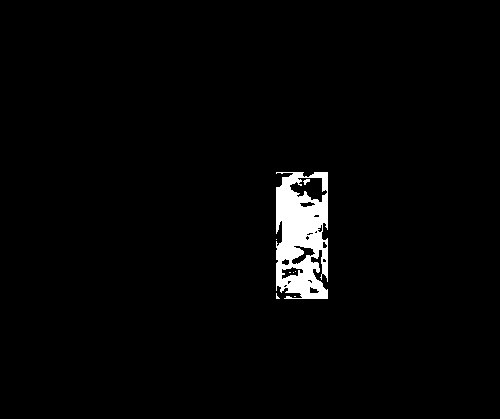

255
Image similarity: 0.9903219141552578


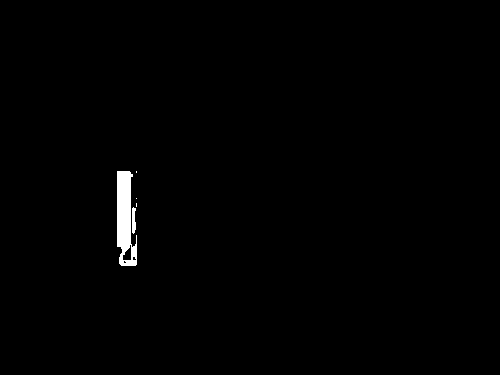

255
Image similarity: 0.8860902598321718


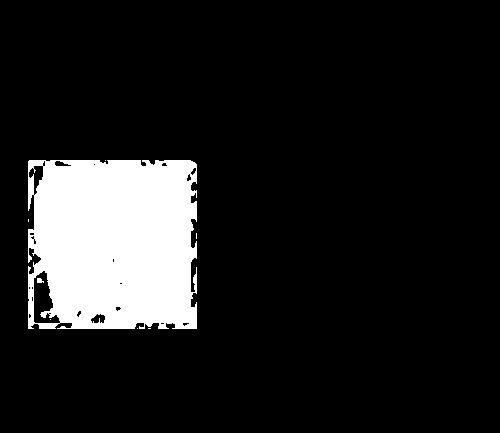

255
Image similarity: 0.8829439898576188


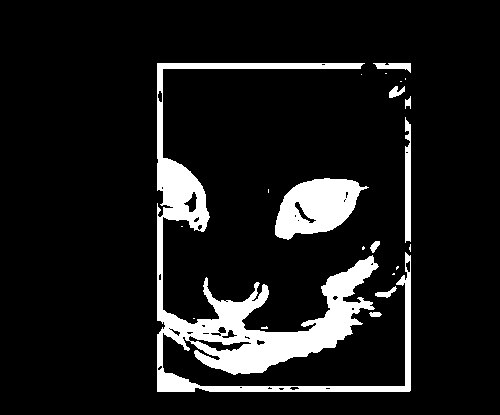

255
Image similarity: 0.9365060290075826


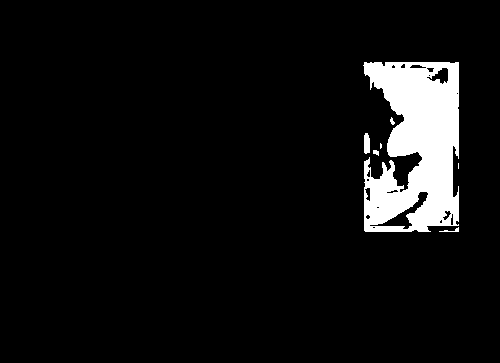

255
Image similarity: 0.8841425829954384


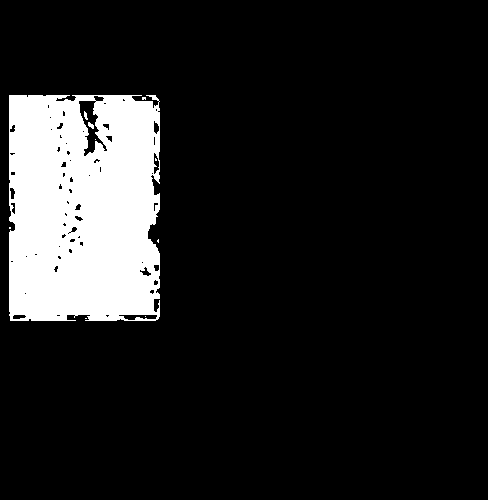

255
Image similarity: 0.9793005565759336


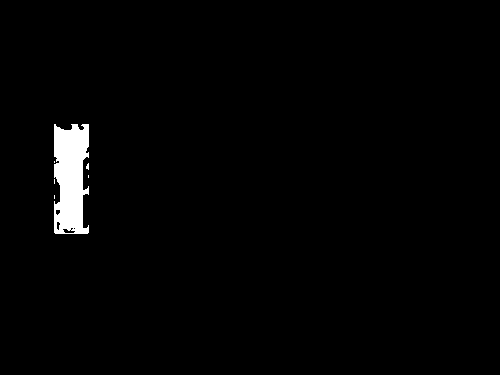

255
Image similarity: 0.9893875873913949


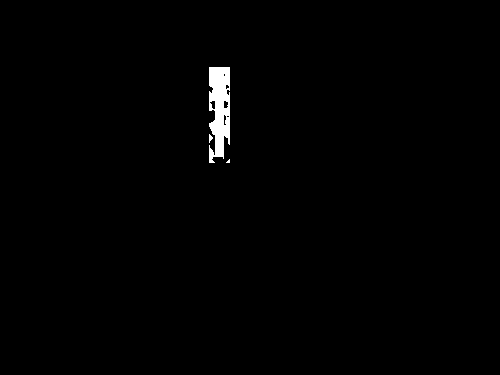

255
Image similarity: 0.826367108068449


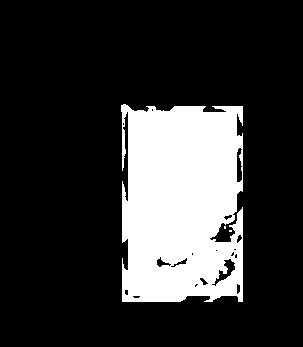

255
Image similarity: 0.9333062404842167


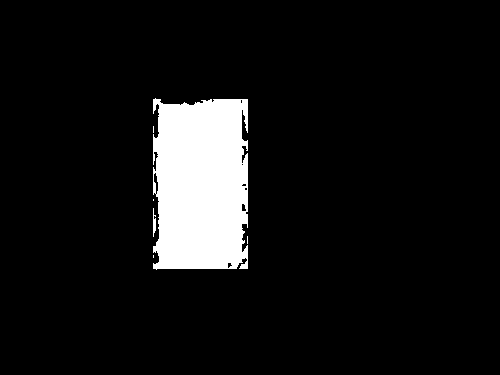

255
Image similarity: 0.9890312921272013


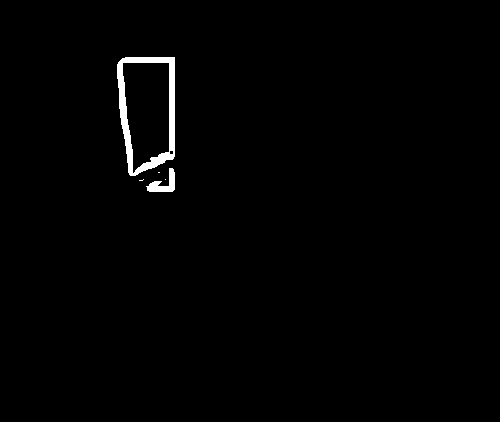

255
Image similarity: 0.9852934167761019


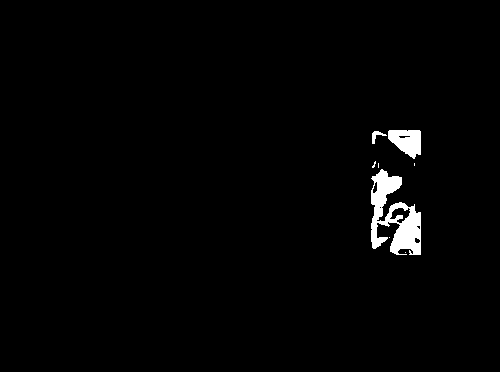

255
Image similarity: 0.945111407037631


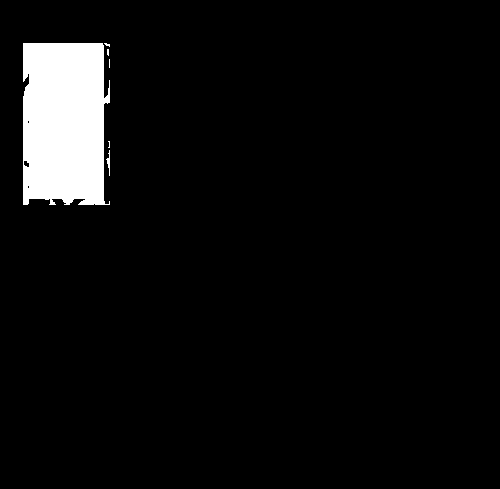

255
Image similarity: 0.9906338536516676


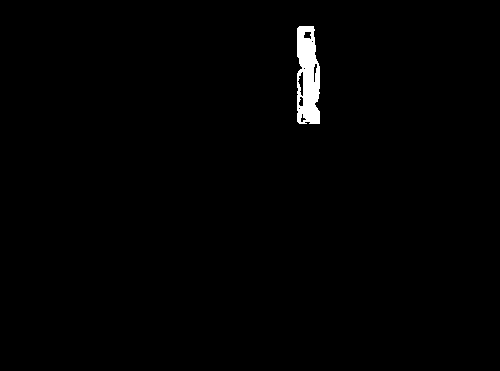

255
Image similarity: 0.9289383078674015


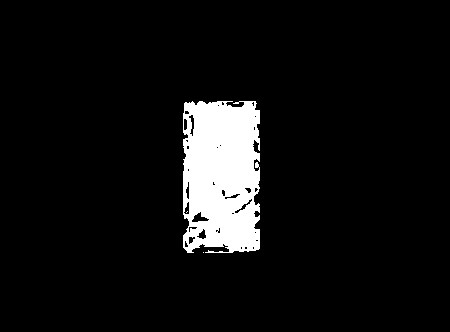

255
Image similarity: 0.9341613473043762


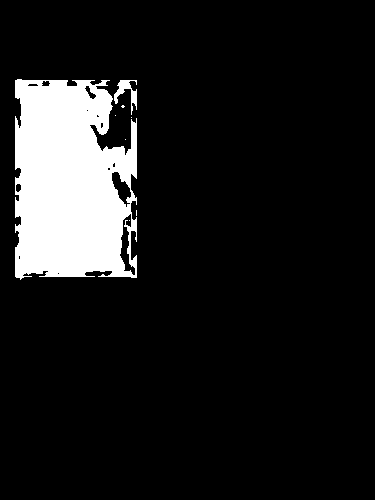

255
Image similarity: 0.9282113581338579


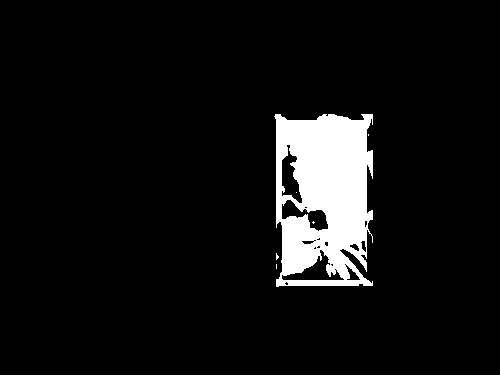

255
Image similarity: 0.9057196066807468


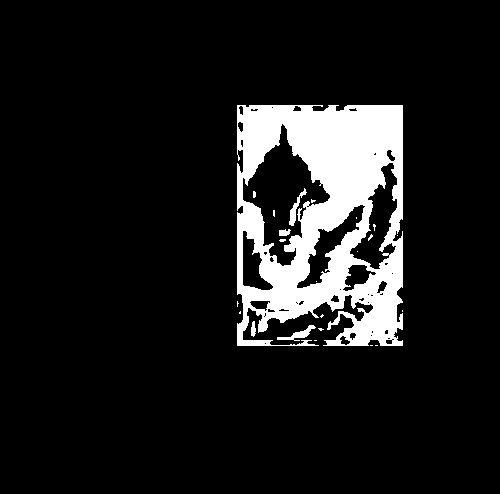

255
Image similarity: 0.9211272875535308


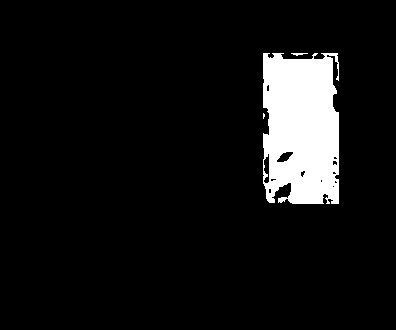

255
Image similarity: 0.9717163252583302


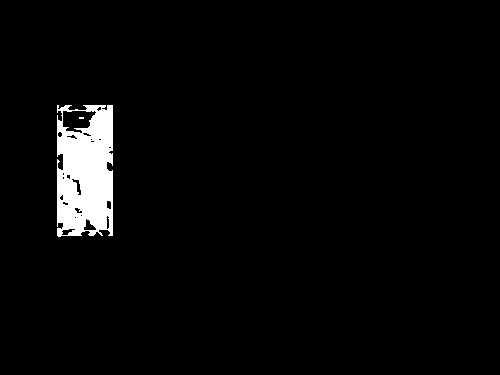

255
Image similarity: 0.843917916770481


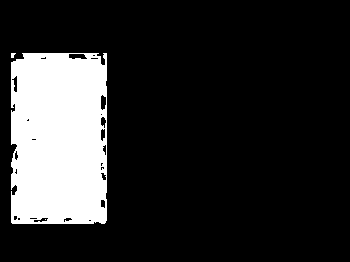

255
Image similarity: 0.8207023854975807


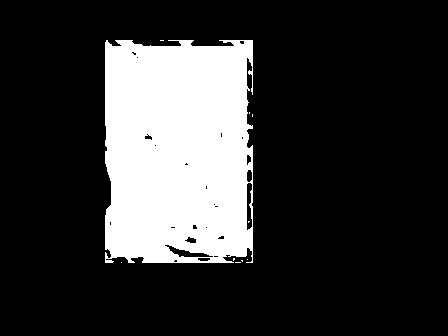

255
Image similarity: 0.9353666796871838


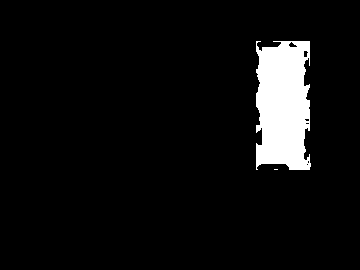

255
Image similarity: 0.9224028666627114


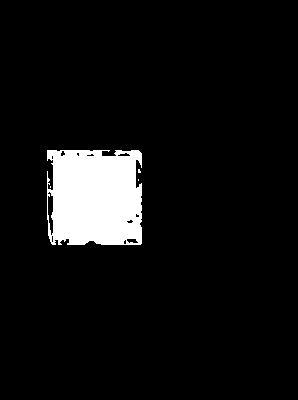

255
Image similarity: 0.9365376659466006


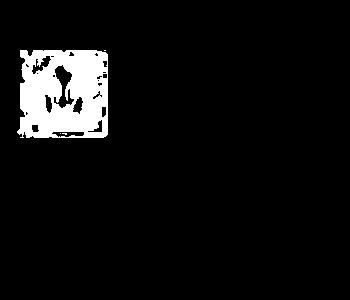

255
Image similarity: 0.9910064583012246


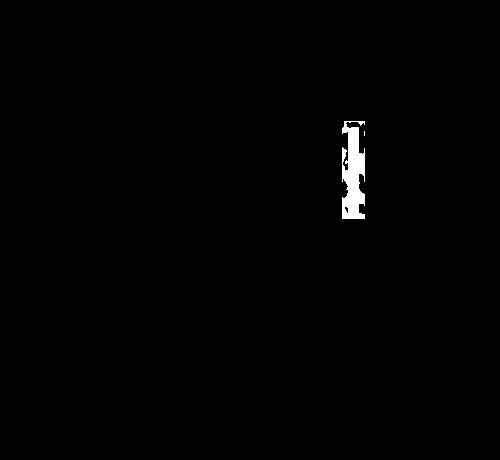

255
Image similarity: 0.8975450722643468


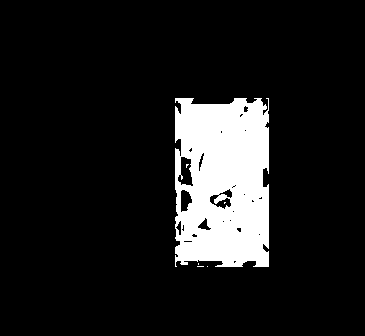

255
Image similarity: 0.8187050698465724


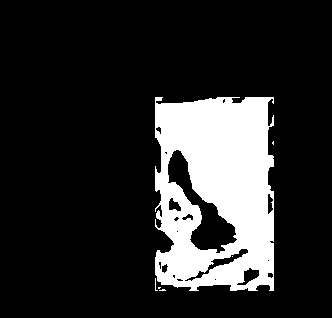

255
Image similarity: 0.8960457582060544


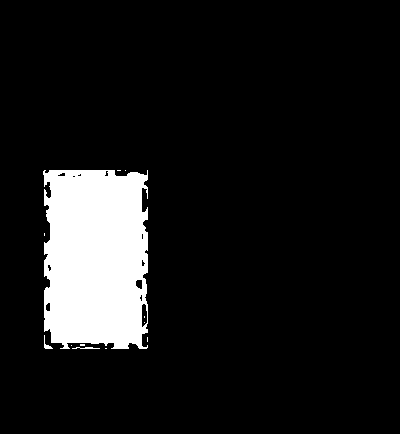

255
Image similarity: 0.9498627864631125


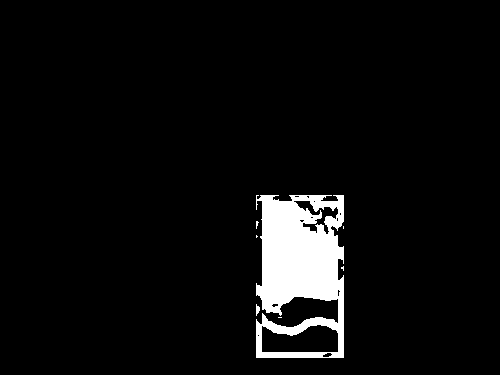

255
Image similarity: 0.8781733295931007


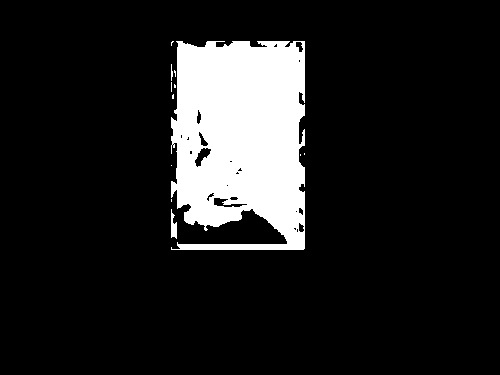

255
Image similarity: 0.8479771866430658


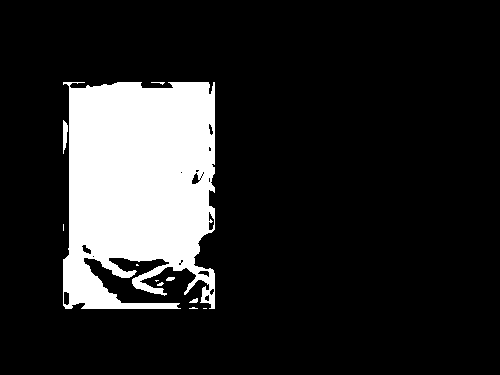

255
Image similarity: 0.9962729268841343


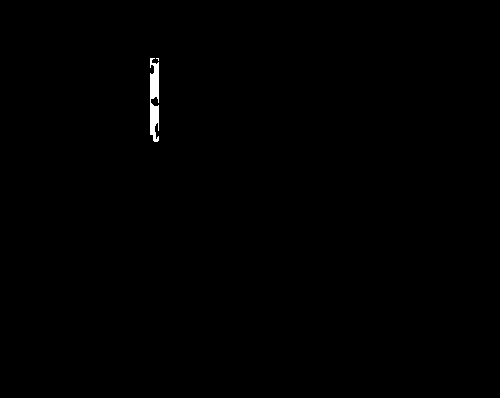

255
Image similarity: 0.8767946117388363


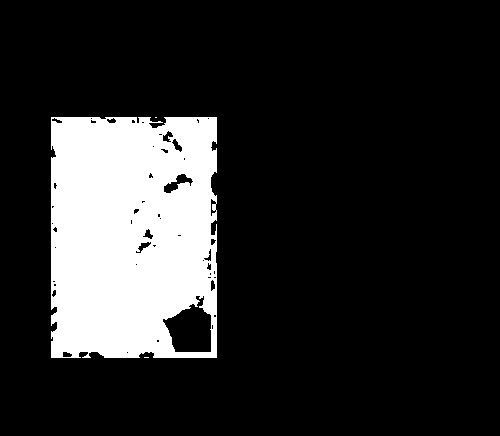

255
Image similarity: 0.9641703997183416


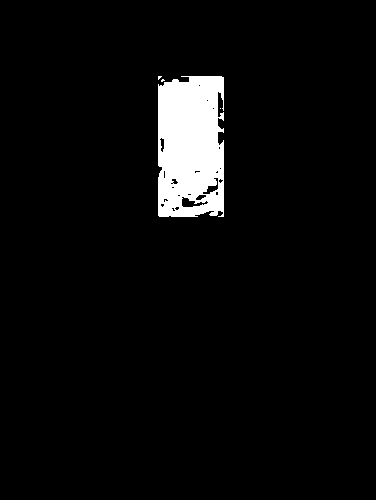

255
Image similarity: 0.9058324062747464


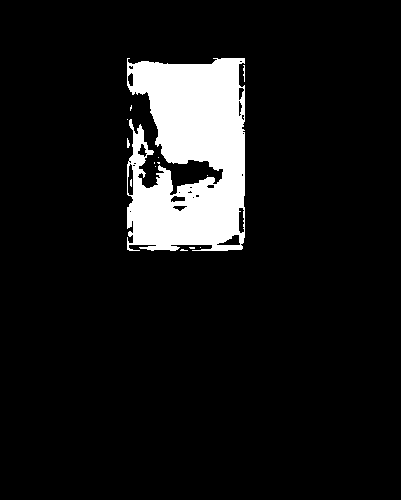

255
Image similarity: 0.925822426709429


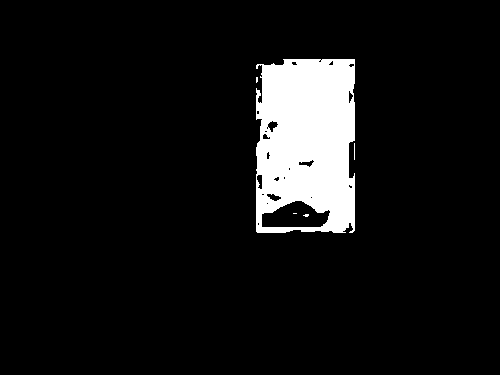

255
Image similarity: 0.9286601193906356


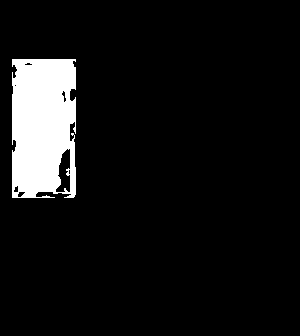

255
Image similarity: 0.9004573753877


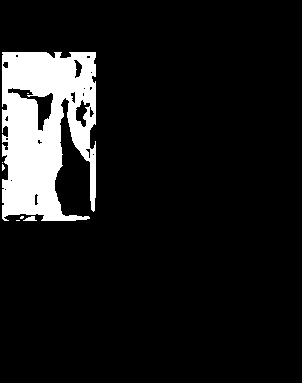

255
Image similarity: 0.9462006939235585


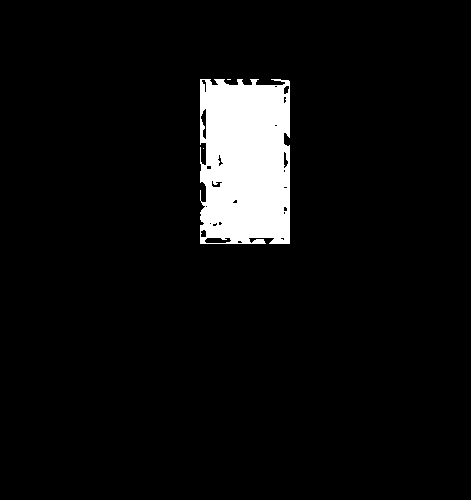

255
Image similarity: 0.9517396500822797


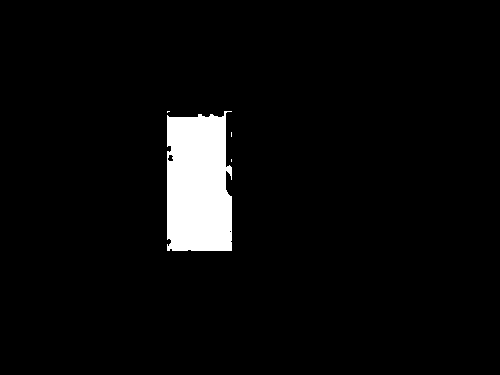

255
Image similarity: 0.9920332146297381


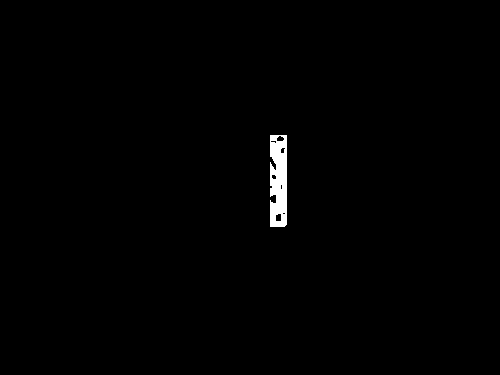

255
Image similarity: 0.9264268721924042


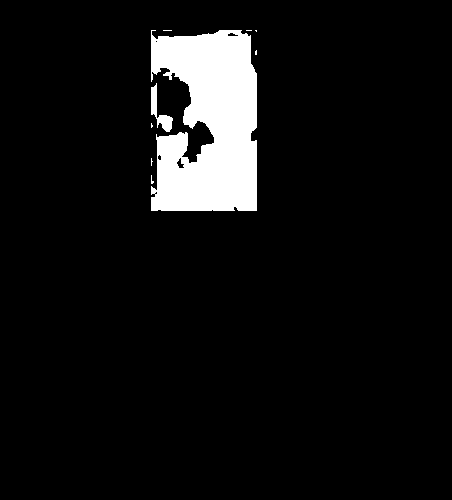

255
Image similarity: 0.941278570748319


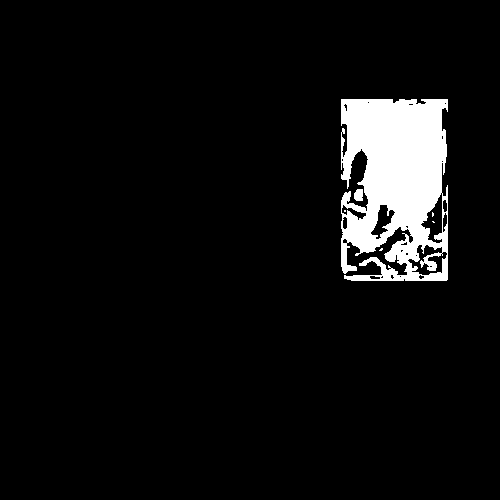

255
Image similarity: 0.9874076188871185


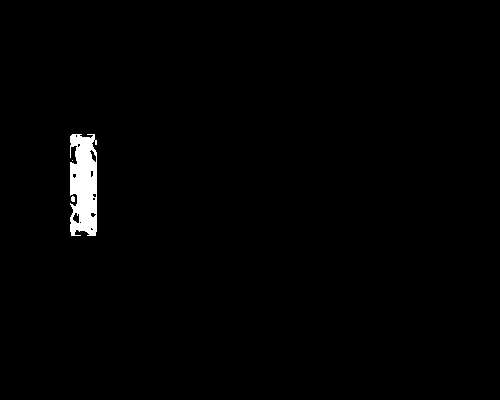

255
Image similarity: 0.9021573885394748


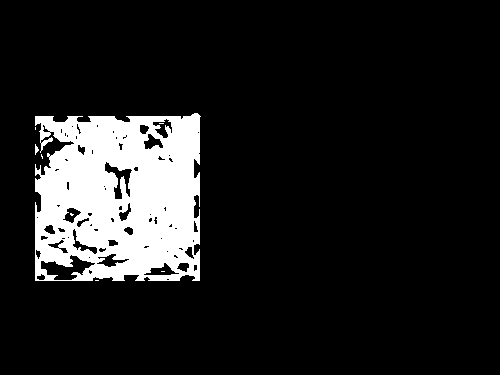

255
Image similarity: 0.9456026899734379


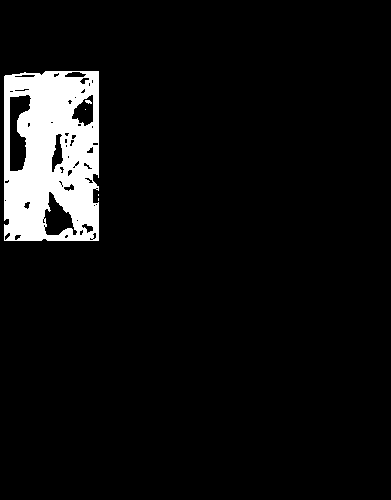

255
Image similarity: 0.7781309587344324


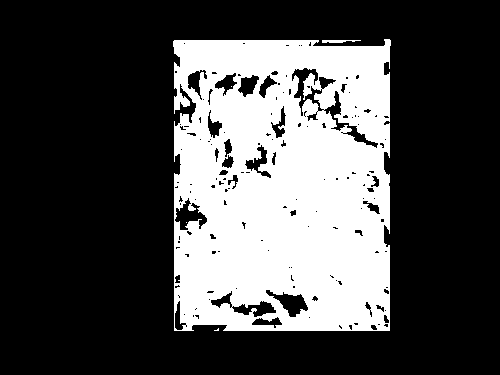

255
Image similarity: 0.9761207130471334


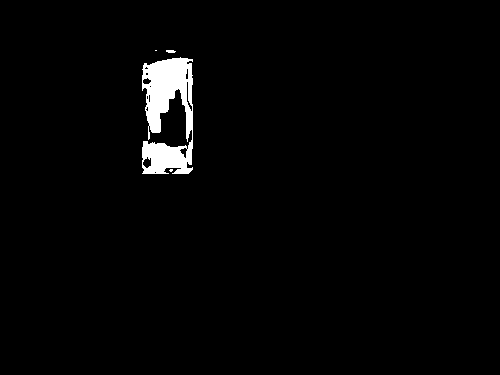

255
Image similarity: 0.858828730614385


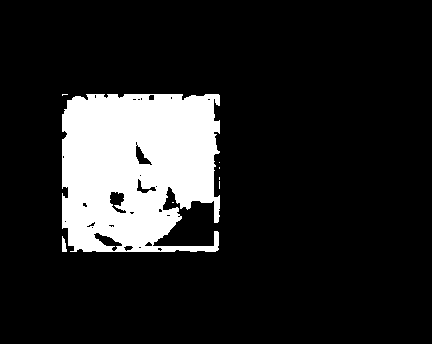

255
Image similarity: 0.8691448028104213


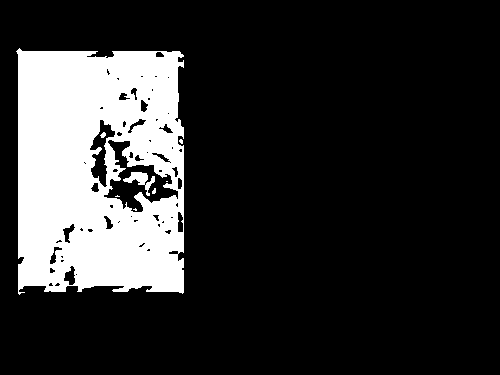

255
Image similarity: 0.9631605355483018


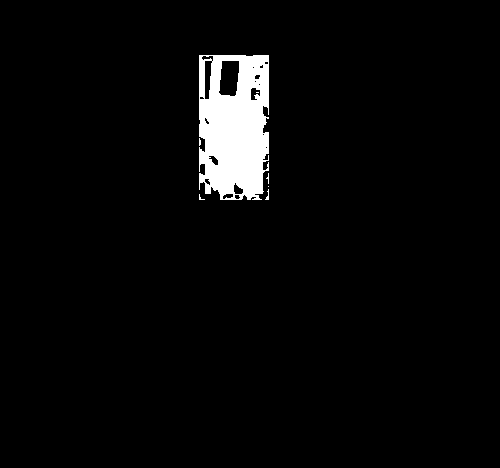

255
Image similarity: 0.9918464641049559


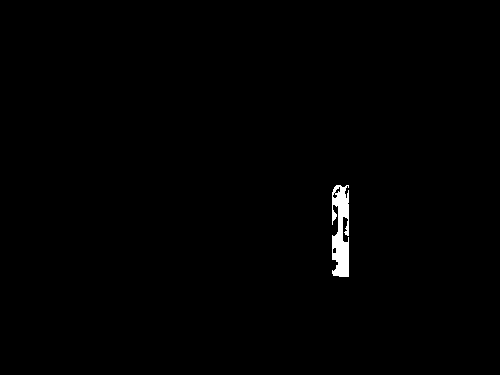

255
Image similarity: 0.9874890274356046


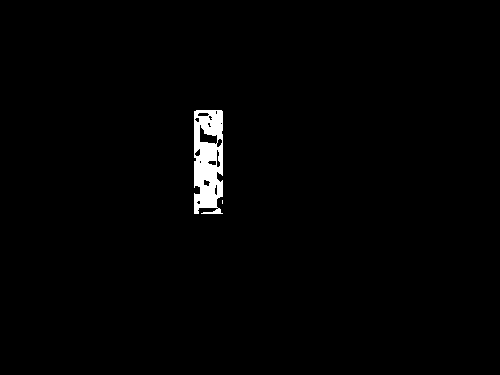

255
Image similarity: 0.8408806821196633


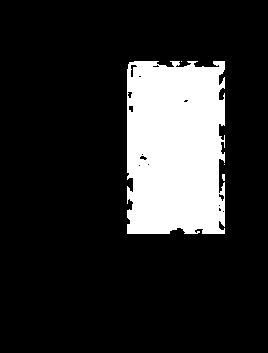

255
Image similarity: 0.8703065524795965


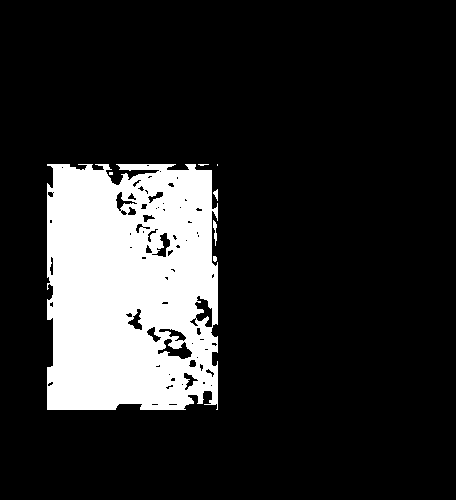

255
Image similarity: 0.9619785624530622


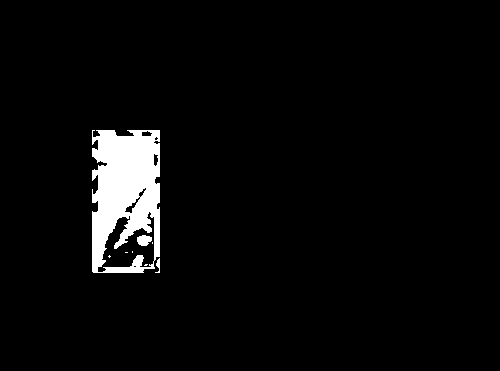

255
Image similarity: 0.9034492080683159


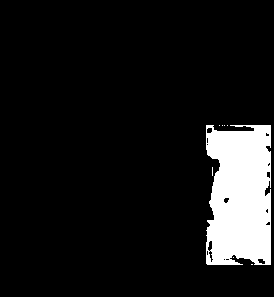

255
Image similarity: 0.9525112121119713


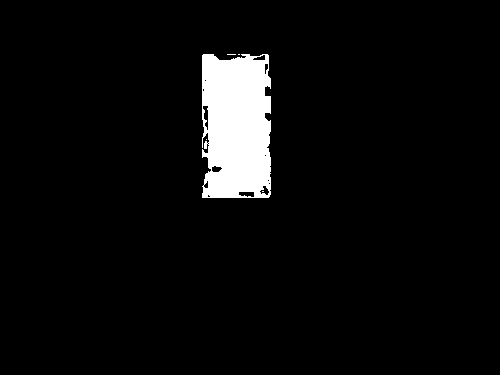

255
Image similarity: 0.9213197440262915


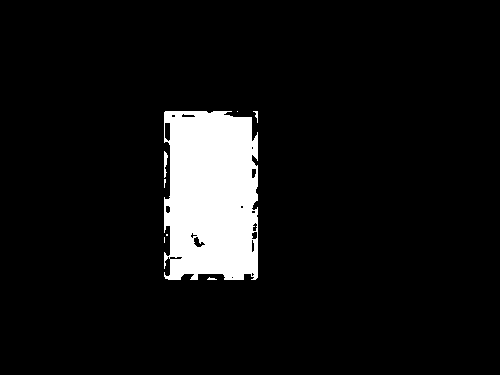

255
Image similarity: 0.9906121665291101


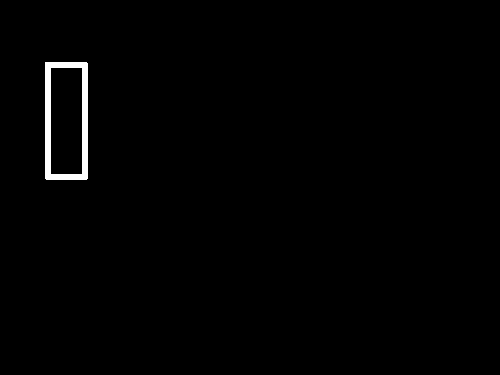

255
Image similarity: 0.9369847911782974


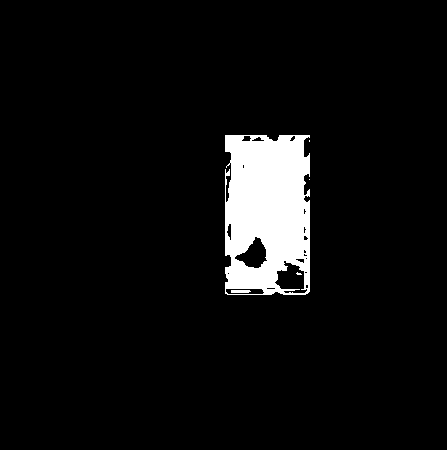

255
Image similarity: 0.973927048575689


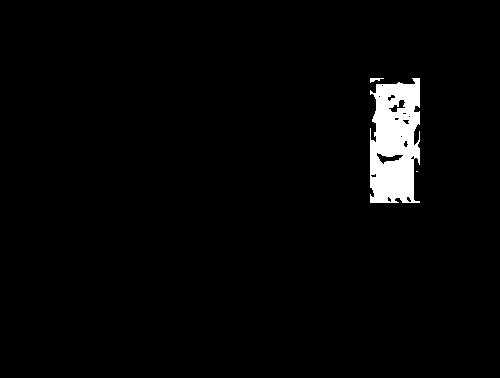

255
Image similarity: 0.9383556212569444


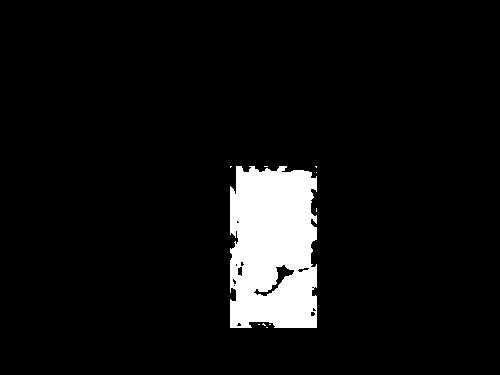

255
Image similarity: 0.9182923492977039


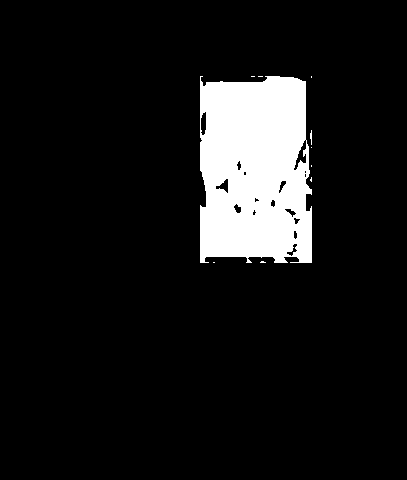

255
Image similarity: 0.8155030980966024


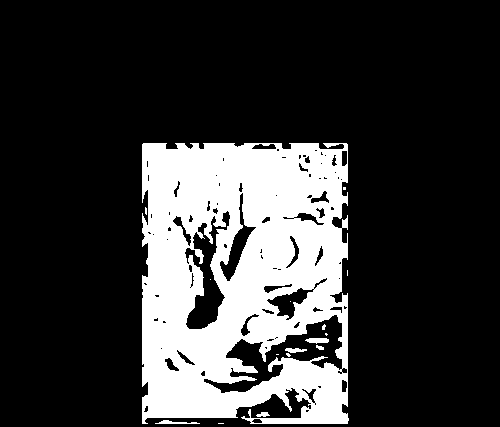

255
Image similarity: 0.991150487370225


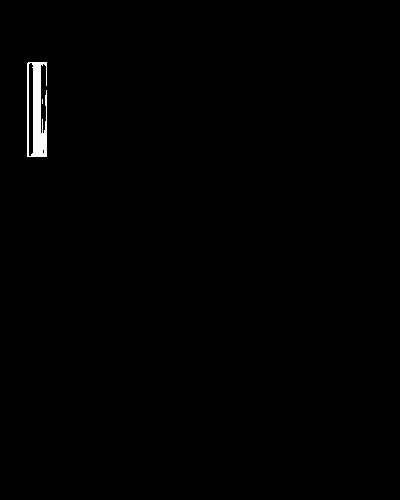

255
Image similarity: 0.9804275485332519


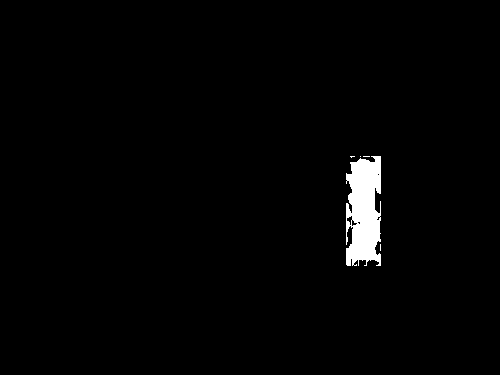

255
Image similarity: 0.9691791065313632


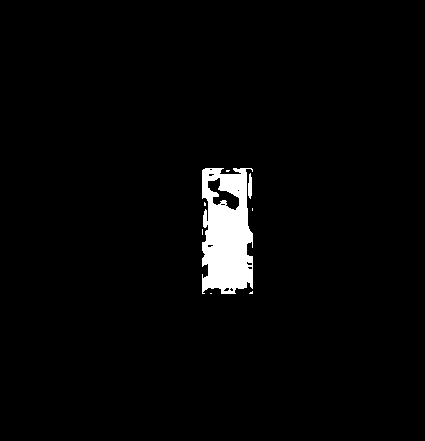

255
Image similarity: 0.9892094048691578


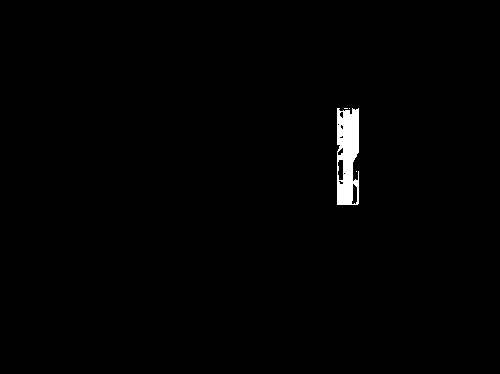

255
Image similarity: 0.8519157928490221


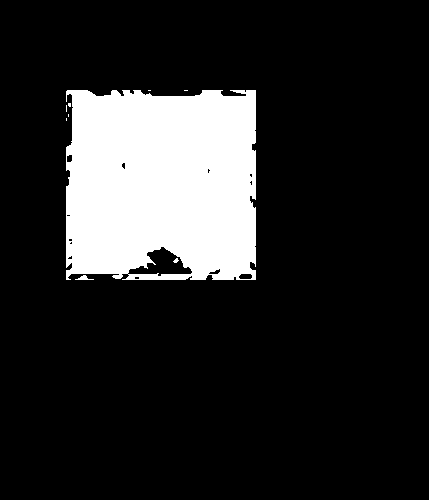

255
Image similarity: 0.9907492557860135


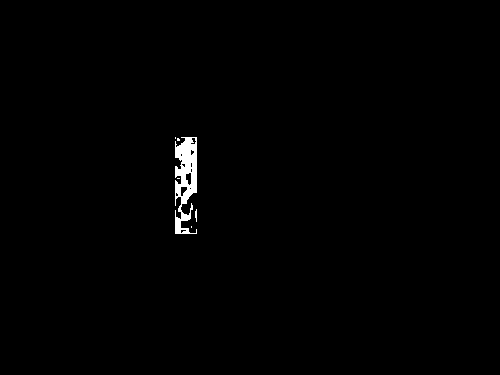

255
Image similarity: 0.8453687908865182


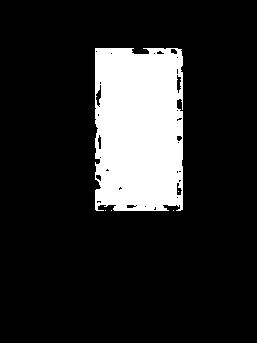

255
Image similarity: 0.7430154784207903


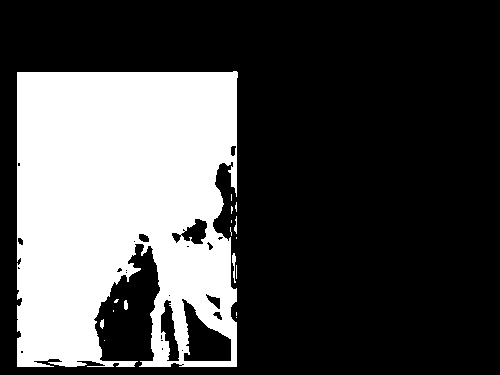

255
Image similarity: 0.9362194184994083


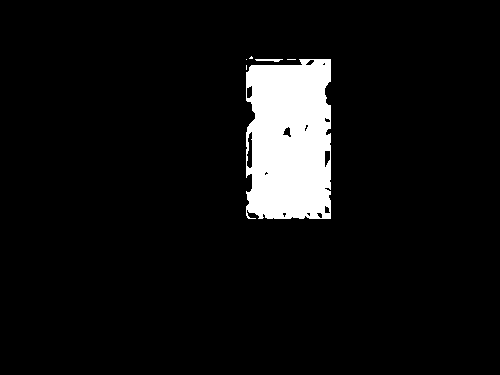

255
Image similarity: 0.9846138517096142


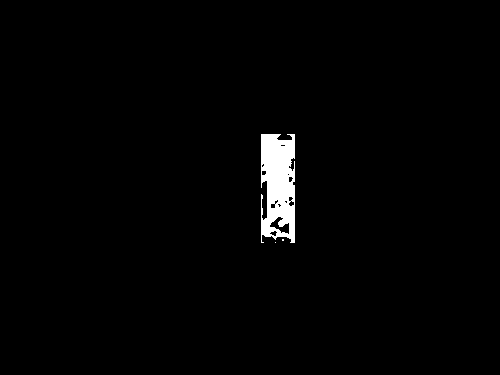

255
Image similarity: 0.931935741705177


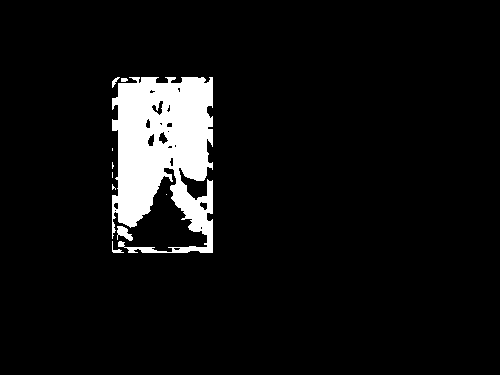

255
Image similarity: 0.9087444000491072


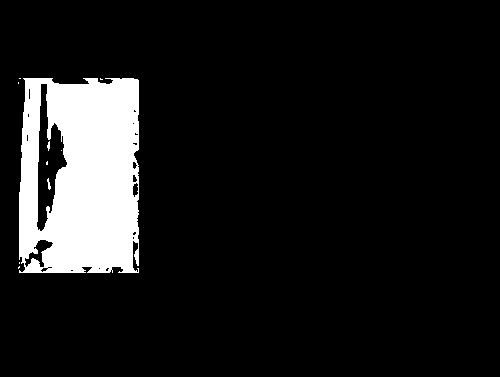

255
Image similarity: 0.9247194345743209


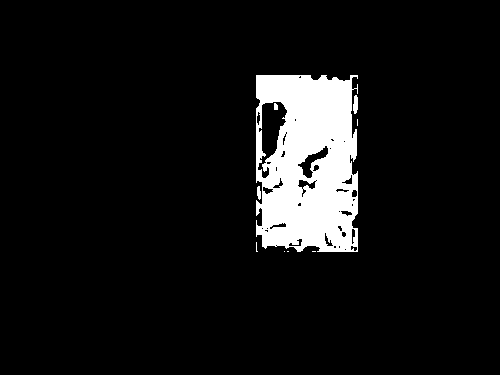

255
Image similarity: 0.8064134366934518


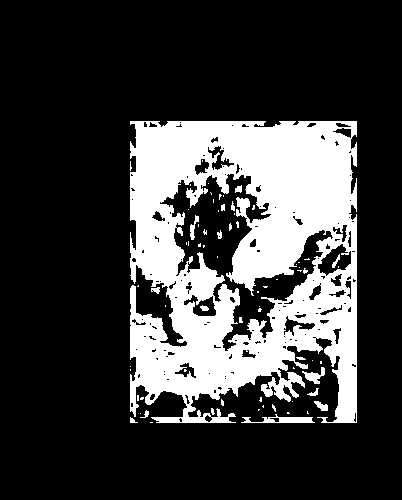

255
Image similarity: 0.9291570625997783


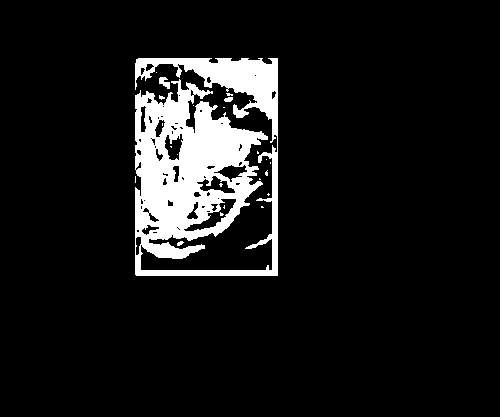

255
Image similarity: 0.971606599270366


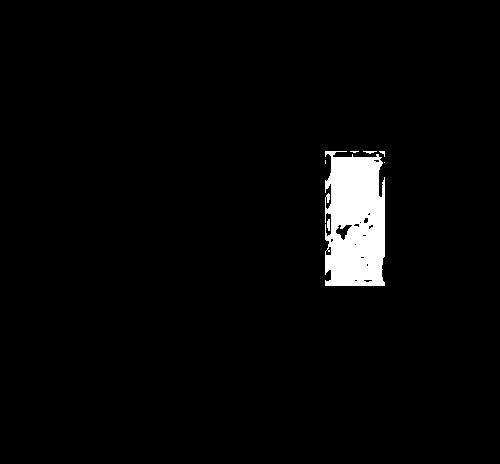

255
Image similarity: 0.8624713080700487


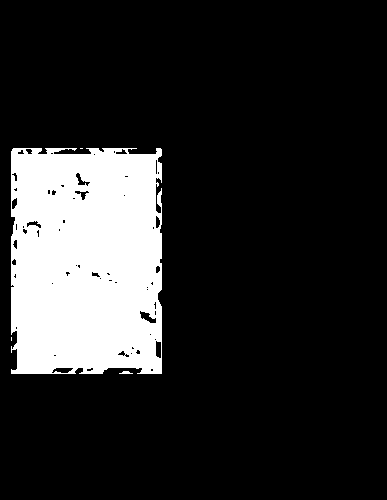

255
Image similarity: 0.9730444083038398


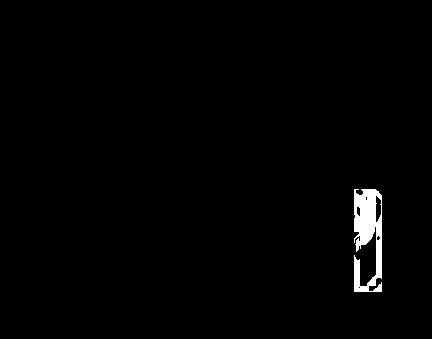

255
Image similarity: 0.865273884171448


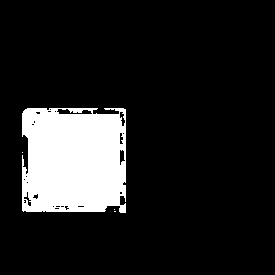

255
Image similarity: 0.9541838337873618


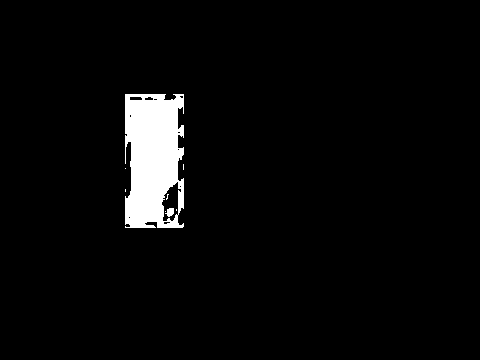

255
Image similarity: 0.9660798710791725


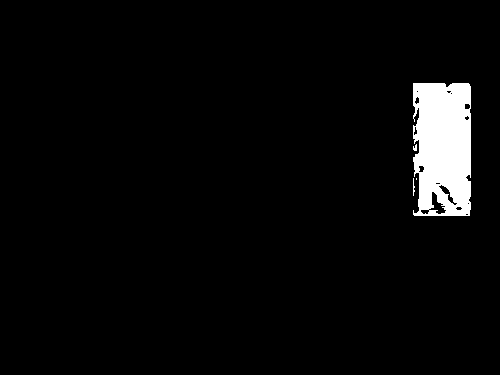

255
Image similarity: 0.9867199013650189


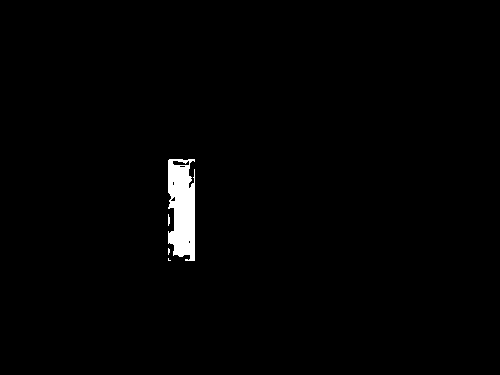

255
Image similarity: 0.9048524125442952


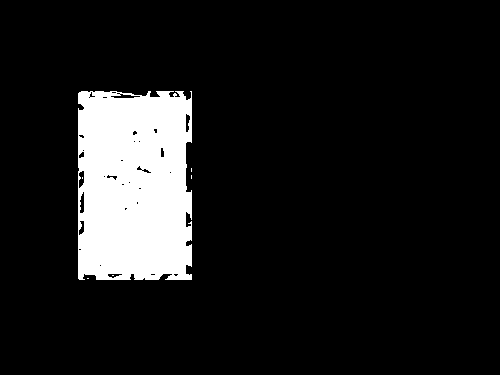

255
Image similarity: 0.9861574886002885


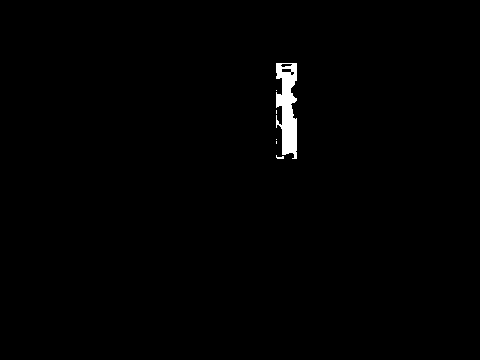

255
Image similarity: 0.8860926904455739


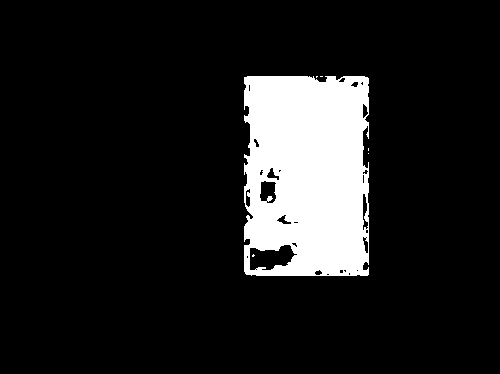

255
Image similarity: 0.9652157180055462


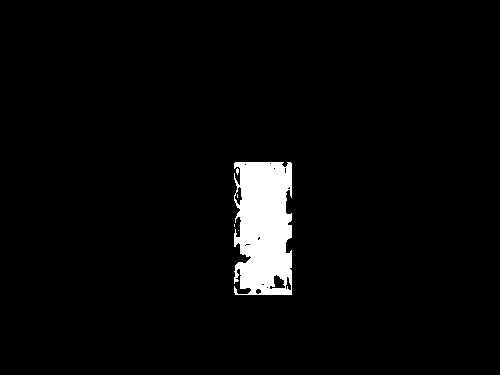

255
Image similarity: 0.7763481877124717


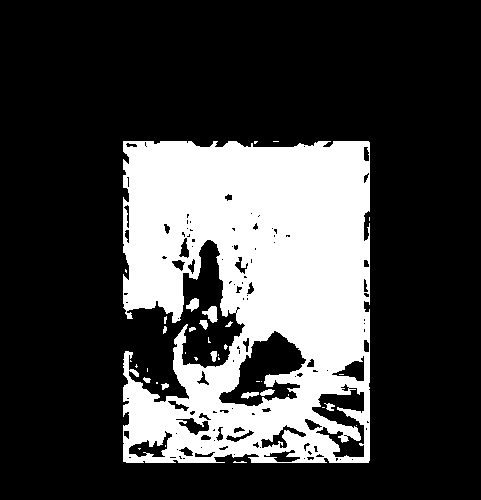

255
Image similarity: 0.875149591120282


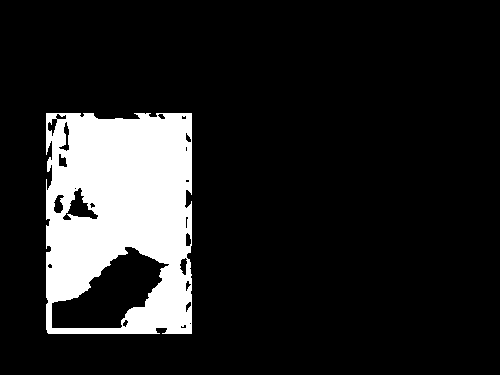

255
Image similarity: 0.8939061057778667


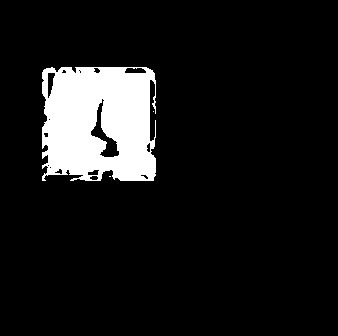

255
Image similarity: 0.9795580070071691


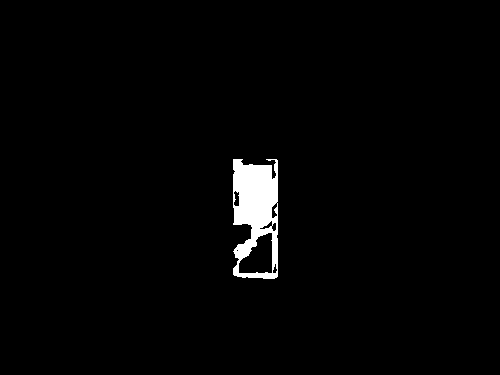

255
Image similarity: 0.9874968621011538


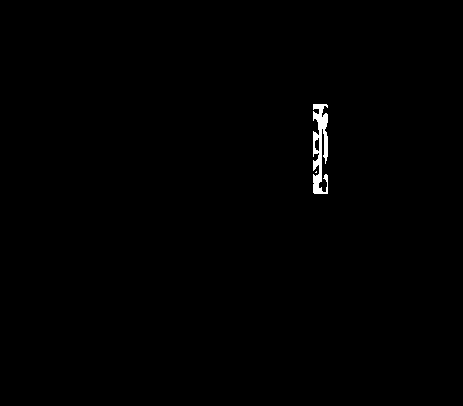

255
Image similarity: 0.8245005091461339


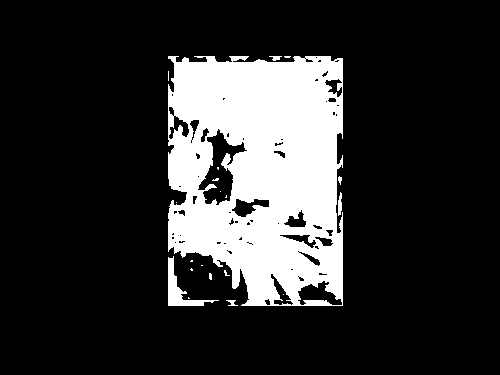

255
Image similarity: 0.8389302168509941


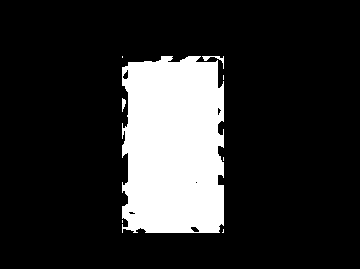

255
Image similarity: 0.6754864562512958


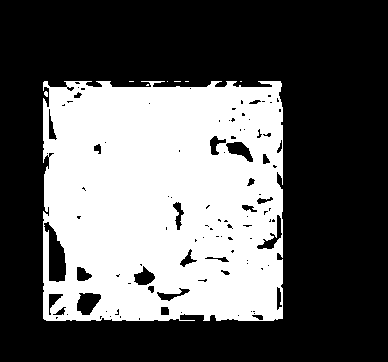

255
Image similarity: 0.9927222683641345


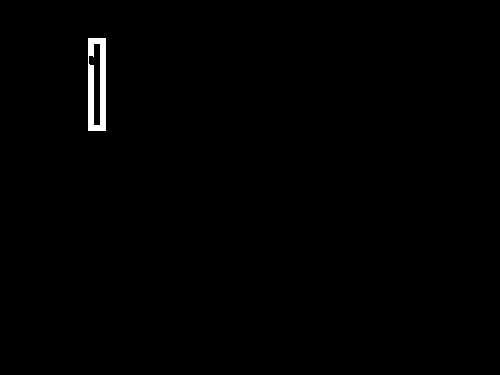

255
Image similarity: 0.988803432131258


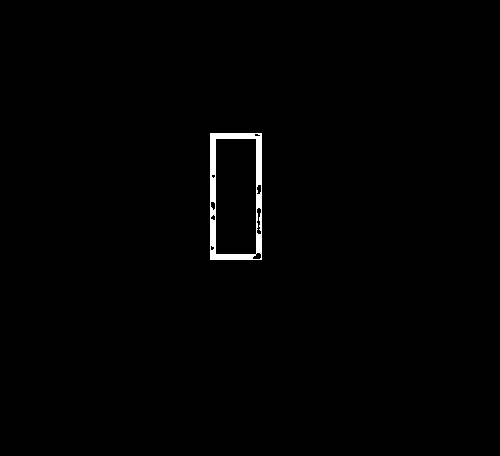

255
Image similarity: 0.9776194630920771


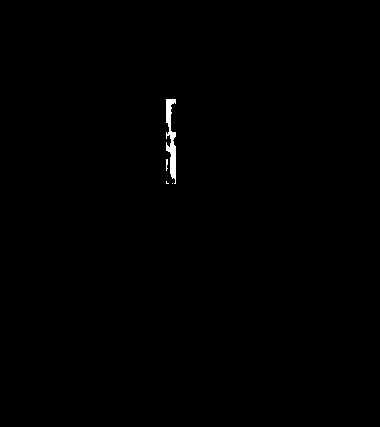

255
Image similarity: 0.9919137810833295


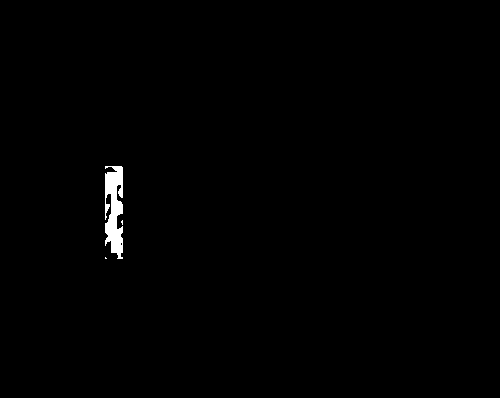

255
Image similarity: 0.9501689454974385


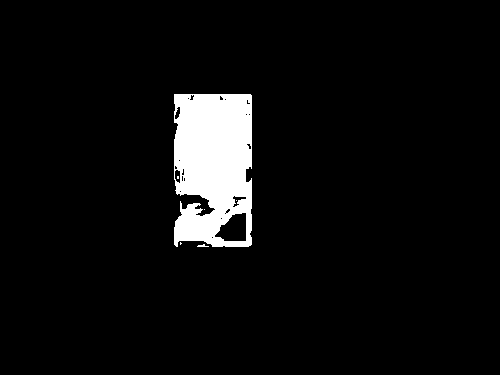

255
Image similarity: 0.9908903361142922


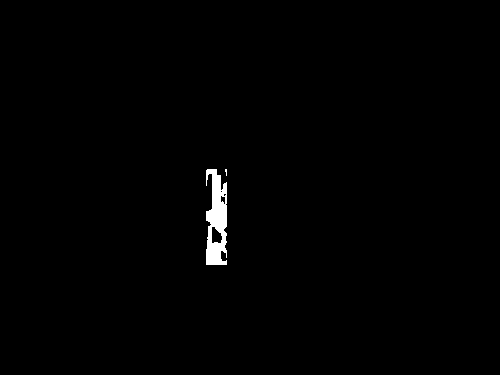

255
Image similarity: 0.9706535791071059


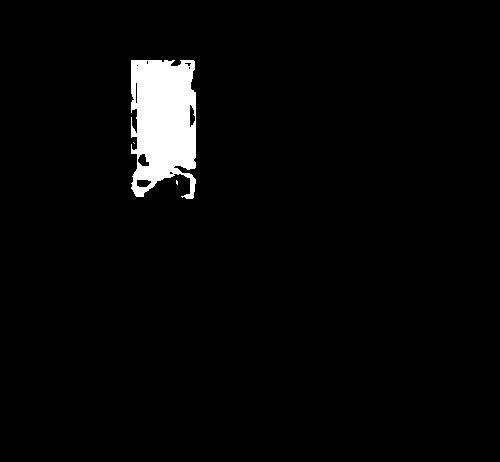

255
Image similarity: 0.9365024330147245


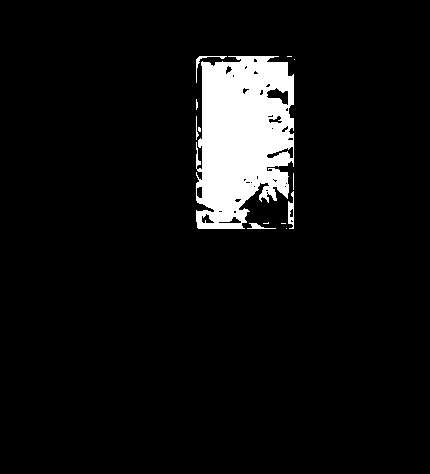

255
Image similarity: 0.8107083426439551


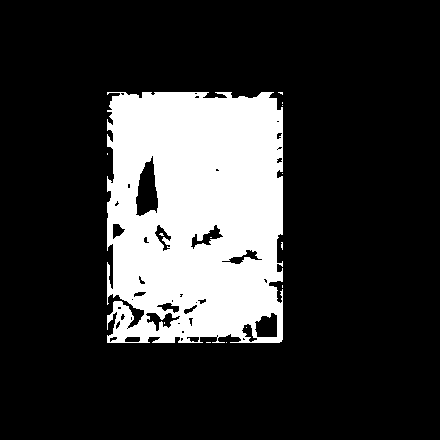

255
Image similarity: 0.9580901662800588


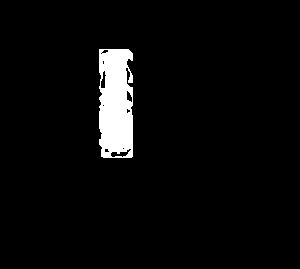

255
Image similarity: 0.9759601537354822


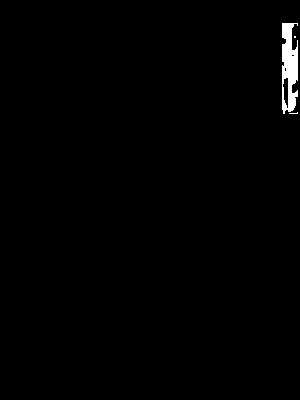

255
Image similarity: 0.9921420273040441


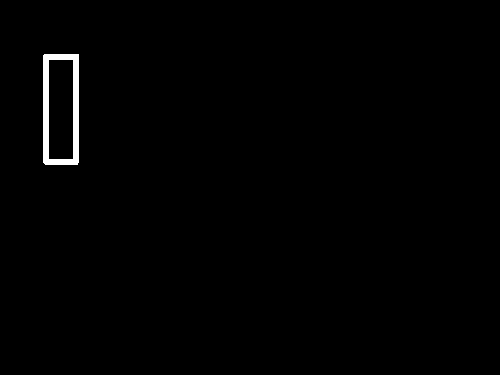

255
Image similarity: 0.8685705652047492


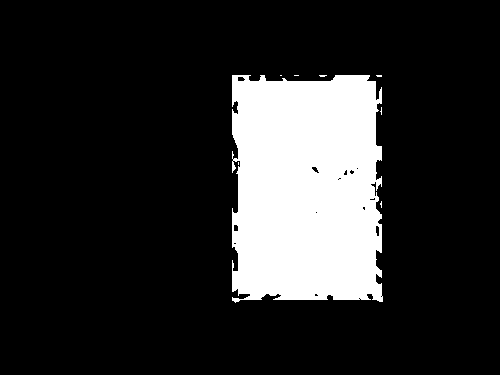

255
Image similarity: 0.9158496565646208


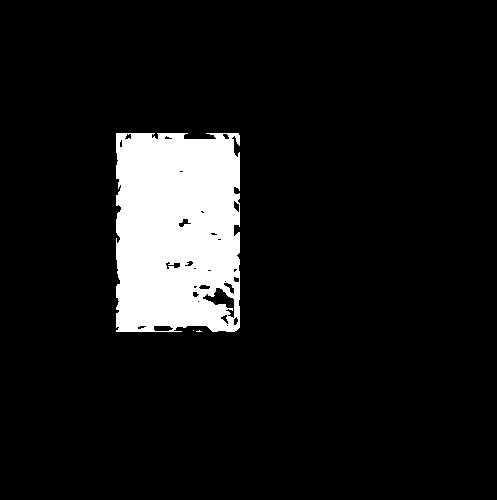

255
Image similarity: 0.9572775217617073


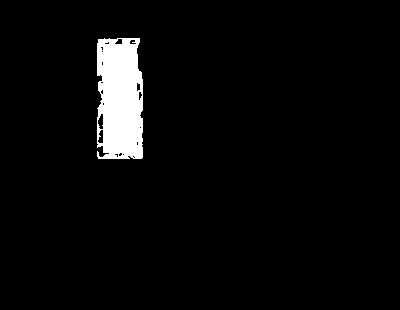

255
Image similarity: 0.975782999420088


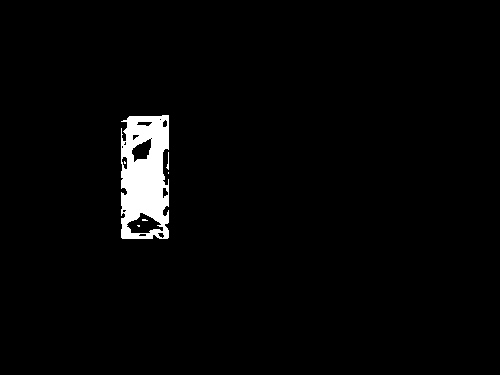

255
Image similarity: 0.9557695183848546


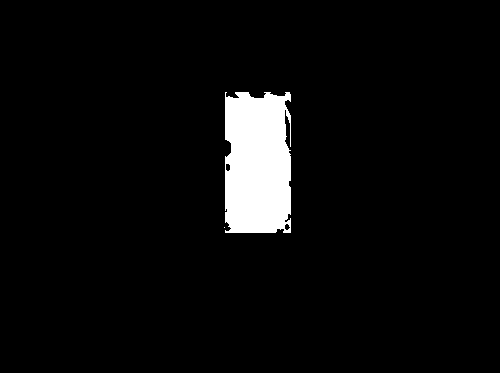

255
Image similarity: 0.9448893134664174


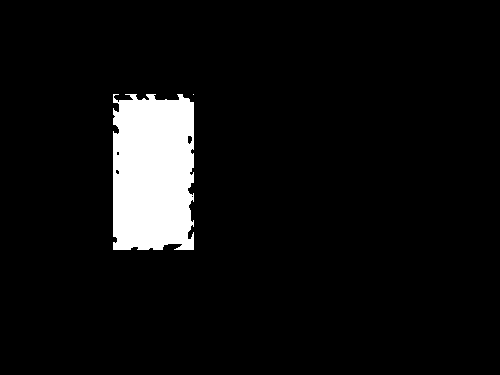

255
Image similarity: 0.9599945718728952


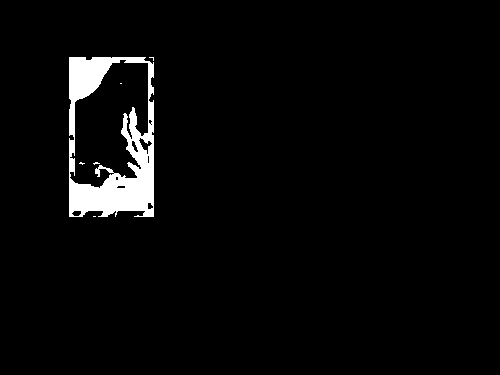

255
Image similarity: 0.8456180256906239


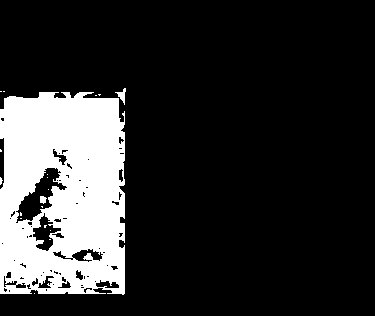

255
Image similarity: 0.8737959689268633


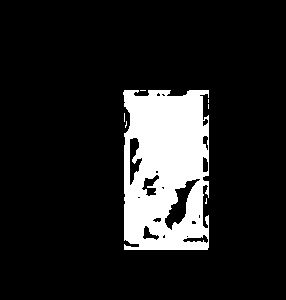

255
Image similarity: 0.8957963378248307


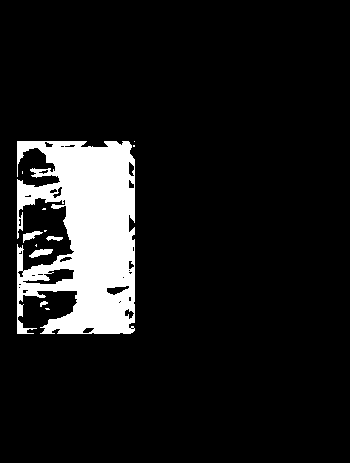

255
Image similarity: 0.9832769989705609


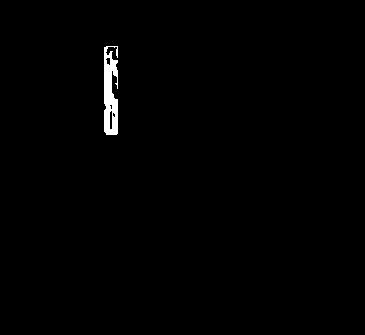

255
Image similarity: 0.9177158791998216


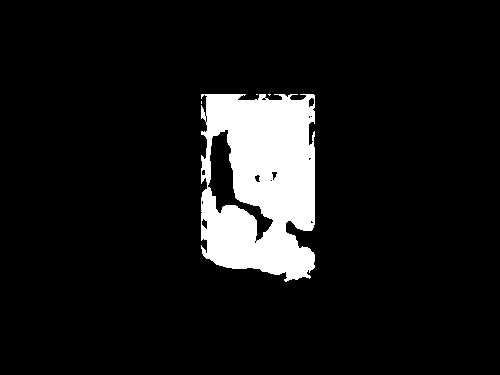

255
Image similarity: 0.9839011046007973


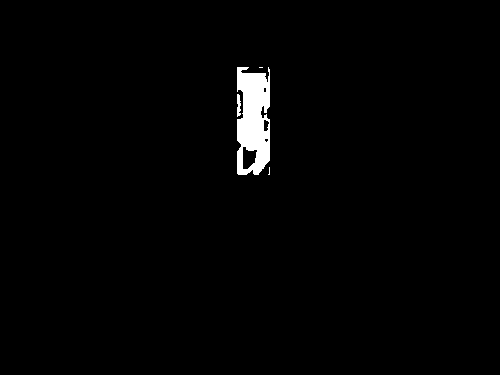

255
Image similarity: 0.9883638726126858


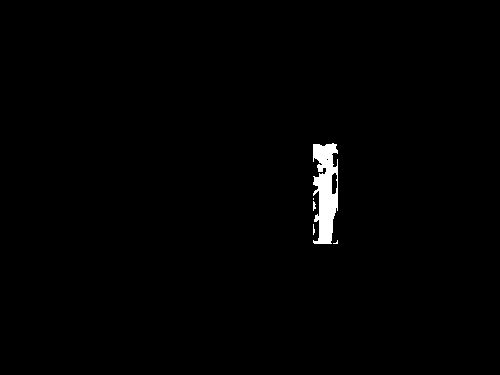

255
Image similarity: 0.8769421803286715


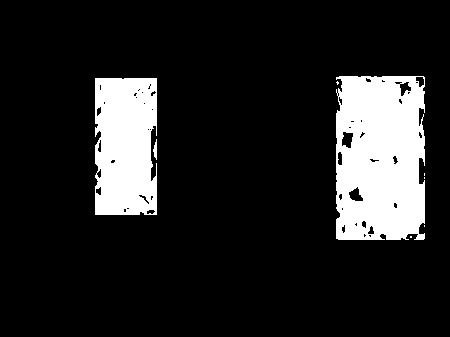

255
Image similarity: 0.9194594519394595


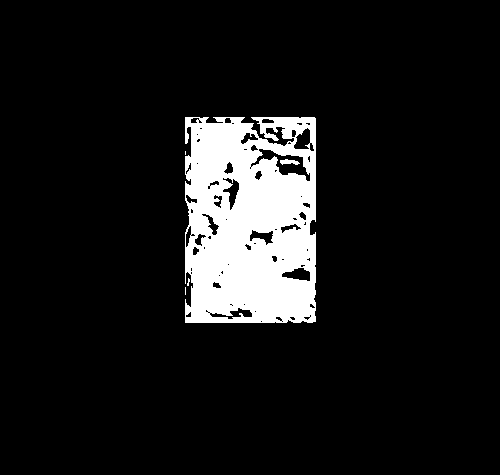

255
Image similarity: 0.979705649619813


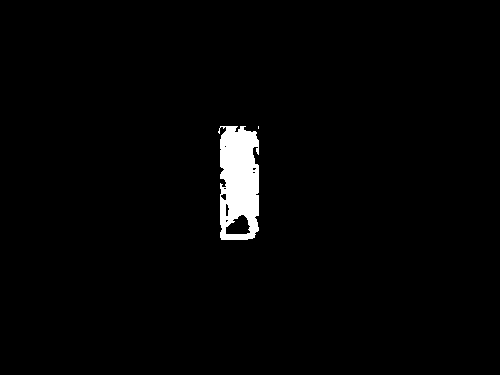

255
Image similarity: 0.9857130454634544


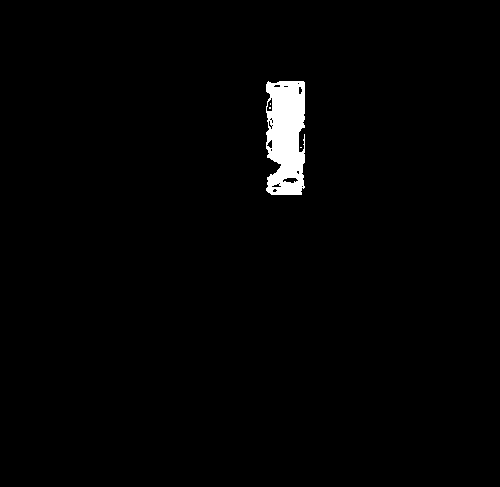

255
Image similarity: 0.9596537853331665


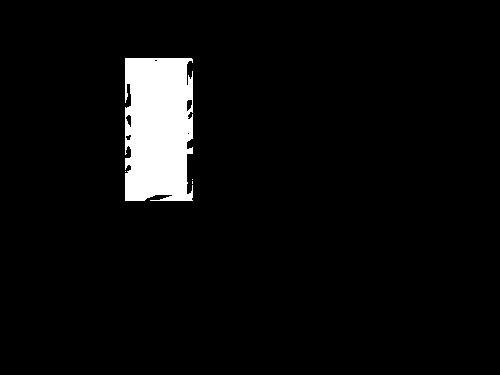

255
Image similarity: 0.9916954889332841


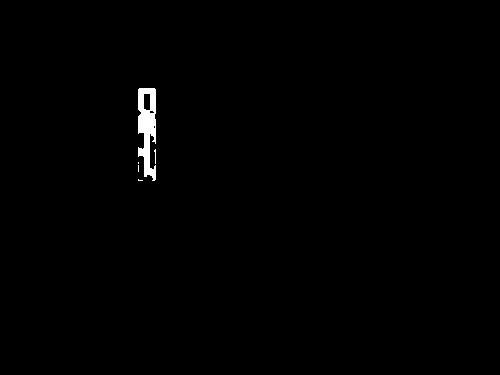

255
Image similarity: 0.8448325206851137


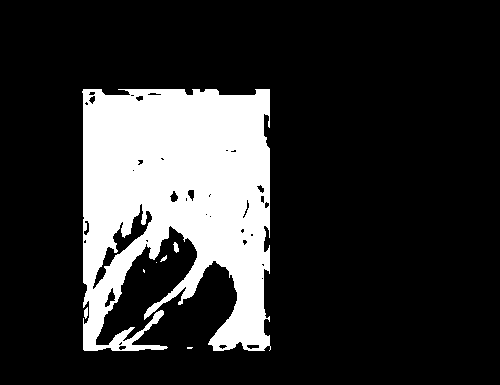

255
Image similarity: 0.9844401613749629


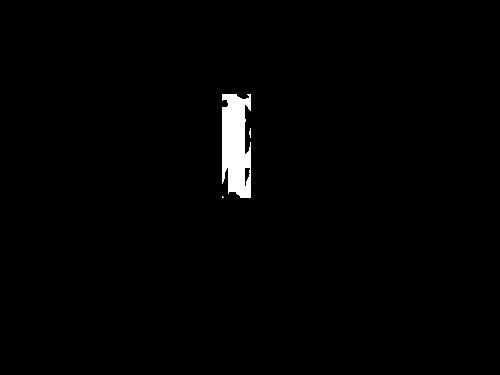

255
Image similarity: 0.9206053358878131


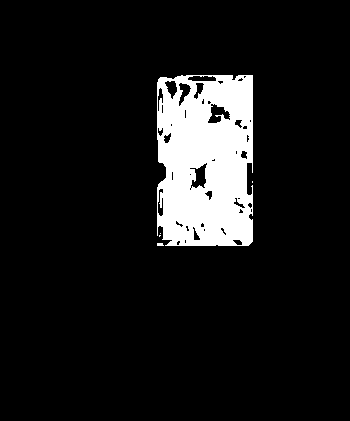

255
Image similarity: 0.908087576314145


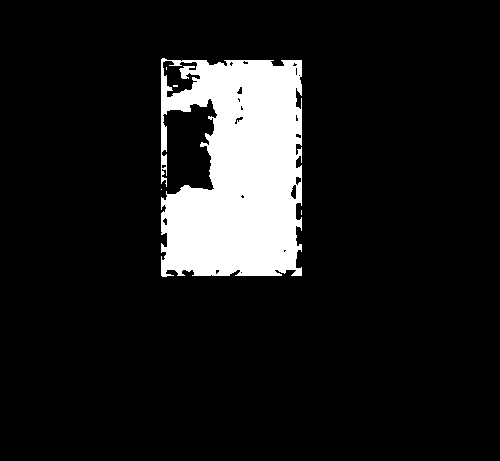

255
Image similarity: 0.9851340520991463


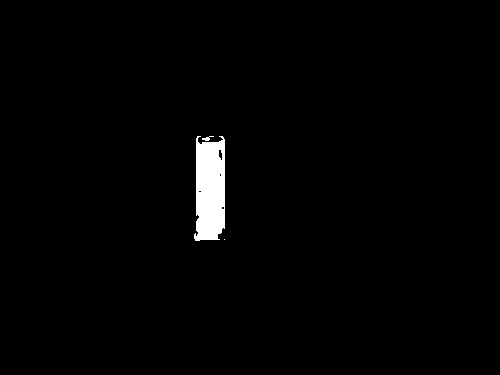

255
Image similarity: 0.967124151246372


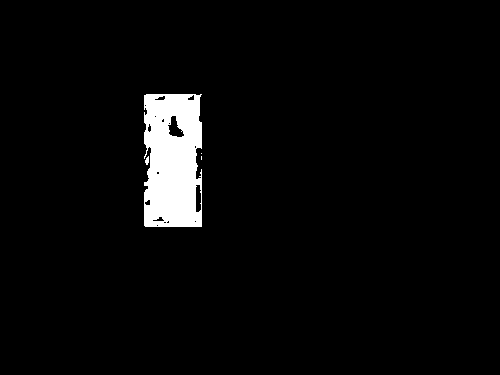

255
Image similarity: 0.9791375790356411


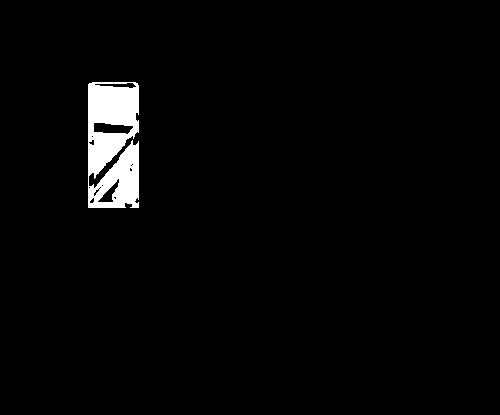

255
Image similarity: 0.8315513822039979


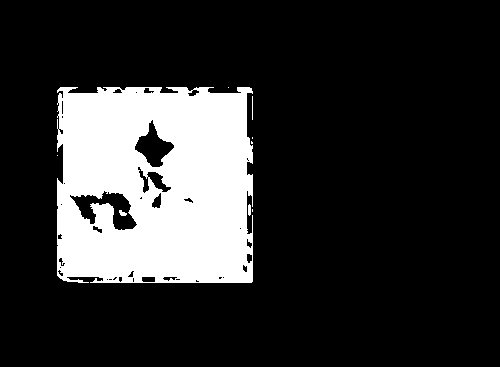

255
Image similarity: 0.9550082297226775


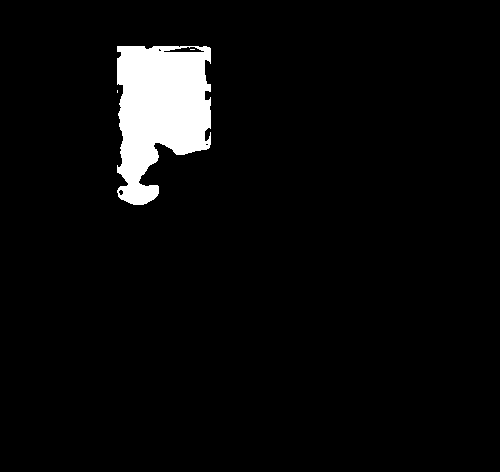

255
Image similarity: 0.9877574364786178


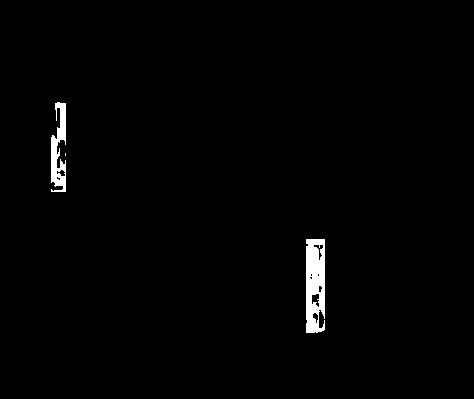

255
Image similarity: 0.9703805189906426


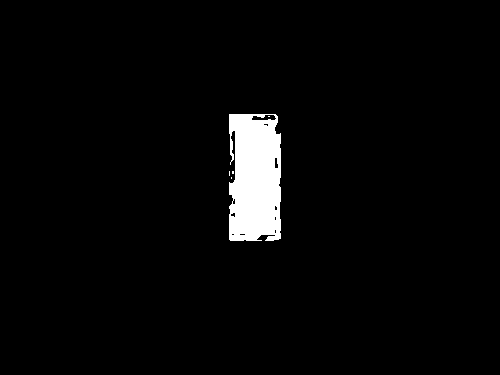

255
Image similarity: 0.9910016219963703


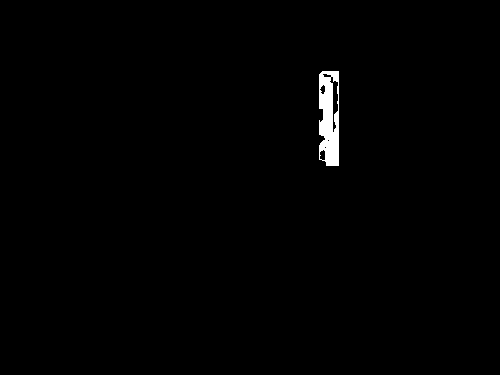

255
Image similarity: 0.958895039166279


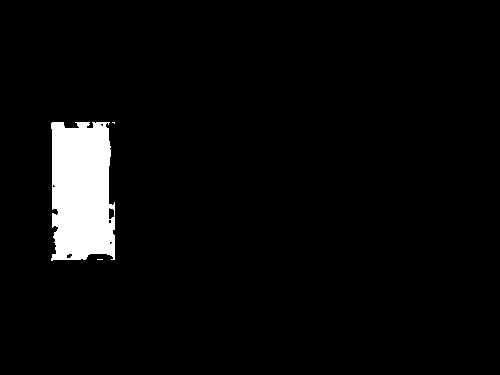

255
Image similarity: 0.9783974313527891


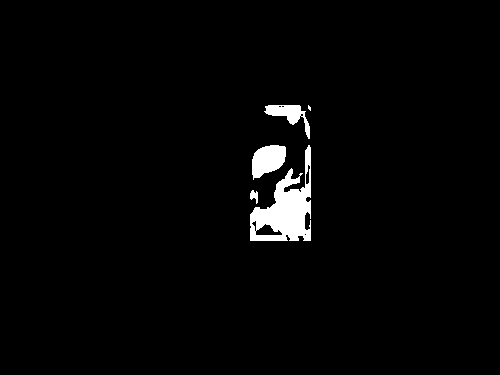

255
Image similarity: 0.75902153148212


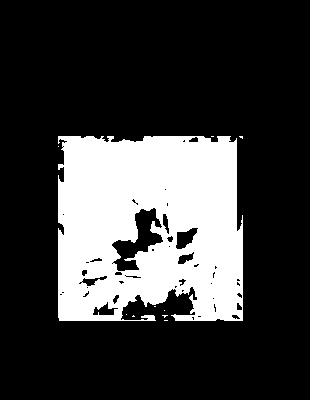

255
Image similarity: 0.964178014837681


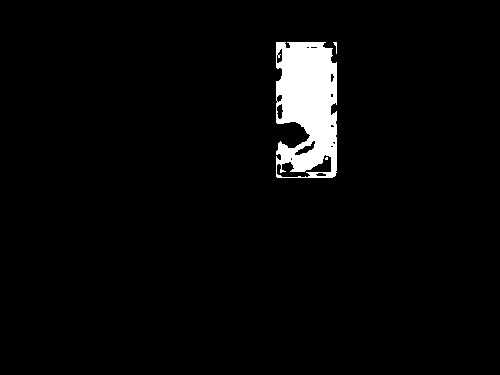

255
Image similarity: 0.8235497643225808


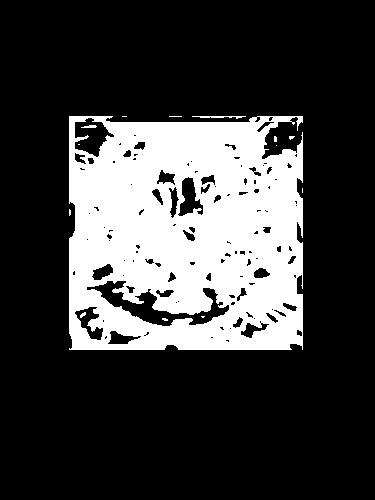

255
Image similarity: 0.962766538659283


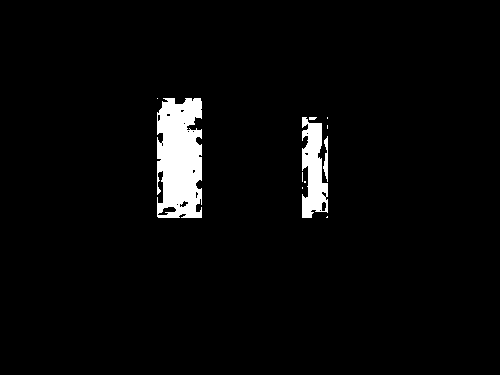

255
Image similarity: 0.8887822621573073


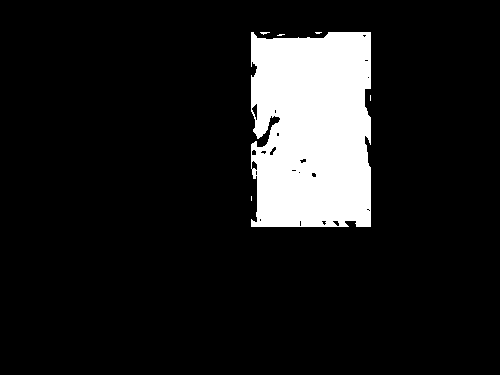

255
Image similarity: 0.8041585751117817


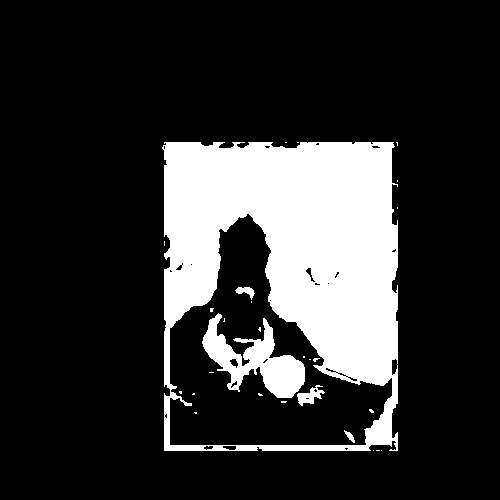

255
Image similarity: 0.9630057467319215


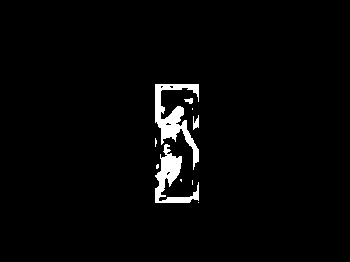

255
Image similarity: 0.9049784956463922


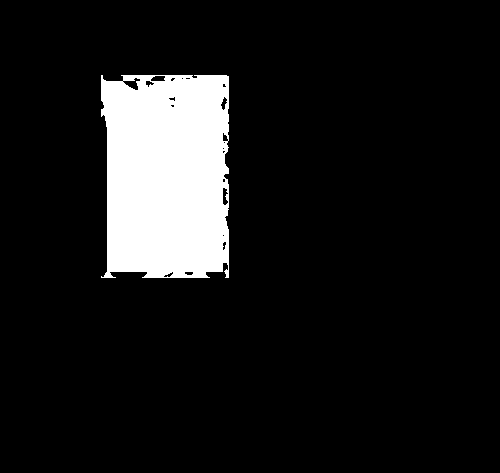

255
Image similarity: 0.9896120837844866


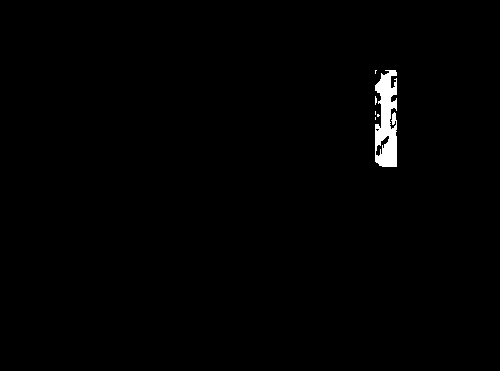

255
Image similarity: 0.9773565635334808


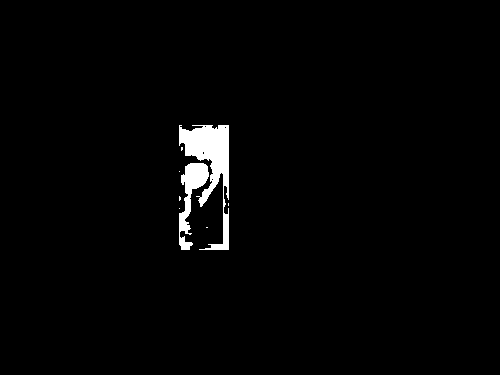

255
Image similarity: 0.9795423048493226


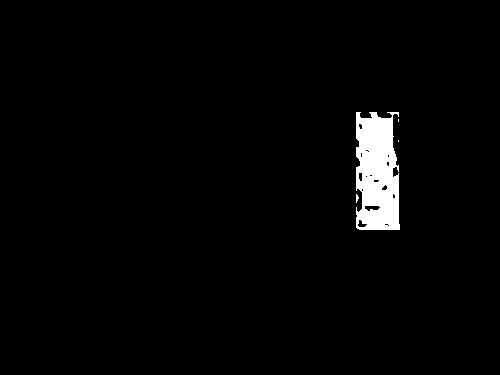

255
Image similarity: 0.9005279304642837


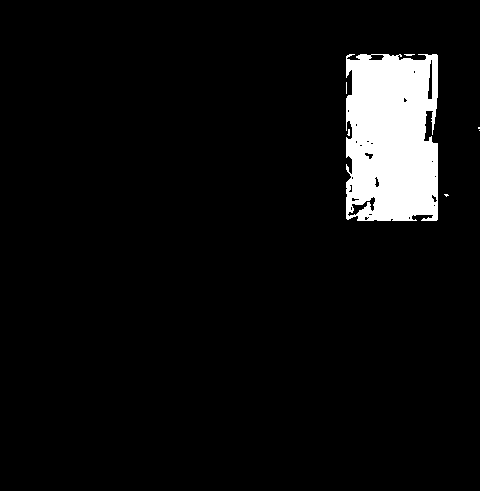

255
Image similarity: 0.9582053517586336


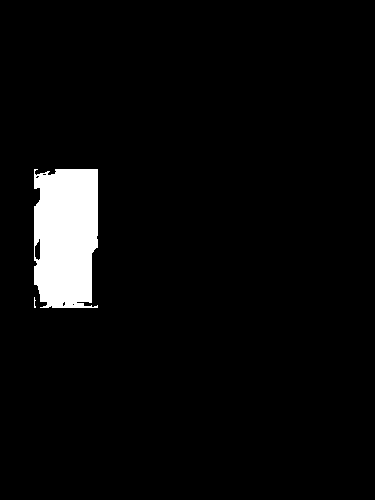

255
Image similarity: 0.9793777967806397


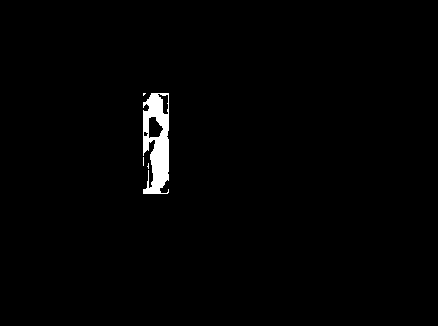

255
Image similarity: 0.9834610993500789


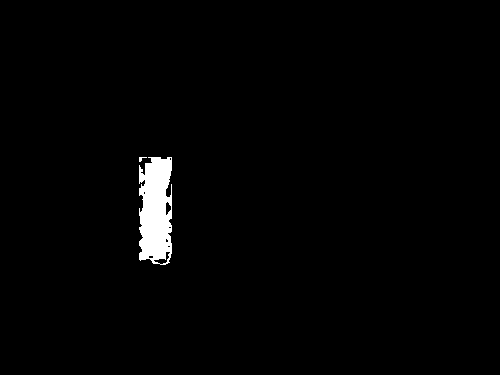

255
Image similarity: 0.9735620489171684


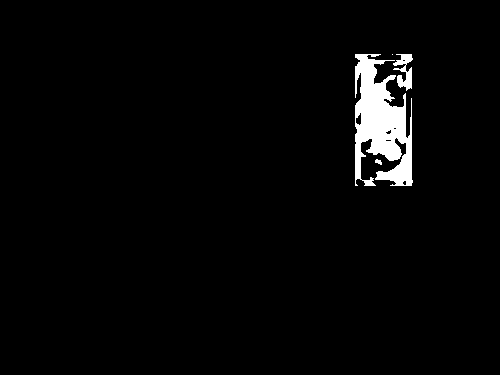

255
Image similarity: 0.9356765374252414


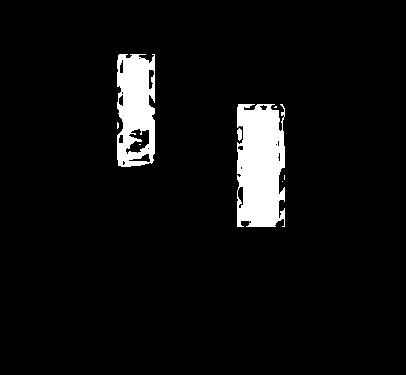

255
Image similarity: 0.9728277994811046


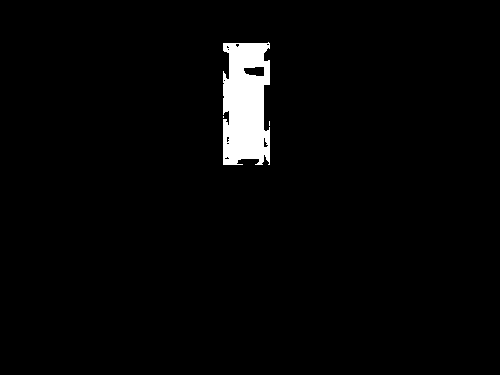

255
Image similarity: 0.9525882822662621


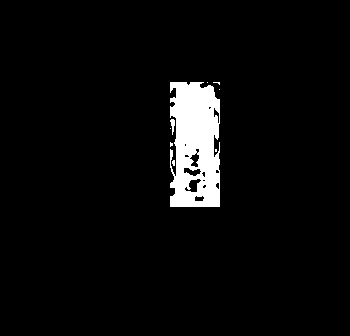

255
Image similarity: 0.9070489148769926


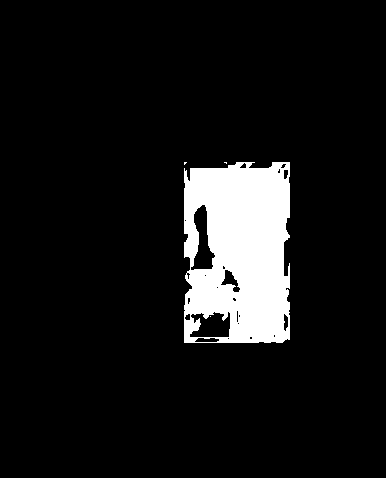

255
Image similarity: 0.9256359284497692


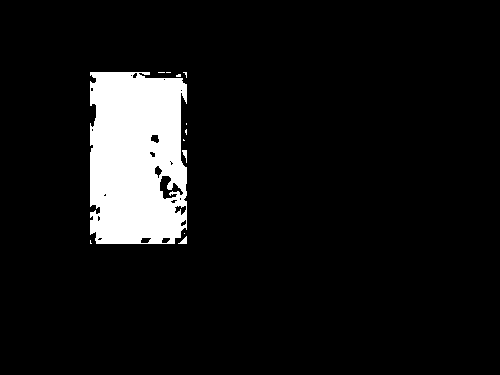

255
Image similarity: 0.9648307418365627


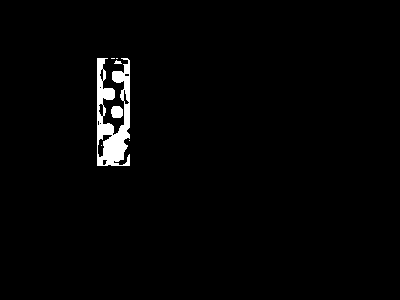

255
Image similarity: 0.7541882156489088


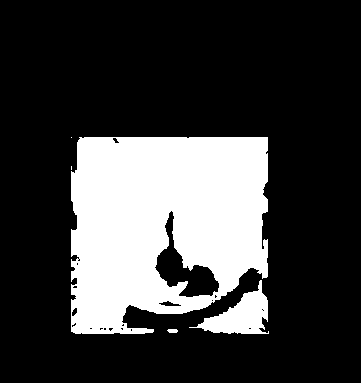

255
Image similarity: 0.9609990657200455


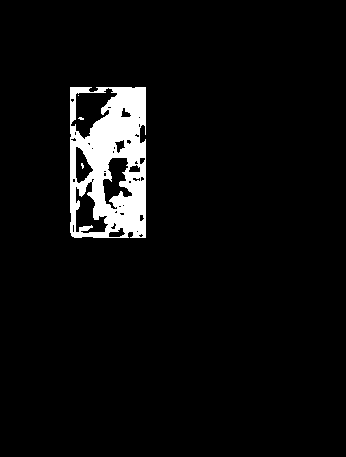

255
Image similarity: 0.977253358832788


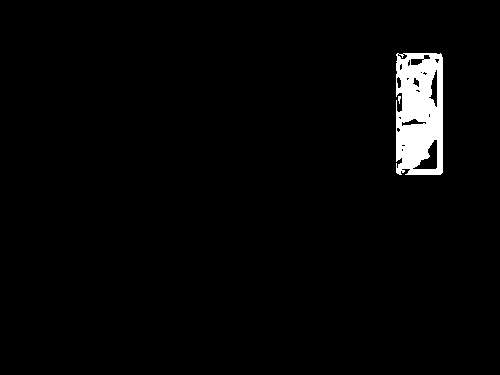

255
Image similarity: 0.8975529574810576


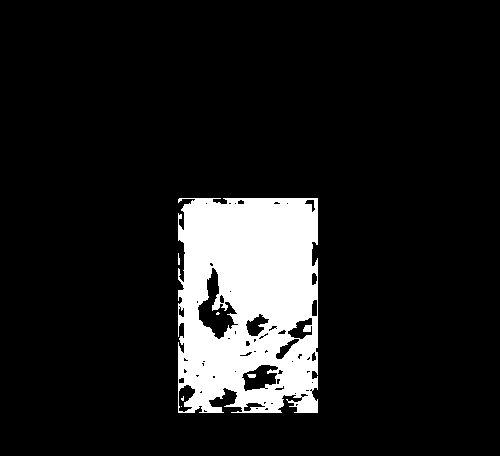

255
Image similarity: 0.9590147192674787


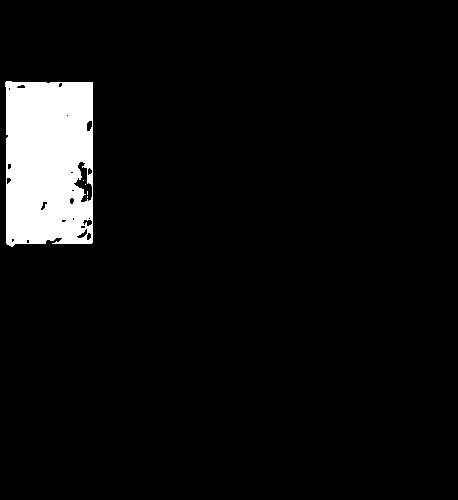

255
Image similarity: 0.9895305011745998


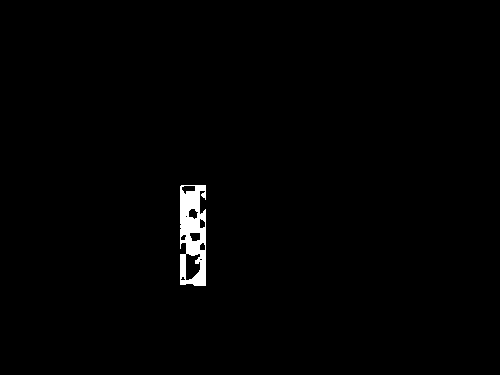

255
Image similarity: 0.9764125601347354


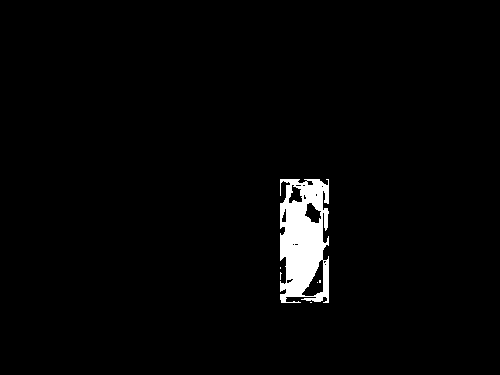

255
Image similarity: 0.9365538858861837


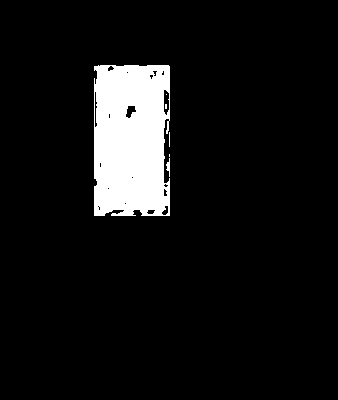

255
Image similarity: 0.9282689354046195


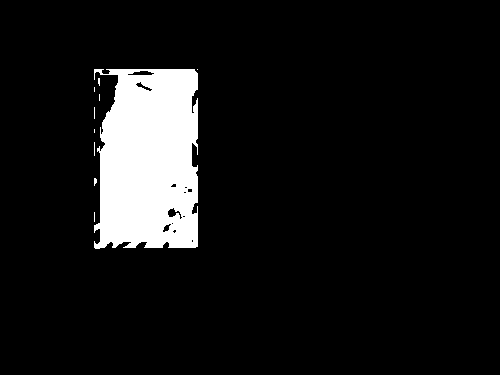

255
Image similarity: 0.7980289781278442


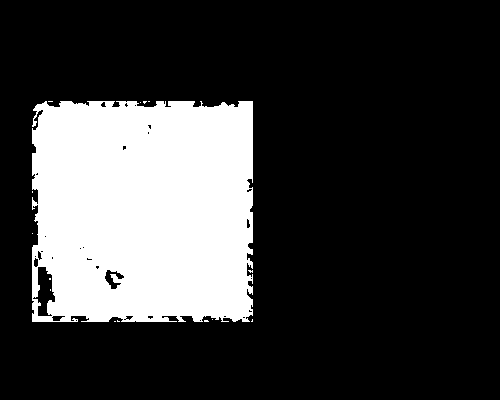

255
Image similarity: 0.9938444502507163


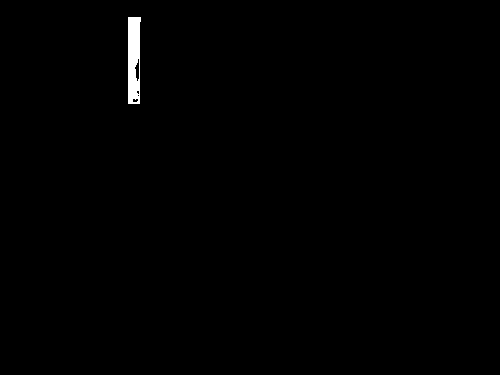

255
Image similarity: 0.9341125192666353


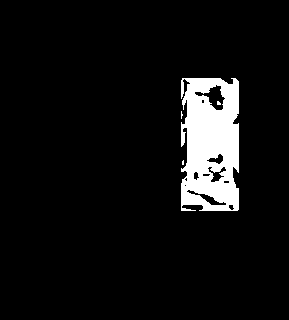

255
Image similarity: 0.9670522794479016


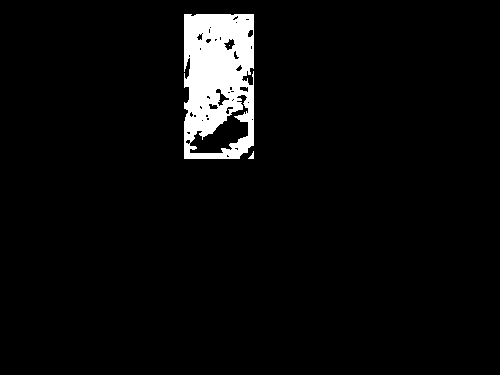

255
Image similarity: 0.9681613073616423


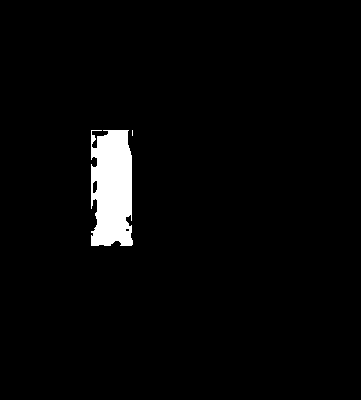

255
Image similarity: 0.8822304453470468


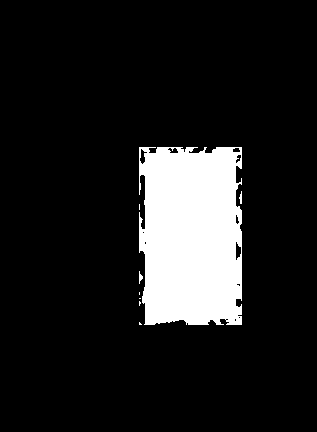

255
Image similarity: 0.8588259587695339


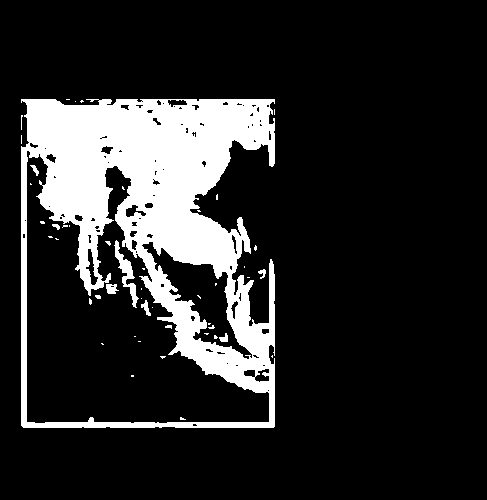

255
Image similarity: 0.9482848431882523


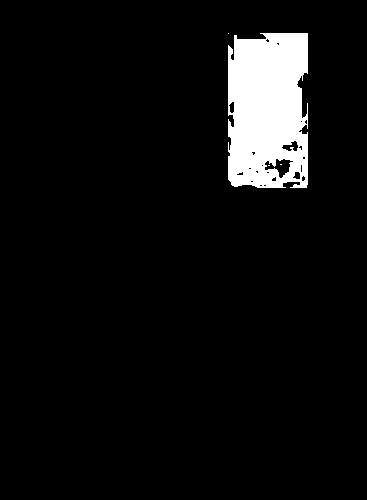

255
Image similarity: 0.9488119806498359


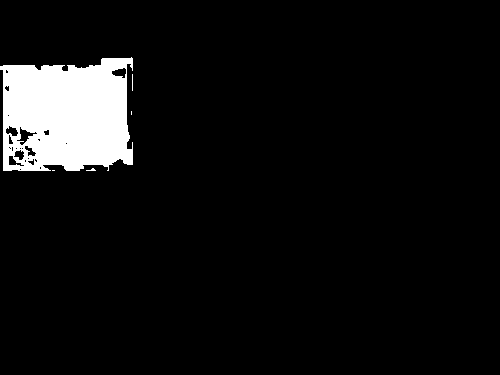

255
Image similarity: 0.974917054082584


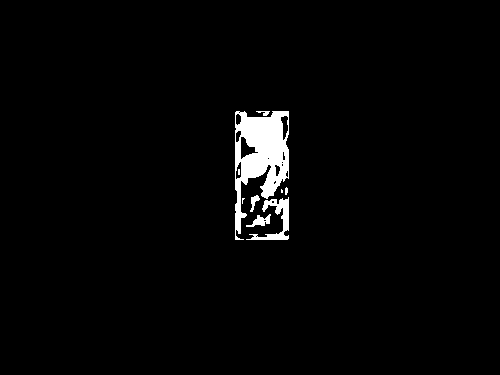

255
Image similarity: 0.9634638559965809


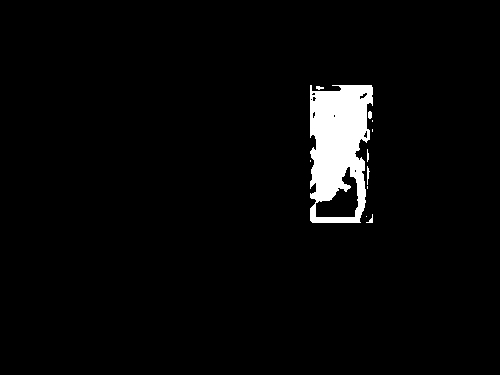

255
Image similarity: 0.9689517036597433


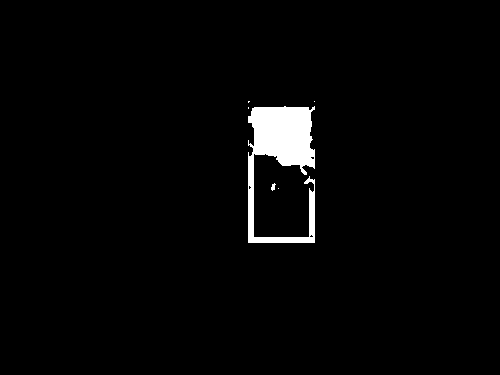

255
Image similarity: 0.9316747628113397


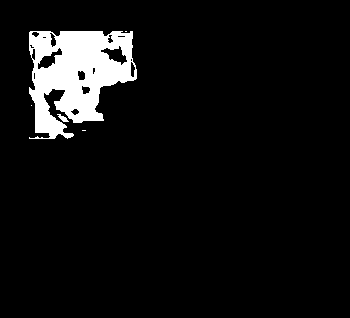

255
Image similarity: 0.9475215689586617


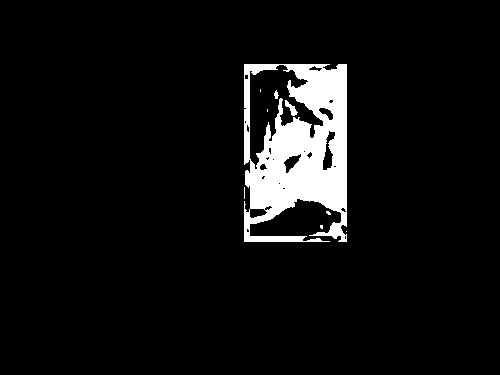

255
Image similarity: 0.8959262624901349


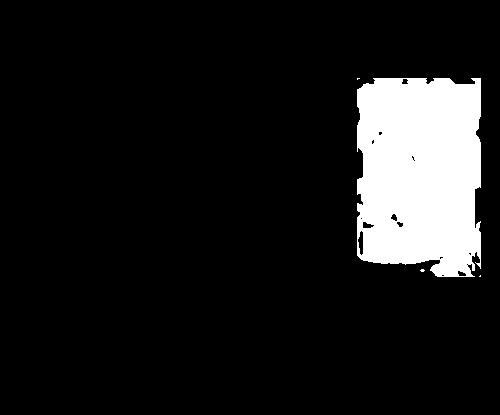

255
Image similarity: 0.8695350263235784


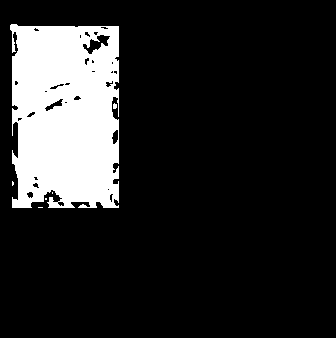

255
Image similarity: 0.9842481304728048


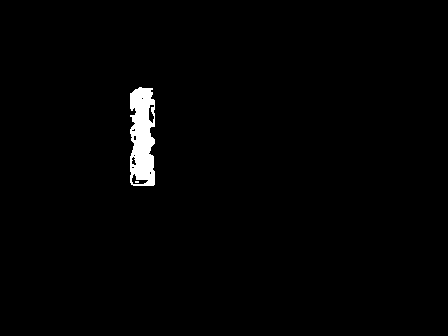

255
Image similarity: 0.9693070089556957


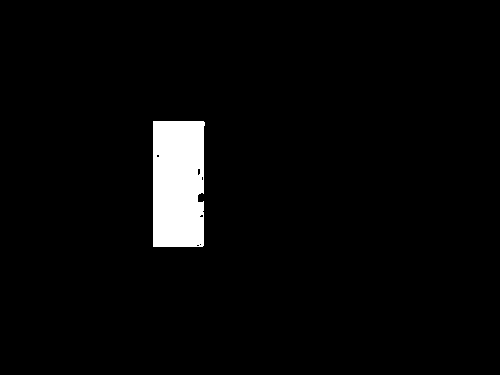

255
Image similarity: 0.9248585394249601


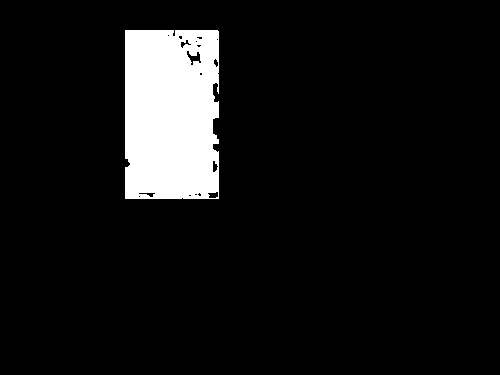

255
Image similarity: 0.9818684388612041


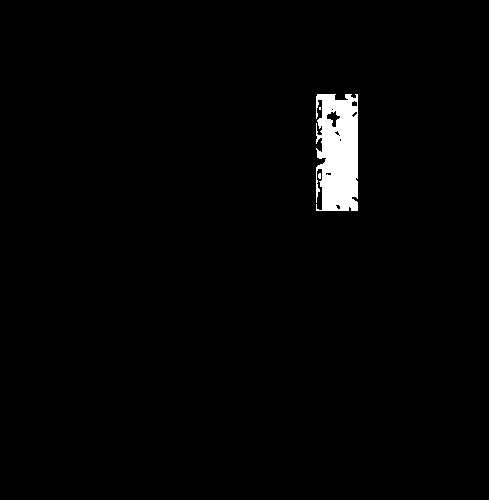

255
Image similarity: 0.9544343697544211


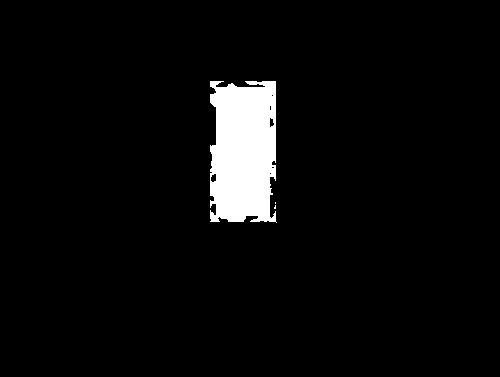

255
Image similarity: 0.9812462731035907


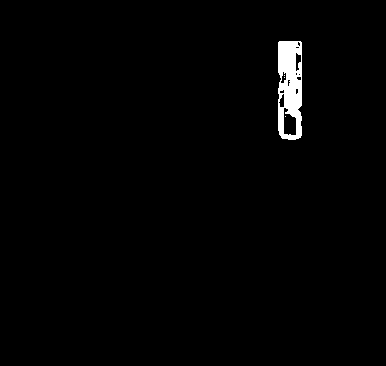

255
Image similarity: 0.9258820812862674


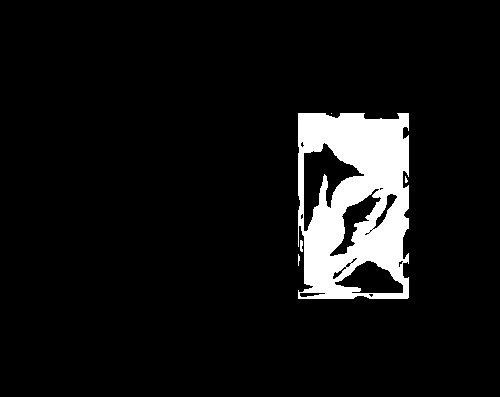

255
Image similarity: 0.9847291751279547


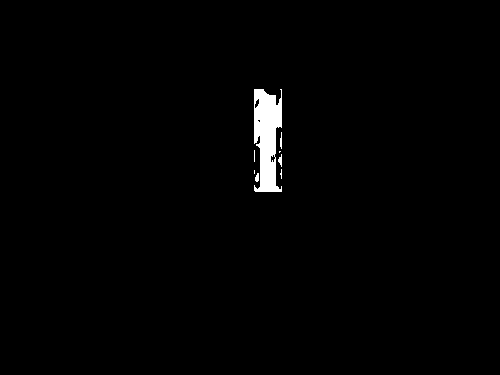

255
Image similarity: 0.874262266516476


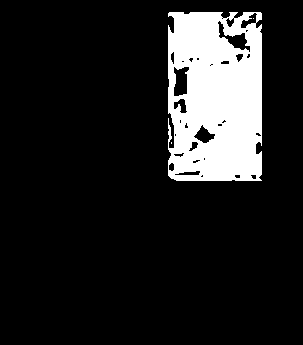

255
Image similarity: 0.9432593574346003


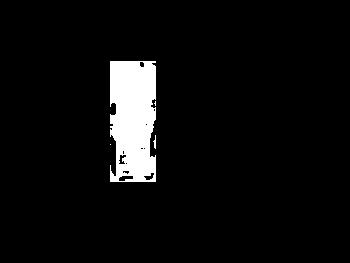

255
Image similarity: 0.989645263928654


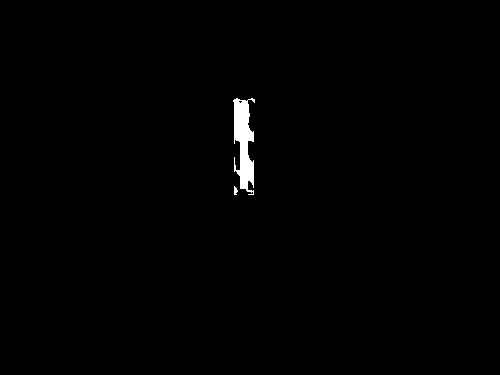

255
Image similarity: 0.7953303036503998


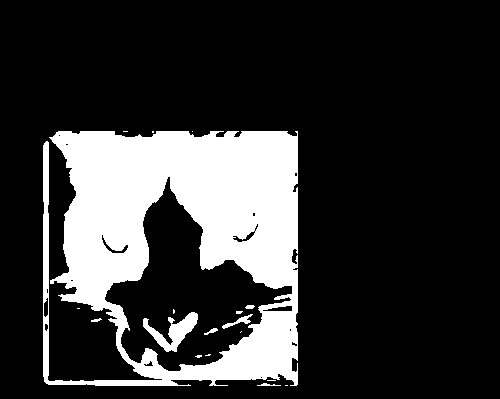

255
Image similarity: 0.9468923412138894


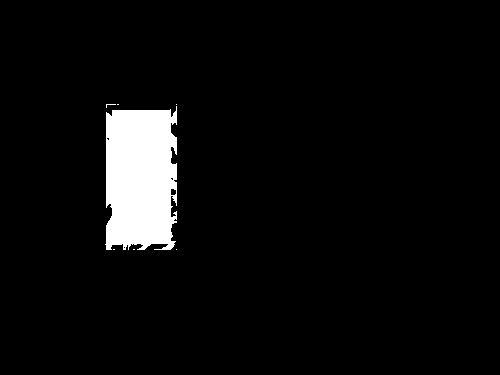

255
Image similarity: 0.9705191873962207


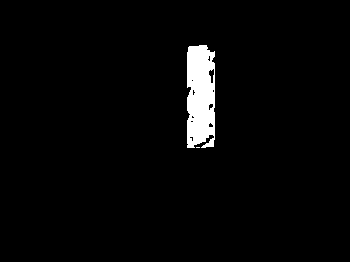

255
Image similarity: 0.9647585398555809


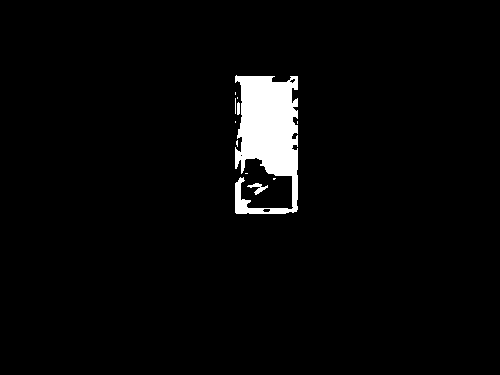

255
Image similarity: 0.9817094300251342


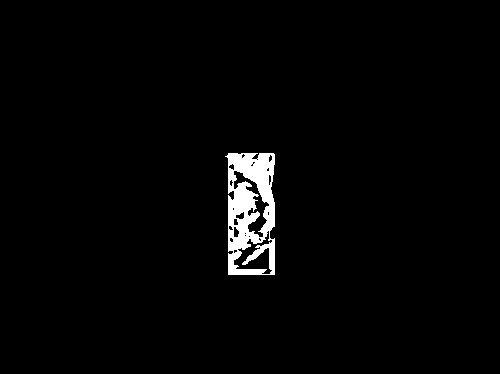

255
Image similarity: 0.9857414579141578


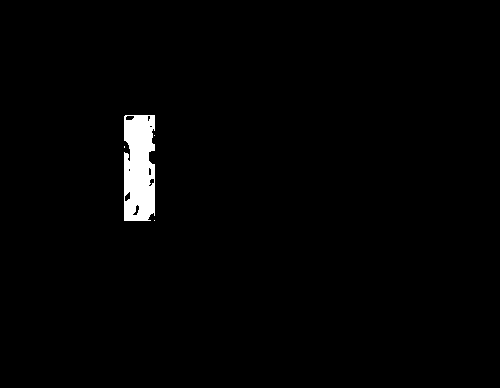

255
Image similarity: 0.8838774132385089


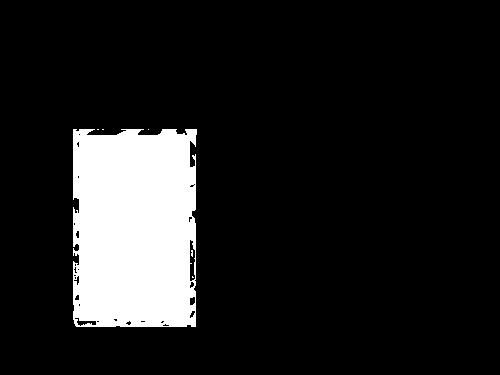

255
Image similarity: 0.9769526496189447


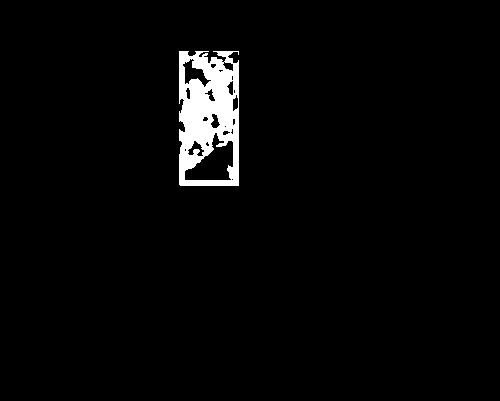

255
Image similarity: 0.8929394250622695


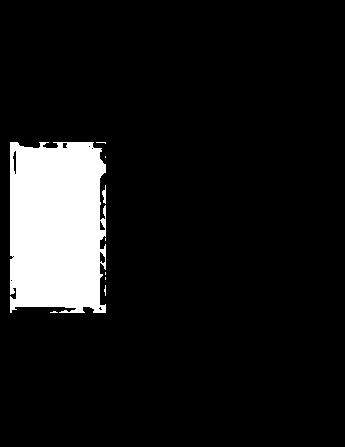

255
Image similarity: 0.9902211356676721


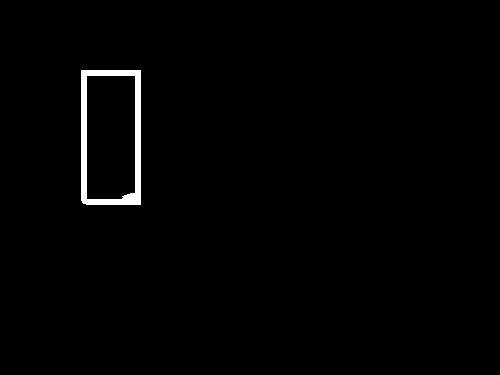

255
Image similarity: 0.9163740744624839


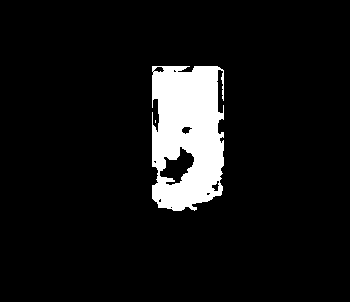

255
Image similarity: 0.9776671396424729


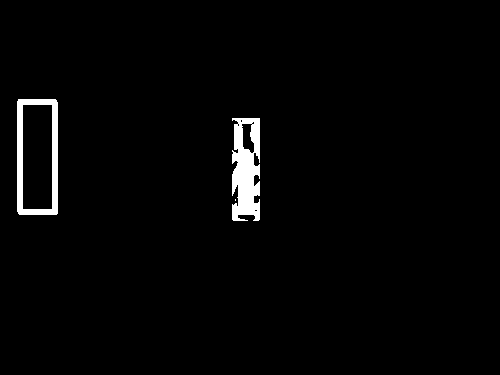

255
Image similarity: 0.988779750062838


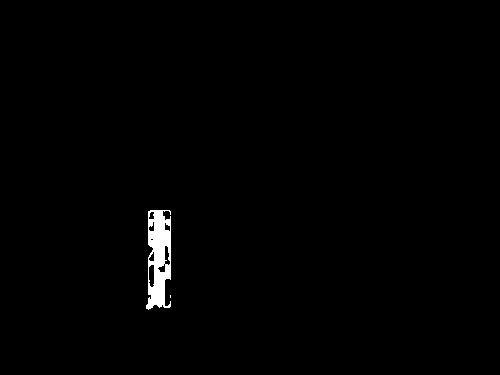

255
Image similarity: 0.9325242581547006


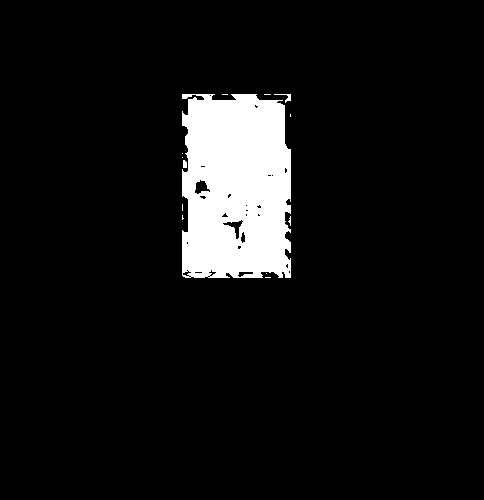

255
Image similarity: 0.9788181103953708


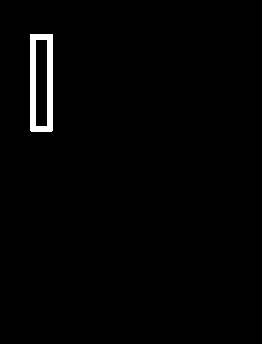

255
Image similarity: 0.9916364791526083


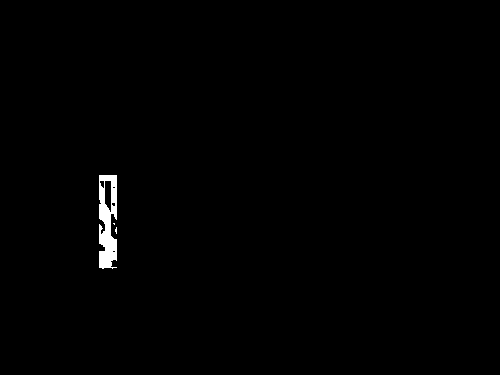

255
Image similarity: 0.9577901319659728


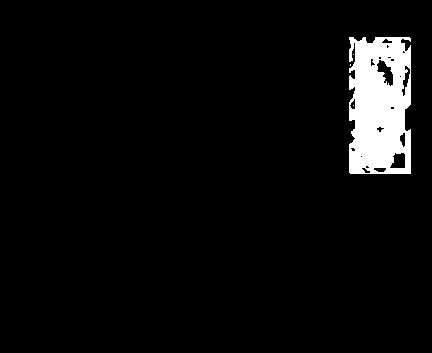

255
Image similarity: 0.9440172662258065


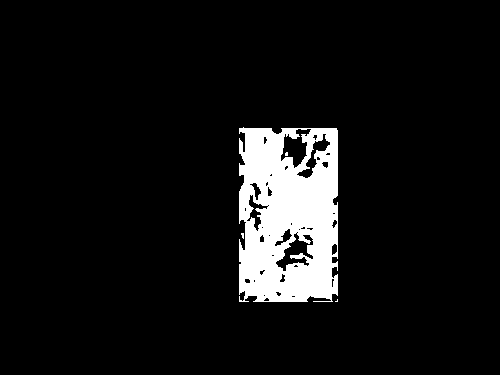

255
Image similarity: 0.9620983295388482


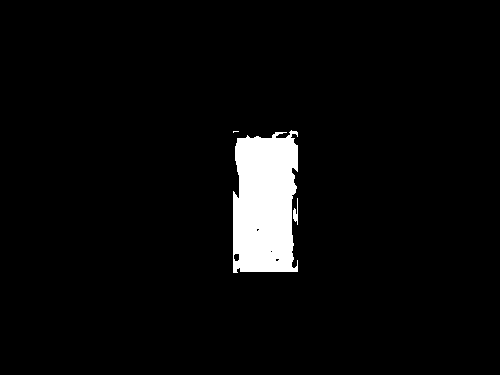

255
Image similarity: 0.9874734513723633


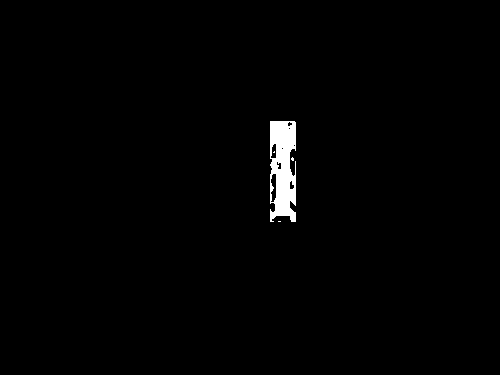

255
Image similarity: 0.9530257499743953


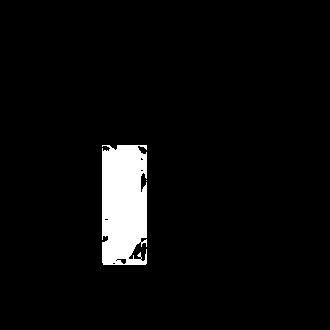

255
Image similarity: 0.9833947818407551


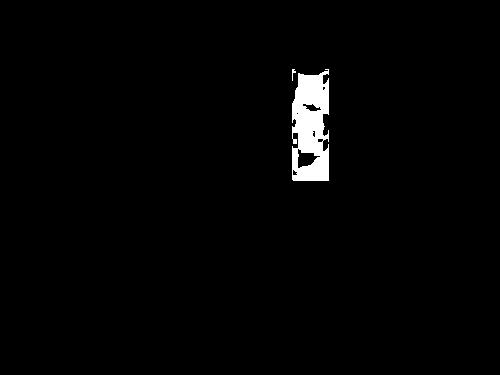

255
Image similarity: 0.9428154302155892


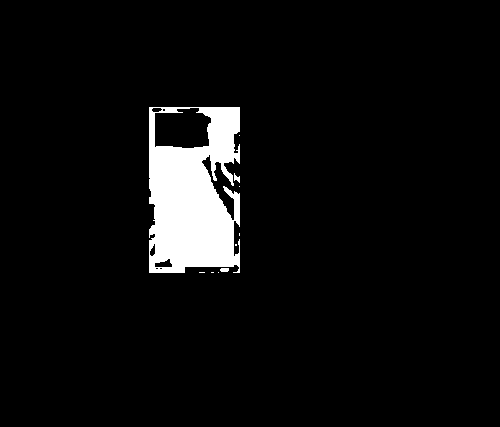

255
Image similarity: 0.9473371055572406


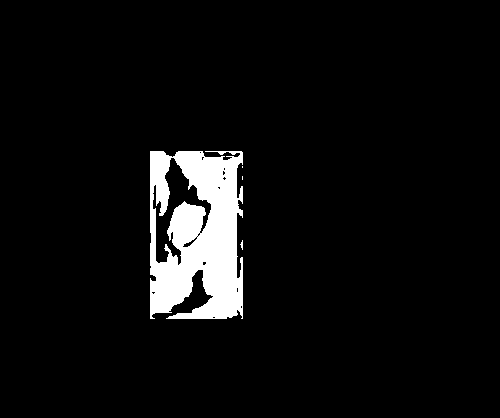

255
Image similarity: 0.9863478568399743


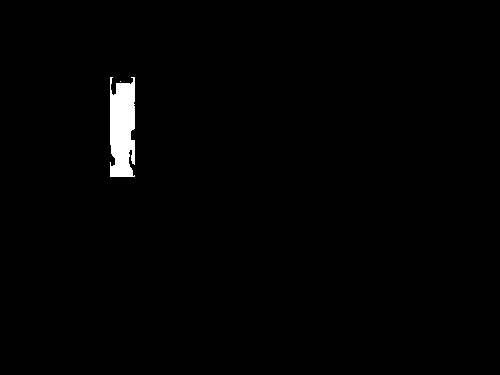

255
Image similarity: 0.974068463455482


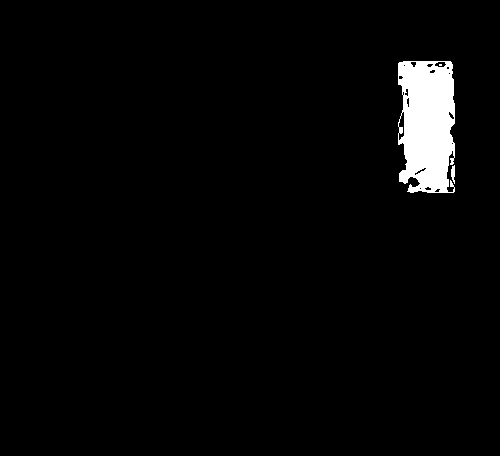

255
Image similarity: 0.8763932743063819


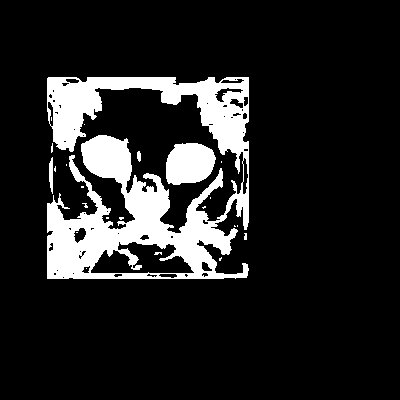

255
Image similarity: 0.8578832935639863


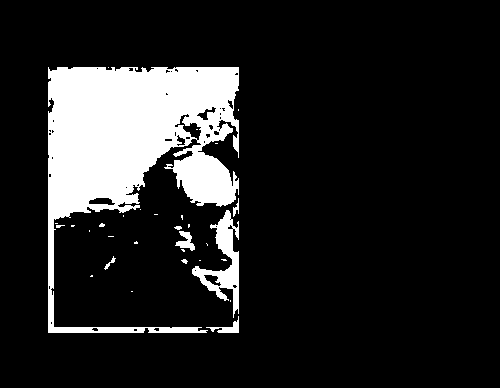

255
Image similarity: 0.9472651423710418


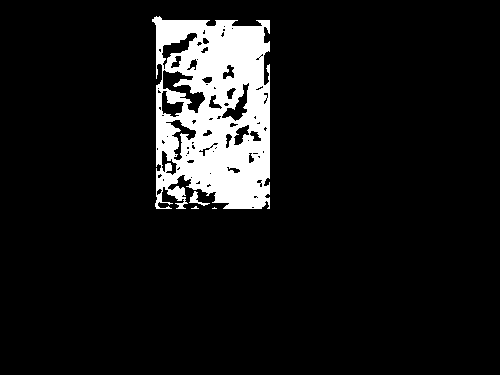

255
Image similarity: 0.8716865351403051


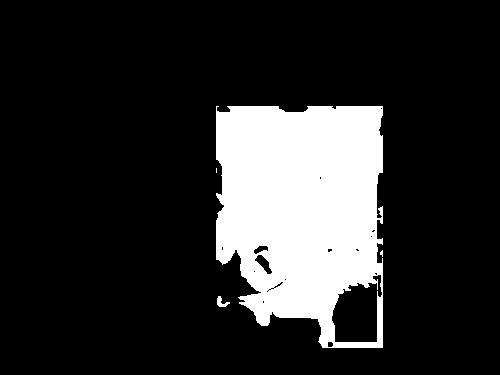

255
Image similarity: 0.9830245636457018


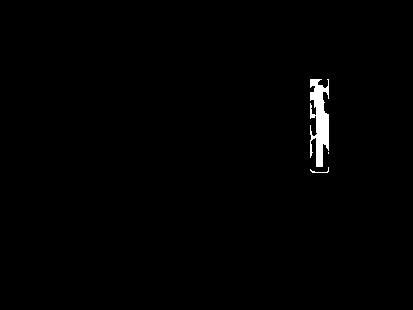

255
Image similarity: 0.9221832374064596


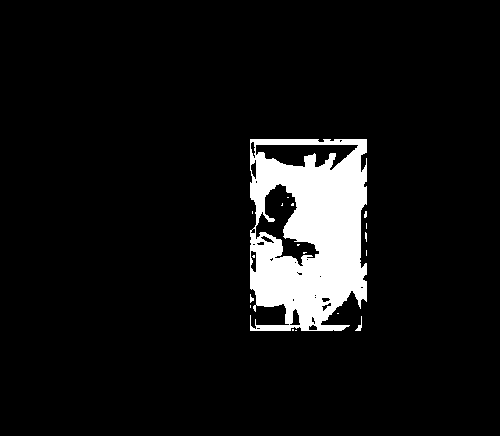

255
Image similarity: 0.9782834736797311


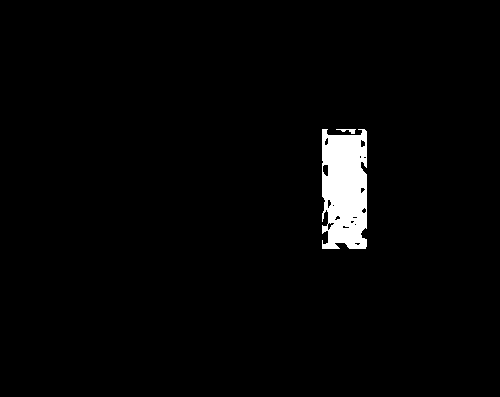

255
Image similarity: 0.9749801352513999


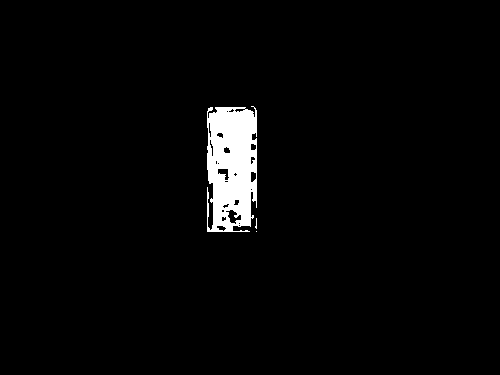

255
Image similarity: 0.876576179216014


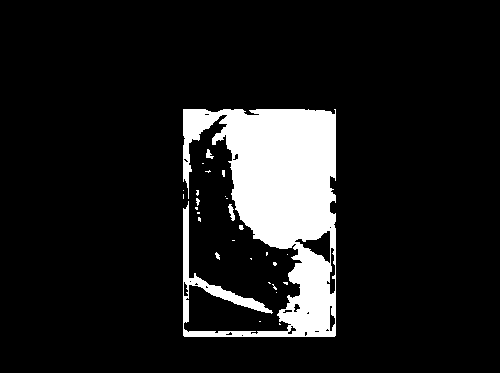

255
Image similarity: 0.9506821959908928


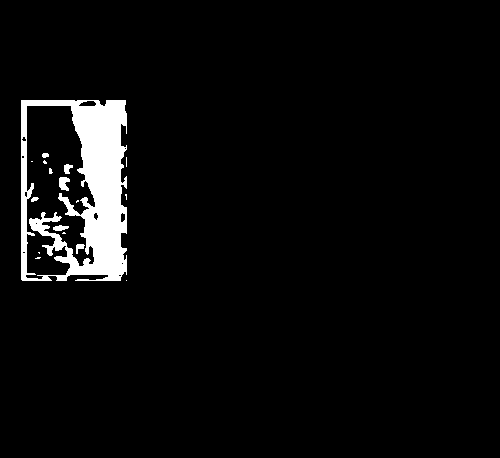

255
Image similarity: 0.8604531980597052


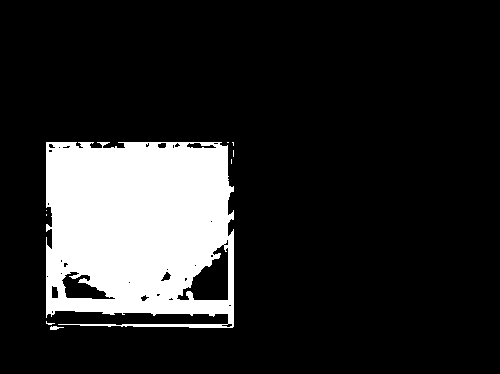

255
Image similarity: 0.9478200881821685


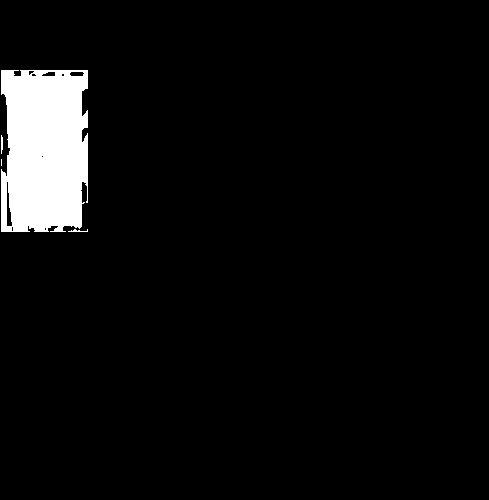

255
Image similarity: 0.8673630477140417


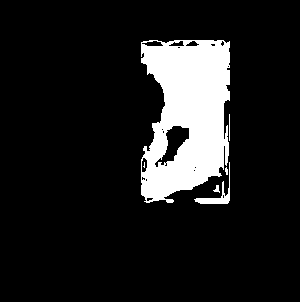

255
Image similarity: 0.8118494960889283


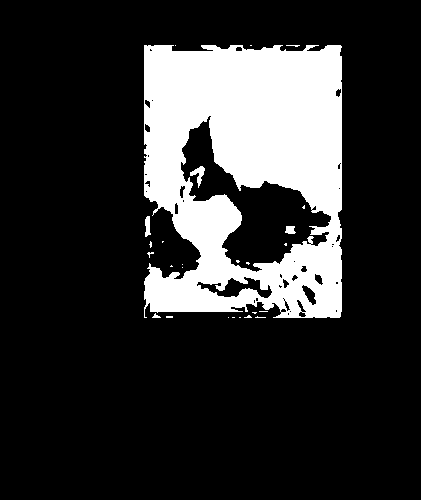

255
Image similarity: 0.9859348504249718


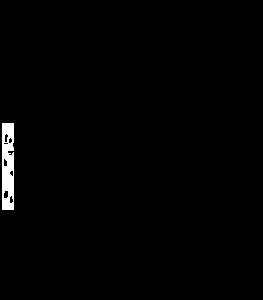

255
Image similarity: 0.7507923604333427


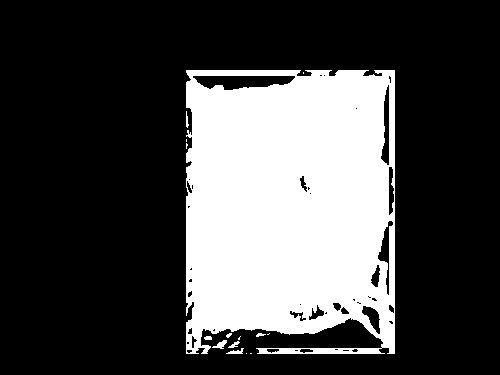

255
Image similarity: 0.7196650590439274


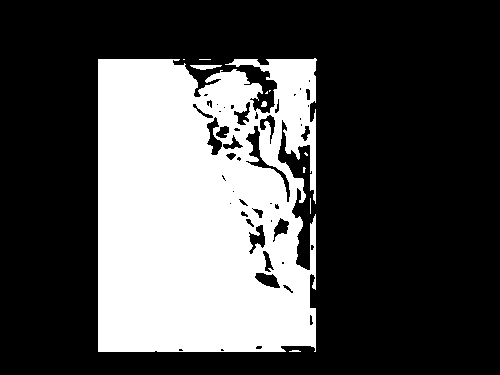

255
Image similarity: 0.807538063086124


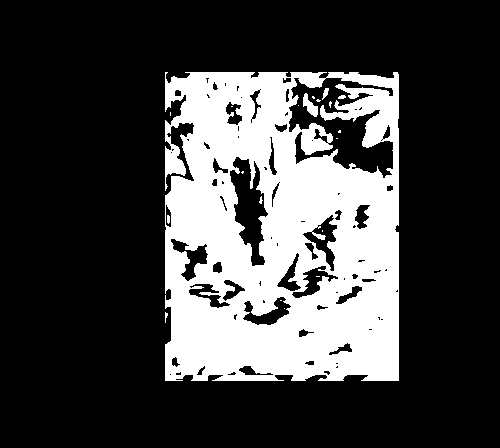

255
Image similarity: 0.9760470253023255


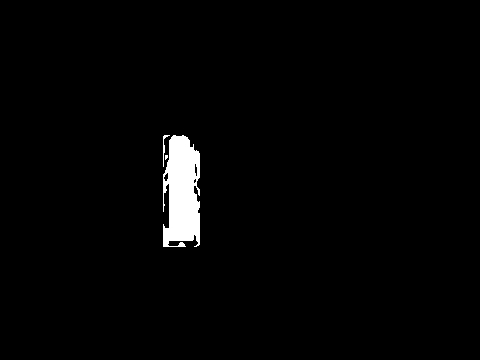

255
Image similarity: 0.9910707776304745


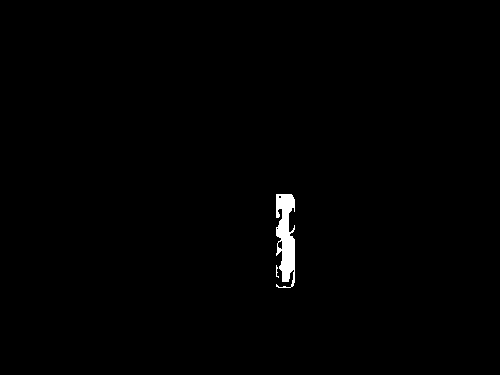

255
Image similarity: 0.9580620441179197


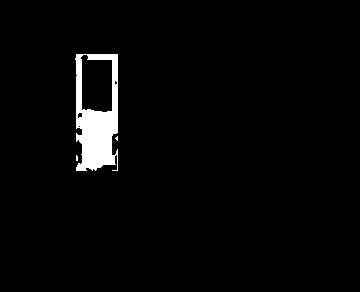

255
Image similarity: 0.8397398407577483


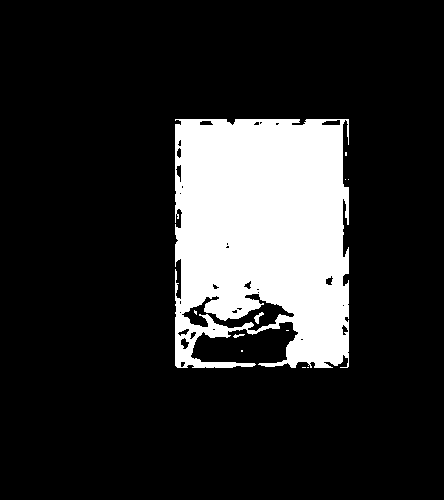

255
Image similarity: 0.9653395894865828


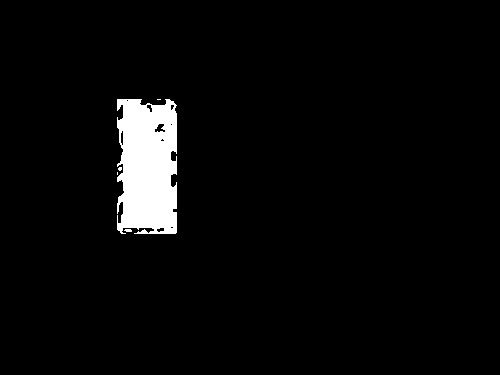

255
Image similarity: 0.95712293355247


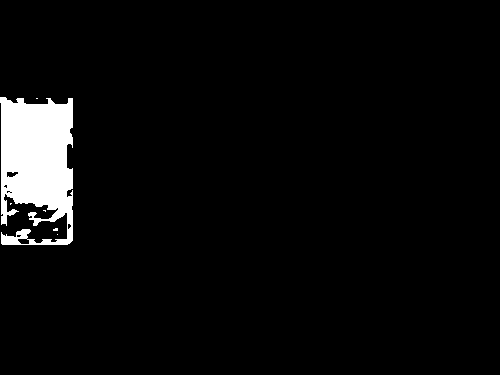

255
Image similarity: 0.9920437032392191


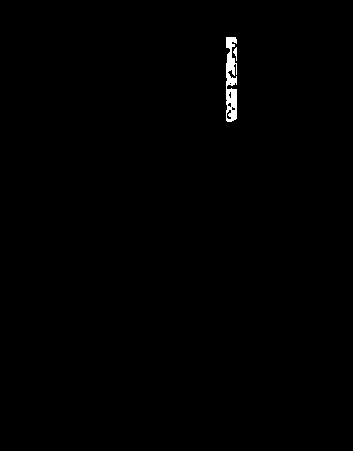

255
Image similarity: 0.9602550631213029


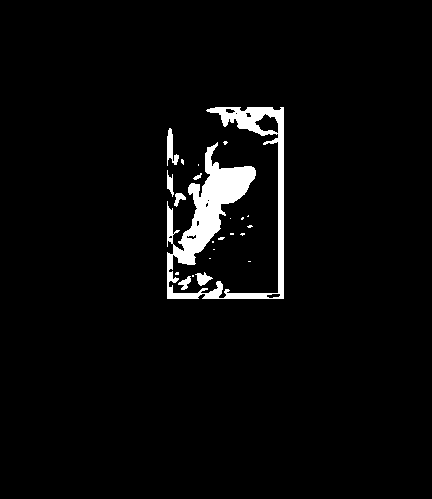

255
Image similarity: 0.9938399777599304


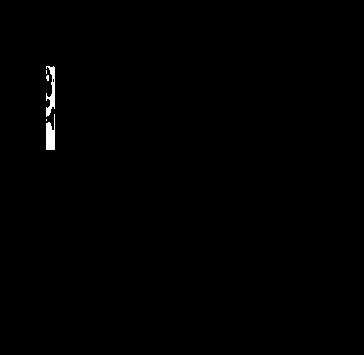

255
Image similarity: 0.982159691486028


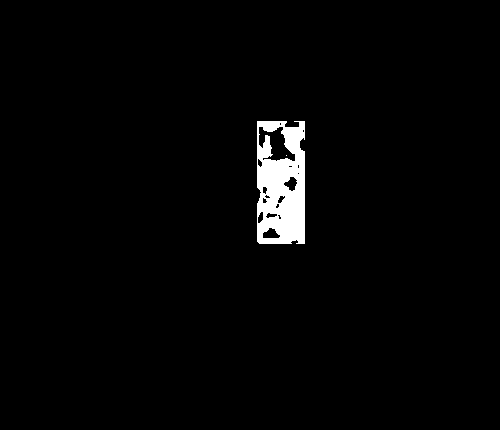

255
Image similarity: 0.8089328675607128


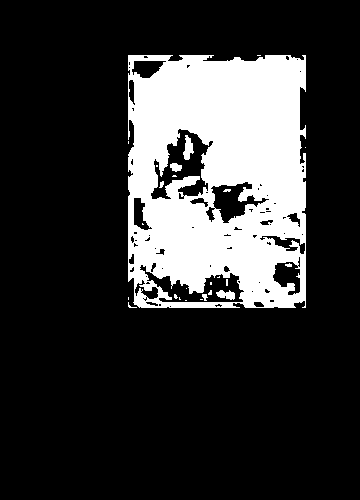

255
Image similarity: 0.9669028181684857


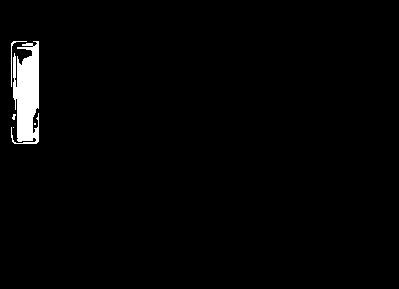

255
Image similarity: 0.9790958270403846


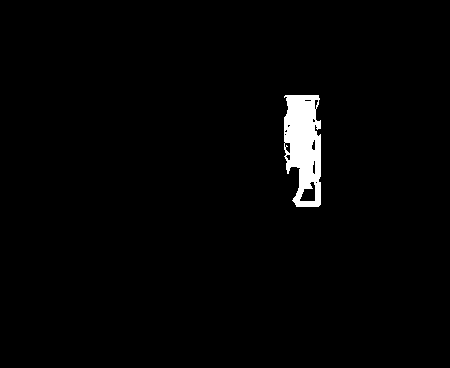

255
Image similarity: 0.949661258809636


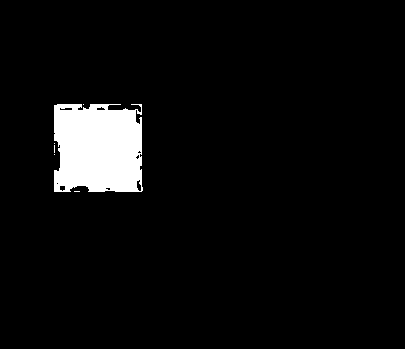

255
Image similarity: 0.9054687388248298


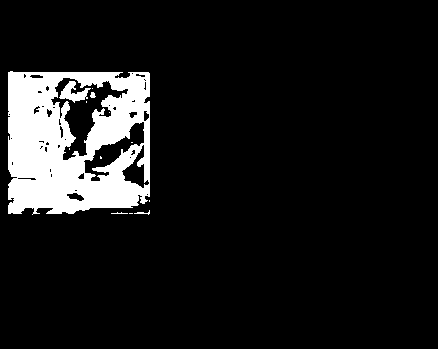

255
Image similarity: 0.908061750020512


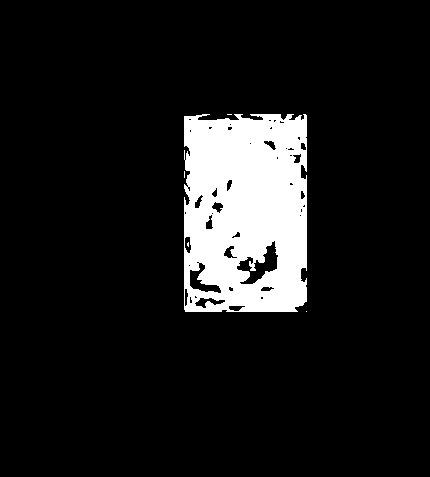

255
Image similarity: 0.9730682927076477


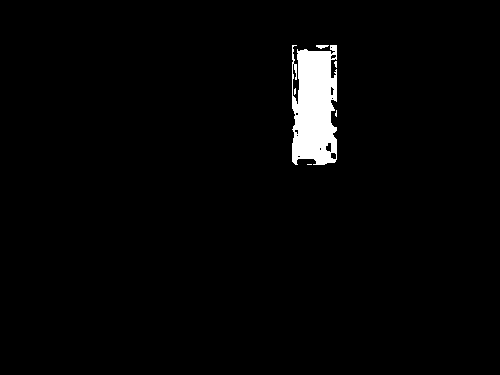

255
Image similarity: 0.9629159944147863


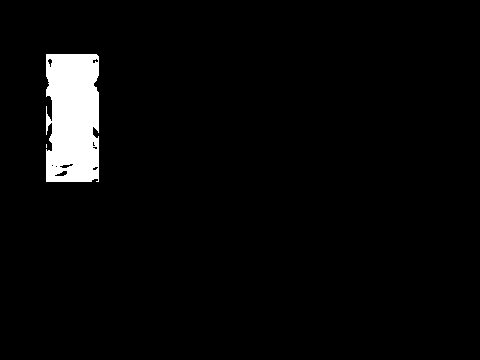

255
Image similarity: 0.9820578727450493


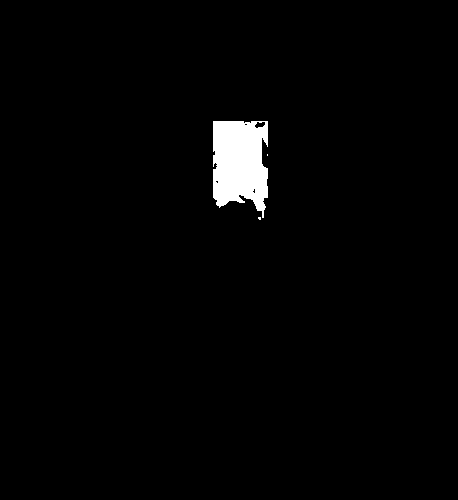

255
Image similarity: 0.9690936773562348


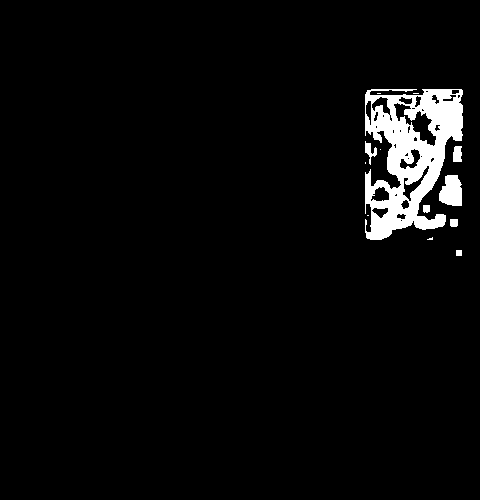

255
Image similarity: 0.9748724051015378


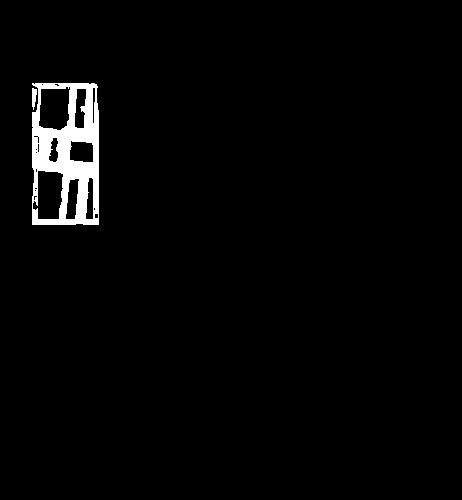

255
Image similarity: 0.978916688588646


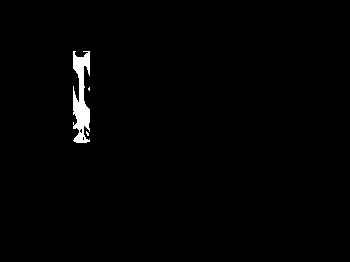

255
Image similarity: 0.9083890368210071


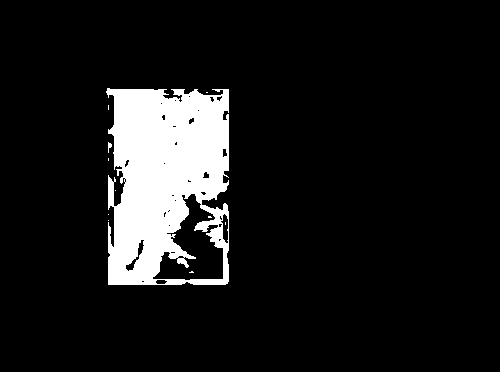

255
Image similarity: 0.8982881627143641


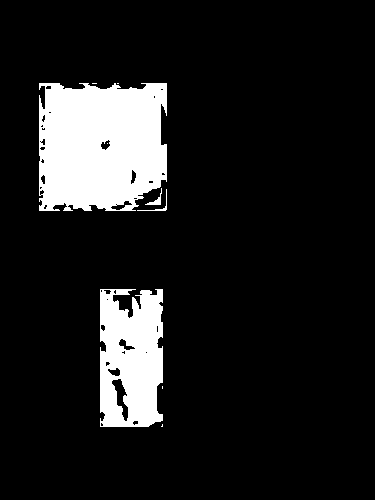

255
Image similarity: 0.904979337202393


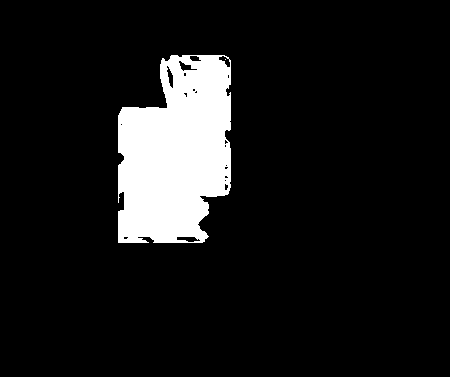

255
Image similarity: 0.9170041014046091


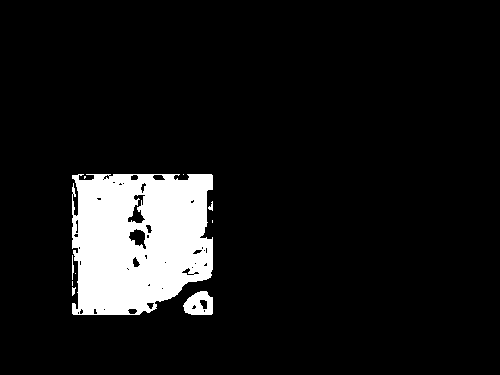

255
Image similarity: 0.9728847409205482


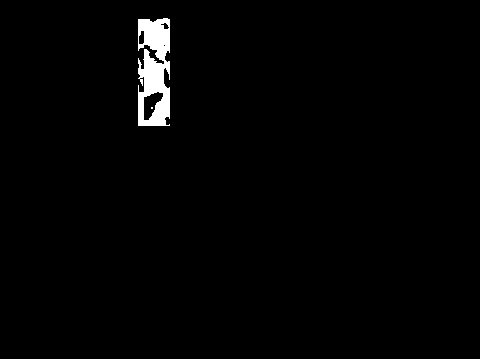

255
Image similarity: 0.9108660711499236


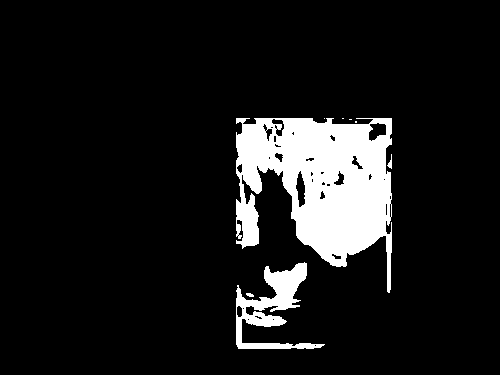

255
Image similarity: 0.9805526607160975


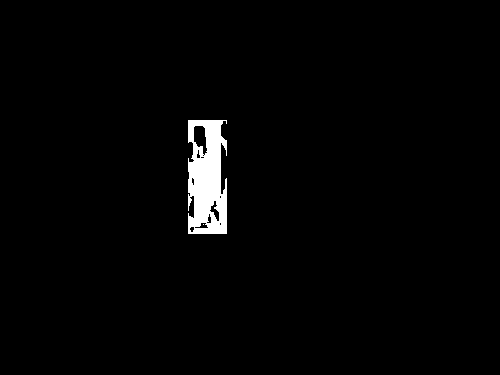

255
Image similarity: 0.8830794125738116


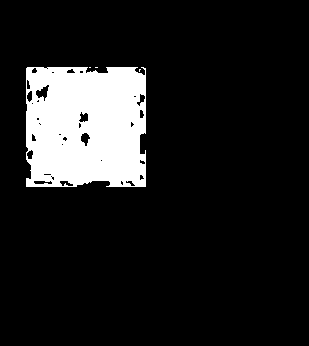

255
Image similarity: 0.8185331816151024


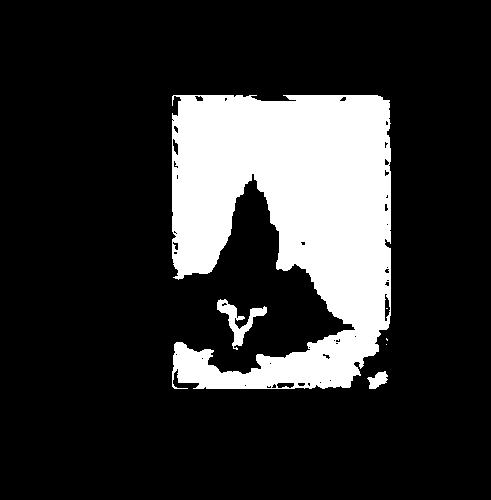

255
Image similarity: 0.9493417945564647


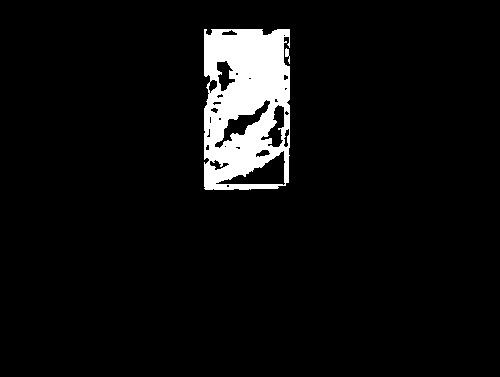

255
Image similarity: 0.9347621476723083


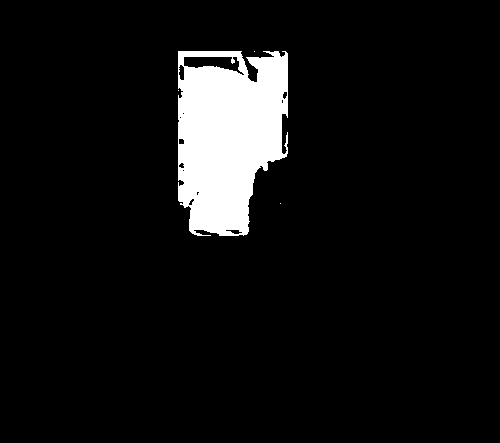

255
Image similarity: 0.907720655529751


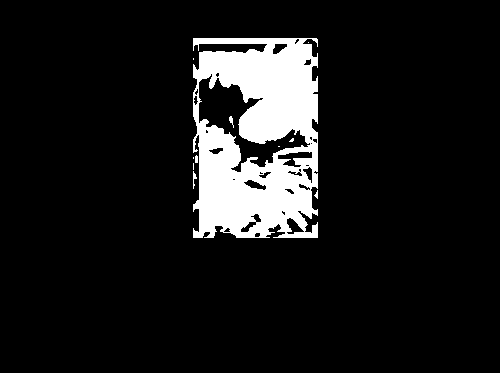

255
Image similarity: 0.9905843289421907


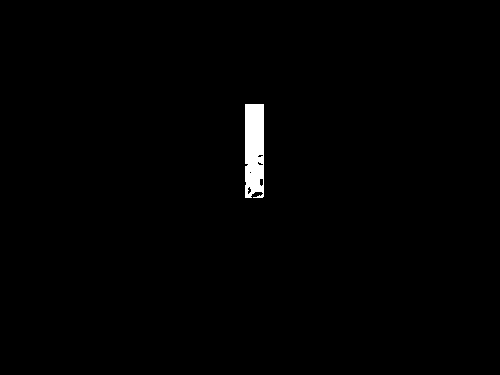

255
Image similarity: 0.7721929989364977


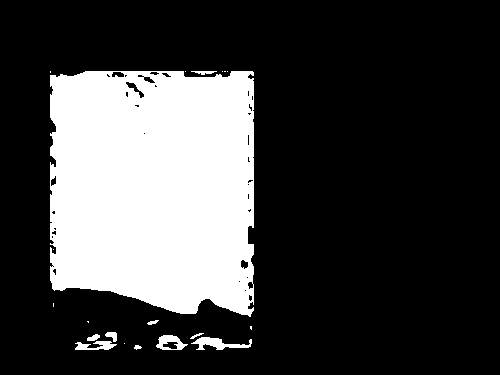

255
Image similarity: 0.9439910698875766


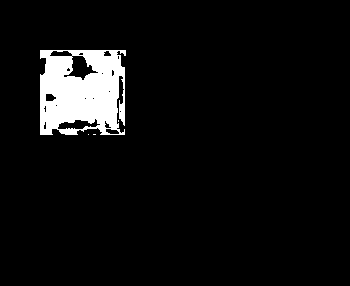

255
Image similarity: 0.986093737809386


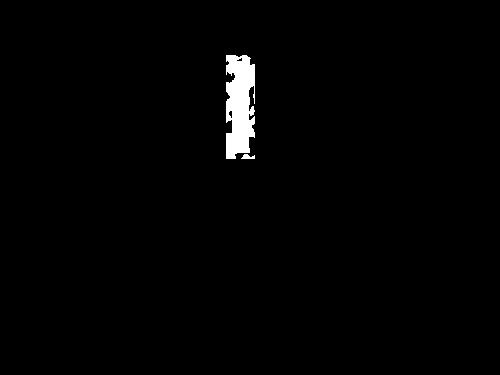

255
Image similarity: 0.8783142065419629


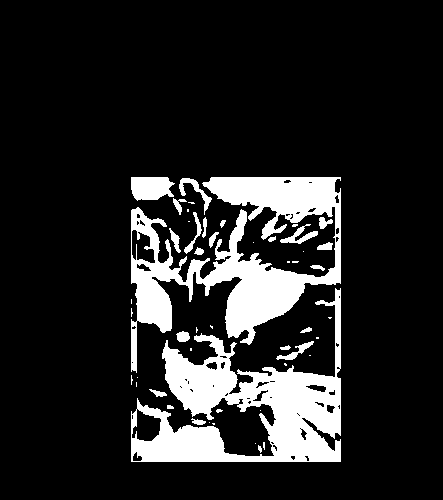

255
Image similarity: 0.9237942399312599


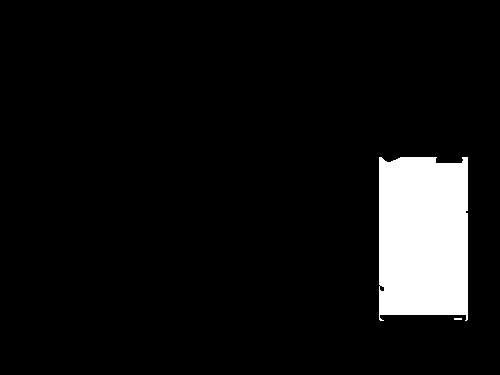

255
Image similarity: 0.8003041248170715


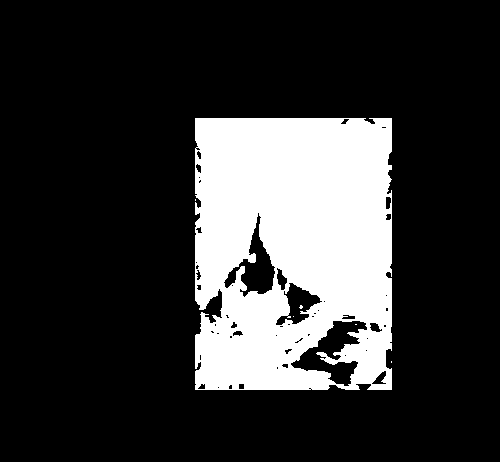

255
Image similarity: 0.9895913447779054


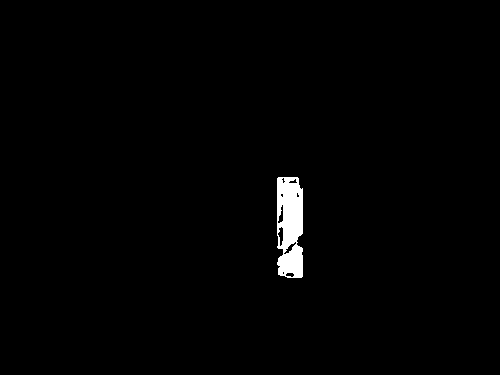

255
Image similarity: 0.9907675240798417


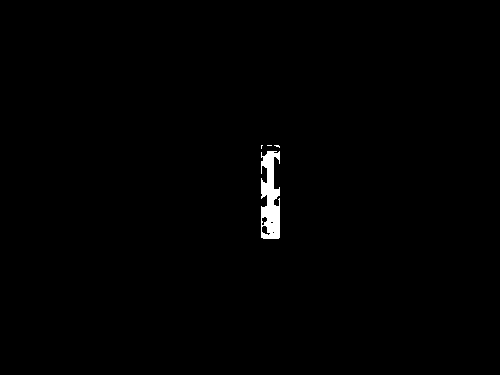

255
Image similarity: 0.9748209980319497


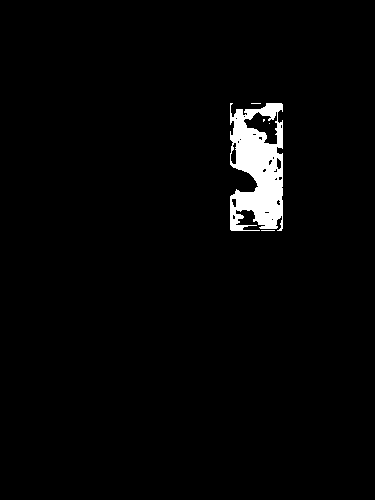

255
Image similarity: 0.971664799732779


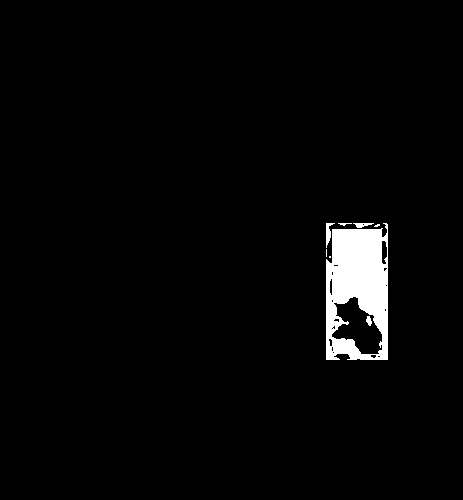

255
Image similarity: 0.995682501482674


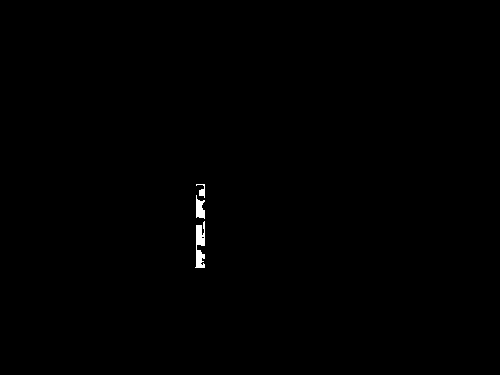

255
Image similarity: 0.9260658425203283


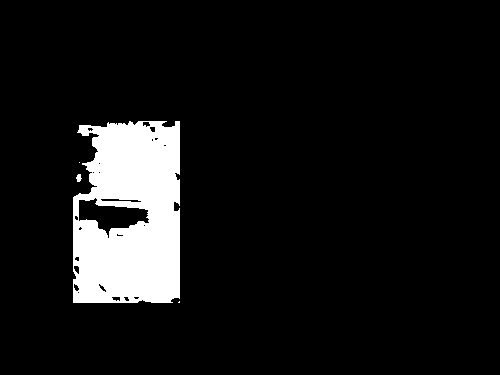

255
Image similarity: 0.9726369976136553


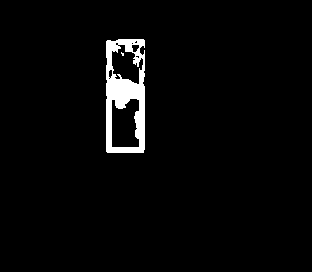

255
Image similarity: 0.9857696781108282


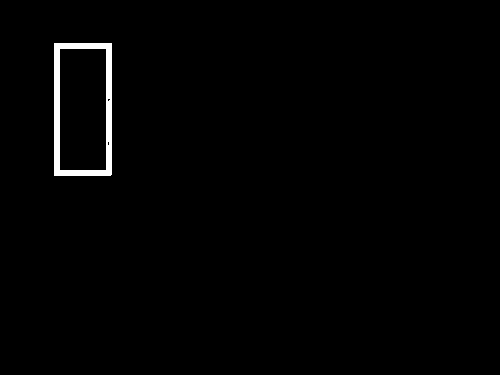

255
Image similarity: 0.9321330905397843


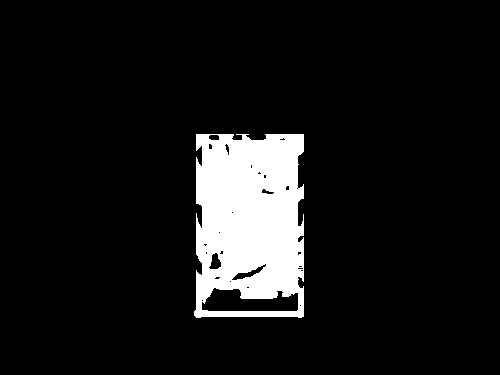

255
Image similarity: 0.985177030752969


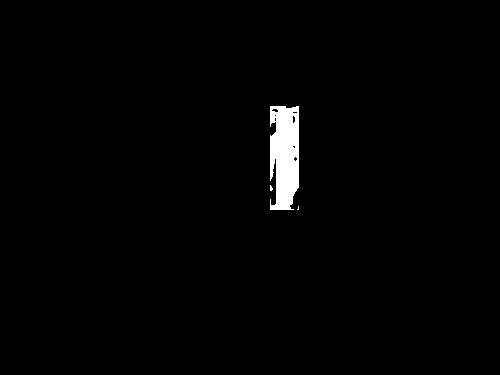

255
Image similarity: 0.9366367105420631


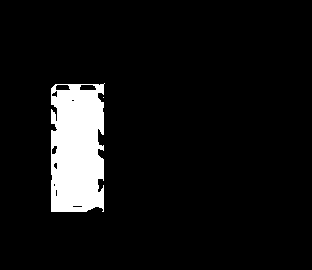

255
Image similarity: 0.9861532734436214


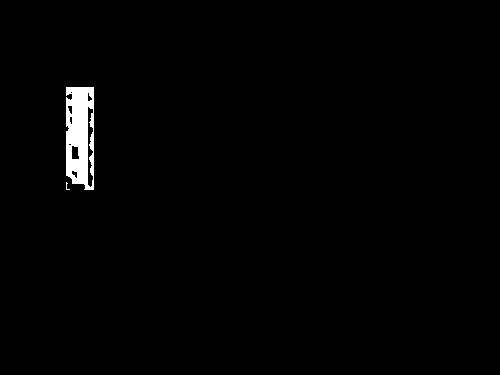

255
Image similarity: 0.9650562544036649


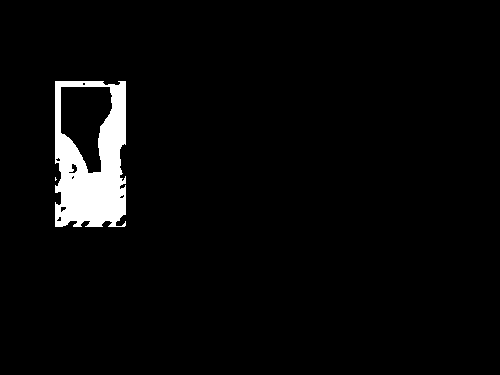

255
Image similarity: 0.9891613751938368


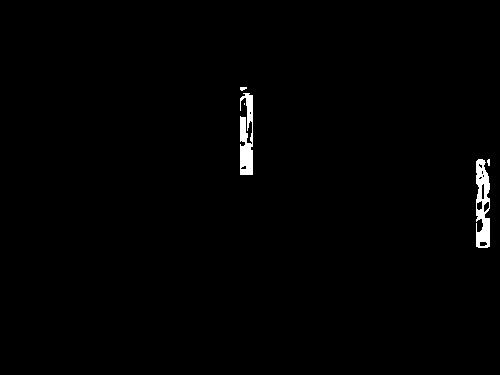

255
Image similarity: 0.9774803031141949


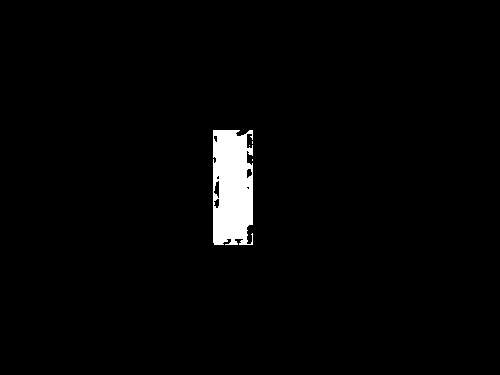

255
Image similarity: 0.9283350457027831


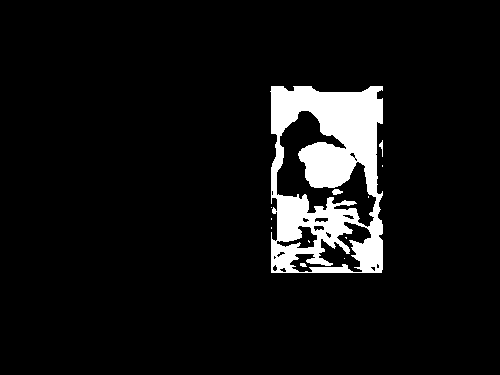

255
Image similarity: 0.9694518644173566


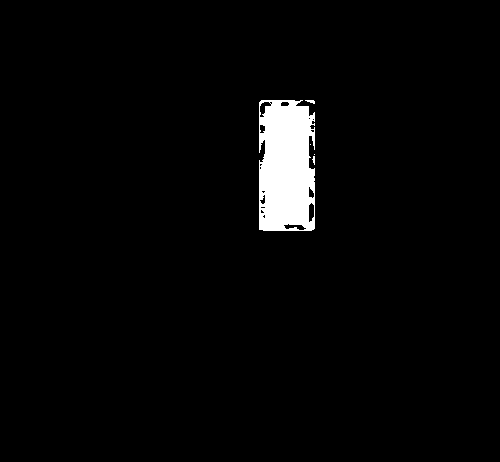

255
Image similarity: 0.9784748869276582


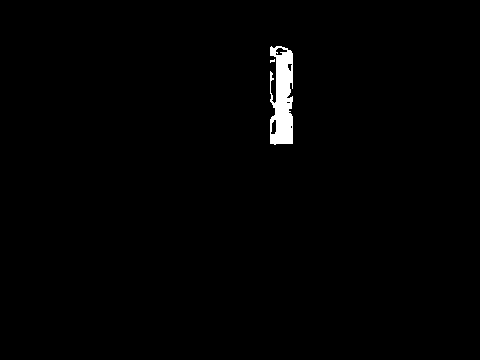

255
Image similarity: 0.9282148139279297


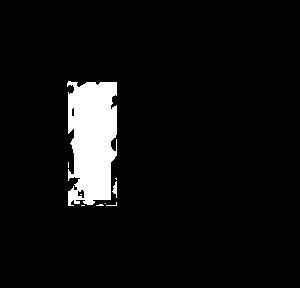

255
Image similarity: 0.9454479404037113


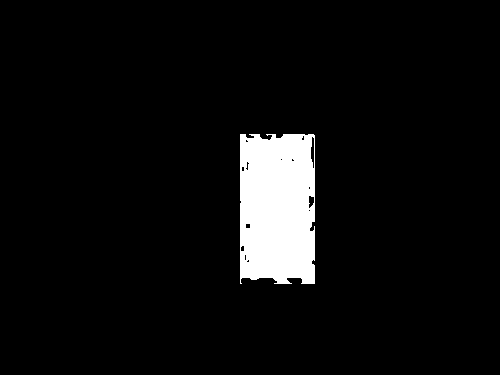

255
Image similarity: 0.9855260108693399


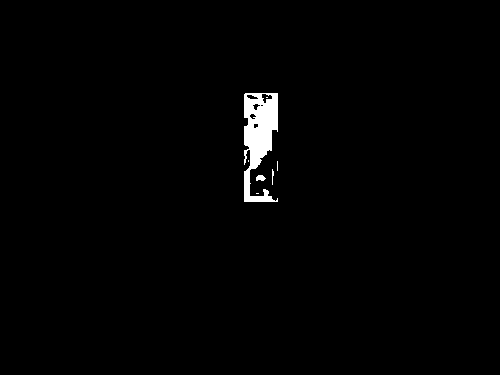

255
Image similarity: 0.9572533675560526


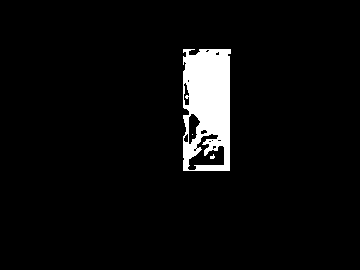

255
Image similarity: 0.959648804111112


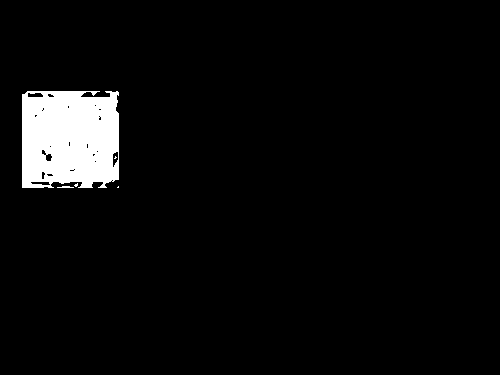

255
Image similarity: 0.9225317497087102


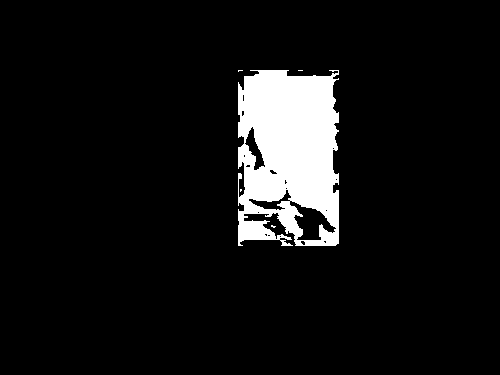

255
Image similarity: 0.9696776023238615


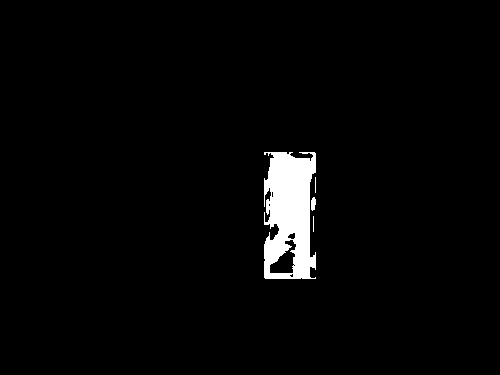

255
Image similarity: 0.9909800766599944


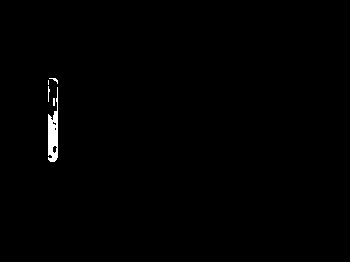

255
Image similarity: 0.7285340164091341


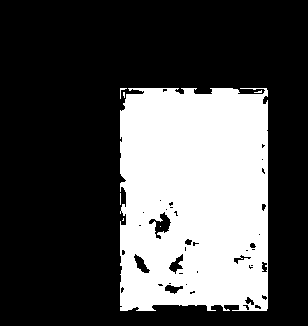

255
Image similarity: 0.6991719362220363


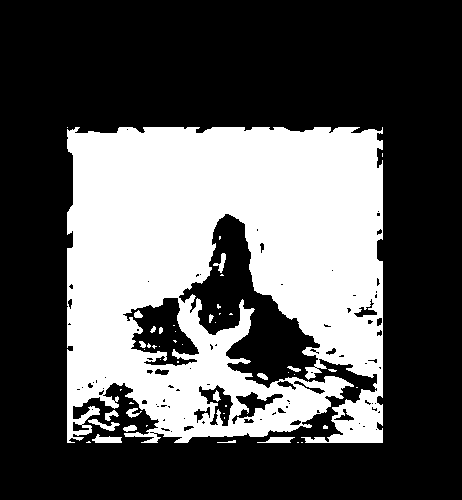

255
Image similarity: 0.9694299052548841


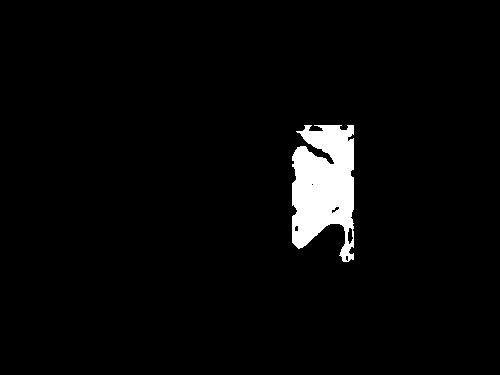

255
Image similarity: 0.928900547037237


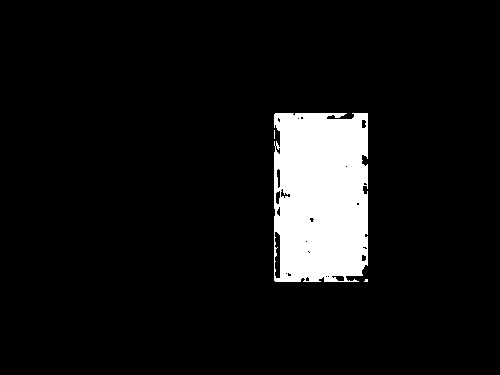

255
Image similarity: 0.9658888860214013


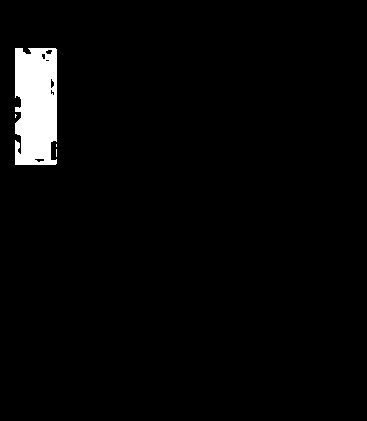

255
Image similarity: 0.9245495541194307


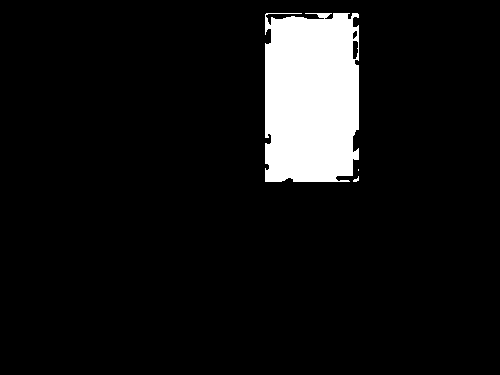

255
Image similarity: 0.9035635271519453


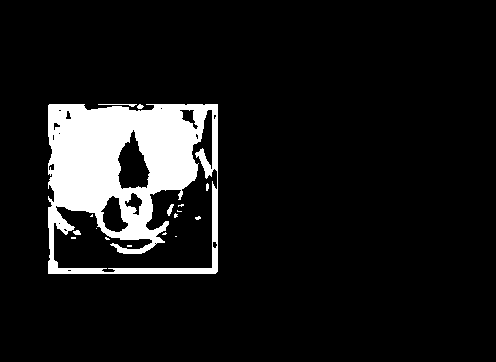

255
Image similarity: 0.982395902169391


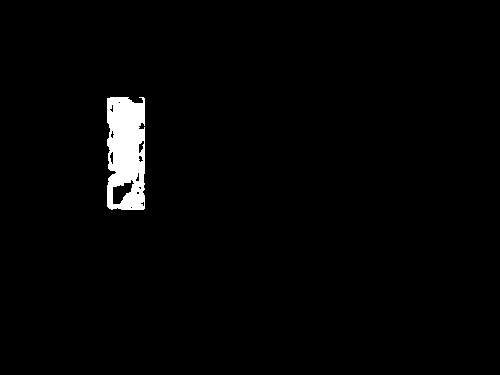

255
Image similarity: 0.995157361737446


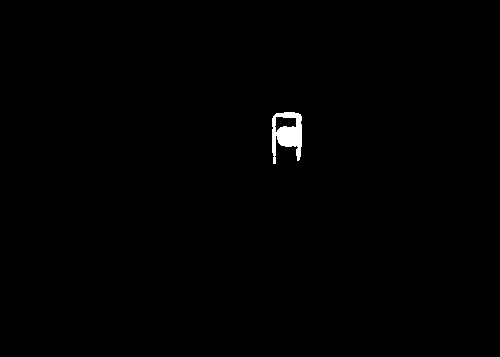

255
Image similarity: 0.8179456750916299


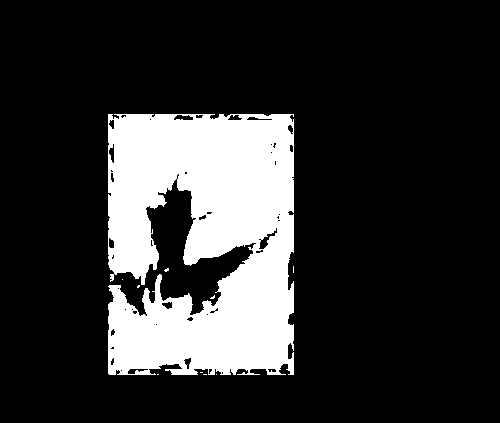

255
Image similarity: 0.9159291706220223


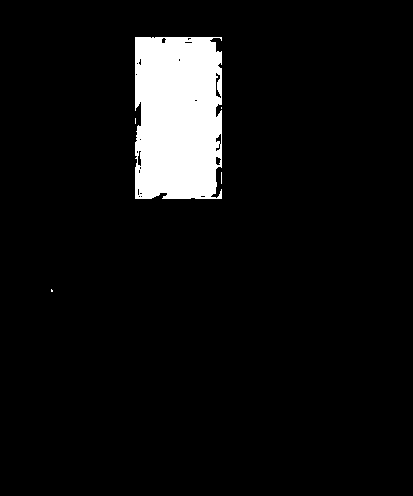

255
Image similarity: 0.9784212895883225


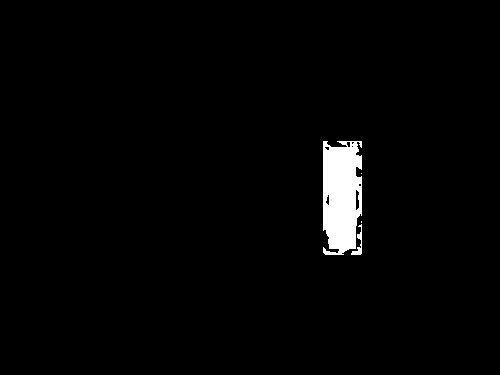

255
Image similarity: 0.9766154205953185


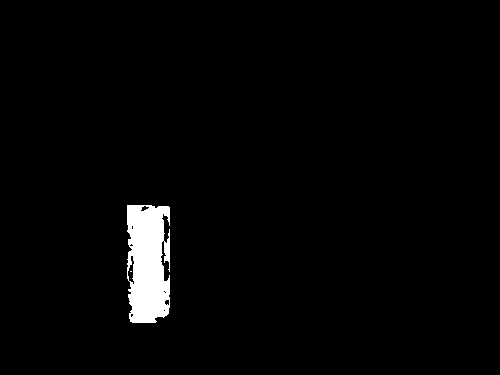

255
Image similarity: 0.8623288363765846


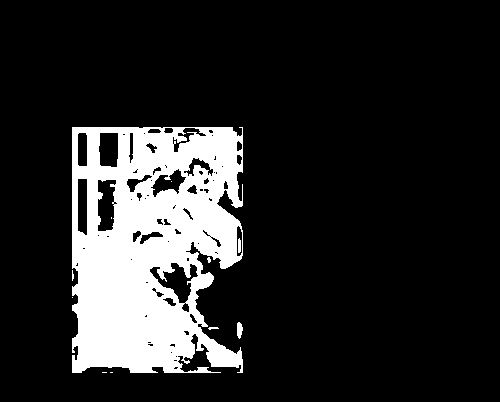

255
Image similarity: 0.9842973919131964


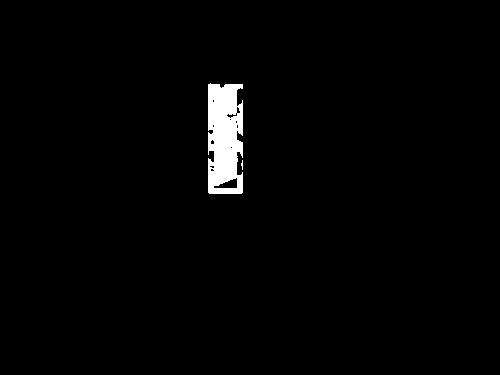

255
Image similarity: 0.9671599508461228


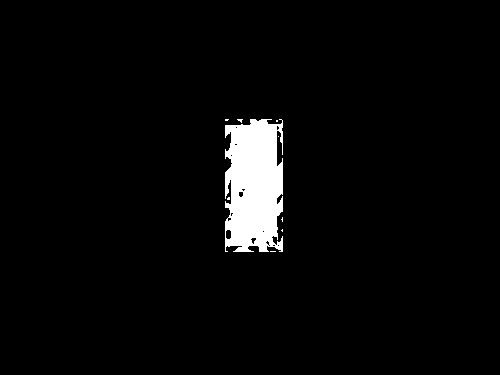

255
Image similarity: 0.9031123513535381


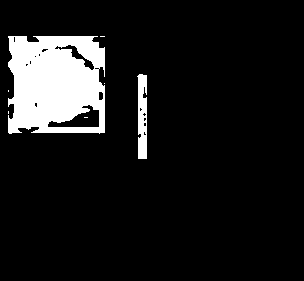

255
Image similarity: 0.9523222538435285


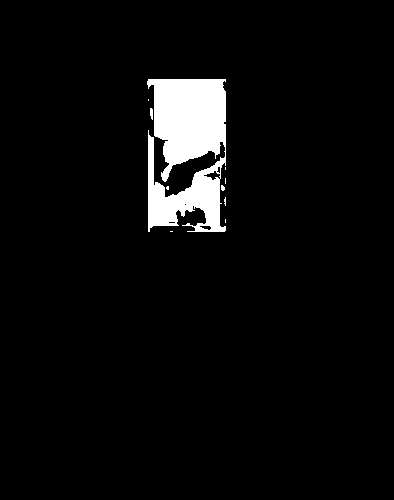

255
Image similarity: 0.9408348704831081


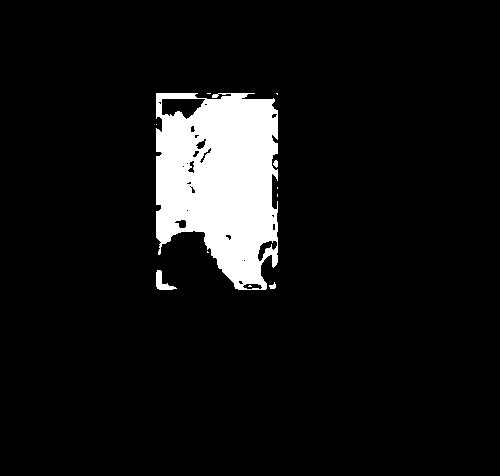

255
Image similarity: 0.9286022437557846


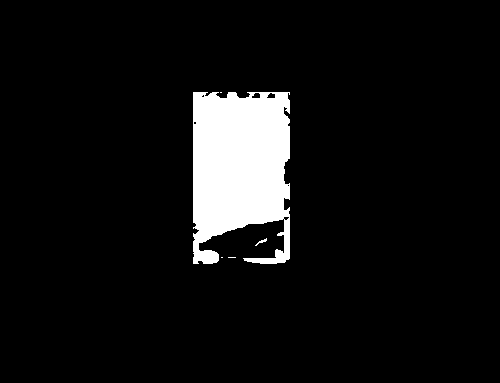

255
Image similarity: 0.9387659035769842


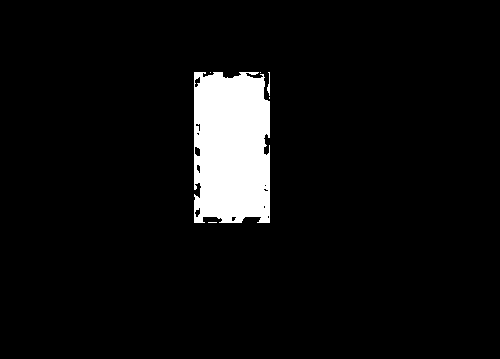

255
Image similarity: 0.8612266416613087


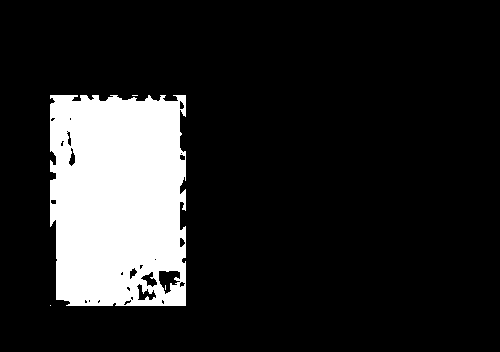

255
Image similarity: 0.842614201921801


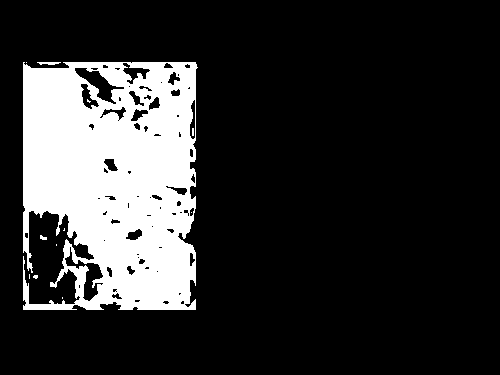

255
Image similarity: 0.9596107885266769


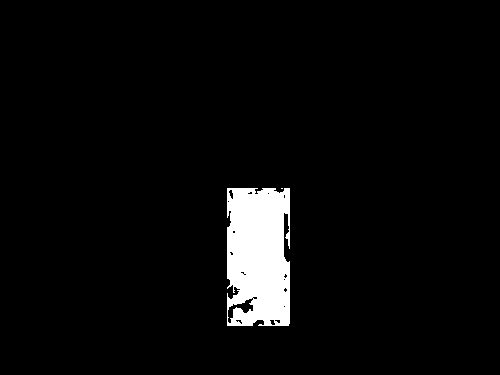

255
Image similarity: 0.9618223172125171


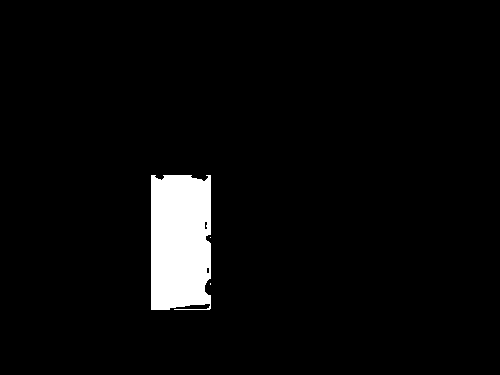

255
Image similarity: 0.992043896130395


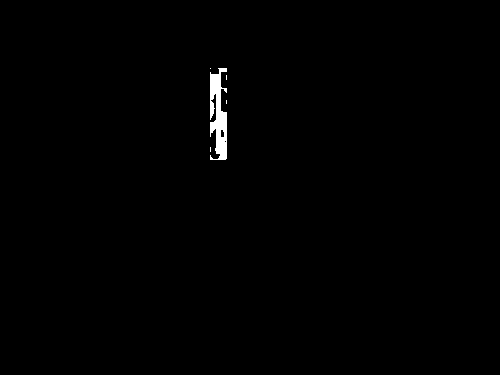

255
Image similarity: 0.9936668009633254


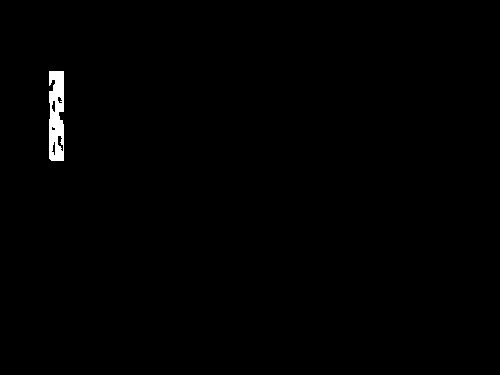

255
Image similarity: 0.9640790783759822


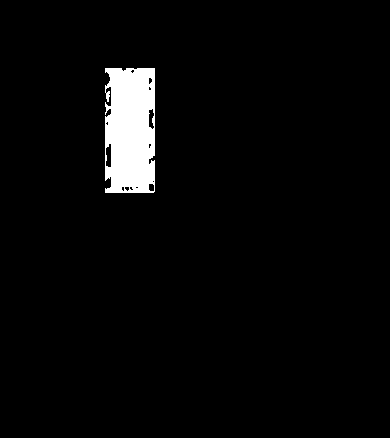

255
Image similarity: 0.9773771907449358


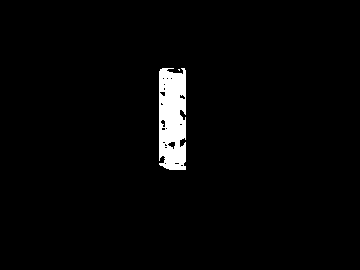

255
Image similarity: 0.9382470873663191


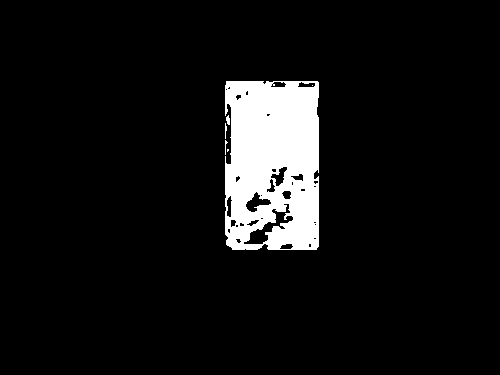

255
Image similarity: 0.8402940795383361


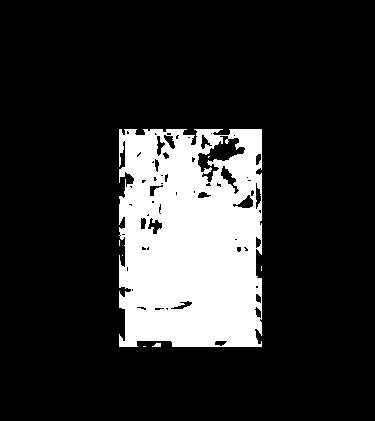

255
Image similarity: 0.8859733912882337


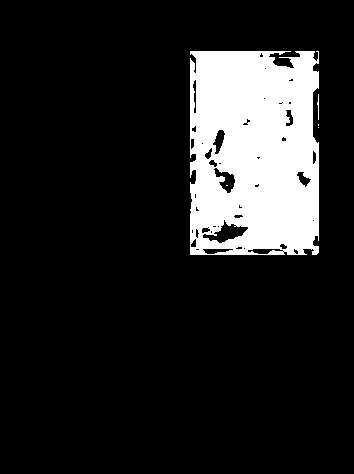

255
Image similarity: 0.9830688280698031


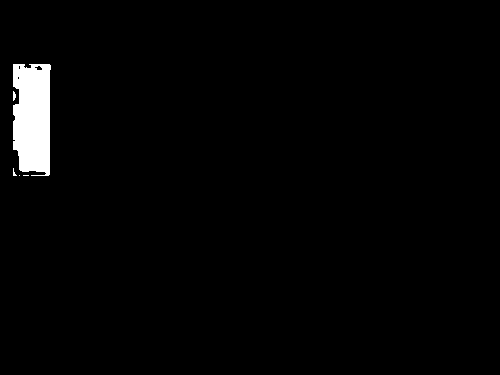

255
Image similarity: 0.988659372541254


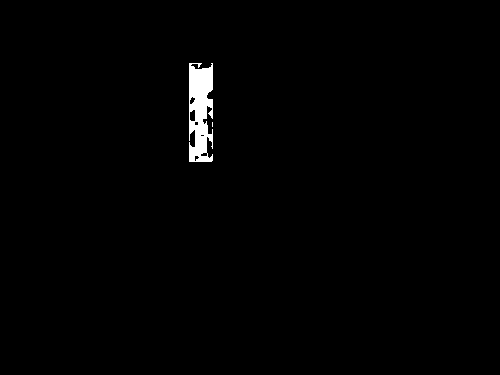

255
Image similarity: 0.6938774093068377


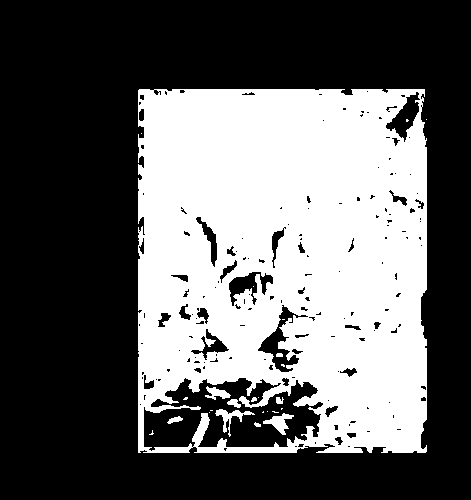

255
Image similarity: 0.9025693470402181


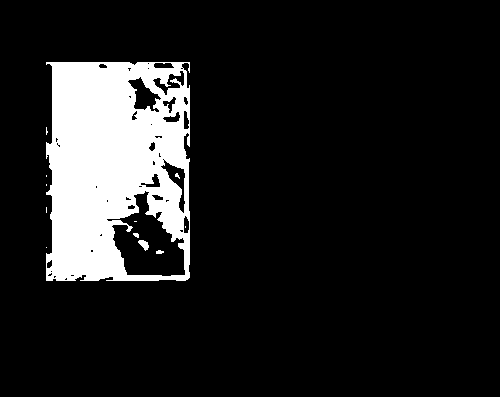

255
Image similarity: 0.8191114675158544


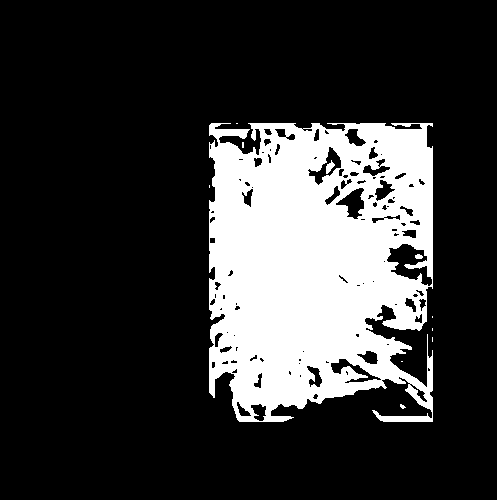

255
Image similarity: 0.9330125674127843


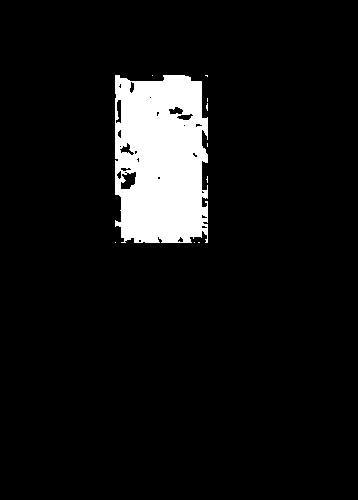

255
Image similarity: 0.9237742665523481


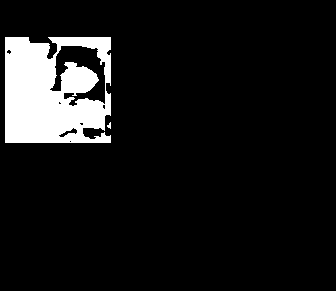

255
Image similarity: 0.9627197140160473


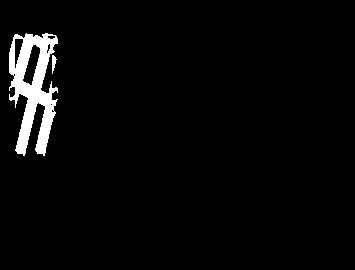

255
Image similarity: 0.9624669358305898


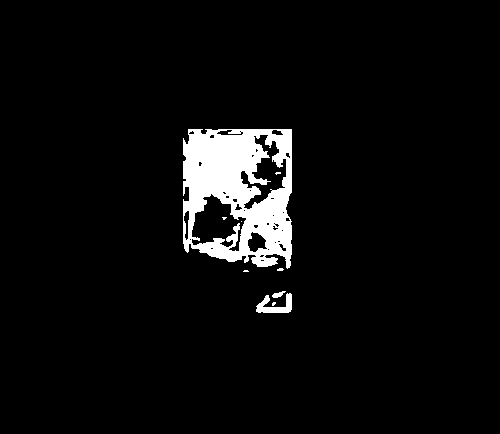

255
Image similarity: 0.9191309681840097


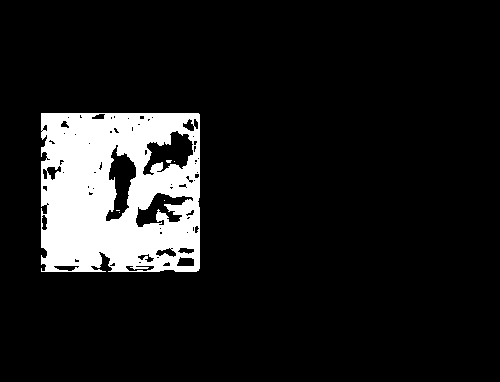

255
Image similarity: 0.9903901545594744


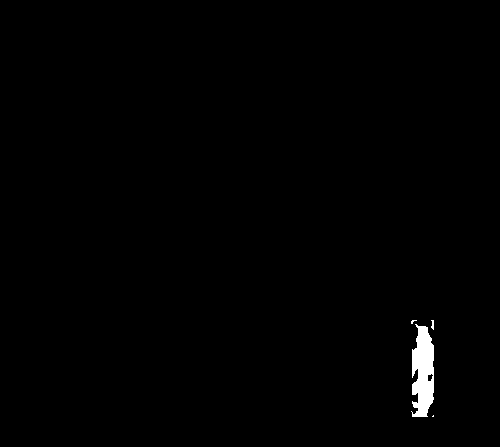

255
Image similarity: 0.9348387791518765


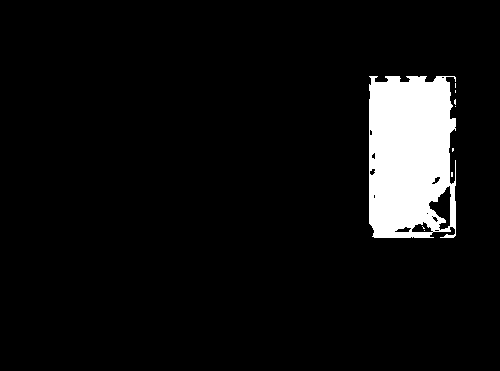

255
Image similarity: 0.9838351157939575


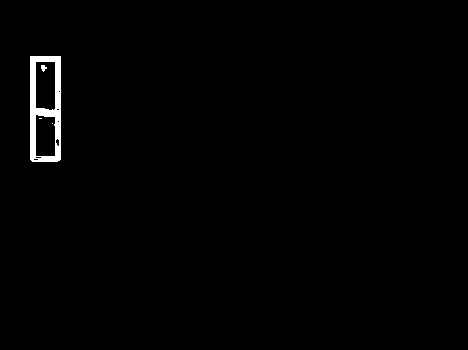

255
Image similarity: 0.9868788576204632


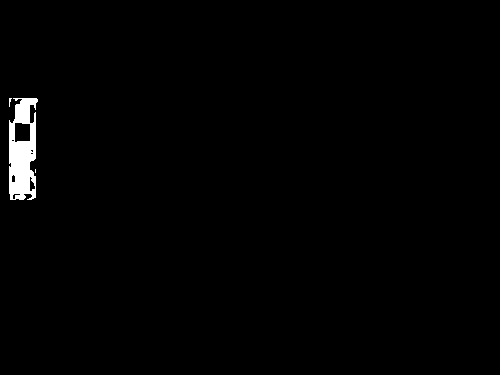

255
Image similarity: 0.9737373472327322


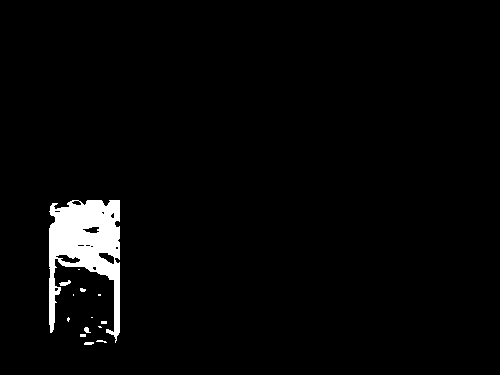

255
Image similarity: 0.9863400372572807


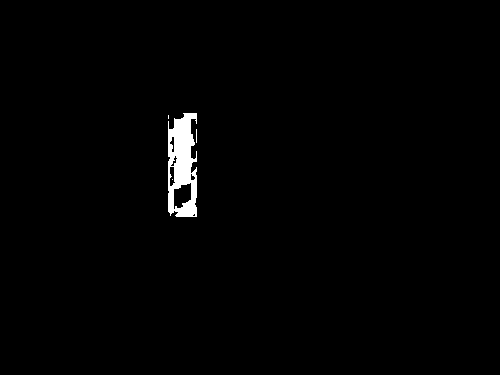

255
Image similarity: 0.9399692001794098


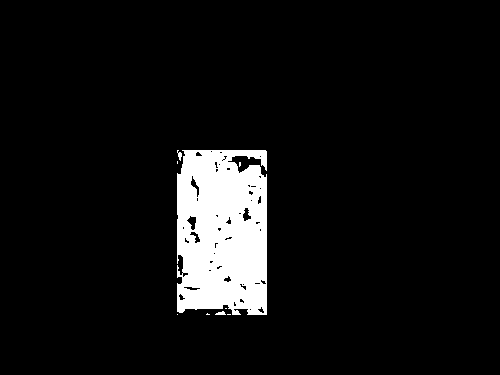

255
Image similarity: 0.9320960531306544


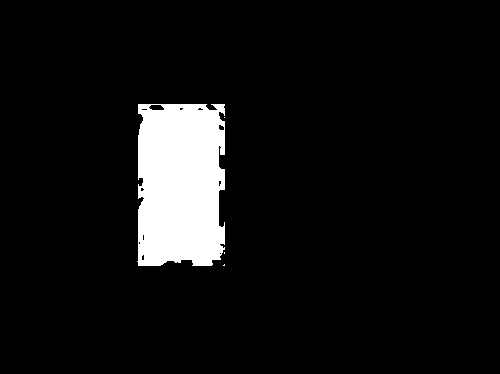

255
Image similarity: 0.8989532187731987


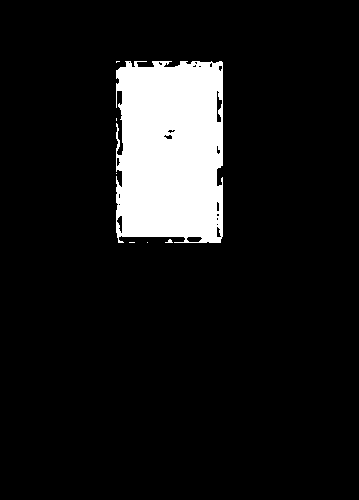

255
Image similarity: 0.971619202397153


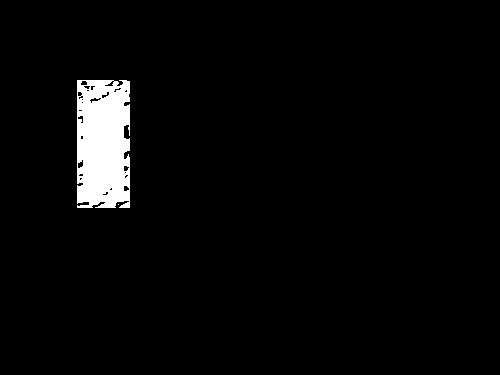

255
Image similarity: 0.973810219175182


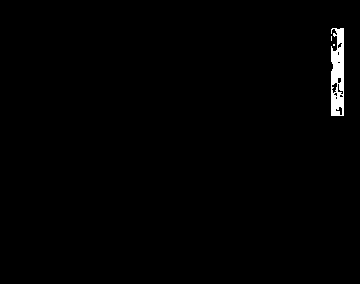

255
Image similarity: 0.8366195061399969


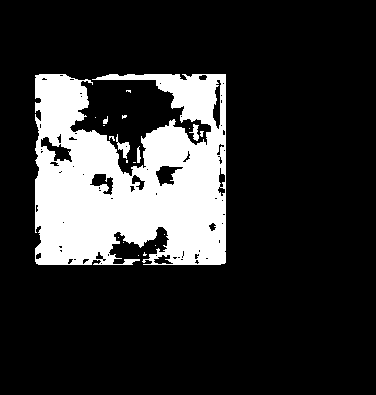

255
Image similarity: 0.9829674432210452


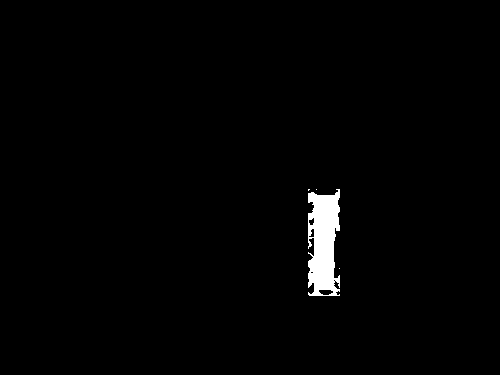

255
Image similarity: 0.721292568179837


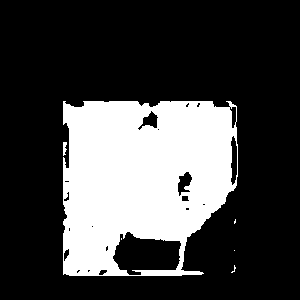

255
Image similarity: 0.79908103399702


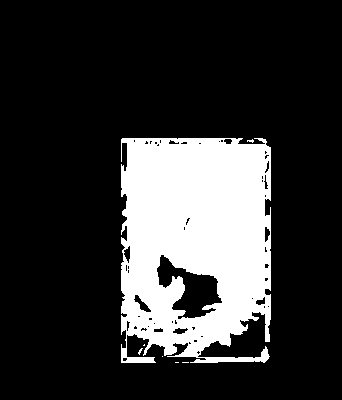

255
Image similarity: 0.9919332554114165


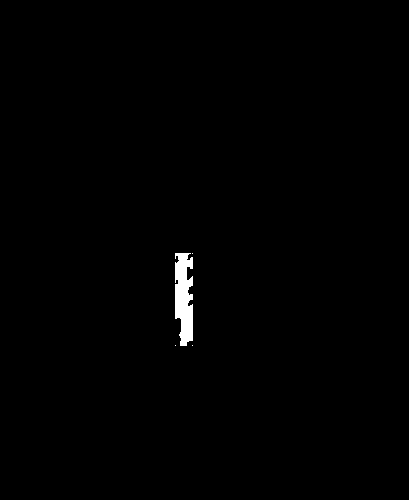

255
Image similarity: 0.9780876097770194


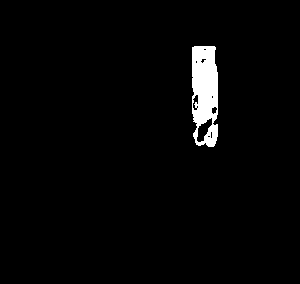

255
Image similarity: 0.9554881050635202


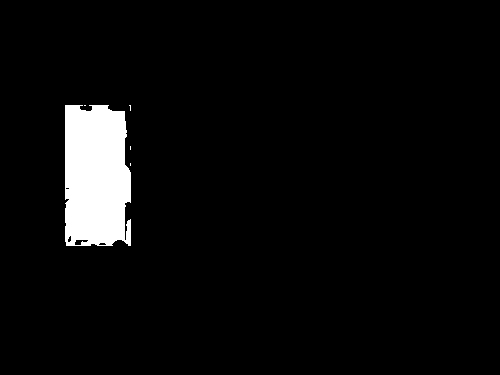

255
Image similarity: 0.9540755600363303


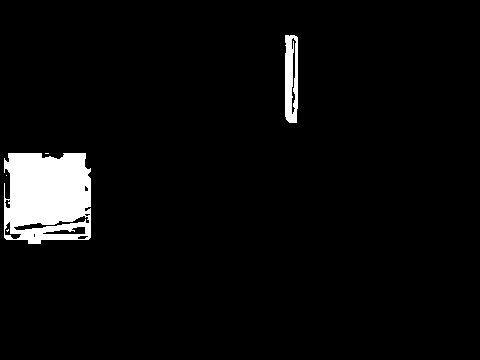

255
Image similarity: 0.8437073277011723


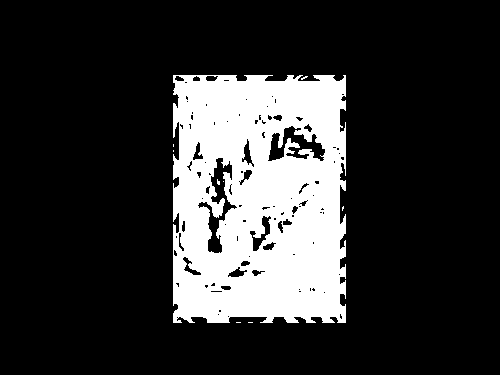

255
Image similarity: 0.8406328230932516


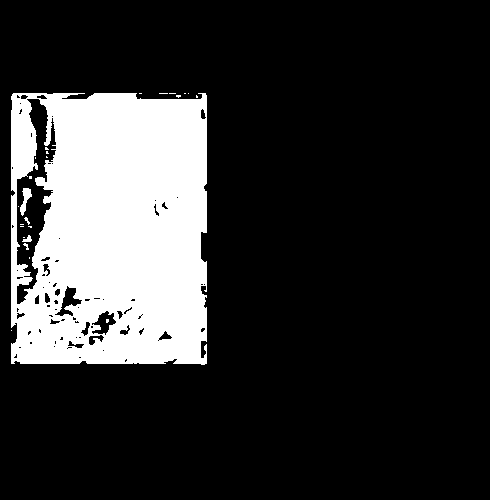

255
Image similarity: 0.9641923508596899


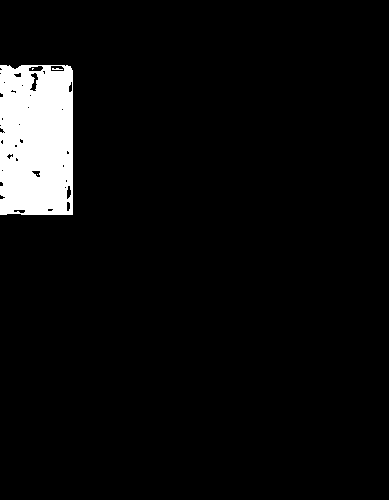

255
Image similarity: 0.9938202475979453


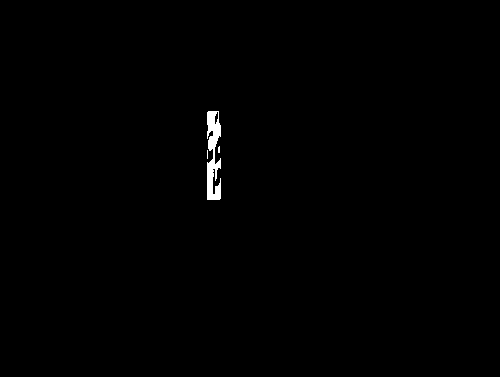

255
Image similarity: 0.9290145846572911


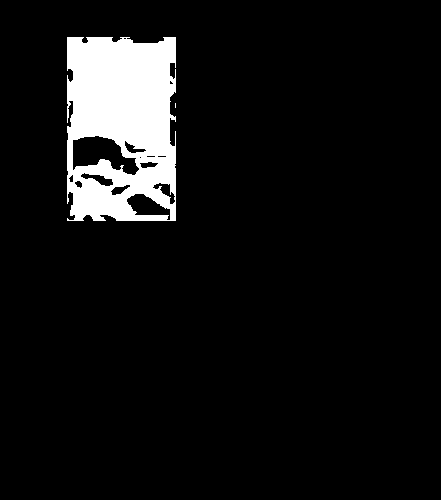

255
Image similarity: 0.9739157743638486


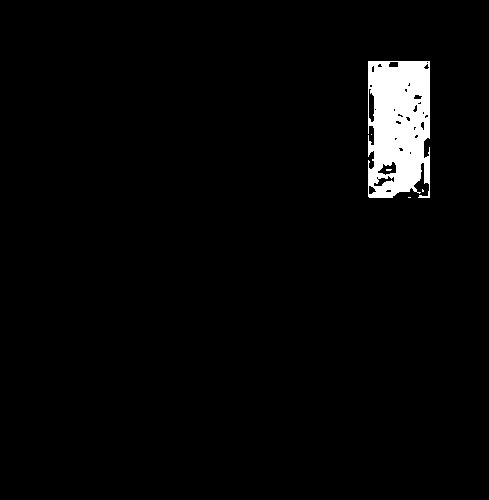

255
Image similarity: 0.9389258614099125


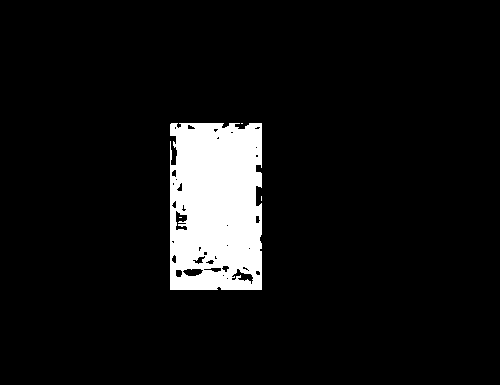

255
Image similarity: 0.86287129188117


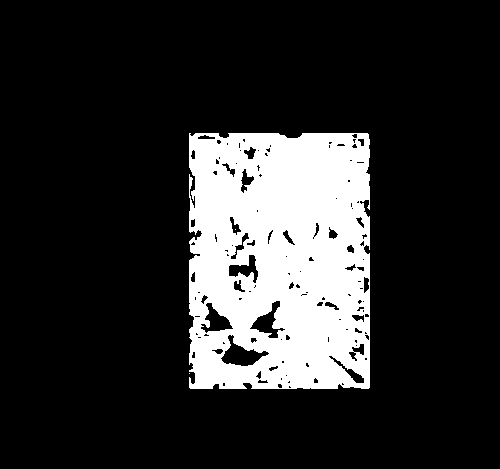

255
Image similarity: 0.9313595763843492


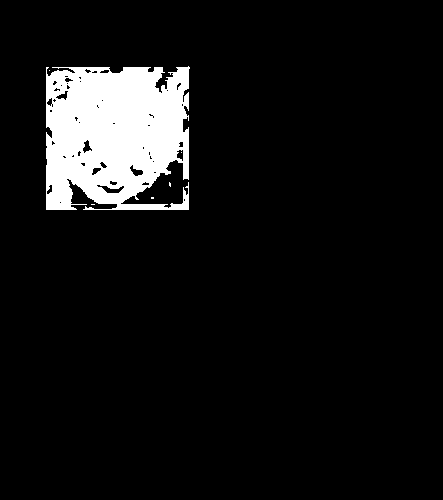

255
Image similarity: 0.9948142169201268


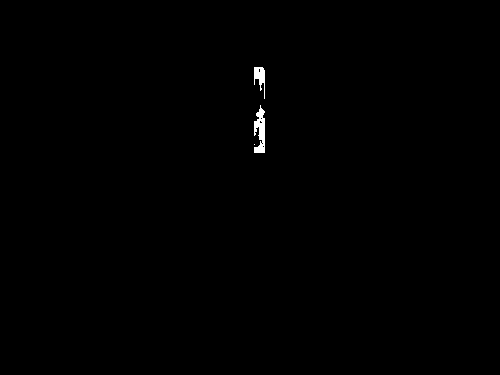

255
Image similarity: 0.9402242623020396


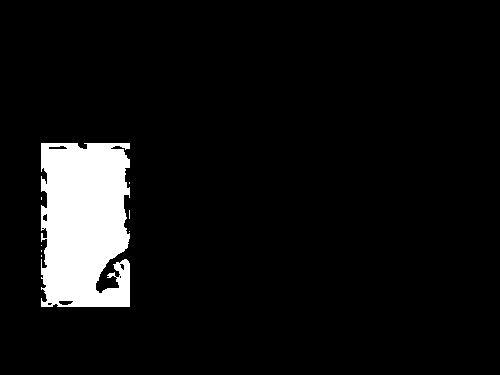

255
Image similarity: 0.6538281725242445


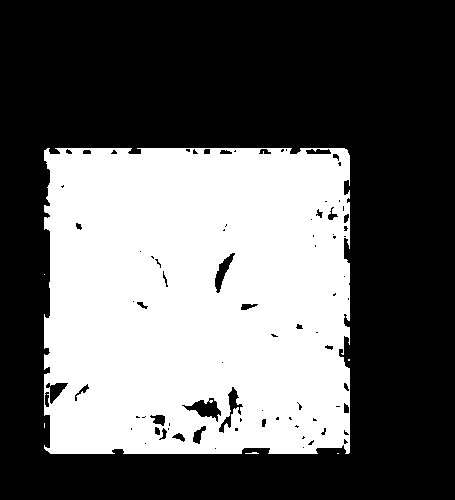

255
Image similarity: 0.7603542741705238


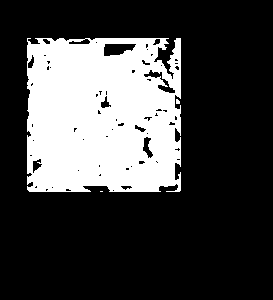

255
Image similarity: 0.9669856703968317


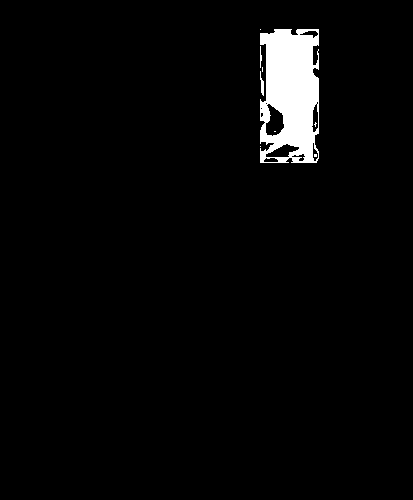

255
Image similarity: 0.9950865727348006


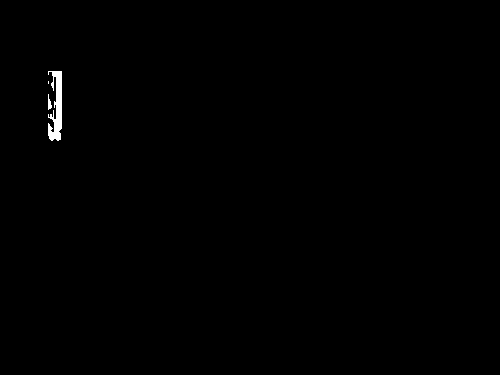

255
Image similarity: 0.9928605622473229


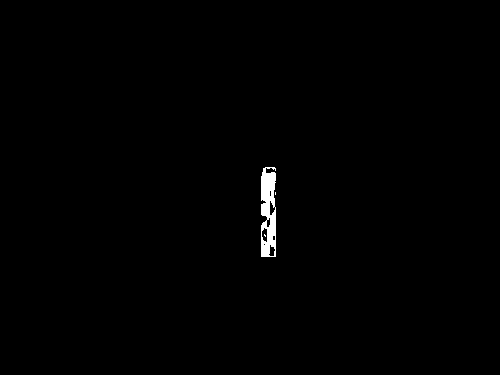

255
Image similarity: 0.9765648365783297


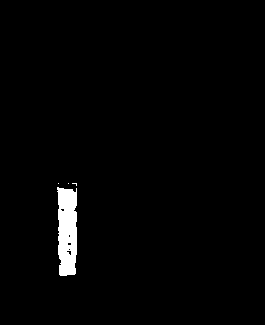

255
Image similarity: 0.9723689832375356


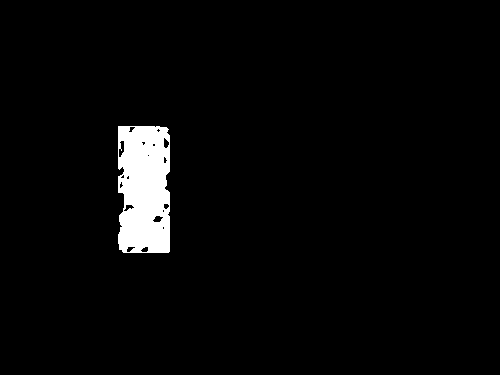

255
Image similarity: 0.9904867585406775


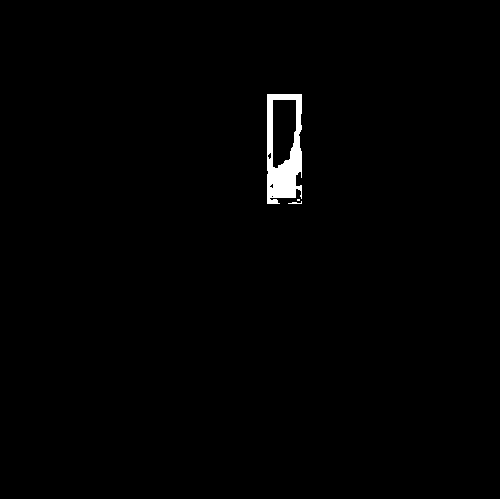

255
Image similarity: 0.9012198285982583


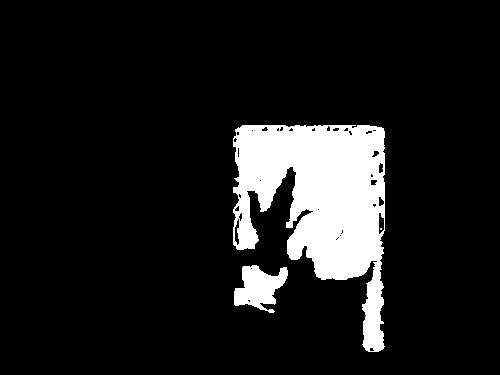

255
Image similarity: 0.9407227090598643


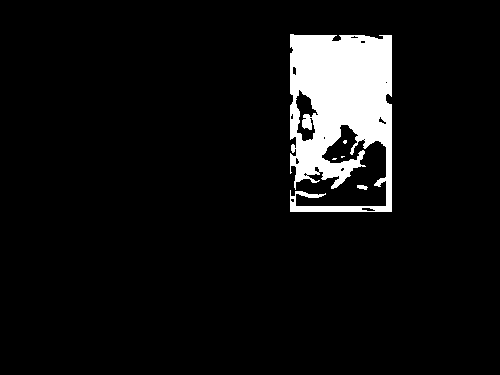

255
Image similarity: 0.987341520312762


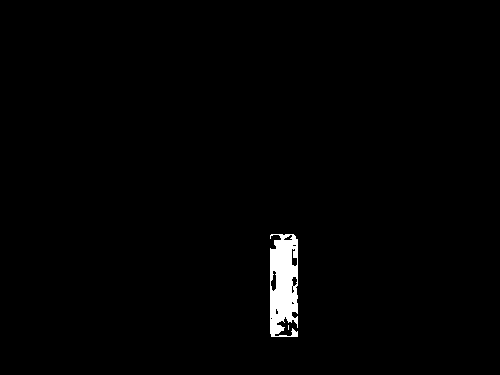

255
Image similarity: 0.9960974649559899


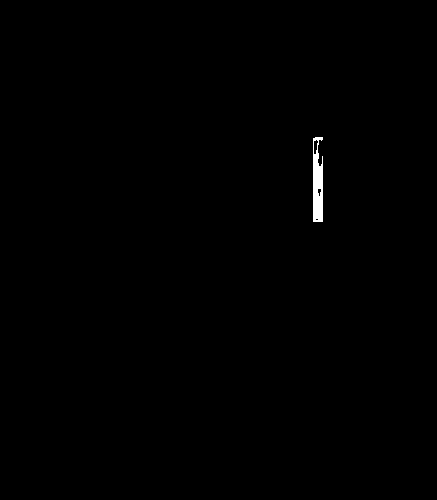

255
Image similarity: 0.9503478239388501


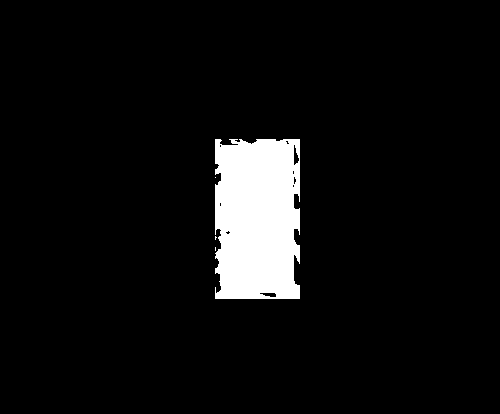

255
Image similarity: 0.9606371978588368


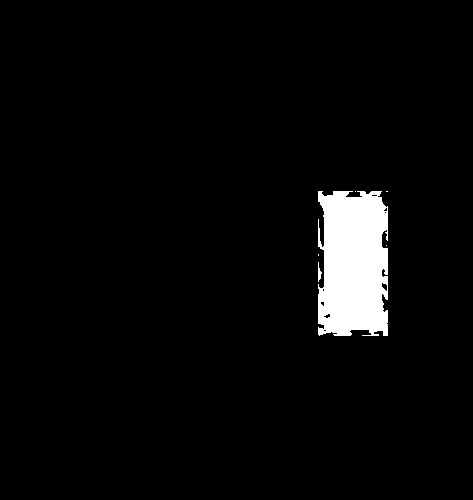

255
Image similarity: 0.7396991675618564


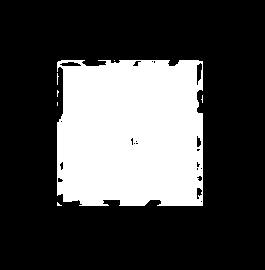

255
Image similarity: 0.9687881940223553


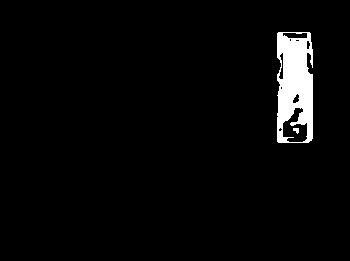

255
Image similarity: 0.9714426488287019


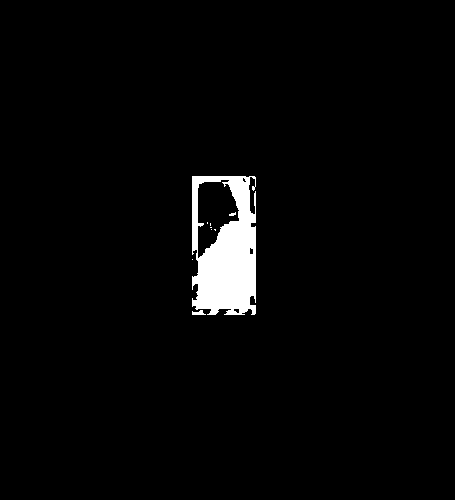

255
Image similarity: 0.8058603539074074


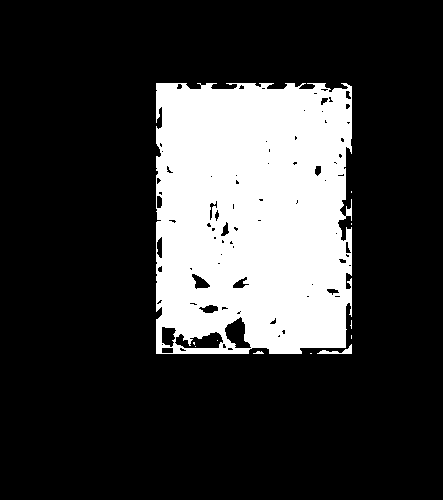

255
Image similarity: 0.9529962246501754


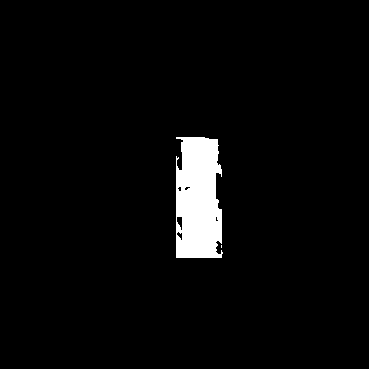

255
Image similarity: 0.8950592147530069


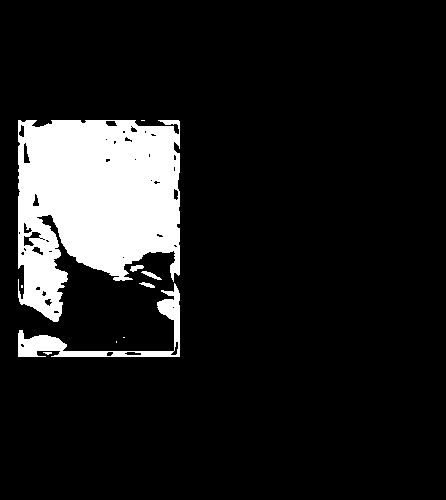

255
Image similarity: 0.9866706691536933


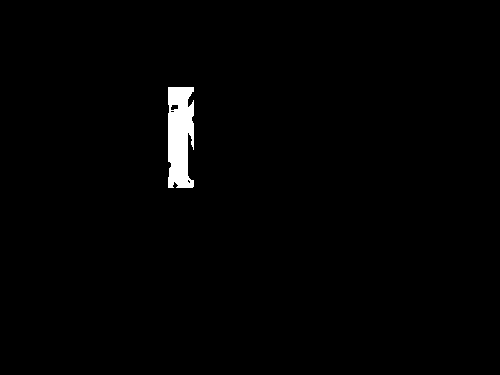

255
Image similarity: 0.8433311906950395


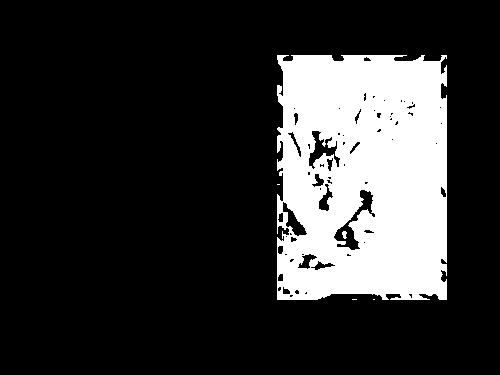

255
Image similarity: 0.937086286430503


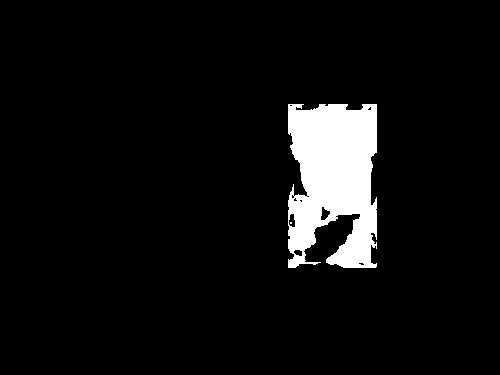

255
Image similarity: 0.9103343814629237


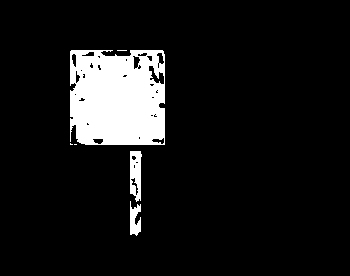

255
Image similarity: 0.8219969763554766


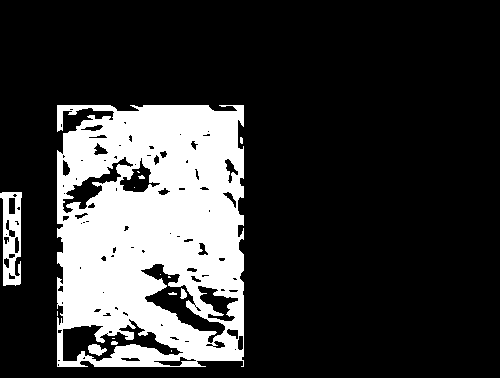

255
Image similarity: 0.9633229086953838


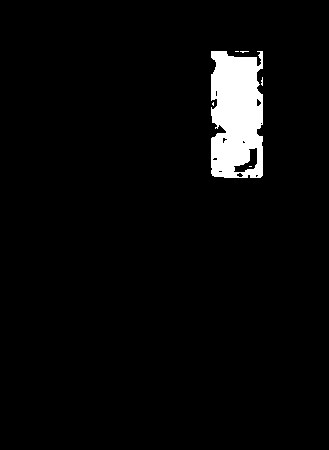

255
Image similarity: 0.6851175511494882


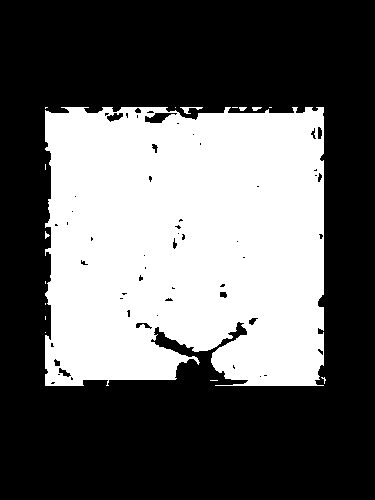

255
Image similarity: 0.8637224245159637


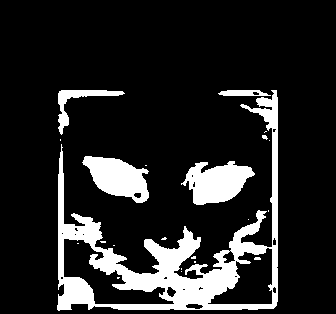

255
Image similarity: 0.9735663267745922


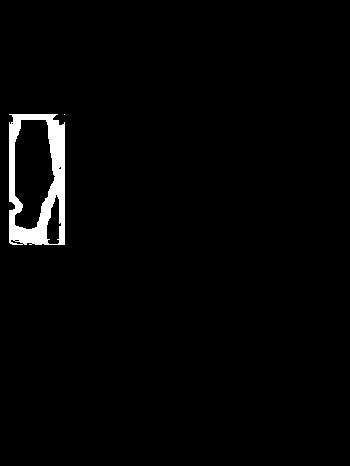

255
Image similarity: 0.9906942232469458


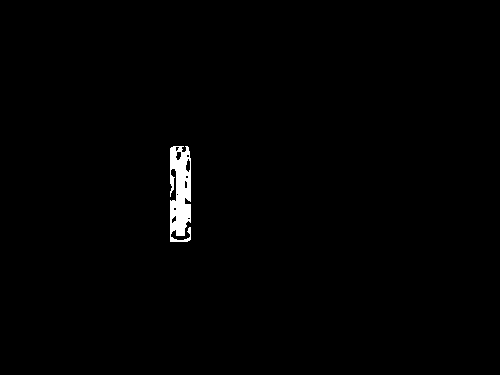

255
Image similarity: 0.8461342789765679


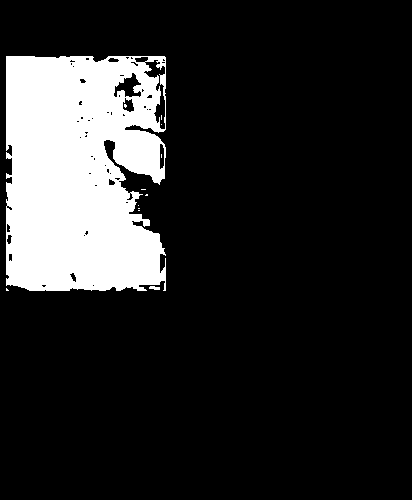

255
Image similarity: 0.9599761737940028


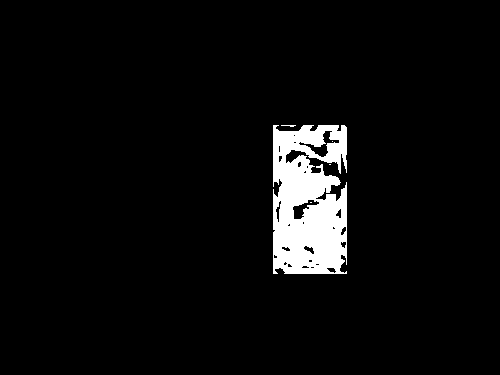

255
Image similarity: 0.9815459012378139


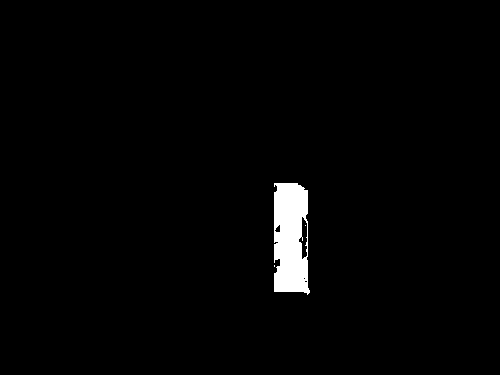

255
Image similarity: 0.9500770065457433


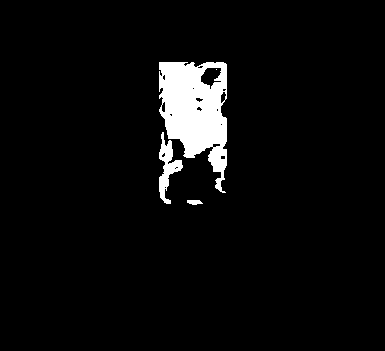

255
Image similarity: 0.9290676558744275


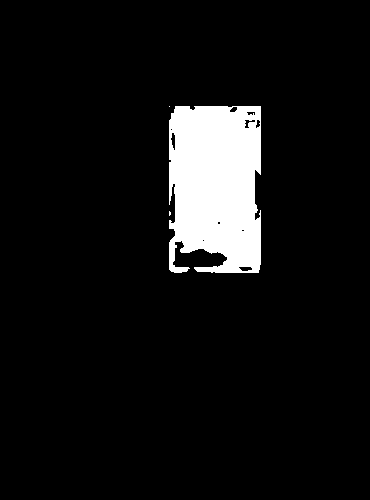

255
Image similarity: 0.7164122715396883


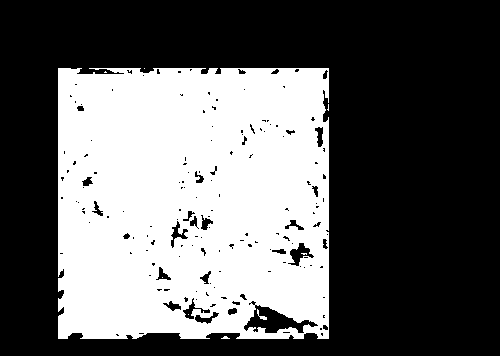

255
Image similarity: 0.8542073983572719


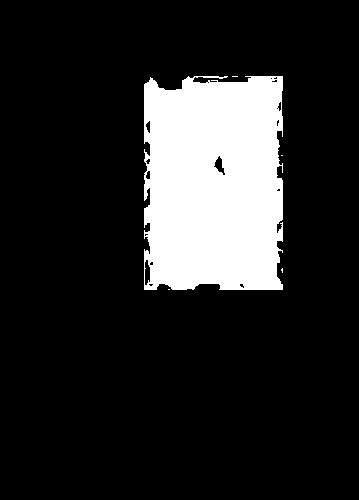

255
Image similarity: 0.9303368111886271


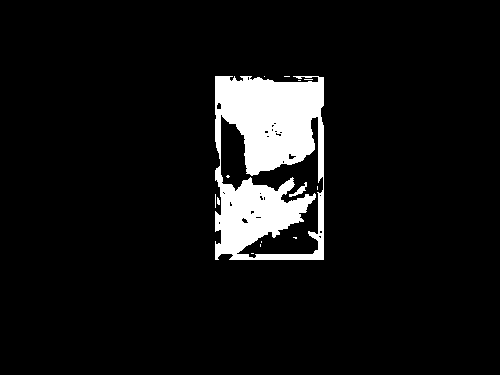

255
Image similarity: 0.9926597404996884


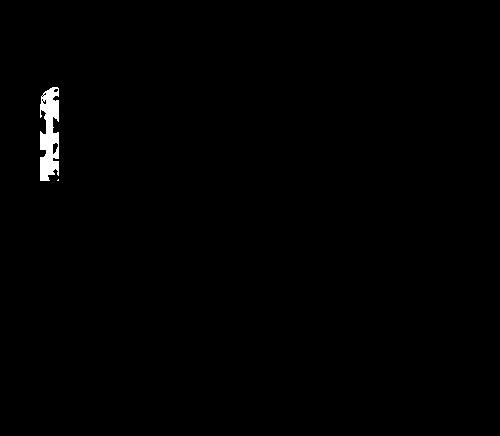

255
Image similarity: 0.9779548818943851


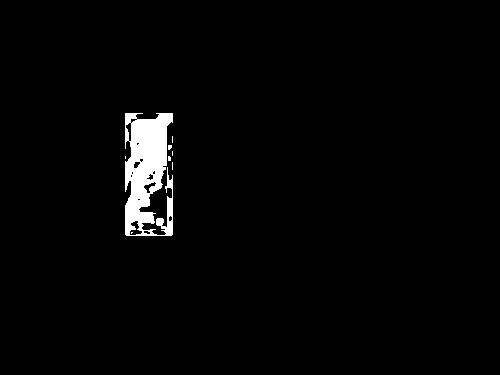

255
Image similarity: 0.9188967688785865


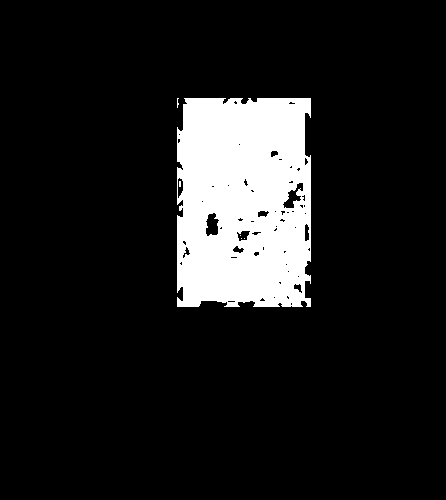

255
Image similarity: 0.93910744288688


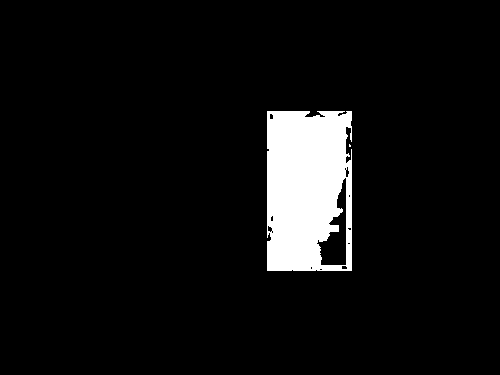

255
Image similarity: 0.9444761707603632


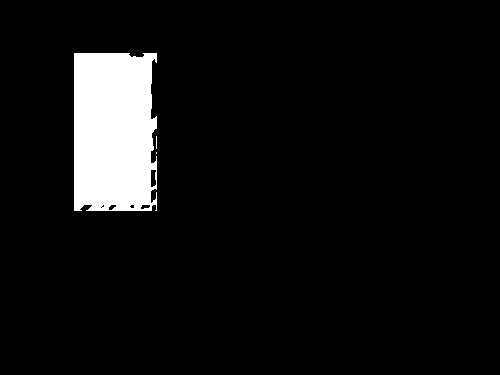

255
Image similarity: 0.9441274453082296


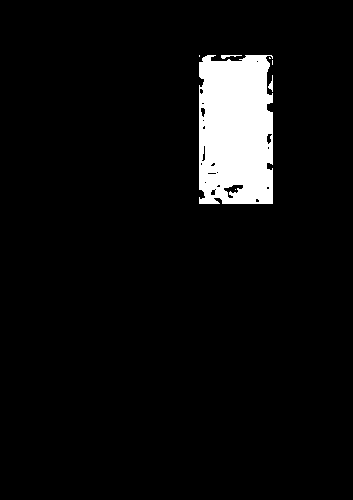

255
Image similarity: 0.9930959782956956


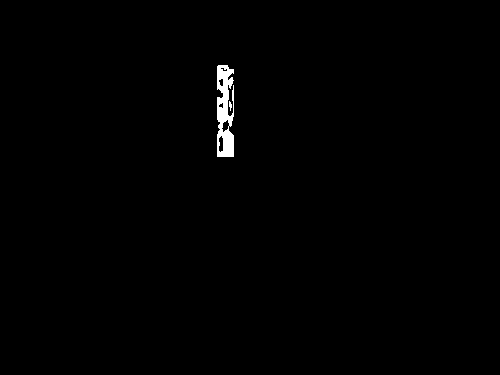

255
Image similarity: 0.9674606951417136


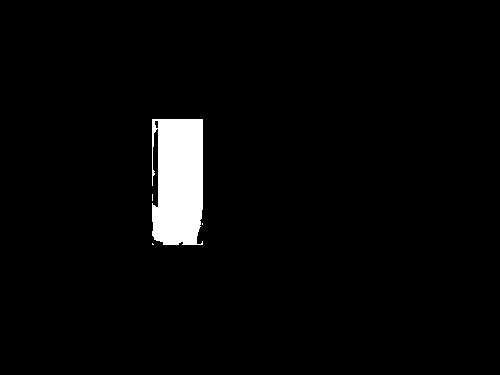

255
Image similarity: 0.9556390271338459


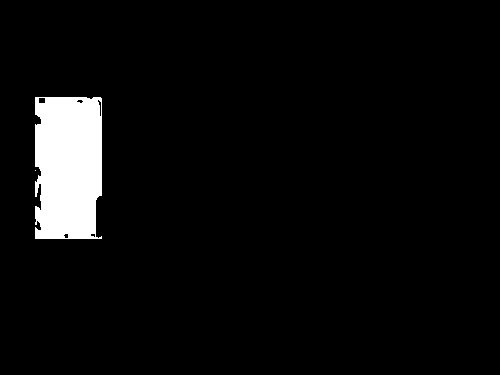

255
Image similarity: 0.9647578461597883


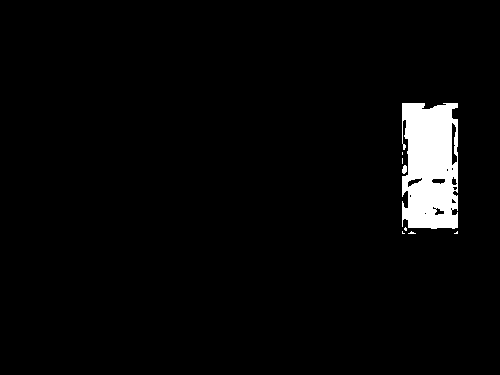

255
Image similarity: 0.7984858345340333


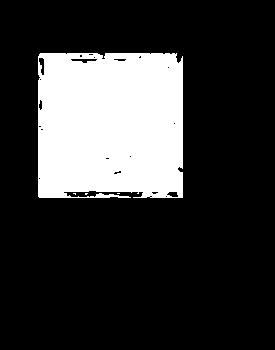

255
Image similarity: 0.8976055178179085


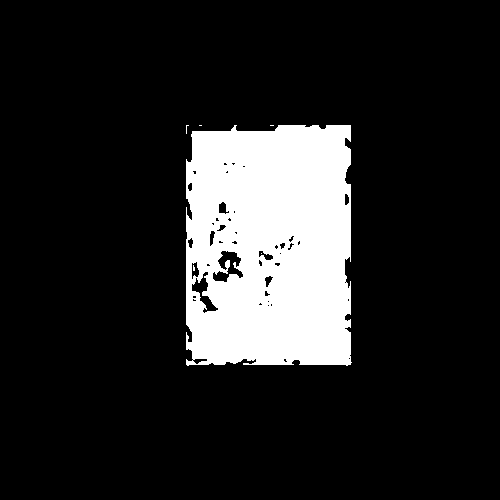

255
Image similarity: 0.9821305568055556


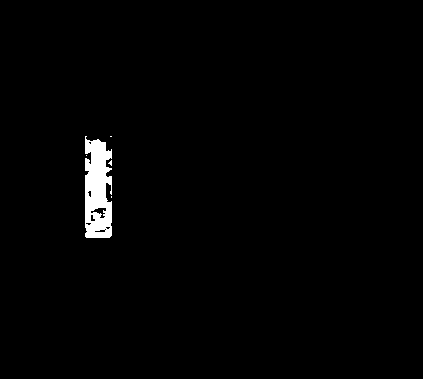

255
Image similarity: 0.9653814326356662


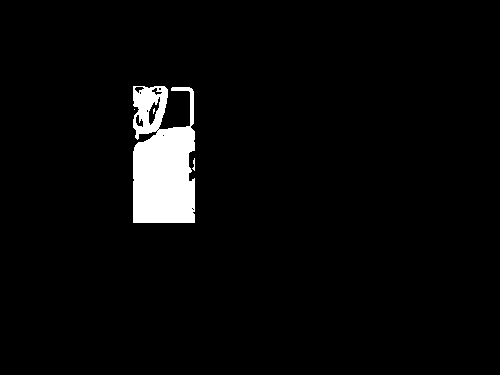

255
Image similarity: 0.9727978323693954


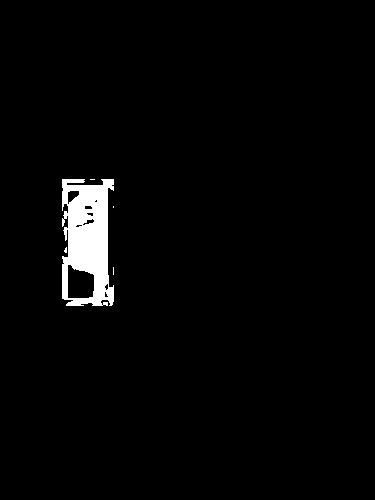

255
Image similarity: 0.9882600463385421


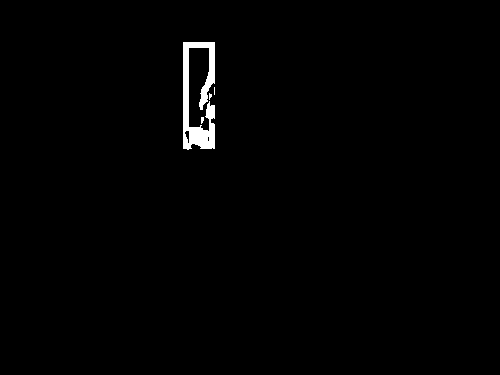

255
Image similarity: 0.9001172564465563


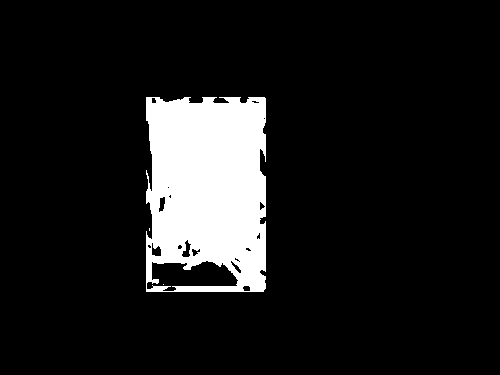

255
Image similarity: 0.9798102639937253


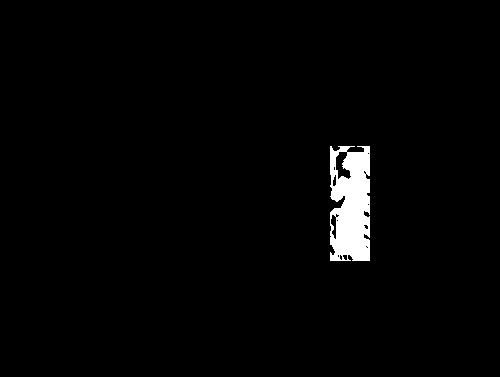

255
Image similarity: 0.9760181068568217


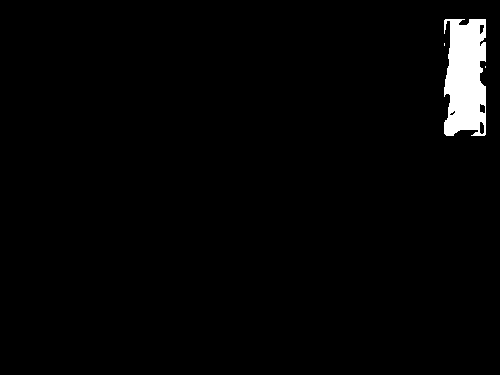

255
Image similarity: 0.9578752037361461


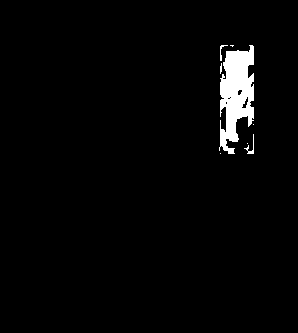

255
Image similarity: 0.8274197669420169


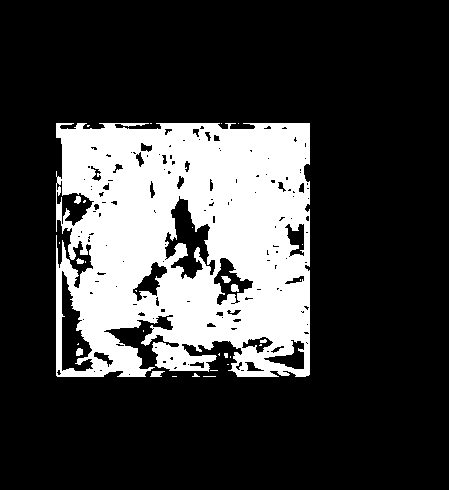

255
Image similarity: 0.9798174425009849


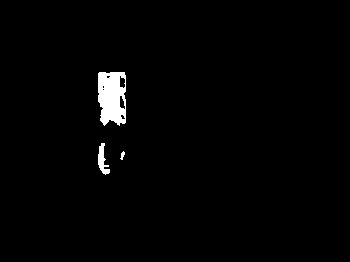

255
Image similarity: 0.9919349397375691


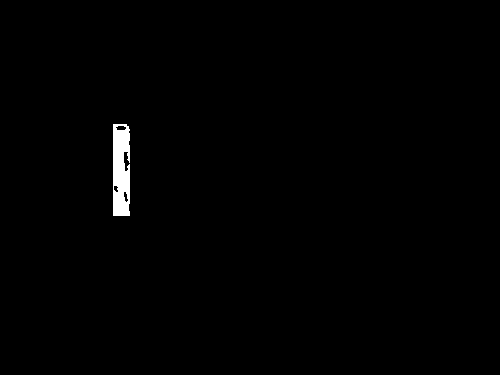

255
Image similarity: 0.959017192610601


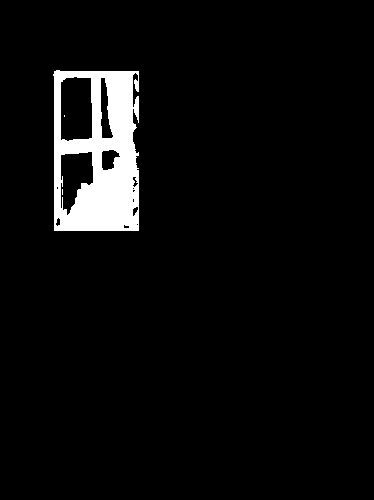

255
Image similarity: 0.9747916195190651


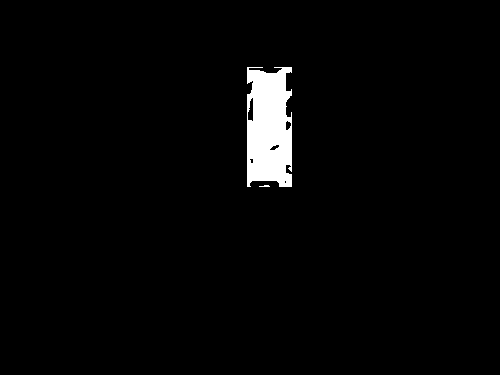

255
Image similarity: 0.9829130823776896


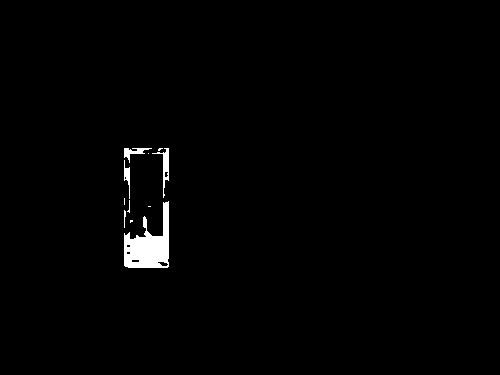

255
Image similarity: 0.9518157442743773


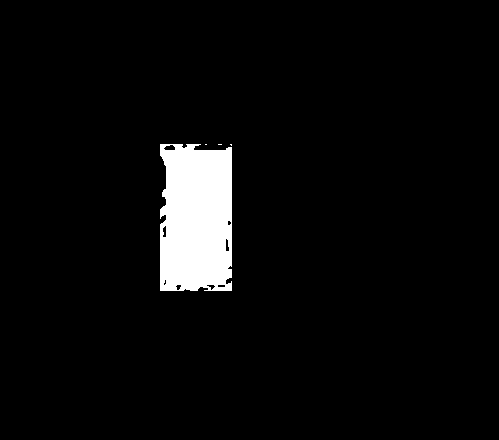

255
Image similarity: 0.9626297665208952


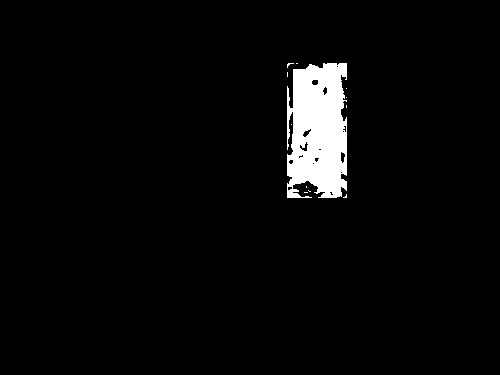

255
Image similarity: 0.8880641842778759


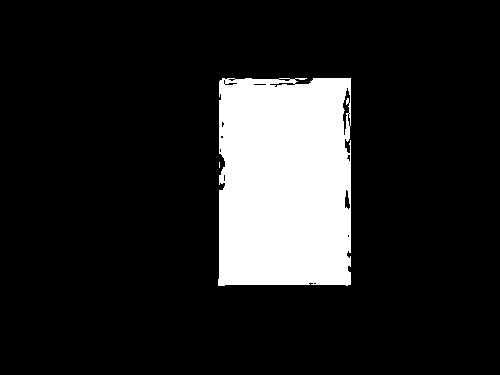

255
Image similarity: 0.8933311792834051


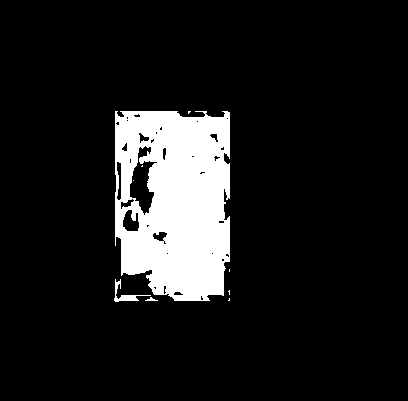

255
Image similarity: 0.9765416507195321


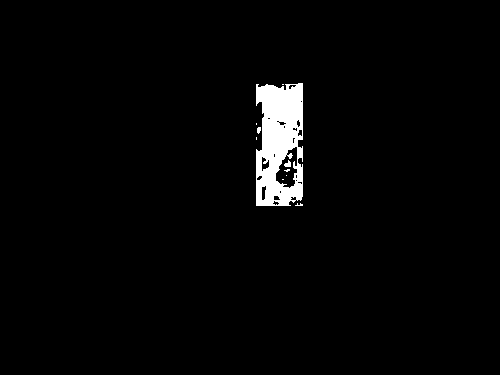

255
Image similarity: 0.982751559931228


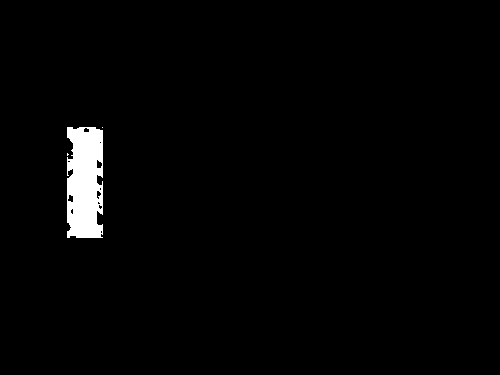

255
Image similarity: 0.941847534257319


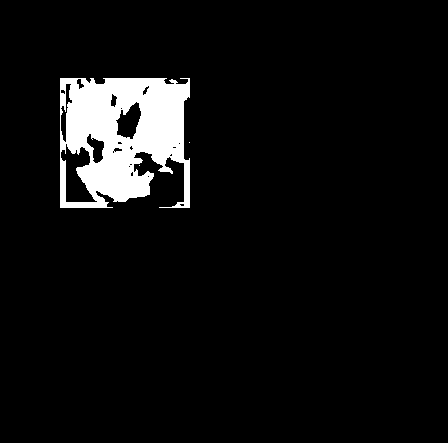

255
Image similarity: 0.9426251261593769


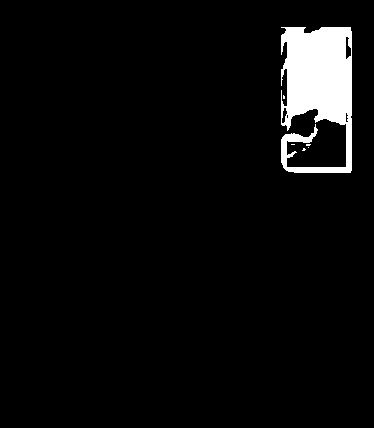

255
Image similarity: 0.9658507482686749


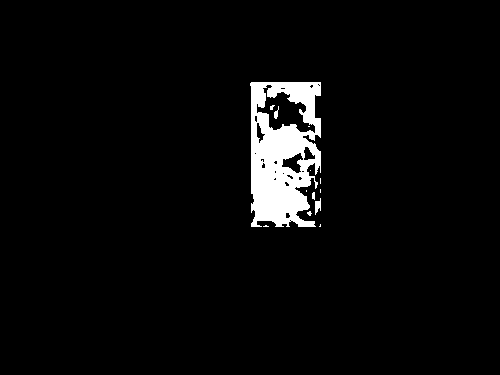

255
Image similarity: 0.9523168212534301


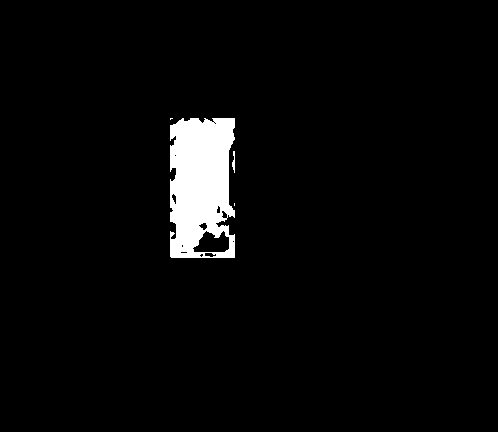

255
Image similarity: 0.8898468207646256


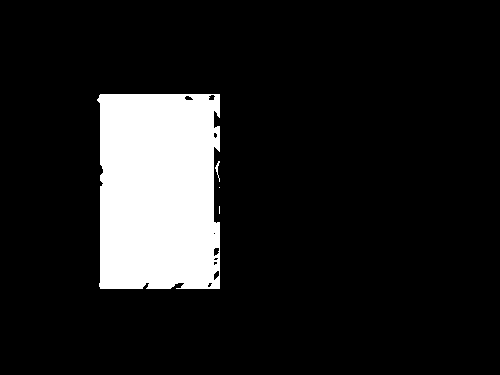

255
Image similarity: 0.9543086866452979


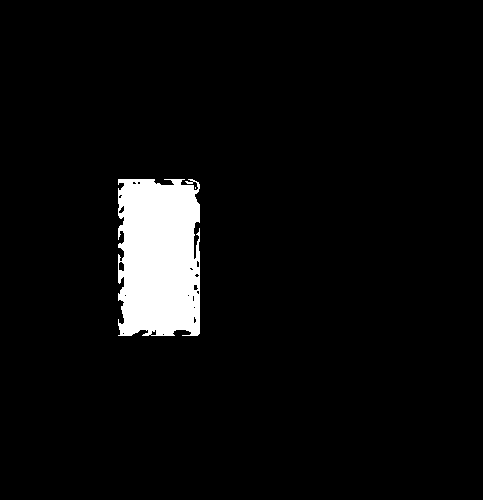

255
Image similarity: 0.9727910985055389


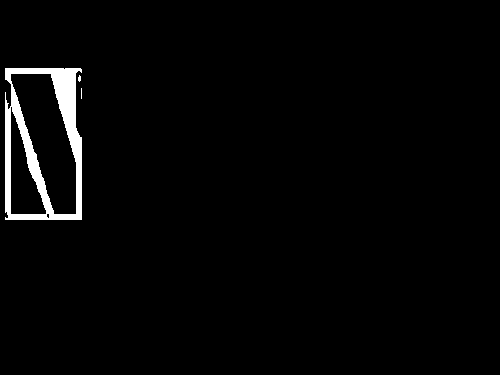

255
Image similarity: 0.8807134367166436


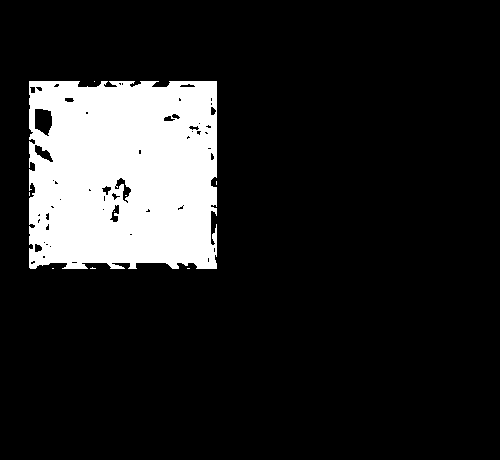

255
Image similarity: 0.9420703816959947


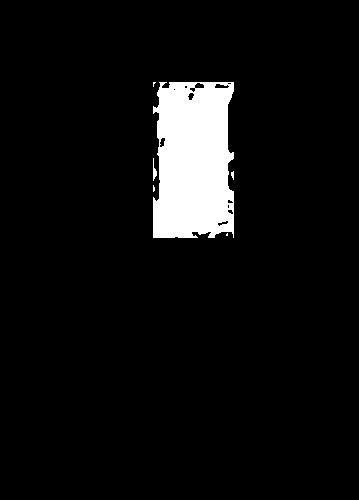

255
Image similarity: 0.9759679784979971


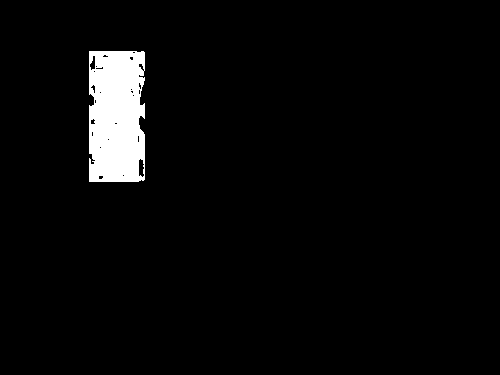

255
Image similarity: 0.756584598746837


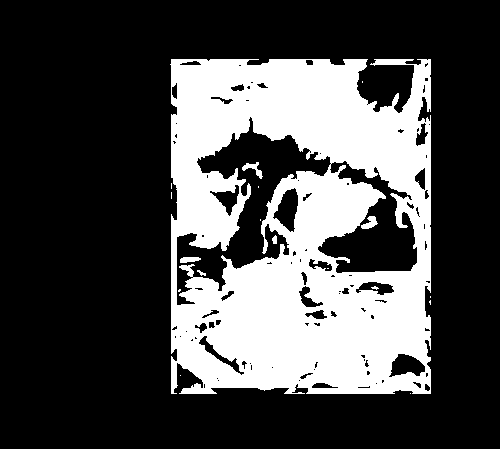

255
Image similarity: 0.9634579717743786


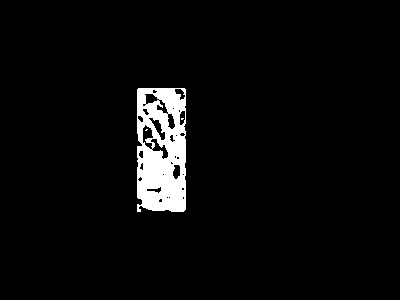

255
Image similarity: 0.9611197632567421


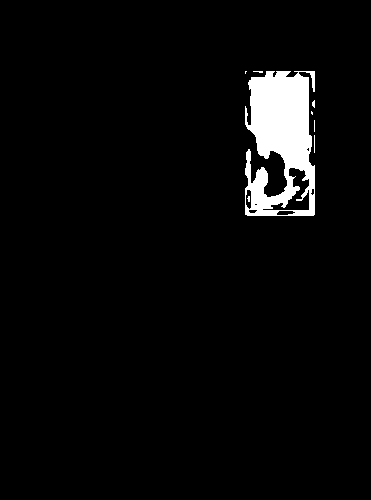

255
Image similarity: 0.9976213498968063


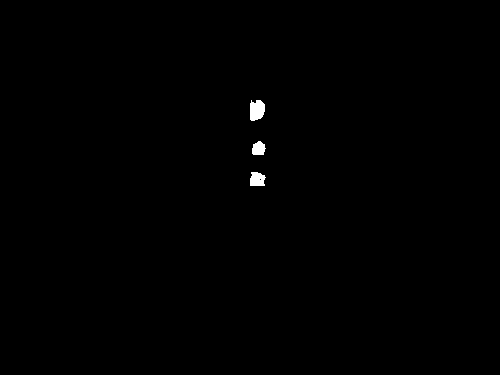

255
Image similarity: 0.9843738378197893


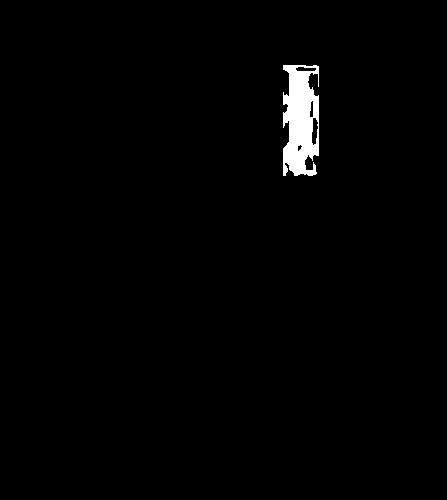

255
Image similarity: 0.9818281852018328


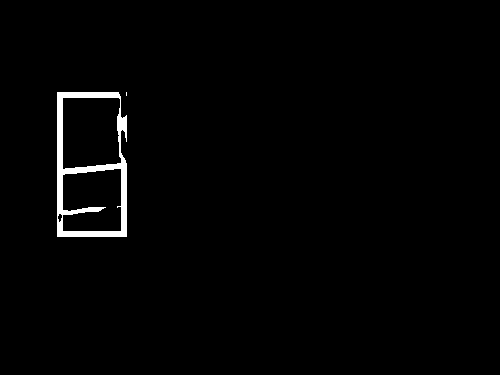

255
Image similarity: 0.9953350256197117


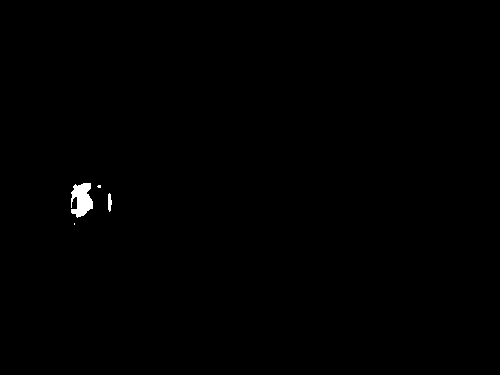

255
Image similarity: 0.921840002960858


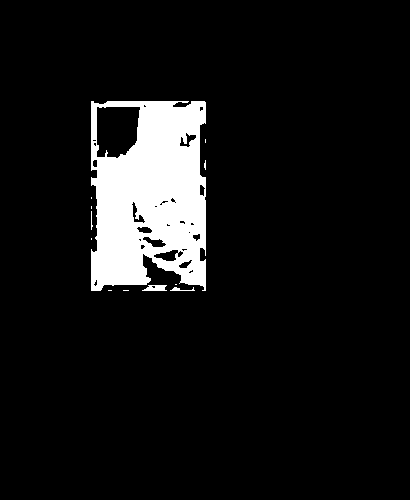

255
Image similarity: 0.9577349749396034


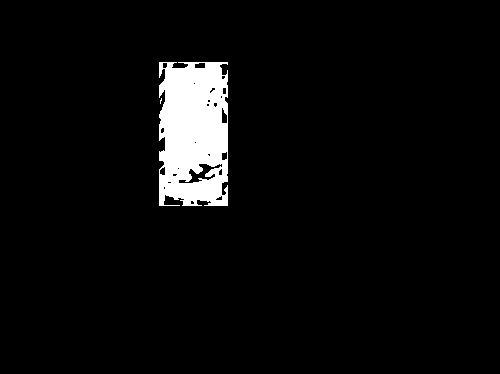

255
Image similarity: 0.7031182747643145


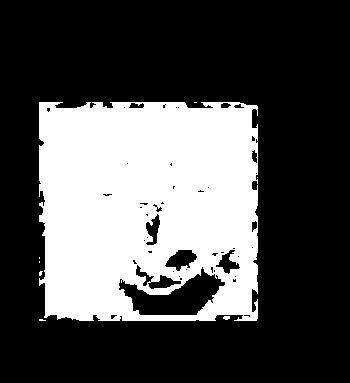

255
Image similarity: 0.9763823465864772


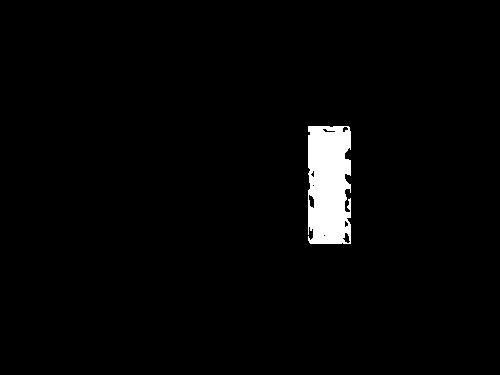

255
Image similarity: 0.9751825329345536


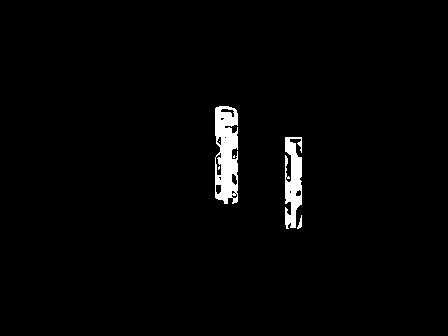

255
Image similarity: 0.9884794836358417


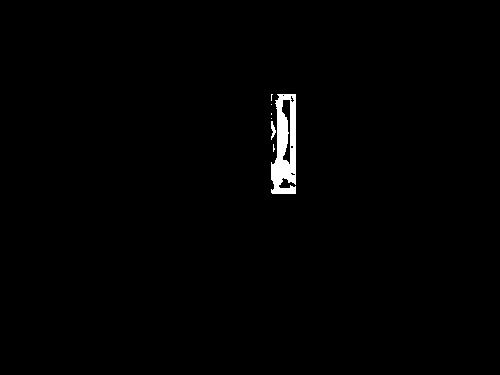

255
Image similarity: 0.9476939756779503


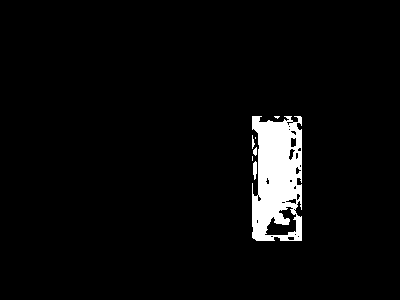

255
Image similarity: 0.8812553739155663


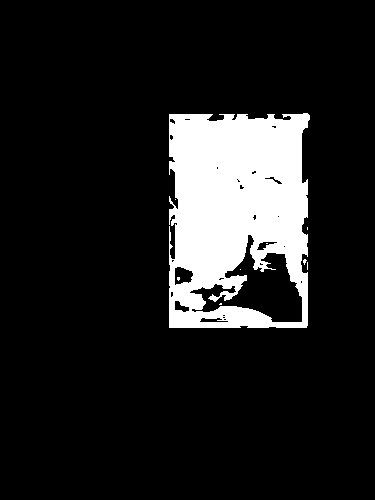

255
Image similarity: 0.7633250522107211


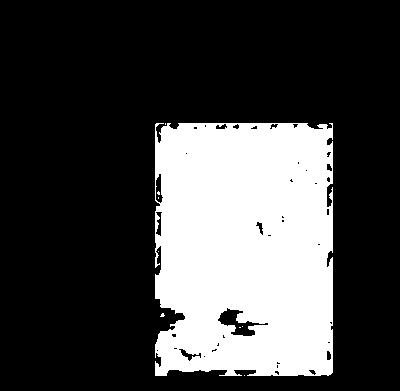

255
Image similarity: 0.8537574421406063


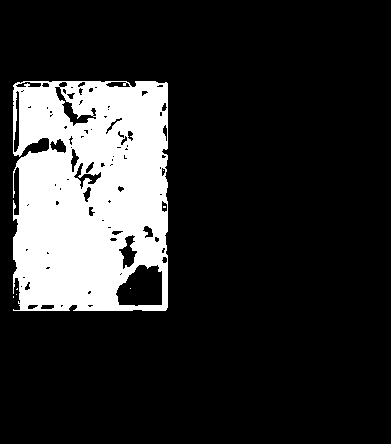

255
Image similarity: 0.9522806454515309


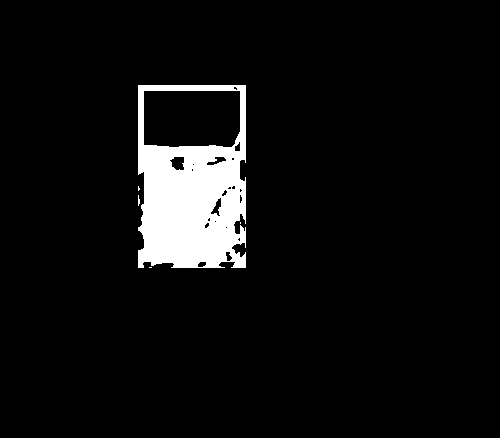

255
Image similarity: 0.9784983966826143


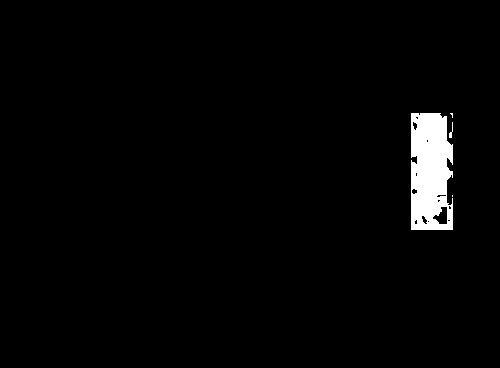

255
Image similarity: 0.9438910778169733


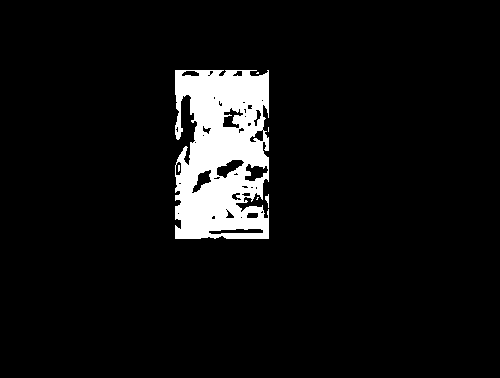

255
Image similarity: 0.9776215600654149


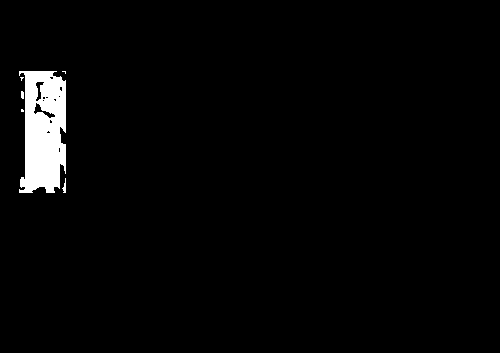

255
Image similarity: 0.7799036623191181


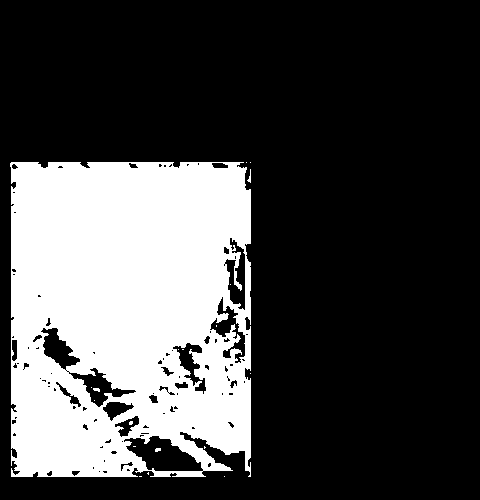

255
Image similarity: 0.9335771144290432


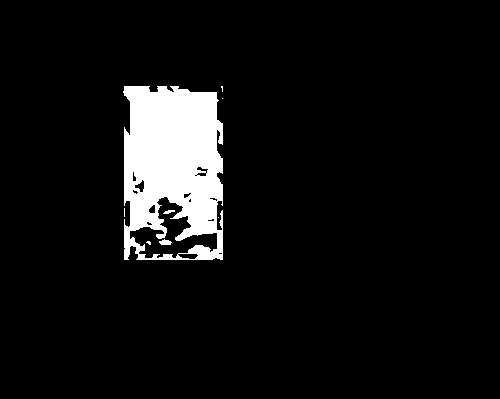

255
Image similarity: 0.7513118293047878


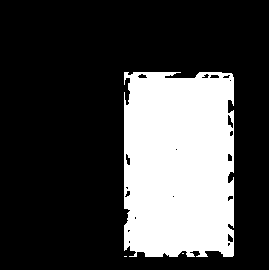

255
Image similarity: 0.9330144175289392


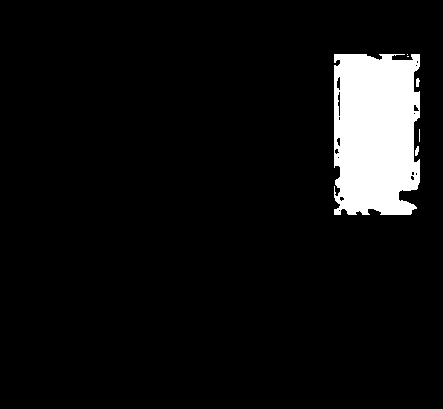

255
Image similarity: 0.9818597688656817


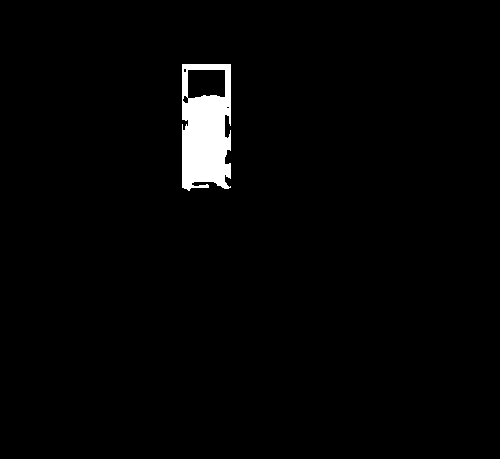

255
Image similarity: 0.9094468936702237


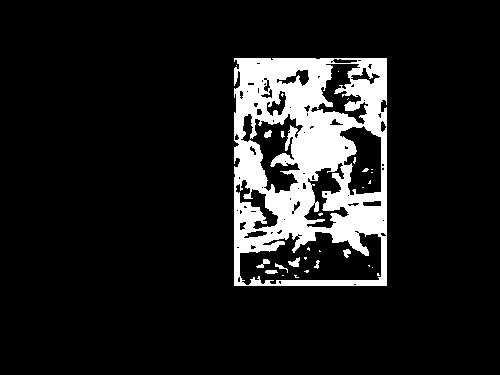

255
Image similarity: 0.9533934776007407


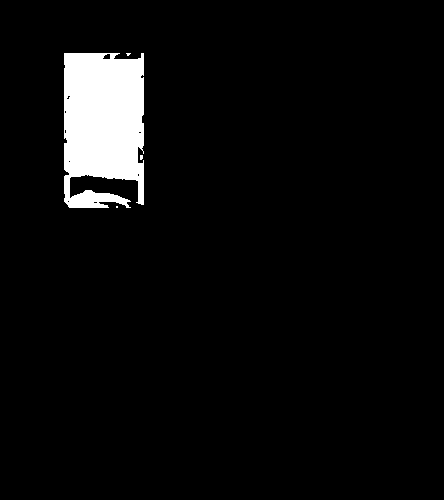

255
Image similarity: 0.9400940683294553


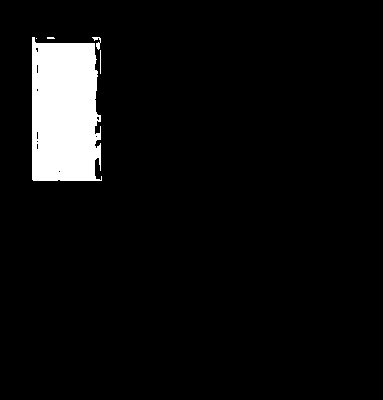

255
Image similarity: 0.9856047062690265


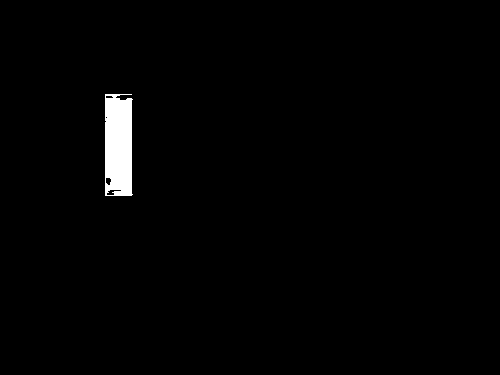

255
Image similarity: 0.9699502007005677


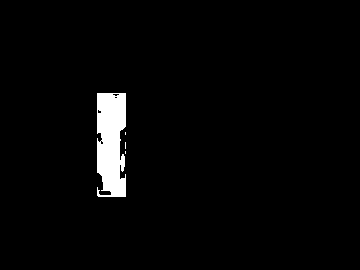

255
Image similarity: 0.9937212283943021


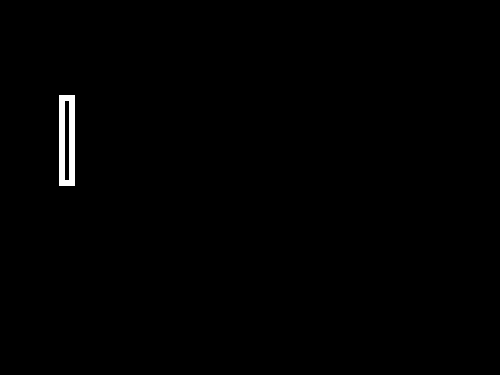

255
Image similarity: 0.990002712801364


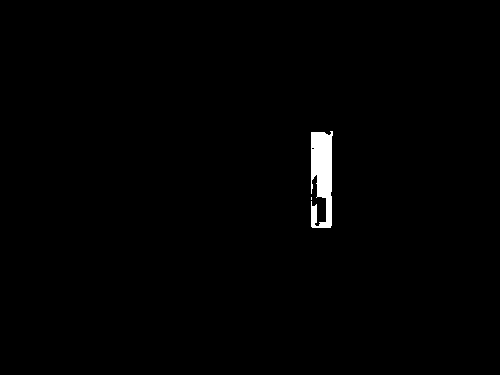

255
Image similarity: 0.9731594300745003


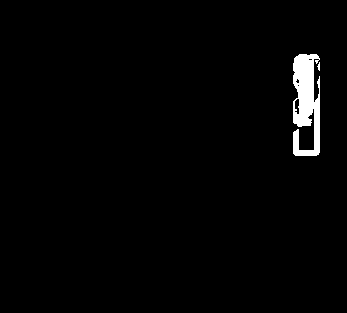

255
Image similarity: 0.9290370527452149


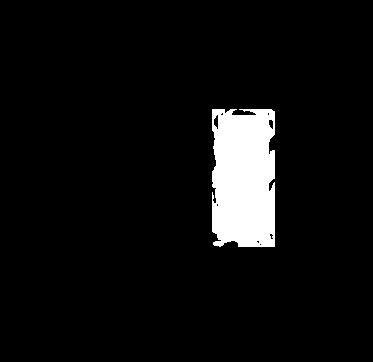

255
Image similarity: 0.9327117616082433


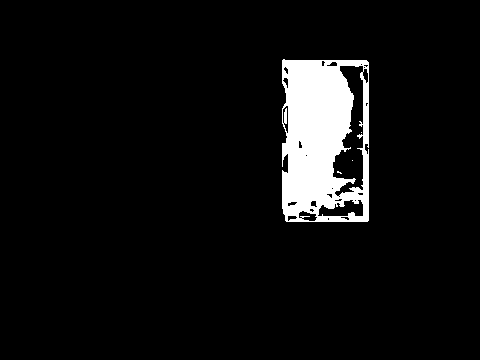

255
Image similarity: 0.9690863186843768


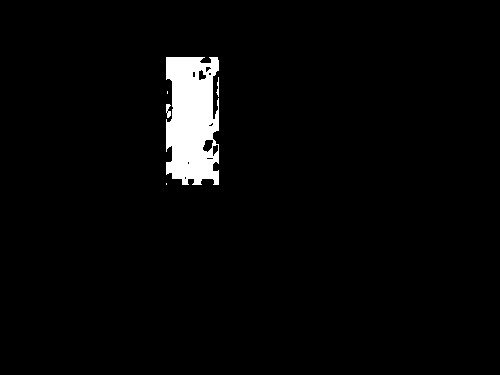

255
Image similarity: 0.9488845599618347


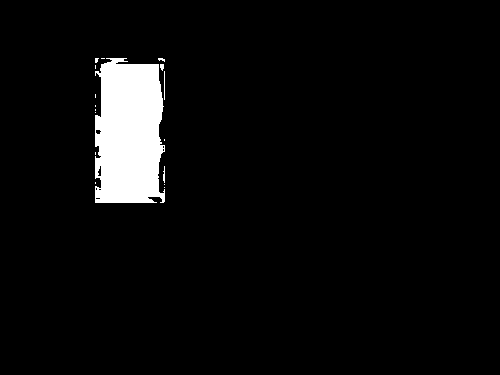

255
Image similarity: 0.9687242607663625


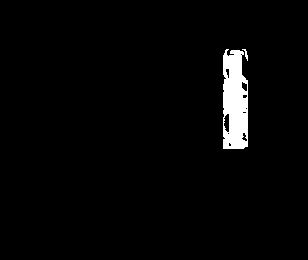

255
Image similarity: 0.9700924697562564


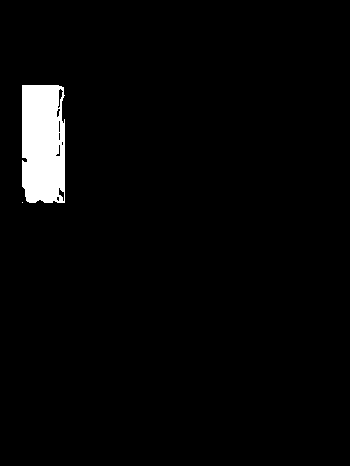

255
Image similarity: 0.6918842600061258


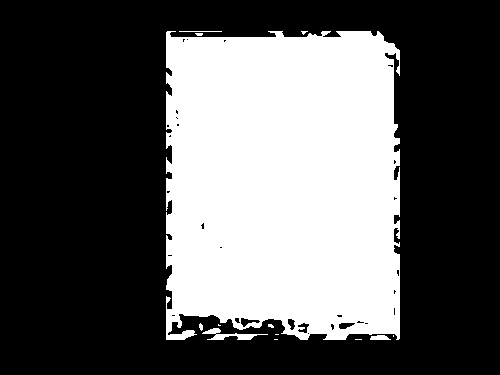

255
Image similarity: 0.9529956362489105


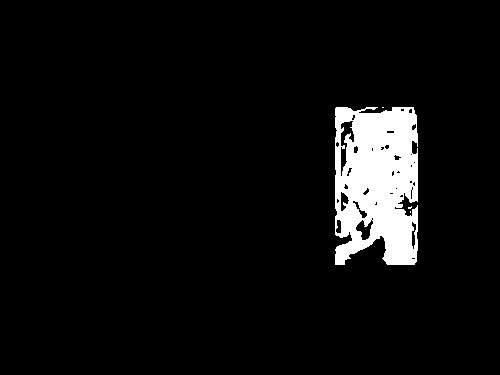

255
Image similarity: 0.9604281757502878


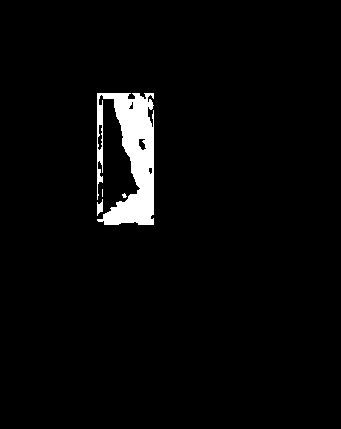

255
Image similarity: 0.969305700965458


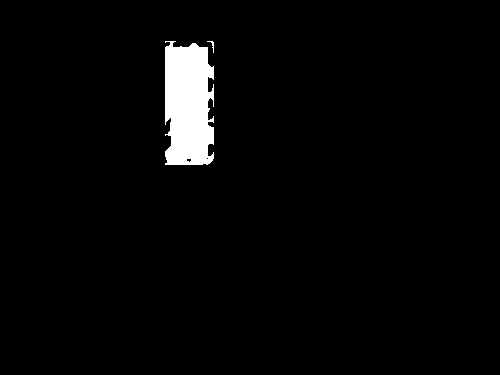

255
Image similarity: 0.9358204154037828


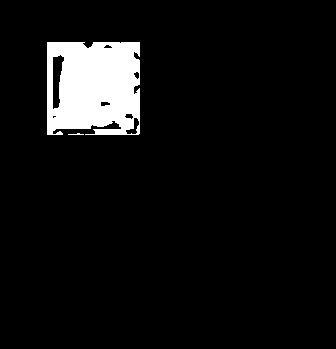

255
Image similarity: 0.786003219442717


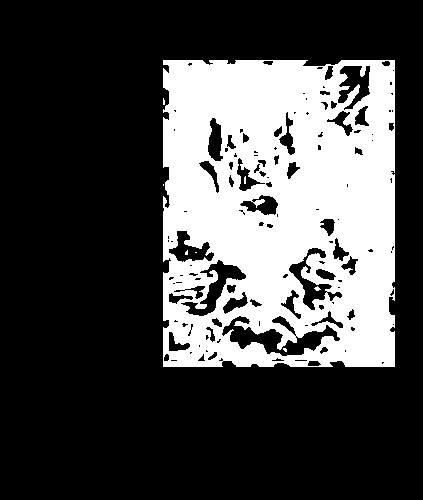

255
Image similarity: 0.9525207130173163


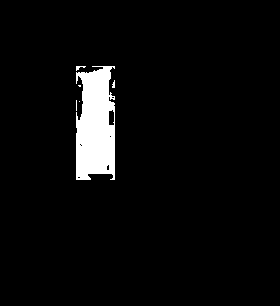

255
Image similarity: 0.9314446877651634


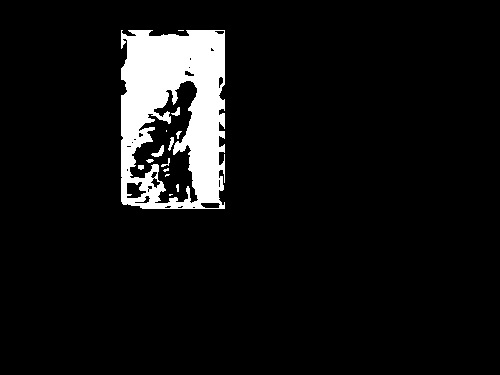

255
Image similarity: 0.9746825381781792


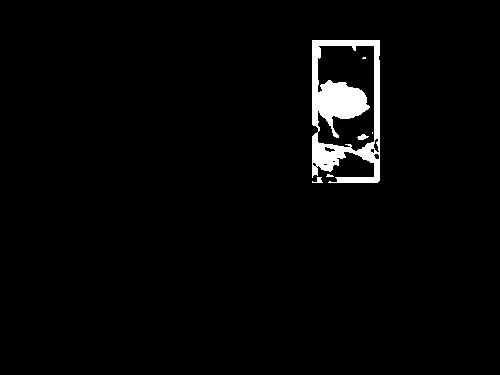

255
Image similarity: 0.9557522598546531


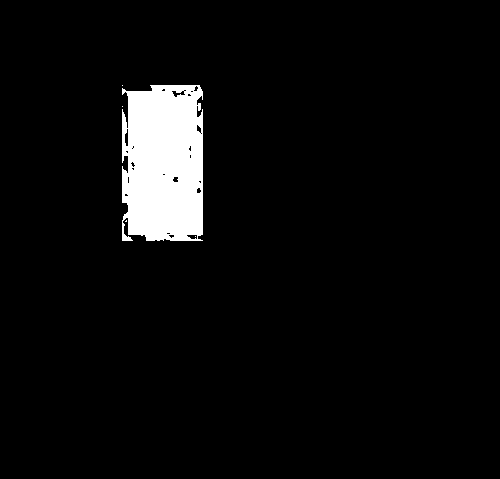

255
Image similarity: 0.9886984185539711


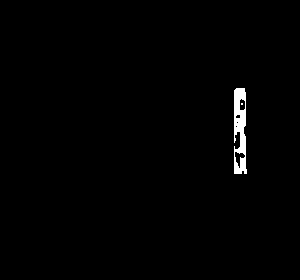

255
Image similarity: 0.8890708835996483


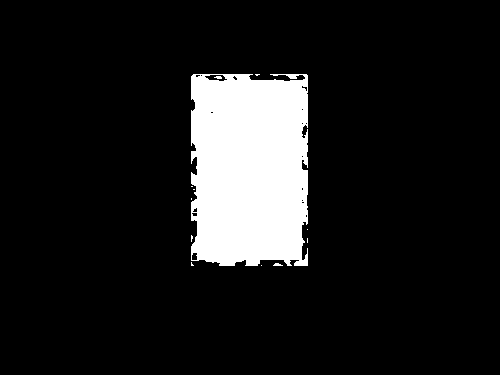

255
Image similarity: 0.9436603806543526


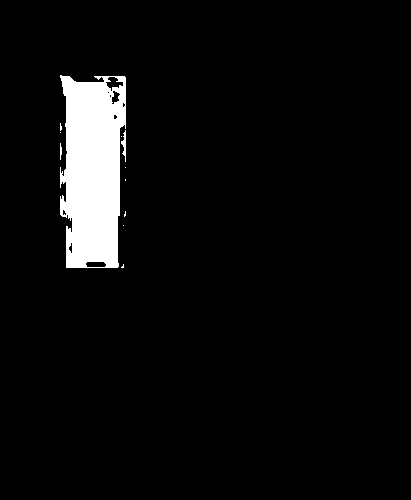

255
Image similarity: 0.9387975574137369


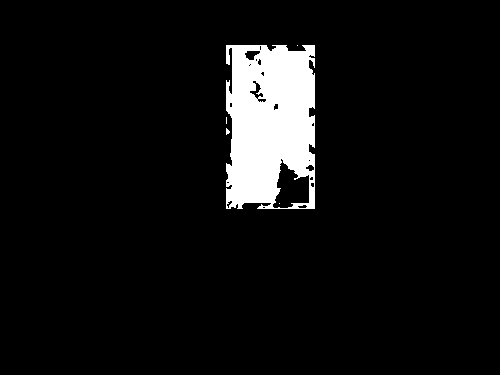

255
Image similarity: 0.9181715771178833


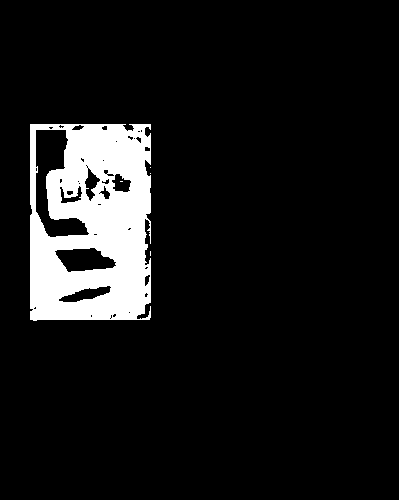

255
Image similarity: 0.9811335660478006


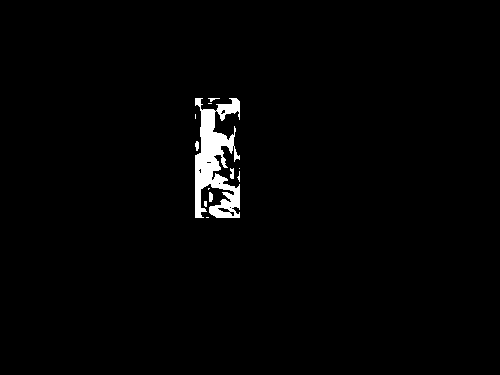

255
Image similarity: 0.9277371350909986


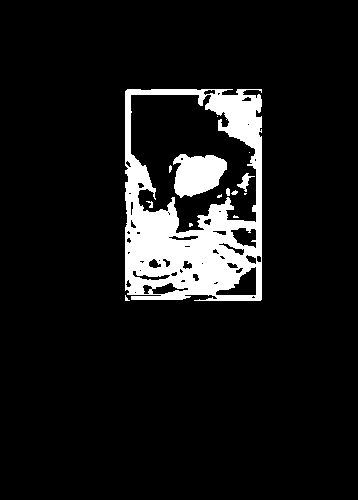

255
Image similarity: 0.8090118399237237


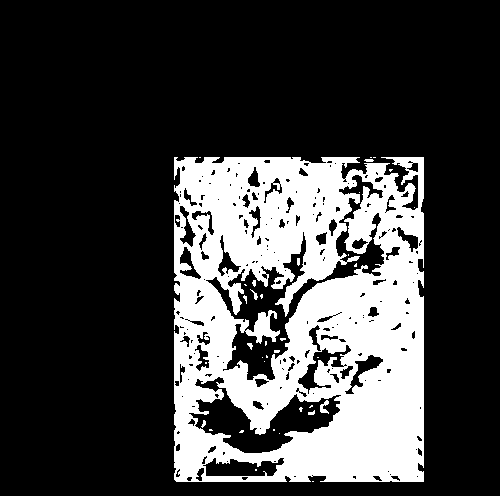

255
Image similarity: 0.9097802241755545


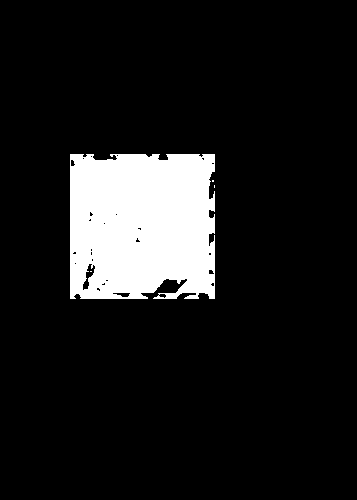

255
Image similarity: 0.9653318779663828


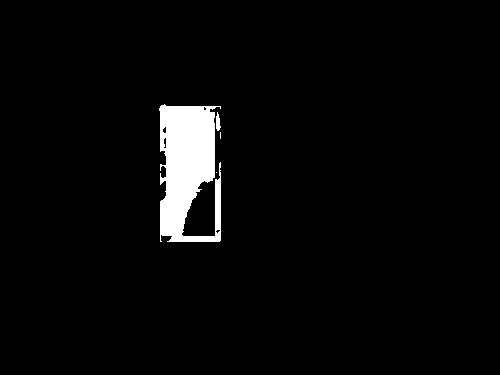

255
Image similarity: 0.9915126719961562


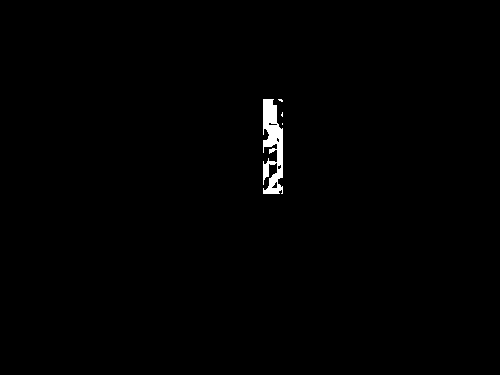

255
Image similarity: 0.767507390134529


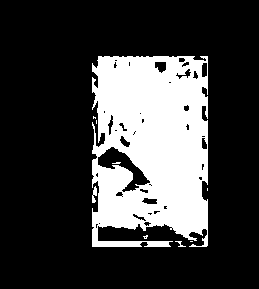

255
Image similarity: 0.8552419754006558


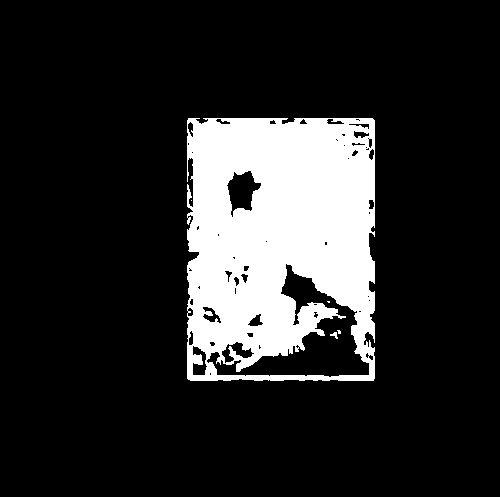

255
Image similarity: 0.8593044718134097


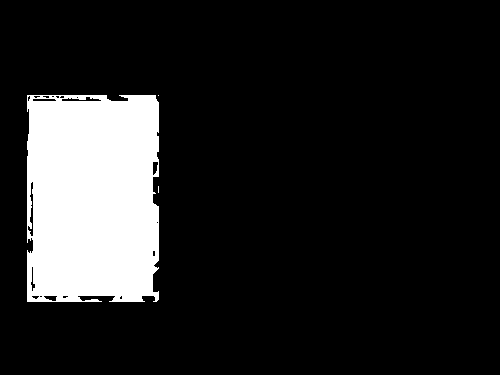

255
Image similarity: 0.977485009866813


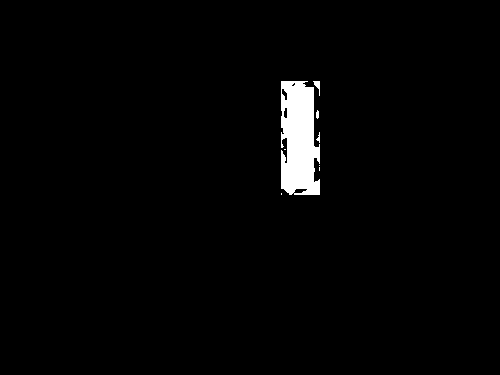

255
Image similarity: 0.9809075495379612


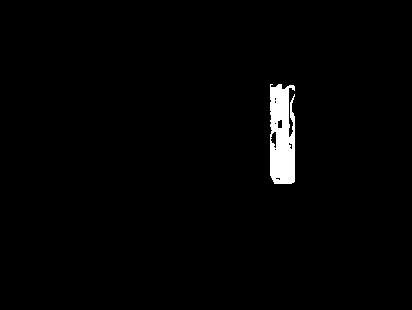

255
Image similarity: 0.9526437933901116


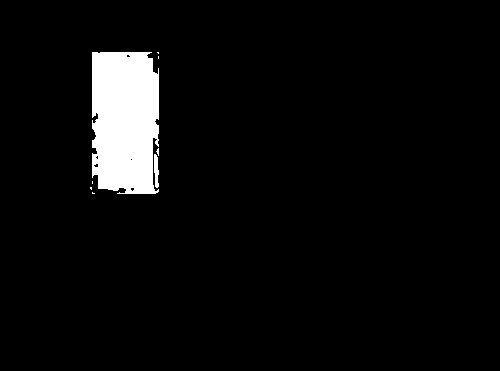

255
Image similarity: 0.9884031681157117


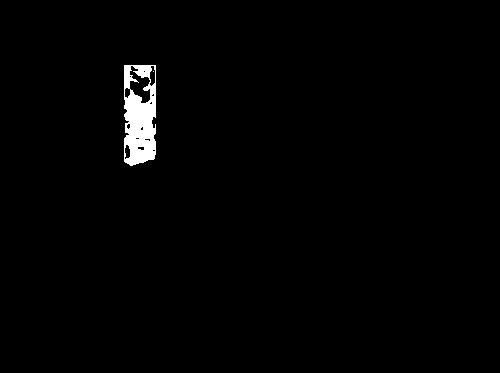

255
Image similarity: 0.9396933575996286


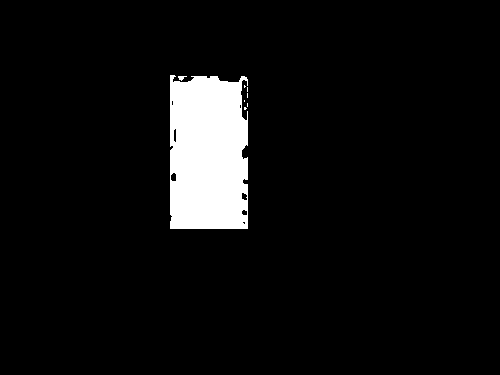

255
Image similarity: 0.8823283528243763


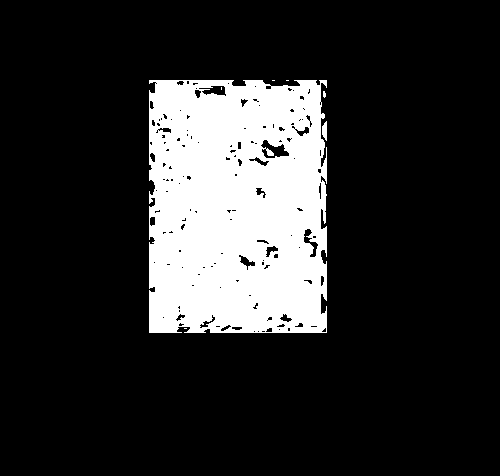

255
Image similarity: 0.95368366814529


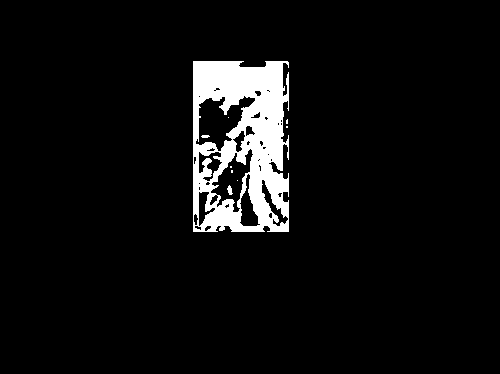

255
Image similarity: 0.9180459321837372


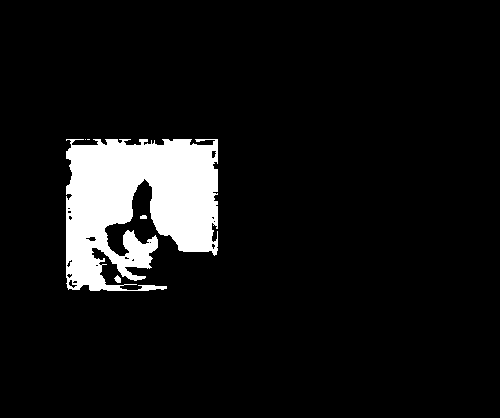

255
Image similarity: 0.9884145468793629


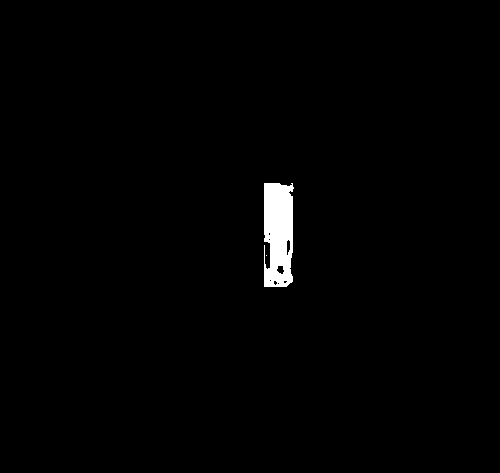

255
Image similarity: 0.9368416925719991


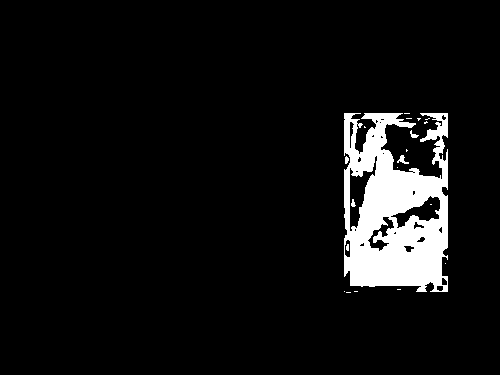

255
Image similarity: 0.9582600495358436


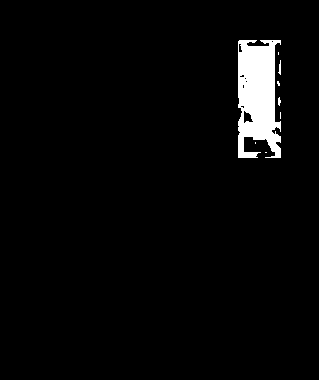

255
Image similarity: 0.8296677046235011


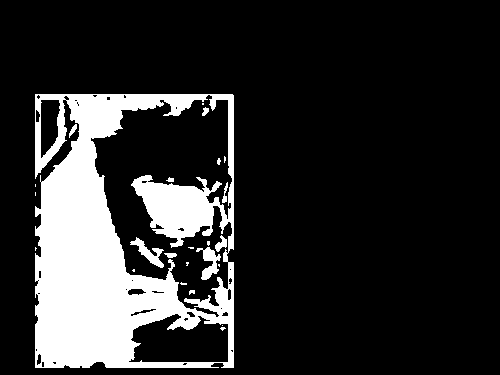

255
Image similarity: 0.8501847287505653


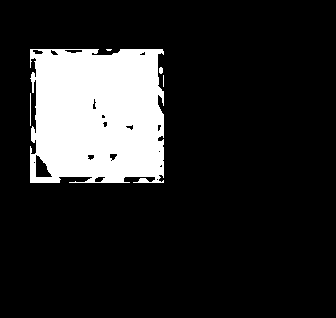

255
Image similarity: 0.9946663832980303


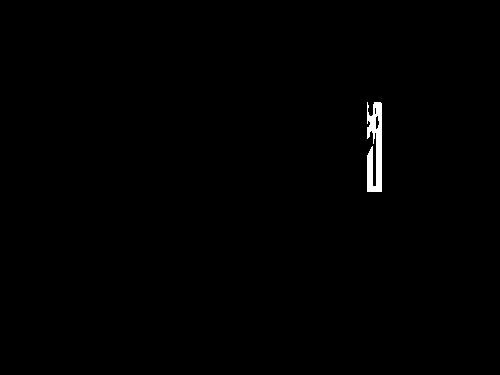

255
Image similarity: 0.9568443831478758


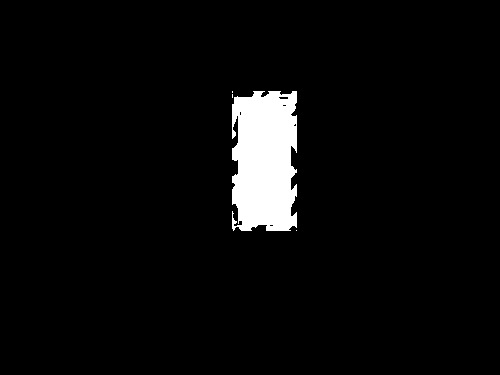

255
Image similarity: 0.8423099133570797


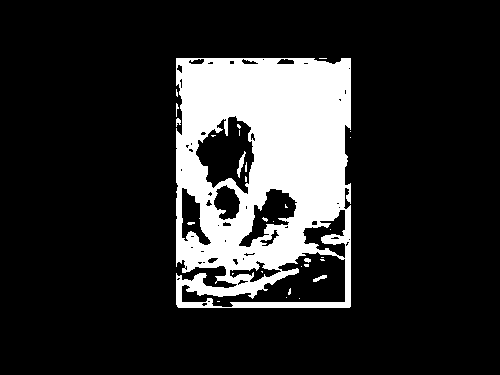

255
Image similarity: 0.9642139591138404


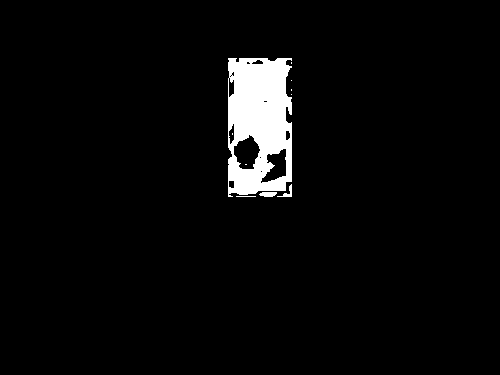

255
Image similarity: 0.8719919799404618


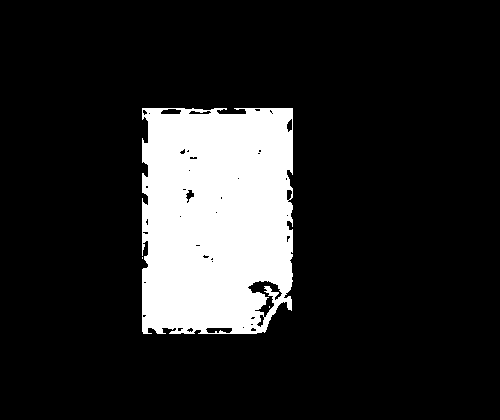

255
Image similarity: 0.9794491781079399


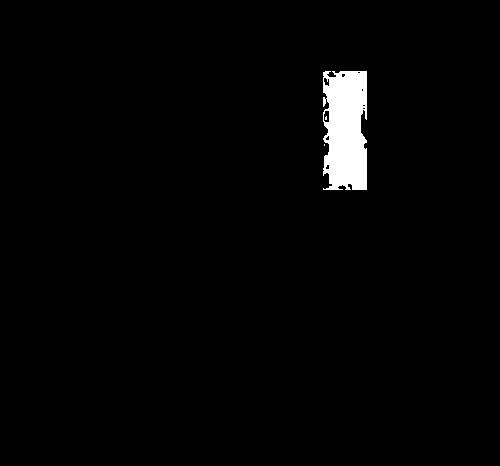

255
Image similarity: 0.9959398387134752


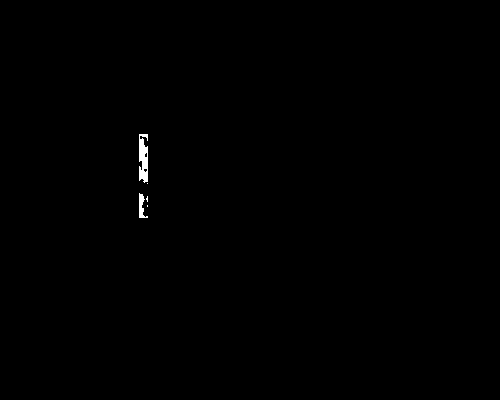

255
Image similarity: 0.9636922233704107


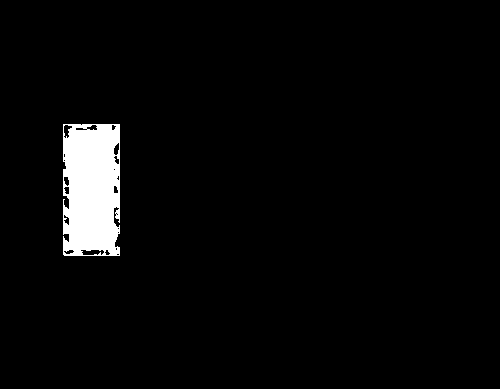

255
Image similarity: 0.9030401901660827


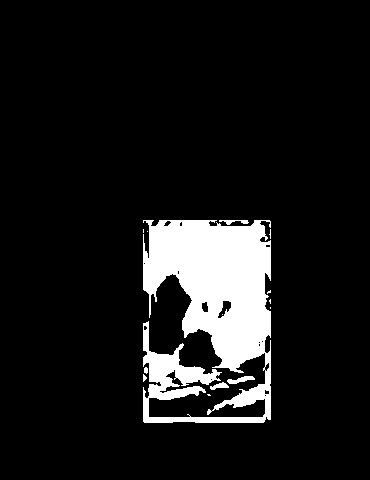

255
Image similarity: 0.8181157246953287


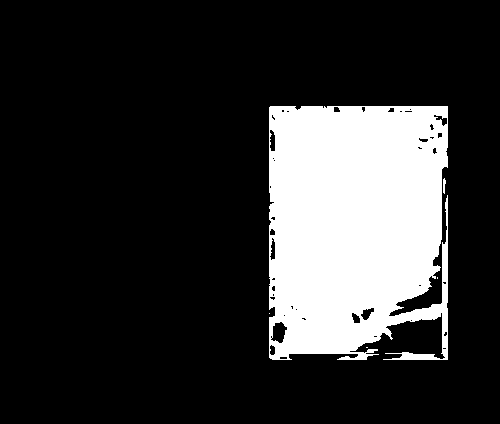

255
Image similarity: 0.8504298635330895


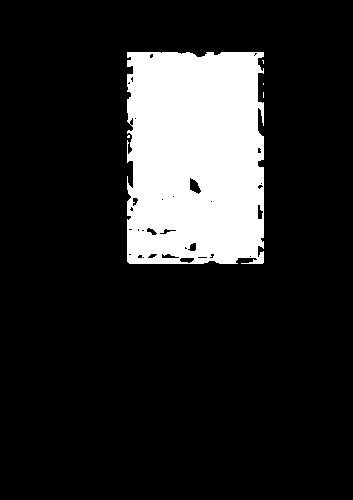

255
Image similarity: 0.9524661520625927


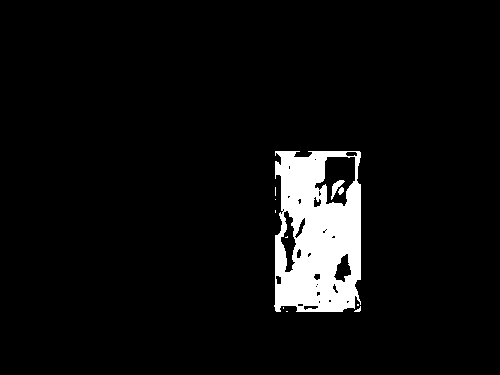

255
Image similarity: 0.9902050734679013


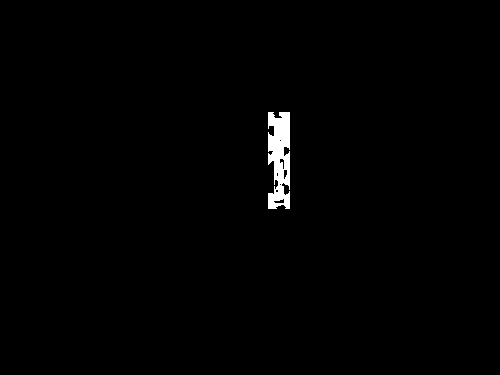

255
Image similarity: 0.9884564835123253


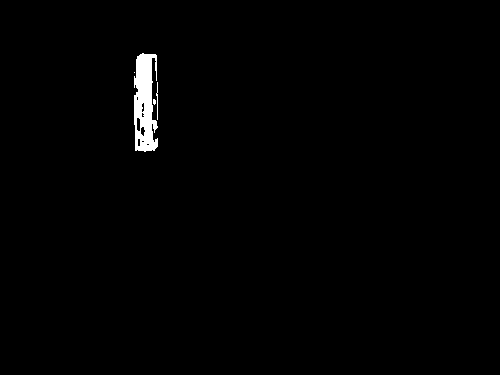

255
Image similarity: 0.9355637287684997


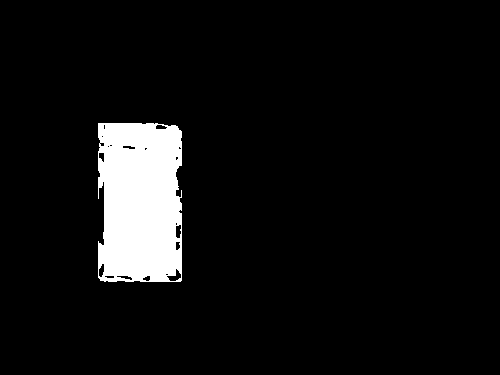

255
Image similarity: 0.8676913164397079


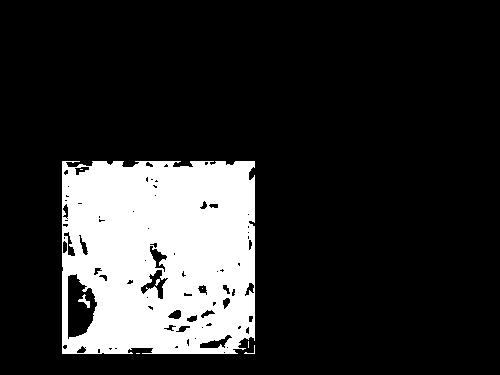

255
Image similarity: 0.9778872893125858


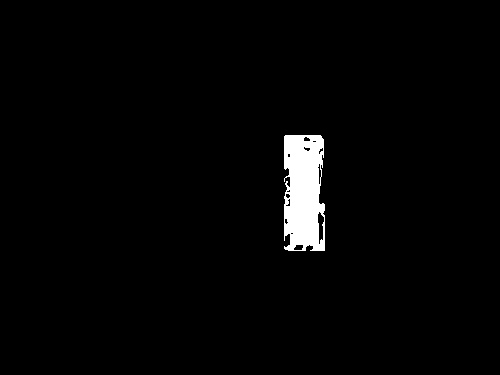

255
Image similarity: 0.9479862266747043


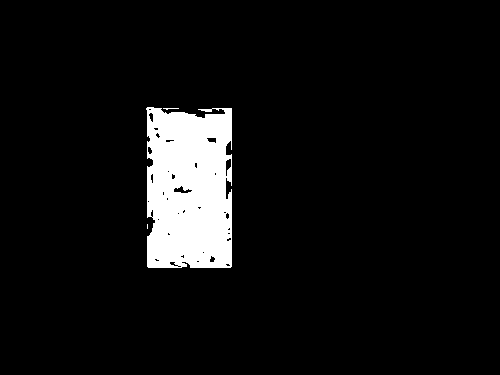

255
Image similarity: 0.9379152185930231


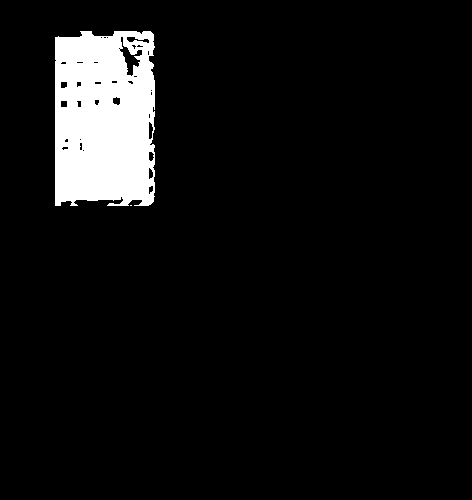

255
Image similarity: 0.9819826154691967


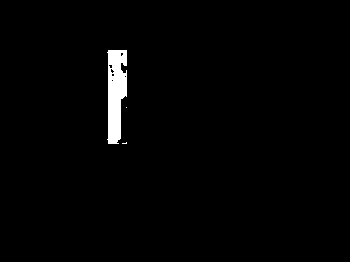

255
Image similarity: 0.8136683155313622


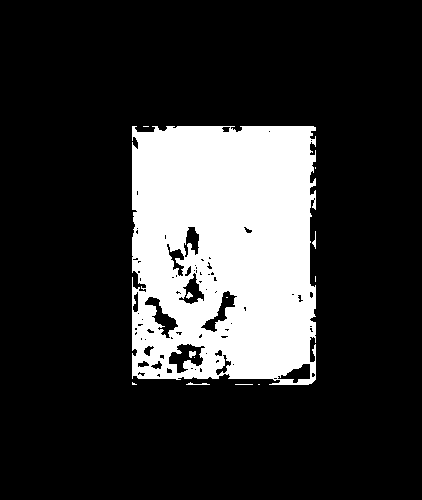

255
Image similarity: 0.766242230197416


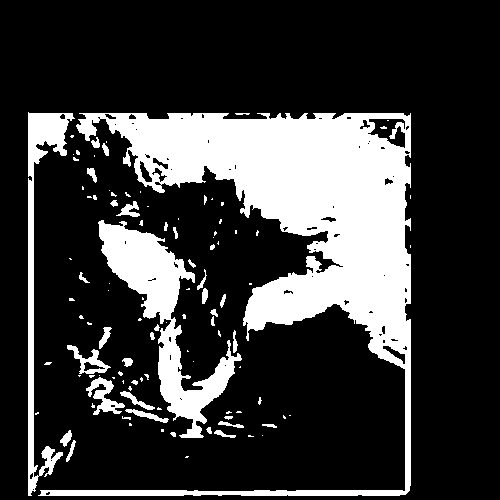

255
Image similarity: 0.9435985971766154


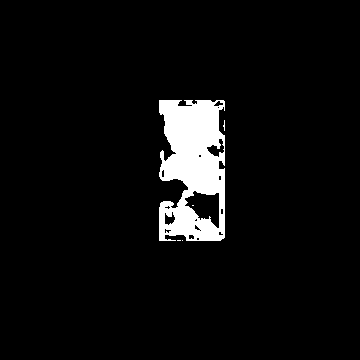

255
Image similarity: 0.9805947013215633


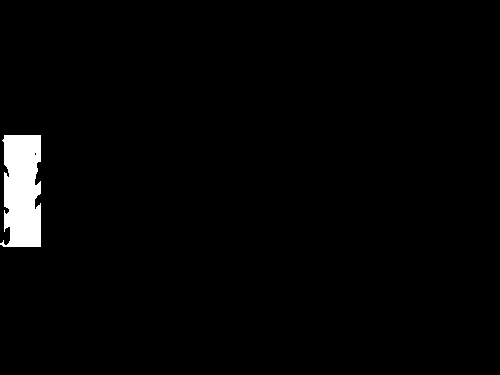

255
Image similarity: 0.9818484588241306


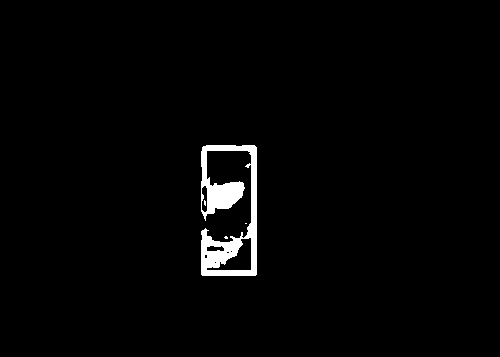

255
Image similarity: 0.9876484827334984


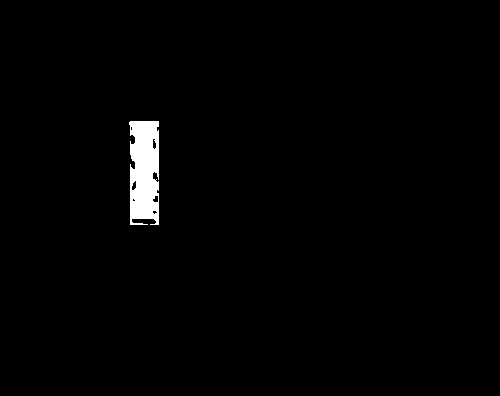

255
Image similarity: 0.9394087965854013


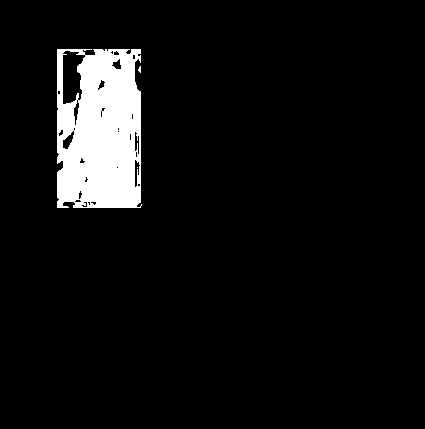

255
Image similarity: 0.8092410694729049


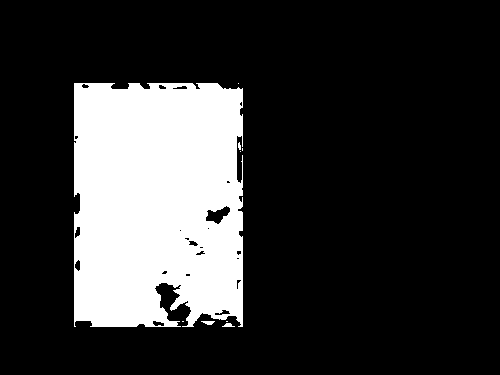

255
Image similarity: 0.9724740369145981


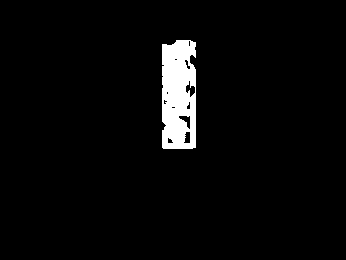

255
Image similarity: 0.978145152903174


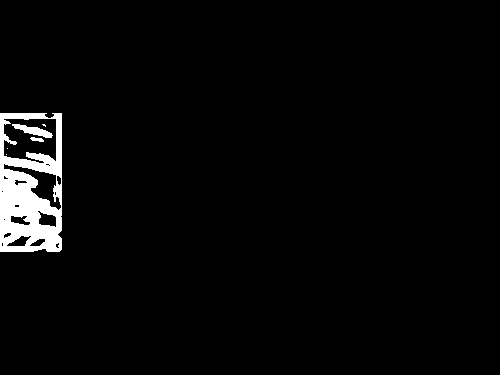

255
Image similarity: 0.8932115658688681


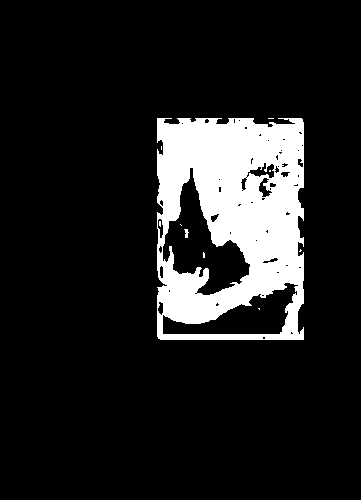

255
Image similarity: 0.9849027026579742


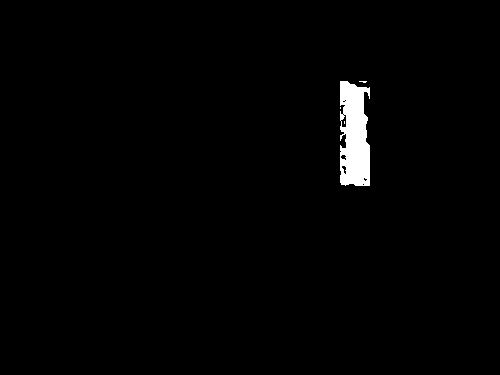

255
Image similarity: 0.9683762782646117


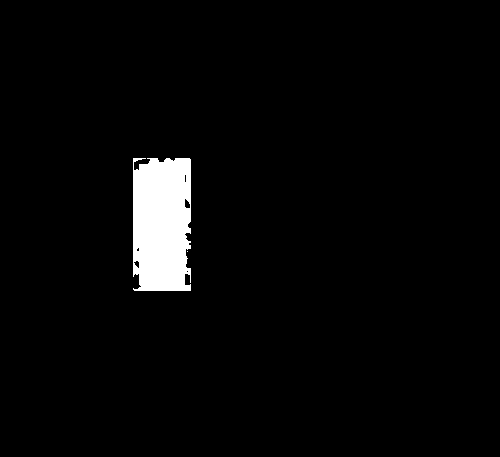

255
Image similarity: 0.9456255143251822


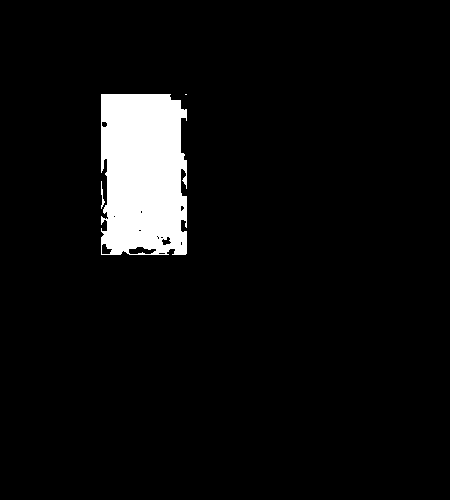

255
Image similarity: 0.97257020317796


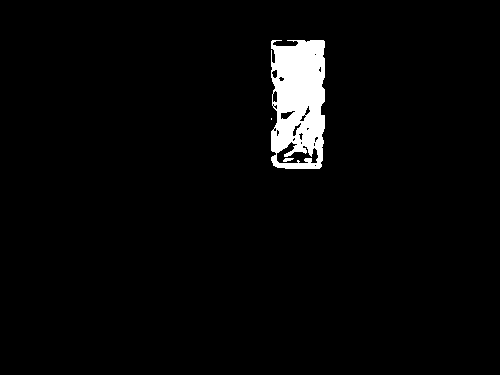

255
Image similarity: 0.9239364801177994


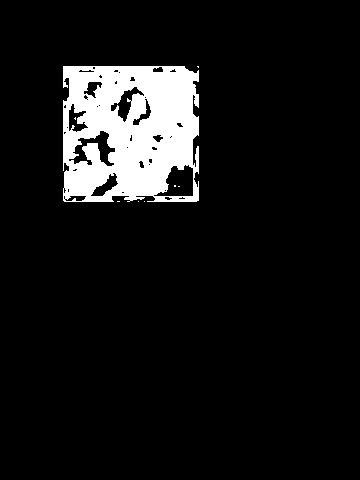

255
Image similarity: 0.9679035123716655


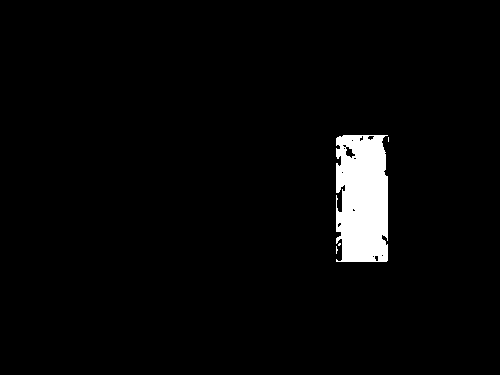

255
Image similarity: 0.95758297001349


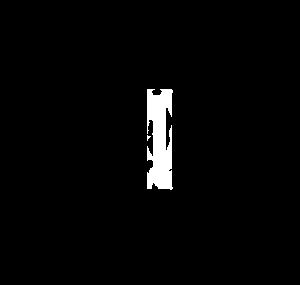

255
Image similarity: 0.9898373427329341


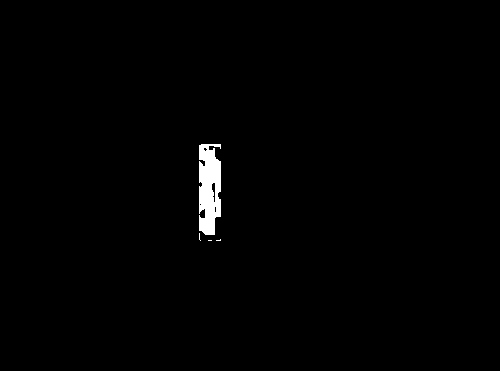

255
Image similarity: 0.8863982739665128


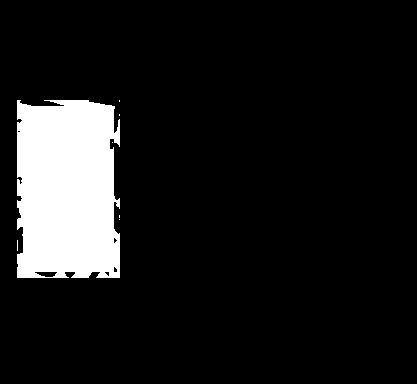

255
Image similarity: 0.9886740919887876


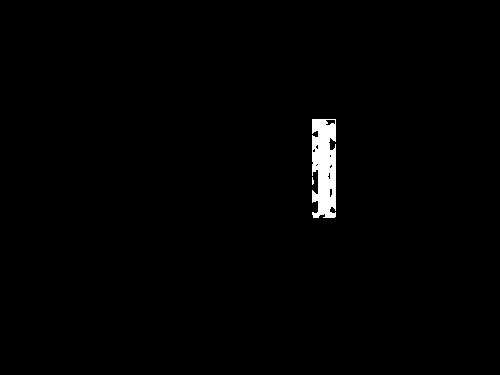

255
Image similarity: 0.9456771323384334


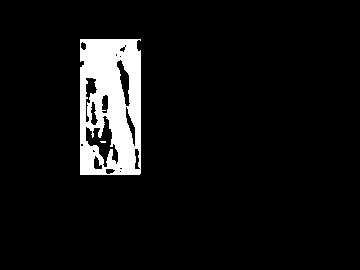

255
Image similarity: 0.974001196602942


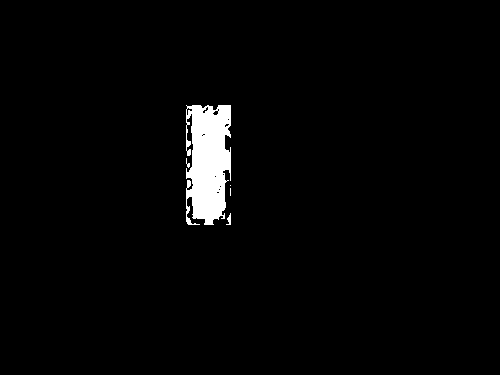

255
Image similarity: 0.9795940081328475


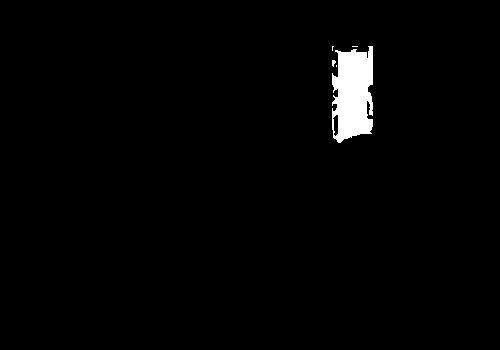

255
Image similarity: 0.9941382218064715


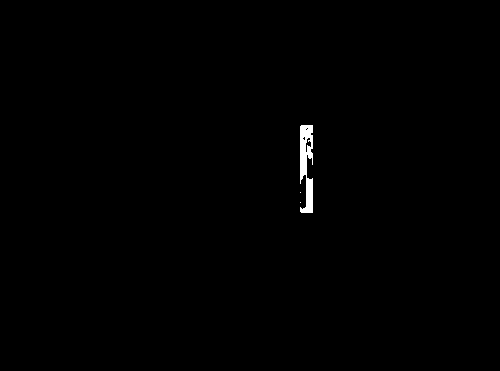

255
Image similarity: 0.912737579092091


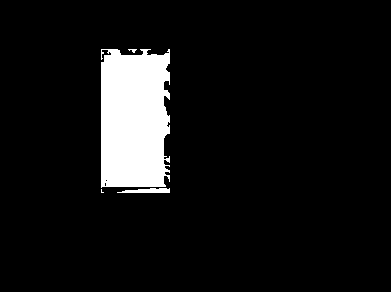

255
Image similarity: 0.9268304833325107


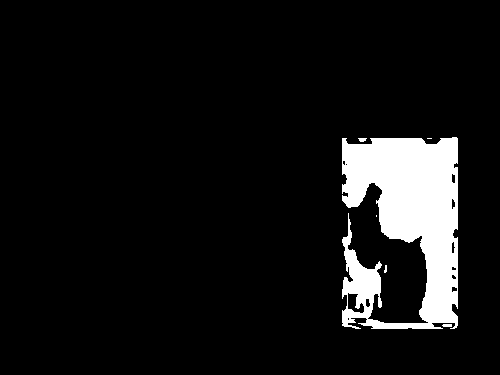

255
Image similarity: 0.930785087877697


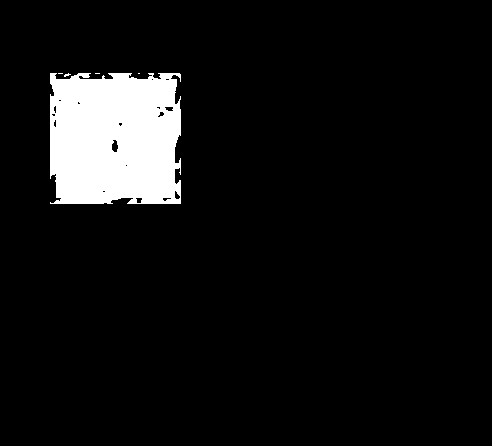

255
Image similarity: 0.9725541532117855


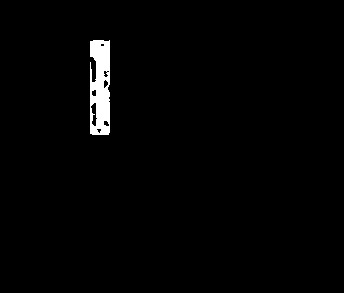

255
Image similarity: 0.9861916089006858


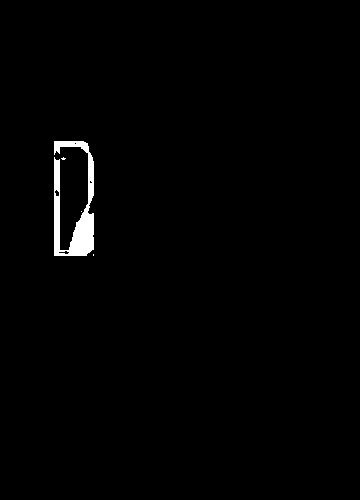

255
Image similarity: 0.9681449899688315


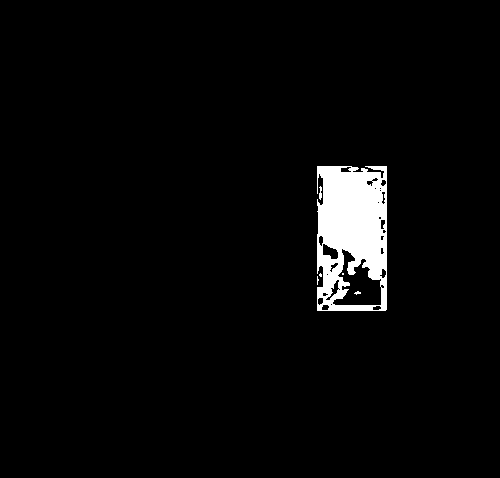

255
Image similarity: 0.9735450825543774


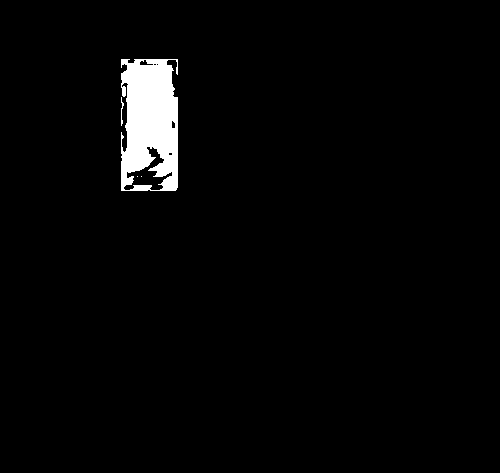

255
Image similarity: 0.9572661361807714


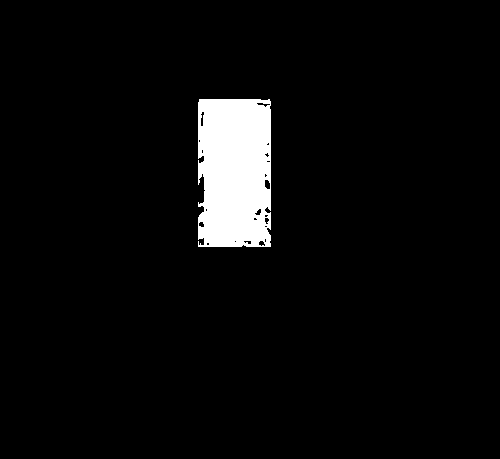

255
Image similarity: 0.9605132590792655


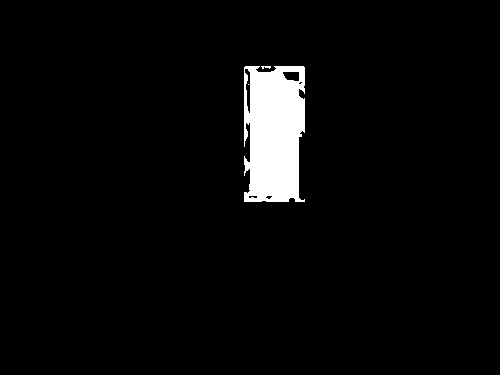

255
Image similarity: 0.9908352060154626


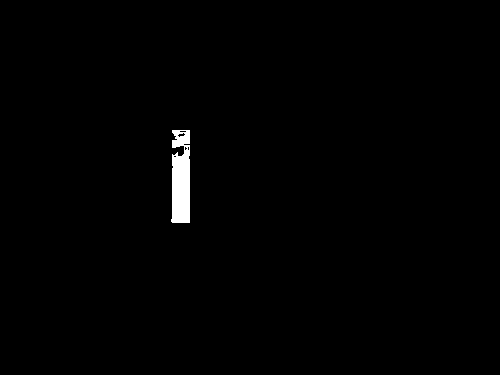

255
Image similarity: 0.9900685163191137


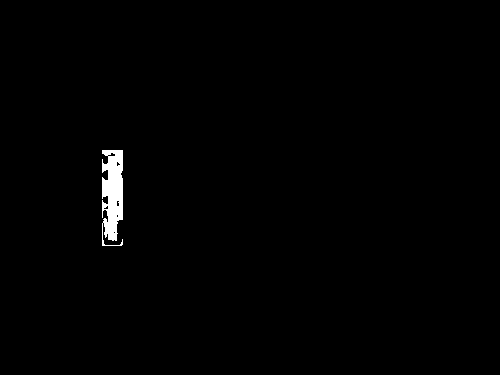

255
Image similarity: 0.943465703533798


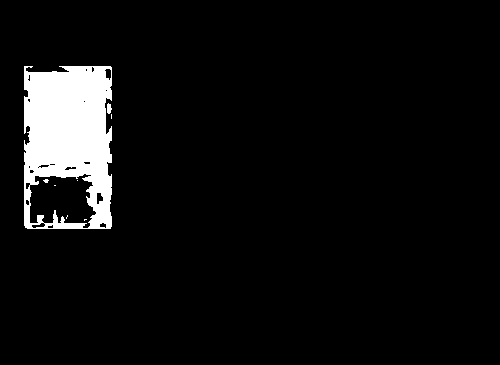

255
Image similarity: 0.9945773971239548


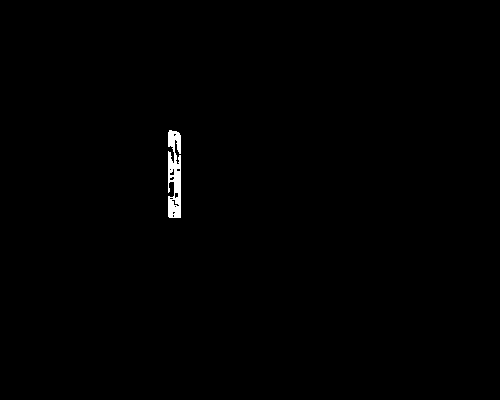

255
Image similarity: 0.9706230128754972


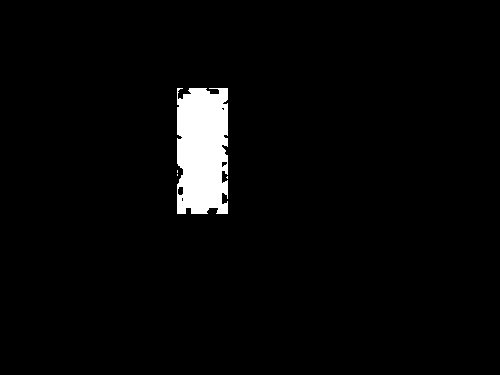

255
Image similarity: 0.907930992554513


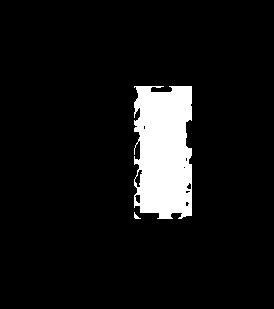

255
Image similarity: 0.915923181068866


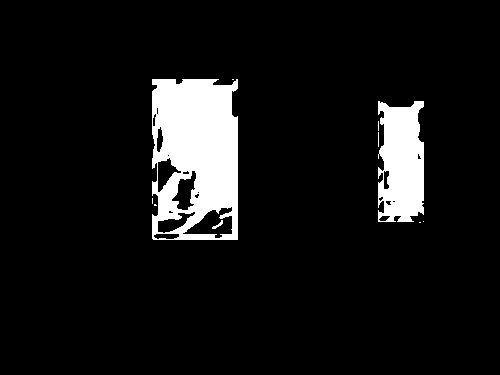

255
Image similarity: 0.940506972321208


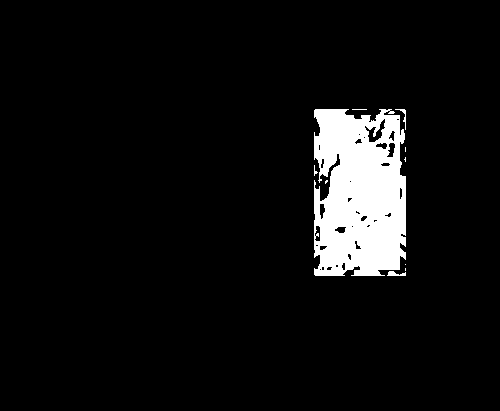

255
Image similarity: 0.9573246665909088


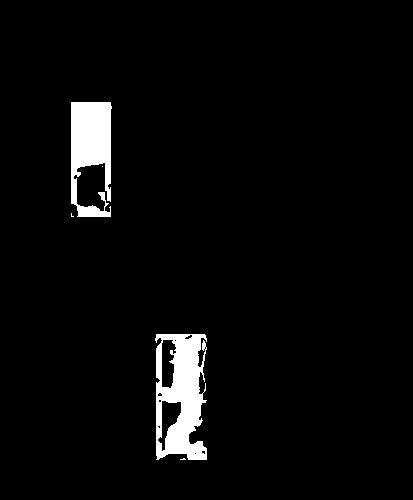

255
Image similarity: 0.9029425186731829


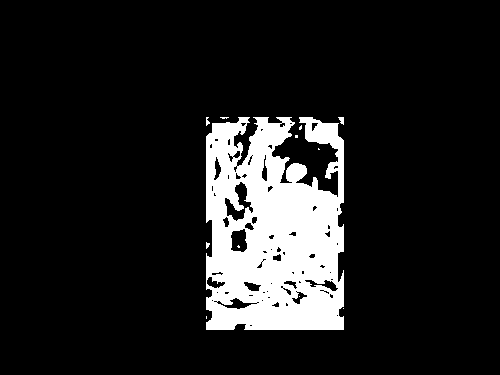

255
Image similarity: 0.9163980534904702


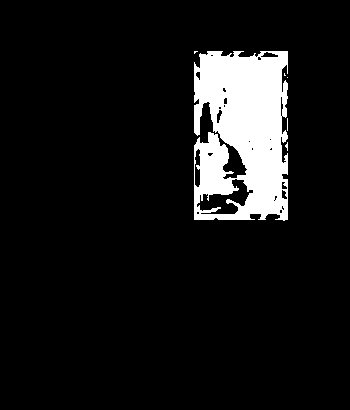

255
Image similarity: 0.6624847156444803


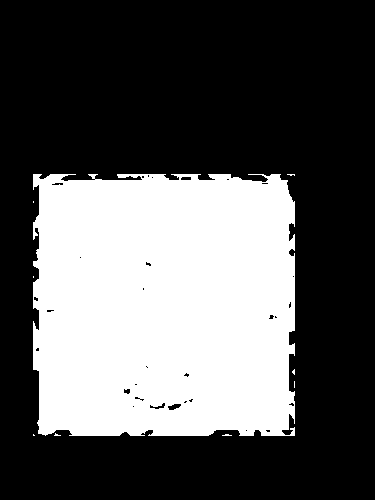

255
Image similarity: 0.9734920981358945


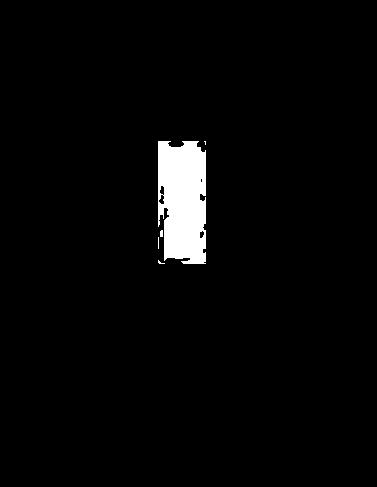

255
Image similarity: 0.9065296151961848


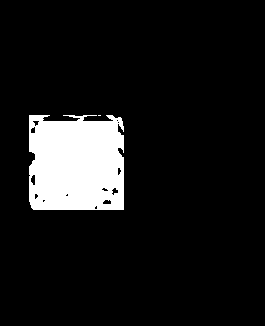

255
Image similarity: 0.9833481043166232


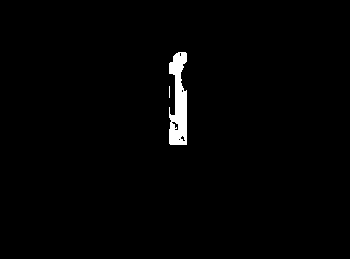

255
Image similarity: 0.9345747394909504


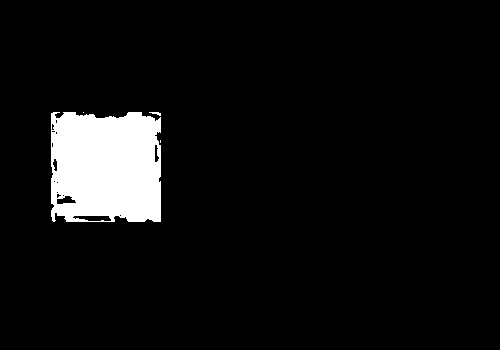

255
Image similarity: 0.7551376403121677


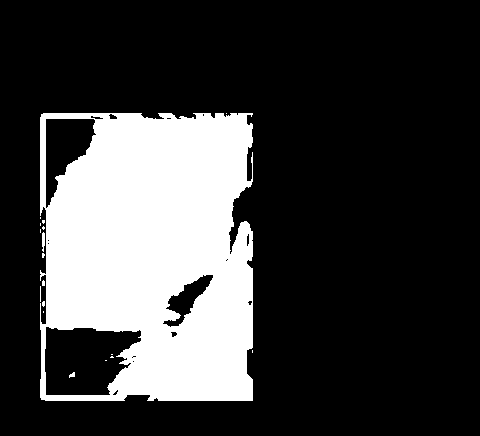

255
Image similarity: 0.9066284458402679


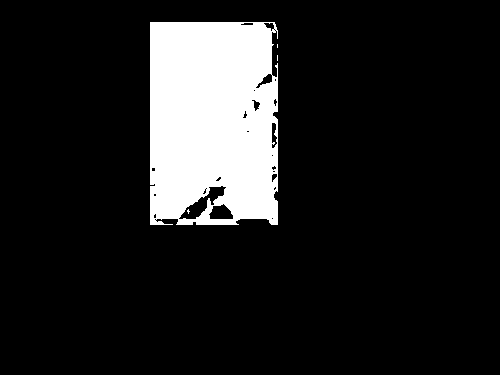

255
Image similarity: 0.8961703854853821


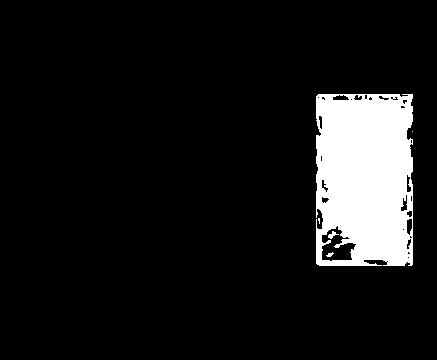

255
Image similarity: 0.8971968523807304


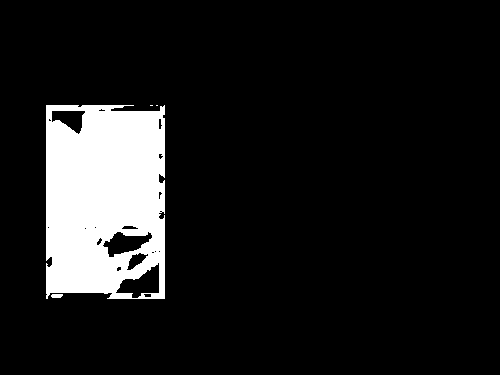

255
Image similarity: 0.9519255016275976


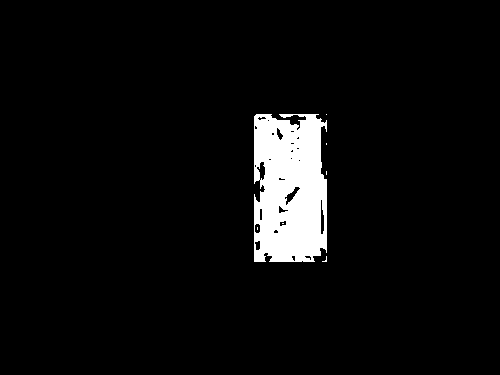

255
Image similarity: 0.9694085464073577


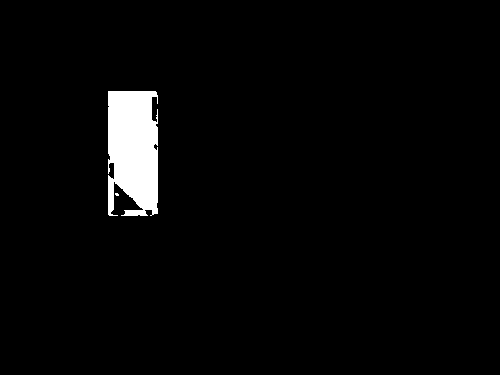

255
Image similarity: 0.644415628271414


255
Image similarity: 0.8785455876010457


255
Image similarity: 0.994712713107513


255
Image similarity: 0.9592530739724061


255
Image similarity: 0.9923032742488757


255
Image similarity: 0.9179916407715942


255
Image similarity: 0.9943253351617805


255
Image similarity: 0.8230562627972448


255
Image similarity: 0.9946601270387216


255
Image similarity: 0.9692552440553843


255
Image similarity: 0.8228607473854744


255
Image similarity: 0.9928661067894423


255
Image similarity: 0.9907399617485698


255
Image similarity: 0.8388512720184106


255
Image similarity: 0.9593381102091025


255
Image similarity: 0.89357550211512


255
Image similarity: 0.9779771849708493


255
Image similarity: 0.9431705223128268


255
Image similarity: 0.9815856193757438


255
Image similarity: 0.8806571341557223


255
Image similarity: 0.9929642605258429


255
Image similarity: 0.8855834338487071


255
Image similarity: 0.9542732312454236


255
Image similarity: 0.9876474744700623


255
Image similarity: 0.8976056809722287


255
Image similarity: 0.9437888740463213


255
Image similarity: 0.9016366756166754


255
Image similarity: 0.933437256238091


255
Image similarity: 0.9853728877416397


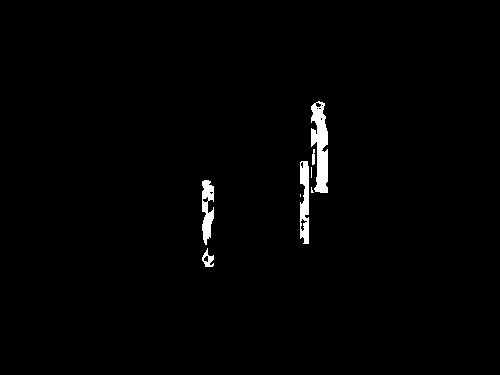

255
Image similarity: 0.9944215579685673


255
Image similarity: 0.9445740151465175


255
Image similarity: 0.9656222524514074


255
Image similarity: 0.9820905084626523


255
Image similarity: 0.996150510323135


255
Image similarity: 0.9383515670695628


255
Image similarity: 0.9583506287652314


255
Image similarity: 0.9616418732376011


255
Image similarity: 0.9596278023474736


255
Image similarity: 0.8389735088287934


255
Image similarity: 0.9785751623378013


255
Image similarity: 0.9096814603476103


255
Image similarity: 0.958234913918898


255
Image similarity: 0.8800055613639504


255
Image similarity: 0.9704907046709793


255
Image similarity: 0.8473773812941393


255
Image similarity: 0.9828494521317495


255
Image similarity: 0.9811240412490551


255
Image similarity: 0.9651535584097661


255
Image similarity: 0.9330109885801745


255
Image similarity: 0.9433912194655149


255
Image similarity: 0.8932273111115757


255
Image similarity: 0.9908037069092117


255
Image similarity: 0.9954154519411085


255
Image similarity: 0.8820985987199913


255
Image similarity: 0.9199448307417003


255
Image similarity: 0.9741533828800485


255
Image similarity: 0.9877467542496678


255
Image similarity: 0.8500092201991305


255
Image similarity: 0.9891309820495732


255
Image similarity: 0.9633419901581501


255
Image similarity: 0.9120761947503955


255
Image similarity: 0.988056824123463


255
Image similarity: 0.9911301223369919


255
Image similarity: 0.9861551002397887


255
Image similarity: 0.9059169605360246


255
Image similarity: 0.879472198869398


255
Image similarity: 0.9932108716889607


255
Image similarity: 0.9194124841016911


255
Image similarity: 0.9682052451509322


255
Image similarity: 0.9750319678376375


255
Image similarity: 0.9658630240432956


255
Image similarity: 0.8301111564231977


255
Image similarity: 0.9886044382168759


255
Image similarity: 0.9629687035455786


255
Image similarity: 0.9757498331185425


255
Image similarity: 0.953012157327814


255
Image similarity: 0.9749187814449395


255
Image similarity: 0.8218510140228712


255
Image similarity: 0.9548893358818699


255
Image similarity: 0.9867270593280664


255
Image similarity: 0.9897771382646002


255
Image similarity: 0.9672212089661245


255
Image similarity: 0.9735613537213735


255
Image similarity: 0.9848899427555925


255
Image similarity: 0.9400333771521469


255
Image similarity: 0.897898398973824


255
Image similarity: 0.957715286517917


255
Image similarity: 0.8826942867289576


255
Image similarity: 0.7942685427396626


255
Image similarity: 0.9727914026591642


255
Image similarity: 0.9893443587764348


255
Image similarity: 0.9917400012203157


255
Image similarity: 0.9089516521071517


255
Image similarity: 0.9822993344751055


255
Image similarity: 0.9794013366275608


255
Image similarity: 0.9641249498309298


255
Image similarity: 0.9947030001942512


255
Image similarity: 0.9685539878322629


255
Image similarity: 0.9696771162022138


255
Image similarity: 0.9723512800641104


255
Image similarity: 0.9246431177102682


255
Image similarity: 0.9871554602788501


255
Image similarity: 0.9795928893632693


255
Image similarity: 0.9169363117357561


255
Image similarity: 0.9657541500415686


255
Image similarity: 0.7957337935561634


255
Image similarity: 0.9095759408725237


255
Image similarity: 0.9854363824820658


255
Image similarity: 0.9589710490456615


255
Image similarity: 0.9877933416044626


255
Image similarity: 0.9776345841435652


255
Image similarity: 0.9954347526560151


255
Image similarity: 0.9418010755015735


255
Image similarity: 0.9841616626311002


255
Image similarity: 0.8758099608869647


255
Image similarity: 0.9484296725106112


255
Image similarity: 0.9710676733788038


255
Image similarity: 0.982191342251987


255
Image similarity: 0.9898717090744577


255
Image similarity: 0.9890463632062662


255
Image similarity: 0.799561286141657


255
Image similarity: 0.9940466037693405


255
Image similarity: 0.9211549052363713


255
Image similarity: 0.9091577155576656


255
Image similarity: 0.9774644436791171


255
Image similarity: 0.9213411812783211


255
Image similarity: 0.9657174689376651


255
Image similarity: 0.9120222676981872


255
Image similarity: 0.9143498308355805


255
Image similarity: 0.982381932646284


255
Image similarity: 0.9844629273731531


255
Image similarity: 0.8779266396063735


255
Image similarity: 0.9729831864376004


255
Image similarity: 0.8954578489873382


255
Image similarity: 0.9771637661593177


255
Image similarity: 0.9637608527658612


255
Image similarity: 0.9738588104890962


255
Image similarity: 0.9501565151235783


255
Image similarity: 0.9881267404981219


255
Image similarity: 0.9259862257147797


255
Image similarity: 0.9236358183524452


255
Image similarity: 0.9857791204734782


255
Image similarity: 0.8612299257014352


255
Image similarity: 0.9833470003670258


255
Image similarity: 0.9952571975054867


255
Image similarity: 0.9319827930590472


255
Image similarity: 0.8110860863670039


255
Image similarity: 0.9232794135247112


255
Image similarity: 0.975614112340385


255
Image similarity: 0.7975621384818384


255
Image similarity: 0.8809314607742008


255
Image similarity: 0.971668377099812


255
Image similarity: 0.8537281836711946


255
Image similarity: 0.8205821360806278


255
Image similarity: 0.9248916676850971


255
Image similarity: 0.9795161636630494


255
Image similarity: 0.9736083019106097


255
Image similarity: 0.9903873285156174


255
Image similarity: 0.8530118150765859


255
Image similarity: 0.9131535713202297


255
Image similarity: 0.9526166550208609


255
Image similarity: 0.8662900081544748


255
Image similarity: 0.9602490639499701


255
Image similarity: 0.9658324113791352


255
Image similarity: 0.9659289296838727


255
Image similarity: 0.9926983025193854


255
Image similarity: 0.8169734117511908


255
Image similarity: 0.7964445155259192


255
Image similarity: 0.950837728728724


255
Image similarity: 0.9405535392548084


255
Image similarity: 0.9238072073874071


255
Image similarity: 0.988254787655445


255
Image similarity: 0.9845881812072196


255
Image similarity: 0.8827556689198186


255
Image similarity: 0.9432256406951807


255
Image similarity: 0.9745484909315019


255
Image similarity: 0.9848400217387089


255
Image similarity: 0.9565095453513377


255
Image similarity: 0.9780591956588713


255
Image similarity: 0.9041905645533601


255
Image similarity: 0.9601822358093927


255
Image similarity: 0.9387613828373055


255
Image similarity: 0.9811132578906048


255
Image similarity: 0.927282655612566


255
Image similarity: 0.9733507596630345


255
Image similarity: 0.9542639977748993


255
Image similarity: 0.8801115867353184


255
Image similarity: 0.9662344505850239


255
Image similarity: 0.9230472468638811


255
Image similarity: 0.9833361083884745


255
Image similarity: 0.9812152764020518


255
Image similarity: 0.8706522832086854


255
Image similarity: 0.9586620228979417


255
Image similarity: 0.9561726338664852


255
Image similarity: 0.8742533900190272


255
Image similarity: 0.9559290527317185


255
Image similarity: 0.9628045478407652


255
Image similarity: 0.9656898552190738


255
Image similarity: 0.9840949656947042


255
Image similarity: 0.9559060802361833


255
Image similarity: 0.9915099712784925


255
Image similarity: 0.8809515788419938


255
Image similarity: 0.9664167030616928


255
Image similarity: 0.9075849101309592


255
Image similarity: 0.9502726977975559


255
Image similarity: 0.9779099582170595


255
Image similarity: 0.9754936316485113


255
Image similarity: 0.958410227372329


255
Image similarity: 0.9917570808084357


255
Image similarity: 0.9018427300882249


255
Image similarity: 0.9808037142489958


255
Image similarity: 0.7466091787049276


255
Image similarity: 0.9933168060581817


255
Image similarity: 0.9722212312470371


255
Image similarity: 0.9930123251267478


255
Image similarity: 0.9714301487066481


255
Image similarity: 0.9599635700058086


255
Image similarity: 0.9411907657507682


255
Image similarity: 0.9522538473083353


255
Image similarity: 0.9468793763936153


255
Image similarity: 0.9765334325619164


255
Image similarity: 0.9596713197087017


255
Image similarity: 0.9953825456212759


255
Image similarity: 0.924757722063715


255
Image similarity: 0.9286925029590747


255
Image similarity: 0.9724594538132051


255
Image similarity: 0.9917204402682931


255
Image similarity: 0.9493912947705186


255
Image similarity: 0.9709786694773335


255
Image similarity: 0.9693982281532939


255
Image similarity: 0.8383189520293751


255
Image similarity: 0.9792140988497147


255
Image similarity: 0.9944059438042063


255
Image similarity: 0.9475400851093725


255
Image similarity: 0.9610503129698887


255
Image similarity: 0.9085493634201638


255
Image similarity: 0.9768305373567512


255
Image similarity: 0.9517895469454698


255
Image similarity: 0.8620426039288852


255
Image similarity: 0.9941878002840243


255
Image similarity: 0.979834433983401


255
Image similarity: 0.9753025658292764


255
Image similarity: 0.9811741808144981


255
Image similarity: 0.8930214833872231


255
Image similarity: 0.8616950184094802


255
Image similarity: 0.9190657767997154


255
Image similarity: 0.8881921723081407


255
Image similarity: 0.8984143381972042


255
Image similarity: 0.927618646352617


255
Image similarity: 0.9286002641285396


255
Image similarity: 0.9760683907737643


255
Image similarity: 0.9709315922397311


255
Image similarity: 0.9708072695767185


255
Image similarity: 0.9726414108090344


255
Image similarity: 0.933248433868505


255
Image similarity: 0.8671531410204265


255
Image similarity: 0.8879007152646119


255
Image similarity: 0.9118440251511694


255
Image similarity: 0.9438373394367917


255
Image similarity: 0.7727076935892074


255
Image similarity: 0.794087428194289


255
Image similarity: 0.9526602824161235


255
Image similarity: 0.9831933322172325


255
Image similarity: 0.991359732092811


255
Image similarity: 0.8798258721315679


255
Image similarity: 0.9577640102118128


255
Image similarity: 0.8356327300580778


255
Image similarity: 0.8656439115745641


255
Image similarity: 0.875084514607866


255
Image similarity: 0.9854412827722732


255
Image similarity: 0.9726489905487563


255
Image similarity: 0.9413521124349734


255
Image similarity: 0.8325353206438858


255
Image similarity: 0.8257074607681512


255
Image similarity: 0.9803481923038185


255
Image similarity: 0.8802540575396149


255
Image similarity: 0.9603887956979057


255
Image similarity: 0.9868740908583478


255
Image similarity: 0.7648697447288484


255
Image similarity: 0.9730276230917362


255
Image similarity: 0.8774947841432199


255
Image similarity: 0.9351589609219434


255
Image similarity: 0.8898461456192794


255
Image similarity: 0.9875986791173054


255
Image similarity: 0.9860502231147751


255
Image similarity: 0.9349880416411261


255
Image similarity: 0.9937504178945799


255
Image similarity: 0.9591857610261657


255
Image similarity: 0.9428586760388055


255
Image similarity: 0.9863663147712407


255
Image similarity: 0.9446320659817892


255
Image similarity: 0.9735755511378802


255
Image similarity: 0.9660485866832802


255
Image similarity: 0.9784980122450916


255
Image similarity: 0.9228839638900854


255
Image similarity: 0.8486867053266827


255
Image similarity: 0.888372207833673


255
Image similarity: 0.993282985141681


255
Image similarity: 0.9936264739276326


255
Image similarity: 0.9927171638507554


255
Image similarity: 0.9565789701804186


255
Image similarity: 0.9782139658400295


255
Image similarity: 0.9765809357918863


255
Image similarity: 0.9447164807041306


255
Image similarity: 0.7462388789444229


255
Image similarity: 0.8538722877841798


255
Image similarity: 0.9779505619934749


255
Image similarity: 0.6545044227909261


255
Image similarity: 0.9535350661166705


255
Image similarity: 0.8473592155358454


255
Image similarity: 0.881154135835837


255
Image similarity: 0.9236136620500536


255
Image similarity: 0.9454530049770669


255
Image similarity: 0.9752187615289242


255
Image similarity: 0.9754211535173134


255
Image similarity: 0.9541452247362747


255
Image similarity: 0.9785791014005136


255
Image similarity: 0.9309620490934767


255
Image similarity: 0.9470324164218712


255
Image similarity: 0.7883360303306828


255
Image similarity: 0.9928747041908398


255
Image similarity: 0.9778620322929255


255
Image similarity: 0.9388748068074888


255
Image similarity: 0.8730305611607658


255
Image similarity: 0.9657194349614573


255
Image similarity: 0.9870993219159206


255
Image similarity: 0.9235570855351495


255
Image similarity: 0.9356042234362388


255
Image similarity: 0.9391763547620395


255
Image similarity: 0.9908605090171604


255
Image similarity: 0.9813975346020154


255
Image similarity: 0.9941309102039615


255
Image similarity: 0.9129851318955342


255
Image similarity: 0.9810700942400058


255
Image similarity: 0.9513327500277411


255
Image similarity: 0.9379278913784895


255
Image similarity: 0.9151198732735694


255
Image similarity: 0.9696095633309685


255
Image similarity: 0.8587419976802236


255
Image similarity: 0.9627790594927991


255
Image similarity: 0.7782349577741542


255
Image similarity: 0.987963340599802


255
Image similarity: 0.9914247271524911


255
Image similarity: 0.9034297834358883


255
Image similarity: 0.9945488053118449


255
Image similarity: 0.9665407136515717


255
Image similarity: 0.9906350904547453


255
Image similarity: 0.9843235961860908


255
Image similarity: 0.9435523055785723


255
Image similarity: 0.8286104802046677


255
Image similarity: 0.9828083484741291


255
Image similarity: 0.9619363731842607


255
Image similarity: 0.9321995939964691


255
Image similarity: 0.992678668393764


255
Image similarity: 0.9173053892190479


255
Image similarity: 0.8863519246397064


255
Image similarity: 0.9959889075248155


255
Image similarity: 0.940928206633209


255
Image similarity: 0.9931759442657624


255
Image similarity: 0.9085052034091716


255
Image similarity: 0.8347042688659825


255
Image similarity: 0.8981979512702336


255
Image similarity: 0.9621867253224119


255
Image similarity: 0.9691979210087147


255
Image similarity: 0.9907894686632515


255
Image similarity: 0.9714941632004509


255
Image similarity: 0.8293719298700808


255
Image similarity: 0.8079982562969177


255
Image similarity: 0.9897935227419763


255
Image similarity: 0.961303095930973


255
Image similarity: 0.8080779615786159


255
Image similarity: 0.9934153068817317


255
Image similarity: 0.9684632403822717


255
Image similarity: 0.9655111889901667


255
Image similarity: 0.8718334218280438


255
Image similarity: 0.9328570397300144


255
Image similarity: 0.9291293978833985


255
Image similarity: 0.9828801161008216


255
Image similarity: 0.9824557637688499


255
Image similarity: 0.9743470907243169


255
Image similarity: 0.9157589205151637


255
Image similarity: 0.9634738438908396


255
Image similarity: 0.945672643328983


255
Image similarity: 0.9871756641089546


255
Image similarity: 0.9501048022555305


255
Image similarity: 0.9234088569584463


255
Image similarity: 0.8999061158499123


255
Image similarity: 0.8735710333424836


255
Image similarity: 0.9454733423796384


255
Image similarity: 0.9780511389310155


255
Image similarity: 0.9375093446608315


255
Image similarity: 0.9636811564905451


255
Image similarity: 0.9323587972091568


255
Image similarity: 0.9785930882828268


255
Image similarity: 0.9836104220833931


255
Image similarity: 0.8968851499341282


255
Image similarity: 0.9422400299334575


255
Image similarity: 0.7103597582638383


255
Image similarity: 0.931051635398074


255
Image similarity: 0.9855998331742617


255
Image similarity: 0.9326082172941338


255
Image similarity: 0.8806929839770344


255
Image similarity: 0.8661382373461738


255
Image similarity: 0.9167296684664703


255
Image similarity: 0.9606630769126187


255
Image similarity: 0.985579232444802


255
Image similarity: 0.9769364422484028


255
Image similarity: 0.9468101355478136


255
Image similarity: 0.9830875973826867


255
Image similarity: 0.8940100238454146


255
Image similarity: 0.9000534466591538


255
Image similarity: 0.9330774574321727


255
Image similarity: 0.9529390073071009


255
Image similarity: 0.9270779468701587


255
Image similarity: 0.9628391698324782


255
Image similarity: 0.9484440837023917


255
Image similarity: 0.8914728028019947


255
Image similarity: 0.8836846309878019


255
Image similarity: 0.8916572725615267


255
Image similarity: 0.9021222016703323


255
Image similarity: 0.954697177906664


255
Image similarity: 0.9848834052016264


255
Image similarity: 0.8528377036107534


255
Image similarity: 0.9711775726451023


255
Image similarity: 0.9657412595915199


255
Image similarity: 0.9447241148622421


255
Image similarity: 0.9729746575936711


255
Image similarity: 0.9895348052843885


255
Image similarity: 0.8559485209075425


255
Image similarity: 0.9435310497135003


255
Image similarity: 0.9288903890444908


255
Image similarity: 0.963492933911046


255
Image similarity: 0.8870004328453741


255
Image similarity: 0.8730387041067484


255
Image similarity: 0.8573364171378428


255
Image similarity: 0.9888781088511096


255
Image similarity: 0.7205324324043815


255
Image similarity: 0.9799189540672016


255
Image similarity: 0.5869699993542782


255
Image similarity: 0.9828053863951839


255
Image similarity: 0.9593826570245425


255
Image similarity: 0.9831227224452931


255
Image similarity: 0.9560442254696497


255
Image similarity: 0.9426493998839762


255
Image similarity: 0.9262613290955019


255
Image similarity: 0.9848449820664507


255
Image similarity: 0.870519261613641


255
Image similarity: 0.9173210236004312


255
Image similarity: 0.9808016812666283


255
Image similarity: 0.9536783583115958


255
Image similarity: 0.9945816305800048


255
Image similarity: 0.9103808849127989


255
Image similarity: 0.9020269360619663


255
Image similarity: 0.9393609578145667


255
Image similarity: 0.8654302337607946


255
Image similarity: 0.9604597418458622


255
Image similarity: 0.923569314834593


255
Image similarity: 0.910284566743408


255
Image similarity: 0.920676161204865


255
Image similarity: 0.9938729190345161


255
Image similarity: 0.9828078565840566


255
Image similarity: 0.9979389618511894


255
Image similarity: 0.7862496285358201


255
Image similarity: 0.8833935247719104


255
Image similarity: 0.9802511244012317


255
Image similarity: 0.9591420994942266


255
Image similarity: 0.9679661289614071


255
Image similarity: 0.9789565391965238


255
Image similarity: 0.9803664474263503


255
Image similarity: 0.9883748978942226


255
Image similarity: 0.9464178686659885


255
Image similarity: 0.9676163472337115


255
Image similarity: 0.8945060197013772


255
Image similarity: 0.929008853827776


255
Image similarity: 0.9917056303961483


255
Image similarity: 0.985243057745434


255
Image similarity: 0.9785659280673875


255
Image similarity: 0.9734320470693855


255
Image similarity: 0.9100050587465534


255
Image similarity: 0.9689373453086478


255
Image similarity: 0.9866162718582858


255
Image similarity: 0.9191498584238199


255
Image similarity: 0.9397215802736757


255
Image similarity: 0.8021212668528283


255
Image similarity: 0.8426142515703712


255
Image similarity: 0.9068402459112354


255
Image similarity: 0.9923457593933207


255
Image similarity: 0.7857228830587556


255
Image similarity: 0.8811230200692955


255
Image similarity: 0.9768504494984999


255
Image similarity: 0.9732576553792711


255
Image similarity: 0.9706385998323132


255
Image similarity: 0.9055773217391992


255
Image similarity: 0.900414687646475


255
Image similarity: 0.9569413333629254


255
Image similarity: 0.6862446632416488


255
Image similarity: 0.8509516919298605


255
Image similarity: 0.9328388229819405


255
Image similarity: 0.9797487371873365


255
Image similarity: 0.9535496360932727


255
Image similarity: 0.9558865856814494


255
Image similarity: 0.9231473212226752


255
Image similarity: 0.9687767893110931


255
Image similarity: 0.915898956549226


255
Image similarity: 0.9731615381542618


255
Image similarity: 0.9572505472711543


255
Image similarity: 0.9577843576871281


255
Image similarity: 0.9931823977081624


255
Image similarity: 0.9588780282617111


255
Image similarity: 0.6743552133592092


255
Image similarity: 0.9456026066343476


255
Image similarity: 0.8955076277970818


255
Image similarity: 0.8482716170248451


255
Image similarity: 0.8981956554111376


255
Image similarity: 0.8945478920309282


255
Image similarity: 0.9286123735570121


255
Image similarity: 0.9630310190078605


255
Image similarity: 0.9779682129995069


255
Image similarity: 0.9499497359860789


255
Image similarity: 0.9649790032801898


255
Image similarity: 0.9871209440327022


255
Image similarity: 0.9903221635888061


255
Image similarity: 0.7746704579078021


255
Image similarity: 0.9767122860928582


255
Image similarity: 0.9850999318255829


255
Image similarity: 0.9739193440720487


255
Image similarity: 0.9915525409633708


255
Image similarity: 0.9253747111717362


255
Image similarity: 0.9644528941777363


255
Image similarity: 0.9002980863821314


255
Image similarity: 0.9125631027554559


255
Image similarity: 0.6971646488695582


255
Image similarity: 0.9426783908601362


255
Image similarity: 0.9473815300787402


255
Image similarity: 0.9875366158987122


255
Image similarity: 0.8304149060092972


255
Image similarity: 0.927717017992702


255
Image similarity: 0.9792144477348539


255
Image similarity: 0.9221504177102577


255
Image similarity: 0.9787042115994189


255
Image similarity: 0.9267879465308186


255
Image similarity: 0.9547003711369972


255
Image similarity: 0.8907411267794134


255
Image similarity: 0.9044481727301357


255
Image similarity: 0.8471082321311567


255
Image similarity: 0.9800680334604381


255
Image similarity: 0.9157622364956997


255
Image similarity: 0.8953544272113755


255
Image similarity: 0.956014719034842


255
Image similarity: 0.9772615982195276


255
Image similarity: 0.8856856046895826


255
Image similarity: 0.9032494329942119


255
Image similarity: 0.9321616977420749


255
Image similarity: 0.8960751272117349


255
Image similarity: 0.9948532362298568


255
Image similarity: 0.9864823351905608


255
Image similarity: 0.9739592419343805


255
Image similarity: 0.683390630845967


255
Image similarity: 0.9283275099804176


255
Image similarity: 0.9237091434399318


255
Image similarity: 0.9354402741342477


255
Image similarity: 0.9743704537731923


255
Image similarity: 0.8291535928455424


255
Image similarity: 0.975527095191768


255
Image similarity: 0.7872901093776197


255
Image similarity: 0.9688329721943134


255
Image similarity: 0.9918585378254123


255
Image similarity: 0.9047375432166611


255
Image similarity: 0.756660683558161


255
Image similarity: 0.9322782806249941


255
Image similarity: 0.9629939221565883


255
Image similarity: 0.9696737926581289


255
Image similarity: 0.9373792349498195


255
Image similarity: 0.9614754333872457


255
Image similarity: 0.9896209549711195


255
Image similarity: 0.8424737366392343


255
Image similarity: 0.995022543732932


255
Image similarity: 0.9433795121914397


255
Image similarity: 0.9886266587622219


255
Image similarity: 0.9797621825122785


255
Image similarity: 0.9793050732128026


255
Image similarity: 0.9791926607075581


255
Image similarity: 0.9884446907945755


255
Image similarity: 0.9362370286364698


255
Image similarity: 0.7832698719656456


255
Image similarity: 0.9912399733048818


255
Image similarity: 0.9573483792124744


255
Image similarity: 0.8250965959950612


255
Image similarity: 0.9617323973795391


255
Image similarity: 0.8974389834417634


255
Image similarity: 0.8970456721571183


255
Image similarity: 0.8586537263066497


255
Image similarity: 0.89217243624616


255
Image similarity: 0.8726876934252569


255
Image similarity: 0.895121604928548


255
Image similarity: 0.9825181090974469


255
Image similarity: 0.9318077493463545


255
Image similarity: 0.9811597661089467


255
Image similarity: 0.8352687601974438


255
Image similarity: 0.949025616649588


255
Image similarity: 0.9399980494828234


255
Image similarity: 0.9736633237529899


255
Image similarity: 0.8504674714945019


255
Image similarity: 0.8555688082875799


255
Image similarity: 0.832267555017623


255
Image similarity: 0.8073033547436455


255
Image similarity: 0.8518174833386789


255
Image similarity: 0.9758180958684872


255
Image similarity: 0.9907948464842693


255
Image similarity: 0.9762173643315717


255
Image similarity: 0.9794498222949083


255
Image similarity: 0.9564510214956111


255
Image similarity: 0.9914614507090941


255
Image similarity: 0.9806675859726466


255
Image similarity: 0.9752070542662038


255
Image similarity: 0.9462202457165977


255
Image similarity: 0.958799665995692


255
Image similarity: 0.9264393652273392


255
Image similarity: 0.9062193780676924


255
Image similarity: 0.9806529063730619


255
Image similarity: 0.9733080231280666


255
Image similarity: 0.8874402727091195


255
Image similarity: 0.9728760886116795


255
Image similarity: 0.9906624499718656


255
Image similarity: 0.8492509481917112


255
Image similarity: 0.9862942284849551


255
Image similarity: 0.952409675168396


255
Image similarity: 0.8054560689997808


255
Image similarity: 0.944406107239795


255
Image similarity: 0.9815264926831245


255
Image similarity: 0.9844254066822624


255
Image similarity: 0.9423727663777677


255
Image similarity: 0.8457013202538705


255
Image similarity: 0.9548746024874045


255
Image similarity: 0.9117190926479745


255
Image similarity: 0.9865648619196636


255
Image similarity: 0.990402525292321


255
Image similarity: 0.9707315176245868


255
Image similarity: 0.9425337417463628


255
Image similarity: 0.9954716679615311


255
Image similarity: 0.9053602840165759


255
Image similarity: 0.9843295758108717


255
Image similarity: 0.9129255525948726


255
Image similarity: 0.9504787094731186


255
Image similarity: 0.8437937087097107


255
Image similarity: 0.988016005604378


255
Image similarity: 0.9808363488589795


255
Image similarity: 0.9908942783098181


255
Image similarity: 0.9771547264702581


255
Image similarity: 0.799809212757235


255
Image similarity: 0.942315886959685


255
Image similarity: 0.8925547896948939


255
Image similarity: 0.9779329453424145


255
Image similarity: 0.9194766173022167


255
Image similarity: 0.9454095868768172


255
Image similarity: 0.9541347918007081


255
Image similarity: 0.9260556003442038


255
Image similarity: 0.9495641344421748


255
Image similarity: 0.9838072465519065


255
Image similarity: 0.9918589526192462


255
Image similarity: 0.9924228152585566


255
Image similarity: 0.9552049465681768


255
Image similarity: 0.9784321046545674


255
Image similarity: 0.692728863623012


255
Image similarity: 0.9877371515668426


255
Image similarity: 0.895344003792579


255
Image similarity: 0.9538781533391205


255
Image similarity: 0.995812720615584


255
Image similarity: 0.9966839751792241


255
Image similarity: 0.9835001193144471


255
Image similarity: 0.9690543221456563


255
Image similarity: 0.9350108964937938


255
Image similarity: 0.9648785507634844


255
Image similarity: 0.9867413917778689


255
Image similarity: 0.6992726450481965


255
Image similarity: 0.986548522925718


255
Image similarity: 0.964175749159727


255
Image similarity: 0.8751988325446913


255
Image similarity: 0.9883736053842722


255
Image similarity: 0.7489071789735414


255
Image similarity: 0.9807754218775918


255
Image similarity: 0.9596972888138605


255
Image similarity: 0.9671212373471341


255
Image similarity: 0.9047231397885094


255
Image similarity: 0.915118682389977


255
Image similarity: 0.9531547911008895


255
Image similarity: 0.9935895926683194


255
Image similarity: 0.9640177839245399


255
Image similarity: 0.9672931505931928


255
Image similarity: 0.9620027564157805


255
Image similarity: 0.9794195677271056


255
Image similarity: 0.9953877117215569


255
Image similarity: 0.9446715760415129


255
Image similarity: 0.99298037709376


255
Image similarity: 0.9931919140647766


255
Image similarity: 0.9378252996495986


255
Image similarity: 0.986265288930722


255
Image similarity: 0.9009993270465474


255
Image similarity: 0.984556851468287


255
Image similarity: 0.8342016612827415


255
Image similarity: 0.9425316107440549


255
Image similarity: 0.9834414796189304


255
Image similarity: 0.9051361279453909


255
Image similarity: 0.8724163803709506


255
Image similarity: 0.8346716339387288


255
Image similarity: 0.9886331931922621


255
Image similarity: 0.9307713628966838


255
Image similarity: 0.9668043984658846


255
Image similarity: 0.9837865208887475


255
Image similarity: 0.9767849206219898


255
Image similarity: 0.9819324368673132


255
Image similarity: 0.8098161325291561


255
Image similarity: 0.897517085154576


255
Image similarity: 0.9339815117774916


255
Image similarity: 0.9663061677227613


255
Image similarity: 0.9476651904132597


255
Image similarity: 0.9737037267941214


255
Image similarity: 0.9946304147861195


255
Image similarity: 0.9700256619551326


255
Image similarity: 0.99380222038082


255
Image similarity: 0.8780892430345112


255
Image similarity: 0.9141513369177039


255
Image similarity: 0.8380451139679296


255
Image similarity: 0.925972547946483


255
Image similarity: 0.9639328785838703


255
Image similarity: 0.9838005135689513


255
Image similarity: 0.7716618489839425


255
Image similarity: 0.9728874892635448


255
Image similarity: 0.9137796772420974


255
Image similarity: 0.9928253571851097


255
Image similarity: 0.9467777579974572


255
Image similarity: 0.977016025868167


255
Image similarity: 0.9472516311611788


255
Image similarity: 0.9921051479673245


255
Image similarity: 0.9508844816427447


255
Image similarity: 0.9870987088502787


255
Image similarity: 0.950227991561772


255
Image similarity: 0.9256838592548879


255
Image similarity: 0.9743831109078698


255
Image similarity: 0.9686054127237282


255
Image similarity: 0.9883386355721093


255
Image similarity: 0.9924086827465396


255
Image similarity: 0.7647617821340152


255
Image similarity: 0.8365574489035373


255
Image similarity: 0.9852307346886188


255
Image similarity: 0.9820088715366901


255
Image similarity: 0.9873970669463409


255
Image similarity: 0.9602384218143817


255
Image similarity: 0.9658720406655613


255
Image similarity: 0.9676618271959316


255
Image similarity: 0.9359117975749386


255
Image similarity: 0.9718755136418504


255
Image similarity: 0.964466953983499


255
Image similarity: 0.9870964029380209


255
Image similarity: 0.9560825901238514


255
Image similarity: 0.8355875365745812


255
Image similarity: 0.9595882536062373


255
Image similarity: 0.9484597704316927


255
Image similarity: 0.9576684908812172


255
Image similarity: 0.8988171228527466


255
Image similarity: 0.9765255063095296


255
Image similarity: 0.9590553791678831


255
Image similarity: 0.7910555807948864


255
Image similarity: 0.9815887893008177


255
Image similarity: 0.9879970277536959


255
Image similarity: 0.9426908600115552


255
Image similarity: 0.9939398835539879


255
Image similarity: 0.9924299460132013


255
Image similarity: 0.9940645660511371


255
Image similarity: 0.989299220331085


255
Image similarity: 0.8887943633950381


255
Image similarity: 0.9817699061899834


255
Image similarity: 0.8929997737546035


255
Image similarity: 0.9716895191732164


255
Image similarity: 0.8321351224301561


255
Image similarity: 0.9731506721499846


255
Image similarity: 0.9586020868572054


255
Image similarity: 0.86997669168551


255
Image similarity: 0.9583231157384362


255
Image similarity: 0.9142605655023502


255
Image similarity: 0.7509943827055053


255
Image similarity: 0.978594057598706


255
Image similarity: 0.9088007221556218


255
Image similarity: 0.8765299033237609


255
Image similarity: 0.981603613596975


255
Image similarity: 0.8453687908865182


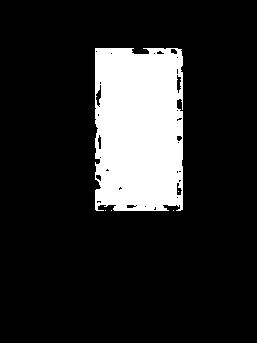

255
Image similarity: 0.9915546504764263


255
Image similarity: 0.9830399575552493


255
Image similarity: 0.9579864063566206


255
Image similarity: 0.9811179346310832


255
Image similarity: 0.8837849215968202


255
Image similarity: 0.962582119357713


255
Image similarity: 0.931915693147815


255
Image similarity: 0.9587434416172395


255
Image similarity: 0.9070305051979007


255
Image similarity: 0.9601682113985778


255
Image similarity: 0.9321854862454504


255
Image similarity: 0.7773473674471368


255
Image similarity: 0.9762530345644906


255
Image similarity: 0.9282506198172811


255
Image similarity: 0.8829344764662709


255
Image similarity: 0.944384900578413


255
Image similarity: 0.6789649030074468


255
Image similarity: 0.9771328395995957


255
Image similarity: 0.8811375814898905


255
Image similarity: 0.9393996574860759


255
Image similarity: 0.7782963515202942


255
Image similarity: 0.9871456137975108


255
Image similarity: 0.988838898359675


255
Image similarity: 0.9553193896126497


255
Image similarity: 0.8916588575531457


255
Image similarity: 0.9027137081251974


255
Image similarity: 0.9848144963674617


255
Image similarity: 0.9854686387339654


255
Image similarity: 0.9924474404967961


255
Image similarity: 0.9480880753242574


255
Image similarity: 0.9800857509438464


255
Image similarity: 0.91084509224585


255
Image similarity: 0.9207659327583823


255
Image similarity: 0.8895943954203697


255
Image similarity: 0.991161981320497


255
Image similarity: 0.8768254994131772


255
Image similarity: 0.9809624736628229


255
Image similarity: 0.9791330548948525


255
Image similarity: 0.9733757701837009


255
Image similarity: 0.9383260987516343


255
Image similarity: 0.9558097742162494


255
Image similarity: 0.9870770438022834


255
Image similarity: 0.9103415826323283


255
Image similarity: 0.9732112208830944


255
Image similarity: 0.9819607728142495


255
Image similarity: 0.9768131216881645


255
Image similarity: 0.8206966042966588


255
Image similarity: 0.9830882412357814


255
Image similarity: 0.941896903603985


255
Image similarity: 0.990013204942662


255
Image similarity: 0.9778784868002114


255
Image similarity: 0.988916532866164


255
Image similarity: 0.93818682198932


255
Image similarity: 0.9280739441650177


255
Image similarity: 0.9643512584775562


255
Image similarity: 0.9775617584071049


255
Image similarity: 0.9105787193635332


255
Image similarity: 0.9786813014116027


255
Image similarity: 0.9170113524281682


255
Image similarity: 0.992337674668021


255
Image similarity: 0.9777784018064042


255
Image similarity: 0.9554996740622905


255
Image similarity: 0.958281926897105


255
Image similarity: 0.9879669119414738


255
Image similarity: 0.9497199919450326


255
Image similarity: 0.8733845972878876


255
Image similarity: 0.9848649228868385


255
Image similarity: 0.9645738608541212


255
Image similarity: 0.9527339435357857


255
Image similarity: 0.9948542802946589


255
Image similarity: 0.8973569274558179


255
Image similarity: 0.9679881525332523


255
Image similarity: 0.8425740382739055


255
Image similarity: 0.9757558854642729


255
Image similarity: 0.9501601834139082


255
Image similarity: 0.9503321855610084


255
Image similarity: 0.7465198824910164


255
Image similarity: 0.9807505189778764


255
Image similarity: 0.9920700055414842


255
Image similarity: 0.9953259475199651


255
Image similarity: 0.8968986711582397


255
Image similarity: 0.8180835831278819


255
Image similarity: 0.8333968104323692


255
Image similarity: 0.9748258186301517


255
Image similarity: 0.8076146838951437


255
Image similarity: 0.9779070962612999


255
Image similarity: 0.9754775471428433


255
Image similarity: 0.9818571120954158


255
Image similarity: 0.964320161327871


255
Image similarity: 0.9842728278920162


255
Image similarity: 0.964872650929827


255
Image similarity: 0.9485488883477883


255
Image similarity: 0.9348447660790615


255
Image similarity: 0.9162541868295561


255
Image similarity: 0.9843493250359127


255
Image similarity: 0.9686742129902292


255
Image similarity: 0.953719842281004


255
Image similarity: 0.9663415755999981


255
Image similarity: 0.9354102996649275


255
Image similarity: 0.9729735126809959


255
Image similarity: 0.9541401607375092


255
Image similarity: 0.9427318483186148


255
Image similarity: 0.9075607602272708


255
Image similarity: 0.928712816243964


255
Image similarity: 0.9350084734576195


255
Image similarity: 0.948359375678261


255
Image similarity: 0.9775627309468239


255
Image similarity: 0.9858922797855705


255
Image similarity: 0.8147489280590613


255
Image similarity: 0.997811138203495


255
Image similarity: 0.9927794208837326


255
Image similarity: 0.9774200938582434


255
Image similarity: 0.8694789746986683


255
Image similarity: 0.9892793748246865


255
Image similarity: 0.9773556867171362


255
Image similarity: 0.7960841139887135


255
Image similarity: 0.8949201222249544


255
Image similarity: 0.9772179594075409


255
Image similarity: 0.9165021273733435


255
Image similarity: 0.9874266485906716


255
Image similarity: 0.879119808059272


255
Image similarity: 0.988311720939047


255
Image similarity: 0.9761221086419447


255
Image similarity: 0.971138237156492


255
Image similarity: 0.972151222436515


255
Image similarity: 0.9764277865055431


255
Image similarity: 0.9800775775892295


255
Image similarity: 0.8888386029726402


255
Image similarity: 0.9008310828399492


255
Image similarity: 0.9744615750792965


255
Image similarity: 0.942183686213812


255
Image similarity: 0.9108504661880091


255
Image similarity: 0.9457468543584596


255
Image similarity: 0.9952854255103283


255
Image similarity: 0.9750754288755614


255
Image similarity: 0.9624010740808959


255
Image similarity: 0.9516846086340168


255
Image similarity: 0.993584557238047


255
Image similarity: 0.9595723988988183


255
Image similarity: 0.8580746260132116


255
Image similarity: 0.89362236299208


255
Image similarity: 0.9808762166368478


255
Image similarity: 0.9445582682949528


255
Image similarity: 0.9828074392823791


255
Image similarity: 0.9403796173673132


255
Image similarity: 0.9941238172998034


255
Image similarity: 0.9816655907291755


255
Image similarity: 0.7711976537733807


255
Image similarity: 0.9055310808436225


255
Image similarity: 0.9249597631081242


255
Image similarity: 0.955344798049247


255
Image similarity: 0.891871911114401


255
Image similarity: 0.9285925318172804


255
Image similarity: 0.8110802321789842


255
Image similarity: 0.9903057283219033


255
Image similarity: 0.5935360114468081


255
Image similarity: 0.9452400590223946


255
Image similarity: 0.8632692086877702


255
Image similarity: 0.9847302237363162


255
Image similarity: 0.9637941335996457


255
Image similarity: 0.9342632085451628


255
Image similarity: 0.9580063860094122


255
Image similarity: 0.8649399122723569


255
Image similarity: 0.8755702359806647


255
Image similarity: 0.9895094448930378


255
Image similarity: 0.9188109889315194


255
Image similarity: 0.9833440199308435


255
Image similarity: 0.9536204826616843


255
Image similarity: 0.9810689547679861


255
Image similarity: 0.9397518117148413


255
Image similarity: 0.7911623738750029


255
Image similarity: 0.985007458397176


255
Image similarity: 0.8786170178687761


255
Image similarity: 0.9704439580031332


255
Image similarity: 0.9114594322353171


255
Image similarity: 0.9750335591093096


255
Image similarity: 0.9554334956352293


255
Image similarity: 0.9181243504287903


255
Image similarity: 0.9333061443113779


255
Image similarity: 0.8584929809489376


255
Image similarity: 0.9592243021594772


255
Image similarity: 0.9670717515612461


255
Image similarity: 0.9439582778764115


255
Image similarity: 0.9646745417099029


255
Image similarity: 0.9584686678486122


255
Image similarity: 0.9403662800826929


255
Image similarity: 0.7970888732203438


255
Image similarity: 0.9857822096507433


255
Image similarity: 0.9539286640908344


255
Image similarity: 0.8585438164721332


255
Image similarity: 0.9400860945285375


255
Image similarity: 0.7909443877837783


255
Image similarity: 0.7720977710905678


255
Image similarity: 0.9312974667339501


255
Image similarity: 0.9580890000448666


255
Image similarity: 0.9900391707830648


255
Image similarity: 0.986019666235861


255
Image similarity: 0.7099989027083775


255
Image similarity: 0.980029295852476


255
Image similarity: 0.9221552510068988


255
Image similarity: 0.979772353899212


255
Image similarity: 0.9714250191282244


255
Image similarity: 0.9067055437511359


255
Image similarity: 0.9802223610841474


255
Image similarity: 0.9802316451412063


255
Image similarity: 0.9347232090691905


255
Image similarity: 0.9645752769329196


255
Image similarity: 0.8585801906755797


255
Image similarity: 0.9600667508842556


255
Image similarity: 0.9624804230467513


255
Image similarity: 0.975318870857744


255
Image similarity: 0.8914615132334287


255
Image similarity: 0.9749724718692356


255
Image similarity: 0.9529482485709772


255
Image similarity: 0.9308770908817625


255
Image similarity: 0.8526782863828732


255
Image similarity: 0.9813120821934114


255
Image similarity: 0.9445109002642125


255
Image similarity: 0.9191264223542225


255
Image similarity: 0.7388117591721916


255
Image similarity: 0.9619506732453713


255
Image similarity: 0.9856934134334593


255
Image similarity: 0.9262217150306749


255
Image similarity: 0.7940968314434329


255
Image similarity: 0.9081920939717327


255
Image similarity: 0.9050836278842534


255
Image similarity: 0.9219959031145634


255
Image similarity: 0.9353987697030206


255
Image similarity: 0.9022725809263393


255
Image similarity: 0.960235722832748


255
Image similarity: 0.8467791692780477


255
Image similarity: 0.8681131113233354


255
Image similarity: 0.9590955781970196


255
Image similarity: 0.9696537740905216


255
Image similarity: 0.8713652255443061


255
Image similarity: 0.9744631897114296


255
Image similarity: 0.9960970407649733


255
Image similarity: 0.7284527706720068


255
Image similarity: 0.9812950513980978


255
Image similarity: 0.9655868348581864


255
Image similarity: 0.8277398045455934


255
Image similarity: 0.9775464851315534


255
Image similarity: 0.9724434790541029


255
Image similarity: 0.8694278899527255


255
Image similarity: 0.8965758126324682


255
Image similarity: 0.8161938722925448


255
Image similarity: 0.9296749104722155


255
Image similarity: 0.8431283605701057


255
Image similarity: 0.9764755175185847


255
Image similarity: 0.9541668005531587


255
Image similarity: 0.9652297694173714


255
Image similarity: 0.9592402958753087


255
Image similarity: 0.9799836996757575


255
Image similarity: 0.8300785205060609


255
Image similarity: 0.9449384252403402


255
Image similarity: 0.7492930614040794


255
Image similarity: 0.9851980653827351


255
Image similarity: 0.9554560372934073


255
Image similarity: 0.9674007179416515


255
Image similarity: 0.9612794900964453


255
Image similarity: 0.8182104996504624


255
Image similarity: 0.9780596319899346


255
Image similarity: 0.9050980779686431


255
Image similarity: 0.9640339425088899


255
Image similarity: 0.9477880607857629


255
Image similarity: 0.9426257713934133


255
Image similarity: 0.7410184262662828


255
Image similarity: 0.853200089654554


255
Image similarity: 0.983943776216397


255
Image similarity: 0.9166272821334674


255
Image similarity: 0.7049651640244696


255
Image similarity: 0.9875117955724152


255
Image similarity: 0.919591750280764


255
Image similarity: 0.8198270979884236


255
Image similarity: 0.9701278111568001


255
Image similarity: 0.9815908445268133


255
Image similarity: 0.978795648835112


255
Image similarity: 0.8994122527136127


255
Image similarity: 0.9650806828872216


255
Image similarity: 0.982871992144605


255
Image similarity: 0.7354968549720576


255
Image similarity: 0.9767856570445761


255
Image similarity: 0.7163082040732037


255
Image similarity: 0.9593015399567233


255
Image similarity: 0.9609260709242312


255
Image similarity: 0.9325770853548484


255
Image similarity: 0.9479556968616265


255
Image similarity: 0.9751054239993042


255
Image similarity: 0.9752074092144342


255
Image similarity: 0.9133965657723574


255
Image similarity: 0.905137352612301


255
Image similarity: 0.9186544646601661


255
Image similarity: 0.8299202803484503


255
Image similarity: 0.9778841287040972


255
Image similarity: 0.8547150180698111


255
Image similarity: 0.8929103460137894


255
Image similarity: 0.9353615085276333


255
Image similarity: 0.8935998695253734


255
Image similarity: 0.97167284937166


255
Image similarity: 0.8877598797387943


255
Image similarity: 0.985878604730863


255
Image similarity: 0.9530047673089226


255
Image similarity: 0.9120566088545499


255
Image similarity: 0.9677591845248036


255
Image similarity: 0.9250769830722415


255
Image similarity: 0.8140296797497114


255
Image similarity: 0.9906106967002847


255
Image similarity: 0.978177932220895


255
Image similarity: 0.9876563095495704


255
Image similarity: 0.9552568254867796


255
Image similarity: 0.9839134399103036


255
Image similarity: 0.9830653506181826


255
Image similarity: 0.9585409408820552


255
Image similarity: 0.9651659917409177


255
Image similarity: 0.9448353852762171


255
Image similarity: 0.9777310664930786


255
Image similarity: 0.9735690120808168


255
Image similarity: 0.9602982224449305


255
Image similarity: 0.926535949851206


255
Image similarity: 0.9778854701478777


255
Image similarity: 0.9255930916522054


255
Image similarity: 0.991073281033638


255
Image similarity: 0.9438683158312011


255
Image similarity: 0.9540323329803903


255
Image similarity: 0.935491852288868


255
Image similarity: 0.9279399052762671


255
Image similarity: 0.9322823167637114


255
Image similarity: 0.9631303403481636


255
Image similarity: 0.9522224768586528


255
Image similarity: 0.9487835980638283


255
Image similarity: 0.9770943392219135


255
Image similarity: 0.9800885784074701


255
Image similarity: 0.9781575250944097


255
Image similarity: 0.8781696387941


255
Image similarity: 0.8572775037231267


255
Image similarity: 0.8517459981887622


255
Image similarity: 0.9673954666757448


255
Image similarity: 0.9837019617926506


255
Image similarity: 0.9727131895857657


255
Image similarity: 0.8795740554044262


255
Image similarity: 0.9824175160731045


255
Image similarity: 0.7729799812426232


255
Image similarity: 0.9634131125926936


255
Image similarity: 0.9564956318200292


255
Image similarity: 0.9171745439058965


255
Image similarity: 0.9611523777902312


255
Image similarity: 0.9824088254696346


255
Image similarity: 0.9838415524303373


255
Image similarity: 0.9800185996706998


255
Image similarity: 0.907957468088052


255
Image similarity: 0.9817335029656099


255
Image similarity: 0.9800447405800832


255
Image similarity: 0.98062750434674


255
Image similarity: 0.96963050785943


255
Image similarity: 0.9703491927001143


255
Image similarity: 0.9779258800680442


255
Image similarity: 0.8415419943484018


255
Image similarity: 0.9279092675457236


255
Image similarity: 0.8884697111959263


255
Image similarity: 0.8298599448586851


255
Image similarity: 0.8485461727478114


255
Image similarity: 0.974240102294282


255
Image similarity: 0.8403626571585209


255
Image similarity: 0.8857385349869047


255
Image similarity: 0.8822173077145236


255
Image similarity: 0.9557911195553963


255
Image similarity: 0.8293618709111458


255
Image similarity: 0.9793900116888021


255
Image similarity: 0.975518490193916


255
Image similarity: 0.7715830551859694


255
Image similarity: 0.7021023455377456


255
Image similarity: 0.9819222562434399


255
Image similarity: 0.9490141095369792


255
Image similarity: 0.9821242209964496


255
Image similarity: 0.8527342569948001


255
Image similarity: 0.9857678897614873


255
Image similarity: 0.9851534209516919


255
Image similarity: 0.9325964374214263


255
Image similarity: 0.9537071487971679


255
Image similarity: 0.9270837852730115


255
Image similarity: 0.8986178114319686


255
Image similarity: 0.8483911103281169


255
Image similarity: 0.9842115304636944


255
Image similarity: 0.9599106729992423


255
Image similarity: 0.7212568027127962


255
Image similarity: 0.9590991863155878


255
Image similarity: 0.9326239251811704


255
Image similarity: 0.9522098152011517


255
Image similarity: 0.9605889524494443


255
Image similarity: 0.9703394398952891


255
Image similarity: 0.9739865074947183


255
Image similarity: 0.9749333835643972


255
Image similarity: 0.9146489844112066


255
Image similarity: 0.9279773215137098


255
Image similarity: 0.9594143115584778


255
Image similarity: 0.8975358144234015


255
Image similarity: 0.9771270076052859


255
Image similarity: 0.9553011761924585


255
Image similarity: 0.9424245954284195


255
Image similarity: 0.9395342484189956


255
Image similarity: 0.9665828949598454


255
Image similarity: 0.913108947540229


255
Image similarity: 0.9720956860670431


255
Image similarity: 0.8390662957299648


255
Image similarity: 0.9613833099107925


255
Image similarity: 0.9835676922643715


255
Image similarity: 0.9258048675914399


255
Image similarity: 0.9760236621575358


255
Image similarity: 0.9840767879296076


255
Image similarity: 0.9647972120688374


255
Image similarity: 0.9730768452773327


255
Image similarity: 0.9087008776870188


255
Image similarity: 0.8004960092814797


255
Image similarity: 0.9057291957327065


255
Image similarity: 0.9842152187479991


255
Image similarity: 0.92348120878316


255
Image similarity: 0.9283362151124459


255
Image similarity: 0.9306916124595823


255
Image similarity: 0.7776701597561371


255
Image similarity: 0.8622713070220422


255
Image similarity: 0.7895281181658844


255
Image similarity: 0.9047014809770888


255
Image similarity: 0.775595194590495


255
Image similarity: 0.949259088033194


255
Image similarity: 0.982805939323597


255
Image similarity: 0.9771178832674116


255
Image similarity: 0.9159636108031968


255
Image similarity: 0.8906869959504313


255
Image similarity: 0.9696391489918342


255
Image similarity: 0.9839814483554536


255
Image similarity: 0.9128111514375571


255
Image similarity: 0.9090983628657566


255
Image similarity: 0.9805731931240628


255
Image similarity: 0.9703533537313973


255
Image similarity: 0.9674976880802725


255
Image similarity: 0.7843185392798122


255
Image similarity: 0.9848590282358093


255
Image similarity: 0.8060344553573259


255
Image similarity: 0.9621449611564664


255
Image similarity: 0.973821421128039


255
Image similarity: 0.8603091899388724


255
Image similarity: 0.9853897201003592


255
Image similarity: 0.951139177417652


255
Image similarity: 0.9822042971800466


255
Image similarity: 0.9103507714570502


255
Image similarity: 0.7997277525528839


255
Image similarity: 0.9816184185313902


255
Image similarity: 0.8980421499895235


255
Image similarity: 0.9426109488261636


255
Image similarity: 0.9638980037061164


255
Image similarity: 0.9666110422330113


255
Image similarity: 0.9815002168506101


255
Image similarity: 0.9361580141488747


255
Image similarity: 0.972207702065705


255
Image similarity: 0.9936830173175928


255
Image similarity: 0.9410185599393742


255
Image similarity: 0.7996159387057213


255
Image similarity: 0.5616152888004948


255
Image similarity: 0.8712171877990946


255
Image similarity: 0.9677213897505859


255
Image similarity: 0.9735399391912992


255
Image similarity: 0.9827589306602247


255
Image similarity: 0.8293632423290599


255
Image similarity: 0.9112193855808792


255
Image similarity: 0.9003685827314531


255
Image similarity: 0.966991331107248


255
Image similarity: 0.8571962766221515


255
Image similarity: 0.9636744894797883


255
Image similarity: 0.8908593110671238


255
Image similarity: 0.8174163654890703


255
Image similarity: 0.9627082441830925


255
Image similarity: 0.9707371033183415


255
Image similarity: 0.9704209015946164


255
Image similarity: 0.8335409734341003


255
Image similarity: 0.6087628646466507


255
Image similarity: 0.8550500922187455


255
Image similarity: 0.9176050182986473


255
Image similarity: 0.9745809515662585


255
Image similarity: 0.9834867392278651


255
Image similarity: 0.9657718961748968


255
Image similarity: 0.7667651944551253


255
Image similarity: 0.943408821155634


255
Image similarity: 0.9524970753934513


255
Image similarity: 0.8721663206665382


255
Image similarity: 0.9849828928844293


255
Image similarity: 0.9863649836126662


255
Image similarity: 0.8154548927305785


255
Image similarity: 0.9596448799655152


255
Image similarity: 0.987888542190139


255
Image similarity: 0.936236982920355


255
Image similarity: 0.9509223007646789


255
Image similarity: 0.9761044190477153


255
Image similarity: 0.9950362528076193


255
Image similarity: 0.9735729196694318


255
Image similarity: 0.8440415412108456


255
Image similarity: 0.982920957612648


255
Image similarity: 0.8374444806661293


255
Image similarity: 0.982894222815332


255
Image similarity: 0.7866430131698277


255
Image similarity: 0.9632913705331912


255
Image similarity: 0.9307518754965852


255
Image similarity: 0.9717661301358648


255
Image similarity: 0.9058423760823173


255
Image similarity: 0.9310678362888835


255
Image similarity: 0.9840482654092169


255
Image similarity: 0.937296137798257


255
Image similarity: 0.9876395448166626


255
Image similarity: 0.9566256950310861


255
Image similarity: 0.9404251682862538


255
Image similarity: 0.9811702807410284


255
Image similarity: 0.9021629962699155


255
Image similarity: 0.9651999951412124


255
Image similarity: 0.9744320558669289


255
Image similarity: 0.9713107801952505


255
Image similarity: 0.9411146542883396


255
Image similarity: 0.9416336086275519


255
Image similarity: 0.9852651651385479


255
Image similarity: 0.9769925881756835


255
Image similarity: 0.9254191050954547


255
Image similarity: 0.9655290308963846


255
Image similarity: 0.9214255473253959


255
Image similarity: 0.9936424006496912


255
Image similarity: 0.9628654843471764


255
Image similarity: 0.8390676795694465


255
Image similarity: 0.8487445718154395


255
Image similarity: 0.9808119353938954


255
Image similarity: 0.882769997298599


255
Image similarity: 0.8575675540897449


255
Image similarity: 0.7769729776767905


255
Image similarity: 0.9725389956734396


255
Image similarity: 0.9180637950439892


255
Image similarity: 0.9650657397292352


255
Image similarity: 0.7319422791743077


255
Image similarity: 0.9459633387717714


255
Image similarity: 0.9108135726889405


255
Image similarity: 0.9795088727838052


255
Image similarity: 0.9332981725783192


255
Image similarity: 0.9709286072149234


255
Image similarity: 0.9622137461803388


255
Image similarity: 0.9477984576721129


255
Image similarity: 0.910566414135518


255
Image similarity: 0.9108135726889405


255
Image similarity: 0.943380454529854


255
Image similarity: 0.9622137461803388


255
Image similarity: 0.9793087964336938


255
Image similarity: 0.959247122221093


255
Image similarity: 0.9251523825451033


255
Image similarity: 0.9141747314568233


255
Image similarity: 0.9828972682639469


255
Image similarity: 0.919812469187252


255
Image similarity: 0.9765464892948387


255
Image similarity: 0.9679690476352956


255
Image similarity: 0.9898848386357936


255
Image similarity: 0.8776078931406325


255
Image similarity: 0.7056718967007123


255
Image similarity: 0.9854476736845155


255
Image similarity: 0.9675894446992841


255
Image similarity: 0.8259183815252841


255
Image similarity: 0.9763079473972011


255
Image similarity: 0.9430235785311203


255
Image similarity: 0.9745471769847455


255
Image similarity: 0.9858565504566145


255
Image similarity: 0.9856968458199982


255
Image similarity: 0.9805133494899554


255
Image similarity: 0.9737680053485664


255
Image similarity: 0.9843371866159454


255
Image similarity: 0.8695149776653185


255
Image similarity: 0.9752311288923863


255
Image similarity: 0.9406717904226056


255
Image similarity: 0.7613794313593962


255
Image similarity: 0.8895052467387929


255
Image similarity: 0.9686049503266891


255
Image similarity: 0.9725784671087142


255
Image similarity: 0.881368945897734


255
Image similarity: 0.9693920210770182


255
Image similarity: 0.869631305371972


255
Image similarity: 0.9661771333211693


255
Image similarity: 0.8240669879914049


255
Image similarity: 0.976295100226064


255
Image similarity: 0.6144850596129628


255
Image similarity: 0.9933141452622624


255
Image similarity: 0.9609764088133874


255
Image similarity: 0.9738859057795521


255
Image similarity: 0.933212132474973


255
Image similarity: 0.9589121591528648


255
Image similarity: 0.9833251988060071


255
Image similarity: 0.9689675910043221


255
Image similarity: 0.9670103230762954


255
Image similarity: 0.9697371735151512


255
Image similarity: 0.9691651145367067


255
Image similarity: 0.981735761950711


255
Image similarity: 0.9771091622542526


255
Image similarity: 0.9435641222994678


255
Image similarity: 0.9632370500228367


255
Image similarity: 0.9665994823313345


255
Image similarity: 0.9847586376134502


255
Image similarity: 0.9722594503636192


255
Image similarity: 0.9762053514378493


255
Image similarity: 0.9703060633689063


255
Image similarity: 0.9739987492937547


255
Image similarity: 0.9268404332534755


255
Image similarity: 0.983666770191702


255
Image similarity: 0.9777605325151484


255
Image similarity: 0.9625457878095055


255
Image similarity: 0.9424505449807138


255
Image similarity: 0.9779268547238593


255
Image similarity: 0.962990321017036


255
Image similarity: 0.9801914570012873


255
Image similarity: 0.9370156050576861


255
Image similarity: 0.8925113444173483


255
Image similarity: 0.9169402835636806


255
Image similarity: 0.9432356523753518


255
Image similarity: 0.9816054890159421


255
Image similarity: 0.9483200060442802


255
Image similarity: 0.9775654492863259


255
Image similarity: 0.9324020343394676


255
Image similarity: 0.9668952122628792


255
Image similarity: 0.9775195002775231


255
Image similarity: 0.9566627020224632


255
Image similarity: 0.9585916735897411


255
Image similarity: 0.9659294683478789


255
Image similarity: 0.930440277736856


255
Image similarity: 0.900516502626269


255
Image similarity: 0.9764331712695321


255
Image similarity: 0.9245228398242239


255
Image similarity: 0.9481697570366555


255
Image similarity: 0.9761665014118646


255
Image similarity: 0.9595697542008906


255
Image similarity: 0.9173732537472701


255
Image similarity: 0.9846634748549474


255
Image similarity: 0.9884709121468094


255
Image similarity: 0.9201562317586617


255
Image similarity: 0.9850315906608121


255
Image similarity: 0.8661649122355382


255
Image similarity: 0.983668102114704


255
Image similarity: 0.8786359283855381


255
Image similarity: 0.9812875011384811


255
Image similarity: 0.9703072511233785


255
Image similarity: 0.9813259813570483


255
Image similarity: 0.9850818229505001


255
Image similarity: 0.9862289846878647


255
Image similarity: 0.975911666835617


255
Image similarity: 0.9474906845212109


255
Image similarity: 0.9296597431555494


255
Image similarity: 0.9420017854285864


255
Image similarity: 0.9821342693038746


255
Image similarity: 0.9823645430320912


255
Image similarity: 0.8704788953524507


255
Image similarity: 0.9812544532296642


255
Image similarity: 0.989308858220134


255
Image similarity: 0.9014652320743516


255
Image similarity: 0.9775792750055169


255
Image similarity: 0.813446755247796


255
Image similarity: 0.9780737356805901


255
Image similarity: 0.9824377629706831


255
Image similarity: 0.9838744019650681


255
Image similarity: 0.9756997963469508


255
Image similarity: 0.9654660025081162


255
Image similarity: 0.9818835407317594


255
Image similarity: 0.9727757673781754


255
Image similarity: 0.9303058598614847


255
Image similarity: 0.9716805913404181


255
Image similarity: 0.9775836644416002


255
Image similarity: 0.8562130247121749


255
Image similarity: 0.9565519141963217


255
Image similarity: 0.9590399138849979


255
Image similarity: 0.97313679371503


255
Image similarity: 0.701377722665706


255
Image similarity: 0.9556152142424723


255
Image similarity: 0.9864760540200305


255
Image similarity: 0.948665914692427


255
Image similarity: 0.7787455148903007


255
Image similarity: 0.9854382905220569


255
Image similarity: 0.9504294030373337


255
Image similarity: 0.8558098089341641


255
Image similarity: 0.981547963344821


255
Image similarity: 0.981609369650524


255
Image similarity: 0.9835007723831852


255
Image similarity: 0.9498286897419986


255
Image similarity: 0.9780034286917452


255
Image similarity: 0.8722991553861972


255
Image similarity: 0.987853288062521


255
Image similarity: 0.9132156669609794


255
Image similarity: 0.9448927345559957


255
Image similarity: 0.7893187770389618


255
Image similarity: 0.9184047012816486


255
Image similarity: 0.988162931755494


255
Image similarity: 0.9575437329264518


255
Image similarity: 0.9398908714910735


255
Image similarity: 0.9701798585897553


255
Image similarity: 0.993822284795621


255
Image similarity: 0.9065189142053993


255
Image similarity: 0.9721153766647566


255
Image similarity: 0.984471015217721


255
Image similarity: 0.8464691501607107


255
Image similarity: 0.9642364822394035


255
Image similarity: 0.9366751750628745


255
Image similarity: 0.9248932826134652


255
Image similarity: 0.9498747315836497


255
Image similarity: 0.7431031238776974


255
Image similarity: 0.9737641912463657


255
Image similarity: 0.9740887155220139


255
Image similarity: 0.9035048219560684


255
Image similarity: 0.9877555920234431


255
Image similarity: 0.920911445635911


255
Image similarity: 0.9732767630136465


255
Image similarity: 0.9657785621978483


255
Image similarity: 0.9759799428208425


255
Image similarity: 0.9848178180687767


255
Image similarity: 0.9622034185179347


255
Image similarity: 0.9902464775306619


255
Image similarity: 0.9384040743392161


255
Image similarity: 0.9516251496065303


255
Image similarity: 0.9799006826752861


255
Image similarity: 0.9653984184993224


255
Image similarity: 0.8845271670530152


255
Image similarity: 0.9547897325576619


255
Image similarity: 0.8090082769053359


255
Image similarity: 0.9647403910365551


255
Image similarity: 0.9199296517285189


255
Image similarity: 0.9816228707081067


255
Image similarity: 0.9040928484477855


255
Image similarity: 0.7894199775589503


255
Image similarity: 0.9868436799797563


255
Image similarity: 0.947822596832123


255
Image similarity: 0.9545207923779041


255
Image similarity: 0.9710888670406645


255
Image similarity: 0.7700535743503498


255
Image similarity: 0.9690685232295448


255
Image similarity: 0.9302931628841257


255
Image similarity: 0.8970865067055315


255
Image similarity: 0.9681633469330985


255
Image similarity: 0.9809644229316352


255
Image similarity: 0.9534440560033395


255
Image similarity: 0.9786674227539003


255
Image similarity: 0.9268860671553268


255
Image similarity: 0.9702851312413971


255
Image similarity: 0.8672731988488068


255
Image similarity: 0.9273138427807597


255
Image similarity: 0.9654864486847823


255
Image similarity: 0.9436303795874823


255
Image similarity: 0.9888981411616649


255
Image similarity: 0.981578074292562


255
Image similarity: 0.8313252200740113


255
Image similarity: 0.9804697509396525


255
Image similarity: 0.9698233938115632


255
Image similarity: 0.9709798141510646


255
Image similarity: 0.9773043459239346


255
Image similarity: 0.9449546846274635


255
Image similarity: 0.974574987891811


255
Image similarity: 0.9526600311970191


255
Image similarity: 0.8471290941227799


255
Image similarity: 0.9774491829751137


255
Image similarity: 0.9701619382106085


255
Image similarity: 0.9811823658608431


255
Image similarity: 0.9772751706137363


255
Image similarity: 0.8940013997312922


255
Image similarity: 0.9818451145080687


255
Image similarity: 0.9245005571646707


255
Image similarity: 0.9934887672664868


255
Image similarity: 0.9694662673815106


255
Image similarity: 0.847219500672604


255
Image similarity: 0.9129059512900646


255
Image similarity: 0.8745230588858868


255
Image similarity: 0.8743710463740227


255
Image similarity: 0.9783626354195599


255
Image similarity: 0.9816881323868606


255
Image similarity: 0.9823775432223486


255
Image similarity: 0.973971465013107


255
Image similarity: 0.9331570620171828


255
Image similarity: 0.9590901205161059


255
Image similarity: 0.9705671332017443


255
Image similarity: 0.968451249490995


255
Image similarity: 0.9722073222431548


255
Image similarity: 0.9661032304808194


255
Image similarity: 0.6503783208649415


255
Image similarity: 0.8882445148490232


255
Image similarity: 0.931828795258373


255
Image similarity: 0.93227367319589


255
Image similarity: 0.9500737470116961


255
Image similarity: 0.9206330839330852


255
Image similarity: 0.9760675694103306


255
Image similarity: 0.9380811326444125


255
Image similarity: 0.9436146559550099


255
Image similarity: 0.9241296207135044


255
Image similarity: 0.9898897708049648


255
Image similarity: 0.9800338608321685


255
Image similarity: 0.9746967759515834


255
Image similarity: 0.9760896117109767


255
Image similarity: 0.9099056807206889


255
Image similarity: 0.9681620050239352


255
Image similarity: 0.9866927238989711


255
Image similarity: 0.8808531787192657


255
Image similarity: 0.97293137213944


255
Image similarity: 0.9687465404886362


255
Image similarity: 0.902651508568576


255
Image similarity: 0.976100525329621


255
Image similarity: 0.970178609735218


255
Image similarity: 0.9817804425668234


255
Image similarity: 0.9777600166525732


255
Image similarity: 0.8679542364926254


255
Image similarity: 0.9837386332838419


255
Image similarity: 0.9635864743366185


255
Image similarity: 0.8807292722376796


255
Image similarity: 0.8980767573574038


255
Image similarity: 0.9878109773272399


255
Image similarity: 0.9763586693188451


255
Image similarity: 0.8776601740425756


255
Image similarity: 0.9837979789277811


255
Image similarity: 0.9767243054565308


255
Image similarity: 0.978338182081344


255
Image similarity: 0.9847908370897126


255
Image similarity: 0.9649398029711855


255
Image similarity: 0.907873730215153


255
Image similarity: 0.7279840347885719


255
Image similarity: 0.8070755541986383


255
Image similarity: 0.9535919591900416


255
Image similarity: 0.9267399637896588


255
Image similarity: 0.9407575181829201


255
Image similarity: 0.9612597514882794


255
Image similarity: 0.9144548922027335


255
Image similarity: 0.9716033482002309


255
Image similarity: 0.9795422660838382


255
Image similarity: 0.9576497599204177


255
Image similarity: 0.9115740966198616


255
Image similarity: 0.9875455311461352


255
Image similarity: 0.9564085213790521


255
Image similarity: 0.8949641995261048


255
Image similarity: 0.976720234884919


255
Image similarity: 0.9676120240787618


255
Image similarity: 0.9586367401823812


255
Image similarity: 0.9515467154377784


255
Image similarity: 0.9871559767986655


255
Image similarity: 0.7949121046008133


255
Image similarity: 0.9544863067206519


255
Image similarity: 0.9619452921688287


255
Image similarity: 0.967665278323069


255
Image similarity: 0.9640735325343969


255
Image similarity: 0.9751451087592852


255
Image similarity: 0.9756486139985463


255
Image similarity: 0.8777815495041879


255
Image similarity: 0.9480111385527423


255
Image similarity: 0.9780146931406419


255
Image similarity: 0.9270853886251988


255
Image similarity: 0.9070149688556765


255
Image similarity: 0.9859862991120149


255
Image similarity: 0.9530475274555397


255
Image similarity: 0.9733912978873271


255
Image similarity: 0.8211418939282691


255
Image similarity: 0.942200939626053


255
Image similarity: 0.8423020341089592


255
Image similarity: 0.9759973327207061


255
Image similarity: 0.5976048912248998


255
Image similarity: 0.9793253732273679


255
Image similarity: 0.9747803868948397


255
Image similarity: 0.9706613631061501


255
Image similarity: 0.9796477781042039


255
Image similarity: 0.9310362235062184


255
Image similarity: 0.9641392391754953


255
Image similarity: 0.7679459410015562


255
Image similarity: 0.9797096909625288


255
Image similarity: 0.9806955261911972


255
Image similarity: 0.9767413288811843


255
Image similarity: 0.9861900113092807


255
Image similarity: 0.9720676693775614


255
Image similarity: 0.9385507809267513


255
Image similarity: 0.759006817790458


255
Image similarity: 0.9818071958306237


255
Image similarity: 0.9647280277160211


255
Image similarity: 0.9761131459169633


255
Image similarity: 0.9352288158718005


255
Image similarity: 0.9904522453865883


255
Image similarity: 0.8769157905365504


255
Image similarity: 0.9084405421627737


255
Image similarity: 0.8852204455351437


255
Image similarity: 0.9404366795777838


255
Image similarity: 0.9547053512880646


255
Image similarity: 0.9904194976221548


255
Image similarity: 0.9878121116861339


255
Image similarity: 0.8519866173248296


255
Image similarity: 0.9589658668376543


255
Image similarity: 0.9597069775061221


255
Image similarity: 0.8955581140026893


255
Image similarity: 0.9704587525138029


255
Image similarity: 0.938657117617523


255
Image similarity: 0.9391290558803378


255
Image similarity: 0.9649693614982319


255
Image similarity: 0.9634972746191589


255
Image similarity: 0.9947635651100748


255
Image similarity: 0.9599626992885493


255
Image similarity: 0.8323779419117584


255
Image similarity: 0.9702409705123461


255
Image similarity: 0.9331649220665098


255
Image similarity: 0.8896847581409372


255
Image similarity: 0.9811454536113854


255
Image similarity: 0.7993113895369055


255
Image similarity: 0.9226362101842405


255
Image similarity: 0.8319778105265961


255
Image similarity: 0.875151554130459


255
Image similarity: 0.9398263370128042


255
Image similarity: 0.9625543351523459


255
Image similarity: 0.8598108445111582


255
Image similarity: 0.9774777684824304


255
Image similarity: 0.929708751447888


255
Image similarity: 0.9883731934786174


255
Image similarity: 0.906073641438834


255
Image similarity: 0.8480855094189388


255
Image similarity: 0.9821773611095241


255
Image similarity: 0.9662294867208158


255
Image similarity: 0.7076384357637574


255
Image similarity: 0.9840707785080547


255
Image similarity: 0.9498168510071611


255
Image similarity: 0.7335861659049578


255
Image similarity: 0.857594618391048


255
Image similarity: 0.9785965537666725


255
Image similarity: 0.9833918522757997


255
Image similarity: 0.9939027581921249


255
Image similarity: 0.9650315568569882


255
Image similarity: 0.8857790216700874


255
Image similarity: 0.8334018327516051


255
Image similarity: 0.9382057221199195


255
Image similarity: 0.8538885563515343


255
Image similarity: 0.9802984466271915


255
Image similarity: 0.9652664184593676


255
Image similarity: 0.9306584521608348


255
Image similarity: 0.9538471797140854


255
Image similarity: 0.9638989469485216


255
Image similarity: 0.8832103125132378


255
Image similarity: 0.8001198159251327


255
Image similarity: 0.7441163487659217


255
Image similarity: 0.9904771095834899


255
Image similarity: 0.8939237711938485


255
Image similarity: 0.966344837207899


255
Image similarity: 0.8703737650435365


255
Image similarity: 0.8979964495122067


255
Image similarity: 0.9910500843455565


255
Image similarity: 0.9622078027384837


255
Image similarity: 0.9380687759342676


255
Image similarity: 0.9869407989278314


255
Image similarity: 0.9696401557115205


255
Image similarity: 0.9744338706881875


255
Image similarity: 0.8300878796185517


255
Image similarity: 0.9034231284488754


255
Image similarity: 0.9663859093333013


255
Image similarity: 0.9548318721397743


255
Image similarity: 0.9966021972772678


255
Image similarity: 0.9741699546916079


255
Image similarity: 0.988004922143316


255
Image similarity: 0.7353800177214179


255
Image similarity: 0.9293191007297604


255
Image similarity: 0.9369764496594811


255
Image similarity: 0.9293293542703919


255
Image similarity: 0.8276126298885762


255
Image similarity: 0.9732313327374525


255
Image similarity: 0.99389992886879


255
Image similarity: 0.9966032660329928


255
Image similarity: 0.943641512676524


255
Image similarity: 0.8957922388547626


255
Image similarity: 0.9934221519607375


255
Image similarity: 0.8955207274915514


255
Image similarity: 0.8909955878534653


255
Image similarity: 0.863007487914302


255
Image similarity: 0.9742349734029327


255
Image similarity: 0.9618140835805946


255
Image similarity: 0.963517172037215


255
Image similarity: 0.8001204157797379


255
Image similarity: 0.9827996111135717


255
Image similarity: 0.9815557543004864


255
Image similarity: 0.9563674110274075


255
Image similarity: 0.894875479332774


255
Image similarity: 0.9741051081726254


255
Image similarity: 0.9263019401654585


255
Image similarity: 0.8339387421220568


255
Image similarity: 0.9816253316991712


255
Image similarity: 0.7652261219656116


255
Image similarity: 0.990359173215985


255
Image similarity: 0.9348893146308198


255
Image similarity: 0.9831408554063953


255
Image similarity: 0.9470159312719293


255
Image similarity: 0.9332661394159019


255
Image similarity: 0.944039665176576


255
Image similarity: 0.9133052957316785


255
Image similarity: 0.8650832567875679


255
Image similarity: 0.8602793655063748


255
Image similarity: 0.7911733601240968


255
Image similarity: 0.9861983939017751


255
Image similarity: 0.9838978451575452


255
Image similarity: 0.7783656753387439


255
Image similarity: 0.9752627994441813


255
Image similarity: 0.9057248425109888


255
Image similarity: 0.9845609181859035


255
Image similarity: 0.9519029539505943


255
Image similarity: 0.9861381757155224


255
Image similarity: 0.9842838797488359


255
Image similarity: 0.9447571182132196


255
Image similarity: 0.9624072940342758


255
Image similarity: 0.9430288341017418


255
Image similarity: 0.9179065413210623


255
Image similarity: 0.8770819274188898


255
Image similarity: 0.6847373758531099


255
Image similarity: 0.9849161111258262


255
Image similarity: 0.8610918815381345


255
Image similarity: 0.9248941739125598


255
Image similarity: 0.9670392393440713


255
Image similarity: 0.8793361355737701


255
Image similarity: 0.937635293545673


255
Image similarity: 0.9829974383644358


255
Image similarity: 0.9459774375031164


255
Image similarity: 0.7376854715387544


255
Image similarity: 0.9564313512981822


255
Image similarity: 0.8526553660768147


255
Image similarity: 0.9564708960714429


255
Image similarity: 0.9886109553719028


255
Image similarity: 0.9970042791973007


255
Image similarity: 0.9643359394640717


255
Image similarity: 0.9914284688238619


255
Image similarity: 0.8597733889311532


255
Image similarity: 0.846564985791724


255
Image similarity: 0.964732911272921


255
Image similarity: 0.9885122308353052


255
Image similarity: 0.8160158535650666


255
Image similarity: 0.8929150838917161


255
Image similarity: 0.956328562605486


255
Image similarity: 0.9833880467482831


255
Image similarity: 0.9529021258282858


255
Image similarity: 0.975482569483236


255
Image similarity: 0.9896499881157048


255
Image similarity: 0.9941911616521422


255
Image similarity: 0.9741985084967812


255
Image similarity: 0.8265947990451837


255
Image similarity: 0.9796247783745995


255
Image similarity: 0.8888512598450503


255
Image similarity: 0.9418804928594631


255
Image similarity: 0.6898661397119077


255
Image similarity: 0.9259687653008991


255
Image similarity: 0.9694338735683999


255
Image similarity: 0.9645675272560649


255
Image similarity: 0.9013459397450089


255
Image similarity: 0.8771248344623247


255
Image similarity: 0.9845830672728365


255
Image similarity: 0.8540044013598742


255
Image similarity: 0.9797863544483797


255
Image similarity: 0.9518602641440234


255
Image similarity: 0.9710157398296118


255
Image similarity: 0.9771940026545743


255
Image similarity: 0.9045345246003031


255
Image similarity: 0.9715769464872749


255
Image similarity: 0.9802446802170356


255
Image similarity: 0.9918566231140741


255
Image similarity: 0.9353144136059329


255
Image similarity: 0.9884534364322554


255
Image similarity: 0.9593037483972721


255
Image similarity: 0.8062427631126715


255
Image similarity: 0.8940130232161151


255
Image similarity: 0.9318376757835938


255
Image similarity: 0.9842889965063348


255
Image similarity: 0.8495773698794692


255
Image similarity: 0.8946288781947763


255
Image similarity: 0.9829402117232034


255
Image similarity: 0.979934646482407


255
Image similarity: 0.9938569095442378


255
Image similarity: 0.9662084997267922


255
Image similarity: 0.9575719217831868


255
Image similarity: 0.8435316772701481


255
Image similarity: 0.9500560175182767


255
Image similarity: 0.9000771498766675


255
Image similarity: 0.9271884143345885


255
Image similarity: 0.9817203194505854


255
Image similarity: 0.9857739248117868


255
Image similarity: 0.9862366859269562


255
Image similarity: 0.9212890512842675


255
Image similarity: 0.8739095512099329


255
Image similarity: 0.877100919718226


255
Image similarity: 0.9940610159277499


255
Image similarity: 0.8610881682194895


255
Image similarity: 0.7414068292380523


255
Image similarity: 0.9234520146084124


255
Image similarity: 0.8615602690000724


255
Image similarity: 0.9883953648450987


255
Image similarity: 0.9809160130890106


255
Image similarity: 0.9964493300278399


255
Image similarity: 0.9879111924750661


255
Image similarity: 0.9882046821620697


255
Image similarity: 0.9919677656386875


255
Image similarity: 0.9690213455433434


255
Image similarity: 0.9333239963927306


255
Image similarity: 0.9952736859462296


255
Image similarity: 0.9949971862317497


255
Image similarity: 0.927767008284716


255
Image similarity: 0.9587071416467909


255
Image similarity: 0.9531502114631384


255
Image similarity: 0.9747476734560648


255
Image similarity: 0.9078751818830437


255
Image similarity: 0.9436745680599204


255
Image similarity: 0.8973707997377828


255
Image similarity: 0.943280851438009


255
Image similarity: 0.8951934848948185


255
Image similarity: 0.9916132478748052


255
Image similarity: 0.9333790244548182


255
Image similarity: 0.9723575818751168


255
Image similarity: 0.9371443231030275


255
Image similarity: 0.9004851072107503


255
Image similarity: 0.9572182352953824


255
Image similarity: 0.9665476700379914


255
Image similarity: 0.9677116857554772


255
Image similarity: 0.8901765146208945


255
Image similarity: 0.8634623077061263


255
Image similarity: 0.9884894598979284


255
Image similarity: 0.9692448080632488


255
Image similarity: 0.8845171355770802


255
Image similarity: 0.767920274062349


255
Image similarity: 0.8173945622955842


255
Image similarity: 0.9898623344000707


255
Image similarity: 0.9955727712740934


255
Image similarity: 0.7840335562888306


255
Image similarity: 0.9828153594086253


255
Image similarity: 0.9861577772909265


255
Image similarity: 0.9792512050943181


255
Image similarity: 0.688438052114948


255
Image similarity: 0.9836422756353824


255
Image similarity: 0.9743862342275832


255
Image similarity: 0.9919964986014553


255
Image similarity: 0.9267284686383777


255
Image similarity: 0.9570020750275829


255
Image similarity: 0.8978690270193761


255
Image similarity: 0.7558536433411344


255
Image similarity: 0.9725707822315852


255
Image similarity: 0.9874546923080918


255
Image similarity: 0.9692058770830911


255
Image similarity: 0.9856530697315009


255
Image similarity: 0.9874399132449292


255
Image similarity: 0.6963667335339676


255
Image similarity: 0.9446188047519275


255
Image similarity: 0.8586718638591813


255
Image similarity: 0.9371819133801892


255
Image similarity: 0.9158478448054129


255
Image similarity: 0.971010973151742


255
Image similarity: 0.7275849290468501


255
Image similarity: 0.7901345364530673


255
Image similarity: 0.9870801952610794


255
Image similarity: 0.9809438173894566


255
Image similarity: 0.9896781787611744


255
Image similarity: 0.8110116401024794


255
Image similarity: 0.9663838726625169


255
Image similarity: 0.697331778677441


255
Image similarity: 0.9782059524200728


255
Image similarity: 0.9804686798205442


255
Image similarity: 0.9610505343430277


255
Image similarity: 0.9725905479079754


255
Image similarity: 0.97132430795182


255
Image similarity: 0.927394783987559


255
Image similarity: 0.8220732205907363


255
Image similarity: 0.8733620637182019


255
Image similarity: 0.8028156748417367


255
Image similarity: 0.9813991269423507


255
Image similarity: 0.9511018873292281


255
Image similarity: 0.9812927342239826


255
Image similarity: 0.9594920913848795


255
Image similarity: 0.917064325198659


255
Image similarity: 0.9744463831796103


255
Image similarity: 0.8791749568145553


255
Image similarity: 0.9948520831610407


255
Image similarity: 0.8307919651796217


255
Image similarity: 0.8873691715235345


255
Image similarity: 0.8977225022682939


255
Image similarity: 0.8647726190672524


255
Image similarity: 0.9401207881988626


255
Image similarity: 0.9213629697701272


255
Image similarity: 0.9786614310746925


255
Image similarity: 0.9210226115420821


255
Image similarity: 0.9839900092682438


255
Image similarity: 0.9186391152024048


255
Image similarity: 0.9703579480416206


255
Image similarity: 0.7615265868255158


255
Image similarity: 0.9816898642991173


255
Image similarity: 0.9445132536294965


255
Image similarity: 0.9860854332612043


255
Image similarity: 0.9758206080720355


255
Image similarity: 0.8629519793032885


255
Image similarity: 0.9897640569703741


255
Image similarity: 0.9468517222577948


255
Image similarity: 0.7459255575303309


255
Image similarity: 0.7254235215557869


255
Image similarity: 0.9464417532920281


255
Image similarity: 0.9681369286011061


255
Image similarity: 0.970040015319433


255
Image similarity: 0.9531208315407202


255
Image similarity: 0.9753044165970819


255
Image similarity: 0.9581677753716826


255
Image similarity: 0.9126717775825812


255
Image similarity: 0.9867756052338802


255
Image similarity: 0.9163747522695099


255
Image similarity: 0.9300508339849667


255
Image similarity: 0.948162780697457


255
Image similarity: 0.7747558922636142


255
Image similarity: 0.8602285681205055


255
Image similarity: 0.9529205583143401


255
Image similarity: 0.9700143298382672


255
Image similarity: 0.992309580779886


255
Image similarity: 0.9542272168163813


255
Image similarity: 0.9866032006428984


255
Image similarity: 0.9461226259931611


255
Image similarity: 0.9940225135265627


255
Image similarity: 0.9240893860922078


255
Image similarity: 0.954737621383518


255
Image similarity: 0.9792440792005646


255
Image similarity: 0.9191100343532878


255
Image similarity: 0.9356229462035791


255
Image similarity: 0.9900630033638186


255
Image similarity: 0.8622260206712936


255
Image similarity: 0.9870296421444859


255
Image similarity: 0.8447714105473462


255
Image similarity: 0.8194790132237411


255
Image similarity: 0.9307551126959072


255
Image similarity: 0.9717337024266272


255
Image similarity: 0.9793213640586195


255
Image similarity: 0.9836841636325103


255
Image similarity: 0.9493679842659054


255
Image similarity: 0.8354881760806911


255
Image similarity: 0.8993910211769911


255
Image similarity: 0.8122483267812046


255
Image similarity: 0.9700855040066947


255
Image similarity: 0.9362471076918142


255
Image similarity: 0.9421704123426216


255
Image similarity: 0.9094722009497942


255
Image similarity: 0.8366251229816754


255
Image similarity: 0.7354233890511322


255
Image similarity: 0.8941819491884307


255
Image similarity: 0.9734085654474406


255
Image similarity: 0.9611744431280423


255
Image similarity: 0.9439514339468927


255
Image similarity: 0.8762182086877036


255
Image similarity: 0.8626577803526105


255
Image similarity: 0.9730739562504888


255
Image similarity: 0.9762893029330959


255
Image similarity: 0.9744954954310999


255
Image similarity: 0.9756991509070979


255
Image similarity: 0.9362682348150998


255
Image similarity: 0.9612879430811866


255
Image similarity: 0.9885580551621668


255
Image similarity: 0.9623713265146011


255
Image similarity: 0.9657756300853734


255
Image similarity: 0.9258305284866326


255
Image similarity: 0.9883807936387734


255
Image similarity: 0.9006335178236339


255
Image similarity: 0.9001665031162296


255
Image similarity: 0.9506701991218989


255
Image similarity: 0.8218021669872122


255
Image similarity: 0.9044174427903465


255
Image similarity: 0.9229111353349868


255
Image similarity: 0.9822534572534674


255
Image similarity: 0.9818974157787073


255
Image similarity: 0.9906171994179136


255
Image similarity: 0.8826285887794576


255
Image similarity: 0.9648827652164328


255
Image similarity: 0.9470567912131953


255
Image similarity: 0.963827718141981


255
Image similarity: 0.8585957352356622


255
Image similarity: 0.8790634888104958


255
Image similarity: 0.9813723524626787


255
Image similarity: 0.9756092238144555


255
Image similarity: 0.9629510341017036


255
Image similarity: 0.8119624916109186


255
Image similarity: 0.8102345332029421


255
Image similarity: 0.9831636511981314


255
Image similarity: 0.9625616427813023


255
Image similarity: 0.8959368539362905


255
Image similarity: 0.9832553871857043


255
Image similarity: 0.9809392138500422


255
Image similarity: 0.9818624384838471


255
Image similarity: 0.7772009347566061


255
Image similarity: 0.9287898177237289


255
Image similarity: 0.9645611668117366


255
Image similarity: 0.9541064443500665


255
Image similarity: 0.9150720395248254


255
Image similarity: 0.9881208264189514


255
Image similarity: 0.940994095602666


255
Image similarity: 0.7127265585840712


255
Image similarity: 0.6975449569110087


255
Image similarity: 0.9562258765906814


255
Image similarity: 0.9761862506571554


255
Image similarity: 0.9872559283548319


255
Image similarity: 0.9821946581569804


255
Image similarity: 0.9840474153858589


255
Image similarity: 0.9020285718802358


255
Image similarity: 0.9483811343202397


255
Image similarity: 0.9609170481965841


255
Image similarity: 0.9312893284341806


255
Image similarity: 0.9181803129478557


255
Image similarity: 0.7783018873297566


255
Image similarity: 0.938923021969143


255
Image similarity: 0.9466990413072331


255
Image similarity: 0.9422841816531609


255
Image similarity: 0.9474606772120385


255
Image similarity: 0.9489742021187746


255
Image similarity: 0.9591990778775094


255
Image similarity: 0.8903104386909848


255
Image similarity: 0.9779953008765135


255
Image similarity: 0.9355083934247354


255
Image similarity: 0.9766376796734808


255
Image similarity: 0.9679723168569466


255
Image similarity: 0.9778535226442376


255
Image similarity: 0.9855691387166505


255
Image similarity: 0.6794867312741032


255
Image similarity: 0.7142250803094783


255
Image similarity: 0.643722933772876


255
Image similarity: 0.9743088242089449


255
Image similarity: 0.9809661045370911


255
Image similarity: 0.9878469851970155


255
Image similarity: 0.9574319757269277


255
Image similarity: 0.6852689684372072


255
Image similarity: 0.9344187995835309


255
Image similarity: 0.9667125851167734


255
Image similarity: 0.9025115319695147


255
Image similarity: 0.9886656777510183


255
Image similarity: 0.7436681902191766


255
Image similarity: 0.9804360110483282


255
Image similarity: 0.9262873267937233


255
Image similarity: 0.8836262245865204


255
Image similarity: 0.9816073888074284


255
Image similarity: 0.9873419141841335


255
Image similarity: 0.982389399810854


255
Image similarity: 0.9807842499526439


255
Image similarity: 0.9747963588205122


255
Image similarity: 0.9763438166481717


255
Image similarity: 0.962297456447807


255
Image similarity: 0.9109255622559257


255
Image similarity: 0.9774263762015376


255
Image similarity: 0.9856451540492431


255
Image similarity: 0.9637980016206492


255
Image similarity: 0.953710163721297


255
Image similarity: 0.9540714838555567


255
Image similarity: 0.7096142209318722


255
Image similarity: 0.9709968328861601


255
Image similarity: 0.9818954273598313


255
Image similarity: 0.826314540350446


255
Image similarity: 0.9430906190085058


255
Image similarity: 0.982908200960935


255
Image similarity: 0.9884939908301893


255
Image similarity: 0.9688772911958936


255
Image similarity: 0.9804564818003274


255
Image similarity: 0.9811052674179134


255
Image similarity: 0.8920772350830244


255
Image similarity: 0.9595519391358056


255
Image similarity: 0.9540328125251805


255
Image similarity: 0.8396712043887531


255
Image similarity: 0.9848163944889913


255
Image similarity: 0.9813660317043772


255
Image similarity: 0.9689383771476692


255
Image similarity: 0.9348632692717699


255
Image similarity: 0.9063423543692541


255
Image similarity: 0.8742319951426223


255
Image similarity: 0.9809816951138899


255
Image similarity: 0.9594370530592907


255
Image similarity: 0.9774442438405895


255
Image similarity: 0.9816992104403884


255
Image similarity: 0.9750302926525234


255
Image similarity: 0.8655885333489511


255
Image similarity: 0.8346449456358429


255
Image similarity: 0.8136377225017319


255
Image similarity: 0.942990946890329


255
Image similarity: 0.902478391632413


255
Image similarity: 0.8978940360219109


255
Image similarity: 0.9402359194104736


255
Image similarity: 0.9178859046431733


255
Image similarity: 0.9729336151046079


255
Image similarity: 0.903125444430662


255
Image similarity: 0.8502092514326514


255
Image similarity: 0.8635981408845131


255
Image similarity: 0.8611037876036267


255
Image similarity: 0.9740090215096808


255
Image similarity: 0.9370703277219571


255
Image similarity: 0.9294132206610055


255
Image similarity: 0.9845404466540503


255
Image similarity: 0.9832401632058471


255
Image similarity: 0.80144110260102


255
Image similarity: 0.9417201169556476


255
Image similarity: 0.8740066318722494


255
Image similarity: 0.9834602212784271


255
Image similarity: 0.9560110961111645


255
Image similarity: 0.8893436641339401


255
Image similarity: 0.9121228741933457


255
Image similarity: 0.9650274160980832


255
Image similarity: 0.9584112688846345


255
Image similarity: 0.9849586974458463


255
Image similarity: 0.8665546971371602


255
Image similarity: 0.9317173737749156


255
Image similarity: 0.9096842869532623


255
Image similarity: 0.7653794894673951


255
Image similarity: 0.9587721615835489


255
Image similarity: 0.9823969134959267


255
Image similarity: 0.8104310409870622


255
Image similarity: 0.9789443814994118


255
Image similarity: 0.9821009677100914


255
Image similarity: 0.9644326327069598


255
Image similarity: 0.983444864728826


255
Image similarity: 0.9695170066341734


255
Image similarity: 0.9814785469703431


255
Image similarity: 0.9666043394851974


255
Image similarity: 0.9744385642212299


255
Image similarity: 0.8736536347267777


255
Image similarity: 0.98789622321507


255
Image similarity: 0.9524739687806713


255
Image similarity: 0.9849352369827007


255
Image similarity: 0.7658716695001244


255
Image similarity: 0.9709163597741312


255
Image similarity: 0.9250568796735004


255
Image similarity: 0.9799985221164651


255
Image similarity: 0.9368692519299575


255
Image similarity: 0.97811810011952


255
Image similarity: 0.9567383461374309


255
Image similarity: 0.8166206673383076


255
Image similarity: 0.9059058262528613


255
Image similarity: 0.8609463019733294


255
Image similarity: 0.9680152694240591


255
Image similarity: 0.8974645623156188


255
Image similarity: 0.914448380643011


255
Image similarity: 0.9230371099843901


255
Image similarity: 0.9630698798283339


255
Image similarity: 0.8974831086070383


255
Image similarity: 0.9275526266598387


255
Image similarity: 0.9783129862699709


255
Image similarity: 0.9826945689986236


255
Image similarity: 0.957678571238248


255
Image similarity: 0.9631333621058088


255
Image similarity: 0.9677657969581912


255
Image similarity: 0.972068800358527


255
Image similarity: 0.948170384005608


255
Image similarity: 0.9684920098648768


255
Image similarity: 0.8778447381253915


255
Image similarity: 0.838758207444604


255
Image similarity: 0.9368027332921334


255
Image similarity: 0.9533629126434452


255
Image similarity: 0.9430128866423643


255
Image similarity: 0.9508831627255732


255
Image similarity: 0.9295618560193856


255
Image similarity: 0.9686873858495408


255
Image similarity: 0.9859355285047242


255
Image similarity: 0.9587604950211154


255
Image similarity: 0.9043358320279913


255
Image similarity: 0.9552659942931226


255
Image similarity: 0.9832104661540237


255
Image similarity: 0.7776643084405208


255
Image similarity: 0.9754628991557124


255
Image similarity: 0.9705144202008358


255
Image similarity: 0.8571474621163743


255
Image similarity: 0.9731593171984675


255
Image similarity: 0.8804181132425454


255
Image similarity: 0.9690076426799136


255
Image similarity: 0.9302854812593319


255
Image similarity: 0.8528291291288196


255
Image similarity: 0.9782243476408852


255
Image similarity: 0.9011076892917604


255
Image similarity: 0.9671947888437437


255
Image similarity: 0.9760669671303659


255
Image similarity: 0.9504782016690614


255
Image similarity: 0.920669919527857


255
Image similarity: 0.8801594658295139


255
Image similarity: 0.9597061251178635


255
Image similarity: 0.9287282841467054


255
Image similarity: 0.7766966212206744


255
Image similarity: 0.696805858226752


255
Image similarity: 0.9785108432293272


255
Image similarity: 0.836276242249911


255
Image similarity: 0.8280644876722907


255
Image similarity: 0.9822830559225374


255
Image similarity: 0.8672070474263506


255
Image similarity: 0.9703586132349045


255
Image similarity: 0.9057589271062678


255
Image similarity: 0.9533946497239493


255
Image similarity: 0.9618189879242021


255
Image similarity: 0.9817289601077583


255
Image similarity: 0.9759730301980488


255
Image similarity: 0.9805042931865688


255
Image similarity: 0.9703847805865711


255
Image similarity: 0.9727504077701575


255
Image similarity: 0.9523482314184701


255
Image similarity: 0.9240660716637047


255
Image similarity: 0.9730265970056984


255
Image similarity: 0.9444069031982152


255
Image similarity: 0.9878706777809109


255
Image similarity: 0.9818251027543419


255
Image similarity: 0.9876455230246215


255
Image similarity: 0.7440955117792862


255
Image similarity: 0.8204980125064174


255
Image similarity: 0.9883880896387229


255
Image similarity: 0.8307606350294482


255
Image similarity: 0.9126702023891821


255
Image similarity: 0.9102886068399585


255
Image similarity: 0.9849926845804485


255
Image similarity: 0.9704659572643943


255
Image similarity: 0.9829478608827755


255
Image similarity: 0.8660692827873991


255
Image similarity: 0.8284538696973995


255
Image similarity: 0.9564334267488543


255
Image similarity: 0.9595093123694833


255
Image similarity: 0.9794681797605416


255
Image similarity: 0.9120022684436736


255
Image similarity: 0.9323317439716805


255
Image similarity: 0.8605515038593564


255
Image similarity: 0.6253220410187567


255
Image similarity: 0.9790776843852624


255
Image similarity: 0.981756793759723


255
Image similarity: 0.6579321853389288


255
Image similarity: 0.7579519479177154


255
Image similarity: 0.9406195020189352


255
Image similarity: 0.977767148401183


255
Image similarity: 0.8450616926540785


255
Image similarity: 0.978395053617952


255
Image similarity: 0.9743855670468089


255
Image similarity: 0.9793988679019971


255
Image similarity: 0.9552684078295085


255
Image similarity: 0.9815155429181456


255
Image similarity: 0.9577886167046878


255
Image similarity: 0.8563018340765928


255
Image similarity: 0.9734136907708203


255
Image similarity: 0.9794934048212052


255
Image similarity: 0.9866908447387414


255
Image similarity: 0.9529481756789931


255
Image similarity: 0.9708855842679752


255
Image similarity: 0.9849754429874916


255
Image similarity: 0.9043142439275251


255
Image similarity: 0.973671216129531


255
Image similarity: 0.841212325604239


255
Image similarity: 0.9330714518764751


255
Image similarity: 0.8916264874655516


255
Image similarity: 0.9748454780140577


255
Image similarity: 0.9632242441900883


255
Image similarity: 0.79449909467235


255
Image similarity: 0.9819668017313061


255
Image similarity: 0.9746294239205953


255
Image similarity: 0.8533117593726024


255
Image similarity: 0.9790017843966612


255
Image similarity: 0.9549114118557271


255
Image similarity: 0.9734841146251851


255
Image similarity: 0.9661555701223341


255
Image similarity: 0.9874808576857743


255
Image similarity: 0.9763345089737632


255
Image similarity: 0.9483809845089461


255
Image similarity: 0.9833697765154695


255
Image similarity: 0.7106957065578277


255
Image similarity: 0.9359236658231015


255
Image similarity: 0.9848091260791566


255
Image similarity: 0.960108264989986


255
Image similarity: 0.9643951228166976


255
Image similarity: 0.9690262407955293


255
Image similarity: 0.9708237391694098


255
Image similarity: 0.9736537011862693


255
Image similarity: 0.9382192584554809


255
Image similarity: 0.8904892456442879


255
Image similarity: 0.9402122475393283


255
Image similarity: 0.8348738054426956


255
Image similarity: 0.9629699578253667


255
Image similarity: 0.988183705255923


255
Image similarity: 0.954642538451782


255
Image similarity: 0.8752900108889269


255
Image similarity: 0.8585943512386555


255
Image similarity: 0.8878946985072961


255
Image similarity: 0.9297598486505949


255
Image similarity: 0.8204457578903194


255
Image similarity: 0.943491433018274


255
Image similarity: 0.9689630856771038


255
Image similarity: 0.9751649379671292


255
Image similarity: 0.9730074643624091


255
Image similarity: 0.9647569102276109


255
Image similarity: 0.9430217835501364


255
Image similarity: 0.8840784998703695


255
Image similarity: 0.976724539427958


255
Image similarity: 0.881702900203778


255
Image similarity: 0.8370567541833946


255
Image similarity: 0.9759275396376713


255
Image similarity: 0.9890245190029928


255
Image similarity: 0.9833059548466595


255
Image similarity: 0.9480750651306594


255
Image similarity: 0.8962305532394556


255
Image similarity: 0.9250915788739031


255
Image similarity: 0.8558064549282858


255
Image similarity: 0.7238279225955175


255
Image similarity: 0.9512314686815962


255
Image similarity: 0.9690974282434646


255
Image similarity: 0.847516312933423


255
Image similarity: 0.8947317459213506


255
Image similarity: 0.9182982127312346


255
Image similarity: 0.8494521701266752


255
Image similarity: 0.9682176419146685


255
Image similarity: 0.9449186802599419


255
Image similarity: 0.926743431938429


255
Image similarity: 0.9716326891630905


255
Image similarity: 0.9586583469593897


255
Image similarity: 0.9331331040090859


255
Image similarity: 0.8108078500797391


255
Image similarity: 0.9790996977441263


255
Image similarity: 0.9762484820455314


255
Image similarity: 0.9578656236758877


255
Image similarity: 0.9542138032262514


255
Image similarity: 0.9588180550054372


255
Image similarity: 0.9590238442204172


255
Image similarity: 0.9769357179010182


255
Image similarity: 0.9798396514608094


255
Image similarity: 0.9793174443571463


255
Image similarity: 0.9549484583739988


255
Image similarity: 0.8855170310308348


255
Image similarity: 0.7677995830166803


255
Image similarity: 0.9227008103388171


255
Image similarity: 0.9303589464345663


255
Image similarity: 0.8783944367936438


255
Image similarity: 0.9653329356657918


255
Image similarity: 0.9749759694109855


255
Image similarity: 0.907107630356055


255
Image similarity: 0.9679501252961069


255
Image similarity: 0.9583849849073998


255
Image similarity: 0.9481081401572666


255
Image similarity: 0.9756902535496906


255
Image similarity: 0.9553009020805882


255
Image similarity: 0.9651218832141989


255
Image similarity: 0.9606469298749382


255
Image similarity: 0.9558201514521162


255
Image similarity: 0.9754260353563269


255
Image similarity: 0.9110702884765592


255
Image similarity: 0.8549353349291416


255
Image similarity: 0.982123814817005


255
Image similarity: 0.8759505974327723


255
Image similarity: 0.8379955849786846


255
Image similarity: 0.8152968086828034


255
Image similarity: 0.897245273731073


255
Image similarity: 0.9806802288961394


255
Image similarity: 0.9762466511341812


255
Image similarity: 0.9750766535725323


255
Image similarity: 0.9772427898543582


255
Image similarity: 0.7823104656822226


255
Image similarity: 0.9730255659973799


255
Image similarity: 0.9519157877593458


255
Image similarity: 0.8698449317022037


255
Image similarity: 0.9713342061993436


255
Image similarity: 0.904059729240963


255
Image similarity: 0.9765538644693318


255
Image similarity: 0.9612874406337243


255
Image similarity: 0.9836506280319873


255
Image similarity: 0.9509768833415606


255
Image similarity: 0.9618020165544173


255
Image similarity: 0.9200863553255757


255
Image similarity: 0.7445087479762901


255
Image similarity: 0.9569020792816229


255
Image similarity: 0.9554503181109583


255
Image similarity: 0.9679076175920234


255
Image similarity: 0.9594412788332067


255
Image similarity: 0.9845890500959119


255
Image similarity: 0.933395772152449


255
Image similarity: 0.9601737333994985


255
Image similarity: 0.9783859952212153


255
Image similarity: 0.9890948115206531


255
Image similarity: 0.9768777422334297


255
Image similarity: 0.9447711201374107


255
Image similarity: 0.9726987294809577


255
Image similarity: 0.868609867688601


255
Image similarity: 0.8046809842295107


255
Image similarity: 0.9226384102885583


255
Image similarity: 0.6867265132199006


255
Image similarity: 0.977720890984431


255
Image similarity: 0.9687466793286401


255
Image similarity: 0.9723223757673753


255
Image similarity: 0.9748891192204887


255
Image similarity: 0.904535136907761


255
Image similarity: 0.9819544518119646


255
Image similarity: 0.9800770542247076


255
Image similarity: 0.9717055643872489


255
Image similarity: 0.9787721408527483


255
Image similarity: 0.9201184223323059


255
Image similarity: 0.9805099283745096


255
Image similarity: 0.9585010981859056


255
Image similarity: 0.9626063514657371


255
Image similarity: 0.8491422848719659


255
Image similarity: 0.9799327524306445


255
Image similarity: 0.9253601064141311


255
Image similarity: 0.7953605862913606


255
Image similarity: 0.9734001186833227


255
Image similarity: 0.9398085070995292


255
Image similarity: 0.9675795338590089


255
Image similarity: 0.911204783859522


255
Image similarity: 0.8781237320860845


255
Image similarity: 0.9486185093730375


255
Image similarity: 0.9437027399757403


255
Image similarity: 0.8915556364808623


255
Image similarity: 0.9624486694752775


255
Image similarity: 0.9705945414569203


255
Image similarity: 0.982010313430246


255
Image similarity: 0.9535050557735361


255
Image similarity: 0.9162648999643366


255
Image similarity: 0.9214619754826618


255
Image similarity: 0.9752034165675815


255
Image similarity: 0.7699369828063702


255
Image similarity: 0.9656572401334497


255
Image similarity: 0.878637205596765


255
Image similarity: 0.9270182701400583


255
Image similarity: 0.9849120269826811


255
Image similarity: 0.9695859759578712


255
Image similarity: 0.9131213086645802


255
Image similarity: 0.925471005624416


255
Image similarity: 0.9257112676283336


255
Image similarity: 0.821957638916764


255
Image similarity: 0.9738867361636048


255
Image similarity: 0.8811316176291693


255
Image similarity: 0.899698522834843


255
Image similarity: 0.6760928301161278


255
Image similarity: 0.981157480258152


255
Image similarity: 0.9876512329978212


255
Image similarity: 0.9668642795671152


255
Image similarity: 0.9292863520375717


255
Image similarity: 0.9302292740226973


255
Image similarity: 0.9170328325447813


255
Image similarity: 0.9444151965376635


255
Image similarity: 0.5029623153450677


255
Image similarity: 0.9856091206050671


255
Image similarity: 0.9708525768120226


255
Image similarity: 0.9360976334990736


255
Image similarity: 0.9839135865437388


255
Image similarity: 0.7970901719094156


255
Image similarity: 0.9260389987418123


255
Image similarity: 0.8633729986127259


255
Image similarity: 0.6998424815962125


255
Image similarity: 0.9750613145480551


255
Image similarity: 0.9752582368147203


255
Image similarity: 0.9705732324743673


255
Image similarity: 0.9855308050337194


255
Image similarity: 0.9820587303798477


255
Image similarity: 0.8406265771432115


255
Image similarity: 0.9710782826284866


255
Image similarity: 0.8865645037720646


255
Image similarity: 0.9709904772114184


255
Image similarity: 0.7306421316825931


255
Image similarity: 0.9793583516729902


255
Image similarity: 0.9019854164795184


255
Image similarity: 0.9669551416602923


255
Image similarity: 0.9288037681048005


255
Image similarity: 0.9791766924914995


255
Image similarity: 0.9697770731766922


255
Image similarity: 0.8979164537529067


255
Image similarity: 0.9680505964802724


255
Image similarity: 0.9833985275198436


255
Image similarity: 0.9337316934384524


255
Image similarity: 0.9648801444537106


255
Image similarity: 0.9574426972811843


255
Image similarity: 0.9650010277748087


255
Image similarity: 0.8879054691163358


255
Image similarity: 0.872853932835749


255
Image similarity: 0.8571334532928695


255
Image similarity: 0.9664093635000468


255
Image similarity: 0.9751835269087127


255
Image similarity: 0.8826978035905091


255
Image similarity: 0.9006015933450182


255
Image similarity: 0.8866462576624167


255
Image similarity: 0.9464721119153326


255
Image similarity: 0.9419790827365613


255
Image similarity: 0.9247955326493522


255
Image similarity: 0.9878359980446326


255
Image similarity: 0.9101045497600265


255
Image similarity: 0.9601164690422961


255
Image similarity: 0.9798462380612333


255
Image similarity: 0.9036126472844409


255
Image similarity: 0.9618868310692039


255
Image similarity: 0.8559259023118229


255
Image similarity: 0.7903597677569932


255
Image similarity: 0.956574187752343


255
Image similarity: 0.9745693521395332


255
Image similarity: 0.9724693213504773


255
Image similarity: 0.9456240660764736


255
Image similarity: 0.9335316654469721


255
Image similarity: 0.9726958669931631


255
Image similarity: 0.9728351552995546


255
Image similarity: 0.8439777264284588


255
Image similarity: 0.9708688493905294


255
Image similarity: 0.9339953465888464


255
Image similarity: 0.9423398586277102


255
Image similarity: 0.8797965413731901


255
Image similarity: 0.70041373953672


255
Image similarity: 0.985792960218614


255
Image similarity: 0.9796755163072743


255
Image similarity: 0.7107566010465229


255
Image similarity: 0.9270157319323935


255
Image similarity: 0.9860158754102231


255
Image similarity: 0.9766485866448995


255
Image similarity: 0.9827234046696102


255
Image similarity: 0.9509530553643156


255
Image similarity: 0.8720829364463242


255
Image similarity: 0.9394154198358119


255
Image similarity: 0.9443807797597045


255
Image similarity: 0.9458617976226061


255
Image similarity: 0.8338896220252372


255
Image similarity: 0.5403621586703851


255
Image similarity: 0.975122850066872


255
Image similarity: 0.9308842559778738


255
Image similarity: 0.9879840111442723


255
Image similarity: 0.9391933306981196


255
Image similarity: 0.8805842339737721


255
Image similarity: 0.948087863317897


255
Image similarity: 0.9789313630666657


255
Image similarity: 0.9793813169306933


255
Image similarity: 0.966931918018037


255
Image similarity: 0.9870638765793219


255
Image similarity: 0.9706892297293347


255
Image similarity: 0.9561135123047808


255
Image similarity: 0.9742482272562208


255
Image similarity: 0.9636480130907019


255
Image similarity: 0.8591409441581096


255
Image similarity: 0.8606305754798549


255
Image similarity: 0.9242126588034891


255
Image similarity: 0.9876634693420752


255
Image similarity: 0.942265065502942


255
Image similarity: 0.9817141541873597


255
Image similarity: 0.8799340388929487


255
Image similarity: 0.983987861730491


255
Image similarity: 0.9670987912852157


255
Image similarity: 0.9682851788252848


255
Image similarity: 0.9850443540934206


255
Image similarity: 0.9835232884672955


255
Image similarity: 0.9048794945530622


255
Image similarity: 0.9898498193139148


255
Image similarity: 0.8187072337299153


255
Image similarity: 0.8533117593726024


255
Image similarity: 0.9810239587118214


255
Image similarity: 0.9428308135397683


255
Image similarity: 0.9792413398632758


255
Image similarity: 0.9649899139215997


255
Image similarity: 0.9850034914752692


255
Image similarity: 0.96555117076625


255
Image similarity: 0.970516495582507


255
Image similarity: 0.9719066398275397


255
Image similarity: 0.9420718263763999


255
Image similarity: 0.9279071986238338


255
Image similarity: 0.9792183583967314


255
Image similarity: 0.9792188238735261


255
Image similarity: 0.9682107489098187


255
Image similarity: 0.8135013597267207


255
Image similarity: 0.9183483231756479


255
Image similarity: 0.9773311320758314


255
Image similarity: 0.9488595620073228


255
Image similarity: 0.8173872410995224


255
Image similarity: 0.9634996374178986


255
Image similarity: 0.950813756477632


255
Image similarity: 0.9855932581924257


255
Image similarity: 0.797857227542659


255
Image similarity: 0.9505572205895839


255
Image similarity: 0.9603775129775445


255
Image similarity: 0.9853421493223501


255
Image similarity: 0.9562932910871356


255
Image similarity: 0.9814527856077745


255
Image similarity: 0.8495819182829724


255
Image similarity: 0.9854503107869612


255
Image similarity: 0.8745781474893009


255
Image similarity: 0.8017973580817583


255
Image similarity: 0.9245762960722278


255
Image similarity: 0.8169889629999513


255
Image similarity: 0.9840328334111446


255
Image similarity: 0.9858512822863451


255
Image similarity: 0.9853531692490636


255
Image similarity: 0.9835313706491046


255
Image similarity: 0.7711549289007946


255
Image similarity: 0.9554315949274255


255
Image similarity: 0.9574537880870152


255
Image similarity: 0.9307687045092375


255
Image similarity: 0.9169549443146083


255
Image similarity: 0.9764570570263122


255
Image similarity: 0.913306947367487


255
Image similarity: 0.7799003877703984


255
Image similarity: 0.9782832379748562


255
Image similarity: 0.9427716131855253


255
Image similarity: 0.980730414607761


255
Image similarity: 0.6599896442656666


255
Image similarity: 0.9951916970688006


255
Image similarity: 0.9653113658328943


255
Image similarity: 0.9796521808748045


255
Image similarity: 0.9750334046441733


255
Image similarity: 0.8817631697189214


255
Image similarity: 0.9205618882869916


255
Image similarity: 0.8443423156388705


255
Image similarity: 0.9345590289208494


255
Image similarity: 0.9800439723015302


255
Image similarity: 0.979522456518479


255
Image similarity: 0.956691372299856


255
Image similarity: 0.8160156325393484


255
Image similarity: 0.9691602215924786


255
Image similarity: 0.812001427750098


255
Image similarity: 0.9749633886289925


255
Image similarity: 0.9908417988238902


255
Image similarity: 0.9862138885252321


255
Image similarity: 0.8363277435545298


255
Image similarity: 0.9795386871371294


255
Image similarity: 0.9832517812661213


255
Image similarity: 0.9929850567711332


255
Image similarity: 0.8902710750717191


255
Image similarity: 0.9905661576761654


255
Image similarity: 0.9848340828280308


255
Image similarity: 0.9437930861563383


255
Image similarity: 0.976566869090618


255
Image similarity: 0.9005148091061532


255
Image similarity: 0.8623436739334763


255
Image similarity: 0.9830259199230923


255
Image similarity: 0.8038841406134245


255
Image similarity: 0.9910516806235155


255
Image similarity: 0.9646385634484218


255
Image similarity: 0.9560051865944088


255
Image similarity: 0.9697862527007317


255
Image similarity: 0.9834757031038728


255
Image similarity: 0.8169244823231537


255
Image similarity: 0.8679363151011384


255
Image similarity: 0.9406831155361203


255
Image similarity: 0.9433246440025786


255
Image similarity: 0.9159079684035425


255
Image similarity: 0.8526100010788734


255
Image similarity: 0.9278613164415179


255
Image similarity: 0.9867915272595713


255
Image similarity: 0.6404908334022029


255
Image similarity: 0.9896807671397039


255
Image similarity: 0.9556263135933751


255
Image similarity: 0.8935641328794469


255
Image similarity: 0.9818992742453504


255
Image similarity: 0.9016996548284464


255
Image similarity: 0.9769924237327181


255
Image similarity: 0.9366396856130909


255
Image similarity: 0.9350374876780434


255
Image similarity: 0.9450744595589917


255
Image similarity: 0.8787664863076208


255
Image similarity: 0.972871570160609


255
Image similarity: 0.9294832198989279


255
Image similarity: 0.8990995134631363


255
Image similarity: 0.9369806277299058


255
Image similarity: 0.9844454407333716


255
Image similarity: 0.9763918697392191


255
Image similarity: 0.9423102039577789


255
Image similarity: 0.9471066099705351


255
Image similarity: 0.9809254579098942


255
Image similarity: 0.9302554469220369


255
Image similarity: 0.9658134903889798


255
Image similarity: 0.9724773173018906


255
Image similarity: 0.982150629497888


255
Image similarity: 0.7746090051111055


255
Image similarity: 0.9081667096730657


255
Image similarity: 0.9171071543737348


255
Image similarity: 0.9379781572892146


255
Image similarity: 0.9054797895227484


255
Image similarity: 0.8193838584183484


255
Image similarity: 0.9328843666045369


255
Image similarity: 0.9657128672885459


255
Image similarity: 0.9677306756305163


255
Image similarity: 0.9398215768129252


255
Image similarity: 0.9813948911824921


255
Image similarity: 0.9212162091191334


255
Image similarity: 0.9743059641458377


255
Image similarity: 0.981289981922713


255
Image similarity: 0.8069271323298722


255
Image similarity: 0.967956177290574


255
Image similarity: 0.9714167292208169


255
Image similarity: 0.973115269060457


255
Image similarity: 0.9769676369259849


255
Image similarity: 0.9833317765038302


255
Image similarity: 0.974983504648239


255
Image similarity: 0.9809866729535742


255
Image similarity: 0.9631780713116503


255
Image similarity: 0.6528425406738428


255
Image similarity: 0.897652699666945


255
Image similarity: 0.9804090954941644


255
Image similarity: 0.915368245916815


255
Image similarity: 0.9682508474780633


255
Image similarity: 0.9442427365092123


255
Image similarity: 0.9847560050049698


255
Image similarity: 0.9263119351372022


255
Image similarity: 0.9820274211105875


255
Image similarity: 0.9694363768490845


255
Image similarity: 0.9261207059720032


255
Image similarity: 0.9485134959118378


255
Image similarity: 0.9367792175732005


255
Image similarity: 0.899664341767432


255
Image similarity: 0.9262053703285722


255
Image similarity: 0.9821737032889738


255
Image similarity: 0.9399533316209735


255
Image similarity: 0.9884512989156217


255
Image similarity: 0.9386019430347141


255
Image similarity: 0.9596679020944031


255
Image similarity: 0.9774303926735234


255
Image similarity: 0.9551988107343525


255
Image similarity: 0.9849800315944994


255
Image similarity: 0.9822959256299982


255
Image similarity: 0.8755342052535621


255
Image similarity: 0.95327257774414


255
Image similarity: 0.9147607929151427


255
Image similarity: 0.9571803366837075


255
Image similarity: 0.9043164418691866


255
Image similarity: 0.8085352183162069


255
Image similarity: 0.9511036229272987


255
Image similarity: 0.9751992260708668


255
Image similarity: 0.705455690341609


255
Image similarity: 0.8158415501566774


255
Image similarity: 0.9857183196079056


255
Image similarity: 0.9860307444169283


255
Image similarity: 0.9645260076330491


255
Image similarity: 0.9486265959349103


255
Image similarity: 0.8948100307969047


255
Image similarity: 0.9298952373598106


255
Image similarity: 0.8336811056686005


255
Image similarity: 0.9850336202471824


255
Image similarity: 0.9654855807162842


255
Image similarity: 0.8214141203600113


255
Image similarity: 0.9571460626458276


255
Image similarity: 0.8714191240149429


255
Image similarity: 0.8823560226618226


255
Image similarity: 0.9540584750260394


255
Image similarity: 0.9764187559153784


255
Image similarity: 0.6880872076364251


255
Image similarity: 0.9853958128943167


255
Image similarity: 0.8482626884505304


255
Image similarity: 0.9392489738485745


255
Image similarity: 0.9488203836098508


255
Image similarity: 0.9387112348620689


255
Image similarity: 0.720145320805361


255
Image similarity: 0.8811758910313395


255
Image similarity: 0.9884739366960861


255
Image similarity: 0.8879498026162995


255
Image similarity: 0.9655913798380584


255
Image similarity: 0.9763649621935953


255
Image similarity: 0.9298403079287209


255
Image similarity: 0.9575208572724908


255
Image similarity: 0.9785343688173926


255
Image similarity: 0.9198607175860056


255
Image similarity: 0.9741561286237392


255
Image similarity: 0.9757316661903765


255
Image similarity: 0.9731903072022924


255
Image similarity: 0.9615206525658969


255
Image similarity: 0.9053350109166748


255
Image similarity: 0.972764857445518


255
Image similarity: 0.9007203981900516


255
Image similarity: 0.9805798511788621


255
Image similarity: 0.9245803903331887


255
Image similarity: 0.9256911705205068


255
Image similarity: 0.9632438362859216


255
Image similarity: 0.9865174105652305


255
Image similarity: 0.7415736408166631


255
Image similarity: 0.7825308508083527


255
Image similarity: 0.9020981695236722


255
Image similarity: 0.9727851678398582


255
Image similarity: 0.883444299406039


255
Image similarity: 0.9756777699311031


255
Image similarity: 0.9719135148364015


255
Image similarity: 0.9015432141369565


255
Image similarity: 0.9264098900771596


255
Image similarity: 0.907562194458851


255
Image similarity: 0.9075845506568138


255
Image similarity: 0.906760366035551


255
Image similarity: 0.9671953116891863


255
Image similarity: 0.9256090020203819


255
Image similarity: 0.9864000060043369


255
Image similarity: 0.9763344682996222


255
Image similarity: 0.9132353204516086


255
Image similarity: 0.9891760413654563


255
Image similarity: 0.9326446832268767


255
Image similarity: 0.9595947170175596


255
Image similarity: 0.9919855586270957


255
Image similarity: 0.9600914924802321


255
Image similarity: 0.9685717594477959


255
Image similarity: 0.98822910446981


255
Image similarity: 0.9884479600849317


255
Image similarity: 0.8890571382831909


255
Image similarity: 0.9665306441008358


255
Image similarity: 0.966801152277987


255
Image similarity: 0.9859722100255762


255
Image similarity: 0.9807803262153627


255
Image similarity: 0.9096673871773122


255
Image similarity: 0.7706972405140539


255
Image similarity: 0.8996148637033633


255
Image similarity: 0.9051842981373446


255
Image similarity: 0.8666585520476725


255
Image similarity: 0.6856020221655343


255
Image similarity: 0.9622631993562795


255
Image similarity: 0.9715989539898467


255
Image similarity: 0.9593914707537444


255
Image similarity: 0.844186031634783


255
Image similarity: 0.8534398671714942


255
Image similarity: 0.9620487475672123


255
Image similarity: 0.8996294891827001


255
Image similarity: 0.7788168448049914


255
Image similarity: 0.9775090088010769


255
Image similarity: 0.9281436985128244


255
Image similarity: 0.96883864539372


255
Image similarity: 0.9549729173314334


255
Image similarity: 0.7730234554593168


255
Image similarity: 0.98522441736582


255
Image similarity: 0.85743767036386


255
Image similarity: 0.8447166741529951


255
Image similarity: 0.987018387089063


255
Image similarity: 0.9199184690439011


255
Image similarity: 0.9734525402920066


255
Image similarity: 0.9691508773519113


255
Image similarity: 0.953491539477627


255
Image similarity: 0.8845852897872952


255
Image similarity: 0.9780604377050727


255
Image similarity: 0.9398889884884939


255
Image similarity: 0.9746792654910624


255
Image similarity: 0.931760300945483


255
Image similarity: 0.9760018852301178


255
Image similarity: 0.976489754253496


255
Image similarity: 0.9551170820467368


255
Image similarity: 0.9846596454616217


255
Image similarity: 0.9452842498808035


255
Image similarity: 0.9737961020753902


255
Image similarity: 0.9607340690804026


255
Image similarity: 0.9184312881623925


255
Image similarity: 0.9602168924116103


255
Image similarity: 0.9897584595742966


255
Image similarity: 0.9716572838921668


255
Image similarity: 0.9684234460283319


255
Image similarity: 0.9452150928318146


255
Image similarity: 0.9528132772361279


255
Image similarity: 0.9033860246672071


255
Image similarity: 0.8553323850190638


255
Image similarity: 0.983278516393474


255
Image similarity: 0.937267460494237


255
Image similarity: 0.9399152358257116


255
Image similarity: 0.9867100291000083


255
Image similarity: 0.9248579320492338


255
Image similarity: 0.9723731487325696


255
Image similarity: 0.7699165184379823


255
Image similarity: 0.9704537891873191


255
Image similarity: 0.952469224390895


255
Image similarity: 0.9643297975744121


255
Image similarity: 0.7041969476426149


255
Image similarity: 0.9719732058708008


255
Image similarity: 0.9700588940823716


255
Image similarity: 0.923058052363637


255
Image similarity: 0.9836334483820471


255
Image similarity: 0.8797674934500289


255
Image similarity: 0.9777711585122845


255
Image similarity: 0.9353957139976344


255
Image similarity: 0.8954226253664096


255
Image similarity: 0.9666605765574933


255
Image similarity: 0.9721750574473197


255
Image similarity: 0.6900938458005236


255
Image similarity: 0.5456609283979165


255
Image similarity: 0.9342487786710197


255
Image similarity: 0.6377834366352437


255
Image similarity: 0.9827484866420748


255
Image similarity: 0.8942883249497586


255
Image similarity: 0.9447618088325422


255
Image similarity: 0.8229110214363334


255
Image similarity: 0.985963790406818


255
Image similarity: 0.9694095497474655


255
Image similarity: 0.818471931512893


255
Image similarity: 0.7156261414741286


255
Image similarity: 0.9670660221643056


255
Image similarity: 0.8894021798867006


255
Image similarity: 0.8834457374130199


255
Image similarity: 0.9859119085416684


255
Image similarity: 0.9728306014097712


255
Image similarity: 0.9839830792552043


255
Image similarity: 0.9014021138039945


255
Image similarity: 0.8388088182545335


255
Image similarity: 0.9613819382058199


255
Image similarity: 0.9348490103208851


255
Image similarity: 0.9716024460186049


255
Image similarity: 0.8580751077350811


255
Image similarity: 0.9764309433802361


255
Image similarity: 0.559517332225416


255
Image similarity: 0.9782919410191945


255
Image similarity: 0.9250292383203941


255
Image similarity: 0.8682191863821128


255
Image similarity: 0.9514525766444141


255
Image similarity: 0.9286424530401158


255
Image similarity: 0.9738595431911885


255
Image similarity: 0.8309229066613051


255
Image similarity: 0.8170961705671221


255
Image similarity: 0.8719842678046195


255
Image similarity: 0.753767807518827


255
Image similarity: 0.9329736192857677


255
Image similarity: 0.9808063679419032


255
Image similarity: 0.9796174048956562


255
Image similarity: 0.8361899832848034


255
Image similarity: 0.9429595604375199


255
Image similarity: 0.7330865163614603


255
Image similarity: 0.9793031313642075


255
Image similarity: 0.9408727574292145


255
Image similarity: 0.8847687278410272


255
Image similarity: 0.977020365220061


255
Image similarity: 0.9687386030371323


255
Image similarity: 0.9250210945354714


255
Image similarity: 0.8674020062327874


255
Image similarity: 0.8873990872626492


255
Image similarity: 0.9387868943588512


255
Image similarity: 0.9665562953044972


255
Image similarity: 0.8987784372822459


255
Image similarity: 0.983543339101627


255
Image similarity: 0.765559528475563


255
Image similarity: 0.9817034648929885


255
Image similarity: 0.9733270205654784


255
Image similarity: 0.9722618579973877


255
Image similarity: 0.9181222159502989


255
Image similarity: 0.9704409750678464


255
Image similarity: 0.9186602756427046


255
Image similarity: 0.9688300504865412


255
Image similarity: 0.9855735233838638


255
Image similarity: 0.9447484695866492


255
Image similarity: 0.916361340062268


255
Image similarity: 0.9770723059722951


255
Image similarity: 0.9624470096334935


255
Image similarity: 0.9866897884592545


255
Image similarity: 0.9164336491587619


255
Image similarity: 0.9887028738027368


255
Image similarity: 0.8663601773106488


255
Image similarity: 0.9623416608039249


255
Image similarity: 0.8367695752236975


255
Image similarity: 0.9848162510043036


255
Image similarity: 0.9782646145182807


255
Image similarity: 0.951641372197247


255
Image similarity: 0.9938574781248326


255
Image similarity: 0.9399648621513741


255
Image similarity: 0.9606084814080366


255
Image similarity: 0.9768954781745577


255
Image similarity: 0.7736643483100902


255
Image similarity: 0.98046840128028


255
Image similarity: 0.9480884077651053


255
Image similarity: 0.9249416119238448


255
Image similarity: 0.9606812606442555


255
Image similarity: 0.9847687738166163


255
Image similarity: 0.9664885154785823


255
Image similarity: 0.9376404121585429


255
Image similarity: 0.9845768892470452


255
Image similarity: 0.9550299875507962


255
Image similarity: 0.9759203319617453


255
Image similarity: 0.6671475279382478


255
Image similarity: 0.9865489416647093


255
Image similarity: 0.6080663327898241


255
Image similarity: 0.978834126040081


255
Image similarity: 0.8122351970118038


255
Image similarity: 0.9125162690416092


255
Image similarity: 0.9696943660899019


255
Image similarity: 0.9718858162887151


255
Image similarity: 0.9597820145451572


255
Image similarity: 0.9242580664210964


255
Image similarity: 0.8935601945315175


255
Image similarity: 0.9630101933405656


255
Image similarity: 0.9558323385050851


255
Image similarity: 0.9722253848925589


255
Image similarity: 0.9799492898944666


255
Image similarity: 0.9843655666545822


255
Image similarity: 0.9424743928892524


255
Image similarity: 0.9567939545881554


255
Image similarity: 0.9161830013559388


255
Image similarity: 0.9558386700594912


255
Image similarity: 0.8618913470597094


255
Image similarity: 0.9856387711632597


255
Image similarity: 0.9846494008504614


255
Image similarity: 0.9815270109924755


255
Image similarity: 0.8381928660837081


255
Image similarity: 0.9839967422833389


255
Image similarity: 0.8028618790419213


255
Image similarity: 0.8647878113468116


255
Image similarity: 0.929634637783752


255
Image similarity: 0.7394898050428969


255
Image similarity: 0.9767307158808565


255
Image similarity: 0.8828497768319296


255
Image similarity: 0.9584301519526962


255
Image similarity: 0.953271373907618


255
Image similarity: 0.9509004902678284


255
Image similarity: 0.9562534276172906


255
Image similarity: 0.9051904837599921


255
Image similarity: 0.9606775223927935


255
Image similarity: 0.9848983384647549


255
Image similarity: 0.9720533201658611


255
Image similarity: 0.9051952442023815


255
Image similarity: 0.8291146162421899


255
Image similarity: 0.9356168508109778


255
Image similarity: 0.9672490743715582


255
Image similarity: 0.9254250196012117


255
Image similarity: 0.9487147954204219


255
Image similarity: 0.982177918145006


255
Image similarity: 0.8808316249681154


255
Image similarity: 0.9144569387095458


255
Image similarity: 0.9455701853561231


255
Image similarity: 0.8584405124879122


255
Image similarity: 0.9731806849781249


255
Image similarity: 0.9196393720492386


255
Image similarity: 0.9302209780504402


255
Image similarity: 0.8406749165676336


255
Image similarity: 0.9367879584692653


255
Image similarity: 0.8975204145634075


255
Image similarity: 0.925275866368794


255
Image similarity: 0.9706543325730383


255
Image similarity: 0.9806522047846641


255
Image similarity: 0.9666552027891294


255
Image similarity: 0.9177058834275051


255
Image similarity: 0.976964982345204


255
Image similarity: 0.9696873376405036


255
Image similarity: 0.9769283999431295


255
Image similarity: 0.9562478297113545


255
Image similarity: 0.9765892746829083


255
Image similarity: 0.9394154036523144


255
Image similarity: 0.9548106640606959


255
Image similarity: 0.5144647724655256


255
Image similarity: 0.8485733071176575


255
Image similarity: 0.9224525157990418


255
Image similarity: 0.924277924045442


255
Image similarity: 0.9857146962805193


255
Image similarity: 0.9688706518992278


255
Image similarity: 0.8244528882829893


255
Image similarity: 0.9119490037622539


255
Image similarity: 0.7828501866681895


255
Image similarity: 0.9896828245840382


255
Image similarity: 0.9688964874396853


255
Image similarity: 0.8563702324211706


255
Image similarity: 0.9771174791226016


255
Image similarity: 0.9481584981267868


255
Image similarity: 0.928043132880452


255
Image similarity: 0.9872904382935038


255
Image similarity: 0.9826355360947335


255
Image similarity: 0.9081514725290435


255
Image similarity: 0.9349823820160558


255
Image similarity: 0.8692527968547566


255
Image similarity: 0.9618023298497378


255
Image similarity: 0.8380399503477038


255
Image similarity: 0.9730504784578206


255
Image similarity: 0.9638801663512674


255
Image similarity: 0.844094650768482


255
Image similarity: 0.9677796837036174


255
Image similarity: 0.9802255588636294


255
Image similarity: 0.9816321361783703


255
Image similarity: 0.9819440068660472


255
Image similarity: 0.7590283390476369


255
Image similarity: 0.979279065754243


255
Image similarity: 0.906332903999809


255
Image similarity: 0.8517989034611246


255
Image similarity: 0.8097742887322177


255
Image similarity: 0.9750766334018681


255
Image similarity: 0.9706912973536926


255
Image similarity: 0.6698941906403441


255
Image similarity: 0.9099393202295046


255
Image similarity: 0.970257428405602


255
Image similarity: 0.9294123317382375


255
Image similarity: 0.9791151125155101


255
Image similarity: 0.6565554103410965


255
Image similarity: 0.9494796241701965


255
Image similarity: 0.9118441855536826


255
Image similarity: 0.974449748987848


255
Image similarity: 0.962769114972473


255
Image similarity: 0.8984218627205635


255
Image similarity: 0.9813923547539724


255
Image similarity: 0.9591326009299751


255
Image similarity: 0.9468580114937001


255
Image similarity: 0.9556304333752446


255
Image similarity: 0.9640087265714503


255
Image similarity: 0.9534066842302387


255
Image similarity: 0.9710394803121699


255
Image similarity: 0.9608579388038261


255
Image similarity: 0.9330248828325529


255
Image similarity: 0.9463683822184261


255
Image similarity: 0.957803023735151


255
Image similarity: 0.8835997838273928


255
Image similarity: 0.9796595820950498


255
Image similarity: 0.9653947035641286


255
Image similarity: 0.928875002826994


255
Image similarity: 0.9622425966254423


255
Image similarity: 0.9816350823248725


255
Image similarity: 0.7682514850069432


255
Image similarity: 0.8827928985969331


255
Image similarity: 0.9827469774572367


255
Image similarity: 0.9804782110388489


255
Image similarity: 0.9676410812006372


255
Image similarity: 0.9721007312068595


255
Image similarity: 0.9538386358692375


255
Image similarity: 0.9841328211721211


255
Image similarity: 0.9731535968816138


255
Image similarity: 0.8545954544656726


255
Image similarity: 0.9832055070584506


255
Image similarity: 0.8963868876016968


255
Image similarity: 0.865895410924551


255
Image similarity: 0.8274012759983251


255
Image similarity: 0.9022607354227354


255
Image similarity: 0.9696583764271718


255
Image similarity: 0.9815319566895663


255
Image similarity: 0.9046787598740046


255
Image similarity: 0.8566536434005508


255
Image similarity: 0.9565629386185757


255
Image similarity: 0.8882437670375349


255
Image similarity: 0.8559311836456925


255
Image similarity: 0.9229299155851483


255
Image similarity: 0.8115202795604485


255
Image similarity: 0.9690561181205551


255
Image similarity: 0.918018751101201


255
Image similarity: 0.9815797828993812


255
Image similarity: 0.9126984024509994


255
Image similarity: 0.962544136194021


255
Image similarity: 0.974853916136505


255
Image similarity: 0.9657778604014745


255
Image similarity: 0.9535106587691098


255
Image similarity: 0.9706939506524705


255
Image similarity: 0.9574835674327716


255
Image similarity: 0.9738172320984991


255
Image similarity: 0.9360486567876379


255
Image similarity: 0.8479902176433571


255
Image similarity: 0.923009193425469


255
Image similarity: 0.74518413466175


255
Image similarity: 0.948548802386836


255
Image similarity: 0.9169924990754098


255
Image similarity: 0.9296684880582182


255
Image similarity: 0.9260893900355851


255
Image similarity: 0.8793304088445656


255
Image similarity: 0.8947270045833146


255
Image similarity: 0.8947270045833146


255
Image similarity: 0.8850098671170081


255
Image similarity: 0.9588815882373842


255
Image similarity: 0.8850098671170081


255
Image similarity: 0.9758261659322499


255
Image similarity: 0.9759751774729236


255
Image similarity: 0.8699116186739199


255
Image similarity: 0.9828621042488105


255
Image similarity: 0.9800372837452963


255
Image similarity: 0.9679053008076102


255
Image similarity: 0.9372627266177299


255
Image similarity: 0.887211729834621


255
Image similarity: 0.9626008022364472


255
Image similarity: 0.9790270563197268


255
Image similarity: 0.9235801268922348


255
Image similarity: 0.8735800377600533


255
Image similarity: 0.983103774840887


255
Image similarity: 0.9668077799805325


255
Image similarity: 0.9886048279162314


255
Image similarity: 0.9223592884726133


255
Image similarity: 0.975244993158029


255
Image similarity: 0.9553981571270377


255
Image similarity: 0.8846616684459356


255
Image similarity: 0.9787295439587472


255
Image similarity: 0.9455325622215784


255
Image similarity: 0.979771163547619


255
Image similarity: 0.9732843560035273


255
Image similarity: 0.9809301079098456


255
Image similarity: 0.8653380689175388


255
Image similarity: 0.9513824191972547


255
Image similarity: 0.9733568895186299


255
Image similarity: 0.9871552436954685


255
Image similarity: 0.9848699011181461


255
Image similarity: 0.9824188946182745


255
Image similarity: 0.9775467739130043


255
Image similarity: 0.9677851066583041


255
Image similarity: 0.7878417050387032


255
Image similarity: 0.8823458201018763


255
Image similarity: 0.9742481455497796


255
Image similarity: 0.9552948739548338


255
Image similarity: 0.9848935641837276


255
Image similarity: 0.9801076489271078


255
Image similarity: 0.937895794088274


255
Image similarity: 0.9807683460374601


255
Image similarity: 0.9685651356734369


255
Image similarity: 0.981889479610314


255
Image similarity: 0.8311213764737438


255
Image similarity: 0.9218546775473029


255
Image similarity: 0.9818672047135003


255
Image similarity: 0.9304064274104339


255
Image similarity: 0.9612150782576012


255
Image similarity: 0.9716415719935817


255
Image similarity: 0.9582137653118299


255
Image similarity: 0.9549849033075336


255
Image similarity: 0.7409314536565507


255
Image similarity: 0.958539376836154


255
Image similarity: 0.8206886240897064


255
Image similarity: 0.9350449190399988


255
Image similarity: 0.9674015048768192


255
Image similarity: 0.8935071134697091


255
Image similarity: 0.9565767896487312


255
Image similarity: 0.9605710523125621


255
Image similarity: 0.8103143771461375


255
Image similarity: 0.9629964739179628


255
Image similarity: 0.9297075294169724


255
Image similarity: 0.9877332383162838


255
Image similarity: 0.9789206873959031


255
Image similarity: 0.9300346513961578


255
Image similarity: 0.9827790171111239


255
Image similarity: 0.9707715777575816


255
Image similarity: 0.979221375433984


255
Image similarity: 0.9686244849971755


255
Image similarity: 0.9740877350207475


255
Image similarity: 0.8881356202533576


255
Image similarity: 0.8713002020338647


255
Image similarity: 0.9819156752796186


255
Image similarity: 0.8640603556892703


255
Image similarity: 0.9261848308948287


255
Image similarity: 0.9593485385776271


255
Image similarity: 0.9720665294242679


255
Image similarity: 0.9780463609531982


255
Image similarity: 0.8286423617380928


255
Image similarity: 0.963990828988478


255
Image similarity: 0.965751812376289


255
Image similarity: 0.8084670010491202


255
Image similarity: 0.9108574984535167


255
Image similarity: 0.9826032625341918


255
Image similarity: 0.9805713398958419


255
Image similarity: 0.9121411261414215


255
Image similarity: 0.9778772882009874


255
Image similarity: 0.9734591022044542


255
Image similarity: 0.974954116607529


255
Image similarity: 0.9281245791102619


255
Image similarity: 0.9834372386828993


255
Image similarity: 0.9396477068245811


255
Image similarity: 0.9577100155847669


255
Image similarity: 0.9778538787163078


255
Image similarity: 0.8082676023059578


255
Image similarity: 0.974479915918339


255
Image similarity: 0.9679014700448273


255
Image similarity: 0.8795148580137695


255
Image similarity: 0.9461391428559917


255
Image similarity: 0.9497385642803561


255
Image similarity: 0.9235728942924918


255
Image similarity: 0.9599240824657844


255
Image similarity: 0.9894160987376673


255
Image similarity: 0.9461540966100941


255
Image similarity: 0.8054087309193627


255
Image similarity: 0.8916735918117324


255
Image similarity: 0.8698334147997429


255
Image similarity: 0.917539119629295


255
Image similarity: 0.9450570073507685


255
Image similarity: 0.9580477183894185


255
Image similarity: 0.9928592435662178


255
Image similarity: 0.9847790841302297


255
Image similarity: 0.9115943458249639


255
Image similarity: 0.961742042327628


255
Image similarity: 0.9534854605863895


255
Image similarity: 0.9522237679065525


255
Image similarity: 0.9725748206928335


255
Image similarity: 0.9638393233014227


255
Image similarity: 0.9677589401626785


255
Image similarity: 0.9458740533455752


255
Image similarity: 0.9881715720159653


255
Image similarity: 0.7951753494663837


255
Image similarity: 0.9474010216103269


255
Image similarity: 0.9661676556390063


255
Image similarity: 0.8739644664208412


255
Image similarity: 0.9684254902518292


255
Image similarity: 0.9803041871452479


255
Image similarity: 0.9850663804644136


255
Image similarity: 0.8623639421222757


255
Image similarity: 0.853023718993612


255
Image similarity: 0.9507499652851259


255
Image similarity: 0.9677008418388271


255
Image similarity: 0.972062178933092


255
Image similarity: 0.7539707320296994


255
Image similarity: 0.9635353992277617


255
Image similarity: 0.9792620867598366


255
Image similarity: 0.956869097854832


255
Image similarity: 0.9679386230674155


255
Image similarity: 0.9827865399508362


255
Image similarity: 0.9440458550774318


255
Image similarity: 0.9424371599126505


255
Image similarity: 0.9517280870545036


255
Image similarity: 0.7751957994193087


255
Image similarity: 0.9501810967726914


255
Image similarity: 0.9164193433009958


255
Image similarity: 0.9278300723173643


255
Image similarity: 0.9320070922056779


255
Image similarity: 0.9784157823881762


255
Image similarity: 0.9088517179151783


255
Image similarity: 0.8301729171597657


255
Image similarity: 0.9273634253439187


255
Image similarity: 0.967550728477101


255
Image similarity: 0.9453166115579091


255
Image similarity: 0.9887028194960158


255
Image similarity: 0.9725082804658208


255
Image similarity: 0.985958337228437


255
Image similarity: 0.9853743832089417


255
Image similarity: 0.9677587508735734


255
Image similarity: 0.9724405771996545


255
Image similarity: 0.8230961840830704


255
Image similarity: 0.9781254508033257


255
Image similarity: 0.8199685317537155


255
Image similarity: 0.9416270761817152


255
Image similarity: 0.9889494769371422


255
Image similarity: 0.9134045175403697


255
Image similarity: 0.7848742630538712


255
Image similarity: 0.9767246502930239


255
Image similarity: 0.8292469359036603


255
Image similarity: 0.9627603081072792


255
Image similarity: 0.8907117112343914


255
Image similarity: 0.967084758234798


255
Image similarity: 0.9648183708544223


255
Image similarity: 0.8721901507047608


255
Image similarity: 0.8456543582315429


255
Image similarity: 0.7017341173414747


255
Image similarity: 0.8852966561008073


255
Image similarity: 0.9780212727261783


255
Image similarity: 0.901031608175801


255
Image similarity: 0.9827619742018523


255
Image similarity: 0.7765829250818626


255
Image similarity: 0.9771728375517171


255
Image similarity: 0.9813356716995235


255
Image similarity: 0.9049461589812989


255
Image similarity: 0.7488593892795145


255
Image similarity: 0.9602384633314982


255
Image similarity: 0.9745984515935345


255
Image similarity: 0.9672744139532578


255
Image similarity: 0.969499828618588


255
Image similarity: 0.9537655166345745


255
Image similarity: 0.978227007555548


255
Image similarity: 0.9769887229405335


255
Image similarity: 0.9686559944396812


255
Image similarity: 0.9368720750407968


255
Image similarity: 0.9856115845623312


255
Image similarity: 0.9832953687484737


255
Image similarity: 0.9876854100995265


255
Image similarity: 0.7309827262292586


255
Image similarity: 0.9210541659093097


255
Image similarity: 0.9551376019782819


255
Image similarity: 0.9710002470508926


255
Image similarity: 0.9554567184604729


255
Image similarity: 0.9387154155623876


255
Image similarity: 0.9484801386091684


255
Image similarity: 0.9803676682230132


255
Image similarity: 0.9838620485601202


255
Image similarity: 0.978888652527803


255
Image similarity: 0.9550333334752507


255
Image similarity: 0.9809410885465396


255
Image similarity: 0.9424612417086543


255
Image similarity: 0.9625347143951694


255
Image similarity: 0.9813411219594869


255
Image similarity: 0.9666147745264183


255
Image similarity: 0.9404824365281444


255
Image similarity: 0.9764231944904348


255
Image similarity: 0.9524033105987216


255
Image similarity: 0.8875120811950955


255
Image similarity: 0.9642792705576106


255
Image similarity: 0.9696682857039394


255
Image similarity: 0.9368908046546702


255
Image similarity: 0.970431470096047


255
Image similarity: 0.8522220134617763


255
Image similarity: 0.8216184663354045


255
Image similarity: 0.9417989974992043


255
Image similarity: 0.9829041842271171


255
Image similarity: 0.9698956092887775


255
Image similarity: 0.9656226884860907


255
Image similarity: 0.9131907503845921


255
Image similarity: 0.8002833960927856


255
Image similarity: 0.9314193893428745


255
Image similarity: 0.9868898372548792


255
Image similarity: 0.9798957417773939


255
Image similarity: 0.9503827670143721


255
Image similarity: 0.9209203763490057


255
Image similarity: 0.9776758409880625


255
Image similarity: 0.9515169218077758


255
Image similarity: 0.9234443073528593


255
Image similarity: 0.9379572184813838


255
Image similarity: 0.7947985373821692


255
Image similarity: 0.9466605104608897


255
Image similarity: 0.9089980509979457


255
Image similarity: 0.9865405652828954


255
Image similarity: 0.9751428581031237


255
Image similarity: 0.9808726238700078


255
Image similarity: 0.9697718240780483


255
Image similarity: 0.8667393963518667


255
Image similarity: 0.972786541235012


255
Image similarity: 0.9087457682186956


255
Image similarity: 0.9250534070925477


255
Image similarity: 0.8737042535235122


255
Image similarity: 0.9702011139219971


255
Image similarity: 0.9648364291284193


255
Image similarity: 0.9925582431551726


255
Image similarity: 0.988658731718949


255
Image similarity: 0.9804007456594246


255
Image similarity: 0.9600592440953868


255
Image similarity: 0.9697982941476725


255
Image similarity: 0.9556072016458727


255
Image similarity: 0.9844359995819323


255
Image similarity: 0.9685001740048184


255
Image similarity: 0.9750988325571021


255
Image similarity: 0.9349636252316441


255
Image similarity: 0.9550564021238678


255
Image similarity: 0.9341534021218265


255
Image similarity: 0.9526019092741937


255
Image similarity: 0.5481505501841648


255
Image similarity: 0.858783168082132


255
Image similarity: 0.8546132255794445


255
Image similarity: 0.9483229733379712


255
Image similarity: 0.9430903474461342


255
Image similarity: 0.7761097901380152


255
Image similarity: 0.989182022726293


255
Image similarity: 0.9784922631296414


255
Image similarity: 0.9876177455527085


255
Image similarity: 0.8360579618930986


255
Image similarity: 0.9709611881811673


255
Image similarity: 0.8751138148296572


255
Image similarity: 0.959160617916788


255
Image similarity: 0.9849173449232542


255
Image similarity: 0.8140213484597452


255
Image similarity: 0.9303445769277847


255
Image similarity: 0.8319440304110304


255
Image similarity: 0.9802762198115691


255
Image similarity: 0.7164376338285551


255
Image similarity: 0.8141427601734629


255
Image similarity: 0.9823963785529907


255
Image similarity: 0.8927707224388954


255
Image similarity: 0.939219455884956


255
Image similarity: 0.9763401733110547


255
Image similarity: 0.7369603319858433


255
Image similarity: 0.7948365809900174


255
Image similarity: 0.9600792073737293


255
Image similarity: 0.8367242308813547


255
Image similarity: 0.9724718247093062


255
Image similarity: 0.976063656651019


255
Image similarity: 0.912111431923199


255
Image similarity: 0.9791681789489252


255
Image similarity: 0.6787281838217887


255
Image similarity: 0.8834349248351163


255
Image similarity: 0.9785972869212821


255
Image similarity: 0.9357877944848663


255
Image similarity: 0.9730349157174245


255
Image similarity: 0.9495380615690636


255
Image similarity: 0.836504049634418


255
Image similarity: 0.8871705087574818


255
Image similarity: 0.9107131644770792


255
Image similarity: 0.9777738846551969


255
Image similarity: 0.8599227765410778


255
Image similarity: 0.8588996053096837


255
Image similarity: 0.9322608977148846


255
Image similarity: 0.9858836841117907


255
Image similarity: 0.9669231163663131


255
Image similarity: 0.9018490059861056


255
Image similarity: 0.9801030639940953


255
Image similarity: 0.9713770700764595


255
Image similarity: 0.9734998944913136


255
Image similarity: 0.8496914201668514


255
Image similarity: 0.9035027896286586


255
Image similarity: 0.9674967444796257


255
Image similarity: 0.9696332181595947


255
Image similarity: 0.8996575716816321


255
Image similarity: 0.9778486511385189


255
Image similarity: 0.9443346069697455


255
Image similarity: 0.6945454285113479


255
Image similarity: 0.9297259058414511


255
Image similarity: 0.9266806142259026


255
Image similarity: 0.9833193761183684


255
Image similarity: 0.9774081934977367


255
Image similarity: 0.9679881828990248


255
Image similarity: 0.8800956771185354


255
Image similarity: 0.9761536673911693


255
Image similarity: 0.7635526527062002


255
Image similarity: 0.9617295298368777


255
Image similarity: 0.9743408434291261


255
Image similarity: 0.9854085145637207


255
Image similarity: 0.8721834221868063


255
Image similarity: 0.9655952885933184


255
Image similarity: 0.9840527081386242


255
Image similarity: 0.9754059575592618


255
Image similarity: 0.8933776742300035


255
Image similarity: 0.9540104041697457


255
Image similarity: 0.8198483426504877


255
Image similarity: 0.9167575292280223


255
Image similarity: 0.9814302370075526


255
Image similarity: 0.9604835446933211


255
Image similarity: 0.9701413986751802


255
Image similarity: 0.8885285170217575


255
Image similarity: 0.9789961505456715


255
Image similarity: 0.8751663187184283


255
Image similarity: 0.7657626876300221


255
Image similarity: 0.9673080984575305


255
Image similarity: 0.9464314392019535


255
Image similarity: 0.9083352336997056


255
Image similarity: 0.7186643844771604


255
Image similarity: 0.9599836709978726


255
Image similarity: 0.9469115875480045


255
Image similarity: 0.9539680930226468


255
Image similarity: 0.9720810800007527


255
Image similarity: 0.9764481148136737


255
Image similarity: 0.7618137093928705


255
Image similarity: 0.8881961160680418


255
Image similarity: 0.9337052759748166


255
Image similarity: 0.9738494069215853


255
Image similarity: 0.9746829208953744


255
Image similarity: 0.9495487921930811


255
Image similarity: 0.9597497734803987


255
Image similarity: 0.9832604851448057


255
Image similarity: 0.9860371534769561


255
Image similarity: 0.9740687463106791


255
Image similarity: 0.9843358845328917


255
Image similarity: 0.9746498286598607


255
Image similarity: 0.7660456087966172


255
Image similarity: 0.8623745398613232


255
Image similarity: 0.9642090481794922


255
Image similarity: 0.9381831898011976


255
Image similarity: 0.9533793802506608


255
Image similarity: 0.8649025178415694


255
Image similarity: 0.9633443453885766


255
Image similarity: 0.9572523632519064


255
Image similarity: 0.8282442295301619


255
Image similarity: 0.9504011770726629


255
Image similarity: 0.7639557886456984


255
Image similarity: 0.8856359494721592


255
Image similarity: 0.9595498881468416


255
Image similarity: 0.8827369385660614


255
Image similarity: 0.9483301041486127


255
Image similarity: 0.9385437628626181


255
Image similarity: 0.987552734644809


255
Image similarity: 0.852367657324268


255
Image similarity: 0.8055699991230117


255
Image similarity: 0.9860225387725196


255
Image similarity: 0.9800609212714578


255
Image similarity: 0.9705773317943075


255
Image similarity: 0.865379767178917


255
Image similarity: 0.9881366610537551


255
Image similarity: 0.9861192196520179


255
Image similarity: 0.9822682794417615


255
Image similarity: 0.8421318158697055


255
Image similarity: 0.9883249911244584


255
Image similarity: 0.750004431525752


255
Image similarity: 0.9883249911244584


255
Image similarity: 0.8421318158697055


255
Image similarity: 0.750004431525752


255
Image similarity: 0.865379767178917


255
Image similarity: 0.9822682794417615


255
Image similarity: 0.9569492671638316


255
Image similarity: 0.9881366610537551


255
Image similarity: 0.9078578990795338


255
Image similarity: 0.8836943574163153


255
Image similarity: 0.972338254271581


255
Image similarity: 0.8968090432907027


255
Image similarity: 0.9721549411603918


255
Image similarity: 0.9132364156758385


255
Image similarity: 0.9068223250999211


255
Image similarity: 0.9639146585939842


255
Image similarity: 0.8997598525307319


255
Image similarity: 0.9847207710924591


255
Image similarity: 0.9653829542006561


255
Image similarity: 0.9772419204383961


255
Image similarity: 0.7579425204185254


255
Image similarity: 0.9887586772743645


255
Image similarity: 0.8906166886664078


255
Image similarity: 0.9168333206645889


255
Image similarity: 0.9061589830736125


255
Image similarity: 0.7820930576719141


255
Image similarity: 0.9045552897030725


255
Image similarity: 0.9326211808424119


255
Image similarity: 0.8502318615548581


255
Image similarity: 0.7256089987286987


255
Image similarity: 0.8913165009686864


255
Image similarity: 0.9537118720764073


255
Image similarity: 0.9481676617498692


255
Image similarity: 0.8224377617071238


255
Image similarity: 0.9659794922107773


255
Image similarity: 0.945386243256698


255
Image similarity: 0.8862911744567932


255
Image similarity: 0.9745951549471203


255
Image similarity: 0.9217535392508631


255
Image similarity: 0.9822324157645449


255
Image similarity: 0.9158220087070489


255
Image similarity: 0.8650050013777996


255
Image similarity: 0.9482147295192396


255
Image similarity: 0.9639435803176383


255
Image similarity: 0.8411888221368344


255
Image similarity: 0.829131897003843


255
Image similarity: 0.940008747510199


255
Image similarity: 0.9037724285764343


255
Image similarity: 0.9044050930676968


255
Image similarity: 0.9587835272051841


255
Image similarity: 0.9702159659652143


255
Image similarity: 0.9875386040171299


255
Image similarity: 0.9684483525648805


255
Image similarity: 0.9402384686179064


255
Image similarity: 0.9721225273119409


255
Image similarity: 0.9218885059394127


255


In [77]:
create_mask_and_save_it('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/cat_missing','/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/cats','/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/masks')

In [78]:
len(os.listdir('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/masks'))

5652

In [ ]:
!curl -o logo.png https://colab.research.google.com/img/colab_favicon_256px.png
import cv2
img = cv2.imread('logo.png', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

**create tensorflow dataset ready to train with validation and test seperated datasets**


using mini functions to help and the main function for the dataset creation is 'create_dataset_imageinpainting'


In [4]:
import sys
from PIL import Image
import numpy as np

def decode_and_resize(image_path):

  image = tf.io.read_file(image_path)
  image = tf.io.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, dtype="float32")
  #image = tf.cast(image, tf.float32) / 127.5 - 1

  max = tf.reduce_max(image)
  min = tf.reduce_min(image)

  #image = (((image - min) / (max - min))) * 255

  image = tf.image.resize(image, IMAGE_SIZE)
  
  return image

In [5]:
def create_simple_dataset(folder_path_real, folder_path_miss,folder_path_mask):

  images = os.listdir(folder_path_real)
  real_images = [os.path.join(folder_path_real, image) for image in images]
  miss_images = [os.path.join(folder_path_miss, image) for image in images]
  mask_images = [os.path.join(folder_path_mask, image) for image in images]
  return real_images, miss_images,mask_images


In [6]:
def create_train_val_test(simple_dataset):

  total_dataset_images = len(simple_dataset)
  train_dataset = simple_dataset[: int(0.8 * total_dataset_images)]
  val_dataset = simple_dataset[int(0.8 * total_dataset_images) : int(0.9 * total_dataset_images)]
  test_dataset = simple_dataset[int(0.9 * total_dataset_images) :]
  
  return train_dataset, val_dataset, test_dataset

In [7]:
def build_tf_dataset(simple_dataset):

  tensorflow_dataset = (tf.data.Dataset.from_tensor_slices(simple_dataset).map(decode_and_resize, num_parallel_calls=AUTOTUNE).repeat())
  
  return tensorflow_dataset

In [8]:
def build_mask_for_batch(real_dataset, missing_dataset):

  black_mask = keras.layers.Subtract()([missing_dataset,real_dataset])
  black_op_mask = keras.layers.Subtract()([tf.constant(1,dtype="float32",shape=missing_dataset.shape),missing_dataset])

  new_missing = keras.layers.Lambda(lambda x: tf.where(x>black_mask,real_dataset,missing_dataset))(black_op_mask)

  subtracted_images = keras.layers.Subtract()([new_missing,real_dataset])

  subtracted_images = keras.layers.Lambda(lambda x: tf.where(x>0.,new_missing,tf.zeros_like(subtracted_images)))(subtracted_images)

  return subtracted_images

In [9]:
def build_zip_dataset(real_dataset, missing_dataset,mask_dataset):

  zip_dataset = (tf.data.Dataset.zip((real_dataset, missing_dataset,mask_dataset)).shuffle(BATCH_SIZE * 2).batch(BATCH_SIZE).prefetch(AUTOTUNE))

  return zip_dataset

In [10]:
def create_dataset_imageinpainting(real_images_path, missing_images_path,mask_images_path):

  real_images, missing_images,mask_images  = create_simple_dataset(real_images_path, missing_images_path,mask_images_path)
  
  real_images_train, real_images_val, real_images_test = create_train_val_test(real_images)
  missing_images_train, missing_images_val, missing_images_test = create_train_val_test(missing_images)
  mask_images_train, mask_images_val, mask_images_test = create_train_val_test(mask_images)

  real_images_train = build_tf_dataset(real_images_train)
  real_images_val = build_tf_dataset(real_images_val)
  real_images_test = build_tf_dataset(real_images_test)

  missing_images_train = build_tf_dataset(missing_images_train)
  missing_images_val = build_tf_dataset(missing_images_val)
  missing_images_test = build_tf_dataset(missing_images_test)

  mask_images_train = build_tf_dataset(mask_images_train)
  mask_images_val = build_tf_dataset(mask_images_val)
  mask_images_test = build_tf_dataset(mask_images_test)

  images_train = build_zip_dataset(real_images_train,missing_images_train,mask_images_train)
  images_val = build_zip_dataset(real_images_val,missing_images_val,mask_images_val)
  images_test = build_zip_dataset(real_images_test,missing_images_test,mask_images_test)

  return images_train, images_val, images_test    
  




call to create_dataset_imageinpainting function and create the datasets

In [11]:
images_train, images_val, images_test = create_dataset_imageinpainting('/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/cats', '/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/cat_missing','/content/drive/MyDrive/Education/csDegree/thirdYear/firstSemester/DLcourse/FinalTaskGANs/set_jpeg/masks')

checking a few photo sets to verify the datasets are OK 😀

In [12]:
#import numpy as np
import math
from math import *

real, missing, mask = next(iter(images_val))

fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(5, 30))
[ax.axis("off") for ax in np.ravel(axes)]


for (axis, real_image, missing_image, mask) in zip(axes, real[0:10], missing[0:10],mask[0:10]):
    (ax_style, ax_content, ax_subtracted) = axis

    ax_style.imshow(real_image)
    ax_style.set_title("Real Image")

    ax_content.imshow(missing_image)
    ax_content.set_title("Missing Image")

    ax_subtracted.imshow(mask)
    ax_subtracted.set_title("Subtracted Image")






In [13]:
from tensorflow.keras import Model

## **model building and architecture**

the architecture and the model building proccess is all based on the article:

['Context Encoders: Feature Learning by Inpainting'](https://arxiv.org/pdf/1604.07379.pdf) from Berkeley.

just for first feeling what we're about to do here's the general architecture:

<a align="bottom left"  target="_blank">
<img width="500", src="https://miro.medium.com/max/1400/1*xZ9-q0bGxhi18RAbiBykSQ.png"></a>

### **Generator**

The generator's architecture is based on Autoencoder structure which is helpful to learn the image features and other attributes to reconstruct the image

In [14]:
class Generator(tf.keras.Model):
  def __init__(self):
    super(Generator, self).__init__()
    self.encoder = tf.keras.Sequential([
      tf.keras.layers.Input(shape=(128, 128, 3)),
      tf.keras.layers.Conv2D(filters=64, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Conv2D(filters=64, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Conv2D(filters=128, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Conv2D(filters=256, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Conv2D(filters=512, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(units = 4000, activation = 'softmax')
      ])

    self.decoder = tf.keras.Sequential([
      layers.Input(shape=(4000,)),
      layers.Dense(units = 4*4*512, activation = 'softmax'),
      layers.Reshape(target_shape=(4, 4, 512)),
      layers.Conv2DTranspose(filters=256, kernel_size=2, strides=(2, 2), activation='relu'),
      layers.Conv2DTranspose(filters=128, kernel_size=2, strides=(2, 2), activation='relu'),
      layers.Conv2DTranspose(filters=64, kernel_size=2, strides=(2, 2), activation='relu'),
      layers.Conv2DTranspose(filters=64, kernel_size=2, strides=(2, 2), activation='relu'),
      layers.Conv2DTranspose(filters=3, kernel_size=2, strides=(2, 2), activation='relu')
      ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded



In [152]:
#create generator from class
generator = Generator()
generator.build((None,128,128,3))

In [153]:
ttt = generator(real)

In [155]:
print(ttt.shape)

(64, 128, 128, 3)


**Encoder** 

the perpose of the encoder is to reduce the presentation of the image to the lowest dimension possible in order to get signature of the image which can be used for other uses (according to the article).

for exmaple feature learning

In [143]:
generator.encoder.summary()

Model: "sequential_105"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_350 (Conv2D)         (None, 64, 64, 64)        832       
                                                                 
 leaky_re_lu_350 (LeakyReLU)  (None, 64, 64, 64)       0         
                                                                 
 conv2d_351 (Conv2D)         (None, 32, 32, 64)        16448     
                                                                 
 leaky_re_lu_351 (LeakyReLU)  (None, 32, 32, 64)       0         
                                                                 
 conv2d_352 (Conv2D)         (None, 16, 16, 128)       32896     
                                                                 
 leaky_re_lu_352 (LeakyReLU)  (None, 16, 16, 128)      0         
                                                                 
 conv2d_353 (Conv2D)         (None, 8, 8, 256)      

**Decoder** 

the perpose of the decoder is to reshape the presentation of the image to the original structure (according to the article).
then,
we can see the image with the inpainting part of the image and what's happened to it.


In [144]:
generator.decoder.summary()

Model: "sequential_106"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_106 (Dense)           (None, 8192)              32776192  
                                                                 
 reshape_35 (Reshape)        (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_175 (Conv2  (None, 8, 8, 256)        524544    
 DTranspose)                                                     
                                                                 
 conv2d_transpose_176 (Conv2  (None, 16, 16, 128)      131200    
 DTranspose)                                                     
                                                                 
 conv2d_transpose_177 (Conv2  (None, 32, 32, 64)       32832     
 DTranspose)                                                     
                                                    

**Generator's Loss** 

based on the article

In [17]:
class GeneratorLoss(tf.keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.mse_loss = tf.keras.losses.MeanSquaredError()

    def call(real,generated,mask):
        new_real = tf.where(mask>0,real,0)
        new_generated = tf.where(mask>0,generated,0)
        
        return (self.mse_loss(new_real,new_generated) * BATCH_SIZE)

In [20]:
def generator_loss(real,generated,mask):
  new_real = tf.where(mask>0,real,0)
  new_generated = tf.where(mask>0,generated,0)
  subtracted = tf.math.subtract(new_real,new_generated)
  print(subtracted)
  l2_loss = tf.nn.l2_loss(subtracted) * 2
  print(l2_loss)
  return l2_loss

In [157]:
a = generator_loss(real, missing, mask)
print(a)

tf.Tensor(
[[[[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  ...

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]]


 [[[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  ...

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
 

**Discriminator's Loss** 

based on the article

In [192]:
class DiscriminatorLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.bce_loss = tf.keras.losses.BinaryCrossentropy()

    def call(real,generated):
      real_loss = self.bce_loss(tf.ones_like(real), real)
      fake_loss = self.bce_loss(tf.zeros_like(generated), generated)
      total_loss = real_loss + fake_loss
      return total_loss
        

In [15]:
def discriminator_loss(real,generated):
  loss_object = tf.keras.losses.BinaryCrossentropy()
  real_loss = loss_object(tf.ones_like(real), real)

  generated_loss = loss_object(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss


### **Discriminator**

The discriminator's architecture is based on article.
it's job to distinguish between real image and the inpainted image

In [16]:
class Discriminator(tf.keras.Model):
  def __init__(self):
    super(Discriminator, self).__init__()
    self.discriminator = tf.keras.Sequential([
      tf.keras.layers.Input(shape=(128, 128, 3)),
      tf.keras.layers.Conv2D(filters=64, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Conv2D(filters=64, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Conv2D(filters=128, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Conv2D(filters=256, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Conv2D(filters=512, kernel_size=2, strides=(2, 2)),
      tf.keras.layers.LeakyReLU(alpha=0.1),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(units = 2, activation = 'softmax')
      ])

  def call(self, x):
    decision = self.discriminator(x)
    return decision

In [22]:
discriminator = Discriminator()
discriminator.build((None,128,128,3))

NameError: ignored

In [ ]:
#discriminator architecture
discriminator.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_165 (Conv2D)         (None, 64, 64, 64)        832       
                                                                 
 conv2d_166 (Conv2D)         (None, 32, 32, 64)        16448     
                                                                 
 conv2d_167 (Conv2D)         (None, 16, 16, 128)       32896     
                                                                 
 conv2d_168 (Conv2D)         (None, 8, 8, 256)         131328    
                                                                 
 conv2d_169 (Conv2D)         (None, 4, 4, 512)         524800    
                                                                 
 flatten_33 (Flatten)        (None, 8192)              0         
                                                                 
 dense_57 (Dense)            (None, 2)                

### **The Model**

The discriminator's architecture is based on article.
it's job to distinguish between real image and the inpainted image

In [65]:
class ImageInpainting(tf.keras.Model):

  def __init__(self, generator, discriminator, **kwargs):
    super().__init__(**kwargs)
    self.generator = generator
    self.discriminator = discriminator
      

  def compile(self, optimizer, loss_generator,discriminator_loss):

    super().compile()
    self.optimizer = optimizer
    self.loss_generator = loss_generator
    self.discriminator_loss = discriminator_loss
    self.generator_loss_tracker = keras.metrics.Mean(name="loss_generator")
    self.discriminator_loss_tracker = keras.metrics.Mean(name="loss_discriminator")
    self.total_loss_tracker = keras.metrics.Mean(name="total_loss") 
      

  @property
  def metrics(self):
    return [
    self.generator_loss_tracker,
    self.discriminator_loss_tracker,
    self.total_loss_tracker]

  def train_discriminator(self, real_images, missing_images):
    self.discriminator.trainable = True
    self.generator.trainable = False
    generated_images = self.generator([missing_images])
    with tf.GradientTape() as gradient_tape:
      pred_real = self.discriminator([real_images])
      pred_fake = self.discriminator([generated_images])
      disc_loss = self.discriminator_loss(pred_real, pred_fake)


    gradients = gradient_tape.gradient(disc_loss, self.discriminator.trainable_variables)
    self.optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))
    return disc_loss

  def train_generator(self, real_images, missing_images, mask_images):
    self.generator.trainable = True
    self.discriminator.trainable = False
    generated_images = self.generator([missing_images])
    print(generated_images)
    with tf.GradientTape() as gradient_tape:
      gen_loss = self.loss_generator(real_images, generated_images, mask_images)
      pred_real = self.discriminator([real_images])
      pred_fake = self.discriminator([generated_images])
      disc_loss = self.discriminator_loss(pred_real, pred_fake)

      total_loss = (gen_loss * 0.999) + (disc_loss * 0.001)

    gradients = gradient_tape.gradient(total_loss, self.generator.trainable_variables)
    self.optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))
    return total_loss,gen_loss

  def train_step(self, data):

    #real, missing, mask = data
    real, missing, mask = data

    
    #real, missing, mask = real.get_next(), missing.get_next(), mask.get_next() 
    print(data)
    print(real)
    print(missing)
    print(mask)
    
    total_loss,loss_generator = self.train_generator(real, missing, mask)
    loss_discriminator = self.train_discriminator(real, missing)

      # Report progress.
    self.generator_loss_tracker.update_state(loss_generator)
    self.discriminator_loss_tracker.update_state(loss_discriminator)
    self.total_loss_tracker.update_state(total_loss)

    results = {m.name: m.result() for m in self.metrics}
    return results


  def test_step(self, data):

  
     
    self.discriminator.trainable = False
    self.generator.trainable = False

    generated_images = self.generator([missing])

    gen_loss = self.loss_generator(real, generated_images, mask)

    pred_real = self.discriminator([real])
    pred_fake = self.discriminator([generated_images])
    disc_loss = self.discriminator_loss(pred_real, pred_fake)

    total_loss = (gen_loss * 0.999) + (disc_loss * 0.001)

      # Report progress.
    self.generator_loss_tracker.update_state(gen_loss)
    self.discriminator_loss_tracker.update_state(disc_loss)
    self.total_loss_tracker.update_state(total_loss)

    results = {m.name: m.result() for m in self.metrics}
    return results

        


## **Tracking the Model**

tracking the model

In [61]:



class TrainMonitor(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    real, missing, mask = next(iter(images_val))
    # Encode the style and content image.
    self.real = real
    self.missing = missing

    self.val_generated_image = self.model.generator(missing)
    self.val_generated_image = keras.layers.Lambda(lambda x: tf.where(x>0,self.val_generated_image,missing))(mask)

        # Plot the Style, Content and the NST image.
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
    ax[0].imshow(tf.keras.preprocessing.image.array_to_img(self.real[0]))
    ax[0].set_title(f"Real: {epoch:03d}")

    ax[1].imshow(tf.keras.preprocessing.image.array_to_img(self.missing[0]))
    ax[1].set_title(f"Missing: {epoch:03d}")

    ax[2].imshow(
            tf.keras.preprocessing.image.array_to_img(self.val_generated_image[0])
        )
    ax[2].set_title(f"Generated: {epoch:03d}")

    plt.show()
    plt.close()

## **Train the model**

tracking the model

In [66]:
optimizer = tf.keras.optimizers.Adam()
generator = Generator()
discriminator = Discriminator()

model = ImageInpainting(generator=generator, discriminator=discriminator)

#loss_generator = GeneratorLoss()
#loss_discriminator = DiscriminatorLoss()

model.compile(optimizer = optimizer, loss_generator = generator_loss,discriminator_loss = discriminator_loss)
#callbacks=[TrainMonitor()]
#real,missing,mask = next(iter(images_train))

#iterator = dataset.make_one_shot_iterator()

#features, labels = iterator.get_next()
#return features, labels

history = model.fit(
    images_train,
    epochs=EPOCHS,
    steps_per_epoch=5652/BATCH_SIZE,
    validation_data=images_val,
    validation_steps=5652/BATCH_SIZE,
    callbacks=[TrainMonitor()],
)

Epoch 1/40
(<tf.Tensor 'IteratorGetNext:0' shape=(None, 128, 128, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:1' shape=(None, 128, 128, 3) dtype=float32>, <tf.Tensor 'IteratorGetNext:2' shape=(None, 128, 128, 3) dtype=float32>)
Tensor("IteratorGetNext:0", shape=(None, 128, 128, 3), dtype=float32)
Tensor("IteratorGetNext:1", shape=(None, 128, 128, 3), dtype=float32)
Tensor("IteratorGetNext:2", shape=(None, 128, 128, 3), dtype=float32)
Tensor("generator_19/sequential_58/conv2d_transpose_99/Relu:0", shape=(None, 128, 128, 3), dtype=float32)
Tensor("Sub:0", shape=(None, 128, 128, 3), dtype=float32)
Tensor("mul:0", shape=(), dtype=float32)


ValueError: ignored